TUPRS.IS için 5m veri çekiliyor...
Toplam mum sayısı: 2038
İlk mum: 2026-06-24 09:55:00+03:00
Son mum: 2026-07-23 18:00:00+03:00

Son hesaplanan değerler:
                            close  support_slope_pct  resistance_slope_pct
date                                                                      
2026-07-08 15:35:00+03:00  259.00          -0.006891              0.000165
2026-07-08 15:40:00+03:00  259.25           0.007862              0.001633
2026-07-08 15:45:00+03:00  259.50           0.013952             -0.000123
2026-07-08 15:50:00+03:00  259.50           0.009767             -0.000125
2026-07-08 15:55:00+03:00  259.75           0.009569             -0.000090
...                           ...                ...                   ...
2026-07-23 17:40:00+03:00  317.50           0.000247             -0.029541
2026-07-23 17:45:00+03:00  317.50           0.000250             -0.029542
2026-07-23 17:50:00+03:00  315.75          -0.050897             -0.029541
2026-07-23 17:55:00+

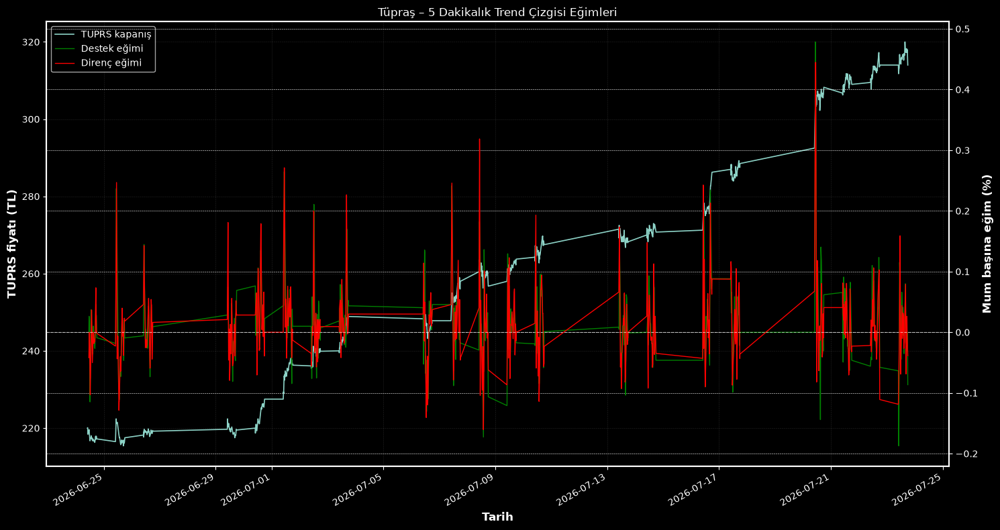

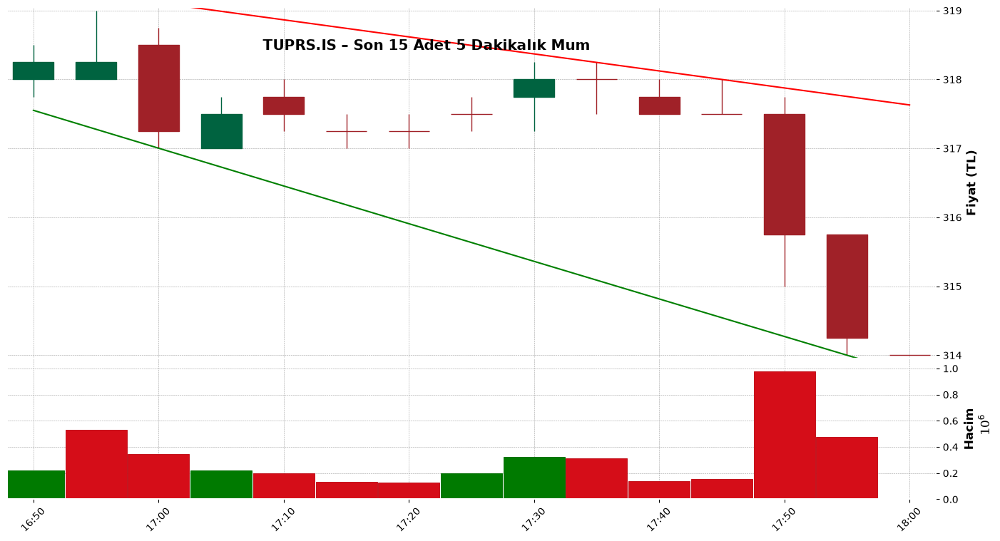

In [10]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from yahooquery import Ticker


# =========================================================
# TREND ÇİZGİSİ FONKSİYONLARI
# =========================================================

def check_trend_line(
    support: bool,
    pivot: int,
    slope: float,
    y: np.ndarray
) -> float:
    """
    Verilen pivot ve eğimle oluşturulan trend çizgisinin
    destek veya direnç şartlarını sağlayıp sağlamadığını kontrol eder.

    Destek çizgisi fiyatların üzerinde olmamalıdır.
    Direnç çizgisi fiyatların altında olmamalıdır.
    """

    intercept = -slope * pivot + y[pivot]

    x = np.arange(len(y))
    line_values = slope * x + intercept

    differences = line_values - y

    # Destek çizgisi fiyatların üzerinde kalıyorsa geçersizdir.
    if support and differences.max() > 1e-5:
        return -1.0

    # Direnç çizgisi fiyatların altında kalıyorsa geçersizdir.
    if not support and differences.min() < -1e-5:
        return -1.0

    error = np.sum(differences ** 2)

    return float(error)


def optimize_slope(
    support: bool,
    pivot: int,
    initial_slope: float,
    y: np.ndarray
) -> tuple[float, float]:
    """
    Destek veya direnç çizgisinin eğimini optimize eder.

    Dönüş:
        slope, intercept
    """

    slope_unit = (y.max() - y.min()) / len(y)

    # Verilerin tamamı aynıysa eğim sıfır olur.
    if slope_unit == 0:
        return 0.0, float(y[pivot])

    current_step = 1.0
    minimum_step = 0.0001

    best_slope = initial_slope
    best_error = check_trend_line(
        support,
        pivot,
        initial_slope,
        y
    )

    if best_error < 0:
        raise ValueError(
            "Başlangıç trend çizgisi geçersiz. "
            "Verileri kontrol edin."
        )

    calculate_derivative = True
    derivative = 0.0

    while current_step > minimum_step:

        if calculate_derivative:

            # Eğimi küçük miktarda artır.
            slope_change = (
                best_slope
                + slope_unit * minimum_step
            )

            test_error = check_trend_line(
                support,
                pivot,
                slope_change,
                y
            )

            derivative = test_error - best_error

            # Artırmak geçersiz sonuç verdiyse azaltmayı dene.
            if test_error < 0:

                slope_change = (
                    best_slope
                    - slope_unit * minimum_step
                )

                test_error = check_trend_line(
                    support,
                    pivot,
                    slope_change,
                    y
                )

                derivative = best_error - test_error

            if test_error < 0:
                raise RuntimeError(
                    "Eğim türevi hesaplanamadı. "
                    "Verilerde eksik veya geçersiz değer olabilir."
                )

            calculate_derivative = False

        # Eğim artırılınca hata büyüyorsa eğimi azalt.
        if derivative > 0:
            test_slope = (
                best_slope
                - slope_unit * current_step
            )

        # Eğim artırılınca hata küçülüyorsa eğimi artır.
        else:
            test_slope = (
                best_slope
                + slope_unit * current_step
            )

        test_error = check_trend_line(
            support,
            pivot,
            test_slope,
            y
        )

        if test_error < 0 or test_error >= best_error:

            # Sonuç kötüleştiyse adımı küçült.
            current_step *= 0.5

        else:

            # Daha iyi sonuç bulundu.
            best_error = test_error
            best_slope = test_slope
            calculate_derivative = True

    best_intercept = (
        -best_slope * pivot
        + y[pivot]
    )

    return float(best_slope), float(best_intercept)


def fit_trendlines_single(
    data: np.ndarray
) -> tuple[tuple[float, float], tuple[float, float]]:
    """
    Sadece kapanış fiyatları üzerinden destek ve direnç üretir.
    """

    data = np.asarray(data, dtype=float)

    x = np.arange(len(data))

    regression_coefficients = np.polyfit(
        x,
        data,
        1
    )

    regression_line = (
        regression_coefficients[0] * x
        + regression_coefficients[1]
    )

    upper_pivot = np.argmax(
        data - regression_line
    )

    lower_pivot = np.argmin(
        data - regression_line
    )

    support_coefficients = optimize_slope(
        support=True,
        pivot=lower_pivot,
        initial_slope=regression_coefficients[0],
        y=data
    )

    resistance_coefficients = optimize_slope(
        support=False,
        pivot=upper_pivot,
        initial_slope=regression_coefficients[0],
        y=data
    )

    return support_coefficients, resistance_coefficients


def fit_trendlines_high_low(
    high: np.ndarray,
    low: np.ndarray,
    close: np.ndarray
) -> tuple[tuple[float, float], tuple[float, float]]:
    """
    Destek çizgisini low değerlerinden,
    direnç çizgisini high değerlerinden hesaplar.
    """

    high = np.asarray(high, dtype=float)
    low = np.asarray(low, dtype=float)
    close = np.asarray(close, dtype=float)

    x = np.arange(len(close))

    regression_coefficients = np.polyfit(
        x,
        close,
        1
    )

    regression_line = (
        regression_coefficients[0] * x
        + regression_coefficients[1]
    )

    upper_pivot = np.argmax(
        high - regression_line
    )

    lower_pivot = np.argmin(
        low - regression_line
    )

    support_coefficients = optimize_slope(
        support=True,
        pivot=lower_pivot,
        initial_slope=regression_coefficients[0],
        y=low
    )

    resistance_coefficients = optimize_slope(
        support=False,
        pivot=upper_pivot,
        initial_slope=regression_coefficients[0],
        y=high
    )

    return support_coefficients, resistance_coefficients


# =========================================================
# YAHOOQUERY VERİ ÇEKME
# =========================================================

def get_yahooquery_data(
    symbol: str = "TUPRS.IS",
    period: str = "1mo",
    interval: str = "5m"
) -> pd.DataFrame:
    """
    Yahooquery üzerinden OHLCV verisi çeker.
    """

    ticker = Ticker(
        symbol,
        asynchronous=False
    )

    history = ticker.history(
        period=period,
        interval=interval,
        adj_timezone=True,
        adj_ohlc=False
    )

    if isinstance(history, dict):
        raise RuntimeError(
            f"Yahooquery veri döndürmedi:\n{history}"
        )

    if history is None or history.empty:
        raise RuntimeError(
            f"{symbol} için veri bulunamadı."
        )

    # Yahooquery genellikle symbol/date MultiIndex döndürür.
    history = history.reset_index()

    if "symbol" in history.columns:
        history = history[
            history["symbol"] == symbol
        ].copy()

        history = history.drop(
            columns=["symbol"]
        )

    # Tarih sütununun ismini belirle.
    if "date" in history.columns:
        date_column = "date"

    elif "datetime" in history.columns:
        date_column = "datetime"

    else:
        raise KeyError(
            "Yahooquery verisinde date veya datetime sütunu bulunamadı."
        )

    history[date_column] = pd.to_datetime(
        history[date_column],
        errors="coerce"
    )

    history = history.dropna(
        subset=[date_column]
    )

    history = history.set_index(
        date_column
    )

    history.index.name = "date"

    # Sütun isimlerini küçük harfe çevir.
    history.columns = [
        str(column).lower()
        for column in history.columns
    ]

    required_columns = [
        "open",
        "high",
        "low",
        "close"
    ]

    missing_columns = [
        column
        for column in required_columns
        if column not in history.columns
    ]

    if missing_columns:
        raise KeyError(
            f"Eksik sütunlar: {missing_columns}"
        )

    history = history.sort_index()

    # Aynı zaman damgasındaki mükerrer kayıtları kaldır.
    history = history[
        ~history.index.duplicated(keep="last")
    ]

    # Fiyatı olmayan kayıtları kaldır.
    history = history.dropna(
        subset=required_columns
    )

    numeric_columns = [
        column
        for column in [
            "open",
            "high",
            "low",
            "close",
            "volume"
        ]
        if column in history.columns
    ]

    history[numeric_columns] = history[
        numeric_columns
    ].apply(
        pd.to_numeric,
        errors="coerce"
    )

    history = history.dropna(
        subset=required_columns
    )

    return history


# =========================================================
# HAREKETLİ TREND EĞİMLERİ
# =========================================================

def calculate_rolling_trend_slopes(
    data: pd.DataFrame,
    lookback: int = 30
) -> pd.DataFrame:
    """
    Her mum için son lookback kadar mum üzerinden
    destek ve direnç eğimlerini hesaplar.
    """

    if len(data) < lookback:
        raise ValueError(
            f"En az {lookback} mum gerekiyor. "
            f"Mevcut mum sayısı: {len(data)}"
        )

    result = data.copy()

    # Sadece fiyatlara logaritma uygulanır.
    # Volume sütununa log uygulanmaz.
    log_prices = np.log(
        result[
            ["open", "high", "low", "close"]
        ]
    )

    support_slopes = np.full(
        len(result),
        np.nan
    )

    resistance_slopes = np.full(
        len(result),
        np.nan
    )

    for index in range(
        lookback - 1,
        len(result)
    ):

        candles = log_prices.iloc[
            index - lookback + 1:
            index + 1
        ]

        support_coefficients, resistance_coefficients = (
            fit_trendlines_high_low(
                high=candles["high"].to_numpy(),
                low=candles["low"].to_numpy(),
                close=candles["close"].to_numpy()
            )
        )

        support_slopes[index] = (
            support_coefficients[0]
        )

        resistance_slopes[index] = (
            resistance_coefficients[0]
        )

    result["support_slope"] = support_slopes
    result["resistance_slope"] = resistance_slopes

    # Logaritmik eğimi mum başına yüzde değişime çevirir.
    result["support_slope_pct"] = (
        np.expm1(result["support_slope"]) * 100
    )

    result["resistance_slope_pct"] = (
        np.expm1(result["resistance_slope"]) * 100
    )

    return result


# =========================================================
# EĞİM GRAFİĞİ
# =========================================================

def plot_slope_chart(
    data: pd.DataFrame
) -> None:
    """
    Tüpraş fiyatını ve destek/direnç eğimlerini çizer.
    """

    plt.style.use("dark_background")

    figure, price_axis = plt.subplots(
        figsize=(15, 8)
    )

    slope_axis = price_axis.twinx()

    price_line = price_axis.plot(
        data.index,
        data["close"],
        label="TUPRS kapanış",
        linewidth=1.2
    )

    support_line = slope_axis.plot(
        data.index,
        data["support_slope_pct"],
        label="Destek eğimi",
        color="green",
        linewidth=1
    )

    resistance_line = slope_axis.plot(
        data.index,
        data["resistance_slope_pct"],
        label="Direnç eğimi",
        color="red",
        linewidth=1
    )

    slope_axis.axhline(
        y=0,
        linestyle="--",
        linewidth=0.8,
        alpha=0.6
    )

    price_axis.set_title(
        "Tüpraş – 5 Dakikalık Trend Çizgisi Eğimleri"
    )

    price_axis.set_xlabel("Tarih")
    price_axis.set_ylabel("TUPRS fiyatı (TL)")

    slope_axis.set_ylabel(
        "Mum başına eğim (%)"
    )

    all_lines = (
        price_line
        + support_line
        + resistance_line
    )

    all_labels = [
        line.get_label()
        for line in all_lines
    ]

    price_axis.legend(
        all_lines,
        all_labels,
        loc="upper left"
    )

    price_axis.grid(
        alpha=0.15
    )

    figure.autofmt_xdate()
    figure.tight_layout()

    plt.show()


# =========================================================
# SON 30 MUMU DESTEK VE DİRENÇLE ÇİZME
# =========================================================

def plot_latest_candles(
    data: pd.DataFrame,
    lookback: int = 1000
) -> None:
    """
    Son lookback mumunu candlestick olarak gösterir ve
    trend destek/direnç çizgilerini mumların üzerine ekler.
    """

    try:
        import mplfinance as mpf

    except ImportError as error:
        raise ImportError(
            "Mum grafiği için mplfinance kurulmalı:\n"
            "pip install mplfinance"
        ) from error

    if len(data) < lookback:
        raise ValueError(
            f"Grafik için en az {lookback} mum gerekiyor."
        )

    candles = data.iloc[-lookback:].copy()

    log_candles = np.log(
        candles[
            ["high", "low", "close"]
        ]
    )

    support_coefficients, resistance_coefficients = (
        fit_trendlines_high_low(
            high=log_candles["high"].to_numpy(),
            low=log_candles["low"].to_numpy(),
            close=log_candles["close"].to_numpy()
        )
    )

    x = np.arange(len(candles))

    # Log ölçeğinde bulunan çizgileri yeniden TL fiyatına çevir.
    support_values = np.exp(
        support_coefficients[0] * x
        + support_coefficients[1]
    )

    resistance_values = np.exp(
        resistance_coefficients[0] * x
        + resistance_coefficients[1]
    )

    plot_data = candles.copy()

    rename_columns = {
        "open": "Open",
        "high": "High",
        "low": "Low",
        "close": "Close",
        "volume": "Volume"
    }

    plot_data = plot_data.rename(
        columns=rename_columns
    )

    support_series = pd.Series(
        support_values,
        index=plot_data.index
    )

    resistance_series = pd.Series(
        resistance_values,
        index=plot_data.index
    )

    additional_plots = [
        mpf.make_addplot(
            support_series,
            color="green",
            width=1.5
        ),
        mpf.make_addplot(
            resistance_series,
            color="red",
            width=1.5
        )
    ]

    plot_arguments = {
        "data": plot_data,
        "type": "candle",
        "style": "charles",
        "addplot": additional_plots,
        "title": (
            f"TUPRS.IS – Son {lookback} Adet "
            "5 Dakikalık Mum"
        ),
        "ylabel": "Fiyat (TL)",
        "figsize": (15, 8),
        "tight_layout": True
    }

    if "Volume" in plot_data.columns:
        plot_arguments["volume"] = True
        plot_arguments["ylabel_lower"] = "Hacim"

    mpf.plot(**plot_arguments)


# =========================================================
# PROGRAMI ÇALIŞTIR
# =========================================================

def main() -> None:

    symbol = "TUPRS.IS"
    period = "1mo"
    interval = "5m"
    lookback = 15

    print(
        f"{symbol} için {interval} veri çekiliyor..."
    )

    data = get_yahooquery_data(
        symbol=symbol,
        period=period,
        interval=interval
    )

    print(f"Toplam mum sayısı: {len(data)}")
    print(f"İlk mum: {data.index.min()}")
    print(f"Son mum: {data.index.max()}")

    data = calculate_rolling_trend_slopes(
        data=data,
        lookback=lookback
    )

    print("\nSon hesaplanan değerler:")

    print(
        data[
            [
                "close",
                "support_slope_pct",
                "resistance_slope_pct"
            ]
        ].tail(1000)
    )

    # Fiyat ve eğim grafiği
    plot_slope_chart(data)

    # Son 30 mum üzerinde destek ve direnç çizgileri
    plot_latest_candles(
        data=data,
        lookback=lookback
    )


if __name__ == "__main__":
    main()

In [1]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go
from yahooquery import Ticker

# =========================================================
# TREND ÇİZGİSİ FONKSİYONLARI (Değişmedi)
# =========================================================

def check_trend_line(support: bool, pivot: int, slope: float, y: np.ndarray) -> float:
    intercept = -slope * pivot + y[pivot]
    x = np.arange(len(y))
    line_values = slope * x + intercept
    differences = line_values - y

    if support and differences.max() > 1e-5: return -1.0
    if not support and differences.min() < -1e-5: return -1.0

    error = np.sum(differences ** 2)
    return float(error)


def optimize_slope(support: bool, pivot: int, initial_slope: float, y: np.ndarray) -> tuple[float, float]:
    slope_unit = (y.max() - y.min()) / len(y)
    if slope_unit == 0: return 0.0, float(y[pivot])

    current_step = 1.0
    minimum_step = 0.0001
    best_slope = initial_slope
    best_error = check_trend_line(support, pivot, initial_slope, y)

    if best_error < 0: raise ValueError("Başlangıç trend çizgisi geçersiz.")

    calculate_derivative = True
    derivative = 0.0

    while current_step > minimum_step:
        if calculate_derivative:
            slope_change = best_slope + slope_unit * minimum_step
            test_error = check_trend_line(support, pivot, slope_change, y)
            derivative = test_error - best_error

            if test_error < 0:
                slope_change = best_slope - slope_unit * minimum_step
                test_error = check_trend_line(support, pivot, slope_change, y)
                derivative = best_error - test_error

            if test_error < 0: raise RuntimeError("Eğim türevi hesaplanamadı.")
            calculate_derivative = False

        if derivative > 0:
            test_slope = best_slope - slope_unit * current_step
        else:
            test_slope = best_slope + slope_unit * current_step

        test_error = check_trend_line(support, pivot, test_slope, y)

        if test_error < 0 or test_error >= best_error:
            current_step *= 0.5
        else:
            best_error = test_error
            best_slope = test_slope
            calculate_derivative = True

    best_intercept = -best_slope * pivot + y[pivot]
    return float(best_slope), float(best_intercept)


def fit_trendlines_high_low(high: np.ndarray, low: np.ndarray, close: np.ndarray) -> tuple[tuple[float, float], tuple[float, float]]:
    high = np.asarray(high, dtype=float)
    low = np.asarray(low, dtype=float)
    close = np.asarray(close, dtype=float)

    x = np.arange(len(close))
    regression_coefficients = np.polyfit(x, close, 1)
    regression_line = regression_coefficients[0] * x + regression_coefficients[1]

    upper_pivot = np.argmax(high - regression_line)
    lower_pivot = np.argmin(low - regression_line)

    support_coefficients = optimize_slope(True, lower_pivot, regression_coefficients[0], low)
    resistance_coefficients = optimize_slope(False, upper_pivot, regression_coefficients[0], high)

    return support_coefficients, resistance_coefficients


# =========================================================
# YAHOOQUERY VERİ ÇEKME
# =========================================================

def get_yahooquery_data(symbol: str = "TUPRS.IS", period: str = "1mo", interval: str = "5m") -> pd.DataFrame:
    ticker = Ticker(symbol, asynchronous=False)
    history = ticker.history(period=period, interval=interval, adj_timezone=True, adj_ohlc=False)

    if isinstance(history, dict) or history is None or history.empty:
        raise RuntimeError(f"{symbol} için veri bulunamadı.")

    history = history.reset_index()
    if "symbol" in history.columns:
        history = history[history["symbol"] == symbol].copy()
        history = history.drop(columns=["symbol"])

    date_column = "date" if "date" in history.columns else "datetime"
    history[date_column] = pd.to_datetime(history[date_column], errors="coerce")
    history = history.dropna(subset=[date_column]).set_index(date_column)
    history.index.name = "date"

    history.columns = [str(column).lower() for column in history.columns]
    required_columns = ["open", "high", "low", "close"]

    history = history.sort_index()
    history = history[~history.index.duplicated(keep="last")]
    
    numeric_columns = [col for col in ["open", "high", "low", "close"] if col in history.columns]
    history[numeric_columns] = history[numeric_columns].apply(pd.to_numeric, errors="coerce")
    history = history.dropna(subset=required_columns)

    return history


# =========================================================
# DİNAMİK DESTEK-DİRENÇ HESAPLAMA
# =========================================================

def calculate_rolling_trendlines(data: pd.DataFrame, lookback: int = 30) -> pd.DataFrame:
    result = data.copy()
    
    support_prices = np.full(len(result), np.nan)
    resistance_prices = np.full(len(result), np.nan)

    log_prices = np.log(result[["high", "low", "close"]])

    for i in range(lookback - 1, len(result)):
        window = log_prices.iloc[i - lookback + 1 : i + 1]
        try:
            supp_coef, res_coef = fit_trendlines_high_low(
                window["high"].to_numpy(),
                window["low"].to_numpy(),
                window["close"].to_numpy()
            )
            x_last = lookback - 1
            support_prices[i] = np.exp(supp_coef[0] * x_last + supp_coef[1])
            resistance_prices[i] = np.exp(res_coef[0] * x_last + res_coef[1])
        except Exception:
            continue

    result["dynamic_support"] = support_prices
    result["dynamic_resistance"] = resistance_prices
    return result


# =========================================================
# PLOTLY İLE İNTERAKTİF GRAFİK (ÇÖKMEZ/DONMAZ)
# =========================================================

def plot_interactive_plotly(data: pd.DataFrame, num_candles: int = 500):
    if len(data) < num_candles:
        num_candles = len(data)

    plot_data = data.iloc[-num_candles:].copy()

    fig = go.Figure()

    # Gerçek Mum Grafiği (Candlestick)
    fig.add_trace(go.Candlestick(
        x=plot_data.index,
        open=plot_data['open'],
        high=plot_data['high'],
        low=plot_data['low'],
        close=plot_data['close'],
        name='Fiyat',
        increasing_line_color='green',
        decreasing_line_color='red'
    ))

    # Dinamik Destek Çizgisi
    fig.add_trace(go.Scatter(
        x=plot_data.index,
        y=plot_data['dynamic_support'],
        mode='lines',
        line=dict(color='cyan', width=2),
        name='Dinamik Destek'
    ))

    # Dinamik Direnç Çizgisi
    fig.add_trace(go.Scatter(
        x=plot_data.index,
        y=plot_data['dynamic_resistance'],
        mode='lines',
        line=dict(color='magenta', width=2),
        name='Dinamik Direnç'
    ))

    # Layout Ayarları ve Range Slider (Zaman Kaydırıcısı) Ekleme
    fig.update_layout(
        title=dict(text="TUPRS - Dinamik Trend Çizgileri (Plotly)", font=dict(size=20)),
        yaxis_title="Fiyat (TL)",
        xaxis_title="Zaman",
        template="plotly_dark", # Koyu tema. İsterseniz "plotly_white" yapabilirsiniz.
        xaxis_rangeslider_visible=True, # Alttaki kaydırıcıyı aktif eder
        height=700,
        margin=dict(l=50, r=50, b=50, t=80)
    )

    # İşlem dışı (haftasonu/gece) boşluklarını grafikten gizle (Tarihsel veriler için opsiyonel)
    fig.update_xaxes(
        rangebreaks=[
            dict(bounds=["sat", "mon"]), # Haftasonlarını atla
        ]
    )

    # Tarayıcıda açılır
    fig.show()


# =========================================================
# ANA PROGRAM
# =========================================================

def main() -> None:
    symbol = "TUPRS.IS"
    period = "1mo"
    interval = "5m"
    lookback = 30
    num_candles = 500

    print(f"{symbol} için {interval} veri çekiliyor...")
    data = get_yahooquery_data(symbol=symbol, period=period, interval=interval)
    print(f"Toplam indirilen geçerli mum sayısı: {len(data)}")

    print("Dinamik trend çizgileri hesaplanıyor (Lütfen bekleyin)...")
    data = calculate_rolling_trendlines(data=data, lookback=lookback)

    print("İnteraktif tarayıcı grafiği açılıyor...")
    plot_interactive_plotly(data=data, num_candles=num_candles)

if __name__ == "__main__":
    main()

TUPRS.IS için 5m veri çekiliyor...
Toplam indirilen geçerli mum sayısı: 2038
Dinamik trend çizgileri hesaplanıyor (Lütfen bekleyin)...
İnteraktif tarayıcı grafiği açılıyor...


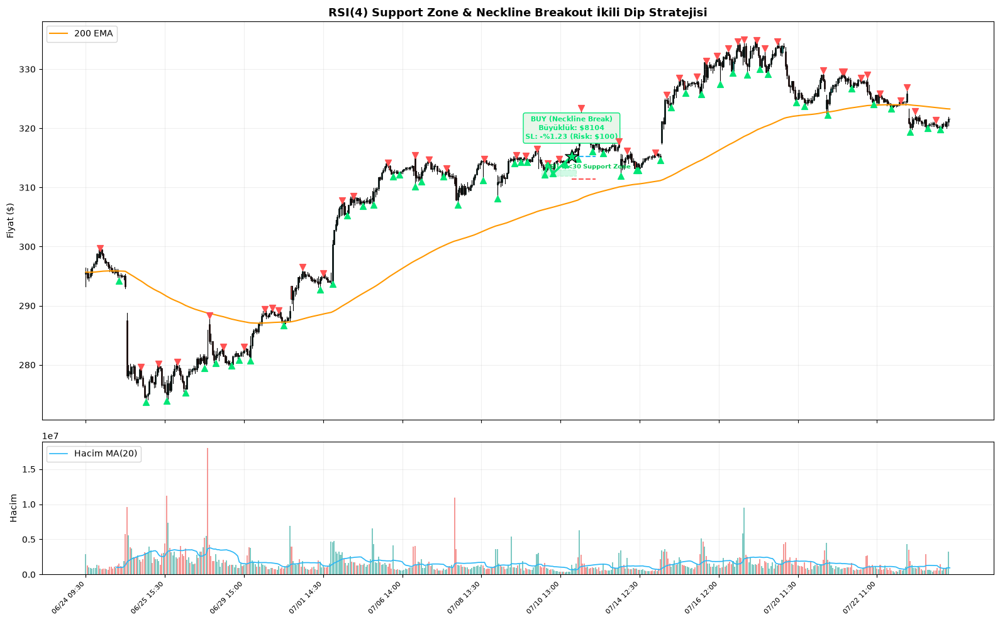

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from yahooquery import Ticker

# -------------------- 1. İNDİKATÖR HESAPLAMALARI --------------------
def calculate_indicators(df, ema_period=200, atr_period=14, vol_ma_period=20, rsi_period=4):
    # 200 EMA
    df['ema200'] = df['close'].ewm(span=ema_period, adjust=False).mean()

    # ATR (Average True Range)
    high_low = df['high'] - df['low']
    high_close = np.abs(df['high'] - df['close'].shift())
    low_close = np.abs(df['low'] - df['close'].shift())
    tr = pd.concat([high_low, high_close, low_close], axis=1).max(axis=1)
    df['atr'] = tr.rolling(window=atr_period).mean()

    # Hacim Hareketli Ortalaması
    df['vol_ma'] = df['volume'].rolling(window=vol_ma_period).mean()

    # 4 Periyotluk RSI ("Cheat Code" Filtresi)
    delta = df['close'].diff()
    gain = (delta.where(delta > 0, 0)).ewm(alpha=1/rsi_period, adjust=False).mean()
    loss = (-delta.where(delta < 0, 0)).ewm(alpha=1/rsi_period, adjust=False).mean()
    rs = gain / loss
    df['rsi4'] = 100 - (100 / (1 + rs))

    return df

# -------------------- 2. PIVOT HIGH / LOW TESPİTİ --------------------
def find_pivot_points(df, window=3):
    highs = df['high'].values
    lows = df['low'].values
    n = len(df)

    pivot_highs, pivot_lows = [], []

    for i in range(window, n - window):
        if highs[i] == max(highs[i - window : i + window + 1]):
            pivot_highs.append((i, highs[i]))
        if lows[i] == min(lows[i - window : i + window + 1]):
            pivot_lows.append((i, lows[i]))

    return pivot_highs, pivot_lows

# -------------------- 3. RSI SUPPORT ZONE & İKİLİ DİP ALGORİTMASI --------------------
def find_rsi_double_bottom(df, window=3, account_capital=10000, risk_per_trade_pct=0.01,
                            max_bars_after_pl2=15, target_rr=1.5, atr_mult=1.5):

    highs = df['high'].values
    lows = df['low'].values
    closes = df['close'].values
    volumes = df['volume'].values
    vol_mas = df['vol_ma'].values
    ema200 = df['ema200'].values
    atrs = df['atr'].values
    rsi4 = df['rsi4'].values

    pivot_highs, pivot_lows = find_pivot_points(df, window=window)

    pivots = []
    for idx, val in pivot_highs:
        pivots.append((idx, 'PH', val))
    for idx, val in pivot_lows:
        pivots.append((idx, 'PL', val))
    pivots.sort(key=lambda x: x[0])

    results = []
    risk_amount_dollar = account_capital * risk_per_trade_pct

    for i in range(len(pivots) - 2):
        p1, p2, p3 = pivots[i:i+3]

        # PL1 -> PH1 -> PL2 Yapı Şartı
        if not (p1[1] == 'PL' and p2[1] == 'PH' and p3[1] == 'PL'):
            continue

        pl1_idx, _, pl1_price = p1
        ph1_idx, _, ph1_price = p2
        pl2_idx, _, pl2_price = p3

        # 1. ŞART: RSI(4) < 30 "Cheat Code" Kontrolü (PL1 etrafında aşırı satım var mı?)
        rsi_window = rsi4[max(0, pl1_idx - 1) : min(len(rsi4), pl1_idx + 2)]
        if not np.any(rsi_window < 30):
            continue

        # 2. ŞART: Support Zone (Destek Bölgesi) Tanımı
        # PL1 mumu ve etrafındaki ATR baz alınarak Support Zone bandı oluşturulur
        sz_buffer = atrs[pl1_idx] * 0.8
        sz_bottom = pl1_price - (0.2 * atrs[pl1_idx])
        sz_top = pl1_price + sz_buffer

        # PL2 Fiyatının PL1 Destek Bölgesi İÇİNDE kalma kontrolü
        if not (sz_bottom <= pl2_price <= sz_top):
            continue

        # 3. ŞART: Neckline (Boyun Çizgisi) Kırılımı -> Giriş Anı
        start_search_idx = pl2_idx + window + 1
        end_search_idx = min(pl2_idx + max_bars_after_pl2, len(df))

        breakout_idx = None
        for bar_i in range(start_search_idx, end_search_idx):
            # Fiyat Neckline'ı (PH1) geçtiği an
            if closes[bar_i] > ph1_price:
                # 200 EMA Üstünde Olma Şartı
                if closes[bar_i] < ema200[bar_i]:
                    break
                # Hacim Onayı
                if volumes[bar_i] <= vol_mas[bar_i]:
                    continue

                breakout_idx = bar_i
                break

        if breakout_idx is not None:
            entry_price = closes[breakout_idx]
            current_atr = atrs[breakout_idx]

            # Stop Loss (PL2 Altı - 1.5 * ATR)
            stop_loss = pl2_price - (atr_mult * current_atr)

            if stop_loss >= entry_price:
                continue

            sl_distance = entry_price - stop_loss
            sl_pct = (sl_distance / entry_price)

            position_size_usd = risk_amount_dollar / sl_pct
            position_units = position_size_usd / entry_price

            # Take Profit (R:R 1.5)
            tp1_price = entry_price + (sl_distance * target_rr)

            results.append({
                'pl1': (pl1_idx, pl1_price),
                'ph1': (ph1_idx, ph1_price),
                'pl2': (pl2_idx, pl2_price),
                'sz_bottom': sz_bottom,
                'sz_top': sz_top,
                'breakout_idx': breakout_idx,
                'entry_price': entry_price,
                'stop_loss': stop_loss,
                'tp1_price': tp1_price,
                'position_size_usd': position_size_usd,
                'position_units': position_units,
                'sl_pct': sl_pct * 100,
                'risk_usd': risk_amount_dollar
            })

    return results, pivot_highs, pivot_lows

# -------------------- 4. MUM GRAFİĞİ ÇİZİMİ --------------------
def plot_candlestick(ax, df, width=0.8, color_up='#26a69a', color_down='#ef5350'):
    for i, (idx, row) in enumerate(df.iterrows()):
        open_val, high_val, low_val, close_val = row['open'], row['high'], row['low'], row['close']
        color = color_up if close_val >= open_val else color_down

        ax.plot([i, i], [low_val, high_val], color='black', linewidth=0.8)

        if close_val >= open_val:
            bottom, height = open_val, close_val - open_val
        else:
            bottom, height = close_val, open_val - close_val

        rect = Rectangle((i - width/2, bottom), width, height,
                         facecolor=color, edgecolor='black', linewidth=0.5)
        ax.add_patch(rect)

# -------------------- 5. ANA UYGULAMA --------------------
if __name__ == "__main__":
    ticker = Ticker('AAPL')
    data = ticker.history(period='1mo', interval='15m')

    if isinstance(data.index, pd.MultiIndex):
        data.index = data.index.droplevel(0)
    if isinstance(data.columns, pd.MultiIndex):
        data.columns = data.columns.get_level_values(0)

    if data.index.tz is None:
        data.index = data.index.tz_localize('UTC')
    data.index = data.index.tz_convert('US/Eastern')

    data = data.between_time('09:30', '16:00')
    data = data[['open', 'high', 'low', 'close', 'volume']].dropna()

    df_plot = data.reset_index(drop=True)
    df_plot['datetime'] = data.index

    # İndikatörleri Hesapla
    df_plot = calculate_indicators(df_plot, rsi_period=4)

    # Parametreler
    ACCOUNT_CAPITAL = 10000
    RISK_PER_TRADE = 0.01

    db_patterns, pivot_highs, pivot_lows = find_rsi_double_bottom(
        df_plot,
        window=3,
        account_capital=ACCOUNT_CAPITAL,
        risk_per_trade_pct=RISK_PER_TRADE,
        max_bars_after_pl2=15,
        target_rr=1.5,
        atr_mult=1.5
    )

    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(16, 10), sharex=True, gridspec_kw={'height_ratios': [3, 1]})

    # Fiyat Grafiği
    plot_candlestick(ax1, df_plot, width=0.8)
    ax1.plot(df_plot.index, df_plot['ema200'], color='#ff9800', linewidth=1.5, label='200 EMA')

    # Hacim Grafiği
    colors = ['#26a69a' if c >= o else '#ef5350' for c, o in zip(df_plot['close'], df_plot['open'])]
    ax2.bar(df_plot.index, df_plot['volume'], color=colors, alpha=0.6, width=0.8)
    ax2.plot(df_plot.index, df_plot['vol_ma'], color='#29b6f6', linewidth=1.2, label='Hacim MA(20)')

    # Pivot Noktaları
    for idx, price in pivot_highs:
        ax1.scatter(idx, price, marker='v', color='#ff5252', s=50, zorder=6)
    for idx, price in pivot_lows:
        ax1.scatter(idx, price, marker='^', color='#00e676', s=50, zorder=6)

    # Formasyon ve İşlem Çizimleri
    for pattern in db_patterns:
        pl1, ph1, pl2 = pattern['pl1'], pattern['ph1'], pattern['pl2']
        sz_b, sz_t = pattern['sz_bottom'], pattern['sz_top']
        brk_idx = pattern['breakout_idx']
        entry_p, sl_p, tp1_p = pattern['entry_price'], pattern['stop_loss'], pattern['tp1_price']
        pos_usd, risk_usd, sl_pct = pattern['position_size_usd'], pattern['risk_usd'], pattern['sl_pct']

        # 1. RSI Tabanlı Support Zone (Destek Bölgesi Kutusu) Çizimi
        zone_width = max(brk_idx - pl1[0] + 5, 10)
        rect_sz = Rectangle((pl1[0] - 2, sz_b), zone_width, sz_t - sz_b,
                            facecolor='#00e676', alpha=0.18, edgecolor='#00c853', linewidth=1, linestyle='--')
        ax1.add_patch(rect_sz)
        ax1.text(pl1[0], sz_t, "RSI(4)<30 Support Zone", fontsize=7, color='#00c853', fontweight='bold', va='bottom')

        # 2. W Formasyon Çizgisi
        x_shape = [pl1[0], ph1[0], pl2[0], brk_idx]
        y_shape = [pl1[1], ph1[1], pl2[1], entry_p]
        ax1.plot(x_shape, y_shape, color='#00e676', linestyle='-', linewidth=2.5, zorder=7)

        line_length = 15
        end_idx = min(brk_idx + line_length, len(df_plot) - 1)

        # 3. Giriş, SL ve TP Seviyeleri
        ax1.plot([brk_idx, end_idx], [entry_p, entry_p], color='#29b6f6', linestyle='--', linewidth=1.5)
        ax1.plot([brk_idx, end_idx], [sl_p, sl_p], color='#ff5252', linestyle='--', linewidth=1.5)
        ax1.plot([brk_idx, end_idx], [tp1_p, tp1_p], color='#00e676', linestyle='--', linewidth=1.5)

        # 4. Giriş Yıldızı ve Bilgi Kutusu
        ax1.scatter(brk_idx, entry_p, marker='*', s=260, color='#00e676', edgecolors='black', zorder=9)
        info_text = f"BUY (Neckline Break)\nBüyüklük: ${pos_usd:.0f}\nSL: -%{sl_pct:.2f} (Risk: ${risk_usd:.0f})"
        ax1.annotate(info_text, (brk_idx, entry_p), textcoords="offset points",
                    xytext=(0, 20), ha='center', fontsize=8, fontweight='bold',
                    color='#00e676', bbox=dict(boxstyle='round,pad=0.3', facecolor='#e8f5e9', edgecolor='#00e676'))

    step = 50
    tick_positions = list(range(0, len(df_plot), step))
    tick_labels = [df_plot['datetime'].iloc[i].strftime('%m/%d %H:%M') for i in tick_positions]
    ax2.set_xticks(tick_positions)
    ax2.set_xticklabels(tick_labels, rotation=45, ha='right', fontsize=8)

    ax1.set_title('RSI(4) Support Zone & Neckline Breakout İkili Dip Stratejisi', fontsize=13, fontweight='bold')
    ax1.set_ylabel('Fiyat ($)')
    ax2.set_ylabel('Hacim')
    ax1.legend(loc='upper left')
    ax2.legend(loc='upper left')
    ax1.grid(True, alpha=0.2)
    ax2.grid(True, alpha=0.2)
    plt.tight_layout()
    plt.show()

In [3]:


import numpy as np
import pandas as pd
from yahooquery import Ticker
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# -------------------- 1. İNDİKATÖR HESAPLAMALARI --------------------
def calculate_indicators(df, ema_period=200, atr_period=14, vol_ma_period=20, rsi_period=4):
    # 200 EMA
    df['ema200'] = df['close'].ewm(span=ema_period, adjust=False).mean()

    # ATR (Average True Range)
    high_low = df['high'] - df['low']
    high_close = np.abs(df['high'] - df['close'].shift())
    low_close = np.abs(df['low'] - df['close'].shift())
    tr = pd.concat([high_low, high_close, low_close], axis=1).max(axis=1)
    df['atr'] = tr.rolling(window=atr_period).mean()

    # Hacim Hareketli Ortalaması
    df['vol_ma'] = df['volume'].rolling(window=vol_ma_period).mean()

    # 4 Periyotluk RSI ("Cheat Code" Filtresi)
    delta = df['close'].diff()
    gain = (delta.where(delta > 0, 0)).ewm(alpha=1/rsi_period, adjust=False).mean()
    loss = (-delta.where(delta < 0, 0)).ewm(alpha=1/rsi_period, adjust=False).mean()
    rs = gain / loss
    df['rsi4'] = 100 - (100 / (1 + rs))

    return df

# -------------------- 2. PIVOT HIGH / LOW TESPİTİ --------------------
def find_pivot_points(df, window=3):
    highs = df['high'].values
    lows = df['low'].values
    n = len(df)

    pivot_highs, pivot_lows = [], []

    for i in range(window, n - window):
        if highs[i] == max(highs[i - window : i + window + 1]):
            pivot_highs.append((i, highs[i]))
        if lows[i] == min(lows[i - window : i + window + 1]):
            pivot_lows.append((i, lows[i]))

    return pivot_highs, pivot_lows

# -------------------- 3. RSI SUPPORT ZONE & İKİLİ DİP ALGORİTMASI --------------------
def find_rsi_double_bottom(df, window=3, account_capital=10000, risk_per_trade_pct=0.01,
                            max_bars_after_pl2=15, target_rr=1.5, atr_mult=1.5):

    highs = df['high'].values
    lows = df['low'].values
    closes = df['close'].values
    volumes = df['volume'].values
    vol_mas = df['vol_ma'].values
    ema200 = df['ema200'].values
    atrs = df['atr'].values
    rsi4 = df['rsi4'].values

    pivot_highs, pivot_lows = find_pivot_points(df, window=window)

    pivots = []
    for idx, val in pivot_highs:
        pivots.append((idx, 'PH', val))
    for idx, val in pivot_lows:
        pivots.append((idx, 'PL', val))
    pivots.sort(key=lambda x: x[0])

    results = []
    risk_amount_dollar = account_capital * risk_per_trade_pct

    for i in range(len(pivots) - 2):
        p1, p2, p3 = pivots[i:i+3]

        if not (p1[1] == 'PL' and p2[1] == 'PH' and p3[1] == 'PL'):
            continue

        pl1_idx, _, pl1_price = p1
        ph1_idx, _, ph1_price = p2
        pl2_idx, _, pl2_price = p3

        # 1. ŞART: RSI(4) < 30
        rsi_window = rsi4[max(0, pl1_idx - 1) : min(len(rsi4), pl1_idx + 2)]
        if not np.any(rsi_window < 30):
            continue

        # 2. ŞART: Support Zone
        sz_buffer = atrs[pl1_idx] * 0.8
        sz_bottom = pl1_price - (0.2 * atrs[pl1_idx])
        sz_top = pl1_price + sz_buffer

        if not (sz_bottom <= pl2_price <= sz_top):
            continue

        # 3. ŞART: Neckline Kırılımı
        start_search_idx = pl2_idx + window + 1
        end_search_idx = min(pl2_idx + max_bars_after_pl2, len(df))

        breakout_idx = None
        for bar_i in range(start_search_idx, end_search_idx):
            if closes[bar_i] > ph1_price:
                if closes[bar_i] < ema200[bar_i]:
                    break
                if volumes[bar_i] <= vol_mas[bar_i]:
                    continue

                breakout_idx = bar_i
                break

        if breakout_idx is not None:
            entry_price = closes[breakout_idx]
            current_atr = atrs[breakout_idx]

            stop_loss = pl2_price - (atr_mult * current_atr)

            if stop_loss >= entry_price:
                continue

            sl_distance = entry_price - stop_loss
            sl_pct = (sl_distance / entry_price)

            position_size_usd = risk_amount_dollar / sl_pct
            position_units = position_size_usd / entry_price
            tp1_price = entry_price + (sl_distance * target_rr)

            results.append({
                'pl1': (pl1_idx, pl1_price),
                'ph1': (ph1_idx, ph1_price),
                'pl2': (pl2_idx, pl2_price),
                'sz_bottom': sz_bottom,
                'sz_top': sz_top,
                'breakout_idx': breakout_idx,
                'entry_price': entry_price,
                'stop_loss': stop_loss,
                'tp1_price': tp1_price,
                'position_size_usd': position_size_usd,
                'position_units': position_units,
                'sl_pct': sl_pct * 100,
                'risk_usd': risk_amount_dollar
            })

    return results, pivot_highs, pivot_lows

# -------------------- 4. ANA UYGULAMA & PLOTLY ÇİZİMİ --------------------
if __name__ == "__main__":
    ticker = Ticker('AAPL')
    data = ticker.history(period='1mo', interval='15m')

    if isinstance(data.index, pd.MultiIndex):
        data.index = data.index.droplevel(0)
    if isinstance(data.columns, pd.MultiIndex):
        data.columns = data.columns.get_level_values(0)

    if data.index.tz is None:
        data.index = data.index.tz_localize('UTC')
    data.index = data.index.tz_convert('US/Eastern')

    data = data.between_time('09:30', '16:00')
    data = data[['open', 'high', 'low', 'close', 'volume']].dropna()

    df_plot = data.reset_index(drop=True)
    df_plot['datetime'] = data.index

    # İndikatörleri Hesapla
    df_plot = calculate_indicators(df_plot, rsi_period=4)

    # Parametreler
    ACCOUNT_CAPITAL = 10000
    RISK_PER_TRADE = 0.01

    db_patterns, pivot_highs, pivot_lows = find_rsi_double_bottom(
        df_plot,
        window=3,
        account_capital=ACCOUNT_CAPITAL,
        risk_per_trade_pct=RISK_PER_TRADE,
        max_bars_after_pl2=15,
        target_rr=1.5,
        atr_mult=1.5
    )

    # Plotly Subplots
    fig = make_subplots(
        rows=2, cols=1,
        shared_xaxes=True,
        vertical_spacing=0.04,
        row_heights=[0.75, 0.25],
        subplot_titles=('Fiyat Grafiği & RSI Support Zone İkili Dip Stratejisi', 'Hacim')
    )

    # 1. Mum Grafiği (Candlestick)
    fig.add_trace(
        go.Candlestick(
            x=df_plot.index,
            open=df_plot['open'],
            high=df_plot['high'],
            low=df_plot['low'],
            close=df_plot['close'],
            name='Fiyat',
            increasing_line_color='#26a69a',
            decreasing_line_color='#ef5350'
        ),
        row=1, col=1
    )

    # 2. 200 EMA
    fig.add_trace(
        go.Scatter(
            x=df_plot.index,
            y=df_plot['ema200'],
            mode='lines',
            line=dict(color='#ff9800', width=1.5),
            name='200 EMA'
        ),
        row=1, col=1
    )

    # 3. Pivot Noktaları
    ph_x = [p[0] for p in pivot_highs]
    ph_y = [p[1] for p in pivot_highs]
    pl_x = [p[0] for p in pivot_lows]
    pl_y = [p[1] for p in pivot_lows]

    fig.add_trace(
        go.Scatter(
            x=ph_x, y=ph_y,
            mode='markers',
            marker=dict(symbol='triangle-down', size=8, color='#ff5252'),
            name='Pivot High'
        ),
        row=1, col=1
    )

    fig.add_trace(
        go.Scatter(
            x=pl_x, y=pl_y,
            mode='markers',
            marker=dict(symbol='triangle-up', size=8, color='#00e676'),
            name='Pivot Low'
        ),
        row=1, col=1
    )

    # 4. Hacim Grafiği & Hacim MA
    vol_colors = ['#26a69a' if c >= o else '#ef5350' for c, o in zip(df_plot['close'], df_plot['open'])]
    fig.add_trace(
        go.Bar(
            x=df_plot.index,
            y=df_plot['volume'],
            marker_color=vol_colors,
            name='Hacim',
            opacity=0.6
        ),
        row=2, col=1
    )

    fig.add_trace(
        go.Scatter(
            x=df_plot.index,
            y=df_plot['vol_ma'],
            mode='lines',
            line=dict(color='#29b6f6', width=1.2),
            name='Hacim MA(20)'
        ),
        row=2, col=1
    )

    # 5. Formasyonlar ve Destek Bölgeleri
    for pattern in db_patterns:
        pl1, ph1, pl2 = pattern['pl1'], pattern['ph1'], pattern['pl2']
        sz_b, sz_t = pattern['sz_bottom'], pattern['sz_top']
        brk_idx = pattern['breakout_idx']
        entry_p, sl_p, tp1_p = pattern['entry_price'], pattern['stop_loss'], pattern['tp1_price']
        pos_usd, risk_usd, sl_pct = pattern['position_size_usd'], pattern['risk_usd'], pattern['sl_pct']

        # RSI Destek Bölgesi Kutusu (Support Zone)
        zone_width = max(brk_idx - pl1[0] + 5, 10)
        end_x = min(pl1[0] + zone_width, len(df_plot) - 1)

        fig.add_shape(
            type="rect",
            x0=pl1[0] - 2, x1=end_x,
            y0=sz_b, y1=sz_t,
            fillcolor="#00e676", opacity=0.18,
            line=dict(color="#00c853", width=1, dash="dash"),
            row=1, col=1
        )

        # W Formasyon Çizgisi
        x_shape = [pl1[0], ph1[0], pl2[0], brk_idx]
        y_shape = [pl1[1], ph1[1], pl2[1], entry_p]

        fig.add_trace(
            go.Scatter(
                x=x_shape, y=y_shape,
                mode='lines+markers',
                line=dict(color='#00e676', width=2.5),
                marker=dict(size=4),
                name='W Formasyonu',
                showlegend=False
            ),
            row=1, col=1
        )

        # Seviye Çizgileri (Giriş, SL, TP)
        end_idx = min(brk_idx + 15, len(df_plot) - 1)

        fig.add_trace(
            go.Scatter(
                x=[brk_idx, end_idx], y=[entry_p, entry_p],
                mode='lines', line=dict(color='#29b6f6', width=1.5, dash='dash'),
                name='Giriş', showlegend=False
            ), row=1, col=1
        )

        fig.add_trace(
            go.Scatter(
                x=[brk_idx, end_idx], y=[sl_p, sl_p],
                mode='lines', line=dict(color='#ff5252', width=1.5, dash='dash'),
                name='Stop Loss', showlegend=False
            ), row=1, col=1
        )

        fig.add_trace(
            go.Scatter(
                x=[brk_idx, end_idx], y=[tp1_p, tp1_p],
                mode='lines', line=dict(color='#00e676', width=1.5, dash='dash'),
                name='Take Profit', showlegend=False
            ), row=1, col=1
        )

        # İşlem Bilgi Etiketi
        info_text = (
            f"<b>BUY (Neckline Break)</b><br>"
            f"Büyüklük: ${pos_usd:.0f}<br>"
            f"SL: -%{sl_pct:.2f} (Risk: ${risk_usd:.0f})"
        )

        fig.add_annotation(
            x=brk_idx, y=entry_p,
            text=info_text,
            showarrow=True,
            arrowhead=2,
            arrowcolor='#00e676',
            ax=0, ay=-40,
            font=dict(size=10, color="#00e676"),
            bgcolor="#1b2a26",
            bordercolor="#00e676",
            borderwidth=1,
            row=1, col=1
        )

    # X-Ekseni Formatlaması (Tarih Bilgilerini Düzgün Gösterme)
    step = max(1, len(df_plot) // 15)
    tick_positions = list(range(0, len(df_plot), step))
    tick_labels = [df_plot['datetime'].iloc[i].strftime('%m/%d %H:%M') for i in tick_positions]

    fig.update_xaxes(
        tickvals=tick_positions,
        ticktext=tick_labels,
        rangeslider_visible=False,
        gridcolor='#2a2e39'
    )

    fig.update_yaxes(gridcolor='#2a2e39')

    # Tema ve Düzen Ayarları (Karanlık Mod)
    fig.update_layout(
        title='AAPL - RSI(4) Support Zone & Neckline Breakout İkili Dip Stratejisi',
        template='plotly_dark',
        height=850,
        showlegend=True,
        hovermode='x unified',
        paper_bgcolor='#131722',
        plot_bgcolor='#131722'
    )

    fig.show()

In [4]:
import numpy as np
import pandas as pd
from yahooquery import Ticker
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# -------------------- 1. İNDİKATÖR HESAPLAMALARI --------------------
def calculate_indicators(df, ema_period=200, atr_period=14, vol_ma_period=20, rsi_period=4):
    # 200 EMA
    df['ema200'] = df['close'].ewm(span=ema_period, adjust=False).mean()

    # ATR (Average True Range)
    high_low = df['high'] - df['low']
    high_close = np.abs(df['high'] - df['close'].shift())
    low_close = np.abs(df['low'] - df['close'].shift())
    tr = pd.concat([high_low, high_close, low_close], axis=1).max(axis=1)
    df['atr'] = tr.rolling(window=atr_period).mean()

    # Hacim Hareketli Ortalaması
    df['vol_ma'] = df['volume'].rolling(window=vol_ma_period).mean()

    # 4 Periyotluk RSI ("Cheat Code" Filtresi)
    delta = df['close'].diff()
    gain = (delta.where(delta > 0, 0)).ewm(alpha=1/rsi_period, adjust=False).mean()
    loss = (-delta.where(delta < 0, 0)).ewm(alpha=1/rsi_period, adjust=False).mean()
    rs = gain / loss
    df['rsi4'] = 100 - (100 / (1 + rs))

    return df

# -------------------- 2. PIVOT HIGH / LOW TESPİTİ --------------------
def find_pivot_points(df, window=3):
    highs = df['high'].values
    lows = df['low'].values
    n = len(df)

    pivot_highs, pivot_lows = [], []

    for i in range(window, n - window):
        if highs[i] == max(highs[i - window : i + window + 1]):
            pivot_highs.append((i, highs[i]))
        if lows[i] == min(lows[i - window : i + window + 1]):
            pivot_lows.append((i, lows[i]))

    return pivot_highs, pivot_lows

# -------------------- 3. RSI SUPPORT ZONE & YÜKSELEN DİP ALGORİTMASI --------------------
def find_rsi_double_bottom(df, window=3, account_capital=10000, risk_per_trade_pct=0.01,
                            max_bars_after_pl2=15, target_rr=1.5, atr_mult=1.5):

    highs = df['high'].values
    lows = df['low'].values
    closes = df['close'].values
    volumes = df['volume'].values
    vol_mas = df['vol_ma'].values
    ema200 = df['ema200'].values
    atrs = df['atr'].values
    rsi4 = df['rsi4'].values

    pivot_highs, pivot_lows = find_pivot_points(df, window=window)

    pivots = []
    for idx, val in pivot_highs:
        pivots.append((idx, 'PH', val))
    for idx, val in pivot_lows:
        pivots.append((idx, 'PL', val))
    pivots.sort(key=lambda x: x[0])

    results = []
    risk_amount_dollar = account_capital * risk_per_trade_pct

    for i in range(len(pivots) - 2):
        p1, p2, p3 = pivots[i:i+3]

        if not (p1[1] == 'PL' and p2[1] == 'PH' and p3[1] == 'PL'):
            continue

        pl1_idx, _, pl1_price = p1
        ph1_idx, _, ph1_price = p2
        pl2_idx, _, pl2_price = p3

        # 1. ŞART: PL1 Etrafında RSI(4) < 30 Olmalı
        rsi_window = rsi4[max(0, pl1_idx - 1) : min(len(rsi4), pl1_idx + 2)]
        if not np.any(rsi_window < 30):
            continue

        # 2. ŞART: PL2 Destek Bölgesinde veya PL1'den Yüksek Olmalı (Yükselen Dip)
        sz_buffer = atrs[pl1_idx] * 0.8
        sz_bottom = pl1_price - (0.2 * atrs[pl1_idx])
        sz_top = pl1_price + sz_buffer

        is_in_support_zone = (sz_bottom <= pl2_price <= sz_top)
        is_higher_low = (pl2_price > pl1_price and pl2_price < ph1_price)

        # İki durumdan biri geçerli değilse atla
        if not (is_in_support_zone or is_higher_low):
            continue

        # 3. ŞART: Neckline Kırılımı & Giriş
        start_search_idx = pl2_idx + window + 1
        end_search_idx = min(pl2_idx + max_bars_after_pl2, len(df))

        breakout_idx = None
        for bar_i in range(start_search_idx, end_search_idx):
            if closes[bar_i] > ph1_price:
                if closes[bar_i] < ema200[bar_i]:
                    break
                if volumes[bar_i] <= vol_mas[bar_i]:
                    continue

                breakout_idx = bar_i
                break

        if breakout_idx is not None:
            entry_price = closes[breakout_idx]
            current_atr = atrs[breakout_idx]

            stop_loss = pl2_price - (atr_mult * current_atr)

            if stop_loss >= entry_price:
                continue

            sl_distance = entry_price - stop_loss
            sl_pct = (sl_distance / entry_price)

            position_size_usd = risk_amount_dollar / sl_pct
            position_units = position_size_usd / entry_price
            tp1_price = entry_price + (sl_distance * target_rr)

            results.append({
                'pl1': (pl1_idx, pl1_price),
                'ph1': (ph1_idx, ph1_price),
                'pl2': (pl2_idx, pl2_price),
                'sz_bottom': sz_bottom,
                'sz_top': sz_top,
                'is_higher_low': is_higher_low,
                'breakout_idx': breakout_idx,
                'entry_price': entry_price,
                'stop_loss': stop_loss,
                'tp1_price': tp1_price,
                'position_size_usd': position_size_usd,
                'position_units': position_units,
                'sl_pct': sl_pct * 100,
                'risk_usd': risk_amount_dollar
            })

    return results, pivot_highs, pivot_lows

# -------------------- 4. PLOTLY ÇİZİMİ --------------------
if __name__ == "__main__":
    ticker = Ticker('AAPL')
    data = ticker.history(period='1mo', interval='15m')

    if isinstance(data.index, pd.MultiIndex):
        data.index = data.index.droplevel(0)
    if isinstance(data.columns, pd.MultiIndex):
        data.columns = data.columns.get_level_values(0)

    if data.index.tz is None:
        data.index = data.index.tz_localize('UTC')
    data.index = data.index.tz_convert('US/Eastern')

    data = data.between_time('09:30', '16:00')
    data = data[['open', 'high', 'low', 'close', 'volume']].dropna()

    df_plot = data.reset_index(drop=True)
    df_plot['datetime'] = data.index

    # İndikatörleri Hesapla
    df_plot = calculate_indicators(df_plot, rsi_period=4)

    # Parametreler
    ACCOUNT_CAPITAL = 10000
    RISK_PER_TRADE = 0.01

    db_patterns, pivot_highs, pivot_lows = find_rsi_double_bottom(
        df_plot,
        window=3,
        account_capital=ACCOUNT_CAPITAL,
        risk_per_trade_pct=RISK_PER_TRADE,
        max_bars_after_pl2=15,
        target_rr=1.5,
        atr_mult=1.5
    )

    # Plotly Subplots
    fig = make_subplots(
        rows=2, cols=1,
        shared_xaxes=True,
        vertical_spacing=0.04,
        row_heights=[0.75, 0.25],
        subplot_titles=('Fiyat Grafiği - RSI(4) & Yükselen İkili Dip Stratejisi', 'Hacim')
    )

    # 1. Mum Grafiği
    fig.add_trace(
        go.Candlestick(
            x=df_plot.index,
            open=df_plot['open'],
            high=df_plot['high'],
            low=df_plot['low'],
            close=df_plot['close'],
            name='Fiyat',
            increasing_line_color='#26a69a',
            decreasing_line_color='#ef5350'
        ),
        row=1, col=1
    )

    # 2. 200 EMA
    fig.add_trace(
        go.Scatter(
            x=df_plot.index,
            y=df_plot['ema200'],
            mode='lines',
            line=dict(color='#ff9800', width=1.5),
            name='200 EMA'
        ),
        row=1, col=1
    )

    # 3. Pivot Noktaları
    ph_x = [p[0] for p in pivot_highs]
    ph_y = [p[1] for p in pivot_highs]
    pl_x = [p[0] for p in pivot_lows]
    pl_y = [p[1] for p in pivot_lows]

    fig.add_trace(
        go.Scatter(
            x=ph_x, y=ph_y,
            mode='markers',
            marker=dict(symbol='triangle-down', size=8, color='#ff5252'),
            name='Pivot High'
        ),
        row=1, col=1
    )

    fig.add_trace(
        go.Scatter(
            x=pl_x, y=pl_y,
            mode='markers',
            marker=dict(symbol='triangle-up', size=8, color='#00e676'),
            name='Pivot Low'
        ),
        row=1, col=1
    )

    # 4. Hacim Grafiği
    vol_colors = ['#26a69a' if c >= o else '#ef5350' for c, o in zip(df_plot['close'], df_plot['open'])]
    fig.add_trace(
        go.Bar(
            x=df_plot.index,
            y=df_plot['volume'],
            marker_color=vol_colors,
            name='Hacim',
            opacity=0.6
        ),
        row=2, col=1
    )

    fig.add_trace(
        go.Scatter(
            x=df_plot.index,
            y=df_plot['vol_ma'],
            mode='lines',
            line=dict(color='#29b6f6', width=1.2),
            name='Hacim MA(20)'
        ),
        row=2, col=1
    )

    # 5. Formasyonlar ve İşlem Alanları
    for pattern in db_patterns:
        pl1, ph1, pl2 = pattern['pl1'], pattern['ph1'], pattern['pl2']
        sz_b, sz_t = pattern['sz_bottom'], pattern['sz_top']
        brk_idx = pattern['breakout_idx']
        entry_p, sl_p, tp1_p = pattern['entry_price'], pattern['stop_loss'], pattern['tp1_price']
        pos_usd, risk_usd, sl_pct = pattern['position_size_usd'], pattern['risk_usd'], pattern['sl_pct']
        is_hl = pattern['is_higher_low']

        # Support Zone Kutusu
        zone_width = max(brk_idx - pl1[0] + 5, 10)
        end_x = min(pl1[0] + zone_width, len(df_plot) - 1)

        fig.add_shape(
            type="rect",
            x0=pl1[0] - 2, x1=end_x,
            y0=sz_b, y1=sz_t,
            fillcolor="#00e676", opacity=0.18,
            line=dict(color="#00c853", width=1, dash="dash"),
            row=1, col=1
        )

        # W Formasyon Çizgisi
        x_shape = [pl1[0], ph1[0], pl2[0], brk_idx]
        y_shape = [pl1[1], ph1[1], pl2[1], entry_p]

        fig.add_trace(
            go.Scatter(
                x=x_shape, y=y_shape,
                mode='lines+markers',
                line=dict(color='#00e676', width=2.5),
                marker=dict(size=4),
                name='W Formasyonu',
                showlegend=False
            ),
            row=1, col=1
        )

        # Seviye Çizgileri
        end_idx = min(brk_idx + 15, len(df_plot) - 1)

        fig.add_trace(
            go.Scatter(
                x=[brk_idx, end_idx], y=[entry_p, entry_p],
                mode='lines', line=dict(color='#29b6f6', width=1.5, dash='dash'),
                showlegend=False
            ), row=1, col=1
        )

        fig.add_trace(
            go.Scatter(
                x=[brk_idx, end_idx], y=[sl_p, sl_p],
                mode='lines', line=dict(color='#ff5252', width=1.5, dash='dash'),
                showlegend=False
            ), row=1, col=1
        )

        fig.add_trace(
            go.Scatter(
                x=[brk_idx, end_idx], y=[tp1_p, tp1_p],
                mode='lines', line=dict(color='#00e676', width=1.5, dash='dash'),
                showlegend=False
            ), row=1, col=1
        )

        # Etiket Metni
        dip_type = "Higher Low Dip" if is_hl else "Destek Bölgesi Dibi"
        info_text = (
            f"<b>BUY ({dip_type})</b><br>"
            f"Büyüklük: ${pos_usd:.0f}<br>"
            f"SL: -%{sl_pct:.2f} (Risk: ${risk_usd:.0f})"
        )

        fig.add_annotation(
            x=brk_idx, y=entry_p,
            text=info_text,
            showarrow=True,
            arrowhead=2,
            arrowcolor='#00e676',
            ax=0, ay=-40,
            font=dict(size=10, color="#00e676"),
            bgcolor="#1b2a26",
            bordercolor="#00e676",
            borderwidth=1,
            row=1, col=1
        )

    # Formatlama
    step = max(1, len(df_plot) // 15)
    tick_positions = list(range(0, len(df_plot), step))
    tick_labels = [df_plot['datetime'].iloc[i].strftime('%m/%d %H:%M') for i in tick_positions]

    fig.update_xaxes(
        tickvals=tick_positions,
        ticktext=tick_labels,
        rangeslider_visible=False,
        gridcolor='#2a2e39'
    )

    fig.update_yaxes(gridcolor='#2a2e39')

    fig.update_layout(
        title='AAPL - RSI(4) Support Zone & Higher Low İkili Dip Stratejisi',
        template='plotly_dark',
        height=850,
        showlegend=True,
        hovermode='x unified',
        paper_bgcolor='#131722',
        plot_bgcolor='#131722'
    )

    fig.show()

In [5]:
import numpy as np
import pandas as pd
from yahooquery import Ticker
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# -------------------- 1. İNDİKATÖR HESAPLAMALARI --------------------
def calculate_indicators(df, ema_period=200, atr_period=14, vol_ma_period=20, rsi_period=4):
    # 200 EMA
    df['ema200'] = df['close'].ewm(span=ema_period, adjust=False).mean()

    # ATR (Average True Range)
    high_low = df['high'] - df['low']
    high_close = np.abs(df['high'] - df['close'].shift())
    low_close = np.abs(df['low'] - df['close'].shift())
    tr = pd.concat([high_low, high_close, low_close], axis=1).max(axis=1)
    df['atr'] = tr.rolling(window=atr_period).mean()

    # Hacim Hareketli Ortalaması
    df['vol_ma'] = df['volume'].rolling(window=vol_ma_period).mean()

    # 4 Periyotluk RSI ("Cheat Code" Filtresi)
    delta = df['close'].diff()
    gain = (delta.where(delta > 0, 0)).ewm(alpha=1/rsi_period, adjust=False).mean()
    loss = (-delta.where(delta < 0, 0)).ewm(alpha=1/rsi_period, adjust=False).mean()
    rs = gain / loss
    df['rsi4'] = 100 - (100 / (1 + rs))

    return df

# -------------------- 2. PIVOT HIGH / LOW TESPİTİ --------------------
def find_pivot_points(df, window=3):
    highs = df['high'].values
    lows = df['low'].values
    n = len(df)

    pivot_highs, pivot_lows = [], []

    for i in range(window, n - window):
        if highs[i] == max(highs[i - window : i + window + 1]):
            pivot_highs.append((i, highs[i]))
        if lows[i] == min(lows[i - window : i + window + 1]):
            pivot_lows.append((i, lows[i]))

    return pivot_highs, pivot_lows

# -------------------- 3. RSI SUPPORT ZONE & HH KONTROLLÜ İKİLİ DİP --------------------
def find_rsi_double_bottom(df, window=3, account_capital=10000, risk_per_trade_pct=0.01,
                            max_bars_after_pl2=15, target_rr=1.5, atr_mult=1.5):

    highs = df['high'].values
    lows = df['low'].values
    closes = df['close'].values
    volumes = df['volume'].values
    vol_mas = df['vol_ma'].values
    ema200 = df['ema200'].values
    atrs = df['atr'].values
    rsi4 = df['rsi4'].values

    pivot_highs, pivot_lows = find_pivot_points(df, window=window)

    pivots = []
    for idx, val in pivot_highs:
        pivots.append((idx, 'PH', val))
    for idx, val in pivot_lows:
        pivots.append((idx, 'PL', val))
    pivots.sort(key=lambda x: x[0])

    results = []
    risk_amount_dollar = account_capital * risk_per_trade_pct

    # ph0 (Önceki HH), p1 (PL1), p2 (PH1 / Neckline), p3 (PL2)
    for i in range(1, len(pivots) - 2):
        ph0 = pivots[i-1]
        p1, p2, p3 = pivots[i:i+3]

        if not (ph0[1] == 'PH' and p1[1] == 'PL' and p2[1] == 'PH' and p3[1] == 'PL'):
            continue

        ph0_idx, _, ph0_price = ph0
        pl1_idx, _, pl1_price = p1
        ph1_idx, _, ph1_price = p2
        pl2_idx, _, pl2_price = p3

        # YENİ ŞART: Sol dip öncesindeki HH (ph0), Neckline'dan (ph1) yüksek olmalı
        if ph0_price <= ph1_price:
            continue

        # 1. ŞART: PL1 Etrafında RSI(4) < 30 Olmalı
        rsi_window = rsi4[max(0, pl1_idx - 1) : min(len(rsi4), pl1_idx + 2)]
        if not np.any(rsi_window < 30):
            continue

        # 2. ŞART: PL2 Destek Bölgesinde veya Yükselen Dip (HL) Olmalı
        sz_buffer = atrs[pl1_idx] * 0.8
        sz_bottom = pl1_price - (0.2 * atrs[pl1_idx])
        sz_top = pl1_price + sz_buffer

        is_in_support_zone = (sz_bottom <= pl2_price <= sz_top)
        is_higher_low = (pl2_price > pl1_price and pl2_price < ph1_price)

        if not (is_in_support_zone or is_higher_low):
            continue

        # 3. ŞART: Neckline Kırılımı & Giriş
        start_search_idx = pl2_idx + window + 1
        end_search_idx = min(pl2_idx + max_bars_after_pl2, len(df))

        breakout_idx = None
        for bar_i in range(start_search_idx, end_search_idx):
            if closes[bar_i] > ph1_price:
                if closes[bar_i] < ema200[bar_i]:
                    break
                if volumes[bar_i] <= vol_mas[bar_i]:
                    continue

                breakout_idx = bar_i
                break

        if breakout_idx is not None:
            entry_price = closes[breakout_idx]
            current_atr = atrs[breakout_idx]

            stop_loss = pl2_price - (atr_mult * current_atr)

            if stop_loss >= entry_price:
                continue

            sl_distance = entry_price - stop_loss
            sl_pct = (sl_distance / entry_price)

            position_size_usd = risk_amount_dollar / sl_pct
            position_units = position_size_usd / entry_price
            tp1_price = entry_price + (sl_distance * target_rr)

            results.append({
                'ph0': (ph0_idx, ph0_price),
                'pl1': (pl1_idx, pl1_price),
                'ph1': (ph1_idx, ph1_price),
                'pl2': (pl2_idx, pl2_price),
                'sz_bottom': sz_bottom,
                'sz_top': sz_top,
                'is_higher_low': is_higher_low,
                'breakout_idx': breakout_idx,
                'entry_price': entry_price,
                'stop_loss': stop_loss,
                'tp1_price': tp1_price,
                'position_size_usd': position_size_usd,
                'position_units': position_units,
                'sl_pct': sl_pct * 100,
                'risk_usd': risk_amount_dollar
            })

    return results, pivot_highs, pivot_lows

# -------------------- 4. PLOTLY ÇİZİMİ --------------------
if __name__ == "__main__":
    ticker = Ticker('AAPL')
    data = ticker.history(period='1mo', interval='15m')

    if isinstance(data.index, pd.MultiIndex):
        data.index = data.index.droplevel(0)
    if isinstance(data.columns, pd.MultiIndex):
        data.columns = data.columns.get_level_values(0)

    if data.index.tz is None:
        data.index = data.index.tz_localize('UTC')
    data.index = data.index.tz_convert('US/Eastern')

    data = data.between_time('09:30', '16:00')
    data = data[['open', 'high', 'low', 'close', 'volume']].dropna()

    df_plot = data.reset_index(drop=True)
    df_plot['datetime'] = data.index

    # İndikatörler
    df_plot = calculate_indicators(df_plot, rsi_period=4)

    # Parametreler
    ACCOUNT_CAPITAL = 10000
    RISK_PER_TRADE = 0.01

    db_patterns, pivot_highs, pivot_lows = find_rsi_double_bottom(
        df_plot,
        window=3,
        account_capital=ACCOUNT_CAPITAL,
        risk_per_trade_pct=RISK_PER_TRADE,
        max_bars_after_pl2=15,
        target_rr=1.5,
        atr_mult=1.5
    )

    # Plotly Subplots
    fig = make_subplots(
        rows=2, cols=1,
        shared_xaxes=True,
        vertical_spacing=0.04,
        row_heights=[0.75, 0.25],
        subplot_titles=('Fiyat Grafiği - HH Doğrulamalı İkili Dip Stratejisi', 'Hacim')
    )

    # 1. Mum Grafiği
    fig.add_trace(
        go.Candlestick(
            x=df_plot.index,
            open=df_plot['open'],
            high=df_plot['high'],
            low=df_plot['low'],
            close=df_plot['close'],
            name='Fiyat',
            increasing_line_color='#26a69a',
            decreasing_line_color='#ef5350'
        ),
        row=1, col=1
    )

    # 2. 200 EMA
    fig.add_trace(
        go.Scatter(
            x=df_plot.index,
            y=df_plot['ema200'],
            mode='lines',
            line=dict(color='#ff9800', width=1.5),
            name='200 EMA'
        ),
        row=1, col=1
    )

    # 3. Pivot Noktaları
    ph_x = [p[0] for p in pivot_highs]
    ph_y = [p[1] for p in pivot_highs]
    pl_x = [p[0] for p in pivot_lows]
    pl_y = [p[1] for p in pivot_lows]

    fig.add_trace(
        go.Scatter(
            x=ph_x, y=ph_y,
            mode='markers',
            marker=dict(symbol='triangle-down', size=8, color='#ff5252'),
            name='Pivot High'
        ),
        row=1, col=1
    )

    fig.add_trace(
        go.Scatter(
            x=pl_x, y=pl_y,
            mode='markers',
            marker=dict(symbol='triangle-up', size=8, color='#00e676'),
            name='Pivot Low'
        ),
        row=1, col=1
    )

    # 4. Hacim Grafiği
    vol_colors = ['#26a69a' if c >= o else '#ef5350' for c, o in zip(df_plot['close'], df_plot['open'])]
    fig.add_trace(
        go.Bar(
            x=df_plot.index,
            y=df_plot['volume'],
            marker_color=vol_colors,
            name='Hacim',
            opacity=0.6
        ),
        row=2, col=1
    )

    fig.add_trace(
        go.Scatter(
            x=df_plot.index,
            y=df_plot['vol_ma'],
            mode='lines',
            line=dict(color='#29b6f6', width=1.2),
            name='Hacim MA(20)'
        ),
        row=2, col=1
    )

    # 5. Formasyonlar (PH0 -> PL1 -> PH1 -> PL2 -> Breakout)
    for pattern in db_patterns:
        ph0, pl1, ph1, pl2 = pattern['ph0'], pattern['pl1'], pattern['ph1'], pattern['pl2']
        sz_b, sz_t = pattern['sz_bottom'], pattern['sz_top']
        brk_idx = pattern['breakout_idx']
        entry_p, sl_p, tp1_p = pattern['entry_price'], pattern['stop_loss'], pattern['tp1_price']
        pos_usd, risk_usd, sl_pct = pattern['position_size_usd'], pattern['risk_usd'], pattern['sl_pct']

        # Support Zone Kutusu
        zone_width = max(brk_idx - pl1[0] + 5, 10)
        end_x = min(pl1[0] + zone_width, len(df_plot) - 1)

        fig.add_shape(
            type="rect",
            x0=pl1[0] - 2, x1=end_x,
            y0=sz_b, y1=sz_t,
            fillcolor="#00e676", opacity=0.18,
            line=dict(color="#00c853", width=1, dash="dash"),
            row=1, col=1
        )

        # Formasyon Çizgisi (HH0'dan başlar)
        x_shape = [ph0[0], pl1[0], ph1[0], pl2[0], brk_idx]
        y_shape = [ph0[1], pl1[1], ph1[1], pl2[1], entry_p]

        fig.add_trace(
            go.Scatter(
                x=x_shape, y=y_shape,
                mode='lines+markers',
                line=dict(color='#00e676', width=2.5),
                marker=dict(size=4),
                name='W Formasyonu',
                showlegend=False
            ),
            row=1, col=1
        )

        # Seviye Çizgileri
        end_idx = min(brk_idx + 15, len(df_plot) - 1)

        fig.add_trace(
            go.Scatter(
                x=[brk_idx, end_idx], y=[entry_p, entry_p],
                mode='lines', line=dict(color='#29b6f6', width=1.5, dash='dash'),
                showlegend=False
            ), row=1, col=1
        )

        fig.add_trace(
            go.Scatter(
                x=[brk_idx, end_idx], y=[sl_p, sl_p],
                mode='lines', line=dict(color='#ff5252', width=1.5, dash='dash'),
                showlegend=False
            ), row=1, col=1
        )

        fig.add_trace(
            go.Scatter(
                x=[brk_idx, end_idx], y=[tp1_p, tp1_p],
                mode='lines', line=dict(color='#00e676', width=1.5, dash='dash'),
                showlegend=False
            ), row=1, col=1
        )

        # Etiket Metni
        info_text = (
            f"<b>BUY (HH0 > Neckline Validated)</b><br>"
            f"Büyüklük: ${pos_usd:.0f}<br>"
            f"SL: -%{sl_pct:.2f} (Risk: ${risk_usd:.0f})"
        )

        fig.add_annotation(
            x=brk_idx, y=entry_p,
            text=info_text,
            showarrow=True,
            arrowhead=2,
            arrowcolor='#00e676',
            ax=0, ay=-40,
            font=dict(size=10, color="#00e676"),
            bgcolor="#1b2a26",
            bordercolor="#00e676",
            borderwidth=1,
            row=1, col=1
        )

    # Formatlama
    step = max(1, len(df_plot) // 15)
    tick_positions = list(range(0, len(df_plot), step))
    tick_labels = [df_plot['datetime'].iloc[i].strftime('%m/%d %H:%M') for i in tick_positions]

    fig.update_xaxes(
        tickvals=tick_positions,
        ticktext=tick_labels,
        rangeslider_visible=False,
        gridcolor='#2a2e39'
    )

    fig.update_yaxes(gridcolor='#2a2e39')

    fig.update_layout(
        title='AAPL - RSI(4) Support Zone & HH Validated İkili Dip Stratejisi',
        template='plotly_dark',
        height=850,
        showlegend=True,
        hovermode='x unified',
        paper_bgcolor='#131722',
        plot_bgcolor='#131722'
    )

    fig.show()

In [1]:
import numpy as np
import pandas as pd
from yahooquery import Ticker
import vectorbt as vbt
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# -------------------- 1. İNDİKATÖR HESAPLAMALARI --------------------
def calculate_indicators(df, ema_period=200, atr_period=14, vol_ma_period=20, rsi_period=4):
    df['ema200'] = df['close'].ewm(span=ema_period, adjust=False).mean()

    # ATR (Average True Range)
    high_low = df['high'] - df['low']
    high_close = np.abs(df['high'] - df['close'].shift())
    low_close = np.abs(df['low'] - df['close'].shift())
    tr = pd.concat([high_low, high_close, low_close], axis=1).max(axis=1)
    df['atr'] = tr.rolling(window=atr_period).mean()

    # Hacim MA
    df['vol_ma'] = df['volume'].rolling(window=vol_ma_period).mean()

    # 4 Periyotluk RSI
    delta = df['close'].diff()
    gain = (delta.where(delta > 0, 0)).ewm(alpha=1/rsi_period, adjust=False).mean()
    loss = (-delta.where(delta < 0, 0)).ewm(alpha=1/rsi_period, adjust=False).mean()
    rs = gain / loss
    df['rsi4'] = 100 - (100 / (1 + rs))

    return df

# -------------------- 2. PIVOT TESPİTİ --------------------
def find_pivot_points(df, window=3):
    highs = df['high'].values
    lows = df['low'].values
    n = len(df)

    pivot_highs, pivot_lows = [], []

    for i in range(window, n - window):
        if highs[i] == max(highs[i - window : i + window + 1]):
            pivot_highs.append((i, highs[i]))
        if lows[i] == min(lows[i - window : i + window + 1]):
            pivot_lows.append((i, lows[i]))

    return pivot_highs, pivot_lows

# -------------------- 3. STRATEJİ & SİNYAL ÜRETİCİ --------------------
def generate_signals(df, window=3, max_bars_after_pl2=15, target_rr=1.5, atr_mult=1.5):
    closes = df['close'].values
    volumes = df['volume'].values
    vol_mas = df['vol_ma'].values
    ema200 = df['ema200'].values
    atrs = df['atr'].values
    rsi4 = df['rsi4'].values

    pivot_highs, pivot_lows = find_pivot_points(df, window=window)

    pivots = []
    for idx, val in pivot_highs:
        pivots.append((idx, 'PH', val))
    for idx, val in pivot_lows:
        pivots.append((idx, 'PL', val))
    pivots.sort(key=lambda x: x[0])

    entries = pd.Series(False, index=df.index)
    sl_stop = pd.Series(np.nan, index=df.index)
    tp_stop = pd.Series(np.nan, index=df.index)

    patterns = []

    for i in range(1, len(pivots) - 2):
        ph0 = pivots[i-1]
        p1, p2, p3 = pivots[i:i+3]

        if not (ph0[1] == 'PH' and p1[1] == 'PL' and p2[1] == 'PH' and p3[1] == 'PL'):
            continue

        ph0_idx, _, ph0_price = ph0
        pl1_idx, _, pl1_price = p1
        ph1_idx, _, ph1_price = p2
        pl2_idx, _, pl2_price = p3

        # ŞART 0: Önceki HH > Neckline (PH0 > PH1)
        if ph0_price <= ph1_price:
            continue

        # ŞART 1: PL1 Etrafında RSI(4) < 30
        rsi_window = rsi4[max(0, pl1_idx - 1) : min(len(rsi4), pl1_idx + 2)]
        if not np.any(rsi_window < 30):
            continue

        # ŞART 2: Support Zone veya Yükselen Dip (HL)
        sz_buffer = atrs[pl1_idx] * 0.8
        sz_bottom = pl1_price - (0.2 * atrs[pl1_idx])
        sz_top = pl1_price + sz_buffer

        is_in_support_zone = (sz_bottom <= pl2_price <= sz_top)
        is_higher_low = (pl2_price > pl1_price and pl2_price < ph1_price)

        if not (is_in_support_zone or is_higher_low):
            continue

        # ŞART 3: Neckline Kırılımı + EMA200 + Hacim Onayı
        start_search_idx = pl2_idx + window + 1
        end_search_idx = min(pl2_idx + max_bars_after_pl2, len(df))

        breakout_idx = None
        for bar_i in range(start_search_idx, end_search_idx):
            if closes[bar_i] > ph1_price:
                if closes[bar_i] < ema200[bar_i]:
                    break
                if volumes[bar_i] <= vol_mas[bar_i]:
                    continue

                breakout_idx = bar_i
                break

        if breakout_idx is not None:
            entry_price = closes[breakout_idx]
            current_atr = atrs[breakout_idx]

            stop_loss = pl2_price - (atr_mult * current_atr)
            if stop_loss >= entry_price:
                continue

            sl_pct = (entry_price - stop_loss) / entry_price
            tp_pct = sl_pct * target_rr

            entries.iloc[breakout_idx] = True
            sl_stop.iloc[breakout_idx] = sl_pct
            tp_stop.iloc[breakout_idx] = tp_pct

            patterns.append({
                'ph0': (ph0_idx, ph0_price),
                'pl1': (pl1_idx, pl1_price),
                'ph1': (ph1_idx, ph1_price),
                'pl2': (pl2_idx, pl2_price),
                'breakout_idx': breakout_idx,
                'entry_price': entry_price,
                'stop_loss': stop_loss,
                'tp_price': entry_price * (1 + tp_pct)
            })

    return entries, sl_stop, tp_stop, patterns, pivot_highs, pivot_lows


# -------------------- 4. VECTORBT BACKTEST ÇALIŞTIRICI --------------------
def run_vectorbt_backtest(df, entries, sl_stop, tp_stop, init_cash=10000, fees=0.0005):
    """
    VectorBT ile dinamik Stop-Loss ve Take-Profit içeren backtest yürütür.
    fees: %0.05 işlem komisyonu (örneğin borsa komisyonları için)
    """
    portfolio = vbt.Portfolio.from_signals(
        close=df['close'],
        entries=entries,
        exits=None,
        sl_stop=sl_stop,
        tp_stop=tp_stop,
        init_cash=init_cash,
        fees=fees,
        freq='15m'
    )
    return portfolio


# -------------------- 5. ANA ÇALIŞTIRICI --------------------
if __name__ == "__main__":
    # 1. Veri İndirme (AAPL 15 Dakikalık Veri)
    ticker = Ticker('AAPL')
    data = ticker.history(period='60d', interval='5m')

    if isinstance(data.index, pd.MultiIndex):
        data.index = data.index.droplevel(0)
    if isinstance(data.columns, pd.MultiIndex):
        data.columns = data.columns.get_level_values(0)

    if data.index.tz is None:
        data.index = data.index.tz_localize('UTC')
    data.index = data.index.tz_convert('US/Eastern')

    data = data.between_time('09:30', '16:00')
    data = data[['open', 'high', 'low', 'close', 'volume']].dropna()

    df = data.reset_index(drop=True)
    df['datetime'] = data.index

    # 2. İndikatör & Sinyal Üretimi
    df = calculate_indicators(df, rsi_period=4)
    entries, sl_stop, tp_stop, patterns, pivot_highs, pivot_lows = generate_signals(
        df, window=3, max_bars_after_pl2=15, target_rr=1.5, atr_mult=1.5
    )

    # 3. VectorBT Backtest
    print("\n" + "="*50)
    print("      VECTORBT BACKTEST SONUÇLARI      ")
    print("="*50)
    
    pf = run_vectorbt_backtest(df, entries, sl_stop, tp_stop, init_cash=10000, fees=0.0005)
    
    # Detaylı İstatistikler
    stats = pf.stats()
    print(stats)

    # 4. VectorBT Özeti Grafikleştirme (Portfolio Equity & Cumulative Returns)
    pf.plot().show()


      VECTORBT BACKTEST SONUÇLARI      
Start                                        0
End                                       4680
Period                        48 days 18:15:00
Start Value                            10000.0
End Value                          9878.720347
Total Return [%]                     -1.212797
Benchmark Return [%]                 19.522053
Max Gross Exposure [%]                   100.0
Total Fees Paid                      81.259115
Max Drawdown [%]                      6.781726
Max Drawdown Duration         18 days 14:45:00
Total Trades                                 8
Total Closed Trades                          8
Total Open Trades                            0
Open Trade PnL                             0.0
Win Rate [%]                              37.5
Best Trade [%]                        4.962231
Worst Trade [%]                      -4.264159
Avg Winning Trade [%]                 2.147771
Avg Losing Trade [%]                 -1.486573
Avg Winning Trade D

In [2]:
import numpy as np
import pandas as pd
from yahooquery import Ticker
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# -------------------- 1. İNDİKATÖR HESAPLAMALARI --------------------
def calculate_indicators(df, ema_period=200, atr_period=14, vol_ma_period=20, rsi_period=4):
    df['ema200'] = df['close'].ewm(span=ema_period, adjust=False).mean()

    # ATR (Average True Range)
    high_low = df['high'] - df['low']
    high_close = np.abs(df['high'] - df['close'].shift())
    low_close = np.abs(df['low'] - df['close'].shift())
    tr = pd.concat([high_low, high_close, low_close], axis=1).max(axis=1)
    df['atr'] = tr.rolling(window=atr_period).mean()

    # Hacim Hareketli Ortalaması
    df['vol_ma'] = df['volume'].rolling(window=vol_ma_period).mean()

    # 4 Periyotluk RSI
    delta = df['close'].diff()
    gain = (delta.where(delta > 0, 0)).ewm(alpha=1/rsi_period, adjust=False).mean()
    loss = (-delta.where(delta < 0, 0)).ewm(alpha=1/rsi_period, adjust=False).mean()
    rs = gain / loss
    df['rsi4'] = 100 - (100 / (1 + rs))

    return df

# -------------------- 2. PIVOT HIGH / LOW TESPİTİ --------------------
def find_pivot_points(df, window=3):
    highs = df['high'].values
    lows = df['low'].values
    n = len(df)

    pivot_highs, pivot_lows = [], []

    for i in range(window, n - window):
        if highs[i] == max(highs[i - window : i + window + 1]):
            pivot_highs.append((i, highs[i]))
        if lows[i] == min(lows[i - window : i + window + 1]):
            pivot_lows.append((i, lows[i]))

    return pivot_highs, pivot_lows

# -------------------- 3. DÜZELTİLMİŞ STRATEJİ MANTIĞI --------------------
def find_rsi_double_bottom(df, window=3, account_capital=10000, risk_per_trade_pct=0.01,
                            max_bars_after_pl2=15, target_rr=1.5, atr_mult=1.5):

    highs = df['high'].values
    lows = df['low'].values
    closes = df['close'].values
    opens = df['open'].values
    volumes = df['volume'].values
    vol_mas = df['vol_ma'].values
    ema200 = df['ema200'].values
    atrs = df['atr'].values
    rsi4 = df['rsi4'].values

    pivot_highs, pivot_lows = find_pivot_points(df, window=window)

    pivots = []
    for idx, val in pivot_highs:
        pivots.append((idx, 'PH', val))
    for idx, val in pivot_lows:
        pivots.append((idx, 'PL', val))
    pivots.sort(key=lambda x: x[0])

    results = []
    risk_amount_dollar = account_capital * risk_per_trade_pct

    for i in range(1, len(pivots) - 2):
        ph0 = pivots[i-1]
        p1, p2, p3 = pivots[i:i+3]

        if not (ph0[1] == 'PH' and p1[1] == 'PL' and p2[1] == 'PH' and p3[1] == 'PL'):
            continue

        ph0_idx, _, ph0_price = ph0
        pl1_idx, _, pl1_price = p1
        ph1_idx, _, ph1_price = p2
        pl2_idx, _, pl2_price = p3

        # Sol dip öncesi HH (ph0) > Neckline (ph1)
        if ph0_price <= ph1_price:
            continue

        # PL1 civarında RSI(4) < 30
        rsi_window = rsi4[max(0, pl1_idx - 1) : min(len(rsi4), pl1_idx + 2)]
        if not np.any(rsi_window < 30):
            continue

        # PL2 Destek Bölgesi veya Yükselen Dip
        sz_buffer = atrs[pl1_idx] * 0.8
        sz_bottom = pl1_price - (0.2 * atrs[pl1_idx])
        sz_top = pl1_price + sz_buffer

        is_in_support_zone = (sz_bottom <= pl2_price <= sz_top)
        is_higher_low = (pl2_price > pl1_price and pl2_price < ph1_price)

        if not (is_in_support_zone or is_higher_low):
            continue

        # --- DÜZELTİLEN KISIM: Direnç Kırılımı (Anlık Giriş) ---
        start_search_idx = pl2_idx + 1  # Dip oluştuğu andan itibaren takibe al
        end_search_idx = min(pl2_idx + max_bars_after_pl2, len(df))

        breakout_idx = None
        for bar_i in range(start_search_idx, end_search_idx):
            # Fiyat ara tepeyi (ph1_price direnci) geçti mi?
            if highs[bar_i] >= ph1_price:
                # Trend Filtresi: Kapanış EMA200 üzerinde olmalı
                if closes[bar_i] < ema200[bar_i]:
                    continue  # 'break' YERİNE 'continue' -> Sonraki barlara bakmaya devam et

                # Hacim Filtresi (İsteğe bağlı esnetilebilir)
                if volumes[bar_i] <= vol_mas[bar_i]:
                    continue

                breakout_idx = bar_i
                break

        if breakout_idx is not None:
            # Giriş Fiyatı: Tam direnç seviyesi (Gap varsa açılış fiyatı)
            entry_price = max(ph1_price, opens[breakout_idx])
            current_atr = atrs[breakout_idx]

            stop_loss = pl2_price - (atr_mult * current_atr)

            if stop_loss >= entry_price:
                continue

            sl_distance = entry_price - stop_loss
            sl_pct = (sl_distance / entry_price)

            position_size_usd = risk_amount_dollar / sl_pct
            position_units = position_size_usd / entry_price
            tp1_price = entry_price + (sl_distance * target_rr)

            results.append({
                'ph0': (ph0_idx, ph0_price),
                'pl1': (pl1_idx, pl1_price),
                'ph1': (ph1_idx, ph1_price),
                'pl2': (pl2_idx, pl2_price),
                'sz_bottom': sz_bottom,
                'sz_top': sz_top,
                'is_higher_low': is_higher_low,
                'breakout_idx': breakout_idx,
                'entry_price': entry_price,
                'stop_loss': stop_loss,
                'tp1_price': tp1_price,
                'position_size_usd': position_size_usd,
                'position_units': position_units,
                'sl_pct': sl_pct * 100,
                'risk_usd': risk_amount_dollar
            })

    return results, pivot_highs, pivot_lows

# -------------------- 4. PLOTLY ÇİZİMİ --------------------
if __name__ == "__main__":
    ticker = Ticker('AAPL')
    data = ticker.history(period='1mo', interval='15m')

    if isinstance(data.index, pd.MultiIndex):
        data.index = data.index.droplevel(0)
    if isinstance(data.columns, pd.MultiIndex):
        data.columns = data.columns.get_level_values(0)

    if data.index.tz is None:
        data.index = data.index.tz_localize('UTC')
    data.index = data.index.tz_convert('US/Eastern')

    data = data.between_time('09:30', '16:00')
    data = data[['open', 'high', 'low', 'close', 'volume']].dropna()

    df_plot = data.reset_index(drop=True)
    df_plot['datetime'] = data.index

    df_plot = calculate_indicators(df_plot, rsi_period=4)

    ACCOUNT_CAPITAL = 10000
    RISK_PER_TRADE = 0.01

    db_patterns, pivot_highs, pivot_lows = find_rsi_double_bottom(
        df_plot,
        window=3,
        account_capital=ACCOUNT_CAPITAL,
        risk_per_trade_pct=RISK_PER_TRADE,
        max_bars_after_pl2=15,
        target_rr=1.5,
        atr_mult=1.5
    )

    fig = make_subplots(
        rows=2, cols=1,
        shared_xaxes=True,
        vertical_spacing=0.04,
        row_heights=[0.75, 0.25],
        subplot_titles=('Fiyat Grafiği - Direnç Kırılımlı İkili Dip Stratejisi', 'Hacim')
    )

    fig.add_trace(
        go.Candlestick(
            x=df_plot.index,
            open=df_plot['open'],
            high=df_plot['high'],
            low=df_plot['low'],
            close=df_plot['close'],
            name='Fiyat',
            increasing_line_color='#26a69a',
            decreasing_line_color='#ef5350'
        ),
        row=1, col=1
    )

    fig.add_trace(
        go.Scatter(
            x=df_plot.index,
            y=df_plot['ema200'],
            mode='lines',
            line=dict(color='#ff9800', width=1.5),
            name='200 EMA'
        ),
        row=1, col=1
    )

    for pattern in db_patterns:
        ph0, pl1, ph1, pl2 = pattern['ph0'], pattern['pl1'], pattern['ph1'], pattern['pl2']
        brk_idx = pattern['breakout_idx']
        entry_p, sl_p, tp1_p = pattern['entry_price'], pattern['stop_loss'], pattern['tp1_price']

        # W Çizgisi
        x_shape = [ph0[0], pl1[0], ph1[0], pl2[0], brk_idx]
        y_shape = [ph0[1], pl1[1], ph1[1], pl2[1], entry_p]

        fig.add_trace(
            go.Scatter(
                x=x_shape, y=y_shape,
                mode='lines+markers',
                line=dict(color='#00e676', width=2.5),
                marker=dict(size=5),
                showlegend=False
            ),
            row=1, col=1
        )

        # Giriş Seviye Çizgisi (Neckline ile Aynı Seviye)
        end_idx = min(brk_idx + 15, len(df_plot) - 1)
        fig.add_trace(
            go.Scatter(
                x=[brk_idx, end_idx], y=[entry_p, entry_p],
                mode='lines', line=dict(color='#29b6f6', width=1.5, dash='dash'),
                name='Resistance Break Entry', showlegend=False
            ), row=1, col=1
        )

    fig.update_layout(
        title='AAPL - Direnç Geçildiği An Giriş Yapan İkili Dip Stratejisi',
        template='plotly_dark',
        height=800,
        paper_bgcolor='#131722',
        plot_bgcolor='#131722'
    )

    fig.show()

In [3]:
import numpy as np
import pandas as pd
from yahooquery import Ticker
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# -------------------- 1. İNDİKATÖR HESAPLAMALARI --------------------
def calculate_indicators(df, ema_period=200, atr_period=14, vol_ma_period=20, rsi_period=4):
    df['ema200'] = df['close'].ewm(span=ema_period, adjust=False).mean()

    # ATR (Average True Range)
    high_low = df['high'] - df['low']
    high_close = np.abs(df['high'] - df['close'].shift())
    low_close = np.abs(df['low'] - df['close'].shift())
    tr = pd.concat([high_low, high_close, low_close], axis=1).max(axis=1)
    df['atr'] = tr.rolling(window=atr_period).mean()

    # Hacim Hareketli Ortalaması
    df['vol_ma'] = df['volume'].rolling(window=vol_ma_period).mean()

    # 4 Periyotluk RSI
    delta = df['close'].diff()
    gain = (delta.where(delta > 0, 0)).ewm(alpha=1/rsi_period, adjust=False).mean()
    loss = (-delta.where(delta < 0, 0)).ewm(alpha=1/rsi_period, adjust=False).mean()
    rs = gain / loss
    df['rsi4'] = 100 - (100 / (1 + rs))

    return df

# -------------------- 2. PIVOT HIGH / LOW TESPİTİ --------------------
def find_pivot_points(df, window=3):
    highs = df['high'].values
    lows = df['low'].values
    n = len(df)

    pivot_highs, pivot_lows = [], []

    for i in range(window, n - window):
        if highs[i] == max(highs[i - window : i + window + 1]):
            pivot_highs.append((i, highs[i]))
        if lows[i] == min(lows[i - window : i + window + 1]):
            pivot_lows.append((i, lows[i]))

    return pivot_highs, pivot_lows

# -------------------- 3. STRATEJİ & ZONE TESPİTİ --------------------
def find_rsi_double_bottom(df, window=3, account_capital=10000, risk_per_trade_pct=0.01,
                            max_bars_after_pl2=15, target_rr=1.5, atr_mult=1.5):

    highs = df['high'].values
    lows = df['low'].values
    closes = df['close'].values
    opens = df['open'].values
    volumes = df['volume'].values
    vol_mas = df['vol_ma'].values
    ema200 = df['ema200'].values
    atrs = df['atr'].values
    rsi4 = df['rsi4'].values

    pivot_highs, pivot_lows = find_pivot_points(df, window=window)

    pivots = []
    for idx, val in pivot_highs:
        pivots.append((idx, 'PH', val))
    for idx, val in pivot_lows:
        pivots.append((idx, 'PL', val))
    pivots.sort(key=lambda x: x[0])

    results = []
    risk_amount_dollar = account_capital * risk_per_trade_pct

    for i in range(1, len(pivots) - 2):
        ph0 = pivots[i-1]
        p1, p2, p3 = pivots[i:i+3]

        if not (ph0[1] == 'PH' and p1[1] == 'PL' and p2[1] == 'PH' and p3[1] == 'PL'):
            continue

        ph0_idx, _, ph0_price = ph0
        pl1_idx, _, pl1_price = p1
        ph1_idx, _, ph1_price = p2
        pl2_idx, _, pl2_price = p3

        # Sol dip öncesi HH (ph0) > Neckline (ph1)
        if ph0_price <= ph1_price:
            continue

        # PL1 civarında RSI(4) < 30
        rsi_window = rsi4[max(0, pl1_idx - 1) : min(len(rsi4), pl1_idx + 2)]
        if not np.any(rsi_window < 30):
            continue

        # Support Zone (Destek Bölgesi) Hesabı
        sz_buffer = atrs[pl1_idx] * 0.8
        sz_bottom = pl1_price - (0.2 * atrs[pl1_idx])
        sz_top = pl1_price + sz_buffer

        is_in_support_zone = (sz_bottom <= pl2_price <= sz_top)
        is_higher_low = (pl2_price > pl1_price and pl2_price < ph1_price)

        if not (is_in_support_zone or is_higher_low):
            continue

        # Resistance Zone (Direnç Bölgesi / Neckline) Hesabı
        rz_buffer = atrs[ph1_idx] * 0.3
        rz_bottom = ph1_price - rz_buffer
        rz_top = ph1_price + rz_buffer

        # Direnç Kırılımı Tespiti
        start_search_idx = pl2_idx + 1
        end_search_idx = min(pl2_idx + max_bars_after_pl2, len(df))

        breakout_idx = None
        for bar_i in range(start_search_idx, end_search_idx):
            if highs[bar_i] >= ph1_price:
                if closes[bar_i] < ema200[bar_i]:
                    continue
                if volumes[bar_i] <= vol_mas[bar_i]:
                    continue

                breakout_idx = bar_i
                break

        if breakout_idx is not None:
            entry_price = max(ph1_price, opens[breakout_idx])
            current_atr = atrs[breakout_idx]

            stop_loss = pl2_price - (atr_mult * current_atr)

            if stop_loss >= entry_price:
                continue

            sl_distance = entry_price - stop_loss
            sl_pct = (sl_distance / entry_price)

            position_size_usd = risk_amount_dollar / sl_pct
            position_units = position_size_usd / entry_price
            tp1_price = entry_price + (sl_distance * target_rr)

            results.append({
                'ph0': (ph0_idx, ph0_price),
                'pl1': (pl1_idx, pl1_price),
                'ph1': (ph1_idx, ph1_price),
                'pl2': (pl2_idx, pl2_price),
                'sz_bottom': sz_bottom,
                'sz_top': sz_top,
                'rz_bottom': rz_bottom,
                'rz_top': rz_top,
                'breakout_idx': breakout_idx,
                'entry_price': entry_price,
                'stop_loss': stop_loss,
                'tp1_price': tp1_price,
                'position_size_usd': position_size_usd,
                'sl_pct': sl_pct * 100,
                'risk_usd': risk_amount_dollar
            })

    return results, pivot_highs, pivot_lows

# -------------------- 4. PLOTLY ÇİZİMİ --------------------
if __name__ == "__main__":
    ticker = Ticker('AAPL')
    data = ticker.history(period='1mo', interval='15m')

    if isinstance(data.index, pd.MultiIndex):
        data.index = data.index.droplevel(0)
    if isinstance(data.columns, pd.MultiIndex):
        data.columns = data.columns.get_level_values(0)

    if data.index.tz is None:
        data.index = data.index.tz_localize('UTC')
    data.index = data.index.tz_convert('US/Eastern')

    data = data.between_time('09:30', '16:00')
    data = data[['open', 'high', 'low', 'close', 'volume']].dropna()

    df_plot = data.reset_index(drop=True)
    df_plot['datetime'] = data.index

    df_plot = calculate_indicators(df_plot, rsi_period=4)

    ACCOUNT_CAPITAL = 10000
    RISK_PER_TRADE = 0.01

    db_patterns, pivot_highs, pivot_lows = find_rsi_double_bottom(
        df_plot,
        window=3,
        account_capital=ACCOUNT_CAPITAL,
        risk_per_trade_pct=RISK_PER_TRADE,
        max_bars_after_pl2=15,
        target_rr=1.5,
        atr_mult=1.5
    )

    fig = make_subplots(
        rows=2, cols=1,
        shared_xaxes=True,
        vertical_spacing=0.04,
        row_heights=[0.75, 0.25],
        subplot_titles=('Fiyat Grafiği - Destek & Direnç Bölgeli İkili Dip Stratejisi', 'Hacim')
    )

    # 1. Mumluk Grafik
    fig.add_trace(
        go.Candlestick(
            x=df_plot.index,
            open=df_plot['open'],
            high=df_plot['high'],
            low=df_plot['low'],
            close=df_plot['close'],
            name='Fiyat',
            increasing_line_color='#26a69a',
            decreasing_line_color='#ef5350'
        ),
        row=1, col=1
    )

    # 2. EMA 200
    fig.add_trace(
        go.Scatter(
            x=df_plot.index,
            y=df_plot['ema200'],
            mode='lines',
            line=dict(color='#ff9800', width=1.5),
            name='200 EMA'
        ),
        row=1, col=1
    )

    # 3. Pivot Noktaları
    ph_x = [p[0] for p in pivot_highs]
    ph_y = [p[1] for p in pivot_highs]
    pl_x = [p[0] for p in pivot_lows]
    pl_y = [p[1] for p in pivot_lows]

    fig.add_trace(
        go.Scatter(
            x=ph_x, y=ph_y,
            mode='markers',
            marker=dict(symbol='triangle-down', size=8, color='#ff5252'),
            name='Pivot High'
        ),
        row=1, col=1
    )

    fig.add_trace(
        go.Scatter(
            x=pl_x, y=pl_y,
            mode='markers',
            marker=dict(symbol='triangle-up', size=8, color='#00e676'),
            name='Pivot Low'
        ),
        row=1, col=1
    )

    # 4. Formasyonlar, Bölge Kutuları (Zones) ve Seviyeler
    for pattern in db_patterns:
        ph0, pl1, ph1, pl2 = pattern['ph0'], pattern['pl1'], pattern['ph1'], pattern['pl2']
        sz_b, sz_t = pattern['sz_bottom'], pattern['sz_top']
        rz_b, rz_t = pattern['rz_bottom'], pattern['rz_top']
        brk_idx = pattern['breakout_idx']
        entry_p, sl_p, tp1_p = pattern['entry_price'], pattern['stop_loss'], pattern['tp1_price']
        pos_usd, risk_usd, sl_pct = pattern['position_size_usd'], pattern['risk_usd'], pattern['sl_pct']

        end_x = min(brk_idx + 12, len(df_plot) - 1)

        # A) DESTEK BÖLGESİ KUTUSU (Support Zone - Yeşil)
        fig.add_shape(
            type="rect",
            x0=pl1[0] - 1, x1=end_x,
            y0=sz_b, y1=sz_t,
            fillcolor="#00e676", opacity=0.15,
            line=dict(color="#00c853", width=1, dash="dash"),
            row=1, col=1
        )

        # B) DİRENÇ BÖLGESİ KUTUSU (Resistance Zone / Neckline - Kırmızı)
        fig.add_shape(
            type="rect",
            x0=ph1[0] - 1, x1=end_x,
            y0=rz_b, y1=rz_t,
            fillcolor="#ff5252", opacity=0.18,
            line=dict(color="#ff1744", width=1, dash="dash"),
            row=1, col=1
        )

        # C) W Formasyonu Çizgisi (HH0'dan Başlar)
        x_shape = [ph0[0], pl1[0], ph1[0], pl2[0], brk_idx]
        y_shape = [ph0[1], pl1[1], ph1[1], pl2[1], entry_p]

        fig.add_trace(
            go.Scatter(
                x=x_shape, y=y_shape,
                mode='lines+markers',
                line=dict(color='#00e676', width=2.5),
                marker=dict(size=5),
                name='W Formasyonu',
                showlegend=False
            ),
            row=1, col=1
        )

        # D) Giriş, Stop-Loss ve Take-Profit Seviye Çizgileri
        fig.add_trace(
            go.Scatter(
                x=[brk_idx, end_x], y=[entry_p, entry_p],
                mode='lines', line=dict(color='#29b6f6', width=1.5, dash='dash'),
                name='Entry Level', showlegend=False
            ), row=1, col=1
        )

        fig.add_trace(
            go.Scatter(
                x=[brk_idx, end_x], y=[sl_p, sl_p],
                mode='lines', line=dict(color='#ff5252', width=1.5, dash='dash'),
                name='Stop Loss', showlegend=False
            ), row=1, col=1
        )

        fig.add_trace(
            go.Scatter(
                x=[brk_idx, end_x], y=[tp1_p, tp1_p],
                mode='lines', line=dict(color='#00e676', width=1.5, dash='dash'),
                name='Take Profit', showlegend=False
            ), row=1, col=1
        )

        # E) Bilgi Etiketi
        info_text = (
            f"<b>BUY (Direnç Kırılımı)</b><br>"
            f"Giriş: {entry_p:.2f}<br>"
            f"SL: {sl_p:.2f} (-%{sl_pct:.2f})<br>"
            f"TP: {tp1_p:.2f}"
        )

        fig.add_annotation(
            x=brk_idx, y=entry_p,
            text=info_text,
            showarrow=True,
            arrowhead=2,
            arrowcolor='#00e676',
            ax=0, ay=-50,
            font=dict(size=10, color="#00e676"),
            bgcolor="#1b2a26",
            bordercolor="#00e676",
            borderwidth=1,
            row=1, col=1
        )

    # 5. Hacim Paneli
    vol_colors = ['#26a69a' if c >= o else '#ef5350' for c, o in zip(df_plot['close'], df_plot['open'])]
    fig.add_trace(
        go.Bar(
            x=df_plot.index,
            y=df_plot['volume'],
            marker_color=vol_colors,
            name='Hacim',
            opacity=0.6
        ),
        row=2, col=1
    )

    fig.add_trace(
        go.Scatter(
            x=df_plot.index,
            y=df_plot['vol_ma'],
            mode='lines',
            line=dict(color='#29b6f6', width=1.2),
            name='Hacim MA(20)'
        ),
        row=2, col=1
    )

    # Formatlama & Eksen Ayarları
    step = max(1, len(df_plot) // 15)
    tick_positions = list(range(0, len(df_plot), step))
    tick_labels = [df_plot['datetime'].iloc[i].strftime('%m/%d %H:%M') for i in tick_positions]

    fig.update_xaxes(
        tickvals=tick_positions,
        ticktext=tick_labels,
        rangeslider_visible=False,
        gridcolor='#2a2e39'
    )

    fig.update_yaxes(gridcolor='#2a2e39')

    fig.update_layout(
        title='AAPL - Support Zone (Destek) & Resistance Zone (Direnç) İkili Dip Grafiği',
        template='plotly_dark',
        height=850,
        showlegend=True,
        hovermode='x unified',
        paper_bgcolor='#131722',
        plot_bgcolor='#131722'
    )

    fig.show()

In [4]:
import numpy as np
import pandas as pd
from yahooquery import Ticker
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# -------------------- 1. İNDİKATÖR HESAPLAMALARI --------------------
def calculate_indicators(df, ema_period=200, atr_period=14, vol_ma_period=20, rsi_period=4):
    df['ema200'] = df['close'].ewm(span=ema_period, adjust=False).mean()

    # ATR (Average True Range)
    high_low = df['high'] - df['low']
    high_close = np.abs(df['high'] - df['close'].shift())
    low_close = np.abs(df['low'] - df['close'].shift())
    tr = pd.concat([high_low, high_close, low_close], axis=1).max(axis=1)
    df['atr'] = tr.rolling(window=atr_period).mean()

    # Hacim Hareketli Ortalaması
    df['vol_ma'] = df['volume'].rolling(window=vol_ma_period).mean()

    # 4 Periyotluk RSI
    delta = df['close'].diff()
    gain = (delta.where(delta > 0, 0)).ewm(alpha=1/rsi_period, adjust=False).mean()
    loss = (-delta.where(delta < 0, 0)).ewm(alpha=1/rsi_period, adjust=False).mean()
    rs = gain / loss
    df['rsi4'] = 100 - (100 / (1 + rs))

    return df

# -------------------- 2. PIVOT HIGH / LOW TESPİTİ --------------------
def find_pivot_points(df, window=3):
    highs = df['high'].values
    lows = df['low'].values
    n = len(df)

    pivot_highs, pivot_lows = [], []

    for i in range(window, n - window):
        if highs[i] == max(highs[i - window : i + window + 1]):
            pivot_highs.append((i, highs[i]))
        if lows[i] == min(lows[i - window : i + window + 1]):
            pivot_lows.append((i, lows[i]))

    return pivot_highs, pivot_lows

# -------------------- 3. DİRENÇ BÖLGESİ (RESISTANCE ZONE) KIRILIMLI STRATEJİ --------------------
def find_rsi_double_bottom(df, window=3, account_capital=10000, risk_per_trade_pct=0.01,
                            max_bars_after_pl2=20, target_rr=1.5, atr_mult=1.5):

    highs = df['high'].values
    lows = df['low'].values
    closes = df['close'].values
    opens = df['open'].values
    atrs = df['atr'].values
    rsi4 = df['rsi4'].values

    pivot_highs, pivot_lows = find_pivot_points(df, window=window)

    pivots = []
    for idx, val in pivot_highs:
        pivots.append((idx, 'PH', val))
    for idx, val in pivot_lows:
        pivots.append((idx, 'PL', val))
    pivots.sort(key=lambda x: x[0])

    results = []
    risk_amount_dollar = account_capital * risk_per_trade_pct

    for i in range(1, len(pivots) - 2):
        ph0 = pivots[i-1]
        p1, p2, p3 = pivots[i:i+3]

        if not (ph0[1] == 'PH' and p1[1] == 'PL' and p2[1] == 'PH' and p3[1] == 'PL'):
            continue

        ph0_idx, _, ph0_price = ph0
        pl1_idx, _, pl1_price = p1
        ph1_idx, _, ph1_price = p2
        pl2_idx, _, pl2_price = p3

        # Sol dip öncesi HH (ph0) > Neckline (ph1)
        if ph0_price <= ph1_price:
            continue

        # PL1 civarında RSI(4) < 30
        rsi_window = rsi4[max(0, pl1_idx - 1) : min(len(rsi4), pl1_idx + 2)]
        if not np.any(rsi_window < 30):
            continue

        # Support Zone (Destek Bölgesi) Hesabı
        sz_buffer = atrs[pl1_idx] * 0.8
        sz_bottom = pl1_price - (0.2 * atrs[pl1_idx])
        sz_top = pl1_price + sz_buffer

        is_in_support_zone = (sz_bottom <= pl2_price <= sz_top)
        is_higher_low = (pl2_price > pl1_price and pl2_price < ph1_price)

        if not (is_in_support_zone or is_higher_low):
            continue

        # Resistance Zone (Direnç Bölgesi) Hesabı
        rz_buffer = atrs[ph1_idx] * 0.3
        rz_bottom = ph1_price - rz_buffer
        rz_top = ph1_price + rz_buffer  # Direnç Bölgesinin Üst Sınırı

        # --- DİRENÇ BÖLGESİNİ (rz_top) GEÇTİĞİ AN GİRİŞ ---
        start_search_idx = pl2_idx + 1
        end_search_idx = min(pl2_idx + max_bars_after_pl2, len(df))

        breakout_idx = None
        for bar_i in range(start_search_idx, end_search_idx):
            # Fiyat direnç bölgesinin ÜSTÜNE çıktığı İLK BAR
            if highs[bar_i] >= rz_top:
                breakout_idx = bar_i
                break

        if breakout_idx is not None:
            # GİRİŞ FİYATI: Tam olarak Direnç Bölgesinin Üst Sınırı (rz_top)
            # (Gapping varsa bar açılışından girer)
            entry_price = max(rz_top, opens[breakout_idx])
            current_atr = atrs[breakout_idx]

            stop_loss = pl2_price - (atr_mult * current_atr)

            if stop_loss >= entry_price:
                continue

            sl_distance = entry_price - stop_loss
            sl_pct = (sl_distance / entry_price)

            position_size_usd = risk_amount_dollar / sl_pct
            position_units = position_size_usd / entry_price
            tp1_price = entry_price + (sl_distance * target_rr)

            results.append({
                'ph0': (ph0_idx, ph0_price),
                'pl1': (pl1_idx, pl1_price),
                'ph1': (ph1_idx, ph1_price),
                'pl2': (pl2_idx, pl2_price),
                'sz_bottom': sz_bottom,
                'sz_top': sz_top,
                'rz_bottom': rz_bottom,
                'rz_top': rz_top,
                'breakout_idx': breakout_idx,
                'entry_price': entry_price,
                'stop_loss': stop_loss,
                'tp1_price': tp1_price,
                'position_size_usd': position_size_usd,
                'sl_pct': sl_pct * 100,
                'risk_usd': risk_amount_dollar
            })

    return results, pivot_highs, pivot_lows

# -------------------- 4. PLOTLY ÇİZİMİ --------------------
if __name__ == "__main__":
    ticker = Ticker('AAPL')
    data = ticker.history(period='1mo', interval='15m')

    if isinstance(data.index, pd.MultiIndex):
        data.index = data.index.droplevel(0)
    if isinstance(data.columns, pd.MultiIndex):
        data.columns = data.columns.get_level_values(0)

    if data.index.tz is None:
        data.index = data.index.tz_localize('UTC')
    data.index = data.index.tz_convert('US/Eastern')

    data = data.between_time('09:30', '16:00')
    data = data[['open', 'high', 'low', 'close', 'volume']].dropna()

    df_plot = data.reset_index(drop=True)
    df_plot['datetime'] = data.index

    df_plot = calculate_indicators(df_plot, rsi_period=4)

    ACCOUNT_CAPITAL = 10000
    RISK_PER_TRADE = 0.01

    db_patterns, pivot_highs, pivot_lows = find_rsi_double_bottom(
        df_plot,
        window=3,
        account_capital=ACCOUNT_CAPITAL,
        risk_per_trade_pct=RISK_PER_TRADE,
        max_bars_after_pl2=20,
        target_rr=1.5,
        atr_mult=1.5
    )

    fig = make_subplots(
        rows=2, cols=1,
        shared_xaxes=True,
        vertical_spacing=0.04,
        row_heights=[0.75, 0.25],
        subplot_titles=('Fiyat Grafiği - Resistance Zone Kırılımlı Anlık Giriş', 'Hacim')
    )

    # 1. Mum Grafiği
    fig.add_trace(
        go.Candlestick(
            x=df_plot.index,
            open=df_plot['open'],
            high=df_plot['high'],
            low=df_plot['low'],
            close=df_plot['close'],
            name='Fiyat',
            increasing_line_color='#26a69a',
            decreasing_line_color='#ef5350'
        ),
        row=1, col=1
    )

    # 2. 200 EMA
    fig.add_trace(
        go.Scatter(
            x=df_plot.index,
            y=df_plot['ema200'],
            mode='lines',
            line=dict(color='#ff9800', width=1.5),
            name='200 EMA'
        ),
        row=1, col=1
    )

    # 3. Formasyonlar ve Bölge Kutuları
    for pattern in db_patterns:
        ph0, pl1, ph1, pl2 = pattern['ph0'], pattern['pl1'], pattern['ph1'], pattern['pl2']
        sz_b, sz_t = pattern['sz_bottom'], pattern['sz_top']
        rz_b, rz_t = pattern['rz_bottom'], pattern['rz_top']
        brk_idx = pattern['breakout_idx']
        entry_p, sl_p, tp1_p = pattern['entry_price'], pattern['stop_loss'], pattern['tp1_price']
        pos_usd, risk_usd, sl_pct = pattern['position_size_usd'], pattern['risk_usd'], pattern['sl_pct']

        end_x = min(brk_idx + 15, len(df_plot) - 1)

        # DESTEK BÖLGESİ (Support Zone)
        fig.add_shape(
            type="rect",
            x0=pl1[0] - 1, x1=end_x,
            y0=sz_b, y1=sz_t,
            fillcolor="#00e676", opacity=0.15,
            line=dict(color="#00c853", width=1, dash="dash"),
            row=1, col=1
        )

        # DİRENÇ BÖLGESİ (Resistance Zone - Kırmızı Kutu)
        fig.add_shape(
            type="rect",
            x0=ph1[0] - 1, x1=end_x,
            y0=rz_b, y1=rz_t,
            fillcolor="#ff5252", opacity=0.18,
            line=dict(color="#ff1744", width=1, dash="dash"),
            row=1, col=1
        )

        # W Çizgisi (HH0 -> PL1 -> PH1 -> PL2 -> Kırılım Noktası)
        x_shape = [ph0[0], pl1[0], ph1[0], pl2[0], brk_idx]
        y_shape = [ph0[1], pl1[1], ph1[1], pl2[1], entry_p]

        fig.add_trace(
            go.Scatter(
                x=x_shape, y=y_shape,
                mode='lines+markers',
                line=dict(color='#00e676', width=2.5),
                marker=dict(size=5),
                showlegend=False
            ),
            row=1, col=1
        )

        # Seviye Çizgileri
        fig.add_trace(
            go.Scatter(
                x=[brk_idx, end_x], y=[entry_p, entry_p],
                mode='lines', line=dict(color='#29b6f6', width=1.5, dash='dash'),
                name='Giriş (RZ Top)', showlegend=False
            ), row=1, col=1
        )

        fig.add_trace(
            go.Scatter(
                x=[brk_idx, end_x], y=[sl_p, sl_p],
                mode='lines', line=dict(color='#ff5252', width=1.5, dash='dash'),
                name='Stop Loss', showlegend=False
            ), row=1, col=1
        )

        fig.add_trace(
            go.Scatter(
                x=[brk_idx, end_x], y=[tp1_p, tp1_p],
                mode='lines', line=dict(color='#00e676', width=1.5, dash='dash'),
                name='Take Profit', showlegend=False
            ), row=1, col=1
        )

        # Etiket Metni
        info_text = (
            f"<b>BUY (Resistance Zone Geçildi)</b><br>"
            f"Giriş (RZ Top): {entry_p:.2f}<br>"
            f"SL: {sl_p:.2f} (-%{sl_pct:.2f})<br>"
            f"TP: {tp1_p:.2f}"
        )

        fig.add_annotation(
            x=brk_idx, y=entry_p,
            text=info_text,
            showarrow=True,
            arrowhead=2,
            arrowcolor='#00e676',
            ax=0, ay=-45,
            font=dict(size=10, color="#00e676"),
            bgcolor="#1b2a26",
            bordercolor="#00e676",
            borderwidth=1,
            row=1, col=1
        )

    # Hacim Paneli
    vol_colors = ['#26a69a' if c >= o else '#ef5350' for c, o in zip(df_plot['close'], df_plot['open'])]
    fig.add_trace(
        go.Bar(
            x=df_plot.index,
            y=df_plot['volume'],
            marker_color=vol_colors,
            name='Hacim',
            opacity=0.6
        ),
        row=2, col=1
    )

    fig.add_trace(
        go.Scatter(
            x=df_plot.index,
            y=df_plot['vol_ma'],
            mode='lines',
            line=dict(color='#29b6f6', width=1.2),
            name='Hacim MA(20)'
        ),
        row=2, col=1
    )

    # Formatlama
    step = max(1, len(df_plot) // 15)
    tick_positions = list(range(0, len(df_plot), step))
    tick_labels = [df_plot['datetime'].iloc[i].strftime('%m/%d %H:%M') for i in tick_positions]

    fig.update_xaxes(
        tickvals=tick_positions,
        ticktext=tick_labels,
        rangeslider_visible=False,
        gridcolor='#2a2e39'
    )

    fig.update_yaxes(gridcolor='#2a2e39')

    fig.update_layout(
        title='AAPL - Resistance Zone Üst Sınırından Anlık Girişli İkili Dip Stratejisi',
        template='plotly_dark',
        height=850,
        showlegend=True,
        hovermode='x unified',
        paper_bgcolor='#131722',
        plot_bgcolor='#131722'
    )

    fig.show()

In [5]:
import vectorbt as vbt
import pandas as pd
import numpy as np

# 1. VectorBT için Giriş Sinyali ve Fiyat Serilerini Hazırlama
entries = pd.Series(False, index=df_plot.index)
entry_prices = pd.Series(np.nan, index=df_plot.index)
stop_losses = pd.Series(np.nan, index=df_plot.index)
take_profits = pd.Series(np.nan, index=df_plot.index)

for pattern in db_patterns:
    brk_idx = pattern['breakout_idx']
    
    # Kırılım barında ANINDA giriş sinyali ver
    entries.iloc[brk_idx] = True
    
    # Giriş fiyatı mum kapanışı DEĞİL, tam direnç zone üstüdür (rz_top)
    entry_prices.iloc[brk_idx] = pattern['entry_price']
    
    # Yüzdesel Stop ve TP seviyeleri
    stop_losses.iloc[brk_idx] = pattern['sl_pct'] / 100.0  # Örn: %1.2
    take_profits.iloc[brk_idx] = (pattern['sl_pct'] * 1.5) / 100.0 # 1.5 R:R

# 2. VectorBT Portföy Simülasyonı
portfolio = vbt.Portfolio.from_signals(
    close=df_plot['close'],
    high=df_plot['high'],   # Mum içi yüksek (TP kontrolü için şart)
    low=df_plot['low'],     # Mum içi düşük (SL kontrolü için şart)
    entries=entries,
    price=entry_prices,     # Mum kapanışı yerine Anlık RZ_TOP fiyatından girer
    sl_stop=stop_losses,    # Mum içi SL takibi
    tp_stop=take_profits,   # Mum içi TP takibi
    init_cash=10000,
    fees=0.0005,            # Borsa komisyonu (%0.05)
    slippage=0.0002         # Anlık emrin kayma toleransı (%0.02)
)

# 3. Sonuç Raporu
print(portfolio.stats())

Start                         0.000000e+00
End                           5.460000e+02
Period                        5.470000e+02
Start Value                   1.000000e+04
End Value                     1.122315e+04
Total Return [%]              1.223149e+01
Benchmark Return [%]          8.786530e+00
Max Gross Exposure [%]        1.000000e+02
Total Fees Paid               3.191244e+01
Max Drawdown [%]              2.059293e+00
Max Drawdown Duration         3.300000e+01
Total Trades                  3.000000e+00
Total Closed Trades           3.000000e+00
Total Open Trades             0.000000e+00
Open Trade PnL                0.000000e+00
Win Rate [%]                  1.000000e+02
Best Trade [%]                5.231167e+00
Worst Trade [%]               2.422965e+00
Avg Winning Trade [%]         3.929777e+00
Avg Losing Trade [%]                   NaN
Avg Winning Trade Duration    5.666667e+01
Avg Losing Trade Duration              NaN
Profit Factor                          inf
Expectancy 

/Users/batuhansaylam/Documents/Codex/2026-07-04/a/outputs/yahooquery_lakehouse_revamp/.venv-1/lib/python3.14/site-packages/vectorbt/generic/stats_builder.py:378: UserWarning: Metric 'sharpe_ratio' requires frequency to be set
  warnings.warn(warning_message)
/Users/batuhansaylam/Documents/Codex/2026-07-04/a/outputs/yahooquery_lakehouse_revamp/.venv-1/lib/python3.14/site-packages/vectorbt/generic/stats_builder.py:378: UserWarning: Metric 'calmar_ratio' requires frequency to be set
  warnings.warn(warning_message)
/Users/batuhansaylam/Documents/Codex/2026-07-04/a/outputs/yahooquery_lakehouse_revamp/.venv-1/lib/python3.14/site-packages/vectorbt/generic/stats_builder.py:378: UserWarning: Metric 'omega_ratio' requires frequency to be set
  warnings.warn(warning_message)
/Users/batuhansaylam/Documents/Codex/2026-07-04/a/outputs/yahooquery_lakehouse_revamp/.venv-1/lib/python3.14/site-packages/vectorbt/generic/stats_builder.py:378: UserWarning: Metric 'sortino_ratio' requires frequency to be s

In [6]:
import numpy as np
import pandas as pd
from yahooquery import Ticker
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import vectorbt as vbt

# -------------------- 1. İNDİKATÖR HESAPLAMALARI --------------------
def calculate_indicators(df, ema_period=200, atr_period=14, vol_ma_period=20, rsi_period=4):
    df['ema200'] = df['close'].ewm(span=ema_period, adjust=False).mean()

    # ATR (Average True Range)
    high_low = df['high'] - df['low']
    high_close = np.abs(df['high'] - df['close'].shift())
    low_close = np.abs(df['low'] - df['close'].shift())
    tr = pd.concat([high_low, high_close, low_close], axis=1).max(axis=1)
    df['atr'] = tr.rolling(window=atr_period).mean()

    # Hacim Hareketli Ortalaması
    df['vol_ma'] = df['volume'].rolling(window=vol_ma_period).mean()

    # 4 Periyotluk RSI
    delta = df['close'].diff()
    gain = (delta.where(delta > 0, 0)).ewm(alpha=1/rsi_period, adjust=False).mean()
    loss = (-delta.where(delta < 0, 0)).ewm(alpha=1/rsi_period, adjust=False).mean()
    rs = gain / loss
    df['rsi4'] = 100 - (100 / (1 + rs))

    return df

# -------------------- 2. PIVOT HIGH / LOW TESPİTİ --------------------
def find_pivot_points(df, window=3):
    highs = df['high'].values
    lows = df['low'].values
    n = len(df)

    pivot_highs, pivot_lows = [], []

    for i in range(window, n - window):
        if highs[i] == max(highs[i - window : i + window + 1]):
            pivot_highs.append((i, highs[i]))
        if lows[i] == min(lows[i - window : i + window + 1]):
            pivot_lows.append((i, lows[i]))

    return pivot_highs, pivot_lows

# -------------------- 3. DİRENÇ BÖLGESİ (RZ) KIRILIMLI STRATEJİ --------------------
def find_rsi_double_bottom(df, window=3, account_capital=10000, risk_per_trade_pct=0.01,
                            max_bars_after_pl2=20, target_rr=1.5, atr_mult=1.5):

    highs = df['high'].values
    lows = df['low'].values
    opens = df['open'].values
    atrs = df['atr'].values
    rsi4 = df['rsi4'].values

    pivot_highs, pivot_lows = find_pivot_points(df, window=window)

    pivots = []
    for idx, val in pivot_highs:
        pivots.append((idx, 'PH', val))
    for idx, val in pivot_lows:
        pivots.append((idx, 'PL', val))
    pivots.sort(key=lambda x: x[0])

    results = []
    risk_amount_dollar = account_capital * risk_per_trade_pct

    for i in range(1, len(pivots) - 2):
        ph0 = pivots[i-1]
        p1, p2, p3 = pivots[i:i+3]

        if not (ph0[1] == 'PH' and p1[1] == 'PL' and p2[1] == 'PH' and p3[1] == 'PL'):
            continue

        ph0_idx, _, ph0_price = ph0
        pl1_idx, _, pl1_price = p1
        ph1_idx, _, ph1_price = p2
        pl2_idx, _, pl2_price = p3

        if ph0_price <= ph1_price:
            continue

        rsi_window = rsi4[max(0, pl1_idx - 1) : min(len(rsi4), pl1_idx + 2)]
        if not np.any(rsi_window < 30):
            continue

        sz_buffer = atrs[pl1_idx] * 0.8
        sz_bottom = pl1_price - (0.2 * atrs[pl1_idx])
        sz_top = pl1_price + sz_buffer

        is_in_support_zone = (sz_bottom <= pl2_price <= sz_top)
        is_higher_low = (pl2_price > pl1_price and pl2_price < ph1_price)

        if not (is_in_support_zone or is_higher_low):
            continue

        rz_buffer = atrs[ph1_idx] * 0.3
        rz_bottom = ph1_price - rz_buffer
        rz_top = ph1_price + rz_buffer

        start_search_idx = pl2_idx + 1
        end_search_idx = min(pl2_idx + max_bars_after_pl2, len(df))

        breakout_idx = None
        for bar_i in range(start_search_idx, end_search_idx):
            if highs[bar_i] >= rz_top:
                breakout_idx = bar_i
                break

        if breakout_idx is not None:
            entry_price = max(rz_top, opens[breakout_idx])
            current_atr = atrs[breakout_idx]

            stop_loss = pl2_price - (atr_mult * current_atr)

            if stop_loss >= entry_price:
                continue

            sl_distance = entry_price - stop_loss
            sl_pct = (sl_distance / entry_price)

            position_size_usd = risk_amount_dollar / sl_pct
            tp1_price = entry_price + (sl_distance * target_rr)

            results.append({
                'ph0': (ph0_idx, ph0_price),
                'pl1': (pl1_idx, pl1_price),
                'ph1': (ph1_idx, ph1_price),
                'pl2': (pl2_idx, pl2_price),
                'sz_bottom': sz_bottom,
                'sz_top': sz_top,
                'rz_bottom': rz_bottom,
                'rz_top': rz_top,
                'breakout_idx': breakout_idx,
                'entry_price': entry_price,
                'stop_loss': stop_loss,
                'tp1_price': tp1_price,
                'position_size_usd': position_size_usd,
                'sl_pct': sl_pct,
                'tp_pct': (tp1_price - entry_price) / entry_price,
                'risk_usd': risk_amount_dollar
            })

    return results, pivot_highs, pivot_lows

# -------------------- 4. VECTORBT BACKTEST SİMÜLASYONU --------------------
def run_vectorbt_simulation(df, patterns, account_capital=10000):
    entries = pd.Series(False, index=df.index)
    entry_prices = pd.Series(np.nan, index=df.index)
    sl_stops = pd.Series(np.nan, index=df.index)
    tp_stops = pd.Series(np.nan, index=df.index)

    for p in patterns:
        brk_idx = p['breakout_idx']
        entries.iloc[brk_idx] = True
        entry_prices.iloc[brk_idx] = p['entry_price']
        sl_stops.iloc[brk_idx] = p['sl_pct']
        tp_stops.iloc[brk_idx] = p['tp_pct']

    portfolio = vbt.Portfolio.from_signals(
        close=df['close'],
        high=df['high'],
        low=df['low'],
        entries=entries,
        price=entry_prices,
        sl_stop=sl_stops,
        tp_stop=tp_stops,
        init_cash=account_capital,
        fees=0.0005,      # %0.05 Borsa Komisyonu
        slippage=0.0002,  # %0.02 Anlık Giriş Kayma Oranı
        freq='15T'
    )
    return portfolio

# -------------------- 5. ANA ÇALIŞTIRMA VE PLOTLY --------------------
if __name__ == "__main__":
    ticker = Ticker('AAPL')
    data = ticker.history(period='1mo', interval='15m')

    if isinstance(data.index, pd.MultiIndex):
        data.index = data.index.droplevel(0)
    if isinstance(data.columns, pd.MultiIndex):
        data.columns = data.columns.get_level_values(0)

    if data.index.tz is None:
        data.index = data.index.tz_localize('UTC')
    data.index = data.index.tz_convert('US/Eastern')

    data = data.between_time('09:30', '16:00')
    data = data[['open', 'high', 'low', 'close', 'volume']].dropna()

    df_plot = data.reset_index(drop=True)
    df_plot['datetime'] = data.index

    df_plot = calculate_indicators(df_plot, rsi_period=4)

    ACCOUNT_CAPITAL = 10000
    RISK_PER_TRADE = 0.01

    db_patterns, pivot_highs, pivot_lows = find_rsi_double_bottom(
        df_plot,
        window=3,
        account_capital=ACCOUNT_CAPITAL,
        risk_per_trade_pct=RISK_PER_TRADE,
        max_bars_after_pl2=20,
        target_rr=1.5,
        atr_mult=1.5
    )

    # VectorBT Simülasyonunu Çalıştır
    pf = run_vectorbt_simulation(df_plot, db_patterns, account_capital=ACCOUNT_CAPITAL)
    
    print("\n" + "="*40)
    print("      VECTORBT BACKTEST SONUÇLARI      ")
    print("="*40)
    print(f"Toplam İşlem Sayısı : {pf.trades.count()}")
    print(f"Kazanma Oranı (Win Rate) : %{pf.trades.win_rate() * 100:.2f}" if pf.trades.count() > 0 else "İşlem Yok")
    print(f"Toplam Getiri        : %{pf.total_return() * 100:.2f}")
    print(f"Kar Faktörü (Profit Factor): {pf.trades.profit_factor():.2f}" if pf.trades.count() > 0 else "N/A")
    print("="*40 + "\n")

    # Plotly Çizimi
    fig = make_subplots(
        rows=2, cols=1,
        shared_xaxes=True,
        vertical_spacing=0.04,
        row_heights=[0.75, 0.25],
        subplot_titles=('Fiyat Grafiği - VectorBT Anlık Girişli İkili Dip Stratejisi', 'Hacim')
    )

    # Mum Grafiği
    fig.add_trace(
        go.Candlestick(
            x=df_plot.index,
            open=df_plot['open'],
            high=df_plot['high'],
            low=df_plot['low'],
            close=df_plot['close'],
            name='Fiyat',
            increasing_line_color='#26a69a',
            decreasing_line_color='#ef5350'
        ),
        row=1, col=1
    )

    # 200 EMA
    fig.add_trace(
        go.Scatter(
            x=df_plot.index,
            y=df_plot['ema200'],
            mode='lines',
            line=dict(color='#ff9800', width=1.5),
            name='200 EMA'
        ),
        row=1, col=1
    )

    # Formasyonlar ve Bölge Kutuları
    for pattern in db_patterns:
        ph0, pl1, ph1, pl2 = pattern['ph0'], pattern['pl1'], pattern['ph1'], pattern['pl2']
        sz_b, sz_t = pattern['sz_bottom'], pattern['sz_top']
        rz_b, rz_t = pattern['rz_bottom'], pattern['rz_top']
        brk_idx = pattern['breakout_idx']
        entry_p, sl_p, tp1_p = pattern['entry_price'], pattern['stop_loss'], pattern['tp1_price']
        sl_pct = pattern['sl_pct'] * 100

        end_x = min(brk_idx + 15, len(df_plot) - 1)

        # Destek Bölgesi
        fig.add_shape(
            type="rect",
            x0=pl1[0] - 1, x1=end_x,
            y0=sz_b, y1=sz_t,
            fillcolor="#00e676", opacity=0.15,
            line=dict(color="#00c853", width=1, dash="dash"),
            row=1, col=1
        )

        # Direnç Bölgesi
        fig.add_shape(
            type="rect",
            x0=ph1[0] - 1, x1=end_x,
            y0=rz_b, y1=rz_t,
            fillcolor="#ff5252", opacity=0.18,
            line=dict(color="#ff1744", width=1, dash="dash"),
            row=1, col=1
        )

        # W Yapısı
        x_shape = [ph0[0], pl1[0], ph1[0], pl2[0], brk_idx]
        y_shape = [ph0[1], pl1[1], ph1[1], pl2[1], entry_p]

        fig.add_trace(
            go.Scatter(
                x=x_shape, y=y_shape,
                mode='lines+markers',
                line=dict(color='#00e676', width=2.5),
                marker=dict(size=5),
                showlegend=False
            ),
            row=1, col=1
        )

        # Seviye Çizgileri
        fig.add_trace(
            go.Scatter(
                x=[brk_idx, end_x], y=[entry_p, entry_p],
                mode='lines', line=dict(color='#29b6f6', width=1.5, dash='dash'),
                name='Anlık Giriş (RZ Top)', showlegend=False
            ), row=1, col=1
        )

        fig.add_trace(
            go.Scatter(
                x=[brk_idx, end_x], y=[sl_p, sl_p],
                mode='lines', line=dict(color='#ff5252', width=1.5, dash='dash'),
                name='Stop Loss', showlegend=False
            ), row=1, col=1
        )

        fig.add_trace(
            go.Scatter(
                x=[brk_idx, end_x], y=[tp1_p, tp1_p],
                mode='lines', line=dict(color='#00e676', width=1.5, dash='dash'),
                name='Take Profit', showlegend=False
            ), row=1, col=1
        )

        # Etiket
        info_text = (
            f"<b>vbt BUY (Anlık İntra-Bar)</b><br>"
            f"Giriş: {entry_p:.2f}<br>"
            f"SL: {sl_p:.2f} (-%{sl_pct:.2f})<br>"
            f"TP: {tp1_p:.2f}"
        )

        fig.add_annotation(
            x=brk_idx, y=entry_p,
            text=info_text,
            showarrow=True,
            arrowhead=2,
            arrowcolor='#00e676',
            ax=0, ay=-45,
            font=dict(size=10, color="#00e676"),
            bgcolor="#1b2a26",
            bordercolor="#00e676",
            borderwidth=1,
            row=1, col=1
        )

    # Hacim Paneli
    vol_colors = ['#26a69a' if c >= o else '#ef5350' for c, o in zip(df_plot['close'], df_plot['open'])]
    fig.add_trace(
        go.Bar(
            x=df_plot.index,
            y=df_plot['volume'],
            marker_color=vol_colors,
            name='Hacim',
            opacity=0.6
        ),
        row=2, col=1
    )

    fig.add_trace(
        go.Scatter(
            x=df_plot.index,
            y=df_plot['vol_ma'],
            mode='lines',
            line=dict(color='#29b6f6', width=1.2),
            name='Hacim MA(20)'
        ),
        row=2, col=1
    )

    # Eksen Formatlama
    step = max(1, len(df_plot) // 15)
    tick_positions = list(range(0, len(df_plot), step))
    tick_labels = [df_plot['datetime'].iloc[i].strftime('%m/%d %H:%M') for i in tick_positions]

    fig.update_xaxes(
        tickvals=tick_positions,
        ticktext=tick_labels,
        rangeslider_visible=False,
        gridcolor='#2a2e39'
    )

    fig.update_yaxes(gridcolor='#2a2e39')

    fig.update_layout(
        title='AAPL - VectorBT Entegreli Anlık (İntra-Bar) Giriş Stratejisi',
        template='plotly_dark',
        height=850,
        showlegend=True,
        hovermode='x unified',
        paper_bgcolor='#131722',
        plot_bgcolor='#131722'
    )

    fig.show()


      VECTORBT BACKTEST SONUÇLARI      
Toplam İşlem Sayısı : 3
Kazanma Oranı (Win Rate) : %100.00
Toplam Getiri        : %12.23
Kar Faktörü (Profit Factor): inf



In [13]:
import numpy as np
import pandas as pd
from yahooquery import Ticker
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import vectorbt as vbt

# -------------------- 1. İNDİKATÖR HESAPLAMALARI --------------------
def calculate_indicators(df, ema_period=200, atr_period=14, vol_ma_period=20, rsi_period=4):
    df['ema200'] = df['close'].ewm(span=ema_period, adjust=False).mean()

    # ATR (Average True Range)
    high_low = df['high'] - df['low']
    high_close = np.abs(df['high'] - df['close'].shift())
    low_close = np.abs(df['low'] - df['close'].shift())
    tr = pd.concat([high_low, high_close, low_close], axis=1).max(axis=1)
    df['atr'] = tr.rolling(window=atr_period).mean()

    # Hacim MA
    df['vol_ma'] = df['volume'].rolling(window=vol_ma_period).mean()

    # 4 Periyotluk RSI
    delta = df['close'].diff()
    gain = (delta.where(delta > 0, 0)).ewm(alpha=1/rsi_period, adjust=False).mean()
    loss = (-delta.where(delta < 0, 0)).ewm(alpha=1/rsi_period, adjust=False).mean()
    rs = gain / loss
    df['rsi4'] = 100 - (100 / (1 + rs))

    return df

# -------------------- 2. PIVOT HIGH / LOW TESPİTİ --------------------
def find_pivot_points(df, window=3):
    highs = df['high'].values
    lows = df['low'].values
    n = len(df)

    pivot_highs, pivot_lows = [], []

    for i in range(window, n - window):
        if highs[i] == max(highs[i - window : i + window + 1]):
            pivot_highs.append((i, highs[i]))
        if lows[i] == min(lows[i - window : i + window + 1]):
            pivot_lows.append((i, lows[i]))

    return pivot_highs, pivot_lows

# -------------------- 3. STRATEJİ / FORMASYON ARAMA --------------------
def find_rsi_double_bottom(df, window=3, account_capital=10000, risk_per_trade_pct=0.01,
                            max_bars_after_pl2=30, target_rr=1.5, atr_mult=1.5):

    highs = df['high'].values
    lows = df['low'].values
    opens = df['open'].values
    atrs = df['atr'].values
    rsi4 = df['rsi4'].values

    pivot_highs, pivot_lows = find_pivot_points(df, window=window)

    pivots = []
    for idx, val in pivot_highs:
        pivots.append((idx, 'PH', val))
    for idx, val in pivot_lows:
        pivots.append((idx, 'PL', val))
    pivots.sort(key=lambda x: x[0])

    results = []
    risk_amount_dollar = account_capital * risk_per_trade_pct

    for i in range(1, len(pivots) - 2):
        ph0 = pivots[i-1]
        p1, p2, p3 = pivots[i:i+3]

        if not (ph0[1] == 'PH' and p1[1] == 'PL' and p2[1] == 'PH' and p3[1] == 'PL'):
            continue

        ph0_idx, _, ph0_price = ph0
        pl1_idx, _, pl1_price = p1
        ph1_idx, _, ph1_price = p2
        pl2_idx, _, pl2_price = p3

        if ph0_price <= ph1_price:
            continue

        # RSI Kontrolü (Destekte aşırı satış araması - esnetildi)
        rsi_window = rsi4[max(0, pl1_idx - 2) : min(len(rsi4), pl1_idx + 3)]
        if not np.any(rsi_window < 35): # Esnetilmiş RSI eşiği
            continue

        sz_buffer = atrs[pl1_idx] * 1.0
        sz_bottom = pl1_price - (0.3 * atrs[pl1_idx])
        sz_top = pl1_price + sz_buffer

        is_in_support_zone = (sz_bottom <= pl2_price <= sz_top)
        is_higher_low = (pl2_price > pl1_price and pl2_price < ph1_price)

        if not (is_in_support_zone or is_higher_low):
            continue

        rz_buffer = atrs[ph1_idx] * 0.4
        rz_bottom = ph1_price - rz_buffer
        rz_top = ph1_price + rz_buffer

        start_search_idx = pl2_idx + 1
        end_search_idx = min(pl2_idx + max_bars_after_pl2, len(df))

        breakout_idx = None
        for bar_i in range(start_search_idx, end_search_idx):
            if highs[bar_i] >= rz_top:
                breakout_idx = bar_i
                break

        if breakout_idx is not None:
            entry_price = max(rz_top, opens[breakout_idx])
            current_atr = atrs[breakout_idx]

            stop_loss = pl2_price - (atr_mult * current_atr)

            if stop_loss >= entry_price:
                continue

            sl_distance = entry_price - stop_loss
            sl_pct = (sl_distance / entry_price)

            position_size_usd = risk_amount_dollar / sl_pct if sl_pct > 0 else 0
            tp1_price = entry_price + (sl_distance * target_rr)

            results.append({
                'ph0': (ph0_idx, ph0_price),
                'pl1': (pl1_idx, pl1_price),
                'ph1': (ph1_idx, ph1_price),
                'pl2': (pl2_idx, pl2_price),
                'sz_bottom': sz_bottom,
                'sz_top': sz_top,
                'rz_bottom': rz_bottom,
                'rz_top': rz_top,
                'breakout_idx': breakout_idx,
                'entry_price': entry_price,
                'stop_loss': stop_loss,
                'tp1_price': tp1_price,
                'position_size_usd': position_size_usd,
                'sl_pct': sl_pct,
                'tp_pct': (tp1_price - entry_price) / entry_price,
                'risk_usd': risk_amount_dollar
            })

    return results, pivot_highs, pivot_lows

# -------------------- 4. VECTORBT SIMULASYONU --------------------
def run_vectorbt_simulation(df_plot, patterns, account_capital=10000):
    dt_index = pd.DatetimeIndex(df_plot['datetime'])
    
    entries = pd.Series(False, index=dt_index, dtype=bool)
    entry_prices = pd.Series(np.nan, index=dt_index, dtype=np.float64)
    sl_stops = pd.Series(np.nan, index=dt_index, dtype=np.float64)
    tp_stops = pd.Series(np.nan, index=dt_index, dtype=np.float64)

    for p in patterns:
        brk_idx = p['breakout_idx']
        entries.iloc[brk_idx] = True
        entry_prices.iloc[brk_idx] = float(p['entry_price'])
        sl_stops.iloc[brk_idx] = float(p['sl_pct'])
        tp_stops.iloc[brk_idx] = float(p['tp_pct'])

    close_s = pd.Series(df_plot['close'].values, index=dt_index, dtype=np.float64)
    high_s = pd.Series(df_plot['high'].values, index=dt_index, dtype=np.float64)
    low_s = pd.Series(df_plot['low'].values, index=dt_index, dtype=np.float64)

    portfolio = vbt.Portfolio.from_signals(
        close=close_s,
        high=high_s,
        low=low_s,
        entries=entries,
        price=entry_prices,
        sl_stop=sl_stops,
        tp_stop=tp_stops,
        init_cash=float(account_capital),
        fees=0.0005,
        slippage=0.0002,
        freq='5m'
    )
    return portfolio

# -------------------- 5. ANA ÇALIŞTIRMA VE KONTROL --------------------
if __name__ == "__main__":
    ticker_symbol = 'TUPRS.IS'
    print(f"--> {ticker_symbol} verisi indiriliyor...")
    
    ticker = Ticker(ticker_symbol)
    # YAHOO LIMITI: 5m veri için max '60d' (60 gün) isteyebilirsiniz!
    data = ticker.history(period='10d', interval='5m')

    if data.empty or not isinstance(data, pd.DataFrame):
        raise ValueError("HATA: Yahoo Finance'den veri alınamadı! Lütfen internet bağlantısını veya sembolü kontrol edin.")

    # MultiIndex Temizliği
    if isinstance(data.index, pd.MultiIndex):
        if 'symbol' in data.index.names:
            data = data.reset_index(level='symbol', drop=True)
        else:
            data = data.reset_index(level=0, drop=True)

    if not isinstance(data.index, pd.DatetimeIndex):
        if 'date' in data.columns:
            data.index = pd.to_datetime(data['date'])
        elif 'datetime' in data.columns:
            data.index = pd.to_datetime(data['datetime'])

    # BIST (10:00 - 18:00) Saat Ayarı
    if isinstance(data.index, pd.DatetimeIndex):
        if data.index.tz is None:
            data.index = data.index.tz_localize('UTC')
        data.index = data.index.tz_convert('Europe/Istanbul')

    # Kolonları Sayısal Tipe Zorlama
    for col in ['open', 'high', 'low', 'close', 'volume']:
        if col in data.columns:
            data[col] = pd.to_numeric(data[col], errors='coerce')

    data = data[['open', 'high', 'low', 'close', 'volume']].dropna()
    
    print(f"[KONTROL] Başarıyla İndirilen Satır Sayısı: {len(data)}")

    if len(data) == 0:
        raise ValueError("HATA: Saat filtreleme/temizleme sonrası veri kümesi boş kaldı.")

    df_plot = data.reset_index(drop=False)
    if 'date' in df_plot.columns:
        df_plot.rename(columns={'date': 'datetime'}, inplace=True)
    elif 'index' in df_plot.columns:
        df_plot.rename(columns={'index': 'datetime'}, inplace=True)

    df_plot = calculate_indicators(df_plot, rsi_period=4)

    ACCOUNT_CAPITAL = 10000
    RISK_PER_TRADE = 0.01

    db_patterns, pivot_highs, pivot_lows = find_rsi_double_bottom(
        df_plot,
        window=3,
        account_capital=ACCOUNT_CAPITAL,
        risk_per_trade_pct=RISK_PER_TRADE,
        max_bars_after_pl2=30,
        target_rr=1.5,
        atr_mult=1.5
    )

    print(f"[KONTROL] Tespit Edilen Formasyon Sayısı: {len(db_patterns)}")

    # VectorBT Simülasyonunu Çalıştır
    pf = run_vectorbt_simulation(df_plot, db_patterns, account_capital=ACCOUNT_CAPITAL)
    
    print("\n" + "="*50)
    print("      VECTORBT BACKTEST SONUÇLARI      ")
    print("="*50)
    print(f"Toplam İşlem Sayısı      : {pf.trades.count()}")
    if pf.trades.count() > 0:
        print(f"Kazanma Oranı (Win Rate)  : %{pf.trades.win_rate() * 100:.2f}")
        print(f"Toplam Getiri             : %{pf.total_return() * 100:.2f}")
        print(f"Kar Faktörü (Profit Factor): {pf.trades.profit_factor():.2f}")
    else:
        print("Sinyal Koşullarına Uyan İşlem Bulunamadı.")
    print("="*50 + "\n")

    # Plotly Çizimi
    fig = make_subplots(
        rows=2, cols=1,
        shared_xaxes=True,
        vertical_spacing=0.04,
        row_heights=[0.75, 0.25],
        subplot_titles=(f'{ticker_symbol} - VectorBT İkili Dip Stratejisi', 'Hacim')
    )

    # Mum Grafiği (X ekseninde df_plot.index kullanılarak boşluklar engellenir)
    fig.add_trace(
        go.Candlestick(
            x=df_plot.index,
            open=df_plot['open'],
            high=df_plot['high'],
            low=df_plot['low'],
            close=df_plot['close'],
            name='Fiyat',
            increasing_line_color='#26a69a',
            decreasing_line_color='#ef5350'
        ),
        row=1, col=1
    )

    # 200 EMA
    fig.add_trace(
        go.Scatter(
            x=df_plot.index,
            y=df_plot['ema200'],
            mode='lines',
            line=dict(color='#ff9800', width=1.5),
            name='200 EMA'
        ),
        row=1, col=1
    )

    # Bulunan Formasyonları Çiz
    for pattern in db_patterns:
        ph0, pl1, ph1, pl2 = pattern['ph0'], pattern['pl1'], pattern['ph1'], pattern['pl2']
        sz_b, sz_t = pattern['sz_bottom'], pattern['sz_top']
        rz_b, rz_t = pattern['rz_bottom'], pattern['rz_top']
        brk_idx = pattern['breakout_idx']
        entry_p, sl_p, tp1_p = pattern['entry_price'], pattern['stop_loss'], pattern['tp1_price']

        end_x = min(brk_idx + 15, len(df_plot) - 1)

        # Destek Bölgesi
        fig.add_shape(
            type="rect",
            x0=pl1[0] - 1, x1=end_x,
            y0=sz_b, y1=sz_t,
            fillcolor="#00e676", opacity=0.15,
            line=dict(color="#00c853", width=1, dash="dash"),
            row=1, col=1
        )

        # Direnç Bölgesi
        fig.add_shape(
            type="rect",
            x0=ph1[0] - 1, x1=end_x,
            y0=rz_b, y1=rz_t,
            fillcolor="#ff5252", opacity=0.18,
            line=dict(color="#ff1744", width=1, dash="dash"),
            row=1, col=1
        )

        # W Yapısı
        fig.add_trace(
            go.Scatter(
                x=[ph0[0], pl1[0], ph1[0], pl2[0], brk_idx],
                y=[ph0[1], pl1[1], ph1[1], pl2[1], entry_p],
                mode='lines+markers',
                line=dict(color='#00e676', width=2.5),
                marker=dict(size=5),
                showlegend=False
            ),
            row=1, col=1
        )

    # Hacim Paneli
    vol_colors = ['#26a69a' if c >= o else '#ef5350' for c, o in zip(df_plot['close'], df_plot['open'])]
    fig.add_trace(
        go.Bar(
            x=df_plot.index,
            y=df_plot['volume'],
            marker_color=vol_colors,
            name='Hacim',
            opacity=0.6
        ),
        row=2, col=1
    )

    # X Ekseni Zaman Etiketleri
    step = max(1, len(df_plot) // 12)
    tick_positions = list(range(0, len(df_plot), step))
    tick_labels = [pd.to_datetime(df_plot['datetime'].iloc[i]).strftime('%d/%m %H:%M') for i in tick_positions]

    fig.update_xaxes(
        tickvals=tick_positions,
        ticktext=tick_labels,
        rangeslider_visible=False,
        gridcolor='#2a2e39'
    )

    fig.update_yaxes(gridcolor='#2a2e39')

    fig.update_layout(
        title=f'{ticker_symbol} - İkili Dip Stratejisi (Son 60 Gün / 5 Dk)',
        template='plotly_dark',
        height=800,
        showlegend=True,
        paper_bgcolor='#131722',
        plot_bgcolor='#131722'
    )

    fig.show()

--> TUPRS.IS verisi indiriliyor...
[KONTROL] Başarıyla İndirilen Satır Sayısı: 836
[KONTROL] Tespit Edilen Formasyon Sayısı: 2

      VECTORBT BACKTEST SONUÇLARI      
Toplam İşlem Sayısı      : 2
Kazanma Oranı (Win Rate)  : %100.00
Toplam Getiri             : %5.35
Kar Faktörü (Profit Factor): inf



In [14]:
import numpy as np
import pandas as pd
from yahooquery import Ticker
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import vectorbt as vbt

# -------------------- 1. İNDİKATÖR HESAPLAMALARI --------------------
def calculate_indicators(df, ema_period=200, atr_period=14, vol_ma_period=20, rsi_period=4):
    df['ema200'] = df['close'].ewm(span=ema_period, adjust=False).mean()

    # ATR (Average True Range)
    high_low = df['high'] - df['low']
    high_close = np.abs(df['high'] - df['close'].shift())
    low_close = np.abs(df['low'] - df['close'].shift())
    tr = pd.concat([high_low, high_close, low_close], axis=1).max(axis=1)
    df['atr'] = tr.rolling(window=atr_period).mean()

    # Hacim MA
    df['vol_ma'] = df['volume'].rolling(window=vol_ma_period).mean()

    # 4 Periyotluk RSI
    delta = df['close'].diff()
    gain = (delta.where(delta > 0, 0)).ewm(alpha=1/rsi_period, adjust=False).mean()
    loss = (-delta.where(delta < 0, 0)).ewm(alpha=1/rsi_period, adjust=False).mean()
    rs = gain / loss
    df['rsi4'] = 100 - (100 / (1 + rs))

    return df

# -------------------- 2. PIVOT HIGH / LOW TESPİTİ --------------------
def find_pivot_points(df, window=3):
    highs = df['high'].values
    lows = df['low'].values
    n = len(df)

    pivot_highs, pivot_lows = [], []

    for i in range(window, n - window):
        if highs[i] == max(highs[i - window : i + window + 1]):
            pivot_highs.append((i, highs[i]))
        if lows[i] == min(lows[i - window : i + window + 1]):
            pivot_lows.append((i, lows[i]))

    return pivot_highs, pivot_lows

# -------------------- 3. STRATEJİ / SAĞ OMUZ SONRASI TEPE TESPİTLİ --------------------
def find_rsi_double_bottom(df, window=3, account_capital=10000, risk_per_trade_pct=0.01,
                            max_bars_after_pl2=30, target_rr=1.5, atr_mult=1.5):

    highs = df['high'].values
    lows = df['low'].values
    opens = df['open'].values
    atrs = df['atr'].values
    rsi4 = df['rsi4'].values

    pivot_highs, pivot_lows = find_pivot_points(df, window=window)

    pivots = []
    for idx, val in pivot_highs:
        pivots.append((idx, 'PH', val))
    for idx, val in pivot_lows:
        pivots.append((idx, 'PL', val))
    pivots.sort(key=lambda x: x[0])

    results = []
    risk_amount_dollar = account_capital * risk_per_trade_pct

    for i in range(1, len(pivots) - 2):
        ph0 = pivots[i-1]
        p1, p2, p3 = pivots[i:i+3]

        if not (ph0[1] == 'PH' and p1[1] == 'PL' and p2[1] == 'PH' and p3[1] == 'PL'):
            continue

        ph0_idx, _, ph0_price = ph0
        pl1_idx, _, pl1_price = p1
        ph1_idx, _, ph1_price = p2
        pl2_idx, _, pl2_price = p3

        if ph0_price <= ph1_price:
            continue

        # RSI Kontrolü
        rsi_window = rsi4[max(0, pl1_idx - 2) : min(len(rsi4), pl1_idx + 3)]
        if not np.any(rsi_window < 35):
            continue

        sz_buffer = atrs[pl1_idx] * 1.0
        sz_bottom = pl1_price - (0.3 * atrs[pl1_idx])
        sz_top = pl1_price + sz_buffer

        is_in_support_zone = (sz_bottom <= pl2_price <= sz_top)
        is_higher_low = (pl2_price > pl1_price and pl2_price < ph1_price)

        if not (is_in_support_zone or is_higher_low):
            continue

        rz_buffer = atrs[ph1_idx] * 0.4
        rz_bottom = ph1_price - rz_buffer
        rz_top = ph1_price + rz_buffer

        start_search_idx = pl2_idx + 1
        end_search_idx = min(pl2_idx + max_bars_after_pl2, len(df))

        breakout_idx = None
        for bar_i in range(start_search_idx, end_search_idx):
            if highs[bar_i] >= rz_top:
                breakout_idx = bar_i
                break

        if breakout_idx is not None:
            entry_price = max(rz_top, opens[breakout_idx])
            current_atr = atrs[breakout_idx]

            stop_loss = pl2_price - (atr_mult * current_atr)

            if stop_loss >= entry_price:
                continue

            sl_distance = entry_price - stop_loss
            sl_pct = (sl_distance / entry_price)

            position_size_usd = risk_amount_dollar / sl_pct if sl_pct > 0 else 0
            tp1_price = entry_price + (sl_distance * target_rr)

            # --- DÜZELTME: SAĞ OMUZDAN / KIRILIMDAN SONRAKİ TEPEYİ BULMA ---
            post_brk_end = min(breakout_idx + 15, len(df))
            rel_peak_offset = np.argmax(highs[breakout_idx : post_brk_end])
            peak_after_brk_idx = breakout_idx + rel_peak_offset
            peak_after_brk_price = highs[peak_after_brk_idx]

            results.append({
                'ph0': (ph0_idx, ph0_price),
                'pl1': (pl1_idx, pl1_price),
                'ph1': (ph1_idx, ph1_price),
                'pl2': (pl2_idx, pl2_price),
                'peak_after_brk': (peak_after_brk_idx, peak_after_brk_price), # Yeni Tepe
                'sz_bottom': sz_bottom,
                'sz_top': sz_top,
                'rz_bottom': rz_bottom,
                'rz_top': rz_top,
                'breakout_idx': breakout_idx,
                'entry_price': entry_price,
                'stop_loss': stop_loss,
                'tp1_price': tp1_price,
                'position_size_usd': position_size_usd,
                'sl_pct': sl_pct,
                'tp_pct': (tp1_price - entry_price) / entry_price,
                'risk_usd': risk_amount_dollar
            })

    return results, pivot_highs, pivot_lows

# -------------------- 4. VECTORBT SİMÜLASYONU --------------------
def run_vectorbt_simulation(df_plot, patterns, account_capital=10000):
    dt_index = pd.DatetimeIndex(df_plot['datetime'])
    
    entries = pd.Series(False, index=dt_index, dtype=bool)
    entry_prices = pd.Series(np.nan, index=dt_index, dtype=np.float64)
    sl_stops = pd.Series(np.nan, index=dt_index, dtype=np.float64)
    tp_stops = pd.Series(np.nan, index=dt_index, dtype=np.float64)

    for p in patterns:
        brk_idx = p['breakout_idx']
        entries.iloc[brk_idx] = True
        entry_prices.iloc[brk_idx] = float(p['entry_price'])
        sl_stops.iloc[brk_idx] = float(p['sl_pct'])
        tp_stops.iloc[brk_idx] = float(p['tp_pct'])

    close_s = pd.Series(df_plot['close'].values, index=dt_index, dtype=np.float64)
    high_s = pd.Series(df_plot['high'].values, index=dt_index, dtype=np.float64)
    low_s = pd.Series(df_plot['low'].values, index=dt_index, dtype=np.float64)

    portfolio = vbt.Portfolio.from_signals(
        close=close_s,
        high=high_s,
        low=low_s,
        entries=entries,
        price=entry_prices,
        sl_stop=sl_stops,
        tp_stop=tp_stops,
        init_cash=float(account_capital),
        fees=0.0005,
        slippage=0.0002,
        freq='5m'
    )
    return portfolio

# -------------------- 5. ANA ÇALIŞTIRMA VE PLOTLY --------------------
if __name__ == "__main__":
    ticker_symbol = 'TUPRS.IS'
    print(f"--> {ticker_symbol} verisi indiriliyor...")
    
    ticker = Ticker(ticker_symbol)
    data = ticker.history(period='60d', interval='5m')

    if isinstance(data.index, pd.MultiIndex):
        if 'symbol' in data.index.names:
            data = data.reset_index(level='symbol', drop=True)
        else:
            data = data.reset_index(level=0, drop=True)

    if not isinstance(data.index, pd.DatetimeIndex):
        if 'date' in data.columns:
            data.index = pd.to_datetime(data['date'])
        elif 'datetime' in data.columns:
            data.index = pd.to_datetime(data['datetime'])

    if isinstance(data.index, pd.DatetimeIndex):
        if data.index.tz is None:
            data.index = data.index.tz_localize('UTC')
        data.index = data.index.tz_convert('Europe/Istanbul')

    for col in ['open', 'high', 'low', 'close', 'volume']:
        if col in data.columns:
            data[col] = pd.to_numeric(data[col], errors='coerce')

    data = data[['open', 'high', 'low', 'close', 'volume']].dropna()

    df_plot = data.reset_index(drop=False)
    if 'date' in df_plot.columns:
        df_plot.rename(columns={'date': 'datetime'}, inplace=True)
    elif 'index' in df_plot.columns:
        df_plot.rename(columns={'index': 'datetime'}, inplace=True)

    df_plot = calculate_indicators(df_plot, rsi_period=4)

    ACCOUNT_CAPITAL = 10000
    RISK_PER_TRADE = 0.01

    db_patterns, pivot_highs, pivot_lows = find_rsi_double_bottom(
        df_plot,
        window=3,
        account_capital=ACCOUNT_CAPITAL,
        risk_per_trade_pct=RISK_PER_TRADE,
        max_bars_after_pl2=30,
        target_rr=1.5,
        atr_mult=1.5
    )

    pf = run_vectorbt_simulation(df_plot, db_patterns, account_capital=ACCOUNT_CAPITAL)
    
    print("\n" + "="*50)
    print("      VECTORBT BACKTEST SONUÇLARI      ")
    print("="*50)
    print(f"Toplam İşlem Sayısı      : {pf.trades.count()}")
    if pf.trades.count() > 0:
        print(f"Kazanma Oranı (Win Rate)  : %{pf.trades.win_rate() * 100:.2f}")
        print(f"Toplam Getiri             : %{pf.total_return() * 100:.2f}")
        print(f"Kar Faktörü (Profit Factor): {pf.trades.profit_factor():.2f}")
    print("="*50 + "\n")

    # Plotly Çizimi
    fig = make_subplots(
        rows=2, cols=1,
        shared_xaxes=True,
        vertical_spacing=0.04,
        row_heights=[0.75, 0.25],
        subplot_titles=(f'{ticker_symbol} - Sağ Omuz Sonrası Tepe Takipli Strateji', 'Hacim')
    )

    # Mum Grafiği
    fig.add_trace(
        go.Candlestick(
            x=df_plot.index,
            open=df_plot['open'],
            high=df_plot['high'],
            low=df_plot['low'],
            close=df_plot['close'],
            name='Fiyat',
            increasing_line_color='#26a69a',
            decreasing_line_color='#ef5350'
        ),
        row=1, col=1
    )

    # 200 EMA
    fig.add_trace(
        go.Scatter(
            x=df_plot.index,
            y=df_plot['ema200'],
            mode='lines',
            line=dict(color='#ff9800', width=1.5),
            name='200 EMA'
        ),
        row=1, col=1
    )

    # Bulunan Formasyonları Çiz
    for pattern in db_patterns:
        ph0, pl1, ph1, pl2 = pattern['ph0'], pattern['pl1'], pattern['ph1'], pattern['pl2']
        post_peak = pattern['peak_after_brk'] # Sağ omuz sonrası oluşan tepe
        sz_b, sz_t = pattern['sz_bottom'], pattern['sz_top']
        rz_b, rz_t = pattern['rz_bottom'], pattern['rz_top']
        brk_idx = pattern['breakout_idx']
        entry_p, sl_p, tp1_p = pattern['entry_price'], pattern['stop_loss'], pattern['tp1_price']

        end_x = max(post_peak[0] + 5, brk_idx + 15)

        # Destek Bölgesi
        fig.add_shape(
            type="rect",
            x0=pl1[0] - 1, x1=end_x,
            y0=sz_b, y1=sz_t,
            fillcolor="#00e676", opacity=0.15,
            line=dict(color="#00c853", width=1, dash="dash"),
            row=1, col=1
        )

        # Direnç Bölgesi
        fig.add_shape(
            type="rect",
            x0=ph1[0] - 1, x1=end_x,
            y0=rz_b, y1=rz_t,
            fillcolor="#ff5252", opacity=0.18,
            line=dict(color="#ff1744", width=1, dash="dash"),
            row=1, col=1
        )

        # Tam Yapı Çizgisi (Sağ Omuzdan Sonra Oluşan Tepeye Kadar Uzatıldı)
        fig.add_trace(
            go.Scatter(
                x=[ph0[0], pl1[0], ph1[0], pl2[0], brk_idx, post_peak[0]],
                y=[ph0[1], pl1[1], ph1[1], pl2[1], entry_p, post_peak[1]],
                mode='lines+markers',
                line=dict(color='#00e676', width=2.5),
                marker=dict(size=6, symbol=['circle']*5 + ['star']),
                name='Formasyon + Kırılım Tepesi',
                showlegend=False
            ),
            row=1, col=1
        )

        # Sağ Omuz Sonrası Tepe Etiketi
        fig.add_annotation(
            x=post_peak[0], y=post_peak[1],
            text=f"<b>Kırılım Tepesi</b><br>{post_peak[1]:.2f}",
            showarrow=True,
            arrowhead=2,
            arrowcolor='#ffeb3b',
            ax=0, ay=-35,
            font=dict(size=9, color="#ffeb3b"),
            bgcolor="#262b38",
            bordercolor="#ffeb3b",
            borderwidth=1,
            row=1, col=1
        )

    # Hacim Paneli
    vol_colors = ['#26a69a' if c >= o else '#ef5350' for c, o in zip(df_plot['close'], df_plot['open'])]
    fig.add_trace(
        go.Bar(
            x=df_plot.index,
            y=df_plot['volume'],
            marker_color=vol_colors,
            name='Hacim',
            opacity=0.6
        ),
        row=2, col=1
    )

    # X Ekseni Zaman Etiketleri
    step = max(1, len(df_plot) // 12)
    tick_positions = list(range(0, len(df_plot), step))
    tick_labels = [pd.to_datetime(df_plot['datetime'].iloc[i]).strftime('%d/%m %H:%M') for i in tick_positions]

    fig.update_xaxes(
        tickvals=tick_positions,
        ticktext=tick_labels,
        rangeslider_visible=False,
        gridcolor='#2a2e39'
    )

    fig.update_yaxes(gridcolor='#2a2e39')

    fig.update_layout(
        title=f'{ticker_symbol} - Sağ Omuz Sonrası Tepe Kapsamlı Grafiği',
        template='plotly_dark',
        height=800,
        showlegend=True,
        paper_bgcolor='#131722',
        plot_bgcolor='#131722'
    )

    fig.show()

--> TUPRS.IS verisi indiriliyor...

      VECTORBT BACKTEST SONUÇLARI      
Toplam İşlem Sayısı      : 15
Kazanma Oranı (Win Rate)  : %53.33
Toplam Getiri             : %-1.31
Kar Faktörü (Profit Factor): 0.88



In [16]:
import numpy as np
import pandas as pd
from yahooquery import Ticker
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import vectorbt as vbt

# -------------------- 1. İNDİKATÖR HESAPLAMALARI --------------------
def calculate_indicators(df, ema_fast=50, ema_slow=200, atr_period=14, vol_ma_period=20, rsi_period=4):
    # Trend İndikatörleri
    df['ema50'] = df['close'].ewm(span=ema_fast, adjust=False).mean()
    df['ema200'] = df['close'].ewm(span=ema_slow, adjust=False).mean()

    # ATR (Average True Range)
    high_low = df['high'] - df['low']
    high_close = np.abs(df['high'] - df['close'].shift())
    low_close = np.abs(df['low'] - df['close'].shift())
    tr = pd.concat([high_low, high_close, low_close], axis=1).max(axis=1)
    df['atr'] = tr.rolling(window=atr_period).mean()

    # Hacim MA
    df['vol_ma'] = df['volume'].rolling(window=vol_ma_period).mean()

    # 4 Periyotluk RSI
    delta = df['close'].diff()
    gain = (delta.where(delta > 0, 0)).ewm(alpha=1/rsi_period, adjust=False).mean()
    loss = (-delta.where(delta < 0, 0)).ewm(alpha=1/rsi_period, adjust=False).mean()
    rs = gain / loss
    df['rsi4'] = 100 - (100 / (1 + rs))

    return df

# -------------------- 2. PIVOT HIGH / LOW TESPİTİ --------------------
def find_pivot_points(df, window=4):
    highs = df['high'].values
    lows = df['low'].values
    n = len(df)

    pivot_highs, pivot_lows = [], []

    for i in range(window, n - window):
        if highs[i] == max(highs[i - window : i + window + 1]):
            pivot_highs.append((i, highs[i]))
        if lows[i] == min(lows[i - window : i + window + 1]):
            pivot_lows.append((i, lows[i]))

    return pivot_highs, pivot_lows

# -------------------- 3. TREND TAKİPLİ STRATEJİ --------------------
def find_rsi_double_bottom(df, window=4, account_capital=10000, risk_per_trade_pct=0.01,
                            max_bars_after_pl2=25, target_rr=1.5, atr_mult=1.0):

    highs = df['high'].values
    lows = df['low'].values
    opens = df['open'].values
    closes = df['close'].values
    volumes = df['volume'].values
    vol_mas = df['vol_ma'].values
    ema200s = df['ema200'].values
    ema50s = df['ema50'].values
    atrs = df['atr'].values
    rsi4 = df['rsi4'].values

    pivot_highs, pivot_lows = find_pivot_points(df, window=window)

    pivots = []
    for idx, val in pivot_highs:
        pivots.append((idx, 'PH', val))
    for idx, val in pivot_lows:
        pivots.append((idx, 'PL', val))
    pivots.sort(key=lambda x: x[0])

    results = []
    risk_amount_dollar = account_capital * risk_per_trade_pct

    for i in range(1, len(pivots) - 2):
        ph0 = pivots[i-1]
        p1, p2, p3 = pivots[i:i+3]

        if not (ph0[1] == 'PH' and p1[1] == 'PL' and p2[1] == 'PH' and p3[1] == 'PL'):
            continue

        ph0_idx, _, ph0_price = ph0
        pl1_idx, _, pl1_price = p1
        ph1_idx, _, ph1_price = p2
        pl2_idx, _, pl2_price = p3

        # --- FILTRE 1: GÜRÜLTÜ / BOYUT KONTROLÜ ---
        # Formasyon derinliği çok küçükse (mikro dalgalanma) atla
        pattern_depth = ph1_price - min(pl1_price, pl2_price)
        if pattern_depth < (1.2 * atrs[ph1_idx]):
            continue

        # RSI Kontrolü (Sol dip aşırı satışta olmalı)
        rsi_window = rsi4[max(0, pl1_idx - 2) : min(len(rsi4), pl1_idx + 3)]
        if not np.any(rsi_window < 35):
            continue

        # Sağ Dip Kontrolü
        sz_buffer = atrs[pl1_idx] * 1.0
        sz_bottom = pl1_price - (0.5 * atrs[pl1_idx])
        sz_top = pl1_price + sz_buffer

        is_in_support_zone = (sz_bottom <= pl2_price <= sz_top)
        is_higher_low = (pl2_price >= pl1_price and pl2_price < ph1_price)

        if not (is_in_support_zone or is_higher_low):
            continue

        neckline_price = ph1_price

        start_search_idx = pl2_idx + 1
        end_search_idx = min(pl2_idx + max_bars_after_pl2, len(df))

        breakout_idx = None
        for bar_i in range(start_search_idx, end_search_idx):
            if highs[bar_i] > neckline_price:
                breakout_idx = bar_i
                break

        if breakout_idx is not None:
            # --- FILTRE 2: TREND KONTROLÜ (EMA 200 & EMA 50) ---
            # Fiyat ve EMA50, EMA200'ün ÜZERİNDE olmalı (Ana Trend Boğa)
            is_uptrend = (closes[breakout_idx] > ema200s[breakout_idx]) and (ema50s[breakout_idx] >= ema200s[breakout_idx])
            if not is_uptrend:
                continue

            # --- FILTRE 3: HACİMLİ KIRILIM KONTROLÜ ---
            # Kırılım mumunun hacmi ortalama hacmin üstünde olmalı
            if volumes[breakout_idx] < vol_mas[breakout_idx]:
                continue

            entry_price = max(neckline_price, opens[breakout_idx])
            current_atr = atrs[breakout_idx]

            stop_loss = pl2_price - (atr_mult * current_atr)

            if stop_loss >= entry_price:
                continue

            sl_distance = entry_price - stop_loss
            sl_pct = (sl_distance / entry_price)

            position_size_usd = risk_amount_dollar / sl_pct if sl_pct > 0 else 0
            tp1_price = entry_price + (sl_distance * target_rr)

            post_brk_end = min(breakout_idx + 20, len(df))
            rel_peak_offset = np.argmax(highs[breakout_idx : post_brk_end])
            peak_after_brk_idx = breakout_idx + rel_peak_offset
            peak_after_brk_price = highs[peak_after_brk_idx]

            results.append({
                'ph0': (ph0_idx, ph0_price),
                'pl1': (pl1_idx, pl1_price),
                'ph1': (ph1_idx, ph1_price),
                'pl2': (pl2_idx, pl2_price),
                'neckline_price': neckline_price,
                'peak_after_brk': (peak_after_brk_idx, peak_after_brk_price),
                'breakout_idx': breakout_idx,
                'entry_price': entry_price,
                'stop_loss': stop_loss,
                'tp1_price': tp1_price,
                'position_size_usd': position_size_usd,
                'sl_pct': sl_pct,
                'tp_pct': (tp1_price - entry_price) / entry_price,
                'risk_usd': risk_amount_dollar
            })

    return results, pivot_highs, pivot_lows

# -------------------- 4. VECTORBT SİMÜLASYONU --------------------
def run_vectorbt_simulation(df_plot, patterns, account_capital=10000):
    dt_index = pd.DatetimeIndex(df_plot['datetime'])
    
    entries = pd.Series(False, index=dt_index, dtype=bool)
    entry_prices = pd.Series(np.nan, index=dt_index, dtype=np.float64)
    sl_stops = pd.Series(np.nan, index=dt_index, dtype=np.float64)
    tp_stops = pd.Series(np.nan, index=dt_index, dtype=np.float64)

    for p in patterns:
        brk_idx = p['breakout_idx']
        entries.iloc[brk_idx] = True
        entry_prices.iloc[brk_idx] = float(p['entry_price'])
        sl_stops.iloc[brk_idx] = float(p['sl_pct'])
        tp_stops.iloc[brk_idx] = float(p['tp_pct'])

    close_s = pd.Series(df_plot['close'].values, index=dt_index, dtype=np.float64)
    high_s = pd.Series(df_plot['high'].values, index=dt_index, dtype=np.float64)
    low_s = pd.Series(df_plot['low'].values, index=dt_index, dtype=np.float64)

    portfolio = vbt.Portfolio.from_signals(
        close=close_s,
        high=high_s,
        low=low_s,
        entries=entries,
        price=entry_prices,
        sl_stop=sl_stops,
        tp_stop=tp_stops,
        init_cash=float(account_capital),
        fees=0.0005,
        slippage=0.0002,
        freq='5m'
    )
    return portfolio

# -------------------- 5. ANA ÇALIŞTIRMA VE PLOTLY --------------------
if __name__ == "__main__":
    ticker_symbol = 'TUPRS.IS'
    print(f"--> {ticker_symbol} verisi indiriliyor...")
    
    ticker = Ticker(ticker_symbol)
    data = ticker.history(period='60d', interval='5m')

    if isinstance(data.index, pd.MultiIndex):
        if 'symbol' in data.index.names:
            data = data.reset_index(level='symbol', drop=True)
        else:
            data = data.reset_index(level=0, drop=True)

    if not isinstance(data.index, pd.DatetimeIndex):
        if 'date' in data.columns:
            data.index = pd.to_datetime(data['date'])
        elif 'datetime' in data.columns:
            data.index = pd.to_datetime(data['datetime'])

    if isinstance(data.index, pd.DatetimeIndex):
        if data.index.tz is None:
            data.index = data.index.tz_localize('UTC')
        data.index = data.index.tz_convert('Europe/Istanbul')

    for col in ['open', 'high', 'low', 'close', 'volume']:
        if col in data.columns:
            data[col] = pd.to_numeric(data[col], errors='coerce')

    data = data[['open', 'high', 'low', 'close', 'volume']].dropna()

    df_plot = data.reset_index(drop=False)
    if 'date' in df_plot.columns:
        df_plot.rename(columns={'date': 'datetime'}, inplace=True)
    elif 'index' in df_plot.columns:
        df_plot.rename(columns={'index': 'datetime'}, inplace=True)

    df_plot = calculate_indicators(df_plot, ema_fast=50, ema_slow=200, rsi_period=4)

    ACCOUNT_CAPITAL = 10000
    RISK_PER_TRADE = 0.01

    db_patterns, pivot_highs, pivot_lows = find_rsi_double_bottom(
        df_plot,
        window=4,
        account_capital=ACCOUNT_CAPITAL,
        risk_per_trade_pct=RISK_PER_TRADE,
        max_bars_after_pl2=25,
        target_rr=1.5,
        atr_mult=1.0
    )

    pf = run_vectorbt_simulation(df_plot, db_patterns, account_capital=ACCOUNT_CAPITAL)
    
    print("\n" + "="*50)
    print("   TREND FİLTRELİ VECTORBT BACKTEST SONUÇLARI   ")
    print("="*50)
    print(f"Kaliteli İşlem Sayısı     : {pf.trades.count()}")
    if pf.trades.count() > 0:
        print(f"Kazanma Oranı (Win Rate)  : %{pf.trades.win_rate() * 100:.2f}")
        print(f"Toplam Getiri             : %{pf.total_return() * 100:.2f}")
        print(f"Kar Faktörü (Profit Factor): {pf.trades.profit_factor():.2f}")
    else:
        print("Sıkı Trend & Hacim Kriterlerine Uyan İşlem Bulunamadı.")
    print("="*50 + "\n")

    # Plotly Çizimi
    fig = make_subplots(
        rows=2, cols=1,
        shared_xaxes=True,
        vertical_spacing=0.04,
        row_heights=[0.75, 0.25],
        subplot_titles=(f'{ticker_symbol} - Trend Takipli & Hacim Filtreli İkili Dip Stratejisi', 'Hacim')
    )

    # Mum Grafiği
    fig.add_trace(
        go.Candlestick(
            x=df_plot.index,
            open=df_plot['open'],
            high=df_plot['high'],
            low=df_plot['low'],
            close=df_plot['close'],
            name='Fiyat',
            increasing_line_color='#26a69a',
            decreasing_line_color='#ef5350'
        ),
        row=1, col=1
    )

    # 50 EMA & 200 EMA Çizimi
    fig.add_trace(
        go.Scatter(
            x=df_plot.index, y=df_plot['ema50'],
            mode='lines', line=dict(color='#29b6f6', width=1.2),
            name='50 EMA (Kısa Trend)'
        ), row=1, col=1
    )

    fig.add_trace(
        go.Scatter(
            x=df_plot.index, y=df_plot['ema200'],
            mode='lines', line=dict(color='#ff9800', width=1.8),
            name='200 EMA (Ana Trend)'
        ), row=1, col=1
    )

    # Formasyonları Çiz
    for pattern in db_patterns:
        ph0, pl1, ph1, pl2 = pattern['ph0'], pattern['pl1'], pattern['ph1'], pattern['pl2']
        neckline = pattern['neckline_price']
        post_peak = pattern['peak_after_brk']
        brk_idx = pattern['breakout_idx']
        entry_p = pattern['entry_price']

        end_x = max(post_peak[0] + 5, brk_idx + 15)

        # Doğrudan Tepe (Neckline)
        fig.add_trace(
            go.Scatter(
                x=[ph1[0], end_x], y=[neckline, neckline],
                mode='lines', line=dict(color='#e91e63', width=1.5, dash='dash'),
                showlegend=False
            ), row=1, col=1
        )

        # W Çizgisi
        fig.add_trace(
            go.Scatter(
                x=[ph0[0], pl1[0], ph1[0], pl2[0], brk_idx, post_peak[0]],
                y=[ph0[1], pl1[1], ph1[1], pl2[1], entry_p, post_peak[1]],
                mode='lines+markers',
                line=dict(color='#00e676', width=2.5),
                marker=dict(size=6, symbol=['circle']*4 + ['triangle-up', 'star']),
                showlegend=False
            ), row=1, col=1
        )

        fig.add_annotation(
            x=brk_idx, y=entry_p,
            text=f"<b>BUY (Trend İçi)</b><br>{entry_p:.2f}",
            showarrow=True, arrowhead=2, arrowcolor='#00e676',
            ax=0, ay=35, font=dict(size=9, color="#00e676"),
            bgcolor="#1b2a26", bordercolor="#00e676", borderwidth=1,
            row=1, col=1
        )

    # Hacim Paneli
    vol_colors = ['#26a69a' if c >= o else '#ef5350' for c, o in zip(df_plot['close'], df_plot['open'])]
    fig.add_trace(
        go.Bar(
            x=df_plot.index, y=df_plot['volume'],
            marker_color=vol_colors, name='Hacim', opacity=0.6
        ), row=2, col=1
    )

    fig.add_trace(
        go.Scatter(
            x=df_plot.index, y=df_plot['vol_ma'],
            mode='lines', line=dict(color='#29b6f6', width=1.2),
            name='Hacim MA(20)'
        ), row=2, col=1
    )

    # X Ekseni Formatlama
    step = max(1, len(df_plot) // 12)
    tick_positions = list(range(0, len(df_plot), step))
    tick_labels = [pd.to_datetime(df_plot['datetime'].iloc[i]).strftime('%d/%m %H:%M') for i in tick_positions]

    fig.update_xaxes(
        tickvals=tick_positions, ticktext=tick_labels,
        rangeslider_visible=False, gridcolor='#2a2e39'
    )
    fig.update_yaxes(gridcolor='#2a2e39')

    fig.update_layout(
        title=f'{ticker_symbol} - Trend İçi Kaliteli İkili Dip Sinyalleri',
        template='plotly_dark', height=800, showlegend=True,
        paper_bgcolor='#131722', plot_bgcolor='#131722'
    )

    fig.show()

--> TUPRS.IS verisi indiriliyor...

   TREND FİLTRELİ VECTORBT BACKTEST SONUÇLARI   
Kaliteli İşlem Sayısı     : 8
Kazanma Oranı (Win Rate)  : %50.00
Toplam Getiri             : %1.55
Kar Faktörü (Profit Factor): 1.29



In [17]:
import numpy as np
import pandas as pd
from yahooquery import Ticker
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import vectorbt as vbt

# -------------------- 1. İNDİKATÖR HESAPLAMALARI --------------------
def calculate_indicators(df, ema_fast=50, ema_slow=200, atr_period=14, vol_ma_period=20, rsi_period=4):
    df['ema50'] = df['close'].ewm(span=ema_fast, adjust=False).mean()
    df['ema200'] = df['close'].ewm(span=ema_slow, adjust=False).mean()

    # ATR (Average True Range)
    high_low = df['high'] - df['low']
    high_close = np.abs(df['high'] - df['close'].shift())
    low_close = np.abs(df['low'] - df['close'].shift())
    tr = pd.concat([high_low, high_close, low_close], axis=1).max(axis=1)
    df['atr'] = tr.rolling(window=atr_period).mean()

    # Hacim MA
    df['vol_ma'] = df['volume'].rolling(window=vol_ma_period).mean()

    # 4 Periyotluk RSI
    delta = df['close'].diff()
    gain = (delta.where(delta > 0, 0)).ewm(alpha=1/rsi_period, adjust=False).mean()
    loss = (-delta.where(delta < 0, 0)).ewm(alpha=1/rsi_period, adjust=False).mean()
    rs = gain / loss
    df['rsi4'] = 100 - (100 / (1 + rs))

    return df

# -------------------- 2. PIVOT HIGH / LOW TESPİTİ --------------------
def find_pivot_points(df, window=4):
    highs = df['high'].values
    lows = df['low'].values
    n = len(df)

    pivot_highs, pivot_lows = [], []

    for i in range(window, n - window):
        if highs[i] == max(highs[i - window : i + window + 1]):
            pivot_highs.append((i, highs[i]))
        if lows[i] == min(lows[i - window : i + window + 1]):
            pivot_lows.append((i, lows[i]))

    return pivot_highs, pivot_lows

# -------------------- 3. SOL DİP ÖNCESİ DÜŞÜŞ TRENDLİ STRATEJİ --------------------
def find_rsi_double_bottom(df, window=4, account_capital=10000, risk_per_trade_pct=0.01,
                            max_bars_after_pl2=25, target_rr=1.5, atr_mult=1.0):

    highs = df['high'].values
    lows = df['low'].values
    opens = df['open'].values
    closes = df['close'].values
    volumes = df['volume'].values
    vol_mas = df['vol_ma'].values
    ema200s = df['ema200'].values
    ema50s = df['ema50'].values
    atrs = df['atr'].values
    rsi4 = df['rsi4'].values

    pivot_highs, pivot_lows = find_pivot_points(df, window=window)

    pivots = []
    for idx, val in pivot_highs:
        pivots.append((idx, 'PH', val))
    for idx, val in pivot_lows:
        pivots.append((idx, 'PL', val))
    pivots.sort(key=lambda x: x[0])

    results = []
    risk_amount_dollar = account_capital * risk_per_trade_pct

    for i in range(1, len(pivots) - 2):
        ph0 = pivots[i-1]
        p1, p2, p3 = pivots[i:i+3]

        if not (ph0[1] == 'PH' and p1[1] == 'PL' and p2[1] == 'PH' and p3[1] == 'PL'):
            continue

        ph0_idx, _, ph0_price = ph0
        pl1_idx, _, pl1_price = p1
        ph1_idx, _, ph1_price = p2
        pl2_idx, _, pl2_price = p3

        # =========================================================================
        # KRİTİK FİLTRE: SOL DİP (PL1) ÖNCESİNDE DÜŞÜŞ TRENDİ KONTROLÜ
        # =========================================================================
        lookback_start = max(0, pl1_idx - 15)
        pre_pl1_high = np.max(highs[lookback_start:pl1_idx])
        pre_downtrend_drop = pre_pl1_high - pl1_price

        # Sol dipten önceki düşüş en az 1.5 * ATR büyüklüğünde olmalı!
        if pre_downtrend_drop < (1.5 * atrs[pl1_idx]):
            continue

        # Formasyon derinliği kontrolü (PH1 - Dip)
        pattern_depth = ph1_price - min(pl1_price, pl2_price)
        if pattern_depth < (1.2 * atrs[ph1_idx]):
            continue

        # RSI Kontrolü (Sol dipte aşırı satış aranır)
        rsi_window = rsi4[max(0, pl1_idx - 2) : min(len(rsi4), pl1_idx + 3)]
        if not np.any(rsi_window < 35):
            continue

        # Sağ Dip Kontrolü
        sz_buffer = atrs[pl1_idx] * 1.0
        sz_bottom = pl1_price - (0.5 * atrs[pl1_idx])
        sz_top = pl1_price + sz_buffer

        is_in_support_zone = (sz_bottom <= pl2_price <= sz_top)
        is_higher_low = (pl2_price >= pl1_price and pl2_price < ph1_price)

        if not (is_in_support_zone or is_higher_low):
            continue

        neckline_price = ph1_price

        start_search_idx = pl2_idx + 1
        end_search_idx = min(pl2_idx + max_bars_after_pl2, len(df))

        breakout_idx = None
        for bar_i in range(start_search_idx, end_search_idx):
            if highs[bar_i] > neckline_price:
                breakout_idx = bar_i
                break

        if breakout_idx is not None:
            # Genel Trend Kontrolü (EMA 50 & EMA 200)
            is_uptrend = (closes[breakout_idx] > ema200s[breakout_idx]) and (ema50s[breakout_idx] >= ema200s[breakout_idx])
            if not is_uptrend:
                continue

            # Hacimli Kırılım Kontrolü
            if volumes[breakout_idx] < vol_mas[breakout_idx]:
                continue

            entry_price = max(neckline_price, opens[breakout_idx])
            current_atr = atrs[breakout_idx]

            stop_loss = pl2_price - (atr_mult * current_atr)

            if stop_loss >= entry_price:
                continue

            sl_distance = entry_price - stop_loss
            sl_pct = (sl_distance / entry_price)

            position_size_usd = risk_amount_dollar / sl_pct if sl_pct > 0 else 0
            tp1_price = entry_price + (sl_distance * target_rr)

            post_brk_end = min(breakout_idx + 20, len(df))
            rel_peak_offset = np.argmax(highs[breakout_idx : post_brk_end])
            peak_after_brk_idx = breakout_idx + rel_peak_offset
            peak_after_brk_price = highs[peak_after_brk_idx]

            results.append({
                'ph0': (ph0_idx, ph0_price),
                'pl1': (pl1_idx, pl1_price),
                'ph1': (ph1_idx, ph1_price),
                'pl2': (pl2_idx, pl2_price),
                'neckline_price': neckline_price,
                'peak_after_brk': (peak_after_brk_idx, peak_after_brk_price),
                'breakout_idx': breakout_idx,
                'entry_price': entry_price,
                'stop_loss': stop_loss,
                'tp1_price': tp1_price,
                'position_size_usd': position_size_usd,
                'sl_pct': sl_pct,
                'tp_pct': (tp1_price - entry_price) / entry_price,
                'risk_usd': risk_amount_dollar
            })

    return results, pivot_highs, pivot_lows

# -------------------- 4. VECTORBT SİMÜLASYONU --------------------
def run_vectorbt_simulation(df_plot, patterns, account_capital=10000):
    dt_index = pd.DatetimeIndex(df_plot['datetime'])
    
    entries = pd.Series(False, index=dt_index, dtype=bool)
    entry_prices = pd.Series(np.nan, index=dt_index, dtype=np.float64)
    sl_stops = pd.Series(np.nan, index=dt_index, dtype=np.float64)
    tp_stops = pd.Series(np.nan, index=dt_index, dtype=np.float64)

    for p in patterns:
        brk_idx = p['breakout_idx']
        entries.iloc[brk_idx] = True
        entry_prices.iloc[brk_idx] = float(p['entry_price'])
        sl_stops.iloc[brk_idx] = float(p['sl_pct'])
        tp_stops.iloc[brk_idx] = float(p['tp_pct'])

    close_s = pd.Series(df_plot['close'].values, index=dt_index, dtype=np.float64)
    high_s = pd.Series(df_plot['high'].values, index=dt_index, dtype=np.float64)
    low_s = pd.Series(df_plot['low'].values, index=dt_index, dtype=np.float64)

    portfolio = vbt.Portfolio.from_signals(
        close=close_s,
        high=high_s,
        low=low_s,
        entries=entries,
        price=entry_prices,
        sl_stop=sl_stops,
        tp_stop=tp_stops,
        init_cash=float(account_capital),
        fees=0.0005,
        slippage=0.0002,
        freq='5m'
    )
    return portfolio

# -------------------- 5. ANA ÇALIŞTIRMA VE PLOTLY --------------------
if __name__ == "__main__":
    ticker_symbol = 'TUPRS.IS'
    print(f"--> {ticker_symbol} verisi indiriliyor...")
    
    ticker = Ticker(ticker_symbol)
    data = ticker.history(period='60d', interval='5m')

    if isinstance(data.index, pd.MultiIndex):
        if 'symbol' in data.index.names:
            data = data.reset_index(level='symbol', drop=True)
        else:
            data = data.reset_index(level=0, drop=True)

    if not isinstance(data.index, pd.DatetimeIndex):
        if 'date' in data.columns:
            data.index = pd.to_datetime(data['date'])
        elif 'datetime' in data.columns:
            data.index = pd.to_datetime(data['datetime'])

    if isinstance(data.index, pd.DatetimeIndex):
        if data.index.tz is None:
            data.index = data.index.tz_localize('UTC')
        data.index = data.index.tz_convert('Europe/Istanbul')

    for col in ['open', 'high', 'low', 'close', 'volume']:
        if col in data.columns:
            data[col] = pd.to_numeric(data[col], errors='coerce')

    data = data[['open', 'high', 'low', 'close', 'volume']].dropna()

    df_plot = data.reset_index(drop=False)
    if 'date' in df_plot.columns:
        df_plot.rename(columns={'date': 'datetime'}, inplace=True)
    elif 'index' in df_plot.columns:
        df_plot.rename(columns={'index': 'datetime'}, inplace=True)

    df_plot = calculate_indicators(df_plot, ema_fast=50, ema_slow=200, rsi_period=4)

    ACCOUNT_CAPITAL = 10000
    RISK_PER_TRADE = 0.01

    db_patterns, pivot_highs, pivot_lows = find_rsi_double_bottom(
        df_plot,
        window=4,
        account_capital=ACCOUNT_CAPITAL,
        risk_per_trade_pct=RISK_PER_TRADE,
        max_bars_after_pl2=25,
        target_rr=1.5,
        atr_mult=1.0
    )

    pf = run_vectorbt_simulation(df_plot, db_patterns, account_capital=ACCOUNT_CAPITAL)
    
    print("\n" + "="*50)
    print("  ÖNCELİK DÜŞÜŞ TRENDLİ VECTORBT BACKTEST SONUÇLARI  ")
    print("="*50)
    print(f"Süzülmüş Gerçek İşlem Sayısı : {pf.trades.count()}")
    if pf.trades.count() > 0:
        print(f"Kazanma Oranı (Win Rate)    : %{pf.trades.win_rate() * 100:.2f}")
        print(f"Toplam Getiri               : %{pf.total_return() * 100:.2f}")
        print(f"Kar Faktörü (Profit Factor)  : {pf.trades.profit_factor():.2f}")
    else:
        print("Sol Dip Öncesi Düşüş Kriterine Uyan Formasyon Bulunamadı.")
    print("="*50 + "\n")

    # Plotly Çizimi
    fig = make_subplots(
        rows=2, cols=1,
        shared_xaxes=True,
        vertical_spacing=0.04,
        row_heights=[0.75, 0.25],
        subplot_titles=(f'{ticker_symbol} - Düşüş Trendi Sonrası İkili Dip Sinyalleri', 'Hacim')
    )

    # Mum Grafiği
    fig.add_trace(
        go.Candlestick(
            x=df_plot.index, open=df_plot['open'], high=df_plot['high'],
            low=df_plot['low'], close=df_plot['close'], name='Fiyat',
            increasing_line_color='#26a69a', decreasing_line_color='#ef5350'
        ), row=1, col=1
    )

    # EMA'lar
    fig.add_trace(
        go.Scatter(x=df_plot.index, y=df_plot['ema50'], mode='lines', line=dict(color='#29b6f6', width=1.2), name='50 EMA'),
        row=1, col=1
    )
    fig.add_trace(
        go.Scatter(x=df_plot.index, y=df_plot['ema200'], mode='lines', line=dict(color='#ff9800', width=1.8), name='200 EMA'),
        row=1, col=1
    )

    # Formasyonlar
    for pattern in db_patterns:
        ph0, pl1, ph1, pl2 = pattern['ph0'], pattern['pl1'], pattern['ph1'], pattern['pl2']
        neckline = pattern['neckline_price']
        post_peak = pattern['peak_after_brk']
        brk_idx = pattern['breakout_idx']
        entry_p = pattern['entry_price']

        end_x = max(post_peak[0] + 5, brk_idx + 15)

        fig.add_trace(
            go.Scatter(
                x=[ph1[0], end_x], y=[neckline, neckline],
                mode='lines', line=dict(color='#e91e63', width=1.5, dash='dash'),
                showlegend=False
            ), row=1, col=1
        )

        fig.add_trace(
            go.Scatter(
                x=[ph0[0], pl1[0], ph1[0], pl2[0], brk_idx, post_peak[0]],
                y=[ph0[1], pl1[1], ph1[1], pl2[1], entry_p, post_peak[1]],
                mode='lines+markers',
                line=dict(color='#00e676', width=2.5),
                marker=dict(size=6, symbol=['circle']*4 + ['triangle-up', 'star']),
                showlegend=False
            ), row=1, col=1
        )

        fig.add_annotation(
            x=brk_idx, y=entry_p,
            text=f"<b>BUY (Gerçek Dönüş)</b><br>{entry_p:.2f}",
            showarrow=True, arrowhead=2, arrowcolor='#00e676',
            ax=0, ay=35, font=dict(size=9, color="#00e676"),
            bgcolor="#1b2a26", bordercolor="#00e676", borderwidth=1,
            row=1, col=1
        )

    # Hacim
    vol_colors = ['#26a69a' if c >= o else '#ef5350' for c, o in zip(df_plot['close'], df_plot['open'])]
    fig.add_trace(go.Bar(x=df_plot.index, y=df_plot['volume'], marker_color=vol_colors, name='Hacim', opacity=0.6), row=2, col=1)

    step = max(1, len(df_plot) // 12)
    tick_positions = list(range(0, len(df_plot), step))
    tick_labels = [pd.to_datetime(df_plot['datetime'].iloc[i]).strftime('%d/%m %H:%M') for i in tick_positions]

    fig.update_xaxes(tickvals=tick_positions, ticktext=tick_labels, rangeslider_visible=False, gridcolor='#2a2e39')
    fig.update_yaxes(gridcolor='#2a2e39')

    fig.update_layout(
        title=f'{ticker_symbol} - Düşüş Trendi Sonrası Gerçek İkili Dip Stratejisi',
        template='plotly_dark', height=800, showlegend=True,
        paper_bgcolor='#131722', plot_bgcolor='#131722'
    )

    fig.show()

--> TUPRS.IS verisi indiriliyor...

  ÖNCELİK DÜŞÜŞ TRENDLİ VECTORBT BACKTEST SONUÇLARI  
Süzülmüş Gerçek İşlem Sayısı : 8
Kazanma Oranı (Win Rate)    : %50.00
Toplam Getiri               : %1.55
Kar Faktörü (Profit Factor)  : 1.29



In [20]:
import numpy as np
import pandas as pd
from yahooquery import Ticker
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import vectorbt as vbt

# -------------------- 1. İNDİKATÖR HESAPLAMALARI --------------------
def calculate_indicators(df, ema_period=200, atr_period=14, vol_ma_period=20, rsi_period=4):
    df['ema200'] = df['close'].ewm(span=ema_period, adjust=False).mean()

    # ATR (Average True Range)
    high_low = df['high'] - df['low']
    high_close = np.abs(df['high'] - df['close'].shift())
    low_close = np.abs(df['low'] - df['close'].shift())
    tr = pd.concat([high_low, high_close, low_close], axis=1).max(axis=1)
    df['atr'] = tr.rolling(window=atr_period).mean()

    # Hacim MA
    df['vol_ma'] = df['volume'].rolling(window=vol_ma_period).mean()

    # 4 Periyotluk RSI
    delta = df['close'].diff()
    gain = (delta.where(delta > 0, 0)).ewm(alpha=1/rsi_period, adjust=False).mean()
    loss = (-delta.where(delta < 0, 0)).ewm(alpha=1/rsi_period, adjust=False).mean()
    rs = gain / loss
    df['rsi4'] = 100 - (100 / (1 + rs))

    return df

# -------------------- 2. PIVOT HIGH / LOW TESPİTİ --------------------
def find_pivot_points(df, window=3):
    highs = df['high'].values
    lows = df['low'].values
    n = len(df)

    pivot_highs, pivot_lows = [], []

    for i in range(window, n - window):
        if highs[i] == max(highs[i - window : i + window + 1]):
            pivot_highs.append((i, highs[i]))
        if lows[i] == min(lows[i - window : i + window + 1]):
            pivot_lows.append((i, lows[i]))

    return pivot_highs, pivot_lows

# -------------------- 3. STRATEJİ / FORMASYON ARAMA --------------------
def find_rsi_double_bottom(df, window=3, account_capital=10000, risk_per_trade_pct=0.01,
                            max_bars_after_pl2=30, target_rr=1.5, atr_mult=1.5):

    highs = df['high'].values
    lows = df['low'].values
    opens = df['open'].values
    atrs = df['atr'].values
    rsi4 = df['rsi4'].values

    pivot_highs, pivot_lows = find_pivot_points(df, window=window)

    results = []
    risk_amount_dollar = account_capital * risk_per_trade_pct

    # Pivot Low çiftleri üzerinden dinamik arama (Ardışık dördül varsayımı kaldırıldı)
    for j in range(1, len(pivot_lows)):
        pl2_idx, pl2_price = pivot_lows[j]

        for i in range(j - 1, -1, -1):
            pl1_idx, pl1_price = pivot_lows[i]
            bar_distance = pl2_idx - pl1_idx

            if bar_distance < 4:
                continue
            if bar_distance > 60:
                break

            # 1. PL1 ve PL2 arasındaki EN YÜKSEK Pivot High (PH1)
            phs_between = [p for p in pivot_highs if pl1_idx < p[0] < pl2_idx]
            if not phs_between:
                continue
            ph1_idx, ph1_price = max(phs_between, key=lambda x: x[1])

            # 2. PL1 öncesindeki EN YÜKSEK Pivot High (PH0)
            phs_before = [p for p in pivot_highs if max(0, pl1_idx - 30) <= p[0] < pl1_idx]
            if not phs_before:
                continue
            ph0_idx, ph0_price = max(phs_before, key=lambda x: x[1])

            # Düşüş trendi şartı: Sol Tepe (PH0) > Boyun Tepesi (PH1)
            if ph0_price <= ph1_price:
                continue

            # RSI Kontrolü (Destekte aşırı satış araması)
            rsi_window = rsi4[max(0, pl1_idx - 2) : min(len(rsi4), pl1_idx + 3)]
            if not np.any(rsi_window < 35):
                continue

            # Destek Bölgesi Mantığı
            sz_buffer = atrs[pl1_idx] * 1.0
            sz_bottom = pl1_price - (0.3 * atrs[pl1_idx])
            sz_top = pl1_price + sz_buffer

            is_in_support_zone = (sz_bottom <= pl2_price <= sz_top)
            is_higher_low = (pl2_price > pl1_price and pl2_price < ph1_price)

            if not (is_in_support_zone or is_higher_low):
                continue

            # Direnç Bölgesi Mantığı
            rz_buffer = atrs[ph1_idx] * 0.4
            rz_bottom = ph1_price - rz_buffer
            rz_top = ph1_price + rz_buffer

            # Kırılım (Breakout) Arama
            start_search_idx = pl2_idx + 1
            end_search_idx = min(pl2_idx + max_bars_after_pl2, len(df))

            breakout_idx = None
            for bar_i in range(start_search_idx, end_search_idx):
                if highs[bar_i] >= rz_top:
                    breakout_idx = bar_i
                    break

            if breakout_idx is not None:
                entry_price = max(rz_top, opens[breakout_idx])
                current_atr = atrs[breakout_idx]

                stop_loss = pl2_price - (atr_mult * current_atr)

                if stop_loss >= entry_price:
                    continue

                sl_distance = entry_price - stop_loss
                sl_pct = (sl_distance / entry_price)

                position_size_usd = risk_amount_dollar / sl_pct if sl_pct > 0 else 0
                tp1_price = entry_price + (sl_distance * target_rr)

                results.append({
                    'ph0': (ph0_idx, ph0_price),
                    'pl1': (pl1_idx, pl1_price),
                    'ph1': (ph1_idx, ph1_price),
                    'pl2': (pl2_idx, pl2_price),
                    'sz_bottom': sz_bottom,
                    'sz_top': sz_top,
                    'rz_bottom': rz_bottom,
                    'rz_top': rz_top,
                    'breakout_idx': breakout_idx,
                    'entry_price': entry_price,
                    'stop_loss': stop_loss,
                    'tp1_price': tp1_price,
                    'position_size_usd': position_size_usd,
                    'sl_pct': sl_pct,
                    'tp_pct': (tp1_price - entry_price) / entry_price,
                    'risk_usd': risk_amount_dollar
                })
                break

    return results, pivot_highs, pivot_lows

# -------------------- 4. VECTORBT SİMÜLASYONU --------------------
def run_vectorbt_simulation(df_plot, patterns, account_capital=10000):
    dt_index = pd.DatetimeIndex(df_plot['datetime'])
    
    entries = pd.Series(False, index=dt_index, dtype=bool)
    entry_prices = pd.Series(np.nan, index=dt_index, dtype=np.float64)
    sl_stops = pd.Series(np.nan, index=dt_index, dtype=np.float64)
    tp_stops = pd.Series(np.nan, index=dt_index, dtype=np.float64)

    for p in patterns:
        brk_idx = p['breakout_idx']
        entries.iloc[brk_idx] = True
        entry_prices.iloc[brk_idx] = float(p['entry_price'])
        sl_stops.iloc[brk_idx] = float(p['sl_pct'])
        tp_stops.iloc[brk_idx] = float(p['tp_pct'])

    close_s = pd.Series(df_plot['close'].values, index=dt_index, dtype=np.float64)
    high_s = pd.Series(df_plot['high'].values, index=dt_index, dtype=np.float64)
    low_s = pd.Series(df_plot['low'].values, index=dt_index, dtype=np.float64)

    portfolio = vbt.Portfolio.from_signals(
        close=close_s,
        high=high_s,
        low=low_s,
        entries=entries,
        price=entry_prices,
        sl_stop=sl_stops,
        tp_stop=tp_stops,
        init_cash=float(account_capital),
        fees=0.0005,
        slippage=0.0002,
        freq='5m'
    )
    return portfolio

# -------------------- 5. ANA ÇALIŞTIRMA VE KONTROL --------------------
if __name__ == "__main__":
    ticker_symbol = 'TUPRS.IS'
    print(f"--> {ticker_symbol} verisi indiriliyor...")
    
    ticker = Ticker(ticker_symbol)
    data = ticker.history(period='30d', interval='5m')

    if data.empty or not isinstance(data, pd.DataFrame):
        raise ValueError("HATA: Yahoo Finance'den veri alınamadı! Lütfen internet bağlantısını veya sembolü kontrol edin.")

    # MultiIndex Temizliği
    if isinstance(data.index, pd.MultiIndex):
        if 'symbol' in data.index.names:
            data = data.reset_index(level='symbol', drop=True)
        else:
            data = data.reset_index(level=0, drop=True)

    if not isinstance(data.index, pd.DatetimeIndex):
        if 'date' in data.columns:
            data.index = pd.to_datetime(data['date'])
        elif 'datetime' in data.columns:
            data.index = pd.to_datetime(data['datetime'])

    # BIST Saat Ayarı
    if isinstance(data.index, pd.DatetimeIndex):
        if data.index.tz is None:
            data.index = data.index.tz_localize('UTC')
        data.index = data.index.tz_convert('Europe/Istanbul')

    # Kolonları Sayısal Tipe Zorlama
    for col in ['open', 'high', 'low', 'close', 'volume']:
        if col in data.columns:
            data[col] = pd.to_numeric(data[col], errors='coerce')

    data = data[['open', 'high', 'low', 'close', 'volume']].dropna()
    
    print(f"[KONTROL] Başarıyla İndirilen Satır Sayısı: {len(data)}")

    if len(data) == 0:
        raise ValueError("HATA: Saat filtreleme/temizleme sonrası veri kümesi boş kaldı.")

    df_plot = data.reset_index(drop=False)
    if 'date' in df_plot.columns:
        df_plot.rename(columns={'date': 'datetime'}, inplace=True)
    elif 'index' in df_plot.columns:
        df_plot.rename(columns={'index': 'datetime'}, inplace=True)

    df_plot = calculate_indicators(df_plot, rsi_period=4)

    ACCOUNT_CAPITAL = 10000
    RISK_PER_TRADE = 0.01

    db_patterns, pivot_highs, pivot_lows = find_rsi_double_bottom(
        df_plot,
        window=3,
        account_capital=ACCOUNT_CAPITAL,
        risk_per_trade_pct=RISK_PER_TRADE,
        max_bars_after_pl2=30,
        target_rr=1.5,
        atr_mult=1.5
    )

    print(f"[KONTROL] Tespit Edilen Formasyon Sayısı: {len(db_patterns)}")

    # VectorBT Simülasyonu
    pf = run_vectorbt_simulation(df_plot, db_patterns, account_capital=ACCOUNT_CAPITAL)
    
    print("\n" + "="*50)
    print("      VECTORBT BACKTEST SONUÇLARI      ")
    print("="*50)
    print(f"Toplam İşlem Sayısı      : {pf.trades.count()}")
    if pf.trades.count() > 0:
        print(f"Kazanma Oranı (Win Rate)  : %{pf.trades.win_rate() * 100:.2f}")
        print(f"Toplam Getiri             : %{pf.total_return() * 100:.2f}")
        print(f"Kar Faktörü (Profit Factor): {pf.trades.profit_factor():.2f}")
    else:
        print("Sinyal Koşullarına Uyan İşlem Bulunamadı.")
    print("="*50 + "\n")

    # Plotly Çizimi
    fig = make_subplots(
        rows=2, cols=1,
        shared_xaxes=True,
        vertical_spacing=0.04,
        row_heights=[0.75, 0.25],
        subplot_titles=(f'{ticker_symbol} - VectorBT İkili Dip Stratejisi', 'Hacim')
    )

    # Mum Grafiği
    fig.add_trace(
        go.Candlestick(
            x=df_plot.index,
            open=df_plot['open'],
            high=df_plot['high'],
            low=df_plot['low'],
            close=df_plot['close'],
            name='Fiyat',
            increasing_line_color='#26a69a',
            decreasing_line_color='#ef5350'
        ),
        row=1, col=1
    )

    # 200 EMA
    fig.add_trace(
        go.Scatter(
            x=df_plot.index,
            y=df_plot['ema200'],
            mode='lines',
            line=dict(color='#ff9800', width=1.5),
            name='200 EMA'
        ),
        row=1, col=1
    )

    # Bulunan Formasyonları Çiz
    for pattern in db_patterns:
        ph0, pl1, ph1, pl2 = pattern['ph0'], pattern['pl1'], pattern['ph1'], pattern['pl2']
        sz_b, sz_t = pattern['sz_bottom'], pattern['sz_top']
        rz_b, rz_t = pattern['rz_bottom'], pattern['rz_top']
        brk_idx = pattern['breakout_idx']
        entry_p, sl_p, tp1_p = pattern['entry_price'], pattern['stop_loss'], pattern['tp1_price']

        end_x = min(brk_idx + 15, len(df_plot) - 1)

        # Destek Bölgesi Box
        fig.add_shape(
            type="rect",
            x0=pl1[0] - 1, x1=end_x,
            y0=sz_b, y1=sz_t,
            fillcolor="#00e676", opacity=0.15,
            line=dict(color="#00c853", width=1, dash="dash"),
            row=1, col=1
        )

        # Direnç Bölgesi Box
        fig.add_shape(
            type="rect",
            x0=ph1[0] - 1, x1=end_x,
            y0=rz_b, y1=rz_t,
            fillcolor="#ff5252", opacity=0.18,
            line=dict(color="#ff1744", width=1, dash="dash"),
            row=1, col=1
        )

        # W Yapısı Bağlantısı
        fig.add_trace(
            go.Scatter(
                x=[ph0[0], pl1[0], ph1[0], pl2[0], brk_idx],
                y=[ph0[1], pl1[1], ph1[1], pl2[1], entry_p],
                mode='lines+markers',
                line=dict(color='#00e676', width=2.5),
                marker=dict(size=6),
                showlegend=False
            ),
            row=1, col=1
        )

    # Hacim Paneli
    vol_colors = ['#26a69a' if c >= o else '#ef5350' for c, o in zip(df_plot['close'], df_plot['open'])]
    fig.add_trace(
        go.Bar(
            x=df_plot.index,
            y=df_plot['volume'],
            marker_color=vol_colors,
            name='Hacim',
            opacity=0.6
        ),
        row=2, col=1
    )

    # X Ekseni Zaman Etiketleri
    step = max(1, len(df_plot) // 12)
    tick_positions = list(range(0, len(df_plot), step))
    tick_labels = [pd.to_datetime(df_plot['datetime'].iloc[i]).strftime('%d/%m %H:%M') for i in tick_positions]

    fig.update_xaxes(
        tickvals=tick_positions,
        ticktext=tick_labels,
        rangeslider_visible=False,
        gridcolor='#2a2e39'
    )

    fig.update_yaxes(gridcolor='#2a2e39')

    fig.update_layout(
        title=f'{ticker_symbol} - İkili Dip Stratejisi (VectorBT / Pivot Tabanlı)',
        template='plotly_dark',
        height=800,
        showlegend=True,
        paper_bgcolor='#131722',
        plot_bgcolor='#131722'
    )

    fig.show()

--> TUPRS.IS verisi indiriliyor...
[KONTROL] Başarıyla İndirilen Satır Sayısı: 2784
[KONTROL] Tespit Edilen Formasyon Sayısı: 180

      VECTORBT BACKTEST SONUÇLARI      
Toplam İşlem Sayısı      : 26
Kazanma Oranı (Win Rate)  : %57.69
Toplam Getiri             : %9.90
Kar Faktörü (Profit Factor): 1.73



In [21]:
import numpy as np
import pandas as pd
from yahooquery import Ticker
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import vectorbt as vbt

# -------------------- 1. İNDİKATÖR HESAPLAMALARI --------------------
def calculate_indicators(df, ema_period=200, atr_period=14, vol_ma_period=20, rsi_period=4):
    df['ema200'] = df['close'].ewm(span=ema_period, adjust=False).mean()

    # ATR (Average True Range)
    high_low = df['high'] - df['low']
    high_close = np.abs(df['high'] - df['close'].shift())
    low_close = np.abs(df['low'] - df['close'].shift())
    tr = pd.concat([high_low, high_close, low_close], axis=1).max(axis=1)
    df['atr'] = tr.rolling(window=atr_period).mean()

    # Hacim MA
    df['vol_ma'] = df['volume'].rolling(window=vol_ma_period).mean()

    # 4 Periyotluk RSI
    delta = df['close'].diff()
    gain = (delta.where(delta > 0, 0)).ewm(alpha=1/rsi_period, adjust=False).mean()
    loss = (-delta.where(delta < 0, 0)).ewm(alpha=1/rsi_period, adjust=False).mean()
    rs = gain / loss
    df['rsi4'] = 100 - (100 / (1 + rs))

    return df

# -------------------- 2. PIVOT HIGH / LOW TESPİTİ --------------------
def find_pivot_points(df, window=3):
    highs = df['high'].values
    lows = df['low'].values
    n = len(df)

    pivot_highs, pivot_lows = [], []

    for i in range(window, n - window):
        if highs[i] == max(highs[i - window : i + window + 1]):
            pivot_highs.append((i, highs[i]))
        if lows[i] == min(lows[i - window : i + window + 1]):
            pivot_lows.append((i, lows[i]))

    return pivot_highs, pivot_lows

# -------------------- 3. STRATEJİ / FORMASYON ARAMA (ÇAKIŞMASIZ) --------------------
def find_rsi_double_bottom(df, window=3, account_capital=10000, risk_per_trade_pct=0.01,
                            max_bars_after_pl2=30, target_rr=1.5, atr_mult=1.5):

    highs = df['high'].values
    lows = df['low'].values
    opens = df['open'].values
    atrs = df['atr'].values
    rsi4 = df['rsi4'].values

    pivot_highs, pivot_lows = find_pivot_points(df, window=window)

    results = []
    risk_amount_dollar = account_capital * risk_per_trade_pct
    
    last_breakout_idx = -1  # Çakışmayı ve üst üste binmeyi engellemek için takip mekanizması

    for j in range(1, len(pivot_lows)):
        pl2_idx, pl2_price = pivot_lows[j]

        # Önceki kırılımdan önce oluşmuş dipleri atla (Çakışma Önleyici)
        if pl2_idx <= last_breakout_idx:
            continue

        for i in range(j - 1, -1, -1):
            pl1_idx, pl1_price = pivot_lows[i]

            # Sol dip önceki işlemin kırılımından önce ise aramayı sonlandır
            if pl1_idx <= last_breakout_idx:
                break

            bar_distance = pl2_idx - pl1_idx

            if bar_distance < 4:
                continue
            if bar_distance > 60:
                break

            # 1. PL1 ve PL2 arasındaki EN YÜKSEK Pivot High (PH1)
            phs_between = [p for p in pivot_highs if pl1_idx < p[0] < pl2_idx]
            if not phs_between:
                continue
            ph1_idx, ph1_price = max(phs_between, key=lambda x: x[1])

            # 2. PL1 öncesindeki EN YÜKSEK Pivot High (PH0)
            phs_before = [p for p in pivot_highs if max(0, pl1_idx - 35) <= p[0] < pl1_idx]
            if not phs_before:
                continue
            ph0_idx, ph0_price = max(phs_before, key=lambda x: x[1])

            # =========================================================================
            # ŞART 1: Düşüş Trendinden Sonraki İlk LL (Lower Low) Kontrolü
            # =========================================================================
            # PH0 Tepe fiyatı ile PL1 Dip fiyatı arasında en az 1.5 * ATR kadar net düşüş olmalı
            downtrend_drop = ph0_price - pl1_price
            if downtrend_drop < (1.5 * atrs[pl1_idx]):
                continue

            # Sol Tepe (PH0) > Boyun Tepesi (PH1) olmalı
            if ph0_price <= ph1_price:
                continue

            # =========================================================================
            # ŞART 2: RSI Aşırı Satım (PL1 çevresinde RSI4 < 35 olmalı)
            # =========================================================================
            rsi_window = rsi4[max(0, pl1_idx - 2) : min(len(rsi4), pl1_idx + 3)]
            if not np.any(rsi_window < 35):
                continue

            # Destek Bölgesi Mantığı
            sz_buffer = atrs[pl1_idx] * 1.0
            sz_bottom = pl1_price - (0.3 * atrs[pl1_idx])
            sz_top = pl1_price + sz_buffer

            is_in_support_zone = (sz_bottom <= pl2_price <= sz_top)
            is_higher_low = (pl2_price > pl1_price and pl2_price < ph1_price)

            if not (is_in_support_zone or is_higher_low):
                continue

            # Direnç Bölgesi Mantığı
            rz_buffer = atrs[ph1_idx] * 0.4
            rz_bottom = ph1_price - rz_buffer
            rz_top = ph1_price + rz_buffer

            # Kırılım (Breakout) Arama
            start_search_idx = pl2_idx + 1
            end_search_idx = min(pl2_idx + max_bars_after_pl2, len(df))

            breakout_idx = None
            for bar_i in range(start_search_idx, end_search_idx):
                if highs[bar_i] >= rz_top:
                    breakout_idx = bar_i
                    break

            if breakout_idx is not None:
                entry_price = max(rz_top, opens[breakout_idx])
                current_atr = atrs[breakout_idx]

                stop_loss = pl2_price - (atr_mult * current_atr)

                if stop_loss >= entry_price:
                    continue

                sl_distance = entry_price - stop_loss
                sl_pct = (sl_distance / entry_price)

                position_size_usd = risk_amount_dollar / sl_pct if sl_pct > 0 else 0
                tp1_price = entry_price + (sl_distance * target_rr)

                results.append({
                    'ph0': (ph0_idx, ph0_price),
                    'pl1': (pl1_idx, pl1_price),
                    'ph1': (ph1_idx, ph1_price),
                    'pl2': (pl2_idx, pl2_price),
                    'sz_bottom': sz_bottom,
                    'sz_top': sz_top,
                    'rz_bottom': rz_bottom,
                    'rz_top': rz_top,
                    'breakout_idx': breakout_idx,
                    'entry_price': entry_price,
                    'stop_loss': stop_loss,
                    'tp1_price': tp1_price,
                    'position_size_usd': position_size_usd,
                    'sl_pct': sl_pct,
                    'tp_pct': (tp1_price - entry_price) / entry_price,
                    'risk_usd': risk_amount_dollar
                })

                # BİR SONRAKİ FORMASYON SADECE BU KIRILIMDAN SONRA ARANABİLİR!
                last_breakout_idx = breakout_idx
                break

    return results, pivot_highs, pivot_lows

# -------------------- 4. VECTORBT SİMÜLASYONU --------------------
def run_vectorbt_simulation(df_plot, patterns, account_capital=10000):
    dt_index = pd.DatetimeIndex(df_plot['datetime'])
    
    entries = pd.Series(False, index=dt_index, dtype=bool)
    entry_prices = pd.Series(np.nan, index=dt_index, dtype=np.float64)
    sl_stops = pd.Series(np.nan, index=dt_index, dtype=np.float64)
    tp_stops = pd.Series(np.nan, index=dt_index, dtype=np.float64)

    for p in patterns:
        brk_idx = p['breakout_idx']
        entries.iloc[brk_idx] = True
        entry_prices.iloc[brk_idx] = float(p['entry_price'])
        sl_stops.iloc[brk_idx] = float(p['sl_pct'])
        tp_stops.iloc[brk_idx] = float(p['tp_pct'])

    close_s = pd.Series(df_plot['close'].values, index=dt_index, dtype=np.float64)
    high_s = pd.Series(df_plot['high'].values, index=dt_index, dtype=np.float64)
    low_s = pd.Series(df_plot['low'].values, index=dt_index, dtype=np.float64)

    portfolio = vbt.Portfolio.from_signals(
        close=close_s,
        high=high_s,
        low=low_s,
        entries=entries,
        price=entry_prices,
        sl_stop=sl_stops,
        tp_stop=tp_stops,
        init_cash=float(account_capital),
        fees=0.0005,
        slippage=0.0002,
        freq='5m'
    )
    return portfolio

# -------------------- 5. ANA ÇALIŞTIRMA VE KONTROL --------------------
if __name__ == "__main__":
    ticker_symbol = 'TUPRS.IS'
    print(f"--> {ticker_symbol} verisi indiriliyor...")
    
    ticker = Ticker(ticker_symbol)
    data = ticker.history(period='30d', interval='5m')

    if data.empty or not isinstance(data, pd.DataFrame):
        raise ValueError("HATA: Yahoo Finance'den veri alınamadı! Lütfen internet bağlantısını veya sembolü kontrol edin.")

    # MultiIndex Temizliği
    if isinstance(data.index, pd.MultiIndex):
        if 'symbol' in data.index.names:
            data = data.reset_index(level='symbol', drop=True)
        else:
            data = data.reset_index(level=0, drop=True)

    if not isinstance(data.index, pd.DatetimeIndex):
        if 'date' in data.columns:
            data.index = pd.to_datetime(data['date'])
        elif 'datetime' in data.columns:
            data.index = pd.to_datetime(data['datetime'])

    # BIST Saat Ayarı
    if isinstance(data.index, pd.DatetimeIndex):
        if data.index.tz is None:
            data.index = data.index.tz_localize('UTC')
        data.index = data.index.tz_convert('Europe/Istanbul')

    # Kolonları Sayısal Tipe Zorlama
    for col in ['open', 'high', 'low', 'close', 'volume']:
        if col in data.columns:
            data[col] = pd.to_numeric(data[col], errors='coerce')

    data = data[['open', 'high', 'low', 'close', 'volume']].dropna()
    
    print(f"[KONTROL] Başarıyla İndirilen Satır Sayısı: {len(data)}")

    if len(data) == 0:
        raise ValueError("HATA: Saat filtreleme/temizleme sonrası veri kümesi boş kaldı.")

    df_plot = data.reset_index(drop=False)
    if 'date' in df_plot.columns:
        df_plot.rename(columns={'date': 'datetime'}, inplace=True)
    elif 'index' in df_plot.columns:
        df_plot.rename(columns={'index': 'datetime'}, inplace=True)

    df_plot = calculate_indicators(df_plot, rsi_period=4)

    ACCOUNT_CAPITAL = 10000
    RISK_PER_TRADE = 0.01

    db_patterns, pivot_highs, pivot_lows = find_rsi_double_bottom(
        df_plot,
        window=3,
        account_capital=ACCOUNT_CAPITAL,
        risk_per_trade_pct=RISK_PER_TRADE,
        max_bars_after_pl2=30,
        target_rr=1.5,
        atr_mult=1.5
    )

    print(f"[KONTROL] Tespit Edilen Temiz Formasyon Sayısı: {len(db_patterns)}")

    # VectorBT Simülasyonu
    pf = run_vectorbt_simulation(df_plot, db_patterns, account_capital=ACCOUNT_CAPITAL)
    
    print("\n" + "="*50)
    print("      VECTORBT BACKTEST SONUÇLARI      ")
    print("="*50)
    print(f"Toplam İşlem Sayısı      : {pf.trades.count()}")
    if pf.trades.count() > 0:
        print(f"Kazanma Oranı (Win Rate)  : %{pf.trades.win_rate() * 100:.2f}")
        print(f"Toplam Getiri             : %{pf.total_return() * 100:.2f}")
        print(f"Kar Faktörü (Profit Factor): {pf.trades.profit_factor():.2f}")
    else:
        print("Sinyal Koşullarına Uyan İşlem Bulunamadı.")
    print("="*50 + "\n")

    # Plotly Çizimi
    fig = make_subplots(
        rows=2, cols=1,
        shared_xaxes=True,
        vertical_spacing=0.04,
        row_heights=[0.75, 0.25],
        subplot_titles=(f'{ticker_symbol} - Çakışmasız İkili Dip Stratejisi', 'Hacim')
    )

    # Mum Grafiği
    fig.add_trace(
        go.Candlestick(
            x=df_plot.index,
            open=df_plot['open'],
            high=df_plot['high'],
            low=df_plot['low'],
            close=df_plot['close'],
            name='Fiyat',
            increasing_line_color='#26a69a',
            decreasing_line_color='#ef5350'
        ),
        row=1, col=1
    )

    # 200 EMA
    fig.add_trace(
        go.Scatter(
            x=df_plot.index,
            y=df_plot['ema200'],
            mode='lines',
            line=dict(color='#ff9800', width=1.5),
            name='200 EMA'
        ),
        row=1, col=1
    )

    # Bulunan Formasyonları Çiz
    for pattern in db_patterns:
        ph0, pl1, ph1, pl2 = pattern['ph0'], pattern['pl1'], pattern['ph1'], pattern['pl2']
        sz_b, sz_t = pattern['sz_bottom'], pattern['sz_top']
        rz_b, rz_t = pattern['rz_bottom'], pattern['rz_top']
        brk_idx = pattern['breakout_idx']
        entry_p, sl_p, tp1_p = pattern['entry_price'], pattern['stop_loss'], pattern['tp1_price']

        end_x = min(brk_idx + 15, len(df_plot) - 1)

        # Destek Bölgesi Box
        fig.add_shape(
            type="rect",
            x0=pl1[0] - 1, x1=end_x,
            y0=sz_b, y1=sz_t,
            fillcolor="#00e676", opacity=0.15,
            line=dict(color="#00c853", width=1, dash="dash"),
            row=1, col=1
        )

        # Direnç Bölgesi Box
        fig.add_shape(
            type="rect",
            x0=ph1[0] - 1, x1=end_x,
            y0=rz_b, y1=rz_t,
            fillcolor="#ff5252", opacity=0.18,
            line=dict(color="#ff1744", width=1, dash="dash"),
            row=1, col=1
        )

        # W Yapısı
        fig.add_trace(
            go.Scatter(
                x=[ph0[0], pl1[0], ph1[0], pl2[0], brk_idx],
                y=[ph0[1], pl1[1], ph1[1], pl2[1], entry_p],
                mode='lines+markers',
                line=dict(color='#00e676', width=2.5),
                marker=dict(size=6),
                showlegend=False
            ),
            row=1, col=1
        )

    # Hacim Paneli
    vol_colors = ['#26a69a' if c >= o else '#ef5350' for c, o in zip(df_plot['close'], df_plot['open'])]
    fig.add_trace(
        go.Bar(
            x=df_plot.index,
            y=df_plot['volume'],
            marker_color=vol_colors,
            name='Hacim',
            opacity=0.6
        ),
        row=2, col=1
    )

    # X Ekseni Zaman Etiketleri
    step = max(1, len(df_plot) // 12)
    tick_positions = list(range(0, len(df_plot), step))
    tick_labels = [pd.to_datetime(df_plot['datetime'].iloc[i]).strftime('%d/%m %H:%M') for i in tick_positions]

    fig.update_xaxes(
        tickvals=tick_positions,
        ticktext=tick_labels,
        rangeslider_visible=False,
        gridcolor='#2a2e39'
    )

    fig.update_yaxes(gridcolor='#2a2e39')

    fig.update_layout(
        title=f'{ticker_symbol} - Çakışmasız İkili Dip Stratejisi (VectorBT / Pivot Tabanlı)',
        template='plotly_dark',
        height=800,
        showlegend=True,
        paper_bgcolor='#131722',
        plot_bgcolor='#131722'
    )

    fig.show()

--> TUPRS.IS verisi indiriliyor...
[KONTROL] Başarıyla İndirilen Satır Sayısı: 2785
[KONTROL] Tespit Edilen Temiz Formasyon Sayısı: 43

      VECTORBT BACKTEST SONUÇLARI      
Toplam İşlem Sayısı      : 22
Kazanma Oranı (Win Rate)  : %54.55
Toplam Getiri             : %9.96
Kar Faktörü (Profit Factor): 1.81



In [23]:
import numpy as np
import pandas as pd
from yahooquery import Ticker
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import vectorbt as vbt

# -------------------- 1. İNDİKATÖR HESAPLAMALARI --------------------
def calculate_indicators(df, ema_period=200, atr_period=14, vol_ma_period=20, rsi_period=4):
    df['ema200'] = df['close'].ewm(span=ema_period, adjust=False).mean()

    # ATR (Average True Range)
    high_low = df['high'] - df['low']
    high_close = np.abs(df['high'] - df['close'].shift())
    low_close = np.abs(df['low'] - df['close'].shift())
    tr = pd.concat([high_low, high_close, low_close], axis=1).max(axis=1)
    df['atr'] = tr.rolling(window=atr_period).mean()

    # Hacim MA
    df['vol_ma'] = df['volume'].rolling(window=vol_ma_period).mean()

    # 4 Periyotluk RSI
    delta = df['close'].diff()
    gain = (delta.where(delta > 0, 0)).ewm(alpha=1/rsi_period, adjust=False).mean()
    loss = (-delta.where(delta < 0, 0)).ewm(alpha=1/rsi_period, adjust=False).mean()
    rs = gain / loss
    df['rsi4'] = 100 - (100 / (1 + rs))

    return df


# -------------------- 2. ROLLING WINDOW EXTREMES (KODUNUZDAN) --------------------
def rw_top(data: np.array, curr_index: int, order: int) -> bool:
    if curr_index < order * 2 + 1:
        return False
    k = curr_index - order
    v = data[k]
    for i in range(1, order + 1):
        if data[k + i] > v or data[k - i] > v:
            return False
    return True

def rw_bottom(data: np.array, curr_index: int, order: int) -> bool:
    if curr_index < order * 2 + 1:
        return False
    k = curr_index - order
    v = data[k]
    for i in range(1, order + 1):
        if data[k + i] < v or data[k - i] < v:
            return False
    return True

def rw_extremes(data: np.array, order: int):
    tops = []
    bottoms = []
    for i in range(len(data)):
        if rw_top(data, i, order):
            tops.append([i, i - order, data[i - order]])
        if rw_bottom(data, i, order):
            bottoms.append([i, i - order, data[i - order]])
    return tops, bottoms


# -------------------- 3. GÜN İÇİ MARKET STRUCTURE FORMASYON MOTORU --------------------
def find_daily_market_structure_patterns(df, order=3, account_capital=10000, 
                                          risk_per_trade_pct=0.01, target_rr=1.5, atr_mult=1.5):
    
    results = []
    risk_amount_dollar = account_capital * risk_per_trade_pct

    # Veriyi gün gün ayırıyoruz (Günden güne geçiş olmaması için)
    df['date_only'] = df['datetime'].dt.date
    grouped = df.groupby('date_only')

    for date_key, group in grouped:
        if len(group) < (order * 2 + 5):
            continue

        prices = group['close'].to_numpy()
        highs = group['high'].to_numpy()
        opens = group['open'].to_numpy()
        atrs = group['atr'].to_numpy()
        
        # Günlük lokal indeksleri genel df indeksine çevirmek için map
        global_indices = group.index.to_numpy()

        tops, bottoms = rw_extremes(prices, order)

        # Tüm pivotları zaman sırasına diz
        pivots = []
        for t in tops:
            pivots.append({'type': 'top', 'local_idx': t[1], 'price': t[2]})
        for b in bottoms:
            pivots.append({'type': 'bottom', 'local_idx': b[1], 'price': b[2]})

        pivots.sort(key=lambda x: x['local_idx'])

        n_pivots = len(pivots)

        for i in range(n_pivots):
            p1 = pivots[i]
            
            # Pattern başlangıcı: Sol Omuz / LL (Local Bottom)
            if p1['type'] != 'bottom':
                continue

            left_shoulder = p1  # LL
            neckline = None
            right_shoulder = None # HL
            hh = None
            lh_list = []
            
            pattern_valid = True

            for j in range(i + 1, n_pivots):
                p_curr = pivots[j]

                # --- DİP KONTROLLERİ ---
                if p_curr['type'] == 'bottom':
                    # ŞART: LL'den sonra daha düşük dip gelirse PATTERN İPTAL!
                    if p_curr['price'] <= left_shoulder['price']:
                        pattern_valid = False
                        break
                    
                    # ŞART: Sağ Omuz (HL) tespiti
                    if right_shoulder is None:
                        if neckline is not None:
                            right_shoulder = p_curr
                    else:
                        # Yükseliş boyunca sonraki dipler daima HL kalmalı
                        if p_curr['price'] <= right_shoulder['price']:
                            pattern_valid = False
                            break

                # --- TEPE KONTROLLERİ ---
                elif p_curr['type'] == 'top':
                    if neckline is None:
                        # Sol omuz ile Sağ omuz arasındaki boyun çizgisi
                        neckline = p_curr
                    elif right_shoulder is not None and hh is None:
                        # HL'den sonra gelen ve boyun çizgisini geçen EN TEPE (HH)
                        if p_curr['price'] > neckline['price']:
                            hh = p_curr
                    elif hh is not None:
                        # ŞART: HH'den sonra gelen tepeler LH olmalı, asla yeni HH yapmamalı
                        if p_curr['price'] >= hh['price']:
                            pattern_valid = False
                            break
                        else:
                            lh_list.append(p_curr)

            # --- PATTERN DOĞRULAMA VE KIRILIM GİRİŞİ ---
            if pattern_valid and (left_shoulder and neckline and right_shoulder and hh and len(lh_list) >= 1):
                
                # HL sonrası Boyun Kırılımı (Breakout) Arama
                hl_local_idx = right_shoulder['local_idx']
                breakout_local_idx = None

                for bar_i in range(hl_local_idx + 1, len(group)):
                    if highs[bar_i] >= neckline['price']:
                        breakout_local_idx = bar_i
                        break

                if breakout_local_idx is not None:
                    global_brk_idx = global_indices[breakout_local_idx]
                    entry_price = max(neckline['price'], opens[breakout_local_idx])
                    current_atr = atrs[breakout_local_idx]

                    stop_loss = right_shoulder['price'] - (atr_mult * current_atr)

                    if stop_loss < entry_price:
                        sl_distance = entry_price - stop_loss
                        sl_pct = (sl_distance / entry_price)
                        tp1_price = entry_price + (sl_distance * target_rr)

                        results.append({
                            'left_shoulder': (global_indices[left_shoulder['local_idx']], left_shoulder['price']),
                            'neckline': (global_indices[neckline['local_idx']], neckline['price']),
                            'right_shoulder': (global_indices[right_shoulder['local_idx']], right_shoulder['price']),
                            'hh': (global_indices[hh['local_idx']], hh['price']),
                            'lh_list': [(global_indices[lh['local_idx']], lh['price']) for lh in lh_list],
                            'breakout_idx': global_brk_idx,
                            'entry_price': entry_price,
                            'stop_loss': stop_loss,
                            'tp1_price': tp1_price,
                            'sl_pct': sl_pct,
                            'tp_pct': (tp1_price - entry_price) / entry_price
                        })
                        # O gün için bir başarılı pattern bulduk, sonraki günlere geç
                        break

    return results


# -------------------- 4. VECTORBT SİMÜLASYONU --------------------
def run_vectorbt_simulation(df_plot, patterns, account_capital=10000):
    dt_index = pd.DatetimeIndex(df_plot['datetime'])
    
    entries = pd.Series(False, index=dt_index, dtype=bool)
    entry_prices = pd.Series(np.nan, index=dt_index, dtype=np.float64)
    sl_stops = pd.Series(np.nan, index=dt_index, dtype=np.float64)
    tp_stops = pd.Series(np.nan, index=dt_index, dtype=np.float64)

    for p in patterns:
        brk_idx = p['breakout_idx']
        entries.iloc[brk_idx] = True
        entry_prices.iloc[brk_idx] = float(p['entry_price'])
        sl_stops.iloc[brk_idx] = float(p['sl_pct'])
        tp_stops.iloc[brk_idx] = float(p['tp_pct'])

    close_s = pd.Series(df_plot['close'].values, index=dt_index, dtype=np.float64)
    high_s = pd.Series(df_plot['high'].values, index=dt_index, dtype=np.float64)
    low_s = pd.Series(df_plot['low'].values, index=dt_index, dtype=np.float64)

    portfolio = vbt.Portfolio.from_signals(
        close=close_s,
        high=high_s,
        low=low_s,
        entries=entries,
        price=entry_prices,
        sl_stop=sl_stops,
        tp_stop=tp_stops,
        init_cash=float(account_capital),
        fees=0.0005,
        slippage=0.0002,
        freq='5m'
    )
    return portfolio


# -------------------- 5. ANA ÇALIŞTIRMA --------------------
if __name__ == "__main__":
    ticker_symbol = 'TUPRS.IS'
    print(f"--> {ticker_symbol} verisi YahooQuery üzerinden indiriliyor...")
    
    ticker = Ticker(ticker_symbol)
    data = ticker.history(period='30d', interval='5m')

    if data.empty or not isinstance(data, pd.DataFrame):
        raise ValueError("HATA: Yahoo Finance'den veri alınamadı!")

    # MultiIndex ve Zaman Ayarları
    if isinstance(data.index, pd.MultiIndex):
        data = data.reset_index(level='symbol' if 'symbol' in data.index.names else 0, drop=True)

    if not isinstance(data.index, pd.DatetimeIndex):
        data.index = pd.to_datetime(data['date'] if 'date' in data.columns else data['datetime'])

    if data.index.tz is None:
        data.index = data.index.tz_localize('UTC')
    data.index = data.index.tz_convert('Europe/Istanbul')

    for col in ['open', 'high', 'low', 'close', 'volume']:
        if col in data.columns:
            data[col] = pd.to_numeric(data[col], errors='coerce')

    data = data[['open', 'high', 'low', 'close', 'volume']].dropna()
    
    df_plot = data.reset_index(drop=False)
    df_plot.rename(columns={'index': 'datetime', 'date': 'datetime'}, inplace=True)

    df_plot = calculate_indicators(df_plot, rsi_period=4)

    ACCOUNT_CAPITAL = 10000
    RISK_PER_TRADE = 0.01

    # Formasyon Tespiti
    db_patterns = find_daily_market_structure_patterns(
        df_plot,
        order=3,
        account_capital=ACCOUNT_CAPITAL,
        risk_per_trade_pct=RISK_PER_TRADE,
        target_rr=1.5,
        atr_mult=1.5
    )

    print(f"[KONTROL] Tespit Edilen Gün İçi Market Structure Pattern Sayısı: {len(db_patterns)}")

    # VectorBT Backtest
    pf = run_vectorbt_simulation(df_plot, db_patterns, account_capital=ACCOUNT_CAPITAL)
    
    print("\n" + "="*50)
    print("      VECTORBT BACKTEST SONUÇLARI      ")
    print("="*50)
    print(f"Toplam İşlem Sayısı      : {pf.trades.count()}")
    if pf.trades.count() > 0:
        print(f"Kazanma Oranı (Win Rate)  : %{pf.trades.win_rate() * 100:.2f}")
        print(f"Toplam Getiri             : %{pf.total_return() * 100:.2f}")
        print(f"Kar Faktörü (Profit Factor): {pf.trades.profit_factor():.2f}")
    else:
        print("Sinyal Koşullarına Uyan İşlem Bulunamadı.")
    print("="*50 + "\n")

    # Plotly Görselleştirme
    fig = make_subplots(
        rows=2, cols=1,
        shared_xaxes=True,
        vertical_spacing=0.04,
        row_heights=[0.75, 0.25],
        subplot_titles=(f'{ticker_symbol} - Market Structure (LL-HL-HH-LH) Stratejisi', 'Hacim')
    )

    # Mum Grafiği
    fig.add_trace(
        go.Candlestick(
            x=df_plot.index,
            open=df_plot['open'], high=df_plot['high'],
            low=df_plot['low'], close=df_plot['close'],
            name='Fiyat',
            increasing_line_color='#26a69a', decreasing_line_color='#ef5350'
        ),
        row=1, col=1
    )

    # 200 EMA
    fig.add_trace(
        go.Scatter(
            x=df_plot.index, y=df_plot['ema200'],
            mode='lines', line=dict(color='#ff9800', width=1.5), name='200 EMA'
        ),
        row=1, col=1
    )

    # Pattern Çizimleri
    for pattern in db_patterns:
        ls = pattern['left_shoulder']
        nk = pattern['neckline']
        rs = pattern['right_shoulder']
        hh = pattern['hh']
        lh_list = pattern['lh_list']
        brk_idx = pattern['breakout_idx']

        # X ve Y Koordinat Çizgileri
        px = [ls[0], nk[0], rs[0], hh[0]] + [lh[0] for lh in lh_list]
        py = [ls[1], nk[1], rs[1], hh[1]] + [lh[1] for lh in lh_list]

        fig.add_trace(
            go.Scatter(
                x=px, y=py,
                mode='lines+markers',
                line=dict(color='#29b6f6', width=2, dash='dot'),
                marker=dict(size=6, color='#ab47bc'),
                showlegend=False
            ),
            row=1, col=1
        )

        # İşlem Giriş Noktası
        fig.add_trace(
            go.Scatter(
                x=[brk_idx], y=[pattern['entry_price']],
                mode='markers',
                marker=dict(symbol='triangle-up', size=12, color='#00e676'),
                name='Alım Sinyali',
                showlegend=False
            ),
            row=1, col=1
        )

    # Hacim Paneli
    vol_colors = ['#26a69a' if c >= o else '#ef5350' for c, o in zip(df_plot['close'], df_plot['open'])]
    fig.add_trace(
        go.Bar(
            x=df_plot.index, y=df_plot['volume'],
            marker_color=vol_colors, name='Hacim', opacity=0.5
        ),
        row=2, col=1
    )

    # X Ekseni Etiketleri
    step = max(1, len(df_plot) // 12)
    tick_positions = list(range(0, len(df_plot), step))
    tick_labels = [pd.to_datetime(df_plot['datetime'].iloc[i]).strftime('%d/%m %H:%M') for i in tick_positions]

    fig.update_xaxes(
        tickvals=tick_positions, ticktext=tick_labels,
        rangeslider_visible=False, gridcolor='#2a2e39'
    )
    fig.update_yaxes(gridcolor='#2a2e39')

    fig.update_layout(
        title=f'{ticker_symbol} - Entegre Piyasa Yapısı Stratejisi',
        template='plotly_dark',
        height=800,
        showlegend=True,
        paper_bgcolor='#131722', plot_bgcolor='#131722'
    )

    fig.show()

--> TUPRS.IS verisi YahooQuery üzerinden indiriliyor...
[KONTROL] Tespit Edilen Gün İçi Market Structure Pattern Sayısı: 3

      VECTORBT BACKTEST SONUÇLARI      
Toplam İşlem Sayısı      : 3
Kazanma Oranı (Win Rate)  : %33.33
Toplam Getiri             : %0.34
Kar Faktörü (Profit Factor): 1.17



In [24]:
import numpy as np
import pandas as pd
from yahooquery import Ticker
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import vectorbt as vbt


# -------------------- 1. GÜNLÜK VERİ VE HACİM İNDİKATÖRLERİ --------------------
def prepare_daily_data(df):
    df["datetime"] = pd.to_datetime(df["datetime"])

    # 20 Günlük Hacim Ortalaması (Volume Spike Kontrolü)
    df["vol_sma20"] = df["volume"].rolling(window=20).mean()

    # Günlük ATR
    high_low = df["high"] - df["low"]
    high_close = np.abs(df["high"] - df["close"].shift())
    low_close = np.abs(df["low"] - df["close"].shift())
    tr = pd.concat([high_low, high_close, low_close], axis=1).max(axis=1)
    df["atr"] = tr.rolling(window=14).mean()

    return df


# -------------------- 2. PİVOT TESPİTİ (GÜNLÜK İÇİN WIDE ORDER) --------------------
def get_daily_pivots(data, order=5):
    # Daily grafikte salınımları temiz yakalamak için order=5 (11 günlük pencere)
    tops, bottoms = [], []
    for i in range(order, len(data) - order):
        if all(data[i] > data[i - j] for j in range(1, order + 1)) and all(
            data[i] >= data[i + j] for j in range(1, order + 1)
        ):
            tops.append((i, data[i]))
        if all(data[i] < data[i - j] for j in range(1, order + 1)) and all(
            data[i] <= data[i + j] for j in range(1, order + 1)
        ):
            bottoms.append((i, data[i]))
    return tops, bottoms


# -------------------- 3. INVESTOPEDIA İKİLİ DİP MOTORU --------------------
def find_investopedia_double_bottoms(
    df, order=5, max_dip_diff_pct=0.04, min_rebound_pct=0.08
):
    results = []
    closes = df["close"].to_numpy()
    highs = df["high"].to_numpy()
    lows = df["low"].to_numpy()
    volumes = df["volume"].to_numpy()
    vol_smas = df["vol_sma20"].to_numpy()

    tops, bottoms = get_daily_pivots(closes, order=order)
    last_processed_idx = -1

    for i in range(len(bottoms) - 1):
        pl1_idx, pl1_price = bottoms[i]
        if pl1_idx <= last_processed_idx:
            continue

        # 1. ARA TEPE (PH1): PL1'den sonraki tepe
        ph1_candidates = [t for t in tops if t[0] > pl1_idx]
        if not ph1_candidates:
            continue
        ph1_idx, ph1_price = ph1_candidates[0]

        # Makale Şartı 1: Rebound Büyüklüğü (PH1, PL1'den en az %8-10 yukarıda olmalı)
        rebound_pct = (ph1_price - pl1_price) / pl1_price
        if rebound_pct < min_rebound_pct:
            continue

        # 2. İKİNCİ DİP (PL2): PH1'den sonraki dip
        pl2_candidates = [b for b in bottoms if b[0] > ph1_idx]
        if not pl2_candidates:
            continue
        pl2_idx, pl2_price = pl2_candidates[0]

        # Makale Şartı 2: İki dip arası zaman mesafesi (En az 10 işlem günü)
        if (pl2_idx - pl1_idx) < 10:
            continue

        # Makale Şartı 3: Dipler arası fark maks %4 olabilir (PL2 ~ PL1)
        dip_diff_pct = abs(pl2_price - pl1_price) / pl1_price
        if dip_diff_pct > max_dip_diff_pct:
            continue

        # 3. KIRILIM (BREAKOUT) TAKİBİ: Kapanışın PH1 boyun çizgisini geçmesi
        breakout_idx = None
        for bar in range(pl2_idx + 1, min(pl2_idx + 60, len(df))):
            if closes[bar] > ph1_price:
                breakout_idx = bar
                break

        if breakout_idx is None:
            continue

        # Makale Şartı 4: Hacim Teyidi (Kırılım mumu hacmi 20 günlük ortalamanın üzerinde olmalı)
        if (
            not np.isnan(vol_smas[breakout_idx])
            and volumes[breakout_idx] < vol_smas[breakout_idx] * 1.1
        ):
            continue

        # POZİSYON PARMETRELERİ (INVESTOPEDIA)
        entry_price = closes[breakout_idx]
        lowest_dip = min(pl1_price, pl2_price)

        # Stop-Loss: İkinci dip altı (%2 tamponlu)
        stop_loss = lowest_dip * 0.98

        # Target: Kırılım Noktası + Formasyon Yüksekliği (Pattern Height)
        pattern_height = ph1_price - lowest_dip
        tp_price = entry_price + pattern_height

        sl_pct = (entry_price - stop_loss) / entry_price
        tp_pct = (tp_price - entry_price) / entry_price

        results.append(
            {
                "pl1": (pl1_idx, pl1_price),
                "ph1": (ph1_idx, ph1_price),
                "pl2": (pl2_idx, pl2_price),
                "breakout_idx": breakout_idx,
                "entry_price": entry_price,
                "stop_loss": stop_loss,
                "tp_price": tp_price,
                "sl_pct": sl_pct,
                "tp_pct": tp_pct,
            }
        )

        last_processed_idx = breakout_idx

    return results


# -------------------- 4. ANA ÇALIŞTIRMA VE SİMÜLASYON --------------------
if __name__ == "__main__":
    ticker_symbol = "THYAO.IS"
    print(f"--> {ticker_symbol} Günlük (1D) verisi indiriliyor...")

    ticker = Ticker(ticker_symbol)
    # Günlük grafik için 3 yıllık veri
    data = ticker.history(period="3y", interval="1d")

    if isinstance(data.index, pd.MultiIndex):
        data = data.reset_index(
            level="symbol" if "symbol" in data.index.names else 0, drop=True
        )

    data.index = pd.to_datetime(data.index)
    if data.index.tz is None:
        data.index = data.index.tz_localize("UTC")
    data.index = data.index.tz_convert("Europe/Istanbul")

    df_plot = (
        data[["open", "high", "low", "close", "volume"]].dropna().reset_index()
    )
    df_plot.rename(
        columns={"index": "datetime", "date": "datetime"}, inplace=True
    )

    # İndikatörleri Hazırla
    df_plot = prepare_daily_data(df_plot)

    # Günlük İkili Dip Taraması
    patterns = find_investopedia_double_bottoms(
        df_plot, order=5, max_dip_diff_pct=0.04, min_rebound_pct=0.08
    )
    print(
        f"\n[SONUÇ] Günlük Grafikte Bulunan Onaylı İkili Dip Sayısı: {len(patterns)}"
    )

    # VectorBT Backtest
    if len(patterns) > 0:
        dt_index = pd.DatetimeIndex(df_plot["datetime"])
        entries = pd.Series(False, index=dt_index)
        entry_prices = pd.Series(np.nan, index=dt_index)
        sl_stops = pd.Series(np.nan, index=dt_index)
        tp_stops = pd.Series(np.nan, index=dt_index)

        for p in patterns:
            idx = p["breakout_idx"]
            entries.iloc[idx] = True
            entry_prices.iloc[idx] = float(p["entry_price"])
            sl_stops.iloc[idx] = float(p["sl_pct"])
            tp_stops.iloc[idx] = float(p["tp_pct"])

        pf = vbt.Portfolio.from_signals(
            close=pd.Series(df_plot["close"].values, index=dt_index),
            high=pd.Series(df_plot["high"].values, index=dt_index),
            low=pd.Series(df_plot["low"].values, index=dt_index),
            entries=entries,
            price=entry_prices,
            sl_stop=sl_stops,
            tp_stop=tp_stops,
            init_cash=10000,
            fees=0.001,  # Günlük pozisyonlar için BIST komisyonu
            freq="1d",
        )

        print("\n" + "=" * 45)
        print("    INVESTOPEDIA 1D DOUBLE BOTTOM RESULTS     ")
        print("=" * 45)
        print(f"Toplam İşlem     : {pf.trades.count()}")
        print(f"Kazanma Oranı    : %{pf.trades.win_rate() * 100:.2f}")
        print(f"Toplam Getiri    : %{pf.total_return() * 100:.2f}")
        print(f"Kâr Faktörü      : {pf.trades.profit_factor():.2f}")
        print("=" * 45)

        # Plotly Görselleştirme
        fig = make_subplots(
            rows=2,
            cols=1,
            shared_xaxes=True,
            vertical_spacing=0.05,
            row_heights=[0.75, 0.25],
            subplot_titles=(
                f"{ticker_symbol} (1D) - Investopedia İkili Dip Formasyonu",
                "Hacim & 20D Hacim SMA",
            ),
        )

        # Günlük Mumlar
        fig.add_trace(
            go.Candlestick(
                x=df_plot.index,
                open=df_plot["open"],
                high=df_plot["high"],
                low=df_plot["low"],
                close=df_plot["close"],
                name="Günlük Fiyat",
            ),
            row=1,
            col=1,
        )

        # Giriş Noktaları ve W Çizgileri
        for p in patterns:
            b_idx = p["breakout_idx"]
            e_price = p["entry_price"]
            pl1_i, pl1_p = p["pl1"]
            ph1_i, ph1_p = p["ph1"]
            pl2_i, pl2_p = p["pl2"]

            # W Yapısının Görsel Çizimi
            fig.add_trace(
                go.Scatter(
                    x=[pl1_i, ph1_i, pl2_i, b_idx],
                    y=[pl1_p, ph1_p, pl2_p, ph1_p],
                    mode="lines+markers",
                    line=dict(color="#00e676", width=2, dash="dot"),
                    name="W Formasyonu",
                    showlegend=False,
                ),
                row=1,
                col=1,
            )

            # Alım İşareti
            fig.add_trace(
                go.Scatter(
                    x=[b_idx],
                    y=[e_price],
                    mode="markers",
                    marker=dict(symbol="triangle-up", size=14, color="#00e676"),
                    showlegend=False,
                ),
                row=1,
                col=1,
            )

        # Hacim & SMA
        fig.add_trace(
            go.Bar(
                x=df_plot.index,
                y=df_plot["volume"],
                marker_color="#26a69a",
                name="Hacim",
            ),
            row=2,
            col=1,
        )

        fig.add_trace(
            go.Scatter(
                x=df_plot.index,
                y=df_plot["vol_sma20"],
                line=dict(color="#ff9800", width=1.5),
                name="20D Hacim Ort.",
            ),
            row=2,
            col=1,
        )

        fig.update_layout(
            template="plotly_dark",
            height=800,
            title=f"{ticker_symbol} - GÜNLÜK İKİLİ DİP STRATEJİSİ",
            paper_bgcolor="#131722",
            plot_bgcolor="#131722",
        )
        fig.show()

    else:
        print(
            "Seçilen periyotta Investopedia kurallarına uyan ikili dip bulunamadı."
        )

--> THYAO.IS Günlük (1D) verisi indiriliyor...

[SONUÇ] Günlük Grafikte Bulunan Onaylı İkili Dip Sayısı: 1

    INVESTOPEDIA 1D DOUBLE BOTTOM RESULTS     
Toplam İşlem     : 1
Kazanma Oranı    : %100.00
Toplam Getiri    : %7.13
Kâr Faktörü      : inf


In [25]:
import numpy as np
import pandas as pd
from yahooquery import Ticker
import plotly.graph_objects as go


# -------------------- 1. PİVOT TESPİTİ VE HH/LH/HL/LL ETİKETLEME --------------------
def label_market_structure(df, pivot_window=3):
    highs = df["high"].values
    lows = df["low"].values

    pivot_highs = []
    pivot_lows = []

    # 1. Ham Pivot Noktalarının Bulunması
    for i in range(pivot_window, len(df) - pivot_window):
        # Pivot Tepe
        if all(
            highs[i] > highs[i - j] for j in range(1, pivot_window + 1)
        ) and all(highs[i] >= highs[i + j] for j in range(1, pivot_window + 1)):
            pivot_highs.append((i, highs[i]))

        # Pivot Dip
        if all(
            lows[i] < lows[i - j] for j in range(1, pivot_window + 1)
        ) and all(lows[i] <= lows[i + j] for j in range(1, pivot_window + 1)):
            pivot_lows.append((i, lows[i]))

    # 2. Tepelerin Sınıflandırılması (HH vs LH)
    labeled_highs = []
    last_high_price = None

    for idx, price in pivot_highs:
        if last_high_price is None:
            label = "H"
        elif price > last_high_price:
            label = "HH"  # Higher High
        else:
            label = "LH"  # Lower High

        labeled_highs.append((idx, price, label))
        last_high_price = price

    # 3. Diplerin Sınıflandırılması (HL vs LL)
    labeled_lows = []
    last_low_price = None

    for idx, price in pivot_lows:
        if last_low_price is None:
            label = "L"
        elif price > last_low_price:
            label = "HL"  # Higher Low
        else:
            label = "LL"  # Lower Low

        labeled_lows.append((idx, price, label))
        last_low_price = price

    return labeled_highs, labeled_lows


# -------------------- 2. VERİ ÇEKME VE GÖRSELLEŞTİRME --------------------
if __name__ == "__main__":
    ticker_symbol = "THYAO.IS"
    print(f"--> {ticker_symbol} verisi çekiliyor...")

    ticker = Ticker(ticker_symbol)
    data = ticker.history(period="1y", interval="1d")

    if isinstance(data.index, pd.MultiIndex):
        data = data.reset_index(
            level="symbol" if "symbol" in data.index.names else 0, drop=True
        )

    df = data[["open", "high", "low", "close", "volume"]].dropna().reset_index()
    df.rename(columns={"index": "datetime", "date": "datetime"}, inplace=True)

    # Piyasa Yapısını Etiketle (pivot_window=3 son 3 muma göre tepe/dip seçer)
    labeled_highs, labeled_lows = label_market_structure(df, pivot_window=3)

    # Plotly Grafiği Oluşturma
    fig = go.Figure()

    # Candlestick
    fig.add_trace(
        go.Candlestick(
            x=df.index,
            open=df["open"],
            high=df["high"],
            low=df["low"],
            close=df["close"],
            name="Fiyat",
        )
    )

    # Tepeleri Ekle (HH / LH)
    if labeled_highs:
        high_indices = [item[0] for item in labeled_highs]
        high_prices = [item[1] for item in labeled_highs]
        high_labels = [item[2] for item in labeled_highs]
        
        # Renkler: HH için yeşil, LH için kırmızı
        high_colors = [
            "#00e676" if lbl == "HH" else "#ff5252" for lbl in high_labels
        ]

        fig.add_trace(
            go.Scatter(
                x=high_indices,
                y=[p * 1.01 for p in high_prices],  # Mumun biraz üstünde dursun
                mode="markers+text",
                text=high_labels,
                textposition="top center",
                textfont=dict(size=12, color=high_colors, family="Arial Black"),
                marker=dict(symbol="triangle-down", size=9, color=high_colors),
                name="Tepeler (HH/LH)",
            )
        )

    # Dipleri Ekle (HL / LL)
    if labeled_lows:
        low_indices = [item[0] for item in labeled_lows]
        low_prices = [item[1] for item in labeled_lows]
        low_labels = [item[2] for item in labeled_lows]
        
        # Renkler: HL için yeşil, LL için kırmızı
        low_colors = [
            "#00e676" if lbl == "HL" else "#ff5252" for lbl in low_labels
        ]

        fig.add_trace(
            go.Scatter(
                x=low_indices,
                y=[p * 0.99 for p in low_prices],  # Mumun biraz altında dursun
                mode="markers+text",
                text=low_labels,
                textposition="bottom center",
                textfont=dict(size=12, color=low_colors, family="Arial Black"),
                marker=dict(symbol="triangle-up", size=9, color=low_colors),
                name="Dipler (HL/LL)",
            )
        )

    fig.update_layout(
        template="plotly_dark",
        height=750,
        title=f"{ticker_symbol} - Otomatik Piyasa Yapısı Etiketleri (HH, LH, HL, LL)",
        paper_bgcolor="#131722",
        plot_bgcolor="#131722",
        xaxis_rangeslider_visible=False,
    )

    fig.show()

--> THYAO.IS verisi çekiliyor...


In [27]:
import numpy as np
import pandas as pd
from yahooquery import Ticker
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import vectorbt as vbt


# -------------------- 1. MAKRO PİYASA YAPISI (WINDOW = 5) --------------------
def get_macro_market_structure(df, pivot_window=5):
    highs = df["high"].values
    lows = df["low"].values

    p_highs, p_lows = [], []

    # Makro salınımları yakalamak için 11 günlük pencere (5-1-5)
    for i in range(pivot_window, len(df) - pivot_window):
        if all(
            highs[i] > highs[i - j] for j in range(1, pivot_window + 1)
        ) and all(highs[i] >= highs[i + j] for j in range(1, pivot_window + 1)):
            p_highs.append((i, highs[i]))

        if all(
            lows[i] < lows[i - j] for j in range(1, pivot_window + 1)
        ) and all(lows[i] <= lows[i + j] for j in range(1, pivot_window + 1)):
            p_lows.append((i, lows[i]))

    # Tepeler (HH / LH)
    labeled_highs = []
    last_h = None
    for idx, price in p_highs:
        label = "H" if last_h is None else ("HH" if price > last_h else "LH")
        labeled_highs.append((idx, price, label))
        last_h = price

    # Dipler (HL / LL)
    labeled_lows = []
    last_l = None
    for idx, price in p_lows:
        label = "L" if last_l is None else ("HL" if price > last_l else "LL")
        labeled_lows.append((idx, price, label))
        last_l = price

    return labeled_highs, labeled_lows


# -------------------- 2. KUSURSUZ W DETEKTÖRÜ --------------------
def find_strict_double_bottoms(df, labeled_highs, labeled_lows):
    patterns = []
    closes = df["close"].values
    volumes = df["volume"].values
    vol_sma20 = df["volume"].rolling(20).mean().values

    for i in range(len(labeled_lows) - 1):
        l1_idx, l1_price, l1_label = labeled_lows[i]

        for j in range(i + 1, len(labeled_lows)):
            l2_idx, l2_price, l2_label = labeled_lows[j]

            # DÜZELTME 1: Dipler arası zaman (En az 10 gün, en fazla 60 gün)
            days_between = l2_idx - l1_idx
            if days_between < 10 or days_between > 60:
                continue

            # DÜZELTME 2: Dipler arası mutlak fark MAKS %4 olabilir!
            dip_diff_pct = abs(l2_price - l1_price) / l1_price
            if dip_diff_pct > 0.04:
                continue

            # DÜZELTME 3: L1 ve L2 arasındaki ARA TEPE (H1) tespiti
            mid_highs = [
                h for h in labeled_highs if l1_idx < h[0] < l2_idx
            ]
            if not mid_highs:
                continue

            h1 = max(mid_highs, key=lambda x: x[1])
            h1_idx, h1_price, _ = h1

            # DÜZELTME 4: Rebound Şartı (L1'den H1'e en az %8 yükseliş şart)
            if (h1_price - l1_price) / l1_price < 0.08:
                continue

            # Kırılım ve Hacim Teyidi
            breakout_idx = None
            for bar in range(l2_idx + 1, min(l2_idx + 40, len(df))):
                if closes[bar] > h1_price:
                    if (
                        not np.isnan(vol_sma20[bar])
                        and volumes[bar] >= vol_sma20[bar]
                    ):
                        breakout_idx = bar
                        break

            if breakout_idx is None:
                continue

            entry = closes[breakout_idx]
            min_dip = min(l1_price, l2_price)
            pattern_height = h1_price - min_dip

            stop_loss = min_dip * 0.98
            target_price = entry + pattern_height

            patterns.append(
                {
                    "l1": (l1_idx, l1_price, l1_label),
                    "h1": (h1_idx, h1_price),
                    "l2": (l2_idx, l2_price, l2_label),
                    "breakout_idx": breakout_idx,
                    "entry": entry,
                    "stop_loss": stop_loss,
                    "target": target_price,
                    "sl_pct": (entry - stop_loss) / entry,
                    "tp_pct": (target_price - entry) / entry,
                }
            )
            break

    return patterns


# -------------------- 3. RUN & BACKTEST --------------------
if __name__ == "__main__":
    ticker_symbol = "THYAO.IS"
    print(f"--> {ticker_symbol} Filtrelenmiş Makro Yapı Test Ediliyor...")

    ticker = Ticker(ticker_symbol)
    data = ticker.history(period="3y", interval="1d")

    if isinstance(data.index, pd.MultiIndex):
        data = data.reset_index(
            level="symbol" if "symbol" in data.index.names else 0, drop=True
        )

    df = data[["open", "high", "low", "close", "volume"]].dropna().reset_index()
    df.rename(columns={"index": "datetime", "date": "datetime"}, inplace=True)
    df["vol_sma20"] = df["volume"].rolling(20).mean()

    # Makro Filtre (window=5)
    labeled_highs, labeled_lows = get_macro_market_structure(
        df, pivot_window=5
    )
    patterns = find_strict_double_bottoms(df, labeled_highs, labeled_lows)

    print(f"\n[SONUÇ] Gerçek Makro İkili Dip Sayısı: {len(patterns)}")

    if len(patterns) > 0:
        dt_index = pd.DatetimeIndex(df["datetime"])
        entries = pd.Series(False, index=dt_index)
        entry_prices = pd.Series(np.nan, index=dt_index)
        sl_stops = pd.Series(np.nan, index=dt_index)
        tp_stops = pd.Series(np.nan, index=dt_index)

        for p in patterns:
            idx = p["breakout_idx"]
            entries.iloc[idx] = True
            entry_prices.iloc[idx] = float(p["entry"])
            sl_stops.iloc[idx] = float(p["sl_pct"])
            tp_stops.iloc[idx] = float(p["tp_pct"])

        pf = vbt.Portfolio.from_signals(
            close=pd.Series(df["close"].values, index=dt_index),
            high=pd.Series(df["high"].values, index=dt_index),
            low=pd.Series(df["low"].values, index=dt_index),
            entries=entries,
            price=entry_prices,
            sl_stop=sl_stops,
            tp_stop=tp_stops,
            init_cash=10000,
            fees=0.001,
            freq="1d",
        )

        print("\n" + "=" * 45)
        print("   DÜZELTİLMİŞ MAKRO PİYASA YAPISI SONUÇLARI  ")
        print("=" * 45)
        print(f"Toplam İşlem     : {pf.trades.count()}")
        print(f"Kazanma Oranı    : %{pf.trades.win_rate() * 100:.2f}")
        print(f"Toplam Getiri    : %{pf.total_return() * 100:.2f}")
        print(f"Kâr Faktörü      : {pf.trades.profit_factor():.2f}")
        print("=" * 45)

--> THYAO.IS Filtrelenmiş Makro Yapı Test Ediliyor...

[SONUÇ] Gerçek Makro İkili Dip Sayısı: 8

   DÜZELTİLMİŞ MAKRO PİYASA YAPISI SONUÇLARI  
Toplam İşlem     : 4
Kazanma Oranı    : %50.00
Toplam Getiri    : %-11.26
Kâr Faktörü      : 0.57


In [28]:
import numpy as np
import pandas as pd
from yahooquery import Ticker
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import vectorbt as vbt


# -------------------- 1. GÜNLÜK VERİ VE HACİM İNDİKATÖRLERİ --------------------
def prepare_daily_data(df):
    df["datetime"] = pd.to_datetime(df["datetime"])

    # 20 Günlük Hacim Ortalaması (Volume Spike Kontrolü)
    df["vol_sma20"] = df["volume"].rolling(window=20).mean()

    # Günlük ATR
    high_low = df["high"] - df["low"]
    high_close = np.abs(df["high"] - df["close"].shift())
    low_close = np.abs(df["low"] - df["close"].shift())
    tr = pd.concat([high_low, high_close, low_close], axis=1).max(axis=1)
    df["atr"] = tr.rolling(window=14).mean()

    return df


# -------------------- 2. PİVOT TESPİTİ (GÜNLÜK İÇİN WIDE ORDER) --------------------
def get_daily_pivots(data, order=5):
    # Daily grafikte salınımları temiz yakalamak için order=5 (11 günlük pencere)
    tops, bottoms = [], []
    for i in range(order, len(data) - order):
        if all(data[i] > data[i - j] for j in range(1, order + 1)) and all(
            data[i] >= data[i + j] for j in range(1, order + 1)
        ):
            tops.append((i, data[i]))
        if all(data[i] < data[i - j] for j in range(1, order + 1)) and all(
            data[i] <= data[i + j] for j in range(1, order + 1)
        ):
            bottoms.append((i, data[i]))
    return tops, bottoms


# -------------------- 3. INVESTOPEDIA İKİLİ DİP MOTORU --------------------
def find_investopedia_double_bottoms(
    df, order=5, max_dip_diff_pct=0.04, min_rebound_pct=0.08
):
    results = []
    closes = df["close"].to_numpy()
    highs = df["high"].to_numpy()
    lows = df["low"].to_numpy()
    volumes = df["volume"].to_numpy()
    vol_smas = df["vol_sma20"].to_numpy()

    tops, bottoms = get_daily_pivots(closes, order=order)
    last_processed_idx = -1

    for i in range(len(bottoms) - 1):
        pl1_idx, pl1_price = bottoms[i]
        if pl1_idx <= last_processed_idx:
            continue

        # 1. ARA TEPE (PH1): PL1'den sonraki tepe
        ph1_candidates = [t for t in tops if t[0] > pl1_idx]
        if not ph1_candidates:
            continue
        ph1_idx, ph1_price = ph1_candidates[0]

        # Makale Şartı 1: Rebound Büyüklüğü (PH1, PL1'den en az %8-10 yukarıda olmalı)
        rebound_pct = (ph1_price - pl1_price) / pl1_price
        if rebound_pct < min_rebound_pct:
            continue

        # 2. İKİNCİ DİP (PL2): PH1'den sonraki dip
        pl2_candidates = [b for b in bottoms if b[0] > ph1_idx]
        if not pl2_candidates:
            continue
        pl2_idx, pl2_price = pl2_candidates[0]

        # Makale Şartı 2: İki dip arası zaman mesafesi (En az 10 işlem günü)
        if (pl2_idx - pl1_idx) < 10:
            continue

        # Makale Şartı 3: Dipler arası fark maks %4 olabilir (PL2 ~ PL1)
        dip_diff_pct = abs(pl2_price - pl1_price) / pl1_price
        if dip_diff_pct > max_dip_diff_pct:
            continue

        # 3. KIRILIM (BREAKOUT) TAKİBİ: Kapanışın PH1 boyun çizgisini geçmesi
        breakout_idx = None
        for bar in range(pl2_idx + 1, min(pl2_idx + 60, len(df))):
            if closes[bar] > ph1_price:
                breakout_idx = bar
                break

        if breakout_idx is None:
            continue

        # Makale Şartı 4: Hacim Teyidi (Kırılım mumu hacmi 20 günlük ortalamanın üzerinde olmalı)
        if (
            not np.isnan(vol_smas[breakout_idx])
            and volumes[breakout_idx] < vol_smas[breakout_idx] * 1.1
        ):
            continue

        # POZİSYON PARMETRELERİ (INVESTOPEDIA)
        entry_price = closes[breakout_idx]
        lowest_dip = min(pl1_price, pl2_price)

        # Stop-Loss: İkinci dip altı (%2 tamponlu)
        stop_loss = lowest_dip * 0.98

        # Target: Kırılım Noktası + Formasyon Yüksekliği (Pattern Height)
        pattern_height = ph1_price - lowest_dip
        tp_price = entry_price + pattern_height

        sl_pct = (entry_price - stop_loss) / entry_price
        tp_pct = (tp_price - entry_price) / entry_price

        results.append(
            {
                "pl1": (pl1_idx, pl1_price),
                "ph1": (ph1_idx, ph1_price),
                "pl2": (pl2_idx, pl2_price),
                "breakout_idx": breakout_idx,
                "entry_price": entry_price,
                "stop_loss": stop_loss,
                "tp_price": tp_price,
                "sl_pct": sl_pct,
                "tp_pct": tp_pct,
            }
        )

        last_processed_idx = breakout_idx

    return results


# -------------------- 4. ANA ÇALIŞTIRMA VE GÖRSELLEŞTİRME --------------------
if __name__ == "__main__":
    ticker_symbol = "THYAO.IS"
    print(f"--> {ticker_symbol} Günlük (1D) verisi indiriliyor...")

    ticker = Ticker(ticker_symbol)
    data = ticker.history(period="3y", interval="1d")

    if isinstance(data.index, pd.MultiIndex):
        data = data.reset_index(
            level="symbol" if "symbol" in data.index.names else 0, drop=True
        )

    data.index = pd.to_datetime(data.index)
    if data.index.tz is None:
        data.index = data.index.tz_localize("UTC")
    data.index = data.index.tz_convert("Europe/Istanbul")

    df_plot = (
        data[["open", "high", "low", "close", "volume"]].dropna().reset_index()
    )
    df_plot.rename(
        columns={"index": "datetime", "date": "datetime"}, inplace=True
    )

    # İndikatörleri Hazırla
    df_plot = prepare_daily_data(df_plot)

    # Günlük İkili Dip Taraması
    patterns = find_investopedia_double_bottoms(
        df_plot, order=5, max_dip_diff_pct=0.04, min_rebound_pct=0.08
    )
    print(
        f"\n[SONUÇ] Günlük Grafikte Bulunan Onaylı İkili Dip Sayısı: {len(patterns)}"
    )

    # VectorBT Backtest
    if len(patterns) > 0:
        dt_index = pd.DatetimeIndex(df_plot["datetime"])
        entries = pd.Series(False, index=dt_index)
        entry_prices = pd.Series(np.nan, index=dt_index)
        sl_stops = pd.Series(np.nan, index=dt_index)
        tp_stops = pd.Series(np.nan, index=dt_index)

        for p in patterns:
            idx = p["breakout_idx"]
            entries.iloc[idx] = True
            entry_prices.iloc[idx] = float(p["entry_price"])
            sl_stops.iloc[idx] = float(p["sl_pct"])
            tp_stops.iloc[idx] = float(p["tp_pct"])

        pf = vbt.Portfolio.from_signals(
            close=pd.Series(df_plot["close"].values, index=dt_index),
            high=pd.Series(df_plot["high"].values, index=dt_index),
            low=pd.Series(df_plot["low"].values, index=dt_index),
            entries=entries,
            price=entry_prices,
            sl_stop=sl_stops,
            tp_stop=tp_stops,
            init_cash=10000,
            fees=0.001,
            freq="1d",
        )

        print("\n" + "=" * 45)
        print("    INVESTOPEDIA 1D DOUBLE BOTTOM RESULTS     ")
        print("=" * 45)
        print(f"Toplam İşlem     : {pf.trades.count()}")
        print(f"Kazanma Oranı    : %{pf.trades.win_rate() * 100:.2f}")
        print(f"Toplam Getiri    : %{pf.total_return() * 100:.2f}")
        print(f"Kâr Faktörü      : {pf.trades.profit_factor():.2f}")
        print("=" * 45)

        # Plotly Görselleştirme
        fig = make_subplots(
            rows=2,
            cols=1,
            shared_xaxes=True,
            vertical_spacing=0.05,
            row_heights=[0.75, 0.25],
            subplot_titles=(
                f"{ticker_symbol} (1D) - Investopedia İkili Dip Formasyonu",
                "Hacim & 20D Hacim SMA",
            ),
        )

        # Günlük Mumlar
        fig.add_trace(
            go.Candlestick(
                x=df_plot.index,
                open=df_plot["open"],
                high=df_plot["high"],
                low=df_plot["low"],
                close=df_plot["close"],
                name="Günlük Fiyat",
            ),
            row=1,
            col=1,
        )

        # W Yapısı, Giriş, Hedef ve Stop Seviyeleri
        for i, p in enumerate(patterns):
            b_idx = p["breakout_idx"]
            e_price = p["entry_price"]
            sl_price = p["stop_loss"]
            tp_price = p["tp_price"]
            pl1_i, pl1_p = p["pl1"]
            ph1_i, ph1_p = p["ph1"]
            pl2_i, pl2_p = p["pl2"]

            # Seviye çizgilerinin ileri uzama boyutu (25 bar ileri)
            line_end_idx = min(b_idx + 25, len(df_plot) - 1)

            # 1. W Yapısının Çizimi (Sarı Noktalı)
            fig.add_trace(
                go.Scatter(
                    x=[pl1_i, ph1_i, pl2_i, b_idx],
                    y=[pl1_p, ph1_p, pl2_p, ph1_p],
                    mode="lines+markers",
                    line=dict(color="#ffff00", width=2, dash="dot"),
                    name="W Formasyonu" if i == 0 else "",
                    showlegend=(i == 0),
                ),
                row=1,
                col=1,
            )

            # 2. Giriş (Entry) Çizgisi (Yeşil Kesikli Line)
            fig.add_trace(
                go.Scatter(
                    x=[b_idx, line_end_idx],
                    y=[e_price, e_price],
                    mode="lines+text",
                    line=dict(color="#00e676", width=2, dash="dash"),
                    text=["", f"Giriş: {e_price:.2f}"],
                    textposition="top right",
                    textfont=dict(color="#00e676", size=11),
                    name="Giriş (Entry)" if i == 0 else "",
                    showlegend=(i == 0),
                ),
                row=1,
                col=1,
            )

            # 3. Kâr Hedefi (Target / TP) Çizgisi (Mavi Noktalı Line)
            fig.add_trace(
                go.Scatter(
                    x=[b_idx, line_end_idx],
                    y=[tp_price, tp_price],
                    mode="lines+text",
                    line=dict(color="#00b0ff", width=2, dash="dot"),
                    text=["", f"Hedef (TP): {tp_price:.2f}"],
                    textposition="top right",
                    textfont=dict(color="#00b0ff", size=11),
                    name="Hedef (TP)" if i == 0 else "",
                    showlegend=(i == 0),
                ),
                row=1,
                col=1,
            )

            # 4. Stop Loss (SL) Çizgisi (Kırmızı Noktalı Line)
            fig.add_trace(
                go.Scatter(
                    x=[b_idx, line_end_idx],
                    y=[sl_price, sl_price],
                    mode="lines+text",
                    line=dict(color="#ff1744", width=2, dash="dot"),
                    text=["", f"Stop (SL): {sl_price:.2f}"],
                    textposition="bottom right",
                    textfont=dict(color="#ff1744", size=11),
                    name="Stop Loss (SL)" if i == 0 else "",
                    showlegend=(i == 0),
                ),
                row=1,
                col=1,
            )

            # 5. Alım İkonu (Yeşil Yukarı Ok)
            fig.add_trace(
                go.Scatter(
                    x=[b_idx],
                    y=[e_price],
                    mode="markers",
                    marker=dict(symbol="triangle-up", size=14, color="#00e676"),
                    name="Alım Sinyali" if i == 0 else "",
                    showlegend=(i == 0),
                ),
                row=1,
                col=1,
            )

        # Hacim & SMA Paneli
        fig.add_trace(
            go.Bar(
                x=df_plot.index,
                y=df_plot["volume"],
                marker_color="#26a69a",
                name="Hacim",
            ),
            row=2,
            col=1,
        )

        fig.add_trace(
            go.Scatter(
                x=df_plot.index,
                y=df_plot["vol_sma20"],
                line=dict(color="#ff9800", width=1.5),
                name="20D Hacim Ort.",
            ),
            row=2,
            col=1,
        )

        fig.update_layout(
            template="plotly_dark",
            height=850,
            title=f"{ticker_symbol} - INVESTOPEDIA İKİLİ DİP STRATEJİSİ (TP / SL İLE)",
            paper_bgcolor="#131722",
            plot_bgcolor="#131722",
            xaxis_rangeslider_visible=False,
        )

        fig.show()

    else:
        print(
            "Seçilen periyotta Investopedia kurallarına uyan ikili dip bulunamadı."
        )

--> THYAO.IS Günlük (1D) verisi indiriliyor...

[SONUÇ] Günlük Grafikte Bulunan Onaylı İkili Dip Sayısı: 1

    INVESTOPEDIA 1D DOUBLE BOTTOM RESULTS     
Toplam İşlem     : 1
Kazanma Oranı    : %100.00
Toplam Getiri    : %7.13
Kâr Faktörü      : inf


In [29]:
import numpy as np
import pandas as pd
from yahooquery import Ticker
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import vectorbt as vbt


# -------------------- 1. 15M VERİ VE İNDİKATÖRLER --------------------
def prepare_15m_data(df):
    df["datetime"] = pd.to_datetime(df["datetime"])

    # 15M Hacim Ortalaması (20 bar = 5 saat)
    df["vol_sma20"] = df["volume"].rolling(window=20).mean()

    # 15M ATR (Zarar kes ve kâr al esnekliği için)
    high_low = df["high"] - df["low"]
    high_close = np.abs(df["high"] - df["close"].shift())
    low_close = np.abs(df["low"] - df["close"].shift())
    tr = pd.concat([high_low, high_close, low_close], axis=1).max(axis=1)
    df["atr"] = tr.rolling(window=14).mean()

    return df


# -------------------- 2. PİVOT TESPİTİ (15M NOISE FILTER) --------------------
def get_15m_pivots(data, order=8):
    # 15m gürültüsünü elenmek için order=8 (17 barlık pencere)
    tops, bottoms = [], []
    for i in range(order, len(data) - order):
        if all(data[i] > data[i - j] for j in range(1, order + 1)) and all(
            data[i] >= data[i + j] for j in range(1, order + 1)
        ):
            tops.append((i, data[i]))
        if all(data[i] < data[i - j] for j in range(1, order + 1)) and all(
            data[i] <= data[i + j] for j in range(1, order + 1)
        ):
            bottoms.append((i, data[i]))
    return tops, bottoms


# -------------------- 3. INTRADAY (15M) İKİLİ DİP MOTORU --------------------
def find_15m_double_bottoms(
    df, order=8, max_dip_diff_pct=0.015, min_rebound_pct=0.015
):
    results = []
    closes = df["close"].to_numpy()
    volumes = df["volume"].to_numpy()
    vol_smas = df["vol_sma20"].to_numpy()

    tops, bottoms = get_15m_pivots(closes, order=order)
    last_processed_idx = -1

    for i in range(len(bottoms) - 1):
        pl1_idx, pl1_price = bottoms[i]
        if pl1_idx <= last_processed_idx:
            continue

        # 1. ARA TEPE (PH1)
        ph1_candidates = [t for t in tops if t[0] > pl1_idx]
        if not ph1_candidates:
            continue
        ph1_idx, ph1_price = ph1_candidates[0]

        # 15m Şartı 1: Rebound (En az %1.5 tepki yükselişi olmalı)
        rebound_pct = (ph1_price - pl1_price) / pl1_price
        if rebound_pct < min_rebound_pct:
            continue

        # 2. İKİNCİ DİP (PL2)
        pl2_candidates = [b for b in bottoms if b[0] > ph1_idx]
        if not pl2_candidates:
            continue
        pl2_idx, pl2_price = pl2_candidates[0]

        # 15m Şartı 2: Dipler arası zaman mesafesi (En az 16 bar / ~4 saat, en fazla 150 bar / ~6 gün)
        bars_between = pl2_idx - pl1_idx
        if bars_between < 16 or bars_between > 150:
            continue

        # 15m Şartı 3: Dipler arası fark maks %1.5 olabilir
        dip_diff_pct = abs(pl2_price - pl1_price) / pl1_price
        if dip_diff_pct > max_dip_diff_pct:
            continue

        # 3. KIRILIM (BREAKOUT) TAKİBİ
        breakout_idx = None
        for bar in range(pl2_idx + 1, min(pl2_idx + 40, len(df))):
            if closes[bar] > ph1_price:
                breakout_idx = bar
                break

        if breakout_idx is None:
            continue

        # 15m Şartı 4: Hacim Teyidi (20 bar hacim ortalamasının üstü)
        if (
            not np.isnan(vol_smas[breakout_idx])
            and volumes[breakout_idx] < vol_smas[breakout_idx] * 1.15
        ):
            continue

        # POZİSYON PARMETRELERİ
        entry_price = closes[breakout_idx]
        lowest_dip = min(pl1_price, pl2_price)

        # Stop-Loss: İkinci dip altı (%1 tamponlu)
        stop_loss = lowest_dip * 0.99

        # Target: Kırılım Noktası + Formasyon Yüksekliği
        pattern_height = ph1_price - lowest_dip
        tp_price = entry_price + pattern_height

        sl_pct = (entry_price - stop_loss) / entry_price
        tp_pct = (tp_price - entry_price) / entry_price

        results.append(
            {
                "pl1": (pl1_idx, pl1_price),
                "ph1": (ph1_idx, ph1_price),
                "pl2": (pl2_idx, pl2_price),
                "breakout_idx": breakout_idx,
                "entry_price": entry_price,
                "stop_loss": stop_loss,
                "tp_price": tp_price,
                "sl_pct": sl_pct,
                "tp_pct": tp_pct,
            }
        )

        last_processed_idx = breakout_idx

    return results


# -------------------- 4. RUN & VISUALIZE --------------------
if __name__ == "__main__":
    ticker_symbol = "THYAO.IS"
    print(f"--> {ticker_symbol} 15 Dakikalık (15m) verisi indiriliyor...")

    ticker = Ticker(ticker_symbol)
    # 15 Dakikalık grafik için Yahoo maksimum 60 gün verir
    data = ticker.history(period="60d", interval="15m")

    if isinstance(data.index, pd.MultiIndex):
        data = data.reset_index(
            level="symbol" if "symbol" in data.index.names else 0, drop=True
        )

    data.index = pd.to_datetime(data.index)
    if data.index.tz is None:
        data.index = data.index.tz_localize("UTC")
    data.index = data.index.tz_convert("Europe/Istanbul")

    df_plot = (
        data[["open", "high", "low", "close", "volume"]].dropna().reset_index()
    )
    df_plot.rename(
        columns={"index": "datetime", "date": "datetime"}, inplace=True
    )

    df_plot = prepare_15m_data(df_plot)

    patterns = find_15m_double_bottoms(
        df_plot, order=8, max_dip_diff_pct=0.015, min_rebound_pct=0.015
    )
    print(
        f"\n[SONUÇ] 15M Grafikte Bulunan Onaylı İkili Dip Sayısı: {len(patterns)}"
    )

    if len(patterns) > 0:
        dt_index = pd.DatetimeIndex(df_plot["datetime"])
        entries = pd.Series(False, index=dt_index)
        entry_prices = pd.Series(np.nan, index=dt_index)
        sl_stops = pd.Series(np.nan, index=dt_index)
        tp_stops = pd.Series(np.nan, index=dt_index)

        for p in patterns:
            idx = p["breakout_idx"]
            entries.iloc[idx] = True
            entry_prices.iloc[idx] = float(p["entry_price"])
            sl_stops.iloc[idx] = float(p["sl_pct"])
            tp_stops.iloc[idx] = float(p["tp_pct"])

        pf = vbt.Portfolio.from_signals(
            close=pd.Series(df_plot["close"].values, index=dt_index),
            high=pd.Series(df_plot["high"].values, index=dt_index),
            low=pd.Series(df_plot["low"].values, index=dt_index),
            entries=entries,
            price=entry_prices,
            sl_stop=sl_stops,
            tp_stop=tp_stops,
            init_cash=10000,
            fees=0.0005,  # Gün içi komisyon
            freq="15m",
        )

        print("\n" + "=" * 45)
        print("      INVESTOPEDIA 15M DOUBLE BOTTOM RESULTS   ")
        print("=" * 45)
        print(f"Toplam İşlem     : {pf.trades.count()}")
        print(f"Kazanma Oranı    : %{pf.trades.win_rate() * 100:.2f}")
        print(f"Toplam Getiri    : %{pf.total_return() * 100:.2f}")
        print(f"Kâr Faktörü      : {pf.trades.profit_factor():.2f}")
        print("=" * 45)

        # Plotly Görselleştirme
        fig = make_subplots(
            rows=2,
            cols=1,
            shared_xaxes=True,
            vertical_spacing=0.05,
            row_heights=[0.75, 0.25],
            subplot_titles=(
                f"{ticker_symbol} (15m) - İkili Dip Formasyonu",
                "Hacim & 20 Periyot SMA",
            ),
        )

        fig.add_trace(
            go.Candlestick(
                x=df_plot.index,
                open=df_plot["open"],
                high=df_plot["high"],
                low=df_plot["low"],
                close=df_plot["close"],
                name="15M Fiyat",
            ),
            row=1,
            col=1,
        )

        for i, p in enumerate(patterns):
            b_idx = p["breakout_idx"]
            e_price = p["entry_price"]
            sl_price = p["stop_loss"]
            tp_price = p["tp_price"]
            pl1_i, pl1_p = p["pl1"]
            ph1_i, ph1_p = p["ph1"]
            pl2_i, pl2_p = p["pl2"]

            line_end_idx = min(b_idx + 20, len(df_plot) - 1)

            # W Çizimi
            fig.add_trace(
                go.Scatter(
                    x=[pl1_i, ph1_i, pl2_i, b_idx],
                    y=[pl1_p, ph1_p, pl2_p, ph1_p],
                    mode="lines+markers",
                    line=dict(color="#ffff00", width=2, dash="dot"),
                    showlegend=False,
                ),
                row=1,
                col=1,
            )

            # Giriş
            fig.add_trace(
                go.Scatter(
                    x=[b_idx, line_end_idx],
                    y=[e_price, e_price],
                    mode="lines+text",
                    line=dict(color="#00e676", width=2, dash="dash"),
                    text=["", f"Giriş: {e_price:.2f}"],
                    textposition="top right",
                    textfont=dict(color="#00e676", size=10),
                    showlegend=False,
                ),
                row=1,
                col=1,
            )

            # TP
            fig.add_trace(
                go.Scatter(
                    x=[b_idx, line_end_idx],
                    y=[tp_price, tp_price],
                    mode="lines+text",
                    line=dict(color="#00b0ff", width=2, dash="dot"),
                    text=["", f"TP: {tp_price:.2f}"],
                    textposition="top right",
                    textfont=dict(color="#00b0ff", size=10),
                    showlegend=False,
                ),
                row=1,
                col=1,
            )

            # SL
            fig.add_trace(
                go.Scatter(
                    x=[b_idx, line_end_idx],
                    y=[sl_price, sl_price],
                    mode="lines+text",
                    line=dict(color="#ff1744", width=2, dash="dot"),
                    text=["", f"SL: {sl_price:.2f}"],
                    textposition="bottom right",
                    textfont=dict(color="#ff1744", size=10),
                    showlegend=False,
                ),
                row=1,
                col=1,
            )

        fig.update_layout(
            template="plotly_dark",
            height=800,
            title=f"{ticker_symbol} - 15 DAKİKALIK İKİLİ DİP STRATEJİSİ",
            paper_bgcolor="#131722",
            plot_bgcolor="#131722",
            xaxis_rangeslider_visible=False,
        )

        fig.show()
    else:
        print("15m grafikte belirlenen esnek kurallara uyan ikili dip bulunamadı.")

--> THYAO.IS 15 Dakikalık (15m) verisi indiriliyor...

[SONUÇ] 15M Grafikte Bulunan Onaylı İkili Dip Sayısı: 3

      INVESTOPEDIA 15M DOUBLE BOTTOM RESULTS   
Toplam İşlem     : 2
Kazanma Oranı    : %100.00
Toplam Getiri    : %3.24
Kâr Faktörü      : inf


In [32]:
import numpy as np
import pandas as pd

import vectorbt as vbt
from yahooquery import Ticker


# -------------------- 1. PİVOT VE İKİLİ DİP DETEKTÖRÜ --------------------
def get_15m_pivots(data, order=8):
    tops, bottoms = [], []
    for i in range(order, len(data) - order):
        if all(data[i] > data[i - j] for j in range(1, order + 1)) and all(
            data[i] >= data[i + j] for j in range(1, order + 1)
        ):
            tops.append((i, data[i]))
        if all(data[i] < data[i - j] for j in range(1, order + 1)) and all(
            data[i] <= data[i + j] for j in range(1, order + 1)
        ):
            bottoms.append((i, data[i]))
    return tops, bottoms


def find_15m_double_bottoms(
    df, order=8, max_dip_diff_pct=0.015, min_rebound_pct=0.015, rr_ratio=1.05
):
    results = []
    closes = df["close"].to_numpy()
    volumes = df["volume"].to_numpy()
    vol_smas = df["volume"].rolling(20).mean().to_numpy()

    tops, bottoms = get_15m_pivots(closes, order=order)
    last_processed_idx = -1

    for i in range(len(bottoms) - 1):
        pl1_idx, pl1_price = bottoms[i]
        if pl1_idx <= last_processed_idx:
            continue

        ph1_candidates = [t for t in tops if t[0] > pl1_idx]
        if not ph1_candidates:
            continue
        ph1_idx, ph1_price = ph1_candidates[0]

        if (ph1_price - pl1_price) / pl1_price < min_rebound_pct:
            continue

        pl2_candidates = [b for b in bottoms if b[0] > ph1_idx]
        if not pl2_candidates:
            continue
        pl2_idx, pl2_price = pl2_candidates[0]

        bars_between = pl2_idx - pl1_idx
        if bars_between < 16 or bars_between > 150:
            continue

        if abs(pl2_price - pl1_price) / pl1_price > max_dip_diff_pct:
            continue

        breakout_idx = None
        for bar in range(pl2_idx + 1, min(pl2_idx + 40, len(df))):
            if closes[bar] > ph1_price:
                breakout_idx = bar
                break

        if breakout_idx is None:
            continue

        if (
            not np.isnan(vol_smas[breakout_idx])
            and volumes[breakout_idx] < vol_smas[breakout_idx] * 1.15
        ):
            continue

        entry_price = closes[breakout_idx]
        lowest_dip = min(pl1_price, pl2_price)

        # Stop Loss (%1 esneklik)
        stop_loss = lowest_dip * 0.99
        sl_pct = (entry_price - stop_loss) / entry_price

        # Risk / Reward = 1.05 Ayarlaması
        tp_pct = sl_pct * rr_ratio
        tp_price = entry_price * (1 + tp_pct)

        results.append(
            {
                "breakout_idx": breakout_idx,
                "entry_price": entry_price,
                "stop_loss": stop_loss,
                "tp_price": tp_price,
                "sl_pct": sl_pct,
                "tp_pct": tp_pct,
            }
        )
        last_processed_idx = breakout_idx

    return results


# -------------------- 2. TOPLU VERİ ÇEKİMİ VE AĞ TEMİZLİĞİ --------------------
if __name__ == "__main__":
    symbols = [
        "THYAO.IS",
        "TUPRS.IS",
        "AKBNK.IS",
        "GARAN.IS",
        "EREGL.IS",
        "KCHOL.IS",
        "SAHOL.IS",
        "BIMAS.IS",
        "ASELS.IS",
        "ISCTR.IS",
    ]

    print(
        f"--> {len(symbols)} adet BIST hissesi için 15m veriler TOPLU indiriliyor..."
    )

    t = Ticker(symbols)
    df_raw = t.history(period="60d", interval="15m")

    if isinstance(df_raw, dict) or df_raw.empty:
        raise ValueError("Veri çekme başarısız oldu.")

    if isinstance(df_raw.index, pd.MultiIndex):
        df_raw = df_raw.reset_index()

    date_col = "date" if "date" in df_raw.columns else "datetime"
    df_raw[date_col] = pd.to_datetime(df_raw[date_col])

    if df_raw[date_col].dt.tz is None:
        df_raw[date_col] = df_raw[date_col].dt.tz_localize("UTC")
    df_raw[date_col] = df_raw[date_col].dt.tz_convert("Europe/Istanbul")

    valid_dfs = {}
    for sym in symbols:
        sub = df_raw[df_raw["symbol"] == sym].copy()
        if len(sub) > 200:
            sub = sub.sort_values(date_col).drop_duplicates(subset=[date_col])
            sub.set_index(date_col, inplace=True)
            valid_dfs[sym] = sub

    valid_symbols = list(valid_dfs.keys())

    # Ortak Zaman İndeksi Alignment
    all_dates = sorted(
        list(set().union(*[df.index for df in valid_dfs.values()]))
    )
    dt_index = pd.DatetimeIndex(all_dates)

    close_df = pd.DataFrame(index=dt_index, columns=valid_symbols, dtype=float)
    high_df = pd.DataFrame(index=dt_index, columns=valid_symbols, dtype=float)
    low_df = pd.DataFrame(index=dt_index, columns=valid_symbols, dtype=float)

    entries_df = pd.DataFrame(
        index=dt_index, columns=valid_symbols, data=False
    )
    price_df = pd.DataFrame(index=dt_index, columns=valid_symbols, dtype=float)
    sl_df = pd.DataFrame(index=dt_index, columns=valid_symbols, dtype=float)
    tp_df = pd.DataFrame(index=dt_index, columns=valid_symbols, dtype=float)

    individual_stats = []

    # -------------------- 3. TEKER TEKER (3X KALDIRAÇLI) BACKTEST --------------------
    for sym in valid_symbols:
        df = valid_dfs[sym]
        close_df[sym] = df["close"].reindex(dt_index).ffill()
        high_df[sym] = df["high"].reindex(dt_index).ffill()
        low_df[sym] = df["low"].reindex(dt_index).ffill()

        df_reset = df.reset_index()
        df_reset.rename(columns={date_col: "datetime"}, inplace=True)

        # RR = 1.05 ile formasyon arama
        patterns = find_15m_double_bottoms(df_reset, rr_ratio=1.05)

        sym_entries = pd.Series(False, index=dt_index)
        sym_price = pd.Series(np.nan, index=dt_index)
        sym_sl = pd.Series(np.nan, index=dt_index)
        sym_tp = pd.Series(np.nan, index=dt_index)

        for p in patterns:
            b_idx = p["breakout_idx"]
            dt = df_reset.loc[b_idx, "datetime"]

            entries_df.loc[dt, sym] = True
            price_df.loc[dt, sym] = float(p["entry_price"])
            sl_df.loc[dt, sym] = float(p["sl_pct"])
            tp_df.loc[dt, sym] = float(p["tp_pct"])

            sym_entries.loc[dt] = True
            sym_price.loc[dt] = float(p["entry_price"])
            sym_sl.loc[dt] = float(p["sl_pct"])
            sym_tp.loc[dt] = float(p["tp_pct"])

        # Standart VectorBT'de 3x Kaldıraç: size=3.0, size_type='percent'
        pf_single = vbt.Portfolio.from_signals(
            close=close_df[sym],
            high=high_df[sym],
            low=low_df[sym],
            entries=sym_entries,
            price=sym_price,
            sl_stop=sym_sl,
            tp_stop=sym_tp,
            init_cash=10000,
            size=3.0,  # 3x Pozisyon Büyüklüğü
            size_type="percent",  # Kasanın %300'ü kadar pozisyon aç (3x Kaldıraç)
            fees=0.0005,
            freq="15m",
        )

        trades_count = pf_single.trades.count()
        win_rate = (
            pf_single.trades.win_rate() * 100 if trades_count > 0 else 0.0
        )
        total_return = pf_single.total_return() * 100
        pf_val = (
            pf_single.trades.profit_factor() if trades_count > 0 else np.nan
        )

        individual_stats.append(
            {
                "Hisse": sym.replace(".IS", ""),
                "İşlem Sayısı": trades_count,
                "Kazanma Oranı (%)": round(win_rate, 2),
                "Getiri (% 3x)": round(total_return, 2),
                "Kâr Faktörü": round(pf_val, 2)
                if not np.isnan(pf_val)
                else "N/A",
            }
        )

    # Bireysel Sonuçları Yazdır
    summary_df = pd.DataFrame(individual_stats)
    print("\n" + "=" * 65)
    print("  10 BİST HİSSESİ BİREYSEL 15M (RR:1.05 - 3X KALDIRAÇ) PERFORMANSI  ")
    print("=" * 65)
    print(summary_df.to_string(index=False))
    print("=" * 65)

    # -------------------- 4. BİRLEŞİK PORTFÖY (3X KALDIRAÇ + CASH SHARING) --------------------
    pf_portfolio = vbt.Portfolio.from_signals(
        close=close_df,
        high=high_df,
        low=low_df,
        entries=entries_df,
        price=price_df,
        sl_stop=sl_df,
        tp_stop=tp_df,
        init_cash=100000,
        size=3.0,  # 3x Pozisyon Büyüklüğü
        size_type="percent",
        fees=0.0005,
        cash_sharing=True,
        freq="15m",
    )

    print("\n" + "=" * 65)
    print("   10 HİSSELİ 3X KALDIRAÇLI BİRLEŞİK PORTFÖY BACKTEST SONUÇLARI    ")
    print("=" * 65)
    print(f"Başlangıç Sermayesi    : 100,000 TL")
    print(f"Bitiş Sermayesi        : {pf_portfolio.value().iloc[-1]:,.2f} TL")
    print(f"Toplam İşlem Sayısı    : {pf_portfolio.trades.count()}")
    print(
        f"Kazanma Oranı (Win Rate): %{pf_portfolio.trades.win_rate() * 100:.2f}"
    )
    print(f"Toplam Portföy Getirisi : %{pf_portfolio.total_return() * 100:.2f}")
    print(f"Kâr Faktörü (Profit F.) : {pf_portfolio.trades.profit_factor():.2f}")
    print(f"Maksimum Çekilme (MaxDD): %{pf_portfolio.max_drawdown() * 100:.2f}")
    print("=" * 65)

--> 10 adet BIST hissesi için 15m veriler TOPLU indiriliyor...

  10 BİST HİSSESİ BİREYSEL 15M (RR:1.05 - 3X KALDIRAÇ) PERFORMANSI  
Hisse  İşlem Sayısı  Kazanma Oranı (%)  Getiri (% 3x)  Kâr Faktörü
THYAO             2              100.0           7.37          inf
TUPRS             4               50.0           1.06         1.13
AKBNK             4               50.0           0.99         1.13
GARAN             4                0.0         -13.59         0.00
EREGL             5               40.0          -2.68         0.78
KCHOL             2                0.0          -5.50         0.00
SAHOL             2               50.0           5.62         2.74
BIMAS             4               75.0           6.33         2.04
ASELS             6               50.0          -2.53         0.82
ISCTR             4               25.0          -7.14         0.37

   10 HİSSELİ 3X KALDIRAÇLI BİRLEŞİK PORTFÖY BACKTEST SONUÇLARI    
Başlangıç Sermayesi    : 100,000 TL
Bitiş Sermayesi        : 

In [33]:
import numpy as np
import pandas as pd
from yahooquery import Ticker
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import vectorbt as vbt


# -------------------- 1. 15M VERİ VE İNDİKATÖRLER --------------------
def prepare_15m_data(df):
    df["datetime"] = pd.to_datetime(df["datetime"])

    # 15M Hacim Ortalaması (20 bar = 5 saat)
    df["vol_sma20"] = df["volume"].rolling(window=20).mean()

    # 15M ATR (Zarar kes ve kâr al esnekliği için)
    high_low = df["high"] - df["low"]
    high_close = np.abs(df["high"] - df["close"].shift())
    low_close = np.abs(df["low"] - df["close"].shift())
    tr = pd.concat([high_low, high_close, low_close], axis=1).max(axis=1)
    df["atr"] = tr.rolling(window=14).mean()

    return df


# -------------------- 2. PİVOT TESPİTİ (15M NOISE FILTER) --------------------
def get_15m_pivots(data, order=8):
    # 15m gürültüsünü elenmek için order=8 (17 barlık pencere)
    tops, bottoms = [], []
    for i in range(order, len(data) - order):
        if all(data[i] > data[i - j] for j in range(1, order + 1)) and all(
            data[i] >= data[i + j] for j in range(1, order + 1)
        ):
            tops.append((i, data[i]))
        if all(data[i] < data[i - j] for j in range(1, order + 1)) and all(
            data[i] <= data[i + j] for j in range(1, order + 1)
        ):
            bottoms.append((i, data[i]))
    return tops, bottoms


# -------------------- 3. INTRADAY (15M) İKİLİ DİP MOTORU --------------------
def find_15m_double_bottoms(
    df, order=8, max_dip_diff_pct=0.015, min_rebound_pct=0.015
):
    results = []
    closes = df["close"].to_numpy()
    volumes = df["volume"].to_numpy()
    vol_smas = df["vol_sma20"].to_numpy()

    tops, bottoms = get_15m_pivots(closes, order=order)
    last_processed_idx = -1

    for i in range(len(bottoms) - 1):
        pl1_idx, pl1_price = bottoms[i]
        if pl1_idx <= last_processed_idx:
            continue

        # 1. ARA TEPE (PH1)
        ph1_candidates = [t for t in tops if t[0] > pl1_idx]
        if not ph1_candidates:
            continue
        ph1_idx, ph1_price = ph1_candidates[0]

        # 15m Şartı 1: Rebound (En az %1.5 tepki yükselişi olmalı)
        rebound_pct = (ph1_price - pl1_price) / pl1_price
        if rebound_pct < min_rebound_pct:
            continue

        # 2. İKİNCİ DİP (PL2)
        pl2_candidates = [b for b in bottoms if b[0] > ph1_idx]
        if not pl2_candidates:
            continue
        pl2_idx, pl2_price = pl2_candidates[0]

        # 15m Şartı 2: Dipler arası zaman mesafesi (En az 16 bar / ~4 saat, en fazla 150 bar / ~6 gün)
        bars_between = pl2_idx - pl1_idx
        if bars_between < 16 or bars_between > 150:
            continue

        # 15m Şartı 3: Dipler arası fark maks %1.5 olabilir
        dip_diff_pct = abs(pl2_price - pl1_price) / pl1_price
        if dip_diff_pct > max_dip_diff_pct:
            continue

        # 3. KIRILIM (BREAKOUT) TAKİBİ
        breakout_idx = None
        for bar in range(pl2_idx + 1, min(pl2_idx + 40, len(df))):
            if closes[bar] > ph1_price:
                breakout_idx = bar
                break

        if breakout_idx is None:
            continue

        # 15m Şartı 4: Hacim Teyidi (20 bar hacim ortalamasının üstü)
        if (
            not np.isnan(vol_smas[breakout_idx])
            and volumes[breakout_idx] < vol_smas[breakout_idx] * 1.15
        ):
            continue

        # POZİSYON PARMETRELERİ
        entry_price = closes[breakout_idx]
        lowest_dip = min(pl1_price, pl2_price)

        # Stop-Loss: İkinci dip altı (%1 tamponlu)
        stop_loss = lowest_dip * 0.99

        # Target: Kırılım Noktası + Formasyon Yüksekliği
        pattern_height = ph1_price - lowest_dip
        tp_price = entry_price + pattern_height

        sl_pct = (entry_price - stop_loss) / entry_price
        tp_pct = (tp_price - entry_price) / entry_price

        results.append(
            {
                "pl1": (pl1_idx, pl1_price),
                "ph1": (ph1_idx, ph1_price),
                "pl2": (pl2_idx, pl2_price),
                "breakout_idx": breakout_idx,
                "entry_price": entry_price,
                "stop_loss": stop_loss,
                "tp_price": tp_price,
                "sl_pct": sl_pct,
                "tp_pct": tp_pct,
            }
        )

        last_processed_idx = breakout_idx

    return results


# -------------------- 4. RUN & VISUALIZE --------------------
if __name__ == "__main__":
    ticker_symbol = "TUPRS.IS"
    print(f"--> {ticker_symbol} 15 Dakikalık (15m) verisi indiriliyor...")

    ticker = Ticker(ticker_symbol)
    # 15 Dakikalık grafik için Yahoo maksimum 60 gün verir
    data = ticker.history(period="60d", interval="15m")

    if isinstance(data.index, pd.MultiIndex):
        data = data.reset_index(
            level="symbol" if "symbol" in data.index.names else 0, drop=True
        )

    data.index = pd.to_datetime(data.index)
    if data.index.tz is None:
        data.index = data.index.tz_localize("UTC")
    data.index = data.index.tz_convert("Europe/Istanbul")

    df_plot = (
        data[["open", "high", "low", "close", "volume"]].dropna().reset_index()
    )
    df_plot.rename(
        columns={"index": "datetime", "date": "datetime"}, inplace=True
    )

    df_plot = prepare_15m_data(df_plot)

    patterns = find_15m_double_bottoms(
        df_plot, order=8, max_dip_diff_pct=0.015, min_rebound_pct=0.015
    )
    print(
        f"\n[SONUÇ] 15M Grafikte Bulunan Onaylı İkili Dip Sayısı: {len(patterns)}"
    )

    if len(patterns) > 0:
        dt_index = pd.DatetimeIndex(df_plot["datetime"])
        entries = pd.Series(False, index=dt_index)
        entry_prices = pd.Series(np.nan, index=dt_index)
        sl_stops = pd.Series(np.nan, index=dt_index)
        tp_stops = pd.Series(np.nan, index=dt_index)

        for p in patterns:
            idx = p["breakout_idx"]
            entries.iloc[idx] = True
            entry_prices.iloc[idx] = float(p["entry_price"])
            sl_stops.iloc[idx] = float(p["sl_pct"])
            tp_stops.iloc[idx] = float(p["tp_pct"])

        pf = vbt.Portfolio.from_signals(
            close=pd.Series(df_plot["close"].values, index=dt_index),
            high=pd.Series(df_plot["high"].values, index=dt_index),
            low=pd.Series(df_plot["low"].values, index=dt_index),
            entries=entries,
            price=entry_prices,
            sl_stop=sl_stops,
            tp_stop=tp_stops,
            init_cash=10000,
            fees=0.0005,  # Gün içi komisyon
            freq="15m",
        )

        print("\n" + "=" * 45)
        print("      INVESTOPEDIA 15M DOUBLE BOTTOM RESULTS   ")
        print("=" * 45)
        print(f"Toplam İşlem     : {pf.trades.count()}")
        print(f"Kazanma Oranı    : %{pf.trades.win_rate() * 100:.2f}")
        print(f"Toplam Getiri    : %{pf.total_return() * 100:.2f}")
        print(f"Kâr Faktörü      : {pf.trades.profit_factor():.2f}")
        print("=" * 45)

        # Plotly Görselleştirme
        fig = make_subplots(
            rows=2,
            cols=1,
            shared_xaxes=True,
            vertical_spacing=0.05,
            row_heights=[0.75, 0.25],
            subplot_titles=(
                f"{ticker_symbol} (15m) - İkili Dip Formasyonu",
                "Hacim & 20 Periyot SMA",
            ),
        )

        fig.add_trace(
            go.Candlestick(
                x=df_plot.index,
                open=df_plot["open"],
                high=df_plot["high"],
                low=df_plot["low"],
                close=df_plot["close"],
                name="15M Fiyat",
            ),
            row=1,
            col=1,
        )

        for i, p in enumerate(patterns):
            b_idx = p["breakout_idx"]
            e_price = p["entry_price"]
            sl_price = p["stop_loss"]
            tp_price = p["tp_price"]
            pl1_i, pl1_p = p["pl1"]
            ph1_i, ph1_p = p["ph1"]
            pl2_i, pl2_p = p["pl2"]

            line_end_idx = min(b_idx + 20, len(df_plot) - 1)

            # W Çizimi
            fig.add_trace(
                go.Scatter(
                    x=[pl1_i, ph1_i, pl2_i, b_idx],
                    y=[pl1_p, ph1_p, pl2_p, ph1_p],
                    mode="lines+markers",
                    line=dict(color="#ffff00", width=2, dash="dot"),
                    showlegend=False,
                ),
                row=1,
                col=1,
            )

            # Giriş
            fig.add_trace(
                go.Scatter(
                    x=[b_idx, line_end_idx],
                    y=[e_price, e_price],
                    mode="lines+text",
                    line=dict(color="#00e676", width=2, dash="dash"),
                    text=["", f"Giriş: {e_price:.2f}"],
                    textposition="top right",
                    textfont=dict(color="#00e676", size=10),
                    showlegend=False,
                ),
                row=1,
                col=1,
            )

            # TP
            fig.add_trace(
                go.Scatter(
                    x=[b_idx, line_end_idx],
                    y=[tp_price, tp_price],
                    mode="lines+text",
                    line=dict(color="#00b0ff", width=2, dash="dot"),
                    text=["", f"TP: {tp_price:.2f}"],
                    textposition="top right",
                    textfont=dict(color="#00b0ff", size=10),
                    showlegend=False,
                ),
                row=1,
                col=1,
            )

            # SL
            fig.add_trace(
                go.Scatter(
                    x=[b_idx, line_end_idx],
                    y=[sl_price, sl_price],
                    mode="lines+text",
                    line=dict(color="#ff1744", width=2, dash="dot"),
                    text=["", f"SL: {sl_price:.2f}"],
                    textposition="bottom right",
                    textfont=dict(color="#ff1744", size=10),
                    showlegend=False,
                ),
                row=1,
                col=1,
            )

        fig.update_layout(
            template="plotly_dark",
            height=800,
            title=f"{ticker_symbol} - 15 DAKİKALIK İKİLİ DİP STRATEJİSİ",
            paper_bgcolor="#131722",
            plot_bgcolor="#131722",
            xaxis_rangeslider_visible=False,
        )

        fig.show()
    else:
        print("15m grafikte belirlenen esnek kurallara uyan ikili dip bulunamadı.")

--> TUPRS.IS 15 Dakikalık (15m) verisi indiriliyor...

[SONUÇ] 15M Grafikte Bulunan Onaylı İkili Dip Sayısı: 5

      INVESTOPEDIA 15M DOUBLE BOTTOM RESULTS   
Toplam İşlem     : 5
Kazanma Oranı    : %60.00
Toplam Getiri    : %-0.31
Kâr Faktörü      : 0.96


In [34]:
import numpy as np
import pandas as pd

import vectorbt as vbt
from yahooquery import Ticker


# -------------------- 1. PİVOT VE İKİLİ DİP DETEKTÖRÜ --------------------
def get_15m_pivots(data, order=8):
    tops, bottoms = [], []
    for i in range(order, len(data) - order):
        if all(data[i] > data[i - j] for j in range(1, order + 1)) and all(
            data[i] >= data[i + j] for j in range(1, order + 1)
        ):
            tops.append((i, data[i]))
        if all(data[i] < data[i - j] for j in range(1, order + 1)) and all(
            data[i] <= data[i + j] for j in range(1, order + 1)
        ):
            bottoms.append((i, data[i]))
    return tops, bottoms


def find_15m_double_bottoms(
    df, order=8, max_dip_diff_pct=0.015, min_rebound_pct=0.015, rr_ratio=1.05
):
    results = []
    closes = df["close"].to_numpy()
    volumes = df["volume"].to_numpy()
    vol_smas = df["volume"].rolling(20).mean().to_numpy()

    tops, bottoms = get_15m_pivots(closes, order=order)
    last_processed_idx = -1

    for i in range(len(bottoms) - 1):
        # 1. First Bottom (PL1)
        pl1_idx, pl1_price = bottoms[i]
        if pl1_idx <= last_processed_idx:
            continue

        # 2. Neckline / Peak Point (PH1)
        ph1_candidates = [t for t in tops if t[0] > pl1_idx]
        if not ph1_candidates:
            continue
        ph1_idx, ph1_price = ph1_candidates[0]

        if (ph1_price - pl1_price) / pl1_price < min_rebound_pct:
            continue

        # 3. Second Bottom (PL2)
        pl2_candidates = [b for b in bottoms if b[0] > ph1_idx]
        if not pl2_candidates:
            continue
        pl2_idx, pl2_price = pl2_candidates[0]

        bars_between = pl2_idx - pl1_idx
        if bars_between < 16 or bars_between > 150:
            continue

        if abs(pl2_price - pl1_price) / pl1_price > max_dip_diff_pct:
            continue

        # 4. Breakout Confirmation (Kapanışın Neckline Üzerine Geçmesi)
        breakout_idx = None
        for bar in range(pl2_idx + 1, min(pl2_idx + 40, len(df))):
            if closes[bar] > ph1_price:
                breakout_idx = bar
                break

        if breakout_idx is None:
            continue

        # Hacim Teyidi
        if (
            not np.isnan(vol_smas[breakout_idx])
            and volumes[breakout_idx] < vol_smas[breakout_idx] * 1.15
        ):
            continue

        entry_price = closes[breakout_idx]

        # Stop-Loss: İkinci dibin (PL2) en düşük seviyesi
        stop_loss = pl2_price
        sl_pct = (entry_price - stop_loss) / entry_price

        if sl_pct <= 0:
            continue

        # Risk / Reward = 1.05 ile Kâr Hedefi
        tp_pct = sl_pct * rr_ratio
        tp_price = entry_price * (1 + tp_pct)

        results.append(
            {
                "breakout_idx": breakout_idx,
                "entry_price": entry_price,
                "stop_loss": stop_loss,
                "tp_price": tp_price,
                "sl_pct": sl_pct,
                "tp_pct": tp_pct,
            }
        )
        last_processed_idx = breakout_idx

    return results


# -------------------- 2. TOPLU VERİ ÇEKİMİ VE AĞ TEMİZLİĞİ --------------------
if __name__ == "__main__":
    symbols = [
        "THYAO.IS",
        "TUPRS.IS",
        "AKBNK.IS",
        "GARAN.IS",
        "EREGL.IS",
        "KCHOL.IS",
        "SAHOL.IS",
        "BIMAS.IS",
        "ASELS.IS",
        "ISCTR.IS",
    ]

    print(
        f"--> {len(symbols)} adet BIST hissesi için 15m veriler indiriliyor..."
    )

    t = Ticker(symbols)
    df_raw = t.history(period="60d", interval="15m")

    if isinstance(df_raw, dict) or df_raw.empty:
        raise ValueError("Veri çekme başarısız oldu.")

    if isinstance(df_raw.index, pd.MultiIndex):
        df_raw = df_raw.reset_index()

    date_col = "date" if "date" in df_raw.columns else "datetime"
    df_raw[date_col] = pd.to_datetime(df_raw[date_col])

    if df_raw[date_col].dt.tz is None:
        df_raw[date_col] = df_raw[date_col].dt.tz_localize("UTC")
    df_raw[date_col] = df_raw[date_col].dt.tz_convert("Europe/Istanbul")

    valid_dfs = {}
    for sym in symbols:
        sub = df_raw[df_raw["symbol"] == sym].copy()
        if len(sub) > 200:
            sub = sub.sort_values(date_col).drop_duplicates(subset=[date_col])
            sub.set_index(date_col, inplace=True)
            valid_dfs[sym] = sub

    valid_symbols = list(valid_dfs.keys())

    # Ortak Zaman İndeksi Alignment
    all_dates = sorted(
        list(set().union(*[df.index for df in valid_dfs.values()]))
    )
    dt_index = pd.DatetimeIndex(all_dates)

    close_df = pd.DataFrame(index=dt_index, columns=valid_symbols, dtype=float)
    high_df = pd.DataFrame(index=dt_index, columns=valid_symbols, dtype=float)
    low_df = pd.DataFrame(index=dt_index, columns=valid_symbols, dtype=float)

    entries_df = pd.DataFrame(
        index=dt_index, columns=valid_symbols, data=False
    )
    price_df = pd.DataFrame(index=dt_index, columns=valid_symbols, dtype=float)
    sl_df = pd.DataFrame(index=dt_index, columns=valid_symbols, dtype=float)
    tp_df = pd.DataFrame(index=dt_index, columns=valid_symbols, dtype=float)

    individual_stats = []

    # -------------------- 3. TEKER TEKER (3X KALDIRAÇLI) BACKTEST --------------------
    for sym in valid_symbols:
        df = valid_dfs[sym]
        close_df[sym] = df["close"].reindex(dt_index).ffill()
        high_df[sym] = df["high"].reindex(dt_index).ffill()
        low_df[sym] = df["low"].reindex(dt_index).ffill()

        df_reset = df.reset_index()
        df_reset.rename(columns={date_col: "datetime"}, inplace=True)

        patterns = find_15m_double_bottoms(df_reset, rr_ratio=1.05)

        sym_entries = pd.Series(False, index=dt_index)
        sym_price = pd.Series(np.nan, index=dt_index)
        sym_sl = pd.Series(np.nan, index=dt_index)
        sym_tp = pd.Series(np.nan, index=dt_index)

        for p in patterns:
            b_idx = p["breakout_idx"]
            dt = df_reset.loc[b_idx, "datetime"]

            entries_df.loc[dt, sym] = True
            price_df.loc[dt, sym] = float(p["entry_price"])
            sl_df.loc[dt, sym] = float(p["sl_pct"])
            tp_df.loc[dt, sym] = float(p["tp_pct"])

            sym_entries.loc[dt] = True
            sym_price.loc[dt] = float(p["entry_price"])
            sym_sl.loc[dt] = float(p["sl_pct"])
            sym_tp.loc[dt] = float(p["tp_pct"])

        pf_single = vbt.Portfolio.from_signals(
            close=close_df[sym],
            high=high_df[sym],
            low=low_df[sym],
            entries=sym_entries,
            price=sym_price,
            sl_stop=sym_sl,
            tp_stop=sym_tp,
            init_cash=10000,
            size=3.0,  # 3x Pozisyon Büyüklüğü
            size_type="percent",  # %300 pozisyon açılışı
            fees=0.0005,
            freq="15m",
        )

        trades_count = pf_single.trades.count()
        win_rate = (
            pf_single.trades.win_rate() * 100 if trades_count > 0 else 0.0
        )
        total_return = pf_single.total_return() * 100
        pf_val = (
            pf_single.trades.profit_factor() if trades_count > 0 else np.nan
        )

        individual_stats.append(
            {
                "Hisse": sym.replace(".IS", ""),
                "İşlem Sayısı": trades_count,
                "Kazanma Oranı (%)": round(win_rate, 2),
                "Getiri (% 3x)": round(total_return, 2),
                "Kâr Faktörü": round(pf_val, 2)
                if not np.isnan(pf_val)
                else "N/A",
            }
        )

    # Bireysel Sonuçlar
    summary_df = pd.DataFrame(individual_stats)
    print("\n" + "=" * 65)
    print("  10 BİST HİSSESİ BİREYSEL 15M (RR:1.05 - 3X KALDIRAÇ) PERFORMANSI  ")
    print("=" * 65)
    print(summary_df.to_string(index=False))
    print("=" * 65)

    # -------------------- 4. BİRLEŞİK PORTFÖY (3X KALDIRAÇ + CASH SHARING) --------------------
    pf_portfolio = vbt.Portfolio.from_signals(
        close=close_df,
        high=high_df,
        low=low_df,
        entries=entries_df,
        price=price_df,
        sl_stop=sl_df,
        tp_stop=tp_df,
        init_cash=100000,
        size=3.0,
        size_type="percent",
        fees=0.0005,
        cash_sharing=True,
        freq="15m",
    )

    print("\n" + "=" * 65)
    print("   10 HİSSELİ 3X KALDIRAÇLI BİRLEŞİK PORTFÖY BACKTEST SONUÇLARI    ")
    print("=" * 65)
    print(f"Başlangıç Sermayesi    : 100,000 TL")
    print(f"Bitiş Sermayesi        : {pf_portfolio.value().iloc[-1]:,.2f} TL")
    print(f"Toplam İşlem Sayısı    : {pf_portfolio.trades.count()}")
    print(
        f"Kazanma Oranı (Win Rate): %{pf_portfolio.trades.win_rate() * 100:.2f}"
    )
    print(f"Toplam Portföy Getirisi : %{pf_portfolio.total_return() * 100:.2f}")
    print(f"Kâr Faktörü (Profit F.) : {pf_portfolio.trades.profit_factor():.2f}")
    print(f"Maksimum Çekilme (MaxDD): %{pf_portfolio.max_drawdown() * 100:.2f}")
    print("=" * 65)

--> 10 adet BIST hissesi için 15m veriler indiriliyor...

  10 BİST HİSSESİ BİREYSEL 15M (RR:1.05 - 3X KALDIRAÇ) PERFORMANSI  
Hisse  İşlem Sayısı  Kazanma Oranı (%)  Getiri (% 3x)  Kâr Faktörü
THYAO             3              33.33           0.02         1.01
TUPRS             5              80.00           6.70         3.50
AKBNK             4              50.00          -2.11         0.58
GARAN             4               0.00          -6.02         0.00
EREGL             5              60.00           3.97         1.78
KCHOL             2               0.00          -3.31         0.00
SAHOL             2               0.00          -5.05         0.00
BIMAS             4              75.00           1.69         1.28
ASELS             6              33.33          -7.78         0.31
ISCTR             6              16.67          -8.73         0.05

   10 HİSSELİ 3X KALDIRAÇLI BİRLEŞİK PORTFÖY BACKTEST SONUÇLARI    
Başlangıç Sermayesi    : 100,000 TL
Bitiş Sermayesi        : 100,29

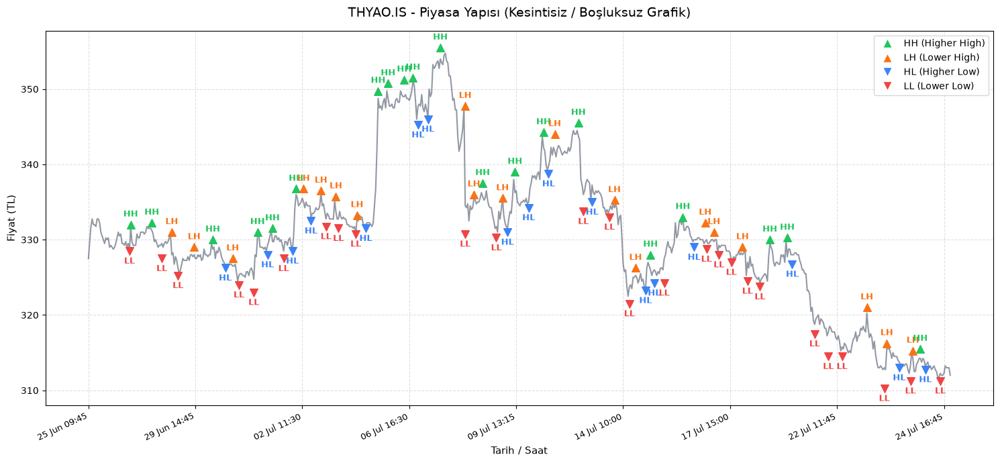

In [38]:
import matplotlib.pyplot as plt
import pandas as pd
from yahooquery import Ticker


def detect_market_structure(df, order=5):
    """Fiyat verisindeki HH, LH, HL ve LL noktalarını tespit eder."""
    highs = df["high"].values
    lows = df["low"].values

    results = []
    last_pivot_high = None
    last_pivot_low = None

    for i in range(order, len(df) - order):
        # --- PIVOT HIGH (Tepe) ---
        if all(
            highs[i] > highs[i - j] for j in range(1, order + 1)
        ) and all(highs[i] >= highs[i + j] for j in range(1, order + 1)):
            curr_high = highs[i]
            label = None

            if last_pivot_high is not None:
                label = "HH" if curr_high > last_pivot_high else "LH"

            last_pivot_high = curr_high

            if label:
                results.append(
                    {
                        "BarIdx": i,  # Kesintisiz x ekseni için bar indeksi
                        "Tarih": df.index[i],
                        "Tip": label,
                        "Fiyat": curr_high,
                    }
                )

        # --- PIVOT LOW (Dip) ---
        if all(lows[i] < lows[i - j] for j in range(1, order + 1)) and all(
            lows[i] <= lows[i + j] for j in range(1, order + 1)
        ):
            curr_low = lows[i]
            label = None

            if last_pivot_low is not None:
                label = "HL" if curr_low > last_pivot_low else "LL"

            last_pivot_low = curr_low

            if label:
                results.append(
                    {
                        "BarIdx": i,  # Kesintisiz x ekseni için bar indeksi
                        "Tarih": df.index[i],
                        "Tip": label,
                        "Fiyat": curr_low,
                    }
                )

    structure_df = pd.DataFrame(results)
    if not structure_df.empty:
        structure_df = structure_df.sort_values("BarIdx").reset_index(
            drop=True
        )

    return structure_df


def plot_market_structure(df, structure_df, symbol="THYAO.IS"):
    """Piyasa kapalı zaman boşluklarını kaldırarak grafiği çizer."""
    plt.figure(figsize=(15, 7))

    # Kesintisiz X ekseni dizisi (0'dan N-1'e kadar bar indeksi)
    x_range = range(len(df))

    # Fiyat Çizgisi (Tarih yerine sıralı index kullanılıyor)
    plt.plot(
        x_range,
        df["close"],
        label="Kapanış Fiyatı",
        color="#4A5568",
        alpha=0.6,
        linewidth=1.5,
    )

    # Renk Skalası
    color_map = {
        "HH": "#22C55E",  # Yeşil
        "LH": "#F97316",  # Turuncu
        "HL": "#3B82F6",  # Mavi
        "LL": "#EF4444",  # Kırmızı
    }

    price_range = df["high"].max() - df["low"].min()
    offset = price_range * 0.018

    # Noktaları ve Metinleri Grafiğe Ekle (BarIdx kullanılarak)
    for _, row in structure_df.iterrows():
        tip = row["Tip"]
        x_pos = row["BarIdx"]
        fiyat = row["Fiyat"]
        color = color_map.get(tip, "black")

        if tip in ["HH", "LH"]:
            plt.scatter(
                x_pos, fiyat, color=color, s=70, zorder=5, marker="^"
            )
            plt.annotate(
                tip,
                (x_pos, fiyat + offset),
                ha="center",
                va="bottom",
                fontsize=9,
                fontweight="bold",
                color=color,
            )
        else:
            plt.scatter(
                x_pos, fiyat, color=color, s=70, zorder=5, marker="v"
            )
            plt.annotate(
                tip,
                (x_pos, fiyat - offset),
                ha="center",
                va="top",
                fontsize=9,
                fontweight="bold",
                color=color,
            )

    # X ekseni etiketlerini düzgün tarih formatında yerleştirme (Boşluksuz)
    step = max(1, len(df) // 8)  # Ekranda sıkışıklık olmaması için adım aralığı
    tick_indices = list(x_range[::step])
    tick_labels = [df.index[i].strftime("%d %b %H:%M") for i in tick_indices]

    plt.xticks(tick_indices, tick_labels, rotation=25, ha="right", fontsize=9)

    plt.title(
        f"{symbol} - Piyasa Yapısı (Kesintisiz / Boşluksuz Grafik)",
        fontsize=14,
        pad=15,
    )
    plt.xlabel("Tarih / Saat", fontsize=11)
    plt.ylabel("Fiyat (TL)", fontsize=11)
    plt.grid(True, linestyle="--", alpha=0.4)

    # Lejant
    from matplotlib.lines import Line2D

    legend_elements = [
        Line2D(
            [0],
            [0],
            marker="^",
            color="w",
            label="HH (Higher High)",
            markerfacecolor="#22C55E",
            markersize=10,
        ),
        Line2D(
            [0],
            [0],
            marker="^",
            color="w",
            label="LH (Lower High)",
            markerfacecolor="#F97316",
            markersize=10,
        ),
        Line2D(
            [0],
            [0],
            marker="v",
            color="w",
            label="HL (Higher Low)",
            markerfacecolor="#3B82F6",
            markersize=10,
        ),
        Line2D(
            [0],
            [0],
            marker="v",
            color="w",
            label="LL (Lower Low)",
            markerfacecolor="#EF4444",
            markersize=10,
        ),
    ]
    plt.legend(handles=legend_elements, loc="best", frameon=True)

    plt.tight_layout()
    plt.show()


# ------------------ ÖRNEK KULLANIM ------------------
if __name__ == "__main__":
    symbol = "THYAO.IS"

    # 1. Veri Çek
    df_raw = Ticker(symbol).history(period="1mo", interval="15m")

    if isinstance(df_raw.index, pd.MultiIndex):
        df_raw = df_raw.reset_index(level="symbol", drop=True)

    df_raw.index = pd.to_datetime(df_raw.index)

    # 2. HH, HL, LH, LL Noktalarını Bul
    structure_points = detect_market_structure(df_raw, order=5)

    # 3. Grafiği Çiz (Piyasa Kapalı Saatler/Günler Çıkarılmış Olarak)
    plot_market_structure(df_raw, structure_points, symbol=symbol)


--- THYAO.IS TESPİT EDİLEN PİVOT YAPISI ---
                    Tarih Label Type  Price
2026-07-17 17:30:00+03:00    LH HIGH 329.00
2026-07-20 12:45:00+03:00    LL  LOW 323.75
2026-07-21 10:00:00+03:00    HH HIGH 330.25
2026-07-22 10:00:00+03:00    LL  LOW 314.50
2026-07-22 17:45:00+03:00    LH HIGH 321.00
2026-07-23 13:00:00+03:00    LL  LOW 310.25
2026-07-23 13:30:00+03:00    LH HIGH 316.25
2026-07-24 10:00:00+03:00    HL  LOW 311.25
2026-07-24 12:00:00+03:00    LH HIGH 315.50
2026-07-24 16:00:00+03:00    LL  LOW 311.25


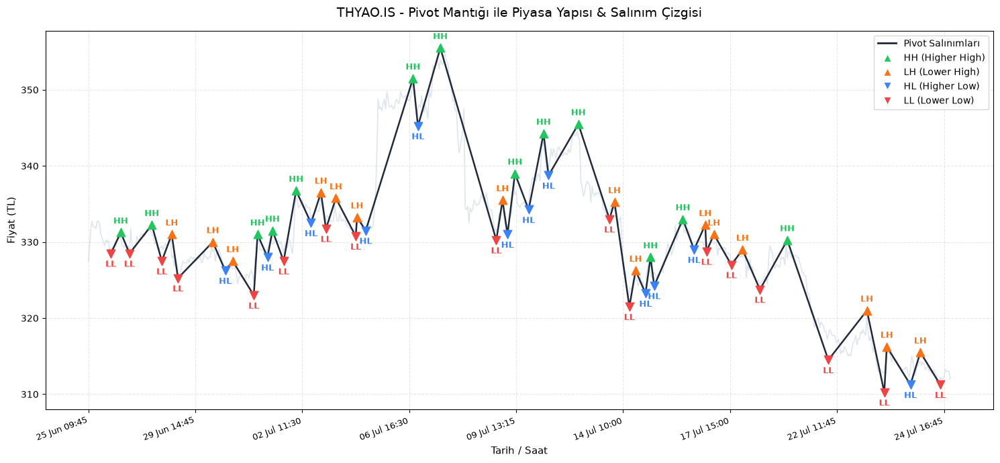

In [39]:
import matplotlib.pyplot as plt
import pandas as pd
from yahooquery import Ticker


def detect_pivot_structure(df, left_bars=5, right_bars=5):
    """Pivot High ve Pivot Low mantığıyla piyasa yapısını (HH, LH, HL, LL) tespit

    eder ve ZigZag salınımları oluşturur.
    """
    highs = df["high"].values
    lows = df["low"].values
    n = len(df)

    raw_pivots = []

    # 1. Pivot High ve Pivot Low Tespiti
    for i in range(left_bars, n - right_bars):
        is_ph = all(
            highs[i] > highs[i - l] for l in range(1, left_bars + 1)
        ) and all(highs[i] >= highs[i + r] for r in range(1, right_bars + 1))

        is_pl = all(
            lows[i] < lows[i - l] for l in range(1, left_bars + 1)
        ) and all(lows[i] <= lows[i + r] for r in range(1, right_bars + 1))

        if is_ph:
            raw_pivots.append(
                {
                    "BarIdx": i,
                    "Type": "HIGH",
                    "Price": highs[i],
                    "Tarih": df.index[i],
                }
            )
        elif is_pl:
            raw_pivots.append(
                {
                    "BarIdx": i,
                    "Type": "LOW",
                    "Price": lows[i],
                    "Tarih": df.index[i],
                }
            )

    if not raw_pivots:
        return pd.DataFrame()

    # 2. Ardışık Pivotları Filtreleme (ZigZag Mantığı: Tepe -> Dip -> Tepe -> Dip)
    filtered_pivots = [raw_pivots[0]]
    for p in raw_pivots[1:]:
        last = filtered_pivots[-1]
        if p["Type"] == last["Type"]:
            # Aynı tip gelirse daha uç noktada olanı al
            if p["Type"] == "HIGH" and p["Price"] > last["Price"]:
                filtered_pivots[-1] = p
            elif p["Type"] == "LOW" and p["Price"] < last["Price"]:
                filtered_pivots[-1] = p
        else:
            filtered_pivots.append(p)

    # 3. HH, LH, HL, LL Etiketleme
    last_high = None
    last_low = None

    for p in filtered_pivots:
        if p["Type"] == "HIGH":
            if last_high is not None:
                p["Label"] = "HH" if p["Price"] > last_high else "LH"
            else:
                p["Label"] = "HH"
            last_high = p["Price"]
        elif p["Type"] == "LOW":
            if last_low is not None:
                p["Label"] = "HL" if p["Price"] > last_low else "LL"
            else:
                p["Label"] = "LL"
            last_low = p["Price"]

    return pd.DataFrame(filtered_pivots)


def plot_pivot_market_structure(df, pivot_df, symbol="THYAO.IS"):
    """Pivot noktalarını, ZigZag çizgisini ve etiketleri boşluksuz grafikte

    gösterir.
    """
    plt.figure(figsize=(15, 7))

    x_range = range(len(df))

    # 1. Arka Plan Fiyat Çizgisi
    plt.plot(
        x_range,
        df["close"],
        color="#CBD5E1",
        alpha=0.6,
        linewidth=1.2,
        label="Kapanış Fiyatı",
    )

    # 2. Pivot Salınım Çizgisi (ZigZag)
    if not pivot_df.empty:
        plt.plot(
            pivot_df["BarIdx"],
            pivot_df["Price"],
            color="#1E293B",
            linewidth=1.8,
            linestyle="-",
            label="Pivot Salınım Çizgisi",
        )

    # Renk Paleti
    color_map = {
        "HH": "#22C55E",  # Yeşil
        "LH": "#F97316",  # Turuncu
        "HL": "#3B82F6",  # Mavi
        "LL": "#EF4444",  # Kırmızı
    }

    price_range = df["high"].max() - df["low"].min()
    offset = price_range * 0.02

    # 3. Pivot Noktaları ve Etiketler
    for _, row in pivot_df.iterrows():
        label = row["Label"]
        x_pos = row["BarIdx"]
        price = row["Price"]
        color = color_map.get(label, "black")

        if row["Type"] == "HIGH":
            plt.scatter(
                x_pos, price, color=color, s=80, zorder=5, marker="^"
            )
            plt.annotate(
                label,
                (x_pos, price + offset),
                ha="center",
                va="bottom",
                fontsize=9,
                fontweight="bold",
                color=color,
            )
        else:
            plt.scatter(
                x_pos, price, color=color, s=80, zorder=5, marker="v"
            )
            plt.annotate(
                label,
                (x_pos, price - offset),
                ha="center",
                va="top",
                fontsize=9,
                fontweight="bold",
                color=color,
            )

    # 4. X Ekseni Zaman Etiketleri (Boşluksuz)
    step = max(1, len(df) // 8)
    tick_indices = list(x_range[::step])
    tick_labels = [df.index[i].strftime("%d %b %H:%M") for i in tick_indices]

    plt.xticks(tick_indices, tick_labels, rotation=20, ha="right", fontsize=9)

    plt.title(
        f"{symbol} - Pivot Mantığı ile Piyasa Yapısı & Salınım Çizgisi",
        fontsize=14,
        pad=15,
    )
    plt.xlabel("Tarih / Saat", fontsize=11)
    plt.ylabel("Fiyat (TL)", fontsize=11)
    plt.grid(True, linestyle="--", alpha=0.3)

    # Özel Lejant
    from matplotlib.lines import Line2D

    legend_elements = [
        Line2D([0], [0], color="#1E293B", lw=2, label="Pivot Salınımları"),
        Line2D(
            [0],
            [0],
            marker="^",
            color="w",
            label="HH (Higher High)",
            markerfacecolor="#22C55E",
            markersize=9,
        ),
        Line2D(
            [0],
            [0],
            marker="^",
            color="w",
            label="LH (Lower High)",
            markerfacecolor="#F97316",
            markersize=9,
        ),
        Line2D(
            [0],
            [0],
            marker="v",
            color="w",
            label="HL (Higher Low)",
            markerfacecolor="#3B82F6",
            markersize=9,
        ),
        Line2D(
            [0],
            [0],
            marker="v",
            color="w",
            label="LL (Lower Low)",
            markerfacecolor="#EF4444",
            markersize=9,
        ),
    ]
    plt.legend(handles=legend_elements, loc="best", frameon=True)

    plt.tight_layout()
    plt.show()


# ------------------ ÖRNEK KULLANIM ------------------
if __name__ == "__main__":
    symbol = "THYAO.IS"

    # 1. Veri Çek
    df_raw = Ticker(symbol).history(period="1mo", interval="15m")

    if isinstance(df_raw.index, pd.MultiIndex):
        df_raw = df_raw.reset_index(level="symbol", drop=True)

    df_raw.index = pd.to_datetime(df_raw.index)

    # 2. Pivot Noktalarını Bul (Sol ve Sağ 5'er Bar Hassasiyeti)
    pivot_structure = detect_pivot_structure(
        df_raw, left_bars=5, right_bars=5
    )

    print(f"\n--- {symbol} TESPİT EDİLEN PİVOT YAPISI ---")
    print(pivot_structure[["Tarih", "Label", "Type", "Price"]].tail(10).to_string(index=False))

    # 3. Grafiği Çizdir
    plot_pivot_market_structure(df_raw, pivot_structure, symbol=symbol)


--- TESPİT EDİLEN PİYASA YAPISI NOKTALARI ---
 BarIdx  ConfirmBarIdx Tip  Fiyat  OncekiTepe  OncekiDip
    640            643  LL 310.25         NaN     317.25
    647            650  LH 315.50      319.50        NaN
    653            656  LH 314.25      315.50        NaN
    656            659  LH 313.75      314.25        NaN
    661            664  HL 311.25         NaN     310.25
    663            666  HH 315.25      313.75        NaN
    665            668  HL 312.00         NaN     311.25
    669            672  HH 315.50      315.25        NaN
    673            676  HL 312.75         NaN     312.00
    685            688  LL 311.25         NaN     312.75


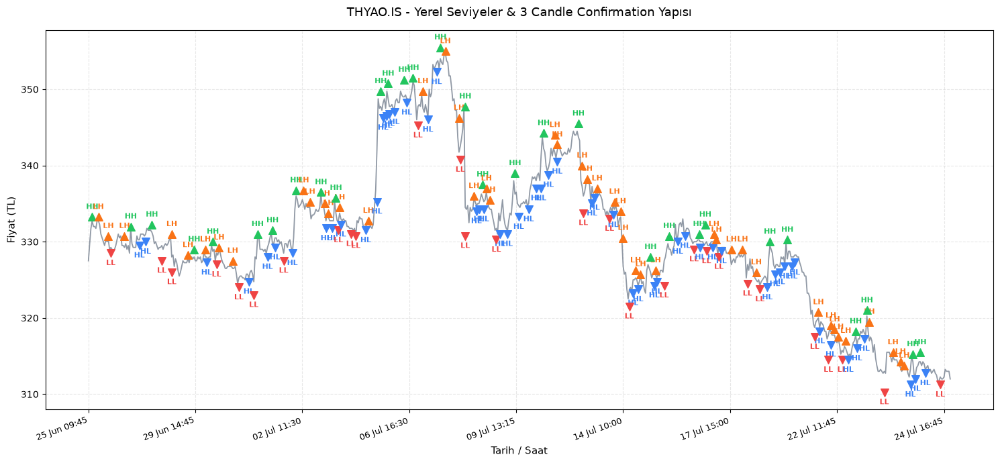

In [40]:
import matplotlib.pyplot as plt
import pandas as pd
from yahooquery import Ticker


def detect_structure_3c_confirm(df, confirm_candles=3):
    """Sol lookback (5 mum) bakmadan; yerel tepe/dipleri 3 mumluk onay ile tespit

    eder ve bir önceki tepe/dip seviyesiyle kıyaslayıp HH, LH, HL, LL
    etiketlerini belirler.
    """
    highs = df["high"].values
    lows = df["low"].values
    n = len(df)

    results = []
    last_pivot_high = None
    last_pivot_low = None

    for i in range(1, n - confirm_candles):

        # --- YEREL TEPE (LOCAL HIGH) TESPİTİ ---
        # 1. Anlık yerel tepe mi? (Sadece solundaki 1 mumdan yüksek olması yeterli)
        is_local_high = highs[i] > highs[i - 1]

        # 2. 3 Candle Confirmation: Kendisinden sonra gelen 3 mum bu tepeyi geçemedi mi?
        is_confirmed_high = is_local_high and all(
            highs[i] > highs[i + c] for c in range(1, confirm_candles + 1)
        )

        if is_confirmed_high:
            curr_high = highs[i]

            # Bir önceki tepe ile kıyaslama
            if last_pivot_high is not None:
                label = "HH" if curr_high > last_pivot_high else "LH"
            else:
                label = "HH"  # İlk tepe referansı

            results.append(
                {
                    "BarIdx": i,  # Tepenin oluştuğu bar
                    "ConfirmBarIdx": i
                    + confirm_candles,  # Onayın alındığı bar (i+3)
                    "Tarih": df.index[i],
                    "Tip": label,
                    "Fiyat": curr_high,
                    "OncekiTepe": last_pivot_high,
                }
            )

            # Referans tepeyi güncelle
            last_pivot_high = curr_high

        # --- YEREL DİP (LOCAL LOW) TESPİTİ ---
        # 1. Anlık yerel dip mi? (Sadece solundaki 1 mumdan düşük olması yeterli)
        is_local_low = lows[i] < lows[i - 1]

        # 2. 3 Candle Confirmation: Kendisinden sonra gelen 3 mum bu dibi kıramadı mı?
        is_confirmed_low = is_local_low and all(
            lows[i] < lows[i + c] for c in range(1, confirm_candles + 1)
        )

        if is_confirmed_low:
            curr_low = lows[i]

            # Bir önceki dip ile kıyaslama (Örn: Önceki dip'ten düşükse LL)
            if last_pivot_low is not None:
                label = "LL" if curr_low < last_pivot_low else "HL"
            else:
                label = "LL"  # İlk dip referansı

            results.append(
                {
                    "BarIdx": i,  # Dibin oluştuğu bar
                    "ConfirmBarIdx": i
                    + confirm_candles,  # Onayın alındığı bar (i+3)
                    "Tarih": df.index[i],
                    "Tip": label,
                    "Fiyat": curr_low,
                    "OncekiDip": last_pivot_low,
                }
            )

            # Referans dibi güncelle
            last_pivot_low = curr_low

    structure_df = pd.DataFrame(results)
    if not structure_df.empty:
        structure_df = structure_df.sort_values("BarIdx").reset_index(
            drop=True
        )

    return structure_df


def plot_market_structure(df, structure_df, symbol="THYAO.IS"):
    """Piyasa yapısını zaman boşlukları olmadan grafiğe aktarır."""
    plt.figure(figsize=(15, 7))

    x_range = range(len(df))

    # Fiyat Çizgisi
    plt.plot(
        x_range,
        df["close"],
        label="Kapanış Fiyatı",
        color="#475569",
        alpha=0.6,
        linewidth=1.3,
    )

    color_map = {
        "HH": "#22C55E",  # Yeşil
        "LH": "#F97316",  # Turuncu
        "HL": "#3B82F6",  # Mavi
        "LL": "#EF4444",  # Kırmızı
    }

    price_range = df["high"].max() - df["low"].min()
    offset = price_range * 0.018

    # Noktaları ve Etiketleri Bas
    for _, row in structure_df.iterrows():
        tip = row["Tip"]
        x_pos = row["BarIdx"]
        fiyat = row["Fiyat"]
        color = color_map.get(tip, "black")

        if tip in ["HH", "LH"]:
            plt.scatter(
                x_pos, fiyat, color=color, s=70, zorder=5, marker="^"
            )
            plt.annotate(
                tip,
                (x_pos, fiyat + offset),
                ha="center",
                va="bottom",
                fontsize=8,
                fontweight="bold",
                color=color,
            )
        else:
            plt.scatter(
                x_pos, fiyat, color=color, s=70, zorder=5, marker="v"
            )
            plt.annotate(
                tip,
                (x_pos, fiyat - offset),
                ha="center",
                va="top",
                fontsize=8,
                fontweight="bold",
                color=color,
            )

    # X Ekseni Ayarları (Boşluksuz)
    step = max(1, len(df) // 8)
    tick_indices = list(x_range[::step])
    tick_labels = [df.index[i].strftime("%d %b %H:%M") for i in tick_indices]

    plt.xticks(tick_indices, tick_labels, rotation=20, ha="right", fontsize=9)

    plt.title(
        f"{symbol} - Yerel Seviyeler & 3 Candle Confirmation Yapısı",
        fontsize=13,
        pad=15,
    )
    plt.xlabel("Tarih / Saat", fontsize=11)
    plt.ylabel("Fiyat (TL)", fontsize=11)
    plt.grid(True, linestyle="--", alpha=0.3)
    plt.tight_layout()
    plt.show()


# ------------------ ÖRNEK KULLANIM ------------------
if __name__ == "__main__":
    symbol = "THYAO.IS"

    # Veri Çek
    df_raw = Ticker(symbol).history(period="1mo", interval="15m")

    if isinstance(df_raw.index, pd.MultiIndex):
        df_raw = df_raw.reset_index(level="symbol", drop=True)

    df_raw.index = pd.to_datetime(df_raw.index)

    # 3 Mum Onaylı Yerel Piyasa Yapısı
    structure_points = detect_structure_3c_confirm(df_raw, confirm_candles=3)

    print("\n--- TESPİT EDİLEN PİYASA YAPISI NOKTALARI ---")
    cols = ["BarIdx", "ConfirmBarIdx", "Tip", "Fiyat", "OncekiTepe", "OncekiDip"]
    print(structure_points[cols].tail(10).to_string(index=False))

    plot_market_structure(df_raw, structure_points, symbol=symbol)

In [41]:
import pandas as pd
import plotly.graph_objects as go
from yahooquery import Ticker


def detect_structure_3c_confirm(df, confirm_candles=3):
    """3 Mum Onaylı ve Önceki Pivot Kıyaslamalı Piyasa Yapısı Tespiti."""
    highs = df["high"].values
    lows = df["low"].values
    n = len(df)

    results = []
    last_pivot_high = None
    last_pivot_low = None

    for i in range(1, n - confirm_candles):
        # --- TEPE TESPİTİ ---
        is_local_high = highs[i] > highs[i - 1]
        is_confirmed_high = is_local_high and all(
            highs[i] > highs[i + c] for c in range(1, confirm_candles + 1)
        )

        if is_confirmed_high:
            curr_high = highs[i]
            if last_pivot_high is not None:
                label = "HH" if curr_high > last_pivot_high else "LH"
            else:
                label = "HH"

            results.append(
                {
                    "BarIdx": i,
                    "ConfirmBarIdx": i + confirm_candles,
                    "Tarih": df.index[i],
                    "Tip": label,
                    "Fiyat": curr_high,
                }
            )
            last_pivot_high = curr_high

        # --- DİP TESPİTİ ---
        is_local_low = lows[i] < lows[i - 1]
        is_confirmed_low = is_local_low and all(
            lows[i] < lows[i + c] for c in range(1, confirm_candles + 1)
        )

        if is_confirmed_low:
            curr_low = lows[i]
            if last_pivot_low is not None:
                label = "LL" if curr_low < last_pivot_low else "HL"
            else:
                label = "LL"

            results.append(
                {
                    "BarIdx": i,
                    "ConfirmBarIdx": i + confirm_candles,
                    "Tarih": df.index[i],
                    "Tip": label,
                    "Fiyat": curr_low,
                }
            )
            last_pivot_low = curr_low

    structure_df = pd.DataFrame(results)
    if not structure_df.empty:
        structure_df = structure_df.sort_values("BarIdx").reset_index(
            drop=True
        )

    return structure_df


def plot_market_structure_plotly(df, structure_df, symbol="THYAO.IS"):
    """Plotly ile Etkileşimli Mum Grafiği (Candlestick) ve Piyasa Yapısı."""
    df_plot = df.copy()

    # X ekseninde kapalı zaman boşluklarını önlemek için string tarih formatı
    df_plot["DateStr"] = df_plot.index.strftime("%d %b %H:%M")

    fig = go.Figure()

    # 1. Mum Grafiği (Candlestick)
    fig.add_trace(
        go.Candlestick(
            x=df_plot["DateStr"],
            open=df_plot["open"],
            high=df_plot["high"],
            low=df_plot["low"],
            close=df_plot["close"],
            name="Mumlar",
            increasing_line_color="#22C55E",  # Yeşil Yükseliş
            decreasing_line_color="#EF4444",  # Kırmızı Düşüş
            increasing_fillcolor="#22C55E",
            decreasing_fillcolor="#EF4444",
        )
    )

    color_map = {
        "HH": "#22C55E",  # Yeşil
        "LH": "#F97316",  # Turuncu
        "HL": "#3B82F6",  # Mavi
        "LL": "#EF4444",  # Kırmızı
    }

    # 2. HH, LH, HL, LL Etiketlerini ve İşaretçilerini Ekle
    for label_type in ["HH", "LH", "HL", "LL"]:
        sub = structure_df[structure_df["Tip"] == label_type]
        if sub.empty:
            continue

        x_dates = [df_plot["DateStr"].iloc[idx] for idx in sub["BarIdx"]]
        y_prices = sub["Fiyat"]

        is_high = label_type in ["HH", "LH"]
        marker_symbol = "triangle-up" if is_high else "triangle-down"
        text_position = "top center" if is_high else "bottom center"

        fig.add_trace(
            go.Scatter(
                x=x_dates,
                y=y_prices,
                mode="markers+text",
                name=label_type,
                marker=dict(
                    symbol=marker_symbol,
                    size=12,
                    color=color_map[label_type],
                    line=dict(width=1, color="white"),
                ),
                text=label_type,
                textposition=text_position,
                textfont=dict(
                    size=12, color=color_map[label_type], family="Arial Black"
                ),
                hoverinfo="text+y",
                hovertext=[
                    f"<b>{label_type}</b><br>Tarih: {row['Tarih'].strftime('%d %b %Y %H:%M')}<br>Fiyat: {row['Fiyat']:.2f} TL"
                    for _, row in sub.iterrows()
                ],
            )
        )

    # 3. Grafik Düzeni ve X Ekseni Ayarları (Kategorik Eksen Boşlukları Eler)
    fig.update_xaxes(
        type="category",
        nticks=12,
        tickangle=-30,
        gridcolor="#1E293B",
        rangeslider_visible=False,  # Alt kaydırma çubuğunu gizle
    )

    fig.update_yaxes(gridcolor="#1E293B", zeroline=False)

    fig.update_layout(
        title=f"<b>{symbol}</b> - Mum Grafiğiü Üzerinde Piyasa Yapısı (3 Candle Conf)",
        title_font=dict(size=16, color="white"),
        template="plotly_dark",
        paper_bgcolor="#0F172A",
        plot_bgcolor="#0F172A",
        height=750,
        hovermode="x unified",
        legend=dict(
            orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1
        ),
        margin=dict(l=50, r=50, t=80, b=50),
    )

    fig.show()


# ------------------ ÖRNEK KULLANIM ------------------
if __name__ == "__main__":
    symbol = "THYAO.IS"

    # Veri Çek
    df_raw = Ticker(symbol).history(period="1mo", interval="15m")

    if isinstance(df_raw.index, pd.MultiIndex):
        df_raw = df_raw.reset_index(level="symbol", drop=True)

    df_raw.index = pd.to_datetime(df_raw.index)

    # Piyasa Yapısını Hesapla
    structure_points = detect_structure_3c_confirm(df_raw, confirm_candles=3)

    # Plotly Mum Grafiğini Çizdir
    plot_market_structure_plotly(df_raw, structure_points, symbol=symbol)

In [43]:
import pandas as pd
import plotly.graph_objects as go
from yahooquery import Ticker

def detect_structure_3c_confirm(df, confirm_candles=3):
    """3 Mum Onaylı ve Önceki Pivot Kıyaslamalı Piyasa Yapısı Tespiti."""
    highs = df["high"].values
    lows = df["low"].values
    n = len(df)

    results = []
    last_pivot_high = None
    last_pivot_low = None

    for i in range(1, n - confirm_candles):
        # --- TEPE TESPİTİ ---
        is_local_high = highs[i] > highs[i - 1]
        is_confirmed_high = is_local_high and all(
            highs[i] > highs[i + c] for c in range(1, confirm_candles + 1)
        )

        if is_confirmed_high:
            curr_high = highs[i]
            if last_pivot_high is not None:
                label = "HH" if curr_high > last_pivot_high else "LH"
            else:
                label = "HH"

            results.append(
                {
                    "BarIdx": i,
                    "ConfirmBarIdx": i + confirm_candles,
                    "Tarih": df.index[i],
                    "Tip": label,
                    "Fiyat": curr_high,
                }
            )
            last_pivot_high = curr_high

        # --- DİP TESPİTİ ---
        is_local_low = lows[i] < lows[i - 1]
        is_confirmed_low = is_local_low and all(
            lows[i] < lows[i + c] for c in range(1, confirm_candles + 1)
        )

        if is_confirmed_low:
            curr_low = lows[i]
            if last_pivot_low is not None:
                label = "LL" if curr_low < last_pivot_low else "HL"
            else:
                label = "LL"

            results.append(
                {
                    "BarIdx": i,
                    "ConfirmBarIdx": i + confirm_candles,
                    "Tarih": df.index[i],
                    "Tip": label,
                    "Fiyat": curr_low,
                }
            )
            last_pivot_low = curr_low

    structure_df = pd.DataFrame(results)
    if not structure_df.empty:
        structure_df = structure_df.sort_values("BarIdx").reset_index(
            drop=True
        )

    return structure_df


def get_macro_trendline(structure_df, min_pct_change=2.0):
    """
    Tüm yapı noktaları arasından yalnızca majör trend değişimlerini (ZigZag) bulur.
    min_pct_change: Yönün değiştiğini onaylamak için gereken minimum fiyat değişim yüzdesi.
    """
    if structure_df.empty:
        return structure_df
        
    df_sorted = structure_df.sort_values('BarIdx').reset_index(drop=True)
    pivots = []
    
    last_pivot = df_sorted.iloc[0]
    last_type = 'high' if last_pivot['Tip'] in ['HH', 'LH'] else 'low'
    
    pivots.append(last_pivot)
    
    for i in range(1, len(df_sorted)):
        row = df_sorted.iloc[i]
        is_high = row['Tip'] in ['HH', 'LH']
        current_type = 'high' if is_high else 'low'
        
        # Fiyatın yüzde kaç değiştiğini hesapla
        price_change_pct = abs(row['Fiyat'] - last_pivot['Fiyat']) / last_pivot['Fiyat'] * 100
        
        if last_type == 'high':
            if current_type == 'high':
                # Daha yüksek bir tepe bulursak son tepeyi güncelle
                if row['Fiyat'] > last_pivot['Fiyat']:
                    last_pivot = row
                    pivots[-1] = row
            else: # current_type == 'low'
                # Düşüş trendine geçişi onaylamak için minimum yüzde değişimi ara
                if price_change_pct >= min_pct_change:
                    last_pivot = row
                    last_type = 'low'
                    pivots.append(row)
                    
        elif last_type == 'low':
            if current_type == 'low':
                # Daha düşük bir dip bulursak son dibi güncelle
                if row['Fiyat'] < last_pivot['Fiyat']:
                    last_pivot = row
                    pivots[-1] = row
            else: # current_type == 'high'
                # Yükseliş trendine geçişi onaylamak için minimum yüzde değişimi ara
                if price_change_pct >= min_pct_change:
                    last_pivot = row
                    last_type = 'high'
                    pivots.append(row)
                    
    return pd.DataFrame(pivots)


def plot_market_structure_plotly(df, structure_df, symbol="THYAO.IS", zigzag_pct=2.5):
    """Plotly ile Etkileşimli Mum Grafiği (Candlestick), Piyasa Yapısı ve Ana Trend (ZigZag)."""
    df_plot = df.copy()

    # X ekseninde kapalı zaman boşluklarını önlemek için string tarih formatı
    df_plot["DateStr"] = df_plot.index.strftime("%d %b %H:%M")

    fig = go.Figure()

    # 1. Mum Grafiği (Candlestick)
    fig.add_trace(
        go.Candlestick(
            x=df_plot["DateStr"],
            open=df_plot["open"],
            high=df_plot["high"],
            low=df_plot["low"],
            close=df_plot["close"],
            name="Mumlar",
            increasing_line_color="#22C55E",  # Yeşil Yükseliş
            decreasing_line_color="#EF4444",  # Kırmızı Düşüş
            increasing_fillcolor="#22C55E",
            decreasing_fillcolor="#EF4444",
        )
    )

    color_map = {
        "HH": "#22C55E",  # Yeşil
        "LH": "#F97316",  # Turuncu
        "HL": "#3B82F6",  # Mavi
        "LL": "#EF4444",  # Kırmızı
    }

    # 2. HH, LH, HL, LL Etiketlerini ve İşaretçilerini Ekle
    for label_type in ["HH", "LH", "HL", "LL"]:
        sub = structure_df[structure_df["Tip"] == label_type]
        if sub.empty:
            continue

        x_dates = [df_plot["DateStr"].iloc[idx] for idx in sub["BarIdx"]]
        y_prices = sub["Fiyat"]

        is_high = label_type in ["HH", "LH"]
        marker_symbol = "triangle-up" if is_high else "triangle-down"
        text_position = "top center" if is_high else "bottom center"

        fig.add_trace(
            go.Scatter(
                x=x_dates,
                y=y_prices,
                mode="markers+text",
                name=label_type,
                marker=dict(
                    symbol=marker_symbol,
                    size=12,
                    color=color_map[label_type],
                    line=dict(width=1, color="white"),
                ),
                text=label_type,
                textposition=text_position,
                textfont=dict(
                    size=12, color=color_map[label_type], family="Arial Black"
                ),
                hoverinfo="text+y",
                hovertext=[
                    f"<b>{label_type}</b><br>Tarih: {row['Tarih'].strftime('%d %b %Y %H:%M')}<br>Fiyat: {row['Fiyat']:.2f} TL"
                    for _, row in sub.iterrows()
                ],
            )
        )

    # 3. Ana Trend Çizgisi (Kırmızı ZigZag)
    macro_df = get_macro_trendline(structure_df, min_pct_change=zigzag_pct)
    if not macro_df.empty:
        x_macro = [df_plot["DateStr"].iloc[idx] for idx in macro_df["BarIdx"]]
        y_macro = macro_df["Fiyat"]
        
        fig.add_trace(
            go.Scatter(
                x=x_macro,
                y=y_macro,
                mode="lines",
                name="Ana Trend",
                line=dict(color="#FF0000", width=4), # Görseldeki gibi kalın kırmızı çizgi
                hoverinfo="skip" # Etkileşim karmaşasını önlemek için hover kapalı
            )
        )

    # 4. Grafik Düzeni ve X Ekseni Ayarları
    fig.update_xaxes(
        type="category",
        nticks=12,
        tickangle=-30,
        gridcolor="#1E293B",
        rangeslider_visible=False,
    )

    fig.update_yaxes(gridcolor="#1E293B", zeroline=False)

    fig.update_layout(
        title=f"<b>{symbol}</b> - Mum Grafiği Üzerinde Piyasa Yapısı ve Ana Trend",
        title_font=dict(size=16, color="white"),
        template="plotly_dark",
        paper_bgcolor="#0F172A",
        plot_bgcolor="#0F172A",
        height=750,
        hovermode="x unified",
        legend=dict(
            orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1
        ),
        margin=dict(l=50, r=50, t=80, b=50),
    )

    fig.show()


# ------------------ ÖRNEK KULLANIM ------------------
if __name__ == "__main__":
    symbol = "THYAO.IS"

    # Veri Çek
    df_raw = Ticker(symbol).history(period="60d", interval="15m")

    if isinstance(df_raw.index, pd.MultiIndex):
        df_raw = df_raw.reset_index(level="symbol", drop=True)

    df_raw.index = pd.to_datetime(df_raw.index)

    # Piyasa Yapısını Hesapla
    structure_points = detect_structure_3c_confirm(df_raw, confirm_candles=3)

    # Plotly Mum Grafiğini ve Kırmızı Ana Trendi Çizdir
    # zigzag_pct değerini değiştirerek çizginin hassasiyetini ayarlayabilirsiniz (Örn: 2.0, 2.5, 3.0)
    plot_market_structure_plotly(df_raw, structure_points, symbol=symbol, zigzag_pct=2.5)

In [46]:
import pandas as pd
import plotly.graph_objects as go
from yahooquery import Ticker

def detect_structure(df, confirm_candles=10):
    """Genişletilmiş Mum Onaylı Piyasa Yapısı Tespiti (Makro)."""
    # Eğer DataFrame boşsa direkt boş yapı dön (Hata önleyici)
    if df.empty:
        return pd.DataFrame(columns=["BarIdx", "ConfirmBarIdx", "Tarih", "Tip", "Fiyat"])
        
    highs = df["high"].values
    lows = df["low"].values
    n = len(df)

    results = []
    last_pivot_high = None
    last_pivot_low = None

    for i in range(1, n - confirm_candles):
        # --- TEPE TESPİTİ ---
        is_local_high = highs[i] > highs[i - 1]
        is_confirmed_high = is_local_high and all(
            highs[i] > highs[i + c] for c in range(1, confirm_candles + 1)
        )

        if is_confirmed_high:
            curr_high = highs[i]
            if last_pivot_high is not None:
                label = "HH" if curr_high > last_pivot_high else "LH"
            else:
                label = "HH"

            results.append(
                {
                    "BarIdx": i,
                    "ConfirmBarIdx": i + confirm_candles,
                    "Tarih": df.index[i],
                    "Tip": label,
                    "Fiyat": curr_high,
                }
            )
            last_pivot_high = curr_high

        # --- DİP TESPİTİ ---
        is_local_low = lows[i] < lows[i - 1]
        is_confirmed_low = is_local_low and all(
            lows[i] < lows[i + c] for c in range(1, confirm_candles + 1)
        )

        if is_confirmed_low:
            curr_low = lows[i]
            if last_pivot_low is not None:
                label = "LL" if curr_low < last_pivot_low else "HL"
            else:
                label = "LL"

            results.append(
                {
                    "BarIdx": i,
                    "ConfirmBarIdx": i + confirm_candles,
                    "Tarih": df.index[i],
                    "Tip": label,
                    "Fiyat": curr_low,
                }
            )
            last_pivot_low = curr_low

    # HATA ÇÖZÜMÜ: Liste boş olsa bile sütun isimlerini zorunlu kılıyoruz
    structure_df = pd.DataFrame(results, columns=["BarIdx", "ConfirmBarIdx", "Tarih", "Tip", "Fiyat"])
    
    if not structure_df.empty:
        structure_df = structure_df.sort_values("BarIdx").reset_index(drop=True)

    return structure_df


def get_macro_trendline(structure_df, min_pct_change=5.0):
    """
    Yalnızca majör trend değişimlerini (Makro ZigZag) bulur.
    min_pct_change: Yönün değiştiğini onaylamak için gereken minimum fiyat değişim yüzdesi.
    """
    if structure_df.empty:
        return structure_df
        
    df_sorted = structure_df.sort_values('BarIdx').reset_index(drop=True)
    pivots = []
    
    last_pivot = df_sorted.iloc[0]
    last_type = 'high' if last_pivot['Tip'] in ['HH', 'LH'] else 'low'
    
    pivots.append(last_pivot)
    
    for i in range(1, len(df_sorted)):
        row = df_sorted.iloc[i]
        is_high = row['Tip'] in ['HH', 'LH']
        current_type = 'high' if is_high else 'low'
        
        price_change_pct = abs(row['Fiyat'] - last_pivot['Fiyat']) / last_pivot['Fiyat'] * 100
        
        if last_type == 'high':
            if current_type == 'high':
                if row['Fiyat'] > last_pivot['Fiyat']:
                    last_pivot = row
                    pivots[-1] = row
            else: 
                if price_change_pct >= min_pct_change:
                    last_pivot = row
                    last_type = 'low'
                    pivots.append(row)
                    
        elif last_type == 'low':
            if current_type == 'low':
                if row['Fiyat'] < last_pivot['Fiyat']:
                    last_pivot = row
                    pivots[-1] = row
            else: 
                if price_change_pct >= min_pct_change:
                    last_pivot = row
                    last_type = 'high'
                    pivots.append(row)
                    
    return pd.DataFrame(pivots)


def plot_market_structure_plotly(df, structure_df, symbol="THYAO.IS", zigzag_pct=5.0):
    """Plotly ile Etkileşimli Mum Grafiği, Piyasa Yapısı ve Ana Trend."""
    df_plot = df.copy()
    df_plot["DateStr"] = df_plot.index.strftime("%d %b %H:%M")

    fig = go.Figure()

    # 1. Mum Grafiği
    fig.add_trace(
        go.Candlestick(
            x=df_plot["DateStr"],
            open=df_plot["open"],
            high=df_plot["high"],
            low=df_plot["low"],
            close=df_plot["close"],
            name="Mumlar",
            increasing_line_color="#22C55E",
            decreasing_line_color="#EF4444",
            increasing_fillcolor="#22C55E",
            decreasing_fillcolor="#EF4444",
        )
    )

    color_map = {
        "HH": "#22C55E", 
        "LH": "#F97316", 
        "HL": "#3B82F6", 
        "LL": "#EF4444", 
    }

    # 2. Etiketleri Ekle (Sadece yapıda bulunanlar)
    for label_type in ["HH", "LH", "HL", "LL"]:
        sub = structure_df[structure_df["Tip"] == label_type]
        if sub.empty:
            continue

        x_dates = [df_plot["DateStr"].iloc[idx] for idx in sub["BarIdx"]]
        y_prices = sub["Fiyat"]

        is_high = label_type in ["HH", "LH"]
        marker_symbol = "triangle-up" if is_high else "triangle-down"
        text_position = "top center" if is_high else "bottom center"

        fig.add_trace(
            go.Scatter(
                x=x_dates,
                y=y_prices,
                mode="markers+text",
                name=label_type,
                marker=dict(
                    symbol=marker_symbol,
                    size=12,
                    color=color_map[label_type],
                    line=dict(width=1, color="white"),
                ),
                text=label_type,
                textposition=text_position,
                textfont=dict(
                    size=12, color=color_map[label_type], family="Arial Black"
                ),
                hoverinfo="text+y",
            )
        )

    # 3. Ana Trend Çizgisi (Makro Kırmızı Çizgi)
    macro_df = get_macro_trendline(structure_df, min_pct_change=zigzag_pct)
    if not macro_df.empty:
        x_macro = [df_plot["DateStr"].iloc[idx] for idx in macro_df["BarIdx"]]
        y_macro = macro_df["Fiyat"]
        
        fig.add_trace(
            go.Scatter(
                x=x_macro,
                y=y_macro,
                mode="lines",
                name="Ana Trend",
                line=dict(color="#FF0000", width=4), 
                hoverinfo="skip" 
            )
        )

    # 4. Grafik Düzeni
    fig.update_xaxes(
        type="category",
        nticks=12,
        tickangle=-30,
        gridcolor="#1E293B",
        rangeslider_visible=False,
    )

    fig.update_yaxes(gridcolor="#1E293B", zeroline=False)

    fig.update_layout(
        title=f"<b>{symbol}</b> - Makro Piyasa Yapısı ve Ana Trend",
        title_font=dict(size=16, color="white"),
        template="plotly_dark",
        paper_bgcolor="#0F172A",
        plot_bgcolor="#0F172A",
        height=750,
        hovermode="x unified",
        legend=dict(
            orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1
        ),
        margin=dict(l=50, r=50, t=80, b=50),
    )

    fig.show()

# ------------------ ÖRNEK KULLANIM ------------------
if __name__ == "__main__":
    symbol = "THYAO.IS"

    # Yahoo Finance 15 dakikalık veriyi max 60 gün (60d) geriye dönük verir.
    # Eğer daha uzun vade istersen interval="1d" (Günlük) ve period="1y" (1 Yıl) yapmalısın.
    df_raw = Ticker(symbol).history(period="60d", interval="5m") 

    if isinstance(df_raw.index, pd.MultiIndex):
        df_raw = df_raw.reset_index(level="symbol", drop=True)

    if df_raw.empty:
        print(f"Hata: {symbol} için Yahoo Finance'ten veri çekilemedi. Bağlantınızı veya sembolü kontrol edin.")
    else:
        df_raw.index = pd.to_datetime(df_raw.index)

        # 1. AYAR: Mum onay sayısını 10 yaptık (Küçük gürültüleri filtreler)
        structure_points = detect_structure(df_raw, confirm_candles=10)

        if structure_points.empty:
            print("Uyarı: Verilen ayarlarla grafikte hiçbir Majör Tepe/Dip bulunamadı.")
            
        # 2. AYAR: Zigzag yüzdesini %5.0 yaptık (Sadece makro trend dönüşlerini birleştirir)
        plot_market_structure_plotly(df_raw, structure_points, symbol=symbol, zigzag_pct=5.0)

In [47]:
import pandas as pd
import plotly.graph_objects as go
from yahooquery import Ticker

def detect_structure_3c_confirm(df, confirm_candles=3):
    """3 Mum Onaylı ve Önceki Pivot Kıyaslamalı Piyasa Yapısı Tespiti."""
    if df.empty:
        return pd.DataFrame(columns=["BarIdx", "ConfirmBarIdx", "Tarih", "Tip", "Fiyat"])
        
    highs = df["high"].values
    lows = df["low"].values
    n = len(df)

    results = []
    last_pivot_high = None
    last_pivot_low = None

    for i in range(1, n - confirm_candles):
        # --- TEPE TESPİTİ ---
        is_local_high = highs[i] > highs[i - 1]
        is_confirmed_high = is_local_high and all(
            highs[i] > highs[i + c] for c in range(1, confirm_candles + 1)
        )

        if is_confirmed_high:
            curr_high = highs[i]
            if last_pivot_high is not None:
                label = "HH" if curr_high > last_pivot_high else "LH"
            else:
                label = "HH"

            results.append({
                "BarIdx": i,
                "ConfirmBarIdx": i + confirm_candles,
                "Tarih": df.index[i],
                "Tip": label,
                "Fiyat": curr_high,
            })
            last_pivot_high = curr_high

        # --- DİP TESPİTİ ---
        is_local_low = lows[i] < lows[i - 1]
        is_confirmed_low = is_local_low and all(
            lows[i] < lows[i + c] for c in range(1, confirm_candles + 1)
        )

        if is_confirmed_low:
            curr_low = lows[i]
            if last_pivot_low is not None:
                label = "LL" if curr_low < last_pivot_low else "HL"
            else:
                label = "LL"

            results.append({
                "BarIdx": i,
                "ConfirmBarIdx": i + confirm_candles,
                "Tarih": df.index[i],
                "Tip": label,
                "Fiyat": curr_low,
            })
            last_pivot_low = curr_low

    structure_df = pd.DataFrame(results, columns=["BarIdx", "ConfirmBarIdx", "Tarih", "Tip", "Fiyat"])
    if not structure_df.empty:
        structure_df = structure_df.sort_values("BarIdx").reset_index(drop=True)

    return structure_df


def get_support_resistance_lines(df, structure_df):
    """
    LL -> HL diziliminden Destek, HH -> LH diziliminden Direnç çıkarır.
    Fiyatın bu seviyeyi kırdığı (geçtiği) mumu bulup çizginin sonlanacağı indeksi belirler.
    """
    supports = []
    resistances = []
    
    if structure_df.empty:
        return supports, resistances
        
    df_closes = df["close"].values
    
    for i in range(1, len(structure_df)):
        prev = structure_df.iloc[i-1]
        curr = structure_df.iloc[i]
        
        # 1. Makro Destek Tespiti: LL'den sonra HL geldiyse o LL Destek olur
        if prev["Tip"] == "LL" and curr["Tip"] == "HL":
            start_idx = prev["BarIdx"]
            price = prev["Fiyat"]
            
            # Desteğin Kırıldığı (Close'un desteğin altına indiği) ilk mumu bul
            end_idx = len(df) - 1
            for j in range(start_idx + 1, len(df)):
                if df_closes[j] < price:
                    end_idx = j
                    break
                    
            supports.append({"start_idx": start_idx, "end_idx": end_idx, "price": price})
            
        # 2. Makro Direnç Tespiti: HH'den sonra LH geldiyse o HH Direnç olur
        elif prev["Tip"] == "HH" and curr["Tip"] == "LH":
            start_idx = prev["BarIdx"]
            price = prev["Fiyat"]
            
            # Direncin Kırıldığı (Close'un direncin üstüne çıktığı) ilk mumu bul
            end_idx = len(df) - 1
            for j in range(start_idx + 1, len(df)):
                if df_closes[j] > price:
                    end_idx = j
                    break
                    
            resistances.append({"start_idx": start_idx, "end_idx": end_idx, "price": price})
            
    return supports, resistances


def plot_market_structure_plotly(df, structure_df, symbol="THYAO.IS"):
    """Plotly ile Mum Grafiği, Yapı Etiketleri ve Dinamik Destek/Direnç Çizgileri."""
    df_plot = df.copy()
    df_plot["DateStr"] = df_plot.index.strftime("%d %b %H:%M")

    fig = go.Figure()

    # 1. Mum Grafiği (Candlestick)
    fig.add_trace(
        go.Candlestick(
            x=df_plot["DateStr"],
            open=df_plot["open"],
            high=df_plot["high"],
            low=df_plot["low"],
            close=df_plot["close"],
            name="Mumlar",
            increasing_line_color="#22C55E",
            decreasing_line_color="#EF4444",
            increasing_fillcolor="#22C55E",
            decreasing_fillcolor="#EF4444",
        )
    )

    # 2. Destek ve Direnç Çizgilerini Hesapla ve Ekle (Kesikli Çizgiler)
    supports, resistances = get_support_resistance_lines(df, structure_df)
    
    # Destek Çizgileri (Yeşil, Kesikli)
    show_supp_legend = True
    for s in supports:
        fig.add_trace(
            go.Scatter(
                x=[df_plot["DateStr"].iloc[s["start_idx"]], df_plot["DateStr"].iloc[s["end_idx"]]],
                y=[s["price"], s["price"]],
                mode="lines",
                line=dict(color="#22C55E", width=2, dash="dash"),
                name="Makro Destek (LL->HL)",
                showlegend=show_supp_legend,
                hoverinfo="skip"
            )
        )
        show_supp_legend = False # Sadece ilkine legend koy ki liste kalabalık olmasın

    # Direnç Çizgileri (Kırmızı, Kesikli)
    show_res_legend = True
    for r in resistances:
        fig.add_trace(
            go.Scatter(
                x=[df_plot["DateStr"].iloc[r["start_idx"]], df_plot["DateStr"].iloc[r["end_idx"]]],
                y=[r["price"], r["price"]],
                mode="lines",
                line=dict(color="#EF4444", width=2, dash="dash"),
                name="Makro Direnç (HH->LH)",
                showlegend=show_res_legend,
                hoverinfo="skip"
            )
        )
        show_res_legend = False

    # 3. HH, LH, HL, LL Etiketleri
    color_map = {"HH": "#22C55E", "LH": "#F97316", "HL": "#3B82F6", "LL": "#EF4444"}
    
    for label_type in ["HH", "LH", "HL", "LL"]:
        sub = structure_df[structure_df["Tip"] == label_type]
        if sub.empty:
            continue

        x_dates = [df_plot["DateStr"].iloc[idx] for idx in sub["BarIdx"]]
        y_prices = sub["Fiyat"]

        is_high = label_type in ["HH", "LH"]
        marker_symbol = "triangle-up" if is_high else "triangle-down"
        text_position = "top center" if is_high else "bottom center"

        fig.add_trace(
            go.Scatter(
                x=x_dates,
                y=y_prices,
                mode="markers+text",
                name=label_type,
                marker=dict(symbol=marker_symbol, size=12, color=color_map[label_type], line=dict(width=1, color="white")),
                text=label_type,
                textposition=text_position,
                textfont=dict(size=12, color=color_map[label_type], family="Arial Black"),
                hoverinfo="text+y",
            )
        )

    # 4. Grafik Düzeni
    fig.update_xaxes(
        type="category",
        nticks=12,
        tickangle=-30,
        gridcolor="#1E293B",
        rangeslider_visible=False,
    )

    fig.update_yaxes(gridcolor="#1E293B", zeroline=False)

    fig.update_layout(
        title=f"<b>{symbol}</b> - Piyasa Yapısı ve Kırılgan Destek/Direnç Seviyeleri",
        title_font=dict(size=16, color="white"),
        template="plotly_dark",
        paper_bgcolor="#0F172A",
        plot_bgcolor="#0F172A",
        height=750,
        hovermode="x unified",
        legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1),
        margin=dict(l=50, r=50, t=80, b=50),
    )

    fig.show()

# ------------------ ÖRNEK KULLANIM ------------------
if __name__ == "__main__":
    symbol = "THYAO.IS"

    # Veri Çek
    df_raw = Ticker(symbol).history(period="60d", interval="15m")

    if isinstance(df_raw.index, pd.MultiIndex):
        df_raw = df_raw.reset_index(level="symbol", drop=True)

    if not df_raw.empty:
        df_raw.index = pd.to_datetime(df_raw.index)

        # Piyasa Yapısını Hesapla (Örn: 3 mum onaylı)
        structure_points = detect_structure_3c_confirm(df_raw, confirm_candles=3)

        # Çizdir
        plot_market_structure_plotly(df_raw, structure_points, symbol=symbol)
    else:
        print("Yahoo Finance'ten veri çekilemedi.")

In [48]:
import pandas as pd
import plotly.graph_objects as go
from yahooquery import Ticker

def detect_structure_3c_confirm(df, confirm_candles=3):
    """3 Mum Onaylı ve Önceki Pivot Kıyaslamalı Piyasa Yapısı Tespiti."""
    if df.empty:
        return pd.DataFrame(columns=["BarIdx", "ConfirmBarIdx", "Tarih", "Tip", "Fiyat"])
        
    highs = df["high"].values
    lows = df["low"].values
    n = len(df)

    results = []
    last_pivot_high = None
    last_pivot_low = None

    for i in range(1, n - confirm_candles):
        # --- TEPE TESPİTİ ---
        is_local_high = highs[i] > highs[i - 1]
        is_confirmed_high = is_local_high and all(
            highs[i] > highs[i + c] for c in range(1, confirm_candles + 1)
        )

        if is_confirmed_high:
            curr_high = highs[i]
            if last_pivot_high is not None:
                label = "HH" if curr_high > last_pivot_high else "LH"
            else:
                label = "HH"

            results.append({
                "BarIdx": i,
                "ConfirmBarIdx": i + confirm_candles,
                "Tarih": df.index[i],
                "Tip": label,
                "Fiyat": curr_high,
            })
            last_pivot_high = curr_high

        # --- DİP TESPİTİ ---
        is_local_low = lows[i] < lows[i - 1]
        is_confirmed_low = is_local_low and all(
            lows[i] < lows[i + c] for c in range(1, confirm_candles + 1)
        )

        if is_confirmed_low:
            curr_low = lows[i]
            if last_pivot_low is not None:
                label = "LL" if curr_low < last_pivot_low else "HL"
            else:
                label = "LL"

            results.append({
                "BarIdx": i,
                "ConfirmBarIdx": i + confirm_candles,
                "Tarih": df.index[i],
                "Tip": label,
                "Fiyat": curr_low,
            })
            last_pivot_low = curr_low

    structure_df = pd.DataFrame(results, columns=["BarIdx", "ConfirmBarIdx", "Tarih", "Tip", "Fiyat"])
    if not structure_df.empty:
        structure_df = structure_df.sort_values("BarIdx").reset_index(drop=True)

    return structure_df


def get_dynamic_channel_lines(df, structure_df):
    """
    Kullanıcı Kuralı: Destek ve Direnç çift olarak çalışır. 
    İkisinden biri (kapanışla) kırıldığı an İKİSİ de biter (kesilir). 
    Ardından yeni yapıdan yeni çift oluşturulur.
    """
    channels = []
    if structure_df.empty:
        return channels
        
    df_closes = df["close"].values
    n_bars = len(df)
    
    # Tepe ve dipleri ayıralım
    highs_pivots = structure_df[structure_df["Tip"].isin(["HH", "LH"])].sort_values("BarIdx").to_dict("records")
    lows_pivots = structure_df[structure_df["Tip"].isin(["LL", "HL"])].sort_values("BarIdx").to_dict("records")
    
    current_bar = 0
    while current_bar < n_bars:
        # Mevcut bardan sonraki ilk geçerli dip ve tepeyi bul
        valid_lows = [p for p in lows_pivots if p["BarIdx"] >= current_bar]
        valid_highs = [p for p in highs_pivots if p["BarIdx"] >= current_bar]
        
        if not valid_lows or not valid_highs:
            break
            
        supp_pivot = valid_lows[0]
        res_pivot = valid_highs[0]
        
        # Çiftin başlangıç barı, ikisinin de netleştiği son noktadır
        start_bar = max(supp_pivot["BarIdx"], res_pivot["BarIdx"])
        support_price = supp_pivot["Fiyat"]
        resistance_price = res_pivot["Fiyat"]
        
        # Bu seviyelerden biri kırılana kadar ilerle
        end_bar = n_bars - 1
        broken = False
        
        for j in range(start_bar + 1, n_bars):
            # Destek kırıldı mı? (Altında kapanış)
            if df_closes[j] < support_price:
                end_bar = j
                broken = True
                break
            # Direnç kırıldı mı? (Üstünde kapanış)
            if df_closes[j] > resistance_price:
                end_bar = j
                broken = True
                break
                
        channels.append({
            "start_idx": start_bar,
            "end_idx": end_bar,
            "support_price": support_price,
            "resistance_price": resistance_price
        })
        
        if broken:
            # Kırılma olduktan sonra, yeni çift için arama barını güncelle
            current_bar = end_bar + 1
        else:
            break
            
        # Aynı pivotların tekrar işlenmesini önlemek için filtrele
        lows_pivots = [p for p in lows_pivots if p["BarIdx"] > supp_pivot["BarIdx"]]
        highs_pivots = [p for p in highs_pivots if p["BarIdx"] > res_pivot["BarIdx"]]
        
    return channels


def plot_market_structure_plotly(df, structure_df, symbol="THYAO.IS"):
    """Plotly ile Mum Grafiği, Yapı Etiketleri ve Eş Zamanlı Kırılan Destek/Direnç Kanalları."""
    df_plot = df.copy()
    df_plot["DateStr"] = df_plot.index.strftime("%d %b %H:%M")

    fig = go.Figure()

    # 1. Mum Grafiği (Candlestick)
    fig.add_trace(
        go.Candlestick(
            x=df_plot["DateStr"],
            open=df_plot["open"],
            high=df_plot["high"],
            low=df_plot["low"],
            close=df_plot["close"],
            name="Mumlar",
            increasing_line_color="#22C55E",
            decreasing_line_color="#EF4444",
            increasing_fillcolor="#22C55E",
            decreasing_fillcolor="#EF4444",
        )
    )

    # 2. Dinamik Kanal Çizgileri (Destek & Direnç Çiftleri)
    channels = get_dynamic_channel_lines(df, structure_df)
    
    show_supp_legend = True
    show_res_legend = True
    
    for ch in channels:
        x_start = df_plot["DateStr"].iloc[ch["start_idx"]]
        x_end = df_plot["DateStr"].iloc[ch["end_idx"]]
        
        # Destek Çizgisi (Yeşil Kesikli)
        fig.add_trace(
            go.Scatter(
                x=[x_start, x_end],
                y=[ch["support_price"], ch["support_price"]],
                mode="lines",
                line=dict(color="#22C55E", width=2, dash="dash"),
                name="Aktif Destek",
                showlegend=show_supp_legend,
                hoverinfo="skip"
            )
        )
        show_supp_legend = False

        # Direnç Çizgisi (Kırmızı Kesikli)
        fig.add_trace(
            go.Scatter(
                x=[x_start, x_end],
                y=[ch["resistance_price"], ch["resistance_price"]],
                mode="lines",
                line=dict(color="#EF4444", width=2, dash="dash"),
                name="Aktif Direnç",
                showlegend=show_res_legend,
                hoverinfo="skip"
            )
        )
        show_res_legend = False

    # 3. HH, LH, HL, LL Etiketleri
    color_map = {"HH": "#22C55E", "LH": "#F97316", "HL": "#3B82F6", "LL": "#EF4444"}
    
    for label_type in ["HH", "LH", "HL", "LL"]:
        sub = structure_df[structure_df["Tip"] == label_type]
        if sub.empty:
            continue

        x_dates = [df_plot["DateStr"].iloc[idx] for idx in sub["BarIdx"]]
        y_prices = sub["Fiyat"]

        is_high = label_type in ["HH", "LH"]
        marker_symbol = "triangle-up" if is_high else "triangle-down"
        text_position = "top center" if is_high else "bottom center"

        fig.add_trace(
            go.Scatter(
                x=x_dates,
                y=y_prices,
                mode="markers+text",
                name=label_type,
                marker=dict(symbol=marker_symbol, size=12, color=color_map[label_type], line=dict(width=1, color="white")),
                text=label_type,
                textposition=text_position,
                textfont=dict(size=12, color=color_map[label_type], family="Arial Black"),
                hoverinfo="text+y",
            )
        )

    # 4. Grafik Düzeni
    fig.update_xaxes(
        type="category",
        nticks=12,
        tickangle=-30,
        gridcolor="#1E293B",
        rangeslider_visible=False,
    )

    fig.update_yaxes(gridcolor="#1E293B", zeroline=False)

    fig.update_layout(
        title=f"<b>{symbol}</b> - Eş Zamanlı Kırılan Destek/Direnç Kanalları",
        title_font=dict(size=16, color="white"),
        template="plotly_dark",
        paper_bgcolor="#0F172A",
        plot_bgcolor="#0F172A",
        height=750,
        hovermode="x unified",
        legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1),
        margin=dict(l=50, r=50, t=80, b=50),
    )

    fig.show()

# ------------------ ÖRNEK KULLANIM ------------------
if __name__ == "__main__":
    symbol = "THYAO.IS"

    # Veri Çek
    df_raw = Ticker(symbol).history(period="60d", interval="15m")

    if isinstance(df_raw.index, pd.MultiIndex):
        df_raw = df_raw.reset_index(level="symbol", drop=True)

    if not df_raw.empty:
        df_raw.index = pd.to_datetime(df_raw.index)

        # Piyasa Yapısını Hesapla
        structure_points = detect_structure_3c_confirm(df_raw, confirm_candles=3)

        # Çizdir
        plot_market_structure_plotly(df_raw, structure_points, symbol=symbol)
    else:
        print("Yahoo Finance'ten veri çekilemedi.")

In [50]:
import pandas as pd
import plotly.graph_objects as go
from yahooquery import Ticker


def detect_pivot_structure(df, left_bars=5, right_bars=5):
    """Williams / TradingView mantığıyla simetrik Pivot High ve Pivot Low tespiti

    ve ZigZag salınım etiketlemesi (HH, LH, HL, LL).
    """
    if df.empty:
        return pd.DataFrame(columns=["BarIdx", "Type", "Price", "Tarih", "Label"])

    highs = df["high"].values
    lows = df["low"].values
    n = len(df)

    raw_pivots = []

    # 1. Pivot High ve Pivot Low Tespiti
    for i in range(left_bars, n - right_bars):
        is_ph = all(
            highs[i] > highs[i - l] for l in range(1, left_bars + 1)
        ) and all(highs[i] >= highs[i + r] for r in range(1, right_bars + 1))

        is_pl = all(
            lows[i] < lows[i - l] for l in range(1, left_bars + 1)
        ) and all(lows[i] <= lows[i + r] for r in range(1, right_bars + 1))

        if is_ph:
            raw_pivots.append(
                {
                    "BarIdx": i,
                    "Type": "HIGH",
                    "Price": highs[i],
                    "Tarih": df.index[i],
                }
            )
        elif is_pl:
            raw_pivots.append(
                {
                    "BarIdx": i,
                    "Type": "LOW",
                    "Price": lows[i],
                    "Tarih": df.index[i],
                }
            )

    if not raw_pivots:
        return pd.DataFrame()

    # 2. Ardışık Pivotları Filtreleme (ZigZag Mantığı: Tepe -> Dip -> Tepe -> Dip)
    filtered_pivots = [raw_pivots[0]]
    for p in raw_pivots[1:]:
        last = filtered_pivots[-1]
        if p["Type"] == last["Type"]:
            if p["Type"] == "HIGH" and p["Price"] > last["Price"]:
                filtered_pivots[-1] = p
            elif p["Type"] == "LOW" and p["Price"] < last["Price"]:
                filtered_pivots[-1] = p
        else:
            filtered_pivots.append(p)

    # 3. HH, LH, HL, LL Etiketleme
    last_high = None
    last_low = None

    for p in filtered_pivots:
        if p["Type"] == "HIGH":
            if last_high is not None:
                p["Label"] = "HH" if p["Price"] > last_high else "LH"
            else:
                p["Label"] = "HH"
            last_high = p["Price"]
        elif p["Type"] == "LOW":
            if last_low is not None:
                p["Label"] = "HL" if p["Price"] > last_low else "LL"
            else:
                p["Label"] = "LL"
            last_low = p["Price"]

    return pd.DataFrame(filtered_pivots)


def get_dynamic_channel_lines(df, structure_df):
    """Destek ve Direnç çift olarak çalışır.

    İkisinden biri (kapanışla) kırıldığı an İKİSİ de kesilir. Ardından yeni
    yapıdan yeni çift oluşturulur.
    """
    channels = []
    if structure_df.empty:
        return channels

    df_closes = df["close"].values
    n_bars = len(df)

    # Tepe ve dipleri ayıralım
    highs_pivots = (
        structure_df[structure_df["Label"].isin(["HH", "LH"])]
        .sort_values("BarIdx")
        .to_dict("records")
    )
    lows_pivots = (
        structure_df[structure_df["Label"].isin(["LL", "HL"])]
        .sort_values("BarIdx")
        .to_dict("records")
    )

    current_bar = 0
    while current_bar < n_bars:
        valid_lows = [p for p in lows_pivots if p["BarIdx"] >= current_bar]
        valid_highs = [p for p in highs_pivots if p["BarIdx"] >= current_bar]

        if not valid_lows or not valid_highs:
            break

        supp_pivot = valid_lows[0]
        res_pivot = valid_highs[0]

        start_bar = max(supp_pivot["BarIdx"], res_pivot["BarIdx"])
        support_price = supp_pivot["Price"]
        resistance_price = res_pivot["Price"]

        end_bar = n_bars - 1
        broken = False

        for j in range(start_bar + 1, n_bars):
            # Destek kırıldı mı? (Altında kapanış)
            if df_closes[j] < support_price:
                end_bar = j
                broken = True
                break
            # Direnç kırıldı mı? (Üstünde kapanış)
            if df_closes[j] > resistance_price:
                end_bar = j
                broken = True
                break

        channels.append(
            {
                "start_idx": start_bar,
                "end_idx": end_bar,
                "support_price": support_price,
                "resistance_price": resistance_price,
            }
        )

        if broken:
            current_bar = end_bar + 1
        else:
            break

        lows_pivots = [
            p for p in lows_pivots if p["BarIdx"] > supp_pivot["BarIdx"]
        ]
        highs_pivots = [
            p for p in highs_pivots if p["BarIdx"] > res_pivot["BarIdx"]
        ]

    return channels


def plot_market_structure_plotly(df, structure_df, symbol="THYAO.IS"):
    """Plotly ile Etkileşimli Mum Grafiği, Pivot Yapısı ve Eş Zamanlı Kırılan

    D/D Kanalları.
    """
    df_plot = df.copy()
    df_plot["DateStr"] = df_plot.index.strftime("%d %b %H:%M")

    fig = go.Figure()

    # 1. Mum Grafiği (Candlestick)
    fig.add_trace(
        go.Candlestick(
            x=df_plot["DateStr"],
            open=df_plot["open"],
            high=df_plot["high"],
            low=df_plot["low"],
            close=df_plot["close"],
            name="Mumlar",
            increasing_line_color="#22C55E",
            decreasing_line_color="#EF4444",
            increasing_fillcolor="#22C55E",
            decreasing_fillcolor="#EF4444",
        )
    )

    # 2. Dinamik Kanal Çizgileri (Destek & Direnç Çiftleri - Kesikli)
    channels = get_dynamic_channel_lines(df, structure_df)

    show_supp_legend = True
    show_res_legend = True

    for ch in channels:
        x_start = df_plot["DateStr"].iloc[ch["start_idx"]]
        x_end = df_plot["DateStr"].iloc[ch["end_idx"]]

        # Destek Çizgisi (Yeşil Kesikli)
        fig.add_trace(
            go.Scatter(
                x=[x_start, x_end],
                y=[ch["support_price"], ch["support_price"]],
                mode="lines",
                line=dict(color="#22C55E", width=2, dash="dash"),
                name="Aktif Destek",
                showlegend=show_supp_legend,
                hoverinfo="skip",
            )
        )
        show_supp_legend = False

        # Direnç Çizgisi (Kırmızı Kesikli)
        fig.add_trace(
            go.Scatter(
                x=[x_start, x_end],
                y=[ch["resistance_price"], ch["resistance_price"]],
                mode="lines",
                line=dict(color="#EF4444", width=2, dash="dash"),
                name="Aktif Direnç",
                showlegend=show_res_legend,
                hoverinfo="skip",
            )
        )
        show_res_legend = False

    # 3. Pivot Etiketleri (HH, LH, HL, LL) ve İşaretçileri
    color_map = {
        "HH": "#22C55E",
        "LH": "#F97316",
        "HL": "#3B82F6",
        "LL": "#EF4444",
    }

    for label_type in ["HH", "LH", "HL", "LL"]:
        sub = structure_df[structure_df["Label"] == label_type]
        if sub.empty:
            continue

        x_dates = [df_plot["DateStr"].iloc[idx] for idx in sub["BarIdx"]]
        y_prices = sub["Price"]

        is_high = label_type in ["HH", "LH"]
        marker_symbol = "triangle-up" if is_high else "triangle-down"
        text_position = "top center" if is_high else "bottom center"

        fig.add_trace(
            go.Scatter(
                x=x_dates,
                y=y_prices,
                mode="markers+text",
                name=label_type,
                marker=dict(
                    symbol=marker_symbol,
                    size=12,
                    color=color_map[label_type],
                    line=dict(width=1, color="white"),
                ),
                text=label_type,
                textposition=text_position,
                textfont=dict(
                    size=12, color=color_map[label_type], family="Arial Black"
                ),
                hoverinfo="text+y",
                hovertext=[
                    f"<b>{label_type}</b><br>Tarih: {row['Tarih'].strftime('%d %b %Y %H:%M')}<br>Fiyat: {row['Price']:.2f} TL"
                    for _, row in sub.iterrows()
                ],
            )
        )

    # 4. Grafik Düzeni ve X Ekseni Ayarları
    fig.update_xaxes(
        type="category",
        nticks=12,
        tickangle=-30,
        gridcolor="#1E293B",
        rangeslider_visible=False,
    )

    fig.update_yaxes(gridcolor="#1E293B", zeroline=False)

    fig.update_layout(
        title=f"<b>{symbol}</b> - Pivot Tabanlı Yapı ve Kırılan D/D Kanalları",
        title_font=dict(size=16, color="white"),
        template="plotly_dark",
        paper_bgcolor="#0F172A",
        plot_bgcolor="#0F172A",
        height=750,
        hovermode="x unified",
        legend=dict(
            orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1
        ),
        margin=dict(l=50, r=50, t=80, b=50),
    )

    fig.show()


# ------------------ ÖRNEK KULLANIM ------------------
if __name__ == "__main__":
    symbol = "THYAO.IS"

    # 1. Veri Çek
    df_raw = Ticker(symbol).history(period="60d", interval="15m")

    if isinstance(df_raw.index, pd.MultiIndex):
        df_raw = df_raw.reset_index(level="symbol", drop=True)

    if not df_raw.empty:
        df_raw.index = pd.to_datetime(df_raw.index)

        # 2. Pivot Yapısını Hesapla (Sol ve Sağ 5'er bar hassasiyetiyle)
        pivot_structure = detect_pivot_structure(
            df_raw, left_bars=5, right_bars=5
        )

        print(f"\n--- {symbol} TESPİT EDİLEN PİVOT YAPISI ---")
        if not pivot_structure.empty:
            print(
                pivot_structure[["Tarih", "Label", "Type", "Price"]]
                .tail(10)
                .to_string(index=False)
            )
        else:
            print("Hiç pivot bulunamadı.")

        # 3. Plotly Grafiğini Çizdir
        plot_market_structure_plotly(df_raw, pivot_structure, symbol=symbol)
    else:
        print("Yahoo Finance'ten veri çekilemedi.")


--- THYAO.IS TESPİT EDİLEN PİVOT YAPISI ---
                    Tarih Label Type  Price
2026-07-17 17:30:00+03:00    LH HIGH 329.00
2026-07-20 12:45:00+03:00    LL  LOW 323.75
2026-07-21 10:00:00+03:00    HH HIGH 330.25
2026-07-22 10:00:00+03:00    LL  LOW 314.50
2026-07-22 17:45:00+03:00    LH HIGH 321.00
2026-07-23 13:00:00+03:00    LL  LOW 310.25
2026-07-23 13:30:00+03:00    LH HIGH 316.25
2026-07-24 10:00:00+03:00    HL  LOW 311.25
2026-07-24 12:00:00+03:00    LH HIGH 315.50
2026-07-24 16:00:00+03:00    LL  LOW 311.25


In [51]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go
from yahooquery import Ticker


def detect_pivot_structure(df, left_bars=5, right_bars=5, use_swing=True):
    """Williams / TradingView mantığıyla simetrik Pivot High ve Pivot Low tespiti
    ve ZigZag salınım etiketlemesi (HH, LH, HL, LL).
    
    use_swing=True: Sadece belirgin swing noktaları (local max/min değil)
    use_swing=False: Tüm local max/min noktaları
    """
    if df.empty:
        return pd.DataFrame(columns=["BarIdx", "Type", "Price", "Tarih", "Label"])

    highs = df["high"].values
    lows = df["low"].values
    n = len(df)

    raw_pivots = []

    # 1. Pivot High ve Pivot Low Tespiti
    for i in range(left_bars, n - right_bars):
        is_ph = all(
            highs[i] > highs[i - l] for l in range(1, left_bars + 1)
        ) and all(highs[i] >= highs[i + r] for r in range(1, right_bars + 1))

        is_pl = all(
            lows[i] < lows[i - l] for l in range(1, left_bars + 1)
        ) and all(lows[i] <= lows[i + r] for r in range(1, right_bars + 1))

        if is_ph:
            raw_pivots.append(
                {
                    "BarIdx": i,
                    "Type": "HIGH",
                    "Price": highs[i],
                    "Tarih": df.index[i],
                }
            )
        elif is_pl:
            raw_pivots.append(
                {
                    "BarIdx": i,
                    "Type": "LOW",
                    "Price": lows[i],
                    "Tarih": df.index[i],
                }
            )

    if not raw_pivots:
        return pd.DataFrame()

    # 2. SWING FİLTRELEME - Alternatif swing tespit yöntemleri
    if use_swing:
        filtered_pivots = filter_swing_pivots(df, raw_pivots, left_bars, right_bars)
    else:
        # Local max/min için ardışık pivot filtreleme
        filtered_pivots = [raw_pivots[0]]
        for p in raw_pivots[1:]:
            last = filtered_pivots[-1]
            if p["Type"] == last["Type"]:
                if p["Type"] == "HIGH" and p["Price"] > last["Price"]:
                    filtered_pivots[-1] = p
                elif p["Type"] == "LOW" and p["Price"] < last["Price"]:
                    filtered_pivots[-1] = p
            else:
                filtered_pivots.append(p)

    # 3. HH, LH, HL, LL Etiketleme
    last_high = None
    last_low = None

    for p in filtered_pivots:
        if p["Type"] == "HIGH":
            if last_high is not None:
                p["Label"] = "HH" if p["Price"] > last_high else "LH"
            else:
                p["Label"] = "HH"
            last_high = p["Price"]
        elif p["Type"] == "LOW":
            if last_low is not None:
                p["Label"] = "HL" if p["Price"] > last_low else "LL"
            else:
                p["Label"] = "LL"
            last_low = p["Price"]

    return pd.DataFrame(filtered_pivots)


def filter_swing_pivots(df, raw_pivots, left_bars, right_bars):
    """Belirgin swing noktalarını filtrele - ZigZag mantığı
    Bu fonksiyon local max/min'leri değil, gerçek swing dönüşlerini yakalar
    """
    if not raw_pivots:
        return []
    
    # Alternatif 1: Minimum fiyat değişimi filtresi
    min_price_change_pct = 0.5  # %0.5 minimum değişim
    
    # Alternatif 2: Minimum bar mesafesi filtresi  
    min_bar_distance = left_bars * 2
    
    # Alternatif 3: ZigZag dalga boyutu filtresi
    filtered = [raw_pivots[0]]
    
    for p in raw_pivots[1:]:
        last = filtered[-1]
        
        # Aynı tip pivot kontrolü
        if p["Type"] == last["Type"]:
            # Daha yüksek tepe veya daha düşük dip seç
            if p["Type"] == "HIGH" and p["Price"] > last["Price"]:
                filtered[-1] = p
            elif p["Type"] == "LOW" and p["Price"] < last["Price"]:
                filtered[-1] = p
        else:
            # Farklı tip pivot - mesafe ve fiyat değişimi kontrolü
            bar_distance = p["BarIdx"] - last["BarIdx"]
            price_change = abs(p["Price"] - last["Price"]) / last["Price"] * 100
            
            # Sadece yeterince uzak ve anlamlı değişim olan noktaları ekle
            if (bar_distance >= min_bar_distance and 
                price_change >= min_price_change_pct):
                filtered.append(p)
            elif price_change >= min_price_change_pct * 2:  # Çok büyük değişim varsa mesafeye bakma
                filtered.append(p)
    
    return filtered


def detect_swing_points_v2(df, sensitivity=3):
    """Alternatif swing tespit yöntemi - Fractal + ZigZag kombinasyonu
    sensitivity: 1-5 arası, 1=en hassas 5=en kaba
    """
    highs = df["high"].values
    lows = df["low"].values
    closes = df["close"].values
    n = len(df)
    
    # Sensitivity'e göre bar sayısını belirle
    bar_counts = {1: 2, 2: 3, 3: 5, 4: 7, 5: 10}
    bars = bar_counts.get(sensitivity, 5)
    
    swing_points = []
    
    for i in range(bars, n - bars):
        # Swing High tespiti (Fractal)
        is_swing_high = True
        for j in range(1, bars + 1):
            if highs[i] <= highs[i - j] or highs[i] <= highs[i + j]:
                is_swing_high = False
                break
        
        # Swing Low tespiti (Fractal)
        is_swing_low = True
        for j in range(1, bars + 1):
            if lows[i] >= lows[i - j] or lows[i] >= lows[i + j]:
                is_swing_low = False
                break
        
        if is_swing_high and is_swing_low:
            # İkisi birden olamaz, fiyat yönüne bak
            if closes[i] > closes[i-1]:
                is_swing_low = False
            else:
                is_swing_high = False
        
        if is_swing_high:
            swing_points.append({
                "BarIdx": i,
                "Type": "HIGH",
                "Price": highs[i],
                "Tarih": df.index[i],
            })
        elif is_swing_low:
            swing_points.append({
                "BarIdx": i,
                "Type": "LOW",
                "Price": lows[i],
                "Tarih": df.index[i],
            })
    
    # ZigZag filtreleme
    if not swing_points:
        return []
    
    filtered = [swing_points[0]]
    for point in swing_points[1:]:
        last = filtered[-1]
        if point["Type"] == last["Type"]:
            if point["Type"] == "HIGH" and point["Price"] > last["Price"]:
                filtered[-1] = point
            elif point["Type"] == "LOW" and point["Price"] < last["Price"]:
                filtered[-1] = point
        else:
            filtered.append(point)
    
    return filtered


def plot_market_structure_plotly(df, structure_df, symbol="THYAO.IS"):
    """Plotly ile Etkileşimli Mum Grafiği, Pivot Yapısı ve Eş Zamanlı Kırılan
    D/D Kanalları.
    """
    df_plot = df.copy()
    df_plot["DateStr"] = df_plot.index.strftime("%d %b %H:%M")

    fig = go.Figure()

    # 1. Mum Grafiği (Candlestick)
    fig.add_trace(
        go.Candlestick(
            x=df_plot["DateStr"],
            open=df_plot["open"],
            high=df_plot["high"],
            low=df_plot["low"],
            close=df_plot["close"],
            name="Mumlar",
            increasing_line_color="#22C55E",
            decreasing_line_color="#EF4444",
            increasing_fillcolor="#22C55E",
            decreasing_fillcolor="#EF4444",
        )
    )

    # 2. Pivot Noktalarını Birleştiren ZigZag Çizgisi (SWING YAPISI)
    if not structure_df.empty:
        pivot_dates = [df_plot["DateStr"].iloc[idx] for idx in structure_df["BarIdx"]]
        pivot_prices = structure_df["Price"].tolist()
        
        fig.add_trace(
            go.Scatter(
                x=pivot_dates,
                y=pivot_prices,
                mode="lines+markers",
                name="Swing Yapısı",
                line=dict(color="#FBBF24", width=2, dash="dot"),
                marker=dict(size=4, color="#FBBF24"),
                hoverinfo="skip",
            )
        )

    # 3. Pivot Etiketleri (HH, LH, HL, LL) ve İşaretçileri
    color_map = {
        "HH": "#22C55E",
        "LH": "#F97316",
        "HL": "#3B82F6",
        "LL": "#EF4444",
    }

    for label_type in ["HH", "LH", "HL", "LL"]:
        sub = structure_df[structure_df["Label"] == label_type]
        if sub.empty:
            continue

        x_dates = [df_plot["DateStr"].iloc[idx] for idx in sub["BarIdx"]]
        y_prices = sub["Price"]

        is_high = label_type in ["HH", "LH"]
        marker_symbol = "triangle-up" if is_high else "triangle-down"
        text_position = "top center" if is_high else "bottom center"

        fig.add_trace(
            go.Scatter(
                x=x_dates,
                y=y_prices,
                mode="markers+text",
                name=label_type,
                marker=dict(
                    symbol=marker_symbol,
                    size=12,
                    color=color_map[label_type],
                    line=dict(width=1, color="white"),
                ),
                text=label_type,
                textposition=text_position,
                textfont=dict(
                    size=12, color=color_map[label_type], family="Arial Black"
                ),
                hoverinfo="text+y",
                hovertext=[
                    f"<b>{label_type}</b><br>Tarih: {row['Tarih'].strftime('%d %b %Y %H:%M')}<br>Fiyat: {row['Price']:.2f} TL"
                    for _, row in sub.iterrows()
                ],
            )
        )

    # 4. Grafik Düzeni ve X Ekseni Ayarları
    fig.update_xaxes(
        type="category",
        nticks=12,
        tickangle=-30,
        gridcolor="#1E293B",
        rangeslider_visible=False,
    )

    fig.update_yaxes(gridcolor="#1E293B", zeroline=False)

    fig.update_layout(
        title=f"<b>{symbol}</b> - Swing Pivot Yapısı (ZigZag)",
        title_font=dict(size=16, color="white"),
        template="plotly_dark",
        paper_bgcolor="#0F172A",
        plot_bgcolor="#0F172A",
        height=750,
        hovermode="x unified",
        legend=dict(
            orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1
        ),
        margin=dict(l=50, r=50, t=80, b=50),
    )

    fig.show()


# ------------------ ÖRNEK KULLANIM ------------------
if __name__ == "__main__":
    symbol = "THYAO.IS"

    # 1. Veri Çek
    df_raw = Ticker(symbol).history(period="60d", interval="15m")

    if isinstance(df_raw.index, pd.MultiIndex):
        df_raw = df_raw.reset_index(level="symbol", drop=True)

    if not df_raw.empty:
        df_raw.index = pd.to_datetime(df_raw.index)

        # 2. SWING Pivot Yapısını Hesapla (3 farklı yöntem)
        
        # Yöntem 1: Orijinal - Local max/min tabanlı
        pivot_structure_local = detect_pivot_structure(
            df_raw, left_bars=1, right_bars=3, use_swing=False
        )
        
        # Yöntem 2: Swing filtreli - Önerilen yöntem
        pivot_structure_swing = detect_pivot_structure(
            df_raw, left_bars=5, right_bars=3, use_swing=True
        )
        
        # Yöntem 3: Fractal + ZigZag - Alternatif yöntem
        swing_points_v2 = detect_swing_points_v2(df_raw, sensitivity=3)
        if swing_points_v2:
            # Etiketleme yap
            swing_df = pd.DataFrame(swing_points_v2)
            last_high = last_low = None
            labels = []
            for _, p in swing_df.iterrows():
                if p["Type"] == "HIGH":
                    label = "HH" if last_high is None or p["Price"] > last_high else "LH"
                    last_high = p["Price"]
                else:
                    label = "LL" if last_low is None or p["Price"] < last_low else "HL"
                    last_low = p["Price"]
                labels.append(label)
            swing_df["Label"] = labels
            pivot_structure_v2 = swing_df
        else:
            pivot_structure_v2 = pd.DataFrame()

        # 3. Sonuçları karşılaştır
        print(f"\n--- {symbol} PIVOT KARŞILAŞTIRMASI ---")
        print(f"Local Max/Min Pivot Sayısı: {len(pivot_structure_local)}")
        print(f"Swing Filtreli Pivot Sayısı: {len(pivot_structure_swing)}")
        print(f"Fractal Swing Pivot Sayısı: {len(pivot_structure_v2)}")
        
        if not pivot_structure_swing.empty:
            print(f"\n--- SWING PİVOT YAPISI (Son 10) ---")
            print(
                pivot_structure_swing[["Tarih", "Label", "Type", "Price"]]
                .tail(10)
                .to_string(index=False)
            )

        # 4. Swing yapıyı grafikte göster (daha temiz görünüm)
        plot_market_structure_plotly(df_raw, pivot_structure_swing, symbol=symbol)
        
    else:
        print("Yahoo Finance'ten veri çekilemedi.")


--- THYAO.IS PIVOT KARŞILAŞTIRMASI ---
Local Max/Min Pivot Sayısı: 400
Swing Filtreli Pivot Sayısı: 118
Fractal Swing Pivot Sayısı: 104

--- SWING PİVOT YAPISI (Son 10) ---
                    Tarih Label Type  Price
2026-07-16 13:45:00+03:00    HH HIGH 333.00
2026-07-20 12:45:00+03:00    LL  LOW 323.75
2026-07-21 10:00:00+03:00    LH HIGH 330.25
2026-07-22 10:00:00+03:00    LL  LOW 314.50
2026-07-22 17:45:00+03:00    LH HIGH 321.00
2026-07-23 13:00:00+03:00    LL  LOW 310.25
2026-07-23 13:30:00+03:00    LH HIGH 316.25
2026-07-24 10:00:00+03:00    HL  LOW 311.25
2026-07-24 12:00:00+03:00    LH HIGH 315.50
2026-07-24 16:00:00+03:00    LL  LOW 311.25


In [55]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go
from yahooquery import Ticker


def detect_pivot_structure(df, left_bars=5, right_bars=5, use_swing=True):
    """Williams / TradingView mantığıyla simetrik Pivot High ve Pivot Low tespiti
    ve ZigZag salınım etiketlemesi (HH, LH, HL, LL).
    
    use_swing=True: Sadece belirgin swing noktaları (local max/min değil)
    use_swing=False: Tüm local max/min noktaları
    """
    if df.empty:
        return pd.DataFrame(columns=["BarIdx", "Type", "Price", "Tarih", "Label"])

    highs = df["high"].values
    lows = df["low"].values
    n = len(df)

    raw_pivots = []

    # 1. Pivot High ve Pivot Low Tespiti
    for i in range(left_bars, n - right_bars):
        is_ph = all(
            highs[i] > highs[i - l] for l in range(1, left_bars + 1)
        ) and all(highs[i] >= highs[i + r] for r in range(1, right_bars + 1))

        is_pl = all(
            lows[i] < lows[i - l] for l in range(1, left_bars + 1)
        ) and all(lows[i] <= lows[i + r] for r in range(1, right_bars + 1))

        if is_ph:
            raw_pivots.append(
                {
                    "BarIdx": i,
                    "Type": "HIGH",
                    "Price": highs[i],
                    "Tarih": df.index[i],
                }
            )
        elif is_pl:
            raw_pivots.append(
                {
                    "BarIdx": i,
                    "Type": "LOW",
                    "Price": lows[i],
                    "Tarih": df.index[i],
                }
            )

    if not raw_pivots:
        return pd.DataFrame()

    # 2. SWING FİLTRELEME - Alternatif swing tespit yöntemleri
    if use_swing:
        filtered_pivots = filter_swing_pivots(df, raw_pivots, left_bars, right_bars)
    else:
        # Local max/min için ardışık pivot filtreleme
        filtered_pivots = [raw_pivots[0]]
        for p in raw_pivots[1:]:
            last = filtered_pivots[-1]
            if p["Type"] == last["Type"]:
                if p["Type"] == "HIGH" and p["Price"] > last["Price"]:
                    filtered_pivots[-1] = p
                elif p["Type"] == "LOW" and p["Price"] < last["Price"]:
                    filtered_pivots[-1] = p
            else:
                filtered_pivots.append(p)

    # 3. HH, LH, HL, LL Etiketleme
    last_high = None
    last_low = None

    for p in filtered_pivots:
        if p["Type"] == "HIGH":
            if last_high is not None:
                p["Label"] = "HH" if p["Price"] > last_high else "LH"
            else:
                p["Label"] = "HH"
            last_high = p["Price"]
        elif p["Type"] == "LOW":
            if last_low is not None:
                p["Label"] = "HL" if p["Price"] > last_low else "LL"
            else:
                p["Label"] = "LL"
            last_low = p["Price"]

    return pd.DataFrame(filtered_pivots)


def filter_swing_pivots(df, raw_pivots, left_bars, right_bars):
    """Belirgin swing noktalarını filtrele - ZigZag mantığı
    Bu fonksiyon local max/min'leri değil, gerçek swing dönüşlerini yakalar
    """
    if not raw_pivots:
        return []
    
    # Alternatif 1: Minimum fiyat değişimi filtresi
    min_price_change_pct = 0.5  # %0.5 minimum değişim
    
    # Alternatif 2: Minimum bar mesafesi filtresi  
    min_bar_distance = left_bars * 2
    
    # Alternatif 3: ZigZag dalga boyutu filtresi
    filtered = [raw_pivots[0]]
    
    for p in raw_pivots[1:]:
        last = filtered[-1]
        
        # Aynı tip pivot kontrolü
        if p["Type"] == last["Type"]:
            # Daha yüksek tepe veya daha düşük dip seç
            if p["Type"] == "HIGH" and p["Price"] > last["Price"]:
                filtered[-1] = p
            elif p["Type"] == "LOW" and p["Price"] < last["Price"]:
                filtered[-1] = p
        else:
            # Farklı tip pivot - mesafe ve fiyat değişimi kontrolü
            bar_distance = p["BarIdx"] - last["BarIdx"]
            price_change = abs(p["Price"] - last["Price"]) / last["Price"] * 100
            
            # Sadece yeterince uzak ve anlamlı değişim olan noktaları ekle
            if (bar_distance >= min_bar_distance and 
                price_change >= min_price_change_pct):
                filtered.append(p)
            elif price_change >= min_price_change_pct * 2:  # Çok büyük değişim varsa mesafeye bakma
                filtered.append(p)
    
    return filtered


def detect_swing_points_v2(df, sensitivity=3):
    """Alternatif swing tespit yöntemi - Fractal + ZigZag kombinasyonu
    sensitivity: 1-5 arası, 1=en hassas 5=en kaba
    """
    highs = df["high"].values
    lows = df["low"].values
    closes = df["close"].values
    n = len(df)
    
    # Sensitivity'e göre bar sayısını belirle
    bar_counts = {1: 2, 2: 3, 3: 5, 4: 7, 5: 10}
    bars = bar_counts.get(sensitivity, 5)
    
    swing_points = []
    
    for i in range(bars, n - bars):
        # Swing High tespiti (Fractal)
        is_swing_high = True
        for j in range(1, bars + 1):
            if highs[i] <= highs[i - j] or highs[i] <= highs[i + j]:
                is_swing_high = False
                break
        
        # Swing Low tespiti (Fractal)
        is_swing_low = True
        for j in range(1, bars + 1):
            if lows[i] >= lows[i - j] or lows[i] >= lows[i + j]:
                is_swing_low = False
                break
        
        if is_swing_high and is_swing_low:
            # İkisi birden olamaz, fiyat yönüne bak
            if closes[i] > closes[i-1]:
                is_swing_low = False
            else:
                is_swing_high = False
        
        if is_swing_high:
            swing_points.append({
                "BarIdx": i,
                "Type": "HIGH",
                "Price": highs[i],
                "Tarih": df.index[i],
            })
        elif is_swing_low:
            swing_points.append({
                "BarIdx": i,
                "Type": "LOW",
                "Price": lows[i],
                "Tarih": df.index[i],
            })
    
    # ZigZag filtreleme
    if not swing_points:
        return []
    
    filtered = [swing_points[0]]
    for point in swing_points[1:]:
        last = filtered[-1]
        if point["Type"] == last["Type"]:
            if point["Type"] == "HIGH" and point["Price"] > last["Price"]:
                filtered[-1] = point
            elif point["Type"] == "LOW" and point["Price"] < last["Price"]:
                filtered[-1] = point
        else:
            filtered.append(point)
    
    return filtered


def get_dynamic_channel_lines(df, structure_df):
    """Destek ve Direnç çift olarak çalışır.
    İkisinden biri (kapanışla) kırıldığı an İKİSİ de kesilir. Ardından yeni
    yapıdan yeni çift oluşturulur.
    """
    channels = []
    if structure_df.empty:
        return channels

    df_closes = df["close"].values
    n_bars = len(df)

    # Tepe ve dipleri ayıralım
    highs_pivots = (
        structure_df[structure_df["Label"].isin(["HH", "LH"])]
        .sort_values("BarIdx")
        .to_dict("records")
    )
    lows_pivots = (
        structure_df[structure_df["Label"].isin(["LL", "HL"])]
        .sort_values("BarIdx")
        .to_dict("records")
    )

    current_bar = 0
    while current_bar < n_bars:
        valid_lows = [p for p in lows_pivots if p["BarIdx"] >= current_bar]
        valid_highs = [p for p in highs_pivots if p["BarIdx"] >= current_bar]

        if not valid_lows or not valid_highs:
            break

        supp_pivot = valid_lows[0]
        res_pivot = valid_highs[0]

        start_bar = max(supp_pivot["BarIdx"], res_pivot["BarIdx"])
        support_price = supp_pivot["Price"]
        resistance_price = res_pivot["Price"]

        end_bar = n_bars - 1
        broken = False

        for j in range(start_bar + 1, n_bars):
            # Destek kırıldı mı? (Altında kapanış)
            if df_closes[j] < support_price:
                end_bar = j
                broken = True
                break
            # Direnç kırıldı mı? (Üstünde kapanış)
            if df_closes[j] > resistance_price:
                end_bar = j
                broken = True
                break

        channels.append(
            {
                "start_idx": start_bar,
                "end_idx": end_bar,
                "support_price": support_price,
                "resistance_price": resistance_price,
            }
        )

        if broken:
            current_bar = end_bar + 1
        else:
            break

        lows_pivots = [
            p for p in lows_pivots if p["BarIdx"] > supp_pivot["BarIdx"]
        ]
        highs_pivots = [
            p for p in highs_pivots if p["BarIdx"] > res_pivot["BarIdx"]
        ]

    return channels


def plot_market_structure_plotly(df, structure_df, symbol="THYAO.IS"):
    """Plotly ile Etkileşimli Mum Grafiği, Pivot Yapısı, ZigZag ve 
    Eş Zamanlı Kırılan D/D Kanalları.
    """
    df_plot = df.copy()
    df_plot["DateStr"] = df_plot.index.strftime("%d %b %H:%M")

    fig = go.Figure()

    # 1. Mum Grafiği (Candlestick)
    fig.add_trace(
        go.Candlestick(
            x=df_plot["DateStr"],
            open=df_plot["open"],
            high=df_plot["high"],
            low=df_plot["low"],
            close=df_plot["close"],
            name="Mumlar",
            increasing_line_color="#22C55E",
            decreasing_line_color="#EF4444",
            increasing_fillcolor="#22C55E",
            decreasing_fillcolor="#EF4444",
        )
    )

    # 2. Dinamik Kanal Çizgileri (Destek & Direnç Çiftleri - Kesikli)
    channels = get_dynamic_channel_lines(df, structure_df)

    show_supp_legend = True
    show_res_legend = True

    for ch in channels:
        x_start = df_plot["DateStr"].iloc[ch["start_idx"]]
        x_end = df_plot["DateStr"].iloc[ch["end_idx"]]

        # Destek Çizgisi (Yeşil Kesikli)
        fig.add_trace(
            go.Scatter(
                x=[x_start, x_end],
                y=[ch["support_price"], ch["support_price"]],
                mode="lines",
                line=dict(color="#22C55E", width=2, dash="dash"),
                name="Aktif Destek",
                showlegend=show_supp_legend,
                hoverinfo="skip",
            )
        )
        show_supp_legend = False

        # Direnç Çizgisi (Kırmızı Kesikli)
        fig.add_trace(
            go.Scatter(
                x=[x_start, x_end],
                y=[ch["resistance_price"], ch["resistance_price"]],
                mode="lines",
                line=dict(color="#EF4444", width=2, dash="dash"),
                name="Aktif Direnç",
                showlegend=show_res_legend,
                hoverinfo="skip",
            )
        )
        show_res_legend = False

    # 3. Pivot Noktalarını Birleştiren ZigZag Çizgisi (SWING YAPISI)
    if not structure_df.empty:
        pivot_dates = [df_plot["DateStr"].iloc[idx] for idx in structure_df["BarIdx"]]
        pivot_prices = structure_df["Price"].tolist()
        
        fig.add_trace(
            go.Scatter(
                x=pivot_dates,
                y=pivot_prices,
                mode="lines+markers",
                name="Swing Yapısı",
                line=dict(color="#FBBF24", width=2, dash="dot"),
                marker=dict(size=4, color="#FBBF24"),
                hoverinfo="skip",
            )
        )

    # 4. Pivot Etiketleri (HH, LH, HL, LL) ve İşaretçileri
    color_map = {
        "HH": "#22C55E",
        "LH": "#F97316",
        "HL": "#3B82F6",
        "LL": "#EF4444",
    }

    for label_type in ["HH", "LH", "HL", "LL"]:
        sub = structure_df[structure_df["Label"] == label_type]
        if sub.empty:
            continue

        x_dates = [df_plot["DateStr"].iloc[idx] for idx in sub["BarIdx"]]
        y_prices = sub["Price"]

        is_high = label_type in ["HH", "LH"]
        marker_symbol = "triangle-up" if is_high else "triangle-down"
        text_position = "top center" if is_high else "bottom center"

        fig.add_trace(
            go.Scatter(
                x=x_dates,
                y=y_prices,
                mode="markers+text",
                name=label_type,
                marker=dict(
                    symbol=marker_symbol,
                    size=12,
                    color=color_map[label_type],
                    line=dict(width=1, color="white"),
                ),
                text=label_type,
                textposition=text_position,
                textfont=dict(
                    size=12, color=color_map[label_type], family="Arial Black"
                ),
                hoverinfo="text+y",
                hovertext=[
                    f"<b>{label_type}</b><br>Tarih: {row['Tarih'].strftime('%d %b %Y %H:%M')}<br>Fiyat: {row['Price']:.2f} TL"
                    for _, row in sub.iterrows()
                ],
            )
        )

    # 5. Grafik Düzeni ve X Ekseni Ayarları
    fig.update_xaxes(
        type="category",
        nticks=12,
        tickangle=-30,
        gridcolor="#1E293B",
        rangeslider_visible=False,
    )

    fig.update_yaxes(gridcolor="#1E293B", zeroline=False)

    fig.update_layout(
        title=f"<b>{symbol}</b> - Swing Pivot Yapısı ve Dinamik D/D Kanalları",
        title_font=dict(size=16, color="white"),
        template="plotly_dark",
        paper_bgcolor="#0F172A",
        plot_bgcolor="#0F172A",
        height=750,
        hovermode="x unified",
        legend=dict(
            orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1
        ),
        margin=dict(l=50, r=50, t=80, b=50),
    )

    fig.show()


# ------------------ ÖRNEK KULLANIM ------------------
if __name__ == "__main__":
    symbol = "TUPRS.IS"

    # 1. Veri Çek
    df_raw = Ticker(symbol).history(period="60d", interval="5m")

    if isinstance(df_raw.index, pd.MultiIndex):
        df_raw = df_raw.reset_index(level="symbol", drop=True)

    if not df_raw.empty:
        df_raw.index = pd.to_datetime(df_raw.index)

        # 2. SWING Pivot Yapısını Hesapla (3 farklı yöntem)
        
        # Yöntem 1: Orijinal - Local max/min tabanlı
        """pivot_structure_local = detect_pivot_structure(
            df_raw, left_bars=5, right_bars=5, use_swing=False
        )"""
        
        # Yöntem 2: Swing filtreli - Önerilen yöntem
        pivot_structure_swing = detect_pivot_structure(
            df_raw, left_bars=5, right_bars=5, use_swing=True
        )
        
        # Yöntem 3: Fractal + ZigZag - Alternatif yöntem
        swing_points_v2 = detect_swing_points_v2(df_raw, sensitivity=3)
        if swing_points_v2:
            # Etiketleme yap
            swing_df = pd.DataFrame(swing_points_v2)
            last_high = last_low = None
            labels = []
            for _, p in swing_df.iterrows():
                if p["Type"] == "HIGH":
                    label = "HH" if last_high is None or p["Price"] > last_high else "LH"
                    last_high = p["Price"]
                else:
                    label = "LL" if last_low is None or p["Price"] < last_low else "HL"
                    last_low = p["Price"]
                labels.append(label)
            swing_df["Label"] = labels
            pivot_structure_v2 = swing_df
        else:
            pivot_structure_v2 = pd.DataFrame()

        # 3. Sonuçları karşılaştır
        print(f"\n--- {symbol} PIVOT KARŞILAŞTIRMASI ---")
        print(f"Local Max/Min Pivot Sayısı: {len(pivot_structure_local)}")
        print(f"Swing Filtreli Pivot Sayısı: {len(pivot_structure_swing)}")
        print(f"Fractal Swing Pivot Sayısı: {len(pivot_structure_v2)}")
        
        if not pivot_structure_swing.empty:
            print(f"\n--- SWING PİVOT YAPISI (Son 10) ---")
            print(
                pivot_structure_swing[["Tarih", "Label", "Type", "Price"]]
                .tail(10)
                .to_string(index=False)
            )

        # 4. Swing yapıyı ve destek/direnç kanallarını grafikte göster
        plot_market_structure_plotly(df_raw, pivot_structure_swing, symbol=symbol)
        
    else:
        print("Yahoo Finance'ten veri çekilemedi.")


--- TUPRS.IS PIVOT KARŞILAŞTIRMASI ---
Local Max/Min Pivot Sayısı: 160
Swing Filtreli Pivot Sayısı: 259
Fractal Swing Pivot Sayısı: 269

--- SWING PİVOT YAPISI (Son 10) ---
                    Tarih Label Type  Price
2026-07-22 15:00:00+03:00    HL  LOW 311.75
2026-07-22 17:00:00+03:00    HH HIGH 317.75
2026-07-23 10:00:00+03:00    LL  LOW 309.75
2026-07-23 11:00:00+03:00    LH HIGH 317.75
2026-07-23 12:05:00+03:00    HL  LOW 313.25
2026-07-23 15:35:00+03:00    HH HIGH 320.25
2026-07-24 12:35:00+03:00    LL  LOW 303.00
2026-07-24 13:05:00+03:00    LH HIGH 308.50
2026-07-24 15:35:00+03:00    HL  LOW 303.75
2026-07-24 17:25:00+03:00    LH HIGH 306.75


In [56]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go
from yahooquery import Ticker


def detect_pivot_structure(df, left_bars=5, right_bars=5, use_swing=True):
    """Williams / TradingView mantığıyla simetrik Pivot High ve Pivot Low tespiti
    ve ZigZag salınım etiketlemesi (HH, LH, HL, LL).
    
    use_swing=True: Sadece belirgin swing noktaları (local max/min değil)
    use_swing=False: Tüm local max/min noktaları
    """
    if df.empty:
        return pd.DataFrame(columns=["BarIdx", "Type", "Price", "Tarih", "Label"])

    highs = df["high"].values
    lows = df["low"].values
    n = len(df)

    raw_pivots = []

    # 1. Pivot High ve Pivot Low Tespiti
    for i in range(left_bars, n - right_bars):
        is_ph = all(
            highs[i] > highs[i - l] for l in range(1, left_bars + 1)
        ) and all(highs[i] >= highs[i + r] for r in range(1, right_bars + 1))

        is_pl = all(
            lows[i] < lows[i - l] for l in range(1, left_bars + 1)
        ) and all(lows[i] <= lows[i + r] for r in range(1, right_bars + 1))

        if is_ph:
            raw_pivots.append(
                {
                    "BarIdx": i,
                    "Type": "HIGH",
                    "Price": highs[i],
                    "Tarih": df.index[i],
                }
            )
        elif is_pl:
            raw_pivots.append(
                {
                    "BarIdx": i,
                    "Type": "LOW",
                    "Price": lows[i],
                    "Tarih": df.index[i],
                }
            )

    if not raw_pivots:
        return pd.DataFrame()

    # 2. SWING FİLTRELEME - Alternatif swing tespit yöntemleri
    if use_swing:
        filtered_pivots = filter_swing_pivots(df, raw_pivots, left_bars, right_bars)
    else:
        # Local max/min için ardışık pivot filtreleme
        filtered_pivots = [raw_pivots[0]]
        for p in raw_pivots[1:]:
            last = filtered_pivots[-1]
            if p["Type"] == last["Type"]:
                if p["Type"] == "HIGH" and p["Price"] > last["Price"]:
                    filtered_pivots[-1] = p
                elif p["Type"] == "LOW" and p["Price"] < last["Price"]:
                    filtered_pivots[-1] = p
            else:
                filtered_pivots.append(p)

    # 3. HH, LH, HL, LL Etiketleme
    last_high = None
    last_low = None

    for p in filtered_pivots:
        if p["Type"] == "HIGH":
            if last_high is not None:
                p["Label"] = "HH" if p["Price"] > last_high else "LH"
            else:
                p["Label"] = "HH"
            last_high = p["Price"]
        elif p["Type"] == "LOW":
            if last_low is not None:
                p["Label"] = "HL" if p["Price"] > last_low else "LL"
            else:
                p["Label"] = "LL"
            last_low = p["Price"]

    return pd.DataFrame(filtered_pivots)


def filter_swing_pivots(df, raw_pivots, left_bars, right_bars):
    """Belirgin swing noktalarını filtrele - ZigZag mantığı
    Bu fonksiyon local max/min'leri değil, gerçek swing dönüşlerini yakalar
    """
    if not raw_pivots:
        return []
    
    # Alternatif 1: Minimum fiyat değişimi filtresi
    min_price_change_pct = 0.5  # %0.5 minimum değişim
    
    # Alternatif 2: Minimum bar mesafesi filtresi  
    min_bar_distance = left_bars * 2
    
    # Alternatif 3: ZigZag dalga boyutu filtresi
    filtered = [raw_pivots[0]]
    
    for p in raw_pivots[1:]:
        last = filtered[-1]
        
        # Aynı tip pivot kontrolü
        if p["Type"] == last["Type"]:
            # Daha yüksek tepe veya daha düşük dip seç
            if p["Type"] == "HIGH" and p["Price"] > last["Price"]:
                filtered[-1] = p
            elif p["Type"] == "LOW" and p["Price"] < last["Price"]:
                filtered[-1] = p
        else:
            # Farklı tip pivot - mesafe ve fiyat değişimi kontrolü
            bar_distance = p["BarIdx"] - last["BarIdx"]
            price_change = abs(p["Price"] - last["Price"]) / last["Price"] * 100
            
            # Sadece yeterince uzak ve anlamlı değişim olan noktaları ekle
            if (bar_distance >= min_bar_distance and 
                price_change >= min_price_change_pct):
                filtered.append(p)
            elif price_change >= min_price_change_pct * 2:  # Çok büyük değişim varsa mesafeye bakma
                filtered.append(p)
    
    return filtered


def detect_swing_points_v2(df, sensitivity=3):
    """Alternatif swing tespit yöntemi - Fractal + ZigZag kombinasyonu
    sensitivity: 1-5 arası, 1=en hassas 5=en kaba
    """
    highs = df["high"].values
    lows = df["low"].values
    closes = df["close"].values
    n = len(df)
    
    # Sensitivity'e göre bar sayısını belirle
    bar_counts = {1: 2, 2: 3, 3: 5, 4: 7, 5: 10}
    bars = bar_counts.get(sensitivity, 5)
    
    swing_points = []
    
    for i in range(bars, n - bars):
        # Swing High tespiti (Fractal)
        is_swing_high = True
        for j in range(1, bars + 1):
            if highs[i] <= highs[i - j] or highs[i] <= highs[i + j]:
                is_swing_high = False
                break
        
        # Swing Low tespiti (Fractal)
        is_swing_low = True
        for j in range(1, bars + 1):
            if lows[i] >= lows[i - j] or lows[i] >= lows[i + j]:
                is_swing_low = False
                break
        
        if is_swing_high and is_swing_low:
            # İkisi birden olamaz, fiyat yönüne bak
            if closes[i] > closes[i-1]:
                is_swing_low = False
            else:
                is_swing_high = False
        
        if is_swing_high:
            swing_points.append({
                "BarIdx": i,
                "Type": "HIGH",
                "Price": highs[i],
                "Tarih": df.index[i],
            })
        elif is_swing_low:
            swing_points.append({
                "BarIdx": i,
                "Type": "LOW",
                "Price": lows[i],
                "Tarih": df.index[i],
            })
    
    # ZigZag filtreleme
    if not swing_points:
        return []
    
    filtered = [swing_points[0]]
    for point in swing_points[1:]:
        last = filtered[-1]
        if point["Type"] == last["Type"]:
            if point["Type"] == "HIGH" and point["Price"] > last["Price"]:
                filtered[-1] = point
            elif point["Type"] == "LOW" and point["Price"] < last["Price"]:
                filtered[-1] = point
        else:
            filtered.append(point)
    
    return filtered


def get_dynamic_channel_lines(df, structure_df):
    """Destek ve Direnç çift olarak çalışır.
    İkisinden biri (kapanışla) kırıldığı an İKİSİ de kesilir. Ardından yeni
    yapıdan yeni çift oluşturulur.
    """
    channels = []
    if structure_df.empty:
        return channels

    df_closes = df["close"].values
    n_bars = len(df)

    # Tepe ve dipleri ayıralım
    highs_pivots = (
        structure_df[structure_df["Label"].isin(["HH", "LH"])]
        .sort_values("BarIdx")
        .to_dict("records")
    )
    lows_pivots = (
        structure_df[structure_df["Label"].isin(["LL", "HL"])]
        .sort_values("BarIdx")
        .to_dict("records")
    )

    current_bar = 0
    while current_bar < n_bars:
        valid_lows = [p for p in lows_pivots if p["BarIdx"] >= current_bar]
        valid_highs = [p for p in highs_pivots if p["BarIdx"] >= current_bar]

        if not valid_lows or not valid_highs:
            break

        supp_pivot = valid_lows[0]
        res_pivot = valid_highs[0]

        start_bar = max(supp_pivot["BarIdx"], res_pivot["BarIdx"])
        support_price = supp_pivot["Price"]
        resistance_price = res_pivot["Price"]

        end_bar = n_bars - 1
        broken = False

        for j in range(start_bar + 1, n_bars):
            # Destek kırıldı mı? (Altında kapanış)
            if df_closes[j] < support_price:
                end_bar = j
                broken = True
                break
            # Direnç kırıldı mı? (Üstünde kapanış)
            if df_closes[j] > resistance_price:
                end_bar = j
                broken = True
                break

        channels.append(
            {
                "start_idx": start_bar,
                "end_idx": end_bar,
                "support_price": support_price,
                "resistance_price": resistance_price,
            }
        )

        if broken:
            current_bar = end_bar + 1
        else:
            break

        lows_pivots = [
            p for p in lows_pivots if p["BarIdx"] > supp_pivot["BarIdx"]
        ]
        highs_pivots = [
            p for p in highs_pivots if p["BarIdx"] > res_pivot["BarIdx"]
        ]

    return channels


def plot_market_structure_plotly(df, structure_df, symbol="THYAO.IS"):
    """Plotly ile Etkileşimli Mum Grafiği, Pivot Yapısı, ZigZag ve 
    Eş Zamanlı Kırılan D/D Kanalları.
    """
    df_plot = df.copy()
    df_plot["DateStr"] = df_plot.index.strftime("%d %b %H:%M")

    fig = go.Figure()

    # 1. Mum Grafiği (Candlestick)
    fig.add_trace(
        go.Candlestick(
            x=df_plot["DateStr"],
            open=df_plot["open"],
            high=df_plot["high"],
            low=df_plot["low"],
            close=df_plot["close"],
            name="Mumlar",
            increasing_line_color="#22C55E",
            decreasing_line_color="#EF4444",
            increasing_fillcolor="#22C55E",
            decreasing_fillcolor="#EF4444",
        )
    )

    # 2. Dinamik Kanal Çizgileri (Destek & Direnç Çiftleri - Kesikli)
    channels = get_dynamic_channel_lines(df, structure_df)

    show_supp_legend = True
    show_res_legend = True

    for ch in channels:
        x_start = df_plot["DateStr"].iloc[ch["start_idx"]]
        x_end = df_plot["DateStr"].iloc[ch["end_idx"]]

        # Destek Çizgisi (Yeşil Kesikli)
        fig.add_trace(
            go.Scatter(
                x=[x_start, x_end],
                y=[ch["support_price"], ch["support_price"]],
                mode="lines",
                line=dict(color="#22C55E", width=2, dash="dash"),
                name="Aktif Destek",
                showlegend=show_supp_legend,
                hoverinfo="skip",
            )
        )
        show_supp_legend = False

        # Direnç Çizgisi (Kırmızı Kesikli)
        fig.add_trace(
            go.Scatter(
                x=[x_start, x_end],
                y=[ch["resistance_price"], ch["resistance_price"]],
                mode="lines",
                line=dict(color="#EF4444", width=2, dash="dash"),
                name="Aktif Direnç",
                showlegend=show_res_legend,
                hoverinfo="skip",
            )
        )
        show_res_legend = False

    # 3. Pivot Noktalarını Birleştiren ZigZag Çizgisi (SWING YAPISI)
    if not structure_df.empty:
        pivot_dates = [df_plot["DateStr"].iloc[idx] for idx in structure_df["BarIdx"]]
        pivot_prices = structure_df["Price"].tolist()
        
        fig.add_trace(
            go.Scatter(
                x=pivot_dates,
                y=pivot_prices,
                mode="lines+markers",
                name="Swing Yapısı",
                line=dict(color="#FBBF24", width=2, dash="dot"),
                marker=dict(size=4, color="#FBBF24"),
                hoverinfo="skip",
            )
        )

    # 4. Pivot Etiketleri (HH, LH, HL, LL) ve İşaretçileri
    color_map = {
        "HH": "#22C55E",
        "LH": "#F97316",
        "HL": "#3B82F6",
        "LL": "#EF4444",
    }

    for label_type in ["HH", "LH", "HL", "LL"]:
        sub = structure_df[structure_df["Label"] == label_type]
        if sub.empty:
            continue

        x_dates = [df_plot["DateStr"].iloc[idx] for idx in sub["BarIdx"]]
        y_prices = sub["Price"]

        is_high = label_type in ["HH", "LH"]
        marker_symbol = "triangle-up" if is_high else "triangle-down"
        text_position = "top center" if is_high else "bottom center"

        fig.add_trace(
            go.Scatter(
                x=x_dates,
                y=y_prices,
                mode="markers+text",
                name=label_type,
                marker=dict(
                    symbol=marker_symbol,
                    size=12,
                    color=color_map[label_type],
                    line=dict(width=1, color="white"),
                ),
                text=label_type,
                textposition=text_position,
                textfont=dict(
                    size=12, color=color_map[label_type], family="Arial Black"
                ),
                hoverinfo="text+y",
                hovertext=[
                    f"<b>{label_type}</b><br>Tarih: {row['Tarih'].strftime('%d %b %Y %H:%M')}<br>Fiyat: {row['Price']:.2f} TL"
                    for _, row in sub.iterrows()
                ],
            )
        )

    # 5. Grafik Düzeni ve X Ekseni Ayarları
    fig.update_xaxes(
        type="category",
        nticks=12,
        tickangle=-30,
        gridcolor="#1E293B",
        rangeslider_visible=False,
    )

    fig.update_yaxes(gridcolor="#1E293B", zeroline=False)

    fig.update_layout(
        title=f"<b>{symbol}</b> - Swing Pivot Yapısı ve Dinamik D/D Kanalları",
        title_font=dict(size=16, color="white"),
        template="plotly_dark",
        paper_bgcolor="#0F172A",
        plot_bgcolor="#0F172A",
        height=750,
        hovermode="x unified",
        legend=dict(
            orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1
        ),
        margin=dict(l=50, r=50, t=80, b=50),
    )

    fig.show()


# ------------------ ÖRNEK KULLANIM ------------------
if __name__ == "__main__":
    symbol = "TUPRS.IS"

    # 1. Veri Çek
    df_raw = Ticker(symbol).history(period="60d", interval="5m")

    if isinstance(df_raw.index, pd.MultiIndex):
        df_raw = df_raw.reset_index(level="symbol", drop=True)

    if not df_raw.empty:
        df_raw.index = pd.to_datetime(df_raw.index)

        # 2. SWING Pivot Yapısını Hesapla (3 farklı yöntem)
        

        # Yöntem 2: Swing filtreli - Önerilen yöntem
        pivot_structure_swing = detect_pivot_structure(
            df_raw, left_bars=5, right_bars=5, use_swing=True
        )
        
        # Yöntem 3: Fractal + ZigZag - Alternatif yöntem
        swing_points_v2 = detect_swing_points_v2(df_raw, sensitivity=3)
        if swing_points_v2:
            # Etiketleme yap
            swing_df = pd.DataFrame(swing_points_v2)
            last_high = last_low = None
            labels = []
            for _, p in swing_df.iterrows():
                if p["Type"] == "HIGH":
                    label = "HH" if last_high is None or p["Price"] > last_high else "LH"
                    last_high = p["Price"]
                else:
                    label = "LL" if last_low is None or p["Price"] < last_low else "HL"
                    last_low = p["Price"]
                labels.append(label)
            swing_df["Label"] = labels
            pivot_structure_v2 = swing_df
        else:
            pivot_structure_v2 = pd.DataFrame()

        # 3. Sonuçları karşılaştır
        print(f"\n--- {symbol} PIVOT KARŞILAŞTIRMASI ---")
        print(f"Local Max/Min Pivot Sayısı: {len(pivot_structure_local)}")
        print(f"Swing Filtreli Pivot Sayısı: {len(pivot_structure_swing)}")
        print(f"Fractal Swing Pivot Sayısı: {len(pivot_structure_v2)}")
        
        if not pivot_structure_swing.empty:
            print(f"\n--- SWING PİVOT YAPISI (Son 10) ---")
            print(
                pivot_structure_swing[["Tarih", "Label", "Type", "Price"]]
                .tail(10)
                .to_string(index=False)
            )

        # 4. Swing yapıyı ve destek/direnç kanallarını grafikte göster
        plot_market_structure_plotly(df_raw, pivot_structure_swing, symbol=symbol)
        
    else:
        print("Yahoo Finance'ten veri çekilemedi.")


--- TUPRS.IS PIVOT KARŞILAŞTIRMASI ---
Local Max/Min Pivot Sayısı: 160
Swing Filtreli Pivot Sayısı: 259
Fractal Swing Pivot Sayısı: 269

--- SWING PİVOT YAPISI (Son 10) ---
                    Tarih Label Type  Price
2026-07-22 15:00:00+03:00    HL  LOW 311.75
2026-07-22 17:00:00+03:00    HH HIGH 317.75
2026-07-23 10:00:00+03:00    LL  LOW 309.75
2026-07-23 11:00:00+03:00    LH HIGH 317.75
2026-07-23 12:05:00+03:00    HL  LOW 313.25
2026-07-23 15:35:00+03:00    HH HIGH 320.25
2026-07-24 12:35:00+03:00    LL  LOW 303.00
2026-07-24 13:05:00+03:00    LH HIGH 308.50
2026-07-24 15:35:00+03:00    HL  LOW 303.75
2026-07-24 17:25:00+03:00    LH HIGH 306.75


In [65]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go
from yahooquery import Ticker


def detect_pivot_structure(df, left_bars=5, right_bars=5, use_swing=True):
    """Williams / TradingView mantığıyla simetrik Pivot High ve Pivot Low tespiti
    ve ZigZag salınım etiketlemesi (HH, LH, HL, LL).
    
    use_swing=True: Sadece belirgin swing noktaları (local max/min değil)
    use_swing=False: Tüm local max/min noktaları
    """
    if df.empty:
        return pd.DataFrame(columns=["BarIdx", "Type", "Price", "Tarih", "Label"])

    highs = df["high"].values
    lows = df["low"].values
    n = len(df)

    raw_pivots = []

    # 1. Pivot High ve Pivot Low Tespiti
    for i in range(left_bars, n - right_bars):
        is_ph = all(
            highs[i] > highs[i - l] for l in range(1, left_bars + 1)
        ) and all(highs[i] >= highs[i + r] for r in range(1, right_bars + 1))

        is_pl = all(
            lows[i] < lows[i - l] for l in range(1, left_bars + 1)
        ) and all(lows[i] <= lows[i + r] for r in range(1, right_bars + 1))

        if is_ph:
            raw_pivots.append(
                {
                    "BarIdx": i,
                    "Type": "HIGH",
                    "Price": highs[i],
                    "Tarih": df.index[i],
                }
            )
        elif is_pl:
            raw_pivots.append(
                {
                    "BarIdx": i,
                    "Type": "LOW",
                    "Price": lows[i],
                    "Tarih": df.index[i],
                }
            )

    if not raw_pivots:
        return pd.DataFrame()

    # 2. SWING FİLTRELEME - Alternatif swing tespit yöntemleri
    if use_swing:
        filtered_pivots = filter_swing_pivots(df, raw_pivots, left_bars, right_bars)
    else:
        # Local max/min için ardışık pivot filtreleme
        filtered_pivots = [raw_pivots[0]]
        for p in raw_pivots[1:]:
            last = filtered_pivots[-1]
            if p["Type"] == last["Type"]:
                if p["Type"] == "HIGH" and p["Price"] > last["Price"]:
                    filtered_pivots[-1] = p
                elif p["Type"] == "LOW" and p["Price"] < last["Price"]:
                    filtered_pivots[-1] = p
            else:
                filtered_pivots.append(p)

    # 3. HH, LH, HL, LL Etiketleme
    last_high = None
    last_low = None

    for p in filtered_pivots:
        if p["Type"] == "HIGH":
            if last_high is not None:
                p["Label"] = "HH" if p["Price"] > last_high else "LH"
            else:
                p["Label"] = "HH"
            last_high = p["Price"]
        elif p["Type"] == "LOW":
            if last_low is not None:
                p["Label"] = "HL" if p["Price"] > last_low else "LL"
            else:
                p["Label"] = "LL"
            last_low = p["Price"]

    return pd.DataFrame(filtered_pivots)


def filter_swing_pivots(df, raw_pivots, left_bars, right_bars):
    """Belirgin swing noktalarını filtrele - ZigZag mantığı
    Bu fonksiyon local max/min'leri değil, gerçek swing dönüşlerini yakalar
    """
    if not raw_pivots:
        return []
    
    # Alternatif 1: Minimum fiyat değişimi filtresi
    min_price_change_pct = 0.5  # %0.5 minimum değişim
    
    # Alternatif 2: Minimum bar mesafesi filtresi  
    min_bar_distance = left_bars * 2
    
    # Alternatif 3: ZigZag dalga boyutu filtresi
    filtered = [raw_pivots[0]]
    
    for p in raw_pivots[1:]:
        last = filtered[-1]
        
        # Aynı tip pivot kontrolü
        if p["Type"] == last["Type"]:
            # Daha yüksek tepe veya daha düşük dip seç
            if p["Type"] == "HIGH" and p["Price"] > last["Price"]:
                filtered[-1] = p
            elif p["Type"] == "LOW" and p["Price"] < last["Price"]:
                filtered[-1] = p
        else:
            # Farklı tip pivot - mesafe ve fiyat değişimi kontrolü
            bar_distance = p["BarIdx"] - last["BarIdx"]
            price_change = abs(p["Price"] - last["Price"]) / last["Price"] * 100
            
            # Sadece yeterince uzak ve anlamlı değişim olan noktaları ekle
            if (bar_distance >= min_bar_distance and 
                price_change >= min_price_change_pct):
                filtered.append(p)
            elif price_change >= min_price_change_pct * 2:  # Çok büyük değişim varsa mesafeye bakma
                filtered.append(p)
    
    return filtered


def detect_swing_points_v2(df, sensitivity=3):
    """Alternatif swing tespit yöntemi - Fractal + ZigZag kombinasyonu
    sensitivity: 1-5 arası, 1=en hassas 5=en kaba
    """
    highs = df["high"].values
    lows = df["low"].values
    closes = df["close"].values
    n = len(df)
    
    # Sensitivity'e göre bar sayısını belirle
    bar_counts = {1: 2, 2: 3, 3: 5, 4: 7, 5: 10}
    bars = bar_counts.get(sensitivity, 5)
    
    swing_points = []
    
    for i in range(bars, n - bars):
        # Swing High tespiti (Fractal)
        is_swing_high = True
        for j in range(1, bars + 1):
            if highs[i] <= highs[i - j] or highs[i] <= highs[i + j]:
                is_swing_high = False
                break
        
        # Swing Low tespiti (Fractal)
        is_swing_low = True
        for j in range(1, bars + 1):
            if lows[i] >= lows[i - j] or lows[i] >= lows[i + j]:
                is_swing_low = False
                break
        
        if is_swing_high and is_swing_low:
            # İkisi birden olamaz, fiyat yönüne bak
            if closes[i] > closes[i-1]:
                is_swing_low = False
            else:
                is_swing_high = False
        
        if is_swing_high:
            swing_points.append({
                "BarIdx": i,
                "Type": "HIGH",
                "Price": highs[i],
                "Tarih": df.index[i],
            })
        elif is_swing_low:
            swing_points.append({
                "BarIdx": i,
                "Type": "LOW",
                "Price": lows[i],
                "Tarih": df.index[i],
            })
    
    # ZigZag filtreleme
    if not swing_points:
        return []
    
    filtered = [swing_points[0]]
    for point in swing_points[1:]:
        last = filtered[-1]
        if point["Type"] == last["Type"]:
            if point["Type"] == "HIGH" and point["Price"] > last["Price"]:
                filtered[-1] = point
            elif point["Type"] == "LOW" and point["Price"] < last["Price"]:
                filtered[-1] = point
        else:
            filtered.append(point)
    
    return filtered


def detect_w_patterns(structure_df, tolerance_pct=2.0):
    """
    W Pattern (Çift Dip) tespiti
    Pattern: LL -> HL -> HH
    
    Parametreler:
    - structure_df: Pivot yapısı DataFrame'i
    - tolerance_pct: Fiyat toleransı (%)
    
    Dönüş: W pattern'larının listesi
    Her pattern: {
        'start_idx': LL bar indeksi,
        'middle_idx': HL bar indeksi, 
        'end_idx': HH bar indeksi,
        'left_bottom': LL fiyatı,
        'middle_top': HL fiyatı,
        'right_bottom': HH bar indeksi (tepe),
        'neckline': HL ve HH arası direnç,
        'target': Hedef fiyat
    }
    """
    if structure_df.empty or len(structure_df) < 3:
        return []
    
    w_patterns = []
    pivots = structure_df.to_dict('records')
    
    for i in range(len(pivots) - 2):
        p1 = pivots[i]      # LL (ilk dip)
        p2 = pivots[i + 1]  # HL (orta tepe)
        p3 = pivots[i + 2]  # HH (ikinci tepe - W'nun tamamlanması)
        
        # Pattern kontrolü: LL -> HL -> HH
        if (p1["Label"] == "LL" and 
            p2["Label"] == "HL" and 
            p3["Label"] == "HH"):
            
            # Dip fiyatlarının yakın olması kontrolü (W formasyonu için)
            left_bottom = p1["Price"]
            right_bottom_price = None
            
            # HL'den sonra gelen dip (W'nun sağ dibi)
            if i + 3 < len(pivots):
                p4 = pivots[i + 3]
                if p4["Type"] == "LOW":
                    right_bottom_price = p4["Price"]
            
            # W pattern için dipler arası fark toleransı
            if right_bottom_price:
                price_diff_pct = abs(left_bottom - right_bottom_price) / left_bottom * 100
                
                if price_diff_pct <= tolerance_pct:
                    # Neckline (boyun çizgisi) = HL seviyesi
                    neckline = p2["Price"]
                    
                    # Hedef fiyat = Neckline + (Neckline - Dip)
                    target = neckline + (neckline - min(left_bottom, right_bottom_price))
                    
                    w_patterns.append({
                        'pattern_type': 'W_PATTERN',
                        'start_idx': p1["BarIdx"],
                        'left_dip_idx': p1["BarIdx"],
                        'middle_top_idx': p2["BarIdx"],
                        'right_dip_idx': p4["BarIdx"] if right_bottom_price else None,
                        'end_idx': p3["BarIdx"],
                        'left_dip': left_bottom,
                        'middle_top': neckline,
                        'right_dip': right_bottom_price,
                        'neckline': neckline,
                        'target': target,
                        'start_date': p1["Tarih"],
                        'end_date': p3["Tarih"],
                    })
    
    return w_patterns


def detect_m_patterns(structure_df, tolerance_pct=2.0):
    """
    M Pattern (Çift Tepe) tespiti
    Pattern: HH -> LH -> LL
    
    Parametreler:
    - structure_df: Pivot yapısı DataFrame'i
    - tolerance_pct: Fiyat toleransı (%)
    """
    if structure_df.empty or len(structure_df) < 3:
        return []
    
    m_patterns = []
    pivots = structure_df.to_dict('records')
    
    for i in range(len(pivots) - 2):
        p1 = pivots[i]      # HH (ilk tepe)
        p2 = pivots[i + 1]  # LH (orta dip)
        p3 = pivots[i + 2]  # LL (ikinci dip - M'nin tamamlanması)
        
        # Pattern kontrolü: HH -> LH -> LL
        if (p1["Label"] == "HH" and 
            p2["Label"] == "LH" and 
            p3["Label"] == "LL"):
            
            # Tepe fiyatlarının yakın olması kontrolü (M formasyonu için)
            left_top = p1["Price"]
            right_top_price = None
            
            # LH'den sonra gelen tepe (M'nin sağ tepesi)
            if i + 3 < len(pivots):
                p4 = pivots[i + 3]
                if p4["Type"] == "HIGH":
                    right_top_price = p4["Price"]
            
            # M pattern için tepeler arası fark toleransı
            if right_top_price:
                price_diff_pct = abs(left_top - right_top_price) / left_top * 100
                
                if price_diff_pct <= tolerance_pct:
                    # Neckline (boyun çizgisi) = LH seviyesi
                    neckline = p2["Price"]
                    
                    # Hedef fiyat = Neckline - (Tepe - Neckline)
                    target = neckline - (max(left_top, right_top_price) - neckline)
                    
                    m_patterns.append({
                        'pattern_type': 'M_PATTERN',
                        'start_idx': p1["BarIdx"],
                        'left_top_idx': p1["BarIdx"],
                        'middle_dip_idx': p2["BarIdx"],
                        'right_top_idx': p4["BarIdx"] if right_top_price else None,
                        'end_idx': p3["BarIdx"],
                        'left_top': left_top,
                        'middle_dip': neckline,
                        'right_top': right_top_price,
                        'neckline': neckline,
                        'target': target,
                        'start_date': p1["Tarih"],
                        'end_date': p3["Tarih"],
                    })
    
    return m_patterns


def get_dynamic_channel_lines(df, structure_df):
    """Destek ve Direnç çift olarak çalışır.
    İkisinden biri (kapanışla) kırıldığı an İKİSİ de kesilir. Ardından yeni
    yapıdan yeni çift oluşturulur.
    """
    channels = []
    if structure_df.empty:
        return channels

    df_closes = df["close"].values
    n_bars = len(df)

    # Tepe ve dipleri ayıralım
    highs_pivots = (
        structure_df[structure_df["Label"].isin(["HH", "LH"])]
        .sort_values("BarIdx")
        .to_dict("records")
    )
    lows_pivots = (
        structure_df[structure_df["Label"].isin(["LL", "HL"])]
        .sort_values("BarIdx")
        .to_dict("records")
    )

    current_bar = 0
    while current_bar < n_bars:
        valid_lows = [p for p in lows_pivots if p["BarIdx"] >= current_bar]
        valid_highs = [p for p in highs_pivots if p["BarIdx"] >= current_bar]

        if not valid_lows or not valid_highs:
            break

        supp_pivot = valid_lows[0]
        res_pivot = valid_highs[0]

        start_bar = max(supp_pivot["BarIdx"], res_pivot["BarIdx"])
        support_price = supp_pivot["Price"]
        resistance_price = res_pivot["Price"]

        end_bar = n_bars - 1
        broken = False

        for j in range(start_bar + 1, n_bars):
            # Destek kırıldı mı? (Altında kapanış)
            if df_closes[j] < support_price:
                end_bar = j
                broken = True
                break
            # Direnç kırıldı mı? (Üstünde kapanış)
            if df_closes[j] > resistance_price:
                end_bar = j
                broken = True
                break

        channels.append(
            {
                "start_idx": start_bar,
                "end_idx": end_bar,
                "support_price": support_price,
                "resistance_price": resistance_price,
            }
        )

        if broken:
            current_bar = end_bar + 1
        else:
            break

        lows_pivots = [
            p for p in lows_pivots if p["BarIdx"] > supp_pivot["BarIdx"]
        ]
        highs_pivots = [
            p for p in highs_pivots if p["BarIdx"] > res_pivot["BarIdx"]
        ]

    return channels


def plot_market_structure_plotly(df, structure_df, w_patterns=None, m_patterns=None, symbol="THYAO.IS"):
    """Plotly ile Etkileşimli Mum Grafiği, Pivot Yapısı, ZigZag, 
    Eş Zamanlı Kırılan D/D Kanalları ve W/M Pattern'leri.
    """
    df_plot = df.copy()
    df_plot["DateStr"] = df_plot.index.strftime("%d %b %H:%M")

    fig = go.Figure()

    # 1. Mum Grafiği (Candlestick)
    fig.add_trace(
        go.Candlestick(
            x=df_plot["DateStr"],
            open=df_plot["open"],
            high=df_plot["high"],
            low=df_plot["low"],
            close=df_plot["close"],
            name="Mumlar",
            increasing_line_color="#22C55E",
            decreasing_line_color="#EF4444",
            increasing_fillcolor="#22C55E",
            decreasing_fillcolor="#EF4444",
        )
    )

    # 2. Dinamik Kanal Çizgileri (Destek & Direnç Çiftleri - Kesikli)
    channels = get_dynamic_channel_lines(df, structure_df)

    show_supp_legend = True
    show_res_legend = True

    for ch in channels:
        x_start = df_plot["DateStr"].iloc[ch["start_idx"]]
        x_end = df_plot["DateStr"].iloc[ch["end_idx"]]

        # Destek Çizgisi (Yeşil Kesikli)
        fig.add_trace(
            go.Scatter(
                x=[x_start, x_end],
                y=[ch["support_price"], ch["support_price"]],
                mode="lines",
                line=dict(color="#22C55E", width=2, dash="dash"),
                name="Aktif Destek",
                showlegend=show_supp_legend,
                hoverinfo="skip",
            )
        )
        show_supp_legend = False

        # Direnç Çizgisi (Kırmızı Kesikli)
        fig.add_trace(
            go.Scatter(
                x=[x_start, x_end],
                y=[ch["resistance_price"], ch["resistance_price"]],
                mode="lines",
                line=dict(color="#EF4444", width=2, dash="dash"),
                name="Aktif Direnç",
                showlegend=show_res_legend,
                hoverinfo="skip",
            )
        )
        show_res_legend = False

    # 3. W Pattern'leri Göster
    if w_patterns:
        for i, wp in enumerate(w_patterns):
            # Neckline çizgisi (mor)
            x_start = df_plot["DateStr"].iloc[wp['start_idx']]
            x_end = df_plot["DateStr"].iloc[wp['end_idx']]
            
            fig.add_trace(
                go.Scatter(
                    x=[x_start, x_end],
                    y=[wp['neckline'], wp['neckline']],
                    mode="lines",
                    line=dict(color="#A855F7", width=2, dash="solid"),
                    name=f"W Neckline" if i == 0 else None,
                    showlegend=(i == 0),
                    hoverinfo="text",
                    hovertext=f"W Pattern Neckline: {wp['neckline']:.2f} TL<br>Hedef: {wp['target']:.2f} TL"
                )
            )
            
            # W bölgesini vurgula (yarı saydam mor alan)
            if wp['right_dip_idx']:
                x_fill_start = df_plot["DateStr"].iloc[wp['left_dip_idx']]
                x_fill_end = df_plot["DateStr"].iloc[wp['right_dip_idx']]
                
                fig.add_trace(
                    go.Scatter(
                        x=[x_fill_start, x_fill_end, x_fill_end, x_fill_start],
                        y=[wp['neckline'], wp['neckline'], 
                           min(wp['left_dip'], wp['right_dip']), 
                           min(wp['left_dip'], wp['right_dip'])],
                        fill="toself",
                        fillcolor="rgba(168, 85, 247, 0.1)",
                        line=dict(width=0),
                        name=f"W Bölgesi" if i == 0 else None,
                        showlegend=(i == 0),
                        hoverinfo="skip"
                    )
                )

    # 4. M Pattern'leri Göster
    if m_patterns:
        for i, mp in enumerate(m_patterns):
            # Neckline çizgisi (turuncu)
            x_start = df_plot["DateStr"].iloc[mp['start_idx']]
            x_end = df_plot["DateStr"].iloc[mp['end_idx']]
            
            fig.add_trace(
                go.Scatter(
                    x=[x_start, x_end],
                    y=[mp['neckline'], mp['neckline']],
                    mode="lines",
                    line=dict(color="#F97316", width=2, dash="solid"),
                    name=f"M Neckline" if i == 0 else None,
                    showlegend=(i == 0),
                    hoverinfo="text",
                    hovertext=f"M Pattern Neckline: {mp['neckline']:.2f} TL<br>Hedef: {mp['target']:.2f} TL"
                )
            )
            
            # M bölgesini vurgula (yarı saydam turuncu alan)
            if mp['right_top_idx']:
                x_fill_start = df_plot["DateStr"].iloc[mp['left_top_idx']]
                x_fill_end = df_plot["DateStr"].iloc[mp['right_top_idx']]
                
                fig.add_trace(
                    go.Scatter(
                        x=[x_fill_start, x_fill_end, x_fill_end, x_fill_start],
                        y=[max(mp['left_top'], mp['right_top']), 
                           max(mp['left_top'], mp['right_top']),
                           mp['neckline'], mp['neckline']],
                        fill="toself",
                        fillcolor="rgba(249, 115, 22, 0.1)",
                        line=dict(width=0),
                        name=f"M Bölgesi" if i == 0 else None,
                        showlegend=(i == 0),
                        hoverinfo="skip"
                    )
                )

    # 5. Pivot Noktalarını Birleştiren ZigZag Çizgisi (SWING YAPISI)
    if not structure_df.empty:
        pivot_dates = [df_plot["DateStr"].iloc[idx] for idx in structure_df["BarIdx"]]
        pivot_prices = structure_df["Price"].tolist()
        
        fig.add_trace(
            go.Scatter(
                x=pivot_dates,
                y=pivot_prices,
                mode="lines+markers",
                name="Swing Yapısı",
                line=dict(color="#FBBF24", width=2, dash="dot"),
                marker=dict(size=4, color="#FBBF24"),
                hoverinfo="skip",
            )
        )

    # 6. Pivot Etiketleri (HH, LH, HL, LL) ve İşaretçileri
    color_map = {
        "HH": "#22C55E",
        "LH": "#F97316",
        "HL": "#3B82F6",
        "LL": "#EF4444",
    }

    for label_type in ["HH", "LH", "HL", "LL"]:
        sub = structure_df[structure_df["Label"] == label_type]
        if sub.empty:
            continue

        x_dates = [df_plot["DateStr"].iloc[idx] for idx in sub["BarIdx"]]
        y_prices = sub["Price"]

        is_high = label_type in ["HH", "LH"]
        marker_symbol = "triangle-up" if is_high else "triangle-down"
        text_position = "top center" if is_high else "bottom center"

        fig.add_trace(
            go.Scatter(
                x=x_dates,
                y=y_prices,
                mode="markers+text",
                name=label_type,
                marker=dict(
                    symbol=marker_symbol,
                    size=12,
                    color=color_map[label_type],
                    line=dict(width=1, color="white"),
                ),
                text=label_type,
                textposition=text_position,
                textfont=dict(
                    size=12, color=color_map[label_type], family="Arial Black"
                ),
                hoverinfo="text+y",
                hovertext=[
                    f"<b>{label_type}</b><br>Tarih: {row['Tarih'].strftime('%d %b %Y %H:%M')}<br>Fiyat: {row['Price']:.2f} TL"
                    for _, row in sub.iterrows()
                ],
            )
        )

    # 7. Grafik Düzeni ve X Ekseni Ayarları
    fig.update_xaxes(
        type="category",
        nticks=12,
        tickangle=-30,
        gridcolor="#1E293B",
        rangeslider_visible=False,
    )

    fig.update_yaxes(gridcolor="#1E293B", zeroline=False)

    title_text = f"<b>{symbol}</b> - Swing Pivot Yapısı ve Dinamik D/D Kanalları"
    if w_patterns:
        title_text += f" | W Patterns: {len(w_patterns)}"
    if m_patterns:
        title_text += f" | M Patterns: {len(m_patterns)}"

    fig.update_layout(
        title=title_text,
        title_font=dict(size=16, color="white"),
        template="plotly_dark",
        paper_bgcolor="#0F172A",
        plot_bgcolor="#0F172A",
        height=750,
        hovermode="x unified",
        legend=dict(
            orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1
        ),
        margin=dict(l=50, r=50, t=80, b=50),
    )

    fig.show()


# ------------------ ÖRNEK KULLANIM ------------------
if __name__ == "__main__":
    symbol = "AAPL"

    # 1. Veri Çek
    df_raw = Ticker(symbol).history(period="60d", interval="15m")

    if isinstance(df_raw.index, pd.MultiIndex):
        df_raw = df_raw.reset_index(level="symbol", drop=True)

    if not df_raw.empty:
        df_raw.index = pd.to_datetime(df_raw.index)

        # 2. SWING Pivot Yapısını Hesapla
        pivot_structure_swing = detect_pivot_structure(
            df_raw, left_bars=20, right_bars=3, use_swing=True
        )
        
        # 3. W ve M Pattern'lerini Tespit Et
        w_patterns = detect_w_patterns(pivot_structure_swing, tolerance_pct=2.0)
        m_patterns = detect_m_patterns(pivot_structure_swing, tolerance_pct=2.0)
        
        # 4. Sonuçları Yazdır
        print(f"\n--- {symbol} ANALİZ SONUÇLARI ---")
        print(f"Swing Pivot Sayısı: {len(pivot_structure_swing)}")
        print(f"W Pattern (Çift Dip) Sayısı: {len(w_patterns)}")
        print(f"M Pattern (Çift Tepe) Sayısı: {len(m_patterns)}")
        
        if w_patterns:
            print(f"\n--- W PATTERN'LERİ ---")
            for i, wp in enumerate(w_patterns):
                print(f"\nW Pattern #{i+1}:")
                print(f"  Başlangıç: {wp['start_date'].strftime('%d %b %Y %H:%M')}")
                print(f"  Sol Dip (LL): {wp['left_dip']:.2f} TL")
                print(f"  Orta Tepe (HL): {wp['middle_top']:.2f} TL")
                print(f"  Sağ Dip: {wp['right_dip']:.2f} TL")
                print(f"  Neckline: {wp['neckline']:.2f} TL")
                print(f"  Hedef Fiyat: {wp['target']:.2f} TL")
        
        if m_patterns:
            print(f"\n--- M PATTERN'LERİ ---")
            for i, mp in enumerate(m_patterns):
                print(f"\nM Pattern #{i+1}:")
                print(f"  Başlangıç: {mp['start_date'].strftime('%d %b %Y %H:%M')}")
                print(f"  Sol Tepe (HH): {mp['left_top']:.2f} TL")
                print(f"  Orta Dip (LH): {mp['middle_dip']:.2f} TL")
                print(f"  Sağ Tepe: {mp['right_top']:.2f} TL")
                print(f"  Neckline: {mp['neckline']:.2f} TL")
                print(f"  Hedef Fiyat: {mp['target']:.2f} TL")
        
        if not pivot_structure_swing.empty:
            print(f"\n--- SWING PİVOT YAPISI (Son 10) ---")
            print(
                pivot_structure_swing[["Tarih", "Label", "Type", "Price"]]
                .tail(10)
                .to_string(index=False)
            )

        # 5. Grafiği Göster
        plot_market_structure_plotly(
            df_raw, 
            pivot_structure_swing, 
            w_patterns=w_patterns,
            m_patterns=m_patterns,
            symbol=symbol
        )
        
    else:
        print("Yahoo Finance'ten veri çekilemedi.")


--- AAPL ANALİZ SONUÇLARI ---
Swing Pivot Sayısı: 56
W Pattern (Çift Dip) Sayısı: 0
M Pattern (Çift Tepe) Sayısı: 0

--- SWING PİVOT YAPISI (Son 10) ---
                    Tarih Label Type      Price
2026-07-10 10:30:00-04:00    HL  LOW 312.170013
2026-07-13 09:45:00-04:00    HH HIGH 323.450012
2026-07-14 09:30:00-04:00    LL  LOW 311.910004
2026-07-17 09:30:00-04:00    HH HIGH 334.980011
2026-07-20 12:30:00-04:00    HL  LOW 323.700012
2026-07-20 15:30:00-04:00    LH HIGH 329.760010
2026-07-21 09:45:00-04:00    LL  LOW 322.220398
2026-07-22 15:45:00-04:00    LH HIGH 326.910004
2026-07-23 09:45:00-04:00    LL  LOW 319.350006
2026-07-24 12:15:00-04:00    HH HIGH 334.369995


In [66]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go
from yahooquery import Ticker


def detect_pivot_structure(df, left_bars=5, right_bars=5, use_swing=True):
    """Williams / TradingView mantığıyla simetrik Pivot High ve Pivot Low tespiti
    ve ZigZag salınım etiketlemesi (HH, LH, HL, LL).
    
    use_swing=True: Sadece belirgin swing noktaları (local max/min değil)
    use_swing=False: Tüm local max/min noktaları
    """
    if df.empty:
        return pd.DataFrame(columns=["BarIdx", "Type", "Price", "Tarih", "Label"])

    highs = df["high"].values
    lows = df["low"].values
    n = len(df)

    raw_pivots = []

    # 1. Pivot High ve Pivot Low Tespiti
    for i in range(left_bars, n - right_bars):
        is_ph = all(
            highs[i] > highs[i - l] for l in range(1, left_bars + 1)
        ) and all(highs[i] >= highs[i + r] for r in range(1, right_bars + 1))

        is_pl = all(
            lows[i] < lows[i - l] for l in range(1, left_bars + 1)
        ) and all(lows[i] <= lows[i + r] for r in range(1, right_bars + 1))

        if is_ph:
            raw_pivots.append(
                {
                    "BarIdx": i,
                    "Type": "HIGH",
                    "Price": highs[i],
                    "Tarih": df.index[i],
                }
            )
        elif is_pl:
            raw_pivots.append(
                {
                    "BarIdx": i,
                    "Type": "LOW",
                    "Price": lows[i],
                    "Tarih": df.index[i],
                }
            )

    if not raw_pivots:
        return pd.DataFrame()

    # 2. SWING FİLTRELEME
    if use_swing:
        filtered_pivots = filter_swing_pivots(df, raw_pivots, left_bars, right_bars)
    else:
        filtered_pivots = [raw_pivots[0]]
        for p in raw_pivots[1:]:
            last = filtered_pivots[-1]
            if p["Type"] == last["Type"]:
                if p["Type"] == "HIGH" and p["Price"] > last["Price"]:
                    filtered_pivots[-1] = p
                elif p["Type"] == "LOW" and p["Price"] < last["Price"]:
                    filtered_pivots[-1] = p
            else:
                filtered_pivots.append(p)

    # 3. HH, LH, HL, LL Etiketleme
    last_high = None
    last_low = None

    for p in filtered_pivots:
        if p["Type"] == "HIGH":
            if last_high is not None:
                p["Label"] = "HH" if p["Price"] > last_high else "LH"
            else:
                p["Label"] = "HH"
            last_high = p["Price"]
        elif p["Type"] == "LOW":
            if last_low is not None:
                p["Label"] = "HL" if p["Price"] > last_low else "LL"
            else:
                p["Label"] = "LL"
            last_low = p["Price"]

    return pd.DataFrame(filtered_pivots)


def filter_swing_pivots(df, raw_pivots, left_bars, right_bars):
    """Belirgin swing noktalarını filtrele - ZigZag mantığı"""
    if not raw_pivots:
        return []
    
    min_price_change_pct = 0.5
    min_bar_distance = left_bars * 2
    
    filtered = [raw_pivots[0]]
    
    for p in raw_pivots[1:]:
        last = filtered[-1]
        
        if p["Type"] == last["Type"]:
            if p["Type"] == "HIGH" and p["Price"] > last["Price"]:
                filtered[-1] = p
            elif p["Type"] == "LOW" and p["Price"] < last["Price"]:
                filtered[-1] = p
        else:
            bar_distance = p["BarIdx"] - last["BarIdx"]
            price_change = abs(p["Price"] - last["Price"]) / last["Price"] * 100
            
            if (bar_distance >= min_bar_distance and price_change >= min_price_change_pct):
                filtered.append(p)
            elif price_change >= min_price_change_pct * 2:
                filtered.append(p)
    
    return filtered


def get_dynamic_channel_lines_v2(df, structure_df):
    """
    REVİZE DİNAMİK KANAL MANTIĞI:
    
    - YÜKSELİŞ TRENDİ (Direnç kırılmışsa):
      * Yeni Direnç = Son HH
      * Yeni Destek = Son HH'dan önceki LL
    
    - DÜŞÜŞ TRENDİ (Destek kırılmışsa):
      * Yeni Destek = Son LL
      * Yeni Direnç = Son LL'dan sonraki HH
    """
    channels = []
    if structure_df.empty:
        return channels

    df_closes = df["close"].values
    n_bars = len(df)

    # Tüm pivotları sıralı al
    all_pivots = structure_df.sort_values("BarIdx").to_dict("records")
    
    # İlk kanalı başlat
    if len(all_pivots) < 2:
        return channels
    
    # İlk destek ve direnci bul
    first_low = None
    first_high = None
    
    for p in all_pivots:
        if p["Type"] == "LOW" and first_low is None:
            first_low = p
        if p["Type"] == "HIGH" and first_high is None:
            first_high = p
        if first_low and first_high:
            break
    
    if not first_low or not first_high:
        return channels
    
    # İlk kanal
    current_support = first_low["Price"]
    current_resistance = first_high["Price"]
    current_start = max(first_low["BarIdx"], first_high["BarIdx"])
    
    # Trend yönünü takip et
    trend = "NEUTRAL"  # UP, DOWN, NEUTRAL
    last_break_bar = current_start
    
    # Pivotları kronolojik sırayla işle
    pivot_idx = 0
    while pivot_idx < len(all_pivots):
        p = all_pivots[pivot_idx]
        
        if p["BarIdx"] < current_start:
            pivot_idx += 1
            continue
        
        # Kırılım kontrolü
        broken = False
        break_bar = None
        
        # Mevcut kanalın kırılımını kontrol et
        for j in range(last_break_bar + 1, n_bars):
            if df_closes[j] > current_resistance:
                # DİRENÇ KIRILDI -> YÜKSELİŞ TRENDİ
                channels.append({
                    "start_idx": current_start,
                    "end_idx": j,
                    "support_price": current_support,
                    "resistance_price": current_resistance,
                    "trend": trend,
                })
                
                # YENİ KANAL: Direnç = Bu kırılan noktadaki veya son HH
                # Destek = Bu HH'dan önceki LL
                
                # Son HH'yi bul
                last_hh = None
                for ph in reversed(all_pivots[:pivot_idx + 1]):
                    if ph["Type"] == "HIGH" and ph["BarIdx"] <= j:
                        last_hh = ph
                        break
                
                # Bu HH'dan önceki LL'yi bul
                prev_ll = None
                if last_hh:
                    for pl in reversed(all_pivots):
                        if pl["Type"] == "LOW" and pl["BarIdx"] < last_hh["BarIdx"]:
                            prev_ll = pl
                            break
                
                if last_hh and prev_ll:
                    current_resistance = last_hh["Price"]
                    current_support = prev_ll["Price"]
                elif last_hh:
                    current_resistance = last_hh["Price"]
                    # Destek olarak HH'ın %2 altını al
                    current_support = last_hh["Price"] * 0.98
                
                current_start = j + 1
                last_break_bar = j
                trend = "UP"
                broken = True
                break
                
            elif df_closes[j] < current_support:
                # DESTEK KIRILDI -> DÜŞÜŞ TRENDİ
                channels.append({
                    "start_idx": current_start,
                    "end_idx": j,
                    "support_price": current_support,
                    "resistance_price": current_resistance,
                    "trend": trend,
                })
                
                # YENİ KANAL: Destek = Bu kırılan noktadaki veya son LL
                # Direnç = Bu LL'dan sonraki HH
                
                # Son LL'yi bul
                last_ll = None
                for pl in reversed(all_pivots[:pivot_idx + 1]):
                    if pl["Type"] == "LOW" and pl["BarIdx"] <= j:
                        last_ll = pl
                        break
                
                # Bu LL'dan sonraki HH'yi bul
                next_hh = None
                if last_ll:
                    for ph in all_pivots:
                        if ph["Type"] == "HIGH" and ph["BarIdx"] > last_ll["BarIdx"]:
                            next_hh = ph
                            break
                
                if last_ll and next_hh:
                    current_support = last_ll["Price"]
                    current_resistance = next_hh["Price"]
                elif last_ll:
                    current_support = last_ll["Price"]
                    # Direnç olarak LL'in %2 üstünü al
                    current_resistance = last_ll["Price"] * 1.02
                
                current_start = j + 1
                last_break_bar = j
                trend = "DOWN"
                broken = True
                break
        
        if not broken:
            # Kırılım yok, mevcut kanal devam ediyor
            break
        
        pivot_idx += 1
    
    # Son kanalı ekle
    if current_start < n_bars - 1:
        channels.append({
            "start_idx": current_start,
            "end_idx": n_bars - 1,
            "support_price": current_support,
            "resistance_price": current_resistance,
            "trend": trend,
        })
    
    return channels


def detect_w_patterns(structure_df, tolerance_pct=2.0):
    """
    W Pattern (Çift Dip) tespiti
    Pattern: LL -> HL -> HH
    """
    if structure_df.empty or len(structure_df) < 3:
        return []
    
    w_patterns = []
    pivots = structure_df.to_dict('records')
    
    for i in range(len(pivots) - 2):
        p1 = pivots[i]
        p2 = pivots[i + 1]
        p3 = pivots[i + 2]
        
        if (p1["Label"] == "LL" and 
            p2["Label"] == "HL" and 
            p3["Label"] == "HH"):
            
            left_bottom = p1["Price"]
            right_bottom_price = None
            
            if i + 3 < len(pivots):
                p4 = pivots[i + 3]
                if p4["Type"] == "LOW":
                    right_bottom_price = p4["Price"]
            
            if right_bottom_price:
                price_diff_pct = abs(left_bottom - right_bottom_price) / left_bottom * 100
                
                if price_diff_pct <= tolerance_pct:
                    neckline = p2["Price"]
                    target = neckline + (neckline - min(left_bottom, right_bottom_price))
                    
                    w_patterns.append({
                        'pattern_type': 'W_PATTERN',
                        'start_idx': p1["BarIdx"],
                        'left_dip_idx': p1["BarIdx"],
                        'middle_top_idx': p2["BarIdx"],
                        'right_dip_idx': p4["BarIdx"] if right_bottom_price else None,
                        'end_idx': p3["BarIdx"],
                        'left_dip': left_bottom,
                        'middle_top': neckline,
                        'right_dip': right_bottom_price,
                        'neckline': neckline,
                        'target': target,
                        'start_date': p1["Tarih"],
                        'end_date': p3["Tarih"],
                    })
    
    return w_patterns


def detect_m_patterns(structure_df, tolerance_pct=2.0):
    """
    M Pattern (Çift Tepe) tespiti
    Pattern: HH -> LH -> LL
    """
    if structure_df.empty or len(structure_df) < 3:
        return []
    
    m_patterns = []
    pivots = structure_df.to_dict('records')
    
    for i in range(len(pivots) - 2):
        p1 = pivots[i]
        p2 = pivots[i + 1]
        p3 = pivots[i + 2]
        
        if (p1["Label"] == "HH" and 
            p2["Label"] == "LH" and 
            p3["Label"] == "LL"):
            
            left_top = p1["Price"]
            right_top_price = None
            
            if i + 3 < len(pivots):
                p4 = pivots[i + 3]
                if p4["Type"] == "HIGH":
                    right_top_price = p4["Price"]
            
            if right_top_price:
                price_diff_pct = abs(left_top - right_top_price) / left_top * 100
                
                if price_diff_pct <= tolerance_pct:
                    neckline = p2["Price"]
                    target = neckline - (max(left_top, right_top_price) - neckline)
                    
                    m_patterns.append({
                        'pattern_type': 'M_PATTERN',
                        'start_idx': p1["BarIdx"],
                        'left_top_idx': p1["BarIdx"],
                        'middle_dip_idx': p2["BarIdx"],
                        'right_top_idx': p4["BarIdx"] if right_top_price else None,
                        'end_idx': p3["BarIdx"],
                        'left_top': left_top,
                        'middle_dip': neckline,
                        'right_top': right_top_price,
                        'neckline': neckline,
                        'target': target,
                        'start_date': p1["Tarih"],
                        'end_date': p3["Tarih"],
                    })
    
    return m_patterns


def plot_market_structure_plotly(df, structure_df, w_patterns=None, m_patterns=None, symbol="THYAO.IS"):
    """Plotly ile Etkileşimli Mum Grafiği, Pivot Yapısı, ZigZag, 
    Trend Bazlı D/D Kanalları ve W/M Pattern'leri.
    """
    df_plot = df.copy()
    df_plot["DateStr"] = df_plot.index.strftime("%d %b %H:%M")

    fig = go.Figure()

    # 1. Mum Grafiği
    fig.add_trace(
        go.Candlestick(
            x=df_plot["DateStr"],
            open=df_plot["open"],
            high=df_plot["high"],
            low=df_plot["low"],
            close=df_plot["close"],
            name="Mumlar",
            increasing_line_color="#22C55E",
            decreasing_line_color="#EF4444",
            increasing_fillcolor="#22C55E",
            decreasing_fillcolor="#EF4444",
        )
    )

    # 2. TREND BAZLI DİNAMİK KANAL ÇİZGİLERİ
    channels = get_dynamic_channel_lines_v2(df, structure_df)

    show_supp_legend = True
    show_res_legend = True
    show_trend_up_legend = True
    show_trend_down_legend = True

    for ch in channels:
        x_start = df_plot["DateStr"].iloc[ch["start_idx"]]
        x_end = df_plot["DateStr"].iloc[ch["end_idx"]]
        
        trend = ch.get("trend", "NEUTRAL")
        
        # Trend yönüne göre renk ve stil belirle
        if trend == "UP":
            supp_color = "#22C55E"  # Yeşil
            res_color = "#EF4444"   # Kırmızı
            supp_width = 2
            res_width = 2
            supp_dash = "solid"
            res_dash = "solid"
            trend_text = "↑ Yükseliş"
            trend_color = "#22C55E"
        elif trend == "DOWN":
            supp_color = "#EF4444"  # Kırmızı
            res_color = "#22C55E"   # Yeşil
            supp_width = 2
            res_width = 2
            supp_dash = "solid"
            res_dash = "solid"
            trend_text = "↓ Düşüş"
            trend_color = "#EF4444"
        else:
            supp_color = "#22C55E"
            res_color = "#EF4444"
            supp_width = 2
            res_width = 2
            supp_dash = "dash"
            res_dash = "dash"
            trend_text = "⟷ Nötr"
            trend_color = "#FBBF24"

        # Destek Çizgisi
        fig.add_trace(
            go.Scatter(
                x=[x_start, x_end],
                y=[ch["support_price"], ch["support_price"]],
                mode="lines",
                line=dict(color=supp_color, width=supp_width, dash=supp_dash),
                name=f"Destek ({trend_text})",
                showlegend=show_supp_legend,
                hoverinfo="text",
                hovertext=f"Destek: {ch['support_price']:.2f} | Trend: {trend_text}"
            )
        )
        show_supp_legend = False

        # Direnç Çizgisi
        fig.add_trace(
            go.Scatter(
                x=[x_start, x_end],
                y=[ch["resistance_price"], ch["resistance_price"]],
                mode="lines",
                line=dict(color=res_color, width=res_width, dash=res_dash),
                name=f"Direnç ({trend_text})",
                showlegend=show_res_legend,
                hoverinfo="text",
                hovertext=f"Direnç: {ch['resistance_price']:.2f} | Trend: {trend_text}"
            )
        )
        show_res_legend = False
        
        # Trend yönü oku (opsiyonel)
        if trend != "NEUTRAL":
            mid_x = df_plot["DateStr"].iloc[(ch["start_idx"] + ch["end_idx"]) // 2]
            mid_y = (ch["support_price"] + ch["resistance_price"]) / 2
            
            fig.add_annotation(
                x=mid_x,
                y=mid_y,
                text=trend_text,
                showarrow=False,
                font=dict(size=10, color=trend_color),
                bgcolor="rgba(0,0,0,0.5)",
                borderpad=4,
            )

    # 3. W Pattern'leri
    if w_patterns:
        for i, wp in enumerate(w_patterns):
            x_start = df_plot["DateStr"].iloc[wp['start_idx']]
            x_end = df_plot["DateStr"].iloc[wp['end_idx']]
            
            fig.add_trace(
                go.Scatter(
                    x=[x_start, x_end],
                    y=[wp['neckline'], wp['neckline']],
                    mode="lines",
                    line=dict(color="#A855F7", width=2, dash="solid"),
                    name=f"W Neckline" if i == 0 else None,
                    showlegend=(i == 0),
                    hoverinfo="text",
                    hovertext=f"W Pattern Neckline: {wp['neckline']:.2f}<br>Hedef: {wp['target']:.2f}"
                )
            )
            
            if wp['right_dip_idx']:
                x_fill_start = df_plot["DateStr"].iloc[wp['left_dip_idx']]
                x_fill_end = df_plot["DateStr"].iloc[wp['right_dip_idx']]
                
                fig.add_trace(
                    go.Scatter(
                        x=[x_fill_start, x_fill_end, x_fill_end, x_fill_start],
                        y=[wp['neckline'], wp['neckline'], 
                           min(wp['left_dip'], wp['right_dip']), 
                           min(wp['left_dip'], wp['right_dip'])],
                        fill="toself",
                        fillcolor="rgba(168, 85, 247, 0.15)",
                        line=dict(width=0),
                        name=f"W Bölgesi" if i == 0 else None,
                        showlegend=(i == 0),
                        hoverinfo="skip"
                    )
                )

    # 4. M Pattern'leri
    if m_patterns:
        for i, mp in enumerate(m_patterns):
            x_start = df_plot["DateStr"].iloc[mp['start_idx']]
            x_end = df_plot["DateStr"].iloc[mp['end_idx']]
            
            fig.add_trace(
                go.Scatter(
                    x=[x_start, x_end],
                    y=[mp['neckline'], mp['neckline']],
                    mode="lines",
                    line=dict(color="#F97316", width=2, dash="solid"),
                    name=f"M Neckline" if i == 0 else None,
                    showlegend=(i == 0),
                    hoverinfo="text",
                    hovertext=f"M Pattern Neckline: {mp['neckline']:.2f}<br>Hedef: {mp['target']:.2f}"
                )
            )
            
            if mp['right_top_idx']:
                x_fill_start = df_plot["DateStr"].iloc[mp['left_top_idx']]
                x_fill_end = df_plot["DateStr"].iloc[mp['right_top_idx']]
                
                fig.add_trace(
                    go.Scatter(
                        x=[x_fill_start, x_fill_end, x_fill_end, x_fill_start],
                        y=[max(mp['left_top'], mp['right_top']), 
                           max(mp['left_top'], mp['right_top']),
                           mp['neckline'], mp['neckline']],
                        fill="toself",
                        fillcolor="rgba(249, 115, 22, 0.15)",
                        line=dict(width=0),
                        name=f"M Bölgesi" if i == 0 else None,
                        showlegend=(i == 0),
                        hoverinfo="skip"
                    )
                )

    # 5. ZigZag Çizgisi
    if not structure_df.empty:
        pivot_dates = [df_plot["DateStr"].iloc[idx] for idx in structure_df["BarIdx"]]
        pivot_prices = structure_df["Price"].tolist()
        
        fig.add_trace(
            go.Scatter(
                x=pivot_dates,
                y=pivot_prices,
                mode="lines+markers",
                name="Swing Yapısı",
                line=dict(color="#FBBF24", width=2, dash="dot"),
                marker=dict(size=4, color="#FBBF24"),
                hoverinfo="skip",
            )
        )

    # 6. Pivot Etiketleri
    color_map = {
        "HH": "#22C55E",
        "LH": "#F97316",
        "HL": "#3B82F6",
        "LL": "#EF4444",
    }

    for label_type in ["HH", "LH", "HL", "LL"]:
        sub = structure_df[structure_df["Label"] == label_type]
        if sub.empty:
            continue

        x_dates = [df_plot["DateStr"].iloc[idx] for idx in sub["BarIdx"]]
        y_prices = sub["Price"]

        is_high = label_type in ["HH", "LH"]
        marker_symbol = "triangle-up" if is_high else "triangle-down"
        text_position = "top center" if is_high else "bottom center"

        fig.add_trace(
            go.Scatter(
                x=x_dates,
                y=y_prices,
                mode="markers+text",
                name=label_type,
                marker=dict(
                    symbol=marker_symbol,
                    size=12,
                    color=color_map[label_type],
                    line=dict(width=1, color="white"),
                ),
                text=label_type,
                textposition=text_position,
                textfont=dict(
                    size=12, color=color_map[label_type], family="Arial Black"
                ),
                hoverinfo="text+y",
                hovertext=[
                    f"<b>{label_type}</b><br>Tarih: {row['Tarih'].strftime('%d %b %Y %H:%M')}<br>Fiyat: {row['Price']:.2f}"
                    for _, row in sub.iterrows()
                ],
            )
        )

    # 7. Grafik Düzeni
    fig.update_xaxes(
        type="category",
        nticks=12,
        tickangle=-30,
        gridcolor="#1E293B",
        rangeslider_visible=False,
    )

    fig.update_yaxes(gridcolor="#1E293B", zeroline=False)

    title_text = f"<b>{symbol}</b> - Trend Bazlı Dinamik D/D Kanalları"
    if w_patterns:
        title_text += f" | W: {len(w_patterns)}"
    if m_patterns:
        title_text += f" | M: {len(m_patterns)}"

    fig.update_layout(
        title=title_text,
        title_font=dict(size=16, color="white"),
        template="plotly_dark",
        paper_bgcolor="#0F172A",
        plot_bgcolor="#0F172A",
        height=750,
        hovermode="x unified",
        legend=dict(
            orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1
        ),
        margin=dict(l=50, r=50, t=80, b=50),
    )

    fig.show()


# ------------------ ÖRNEK KULLANIM ------------------
if __name__ == "__main__":
    symbol = "THYAO.IS"

    # 1. Veri Çek
    df_raw = Ticker(symbol).history(period="60d", interval="15m")

    if isinstance(df_raw.index, pd.MultiIndex):
        df_raw = df_raw.reset_index(level="symbol", drop=True)

    if not df_raw.empty:
        df_raw.index = pd.to_datetime(df_raw.index)

        # 2. SWING Pivot Yapısını Hesapla
        pivot_structure_swing = detect_pivot_structure(
            df_raw, left_bars=5, right_bars=5, use_swing=True
        )
        
        # 3. W ve M Pattern'lerini Tespit Et
        w_patterns = detect_w_patterns(pivot_structure_swing, tolerance_pct=2.0)
        m_patterns = detect_m_patterns(pivot_structure_swing, tolerance_pct=2.0)
        
        # 4. Sonuçları Yazdır
        print(f"\n{'='*60}")
        print(f"  {symbol} - TREND BAZLI DESTEK/DİRENÇ ANALİZİ")
        print(f"{'='*60}")
        print(f"  Swing Pivot Sayısı: {len(pivot_structure_swing)}")
        print(f"  W Pattern (Çift Dip) Sayısı: {len(w_patterns)}")
        print(f"  M Pattern (Çift Tepe) Sayısı: {len(m_patterns)}")
        
        # Kanal bilgilerini yazdır
        channels = get_dynamic_channel_lines_v2(df_raw, pivot_structure_swing)
        print(f"\n  TREND BAZLI KANALLAR:")
        for i, ch in enumerate(channels):
            trend = ch.get("trend", "NEUTRAL")
            trend_emoji = "🟢" if trend == "UP" else "🔴" if trend == "DOWN" else "🟡"
            print(f"  {trend_emoji} Kanal {i+1}: Destek={ch['support_price']:.2f}, "
                  f"Direnç={ch['resistance_price']:.2f}, Trend={trend}")
        
        if w_patterns:
            print(f"\n--- W PATTERN'LERİ ---")
            for i, wp in enumerate(w_patterns):
                print(f"\nW Pattern #{i+1}:")
                print(f"  Başlangıç: {wp['start_date'].strftime('%d %b %Y %H:%M')}")
                print(f"  Sol Dip: {wp['left_dip']:.2f}")
                print(f"  Orta Tepe: {wp['middle_top']:.2f}")
                print(f"  Sağ Dip: {wp['right_dip']:.2f}")
                print(f"  Neckline: {wp['neckline']:.2f}")
                print(f"  Hedef: {wp['target']:.2f}")
        
        if m_patterns:
            print(f"\n--- M PATTERN'LERİ ---")
            for i, mp in enumerate(m_patterns):
                print(f"\nM Pattern #{i+1}:")
                print(f"  Başlangıç: {mp['start_date'].strftime('%d %b %Y %H:%M')}")
                print(f"  Sol Tepe: {mp['left_top']:.2f}")
                print(f"  Orta Dip: {mp['middle_dip']:.2f}")
                print(f"  Sağ Tepe: {mp['right_top']:.2f}")
                print(f"  Neckline: {mp['neckline']:.2f}")
                print(f"  Hedef: {mp['target']:.2f}")
        
        if not pivot_structure_swing.empty:
            print(f"\n--- SON 10 PİVOT NOKTASI ---")
            print(
                pivot_structure_swing[["Tarih", "Label", "Type", "Price"]]
                .tail(10)
                .to_string(index=False)
            )

        # 5. Grafiği Göster
        plot_market_structure_plotly(
            df_raw, 
            pivot_structure_swing, 
            w_patterns=w_patterns,
            m_patterns=m_patterns,
            symbol=symbol
        )
        
    else:
        print("Yahoo Finance'ten veri çekilemedi.")


  THYAO.IS - TREND BAZLI DESTEK/DİRENÇ ANALİZİ
  Swing Pivot Sayısı: 112
  W Pattern (Çift Dip) Sayısı: 0
  M Pattern (Çift Tepe) Sayısı: 0

  TREND BAZLI KANALLAR:
  🟡 Kanal 1: Destek=300.50, Direnç=304.00, Trend=NEUTRAL
  🔴 Kanal 2: Destek=300.50, Direnç=304.25, Trend=DOWN
  🔴 Kanal 3: Destek=298.25, Direnç=316.25, Trend=DOWN
  🔴 Kanal 4: Destek=298.25, Direnç=316.25, Trend=DOWN
  🔴 Kanal 5: Destek=304.75, Direnç=308.50, Trend=DOWN
  🔴 Kanal 6: Destek=304.75, Direnç=308.50, Trend=DOWN
  🔴 Kanal 7: Destek=304.75, Direnç=308.50, Trend=DOWN
  🔴 Kanal 8: Destek=304.75, Direnç=308.50, Trend=DOWN
  🔴 Kanal 9: Destek=304.75, Direnç=308.50, Trend=DOWN
  🔴 Kanal 10: Destek=304.75, Direnç=308.50, Trend=DOWN
  🔴 Kanal 11: Destek=304.75, Direnç=308.50, Trend=DOWN
  🔴 Kanal 12: Destek=304.75, Direnç=308.50, Trend=DOWN
  🔴 Kanal 13: Destek=304.75, Direnç=308.50, Trend=DOWN
  🔴 Kanal 14: Destek=304.75, Direnç=308.50, Trend=DOWN
  🔴 Kanal 15: Destek=304.75, Direnç=308.50, Trend=DOWN
  🔴 Kanal 16: D

In [67]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go
from yahooquery import Ticker


def detect_pivot_structure(df, left_bars=5, right_bars=5, use_swing=True):
    """Williams / TradingView mantığıyla simetrik Pivot High ve Pivot Low tespiti
    ve ZigZag salınım etiketlemesi (HH, LH, HL, LL).
    
    use_swing=True: Sadece belirgin swing noktaları (local max/min değil)
    use_swing=False: Tüm local max/min noktaları
    """
    if df.empty:
        return pd.DataFrame(columns=["BarIdx", "Type", "Price", "Tarih", "Label"])

    highs = df["high"].values
    lows = df["low"].values
    n = len(df)

    raw_pivots = []

    # 1. Pivot High ve Pivot Low Tespiti
    for i in range(left_bars, n - right_bars):
        is_ph = all(
            highs[i] > highs[i - l] for l in range(1, left_bars + 1)
        ) and all(highs[i] >= highs[i + r] for r in range(1, right_bars + 1))

        is_pl = all(
            lows[i] < lows[i - l] for l in range(1, left_bars + 1)
        ) and all(lows[i] <= lows[i + r] for r in range(1, right_bars + 1))

        if is_ph:
            raw_pivots.append(
                {
                    "BarIdx": i,
                    "Type": "HIGH",
                    "Price": highs[i],
                    "Tarih": df.index[i],
                }
            )
        elif is_pl:
            raw_pivots.append(
                {
                    "BarIdx": i,
                    "Type": "LOW",
                    "Price": lows[i],
                    "Tarih": df.index[i],
                }
            )

    if not raw_pivots:
        return pd.DataFrame()

    # 2. SWING FİLTRELEME
    if use_swing:
        filtered_pivots = filter_swing_pivots(df, raw_pivots, left_bars, right_bars)
    else:
        filtered_pivots = [raw_pivots[0]]
        for p in raw_pivots[1:]:
            last = filtered_pivots[-1]
            if p["Type"] == last["Type"]:
                if p["Type"] == "HIGH" and p["Price"] > last["Price"]:
                    filtered_pivots[-1] = p
                elif p["Type"] == "LOW" and p["Price"] < last["Price"]:
                    filtered_pivots[-1] = p
            else:
                filtered_pivots.append(p)

    # 3. HH, LH, HL, LL Etiketleme
    last_high = None
    last_low = None

    for p in filtered_pivots:
        if p["Type"] == "HIGH":
            if last_high is not None:
                p["Label"] = "HH" if p["Price"] > last_high else "LH"
            else:
                p["Label"] = "HH"
            last_high = p["Price"]
        elif p["Type"] == "LOW":
            if last_low is not None:
                p["Label"] = "HL" if p["Price"] > last_low else "LL"
            else:
                p["Label"] = "LL"
            last_low = p["Price"]

    return pd.DataFrame(filtered_pivots)


def filter_swing_pivots(df, raw_pivots, left_bars, right_bars):
    """Belirgin swing noktalarını filtrele - ZigZag mantığı"""
    if not raw_pivots:
        return []
    
    min_price_change_pct = 0.5
    min_bar_distance = left_bars * 2
    
    filtered = [raw_pivots[0]]
    
    for p in raw_pivots[1:]:
        last = filtered[-1]
        
        if p["Type"] == last["Type"]:
            if p["Type"] == "HIGH" and p["Price"] > last["Price"]:
                filtered[-1] = p
            elif p["Type"] == "LOW" and p["Price"] < last["Price"]:
                filtered[-1] = p
        else:
            bar_distance = p["BarIdx"] - last["BarIdx"]
            price_change = abs(p["Price"] - last["Price"]) / last["Price"] * 100
            
            if (bar_distance >= min_bar_distance and price_change >= min_price_change_pct):
                filtered.append(p)
            elif price_change >= min_price_change_pct * 2:
                filtered.append(p)
    
    return filtered


def get_dynamic_channel_lines_v2(df, structure_df):
    """
    REVİZE DİNAMİK KANAL MANTIĞI (DÜZELTİLMİŞ):
    
    - DİRENÇ KIRILIRSA (YÜKSELİŞ TRENDİ):
      * Yeni Direnç = Kırılım sonrası oluşan SON HH
      * Yeni Destek = Bu HH'dan ÖNCEKİ LL
    
    - DESTEK KIRILIRSA (DÜŞÜŞ TRENDİ):
      * Yeni Destek = Kırılım sonrası oluşan SON LL
      * Yeni Direnç = Bu LL'dan ÖNCEKİ HH
    """
    channels = []
    if structure_df.empty:
        return channels

    df_closes = df["close"].values
    n_bars = len(df)

    # Tüm pivotları kronolojik sırayla al
    all_pivots = structure_df.sort_values("BarIdx").to_dict("records")
    
    if len(all_pivots) < 2:
        return channels
    
    # İlk destek ve direnci bul
    first_low = None
    first_high = None
    
    for p in all_pivots:
        if p["Type"] == "LOW" and first_low is None:
            first_low = p
        if p["Type"] == "HIGH" and first_high is None:
            first_high = p
        if first_low and first_high:
            break
    
    if not first_low or not first_high:
        return channels
    
    # İlk kanalı başlat
    current_support = first_low["Price"]
    current_resistance = first_high["Price"]
    current_start = max(first_low["BarIdx"], first_high["BarIdx"])
    last_break_bar = current_start
    trend = "NEUTRAL"
    
    # Tüm barları tara
    bar_idx = current_start
    
    while bar_idx < n_bars:
        # Mevcut kanalın kırılıp kırılmadığını kontrol et
        broken = False
        
        for j in range(bar_idx, n_bars):
            # DİRENÇ KIRILDI MI? (Yukarı kırılım)
            if df_closes[j] > current_resistance:
                # Mevcut kanalı kaydet
                channels.append({
                    "start_idx": current_start,
                    "end_idx": j,
                    "support_price": current_support,
                    "resistance_price": current_resistance,
                    "trend": trend,
                })
                
                # YENİ KANAL OLUŞTUR (YÜKSELİŞ TRENDİ)
                # Kırılım barından sonraki SON HH'yi bul (yeni direnç)
                # Bu HH'dan ÖNCEKİ SON LL'yi bul (yeni destek)
                
                son_hh = None
                for p in all_pivots:
                    if p["Type"] == "HIGH" and p["BarIdx"] > j:
                        son_hh = p
                        break  # İlk bulduğumuz HH (kırılımdan sonraki)
                
                if son_hh:
                    # Bu HH'dan ÖNCEKİ LL'yi bul
                    onceki_ll = None
                    for p in reversed(all_pivots):
                        if p["Type"] == "LOW" and p["BarIdx"] < son_hh["BarIdx"]:
                            onceki_ll = p
                            break  # HH'dan önceki son LL
                    
                    if onceki_ll:
                        current_resistance = son_hh["Price"]  # Yeni direnç = Son HH
                        current_support = onceki_ll["Price"]   # Yeni destek = HH'dan önceki LL
                        current_start = j + 1
                        trend = "UP"
                    else:
                        # LL bulunamazsa HH'ın %2 altını destek yap
                        current_resistance = son_hh["Price"]
                        current_support = son_hh["Price"] * 0.98
                        current_start = j + 1
                        trend = "UP"
                else:
                    # HH bulunamazsa eski direnci koru
                    current_start = j + 1
                    trend = "UP"
                
                last_break_bar = j
                broken = True
                break
            
            # DESTEK KIRILDI MI? (Aşağı kırılım)
            elif df_closes[j] < current_support:
                # Mevcut kanalı kaydet
                channels.append({
                    "start_idx": current_start,
                    "end_idx": j,
                    "support_price": current_support,
                    "resistance_price": current_resistance,
                    "trend": trend,
                })
                
                # YENİ KANAL OLUŞTUR (DÜŞÜŞ TRENDİ)
                # Kırılım barından sonraki SON LL'yi bul (yeni destek)
                # Bu LL'dan ÖNCEKİ SON HH'yi bul (yeni direnç)
                
                son_ll = None
                for p in all_pivots:
                    if p["Type"] == "LOW" and p["BarIdx"] > j:
                        son_ll = p
                        break  # İlk bulduğumuz LL (kırılımdan sonraki)
                
                if son_ll:
                    # Bu LL'dan ÖNCEKİ HH'yi bul
                    onceki_hh = None
                    for p in reversed(all_pivots):
                        if p["Type"] == "HIGH" and p["BarIdx"] < son_ll["BarIdx"]:
                            onceki_hh = p
                            break  # LL'dan önceki son HH
                    
                    if onceki_hh:
                        current_support = son_ll["Price"]      # Yeni destek = Son LL
                        current_resistance = onceki_hh["Price"] # Yeni direnç = LL'dan önceki HH
                        current_start = j + 1
                        trend = "DOWN"
                    else:
                        # HH bulunamazsa LL'in %2 üstünü direnç yap
                        current_support = son_ll["Price"]
                        current_resistance = son_ll["Price"] * 1.02
                        current_start = j + 1
                        trend = "DOWN"
                else:
                    # LL bulunamazsa eski desteği koru
                    current_start = j + 1
                    trend = "DOWN"
                
                last_break_bar = j
                broken = True
                break
        
        if not broken:
            # Kırılım yok, son kanalı ekle ve bitir
            if current_start < n_bars - 1:
                channels.append({
                    "start_idx": current_start,
                    "end_idx": n_bars - 1,
                    "support_price": current_support,
                    "resistance_price": current_resistance,
                    "trend": trend,
                })
            break
        
        bar_idx = current_start
    
    return channels


def detect_w_patterns(structure_df, tolerance_pct=2.0):
    """
    W Pattern (Çift Dip) tespiti
    Pattern: LL -> HL -> HH
    """
    if structure_df.empty or len(structure_df) < 3:
        return []
    
    w_patterns = []
    pivots = structure_df.to_dict('records')
    
    for i in range(len(pivots) - 2):
        p1 = pivots[i]
        p2 = pivots[i + 1]
        p3 = pivots[i + 2]
        
        if (p1["Label"] == "LL" and 
            p2["Label"] == "HL" and 
            p3["Label"] == "HH"):
            
            left_bottom = p1["Price"]
            right_bottom_price = None
            
            if i + 3 < len(pivots):
                p4 = pivots[i + 3]
                if p4["Type"] == "LOW":
                    right_bottom_price = p4["Price"]
            
            if right_bottom_price:
                price_diff_pct = abs(left_bottom - right_bottom_price) / left_bottom * 100
                
                if price_diff_pct <= tolerance_pct:
                    neckline = p2["Price"]
                    target = neckline + (neckline - min(left_bottom, right_bottom_price))
                    
                    w_patterns.append({
                        'pattern_type': 'W_PATTERN',
                        'start_idx': p1["BarIdx"],
                        'left_dip_idx': p1["BarIdx"],
                        'middle_top_idx': p2["BarIdx"],
                        'right_dip_idx': p4["BarIdx"] if right_bottom_price else None,
                        'end_idx': p3["BarIdx"],
                        'left_dip': left_bottom,
                        'middle_top': neckline,
                        'right_dip': right_bottom_price,
                        'neckline': neckline,
                        'target': target,
                        'start_date': p1["Tarih"],
                        'end_date': p3["Tarih"],
                    })
    
    return w_patterns


def detect_m_patterns(structure_df, tolerance_pct=2.0):
    """
    M Pattern (Çift Tepe) tespiti
    Pattern: HH -> LH -> LL
    """
    if structure_df.empty or len(structure_df) < 3:
        return []
    
    m_patterns = []
    pivots = structure_df.to_dict('records')
    
    for i in range(len(pivots) - 2):
        p1 = pivots[i]
        p2 = pivots[i + 1]
        p3 = pivots[i + 2]
        
        if (p1["Label"] == "HH" and 
            p2["Label"] == "LH" and 
            p3["Label"] == "LL"):
            
            left_top = p1["Price"]
            right_top_price = None
            
            if i + 3 < len(pivots):
                p4 = pivots[i + 3]
                if p4["Type"] == "HIGH":
                    right_top_price = p4["Price"]
            
            if right_top_price:
                price_diff_pct = abs(left_top - right_top_price) / left_top * 100
                
                if price_diff_pct <= tolerance_pct:
                    neckline = p2["Price"]
                    target = neckline - (max(left_top, right_top_price) - neckline)
                    
                    m_patterns.append({
                        'pattern_type': 'M_PATTERN',
                        'start_idx': p1["BarIdx"],
                        'left_top_idx': p1["BarIdx"],
                        'middle_dip_idx': p2["BarIdx"],
                        'right_top_idx': p4["BarIdx"] if right_top_price else None,
                        'end_idx': p3["BarIdx"],
                        'left_top': left_top,
                        'middle_dip': neckline,
                        'right_top': right_top_price,
                        'neckline': neckline,
                        'target': target,
                        'start_date': p1["Tarih"],
                        'end_date': p3["Tarih"],
                    })
    
    return m_patterns


def plot_market_structure_plotly(df, structure_df, w_patterns=None, m_patterns=None, symbol="THYAO.IS"):
    """Plotly ile Etkileşimli Mum Grafiği, Pivot Yapısı, ZigZag, 
    Trend Bazlı D/D Kanalları ve W/M Pattern'leri.
    """
    df_plot = df.copy()
    df_plot["DateStr"] = df_plot.index.strftime("%d %b %H:%M")

    fig = go.Figure()

    # 1. Mum Grafiği
    fig.add_trace(
        go.Candlestick(
            x=df_plot["DateStr"],
            open=df_plot["open"],
            high=df_plot["high"],
            low=df_plot["low"],
            close=df_plot["close"],
            name="Mumlar",
            increasing_line_color="#22C55E",
            decreasing_line_color="#EF4444",
            increasing_fillcolor="#22C55E",
            decreasing_fillcolor="#EF4444",
        )
    )

    # 2. TREND BAZLI DİNAMİK KANAL ÇİZGİLERİ
    channels = get_dynamic_channel_lines_v2(df, structure_df)

    print(f"\n  📊 OLUŞAN KANALLAR:")
    for i, ch in enumerate(channels):
        trend = ch.get("trend", "NEUTRAL")
        trend_emoji = "🟢" if trend == "UP" else "🔴" if trend == "DOWN" else "🟡"
        print(f"  {trend_emoji} Kanal {i+1}: [{ch['start_idx']}->{ch['end_idx']}] "
              f"Destek={ch['support_price']:.2f}, Direnç={ch['resistance_price']:.2f}, "
              f"Trend={trend}")

    show_supp_legend = True
    show_res_legend = True

    for ch in channels:
        x_start = df_plot["DateStr"].iloc[ch["start_idx"]]
        x_end = df_plot["DateStr"].iloc[ch["end_idx"]]
        
        trend = ch.get("trend", "NEUTRAL")
        
        # Trend yönüne göre renk ve stil
        if trend == "UP":
            supp_color = "#22C55E"
            res_color = "#EF4444"
            supp_width = 2.5
            res_width = 2.5
            supp_dash = "solid"
            res_dash = "solid"
            trend_text = "↑ YÜKSELİŞ"
        elif trend == "DOWN":
            supp_color = "#EF4444"
            res_color = "#22C55E"
            supp_width = 2.5
            res_width = 2.5
            supp_dash = "solid"
            res_dash = "solid"
            trend_text = "↓ DÜŞÜŞ"
        else:
            supp_color = "#22C55E"
            res_color = "#EF4444"
            supp_width = 2
            res_width = 2
            supp_dash = "dash"
            res_dash = "dash"
            trend_text = "NÖTR"

        # Destek Çizgisi
        fig.add_trace(
            go.Scatter(
                x=[x_start, x_end],
                y=[ch["support_price"], ch["support_price"]],
                mode="lines",
                line=dict(color=supp_color, width=supp_width, dash=supp_dash),
                name=f"Destek ({trend_text})",
                showlegend=show_supp_legend,
                hoverinfo="text",
                hovertext=f"<b>Destek</b>: {ch['support_price']:.2f}<br>Trend: {trend_text}"
            )
        )
        show_supp_legend = False

        # Direnç Çizgisi
        fig.add_trace(
            go.Scatter(
                x=[x_start, x_end],
                y=[ch["resistance_price"], ch["resistance_price"]],
                mode="lines",
                line=dict(color=res_color, width=res_width, dash=res_dash),
                name=f"Direnç ({trend_text})",
                showlegend=show_res_legend,
                hoverinfo="text",
                hovertext=f"<b>Direnç</b>: {ch['resistance_price']:.2f}<br>Trend: {trend_text}"
            )
        )
        show_res_legend = False

    # 3. W Pattern'leri
    if w_patterns:
        for i, wp in enumerate(w_patterns):
            x_start = df_plot["DateStr"].iloc[wp['start_idx']]
            x_end = df_plot["DateStr"].iloc[wp['end_idx']]
            
            fig.add_trace(
                go.Scatter(
                    x=[x_start, x_end],
                    y=[wp['neckline'], wp['neckline']],
                    mode="lines",
                    line=dict(color="#A855F7", width=2, dash="solid"),
                    name=f"W Neckline" if i == 0 else None,
                    showlegend=(i == 0),
                    hoverinfo="text",
                    hovertext=f"W Pattern Neckline: {wp['neckline']:.2f}<br>Hedef: {wp['target']:.2f}"
                )
            )
            
            if wp['right_dip_idx']:
                x_fill_start = df_plot["DateStr"].iloc[wp['left_dip_idx']]
                x_fill_end = df_plot["DateStr"].iloc[wp['right_dip_idx']]
                
                fig.add_trace(
                    go.Scatter(
                        x=[x_fill_start, x_fill_end, x_fill_end, x_fill_start],
                        y=[wp['neckline'], wp['neckline'], 
                           min(wp['left_dip'], wp['right_dip']), 
                           min(wp['left_dip'], wp['right_dip'])],
                        fill="toself",
                        fillcolor="rgba(168, 85, 247, 0.15)",
                        line=dict(width=0),
                        name=f"W Bölgesi" if i == 0 else None,
                        showlegend=(i == 0),
                        hoverinfo="skip"
                    )
                )

    # 4. M Pattern'leri
    if m_patterns:
        for i, mp in enumerate(m_patterns):
            x_start = df_plot["DateStr"].iloc[mp['start_idx']]
            x_end = df_plot["DateStr"].iloc[mp['end_idx']]
            
            fig.add_trace(
                go.Scatter(
                    x=[x_start, x_end],
                    y=[mp['neckline'], mp['neckline']],
                    mode="lines",
                    line=dict(color="#F97316", width=2, dash="solid"),
                    name=f"M Neckline" if i == 0 else None,
                    showlegend=(i == 0),
                    hoverinfo="text",
                    hovertext=f"M Pattern Neckline: {mp['neckline']:.2f}<br>Hedef: {mp['target']:.2f}"
                )
            )
            
            if mp['right_top_idx']:
                x_fill_start = df_plot["DateStr"].iloc[mp['left_top_idx']]
                x_fill_end = df_plot["DateStr"].iloc[mp['right_top_idx']]
                
                fig.add_trace(
                    go.Scatter(
                        x=[x_fill_start, x_fill_end, x_fill_end, x_fill_start],
                        y=[max(mp['left_top'], mp['right_top']), 
                           max(mp['left_top'], mp['right_top']),
                           mp['neckline'], mp['neckline']],
                        fill="toself",
                        fillcolor="rgba(249, 115, 22, 0.15)",
                        line=dict(width=0),
                        name=f"M Bölgesi" if i == 0 else None,
                        showlegend=(i == 0),
                        hoverinfo="skip"
                    )
                )

    # 5. ZigZag Çizgisi
    if not structure_df.empty:
        pivot_dates = [df_plot["DateStr"].iloc[idx] for idx in structure_df["BarIdx"]]
        pivot_prices = structure_df["Price"].tolist()
        
        fig.add_trace(
            go.Scatter(
                x=pivot_dates,
                y=pivot_prices,
                mode="lines+markers",
                name="Swing Yapısı",
                line=dict(color="#FBBF24", width=2, dash="dot"),
                marker=dict(size=4, color="#FBBF24"),
                hoverinfo="skip",
            )
        )

    # 6. Pivot Etiketleri
    color_map = {
        "HH": "#22C55E",
        "LH": "#F97316",
        "HL": "#3B82F6",
        "LL": "#EF4444",
    }

    for label_type in ["HH", "LH", "HL", "LL"]:
        sub = structure_df[structure_df["Label"] == label_type]
        if sub.empty:
            continue

        x_dates = [df_plot["DateStr"].iloc[idx] for idx in sub["BarIdx"]]
        y_prices = sub["Price"]

        is_high = label_type in ["HH", "LH"]
        marker_symbol = "triangle-up" if is_high else "triangle-down"
        text_position = "top center" if is_high else "bottom center"

        fig.add_trace(
            go.Scatter(
                x=x_dates,
                y=y_prices,
                mode="markers+text",
                name=label_type,
                marker=dict(
                    symbol=marker_symbol,
                    size=12,
                    color=color_map[label_type],
                    line=dict(width=1, color="white"),
                ),
                text=label_type,
                textposition=text_position,
                textfont=dict(
                    size=12, color=color_map[label_type], family="Arial Black"
                ),
                hoverinfo="text+y",
                hovertext=[
                    f"<b>{label_type}</b><br>Tarih: {row['Tarih'].strftime('%d %b %Y %H:%M')}<br>Fiyat: {row['Price']:.2f}"
                    for _, row in sub.iterrows()
                ],
            )
        )

    # 7. Grafik Düzeni
    fig.update_xaxes(
        type="category",
        nticks=12,
        tickangle=-30,
        gridcolor="#1E293B",
        rangeslider_visible=False,
    )

    fig.update_yaxes(gridcolor="#1E293B", zeroline=False)

    title_text = f"<b>{symbol}</b> - Trend Bazlı D/D Kanalları"
    if w_patterns:
        title_text += f" | W: {len(w_patterns)}"
    if m_patterns:
        title_text += f" | M: {len(m_patterns)}"

    fig.update_layout(
        title=title_text,
        title_font=dict(size=16, color="white"),
        template="plotly_dark",
        paper_bgcolor="#0F172A",
        plot_bgcolor="#0F172A",
        height=750,
        hovermode="x unified",
        legend=dict(
            orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1
        ),
        margin=dict(l=50, r=50, t=80, b=50),
    )

    fig.show()


# ------------------ ÖRNEK KULLANIM ------------------
if __name__ == "__main__":
    symbol = "THYAO.IS"

    # 1. Veri Çek
    print(f"📡 {symbol} verisi çekiliyor...")
    df_raw = Ticker(symbol).history(period="60d", interval="15m")

    if isinstance(df_raw.index, pd.MultiIndex):
        df_raw = df_raw.reset_index(level="symbol", drop=True)

    if not df_raw.empty:
        df_raw.index = pd.to_datetime(df_raw.index)
        print(f"✅ {len(df_raw)} bar veri çekildi.")

        # 2. SWING Pivot Yapısını Hesapla
        print("🔄 Swing pivot yapısı hesaplanıyor...")
        pivot_structure_swing = detect_pivot_structure(
            df_raw, left_bars=5, right_bars=5, use_swing=True
        )
        print(f"✅ {len(pivot_structure_swing)} pivot noktası bulundu.")
        
        # 3. W ve M Pattern'lerini Tespit Et
        w_patterns = detect_w_patterns(pivot_structure_swing, tolerance_pct=2.0)
        m_patterns = detect_m_patterns(pivot_structure_swing, tolerance_pct=2.0)
        
        # 4. Sonuçları Yazdır
        print(f"\n{'='*60}")
        print(f"  {symbol} - TREND BAZLI DESTEK/DİRENÇ ANALİZİ")
        print(f"{'='*60}")
        print(f"  Swing Pivot Sayısı: {len(pivot_structure_swing)}")
        print(f"  W Pattern Sayısı: {len(w_patterns)}")
        print(f"  M Pattern Sayısı: {len(m_patterns)}")
        print(f"{'='*60}")
        
        if w_patterns:
            print(f"\n🟣 W PATTERN'LERİ:")
            for i, wp in enumerate(w_patterns):
                print(f"  #{i+1}: Dip1={wp['left_dip']:.2f}, Dip2={wp['right_dip']:.2f}, "
                      f"Neckline={wp['neckline']:.2f}, Hedef={wp['target']:.2f}")
        
        if m_patterns:
            print(f"\n🟠 M PATTERN'LERİ:")
            for i, mp in enumerate(m_patterns):
                print(f"  #{i+1}: Tepe1={mp['left_top']:.2f}, Tepe2={mp['right_top']:.2f}, "
                      f"Neckline={mp['neckline']:.2f}, Hedef={mp['target']:.2f}")
        
        if not pivot_structure_swing.empty:
            print(f"\n--- SON 10 PİVOT ---")
            print(
                pivot_structure_swing[["Tarih", "Label", "Type", "Price"]]
                .tail(10)
                .to_string(index=False)
            )

        # 5. Grafiği Göster
        print(f"\n📊 Grafik oluşturuluyor...")
        plot_market_structure_plotly(
            df_raw, 
            pivot_structure_swing, 
            w_patterns=w_patterns,
            m_patterns=m_patterns,
            symbol=symbol
        )
        print("✅ Grafik tarayıcıda açıldı!")
        
    else:
        print("❌ Yahoo Finance'ten veri çekilemedi.")

📡 THYAO.IS verisi çekiliyor...
✅ 1794 bar veri çekildi.
🔄 Swing pivot yapısı hesaplanıyor...
✅ 112 pivot noktası bulundu.

  THYAO.IS - TREND BAZLI DESTEK/DİRENÇ ANALİZİ
  Swing Pivot Sayısı: 112
  W Pattern Sayısı: 0
  M Pattern Sayısı: 0

--- SON 10 PİVOT ---
                    Tarih Label Type  Price
2026-07-16 13:45:00+03:00    HH HIGH 333.00
2026-07-20 12:45:00+03:00    LL  LOW 323.75
2026-07-21 10:00:00+03:00    LH HIGH 330.25
2026-07-22 10:00:00+03:00    LL  LOW 314.50
2026-07-22 17:45:00+03:00    LH HIGH 321.00
2026-07-23 13:00:00+03:00    LL  LOW 310.25
2026-07-23 13:30:00+03:00    LH HIGH 316.25
2026-07-24 10:00:00+03:00    HL  LOW 311.25
2026-07-24 12:00:00+03:00    LH HIGH 315.50
2026-07-24 16:00:00+03:00    LL  LOW 311.25

📊 Grafik oluşturuluyor...

  📊 OLUŞAN KANALLAR:
  🟡 Kanal 1: [30->55] Destek=300.50, Direnç=304.00, Trend=NEUTRAL
  🔴 Kanal 2: [56->66] Destek=298.25, Direnç=304.25, Trend=DOWN
  🟢 Kanal 3: [67->333] Destek=298.25, Direnç=316.25, Trend=UP
  🔴 Kanal 4: [

✅ Grafik tarayıcıda açıldı!


In [79]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go
from yahooquery import Ticker


def detect_pivot_structure(df, left_bars=5, right_bars=5, use_swing=True):
    """Williams / TradingView mantığıyla simetrik Pivot High ve Pivot Low tespiti
    ve ZigZag salınım etiketlemesi (HH, LH, HL, LL).
    
    use_swing=True: Sadece belirgin swing noktaları (local max/min değil)
    use_swing=False: Tüm local max/min noktaları
    """
    if df.empty:
        return pd.DataFrame(columns=["BarIdx", "Type", "Price", "Tarih", "Label"])

    highs = df["high"].values
    lows = df["low"].values
    n = len(df)

    raw_pivots = []

    for i in range(left_bars, n - right_bars):
        is_ph = all(
            highs[i] > highs[i - l] for l in range(1, left_bars + 1)
        ) and all(highs[i] >= highs[i + r] for r in range(1, right_bars + 1))

        is_pl = all(
            lows[i] < lows[i - l] for l in range(1, left_bars + 1)
        ) and all(lows[i] <= lows[i + r] for r in range(1, right_bars + 1))

        if is_ph:
            raw_pivots.append({"BarIdx": i, "Type": "HIGH", "Price": highs[i], "Tarih": df.index[i]})
        elif is_pl:
            raw_pivots.append({"BarIdx": i, "Type": "LOW", "Price": lows[i], "Tarih": df.index[i]})

    if not raw_pivots:
        return pd.DataFrame()

    if use_swing:
        filtered_pivots = filter_swing_pivots(df, raw_pivots, left_bars, right_bars)
    else:
        filtered_pivots = [raw_pivots[0]]
        for p in raw_pivots[1:]:
            last = filtered_pivots[-1]
            if p["Type"] == last["Type"]:
                if p["Type"] == "HIGH" and p["Price"] > last["Price"]:
                    filtered_pivots[-1] = p
                elif p["Type"] == "LOW" and p["Price"] < last["Price"]:
                    filtered_pivots[-1] = p
            else:
                filtered_pivots.append(p)

    last_high = None
    last_low = None

    for p in filtered_pivots:
        if p["Type"] == "HIGH":
            p["Label"] = "HH" if (last_high is None or p["Price"] > last_high) else "LH"
            last_high = p["Price"]
        elif p["Type"] == "LOW":
            p["Label"] = "HL" if (last_low is None or p["Price"] > last_low) else "LL"
            last_low = p["Price"]

    return pd.DataFrame(filtered_pivots)


def filter_swing_pivots(df, raw_pivots, left_bars, right_bars):
    """Belirgin swing noktalarını filtrele - ZigZag mantığı"""
    if not raw_pivots:
        return []
    
    min_price_change_pct = 0.5
    min_bar_distance = left_bars * 2
    filtered = [raw_pivots[0]]
    
    for p in raw_pivots[1:]:
        last = filtered[-1]
        if p["Type"] == last["Type"]:
            if p["Type"] == "HIGH" and p["Price"] > last["Price"]:
                filtered[-1] = p
            elif p["Type"] == "LOW" and p["Price"] < last["Price"]:
                filtered[-1] = p
        else:
            bar_distance = p["BarIdx"] - last["BarIdx"]
            price_change = abs(p["Price"] - last["Price"]) / last["Price"] * 100
            if (bar_distance >= min_bar_distance and price_change >= min_price_change_pct):
                filtered.append(p)
            elif price_change >= min_price_change_pct * 2:
                filtered.append(p)
    
    return filtered


def get_dynamic_channel_lines_v2(df, structure_df):
    """
    REVİZE DİNAMİK KANAL MANTIĞI (TAM DÜZELTİLMİŞ):
    
    DİRENÇ KIRILIRSA (YÜKSELİŞ):
      - Son HH bulunur (yeni direnç)
      - Bu HH'dan ÖNCEKİ LL bulunur (yeni destek)
    
    DESTEK KIRILIRSA (DÜŞÜŞ):
      - Son LL bulunur
      - Bu LL'den SONRAKİ HH bulunur (yeni direnç)
      - Bu HH'dan ÖNCEKİ LL bulunur (yeni destek)
    """
    channels = []
    if structure_df.empty:
        return channels

    df_closes = df["close"].values
    n_bars = len(df)
    all_pivots = structure_df.sort_values("BarIdx").to_dict("records")
    
    if len(all_pivots) < 2:
        return channels
    
    # İlk destek ve direnci bul
    first_low = first_high = None
    for p in all_pivots:
        if p["Type"] == "LOW" and first_low is None:
            first_low = p
        if p["Type"] == "HIGH" and first_high is None:
            first_high = p
        if first_low and first_high:
            break
    
    if not first_low or not first_high:
        return channels
    
    current_support = first_low["Price"]
    current_resistance = first_high["Price"]
    current_start = max(first_low["BarIdx"], first_high["BarIdx"])
    trend = "NEUTRAL"
    
    bar_idx = current_start
    
    while bar_idx < n_bars:
        broken = False
        
        for j in range(bar_idx, n_bars):
            # DİRENÇ KIRILDI (YUKARI)
            if df_closes[j] > current_resistance:
                channels.append({
                    "start_idx": current_start,
                    "end_idx": j,
                    "support_price": current_support,
                    "resistance_price": current_resistance,
                    "trend": trend,
                })
                
                # YENİ KANAL:
                # Direnç = Kırılım sonrası SON HH
                # Destek = Bu HH'dan ÖNCEKİ LL
                
                son_hh = None
                for p in all_pivots:
                    if p["Type"] == "HIGH" and p["BarIdx"] > j:
                        son_hh = p
                        break
                
                if son_hh:
                    onceki_ll = None
                    for p in reversed(all_pivots):
                        if p["Type"] == "LOW" and p["BarIdx"] < son_hh["BarIdx"]:
                            onceki_ll = p
                            break
                    
                    if onceki_ll:
                        current_resistance = son_hh["Price"]
                        current_support = onceki_ll["Price"]
                        trend = "UP"
                        print(f"  🟢 DİRENÇ KIRILDI! Yeni Direnç(HH)={current_resistance:.2f} [bar:{son_hh['BarIdx']}], "
                              f"Yeni Destek(önceki LL)={current_support:.2f} [bar:{onceki_ll['BarIdx']}]")
                    else:
                        current_resistance = son_hh["Price"]
                        current_support = son_hh["Price"] * 0.98
                        trend = "UP"
                else:
                    trend = "UP"
                
                current_start = j + 1
                broken = True
                break
            
            # DESTEK KIRILDI (AŞAĞI)
            elif df_closes[j] < current_support:
                channels.append({
                    "start_idx": current_start,
                    "end_idx": j,
                    "support_price": current_support,
                    "resistance_price": current_resistance,
                    "trend": trend,
                })
                
                # YENİ KANAL:
                # 1. Son LL'yi bul
                # 2. Bu LL'den SONRAKİ HH'yi bul (yeni direnç)
                # 3. Bu HH'dan ÖNCEKİ LL'yi bul (yeni destek)
                
                son_ll = None
                for p in all_pivots:
                    if p["Type"] == "LOW" and p["BarIdx"] > j:
                        son_ll = p
                        break
                
                if son_ll:
                    # Bu LL'den SONRAKİ HH'yi bul
                    sonraki_hh = None
                    for p in all_pivots:
                        if p["Type"] == "HIGH" and p["BarIdx"] > son_ll["BarIdx"]:
                            sonraki_hh = p
                            break
                    
                    if sonraki_hh:
                        # Bu HH'dan ÖNCEKİ LL'yi bul
                        onceki_ll = None
                        for p in reversed(all_pivots):
                            if p["Type"] == "LOW" and p["BarIdx"] < sonraki_hh["BarIdx"]:
                                onceki_ll = p
                                break
                        
                        if onceki_ll:
                            current_resistance = sonraki_hh["Price"]  # Yeni direnç = LL sonrası HH
                            current_support = onceki_ll["Price"]       # Yeni destek = HH öncesi LL
                            trend = "DOWN"
                            print(f"  🔴 DESTEK KIRILDI! Son LL={son_ll['Price']:.2f} [bar:{son_ll['BarIdx']}], "
                                  f"Sonraki HH={sonraki_hh['Price']:.2f} [bar:{sonraki_hh['BarIdx']}], "
                                  f"HH öncesi LL={onceki_ll['Price']:.2f} [bar:{onceki_ll['BarIdx']}]")
                            print(f"     → Yeni Direnç(HH)={current_resistance:.2f}, Yeni Destek(LL)={current_support:.2f}")
                        else:
                            current_support = son_ll["Price"]
                            current_resistance = sonraki_hh["Price"]
                            trend = "DOWN"
                    else:
                        # HH yoksa, LL'i destek yap, %2 üstünü direnç
                        current_support = son_ll["Price"]
                        current_resistance = son_ll["Price"] * 1.02
                        trend = "DOWN"
                else:
                    trend = "DOWN"
                
                current_start = j + 1
                broken = True
                break
        
        if not broken:
            if current_start < n_bars - 1:
                channels.append({
                    "start_idx": current_start,
                    "end_idx": n_bars - 1,
                    "support_price": current_support,
                    "resistance_price": current_resistance,
                    "trend": trend,
                })
            break
        
        bar_idx = current_start
    
    return channels


def detect_w_patterns(structure_df, tolerance_pct=2.0):
    """W Pattern (Çift Dip) tespiti: LL -> HL -> HH"""
    if structure_df.empty or len(structure_df) < 3:
        return []
    
    w_patterns = []
    pivots = structure_df.to_dict('records')
    
    for i in range(len(pivots) - 2):
        p1, p2, p3 = pivots[i], pivots[i + 1], pivots[i + 2]
        
        if p1["Label"] == "LL" and p2["Label"] == "HL" and p3["Label"] == "HH":
            left_bottom = p1["Price"]
            right_bottom_price = None
            
            if i + 3 < len(pivots) and pivots[i + 3]["Type"] == "LOW":
                right_bottom_price = pivots[i + 3]["Price"]
            
            if right_bottom_price:
                price_diff_pct = abs(left_bottom - right_bottom_price) / left_bottom * 100
                if price_diff_pct <= tolerance_pct:
                    neckline = p2["Price"]
                    target = neckline + (neckline - min(left_bottom, right_bottom_price))
                    w_patterns.append({
                        'start_idx': p1["BarIdx"], 'left_dip_idx': p1["BarIdx"],
                        'middle_top_idx': p2["BarIdx"], 'right_dip_idx': pivots[i + 3]["BarIdx"],
                        'end_idx': p3["BarIdx"], 'left_dip': left_bottom,
                        'middle_top': neckline, 'right_dip': right_bottom_price,
                        'neckline': neckline, 'target': target,
                        'start_date': p1["Tarih"], 'end_date': p3["Tarih"],
                    })
    
    return w_patterns


def detect_m_patterns(structure_df, tolerance_pct=2.0):
    """M Pattern (Çift Tepe) tespiti: HH -> LH -> LL"""
    if structure_df.empty or len(structure_df) < 3:
        return []
    
    m_patterns = []
    pivots = structure_df.to_dict('records')
    
    for i in range(len(pivots) - 2):
        p1, p2, p3 = pivots[i], pivots[i + 1], pivots[i + 2]
        
        if p1["Label"] == "HH" and p2["Label"] == "LH" and p3["Label"] == "LL":
            left_top = p1["Price"]
            right_top_price = None
            
            if i + 3 < len(pivots) and pivots[i + 3]["Type"] == "HIGH":
                right_top_price = pivots[i + 3]["Price"]
            
            if right_top_price:
                price_diff_pct = abs(left_top - right_top_price) / left_top * 100
                if price_diff_pct <= tolerance_pct:
                    neckline = p2["Price"]
                    target = neckline - (max(left_top, right_top_price) - neckline)
                    m_patterns.append({
                        'start_idx': p1["BarIdx"], 'left_top_idx': p1["BarIdx"],
                        'middle_dip_idx': p2["BarIdx"], 'right_top_idx': pivots[i + 3]["BarIdx"],
                        'end_idx': p3["BarIdx"], 'left_top': left_top,
                        'middle_dip': neckline, 'right_top': right_top_price,
                        'neckline': neckline, 'target': target,
                        'start_date': p1["Tarih"], 'end_date': p3["Tarih"],
                    })
    
    return m_patterns


def plot_market_structure_plotly(df, structure_df, w_patterns=None, m_patterns=None, symbol="THYAO.IS"):
    """Plotly ile grafik çizimi"""
    df_plot = df.copy()
    df_plot["DateStr"] = df_plot.index.strftime("%d %b %H:%M")
    fig = go.Figure()

    # 1. Mum Grafiği
    fig.add_trace(go.Candlestick(
        x=df_plot["DateStr"], open=df_plot["open"], high=df_plot["high"],
        low=df_plot["low"], close=df_plot["close"], name="Mumlar",
        increasing_line_color="#22C55E", decreasing_line_color="#EF4444",
        increasing_fillcolor="#22C55E", decreasing_fillcolor="#EF4444",
    ))

    # 2. Dinamik Kanallar
    channels = get_dynamic_channel_lines_v2(df, structure_df)
    
    show_supp_legend = True
    show_res_legend = True

    for ch in channels:
        x_start = df_plot["DateStr"].iloc[ch["start_idx"]]
        x_end = df_plot["DateStr"].iloc[ch["end_idx"]]
        trend = ch.get("trend", "NEUTRAL")
        
        if trend == "UP":
            supp_color, res_color = "#22C55E", "#EF4444"
            supp_dash, res_dash = "solid", "solid"
        elif trend == "DOWN":
            supp_color, res_color = "#EF4444", "#22C55E"
            supp_dash, res_dash = "solid", "solid"
        else:
            supp_color, res_color = "#22C55E", "#EF4444"
            supp_dash, res_dash = "dash", "dash"

        fig.add_trace(go.Scatter(
            x=[x_start, x_end], y=[ch["support_price"], ch["support_price"]],
            mode="lines", line=dict(color=supp_color, width=2, dash=supp_dash),
            name="Destek", showlegend=show_supp_legend,
            hoverinfo="text", hovertext=f"Destek: {ch['support_price']:.2f} | Trend: {trend}"
        ))
        show_supp_legend = False

        fig.add_trace(go.Scatter(
            x=[x_start, x_end], y=[ch["resistance_price"], ch["resistance_price"]],
            mode="lines", line=dict(color=res_color, width=2, dash=res_dash),
            name="Direnç", showlegend=show_res_legend,
            hoverinfo="text", hovertext=f"Direnç: {ch['resistance_price']:.2f} | Trend: {trend}"
        ))
        show_res_legend = False

    # 3. W Pattern'leri
    if w_patterns:
        for i, wp in enumerate(w_patterns):
            x_start = df_plot["DateStr"].iloc[wp['start_idx']]
            x_end = df_plot["DateStr"].iloc[wp['end_idx']]
            fig.add_trace(go.Scatter(
                x=[x_start, x_end], y=[wp['neckline'], wp['neckline']],
                mode="lines", line=dict(color="#A855F7", width=2, dash="solid"),
                name="W Neckline" if i == 0 else None, showlegend=(i == 0),
                hoverinfo="text", hovertext=f"W Neckline: {wp['neckline']:.2f}<br>Hedef: {wp['target']:.2f}"
            ))
            if wp['right_dip_idx']:
                x1 = df_plot["DateStr"].iloc[wp['left_dip_idx']]
                x2 = df_plot["DateStr"].iloc[wp['right_dip_idx']]
                fig.add_trace(go.Scatter(
                    x=[x1, x2, x2, x1],
                    y=[wp['neckline'], wp['neckline'], min(wp['left_dip'], wp['right_dip']), min(wp['left_dip'], wp['right_dip'])],
                    fill="toself", fillcolor="rgba(168, 85, 247, 0.15)", line=dict(width=0),
                    name="W Bölgesi" if i == 0 else None, showlegend=(i == 0), hoverinfo="skip"
                ))

    # 4. M Pattern'leri
    if m_patterns:
        for i, mp in enumerate(m_patterns):
            x_start = df_plot["DateStr"].iloc[mp['start_idx']]
            x_end = df_plot["DateStr"].iloc[mp['end_idx']]
            fig.add_trace(go.Scatter(
                x=[x_start, x_end], y=[mp['neckline'], mp['neckline']],
                mode="lines", line=dict(color="#F97316", width=2, dash="solid"),
                name="M Neckline" if i == 0 else None, showlegend=(i == 0),
                hoverinfo="text", hovertext=f"M Neckline: {mp['neckline']:.2f}<br>Hedef: {mp['target']:.2f}"
            ))
            if mp['right_top_idx']:
                x1 = df_plot["DateStr"].iloc[mp['left_top_idx']]
                x2 = df_plot["DateStr"].iloc[mp['right_top_idx']]
                fig.add_trace(go.Scatter(
                    x=[x1, x2, x2, x1],
                    y=[max(mp['left_top'], mp['right_top']), max(mp['left_top'], mp['right_top']), mp['neckline'], mp['neckline']],
                    fill="toself", fillcolor="rgba(249, 115, 22, 0.15)", line=dict(width=0),
                    name="M Bölgesi" if i == 0 else None, showlegend=(i == 0), hoverinfo="skip"
                ))

    # 5. ZigZag
    if not structure_df.empty:
        pivot_dates = [df_plot["DateStr"].iloc[idx] for idx in structure_df["BarIdx"]]
        pivot_prices = structure_df["Price"].tolist()
        fig.add_trace(go.Scatter(
            x=pivot_dates, y=pivot_prices, mode="lines+markers",
            name="Swing", line=dict(color="#FBBF24", width=2, dash="dot"),
            marker=dict(size=4, color="#FBBF24"), hoverinfo="skip"
        ))

    # 6. Pivot Etiketleri
    color_map = {"HH": "#22C55E", "LH": "#F97316", "HL": "#3B82F6", "LL": "#EF4444"}
    for label_type in ["HH", "LH", "HL", "LL"]:
        sub = structure_df[structure_df["Label"] == label_type]
        if sub.empty: continue
        x_dates = [df_plot["DateStr"].iloc[idx] for idx in sub["BarIdx"]]
        y_prices = sub["Price"]
        is_high = label_type in ["HH", "LH"]
        fig.add_trace(go.Scatter(
            x=x_dates, y=y_prices, mode="markers+text", name=label_type,
            marker=dict(symbol="triangle-up" if is_high else "triangle-down", size=12,
                       color=color_map[label_type], line=dict(width=1, color="white")),
            text=label_type, textposition="top center" if is_high else "bottom center",
            textfont=dict(size=12, color=color_map[label_type], family="Arial Black"),
            hoverinfo="text+y",
            hovertext=[f"<b>{label_type}</b><br>{row['Tarih'].strftime('%d %b %Y %H:%M')}<br>{row['Price']:.2f}"
                      for _, row in sub.iterrows()]
        ))

    # 7. Düzen
    fig.update_xaxes(type="category", nticks=12, tickangle=-30, gridcolor="#1E293B", rangeslider_visible=False)
    fig.update_yaxes(gridcolor="#1E293B", zeroline=False)
    
    title_text = f"<b>{symbol}</b> - Trend Bazlı D/D Kanalları"
    if w_patterns: title_text += f" | W: {len(w_patterns)}"
    if m_patterns: title_text += f" | M: {len(m_patterns)}"
    
    fig.update_layout(
        title=title_text, title_font=dict(size=16, color="white"),
        template="plotly_dark", paper_bgcolor="#0F172A", plot_bgcolor="#0F172A",
        height=750, hovermode="x unified",
        legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1),
        margin=dict(l=50, r=50, t=80, b=50),
    )
    fig.show()


# ------------------ ANA PROGRAM ------------------
if __name__ == "__main__":
    symbol = "THYAO.IS"
    
    print(f"📡 {symbol} verisi çekiliyor...")
    df_raw = Ticker(symbol).history(period="60d", interval="15m")
    
    if isinstance(df_raw.index, pd.MultiIndex):
        df_raw = df_raw.reset_index(level="symbol", drop=True)
    
    if not df_raw.empty:
        df_raw.index = pd.to_datetime(df_raw.index)
        print(f"✅ {len(df_raw)} bar veri çekildi.\n")
        
        pivot_structure_swing = detect_pivot_structure(df_raw, left_bars=5, right_bars=3, use_swing=True)
        print(f"✅ {len(pivot_structure_swing)} swing pivot bulundu.\n")
        
        w_patterns = detect_w_patterns(pivot_structure_swing, tolerance_pct=2.0)
        m_patterns = detect_m_patterns(pivot_structure_swing, tolerance_pct=2.0)
        
        print(f"{'='*60}")
        print(f"  {symbol} - TREND BAZLI DESTEK/DİRENÇ ANALİZİ")
        print(f"{'='*60}")
        print(f"  Pivot: {len(pivot_structure_swing)} | W: {len(w_patterns)} | M: {len(m_patterns)}")
        print(f"{'='*60}\n")
        
        print("📊 KANAL OLUŞUM SÜRECİ:")
        print("-" * 40)
        
        plot_market_structure_plotly(df_raw, pivot_structure_swing, w_patterns, m_patterns, symbol)
        print("\n✅ Grafik açıldı!")
    else:
        print("❌ Veri çekilemedi!")

📡 THYAO.IS verisi çekiliyor...
✅ 1794 bar veri çekildi.

✅ 118 swing pivot bulundu.

  THYAO.IS - TREND BAZLI DESTEK/DİRENÇ ANALİZİ
  Pivot: 118 | W: 0 | M: 0

📊 KANAL OLUŞUM SÜRECİ:
----------------------------------------
  🔴 DESTEK KIRILDI! Son LL=298.25 [bar:56], Sonraki HH=316.25 [bar:83], HH öncesi LL=298.25 [bar:56]
     → Yeni Direnç(HH)=316.25, Yeni Destek(LL)=298.25
  🔴 DESTEK KIRILDI! Son LL=296.25 [bar:347], Sonraki HH=301.00 [bar:354], HH öncesi LL=296.25 [bar:347]
     → Yeni Direnç(HH)=301.00, Yeni Destek(LL)=296.25
  🔴 DESTEK KIRILDI! Son LL=292.00 [bar:363], Sonraki HH=297.00 [bar:377], HH öncesi LL=292.00 [bar:363]
     → Yeni Direnç(HH)=297.00, Yeni Destek(LL)=292.00
  🔴 DESTEK KIRILDI! Son LL=286.00 [bar:400], Sonraki HH=290.00 [bar:405], HH öncesi LL=286.00 [bar:400]
     → Yeni Direnç(HH)=290.00, Yeni Destek(LL)=286.00
  🟢 DİRENÇ KIRILDI! Yeni Direnç(HH)=300.25 [bar:394], Yeni Destek(önceki LL)=289.75 [bar:392]
  🔴 DESTEK KIRILDI! Son LL=286.00 [bar:400], Sonraki 


✅ Grafik açıldı!


In [78]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go
from yahooquery import Ticker


def detect_pivot_structure(df, left_bars=5, right_bars=5, use_swing=True, min_strength_pct=1.5):
    """
    GÜÇLENDİRİLMİŞ Pivot tespiti
    
    min_strength_pct: Bir pivotun geçerli sayılması için minimum fiyat değişimi (%)
    """
    if df.empty:
        return pd.DataFrame(columns=["BarIdx", "Type", "Price", "Tarih", "Label"])

    highs = df["high"].values
    lows = df["low"].values
    closes = df["close"].values
    n = len(df)

    raw_pivots = []

    for i in range(left_bars, n - right_bars):
        # Pivot High kontrolü
        is_ph = True
        for l in range(1, left_bars + 1):
            if highs[i] <= highs[i - l]:
                is_ph = False
                break
        if is_ph:
            for r in range(1, right_bars + 1):
                if highs[i] < highs[i + r]:
                    is_ph = False
                    break
        
        # Pivot Low kontrolü
        is_pl = True
        for l in range(1, left_bars + 1):
            if lows[i] >= lows[i - l]:
                is_pl = False
                break
        if is_pl:
            for r in range(1, right_bars + 1):
                if lows[i] > lows[i + r]:
                    is_pl = False
                    break

        if is_ph and not is_pl:
            raw_pivots.append({"BarIdx": i, "Type": "HIGH", "Price": highs[i], "Tarih": df.index[i]})
        elif is_pl and not is_ph:
            raw_pivots.append({"BarIdx": i, "Type": "LOW", "Price": lows[i], "Tarih": df.index[i]})

    if not raw_pivots:
        return pd.DataFrame()

    # GÜÇLÜ SWING FİLTRESİ
    if use_swing:
        filtered_pivots = filter_swing_pivots_strong(raw_pivots, min_strength_pct=min_strength_pct)
    else:
        filtered_pivots = raw_pivots

    # HH, LH, HL, LL Etiketleme
    last_high = None
    last_low = None

    for p in filtered_pivots:
        if p["Type"] == "HIGH":
            p["Label"] = "HH" if (last_high is None or p["Price"] > last_high) else "LH"
            last_high = p["Price"]
        elif p["Type"] == "LOW":
            p["Label"] = "HL" if (last_low is None or p["Price"] > last_low) else "LL"
            last_low = p["Price"]

    return pd.DataFrame(filtered_pivots)


def filter_swing_pivots_strong(raw_pivots, min_strength_pct=1.5):
    """
    GÜÇLÜ SWING FİLTRESİ:
    - ZigZag dalgaları arasında minimum %1.5 fiyat değişimi olmalı
    - Aynı tipte ardışık pivotları ele (en uç noktayı koru)
    - Çok yakın mesafedeki pivotları birleştir
    """
    if not raw_pivots:
        return []
    
    if len(raw_pivots) == 1:
        return raw_pivots
    
    filtered = [raw_pivots[0]]
    
    for p in raw_pivots[1:]:
        last = filtered[-1]
        
        # Aynı tip pivot (iki HIGH veya iki LOW)
        if p["Type"] == last["Type"]:
            # En uç noktayı koru
            if p["Type"] == "HIGH" and p["Price"] > last["Price"]:
                filtered[-1] = p
            elif p["Type"] == "LOW" and p["Price"] < last["Price"]:
                filtered[-1] = p
            # Değilse ignore et (noise)
        else:
            # Farklı tip pivot - fiyat değişimi yeterli mi?
            price_change = abs(p["Price"] - last["Price"]) / last["Price"] * 100
            
            if price_change >= min_strength_pct:
                filtered.append(p)
            # Değilse bu pivotu atla (noise)
    
    # İkinci geçiş: Çok yakın pivotları temizle
    if len(filtered) >= 3:
        final = [filtered[0]]
        for i in range(1, len(filtered) - 1):
            prev_p = final[-1]
            curr_p = filtered[i]
            next_p = filtered[i + 1]
            
            # Eğer curr_p, prev_p ve next_p arasında çok küçükse atla
            price_change_prev = abs(curr_p["Price"] - prev_p["Price"]) / prev_p["Price"] * 100
            price_change_next = abs(next_p["Price"] - curr_p["Price"]) / curr_p["Price"] * 100
            
            if price_change_prev >= min_strength_pct * 0.7 or price_change_next >= min_strength_pct * 0.7:
                final.append(curr_p)
        
        final.append(filtered[-1])
        filtered = final
    
    return filtered


def get_dynamic_channel_lines_v2(df, structure_df, min_band_width_pct=2.0, confirmation_bars=2):
    """
    SAĞLAMLAŞTIRILMIŞ DİNAMİK KANAL:
    
    - min_band_width_pct: Sideways filter - bant genişliği %2'den azsa güncelleme
    - confirmation_bars: Kırılım teyidi için gereken bar sayısı
    
    DİRENÇ KIRILIRSA: Son HH (direnç) ve HH'dan önceki LL (destek)
    DESTEK KIRILIRSA: Son LL → sonraki HH (direnç) → HH'dan önceki LL (destek)
    """
    channels = []
    if structure_df.empty:
        return channels

    df_closes = df["close"].values
    n_bars = len(df)
    all_pivots = structure_df.sort_values("BarIdx").to_dict("records")
    
    if len(all_pivots) < 2:
        return channels
    
    # İlk destek ve direnci bul
    first_low = first_high = None
    for p in all_pivots:
        if p["Type"] == "LOW" and first_low is None:
            first_low = p
        if p["Type"] == "HIGH" and first_high is None:
            first_high = p
        if first_low and first_high:
            break
    
    if not first_low or not first_high:
        return channels
    
    current_support = first_low["Price"]
    current_resistance = first_high["Price"]
    current_start = max(first_low["BarIdx"], first_high["BarIdx"])
    trend = "NEUTRAL"
    
    # Bant genişliği kontrolü
    band_width = (current_resistance - current_support) / current_support * 100
    
    print(f"  🔵 Başlangıç: Destek={current_support:.2f}, Direnç={current_resistance:.2f}, Bant=%{band_width:.2f}")
    
    bar_idx = current_start
    
    while bar_idx < n_bars - confirmation_bars:
        broken = False
        break_direction = None
        break_bar = None
        
        for j in range(bar_idx, n_bars - confirmation_bars + 1):
            # Kırılım teyidi: confirmation_bars kadar bar üst üste kırılımı teyit etmeli
            resistance_break = all(df_closes[j + k] > current_resistance for k in range(confirmation_bars))
            support_break = all(df_closes[j + k] < current_support for k in range(confirmation_bars))
            
            if resistance_break:
                break_direction = "UP"
                break_bar = j
                break
            elif support_break:
                break_direction = "DOWN"
                break_bar = j
                break
        
        if not break_direction:
            # KIRILMA YOK - mevcut kanal devam
            # Bant genişliği çok darsa (sideways), güncelleme yapma
            if band_width < min_band_width_pct:
                channels.append({
                    "start_idx": current_start,
                    "end_idx": n_bars - 1,
                    "support_price": current_support,
                    "resistance_price": current_resistance,
                    "trend": "SIDEWAYS",
                    "active": True,
                })
                print(f"  🟡 SIDEWAYS (bant=%{band_width:.2f}): Destek={current_support:.2f}, Direnç={current_resistance:.2f}")
            else:
                channels.append({
                    "start_idx": current_start,
                    "end_idx": n_bars - 1,
                    "support_price": current_support,
                    "resistance_price": current_resistance,
                    "trend": trend,
                    "active": True,
                })
                print(f"  ✅ Aktif ({trend}): Destek={current_support:.2f}, Direnç={current_resistance:.2f}")
            break
        
        # KIRILMA VAR - Eski kanalı kapat
        channels.append({
            "start_idx": current_start,
            "end_idx": break_bar,
            "support_price": current_support,
            "resistance_price": current_resistance,
            "trend": trend,
            "active": False,
        })
        
        if break_direction == "UP":
            print(f"  🟢 DİRENÇ KIRILDI! [{current_resistance:.2f}] bar:{break_bar} ({confirmation_bars} bar teyitli)")
            
            # YENİ KANAL: Direnç = Son HH, Destek = HH'dan önceki LL
            son_hh = None
            for p in all_pivots:
                if p["Type"] == "HIGH" and p["BarIdx"] > break_bar:
                    son_hh = p
                    break
            
            if son_hh:
                onceki_ll = None
                for p in reversed(all_pivots):
                    if p["Type"] == "LOW" and p["BarIdx"] < son_hh["BarIdx"]:
                        onceki_ll = p
                        break
                
                if onceki_ll and onceki_ll["BarIdx"] >= current_start:
                    current_resistance = son_hh["Price"]
                    current_support = onceki_ll["Price"]
                    trend = "UP"
                    band_width = (current_resistance - current_support) / current_support * 100
                    print(f"     → Yeni: Destek={current_support:.2f}, Direnç={current_resistance:.2f}, Bant=%{band_width:.2f}")
                else:
                    # LL bulunamazsa eski kanalı genişlet
                    current_resistance = max(current_resistance, son_hh["Price"])
                    trend = "UP"
                    band_width = (current_resistance - current_support) / current_support * 100
                    print(f"     → Genişletildi: Destek={current_support:.2f}, Direnç={current_resistance:.2f}")
            else:
                trend = "UP"
                print(f"     → HH bulunamadı, trend UP")
            
        else:  # DOWN
            print(f"  🔴 DESTEK KIRILDI! [{current_support:.2f}] bar:{break_bar} ({confirmation_bars} bar teyitli)")
            
            # YENİ KANAL: Son LL → sonraki HH → HH'dan önceki LL
            son_ll = None
            for p in all_pivots:
                if p["Type"] == "LOW" and p["BarIdx"] > break_bar:
                    son_ll = p
                    break
            
            if son_ll:
                sonraki_hh = None
                for p in all_pivots:
                    if p["Type"] == "HIGH" and p["BarIdx"] > son_ll["BarIdx"]:
                        sonraki_hh = p
                        break
                
                if sonraki_hh:
                    onceki_ll = None
                    for p in reversed(all_pivots):
                        if p["Type"] == "LOW" and p["BarIdx"] < sonraki_hh["BarIdx"]:
                            onceki_ll = p
                            break
                    
                    if onceki_ll and onceki_ll["BarIdx"] >= current_start:
                        current_resistance = sonraki_hh["Price"]
                        current_support = onceki_ll["Price"]
                        trend = "DOWN"
                        band_width = (current_resistance - current_support) / current_support * 100
                        print(f"     → Yeni: Destek={current_support:.2f}, Direnç={current_resistance:.2f}, Bant=%{band_width:.2f}")
                    else:
                        current_support = son_ll["Price"]
                        trend = "DOWN"
                        band_width = (current_resistance - current_support) / current_support * 100
                        print(f"     → Genişletildi: Destek={current_support:.2f}, Direnç={current_resistance:.2f}")
                else:
                    current_support = min(current_support, son_ll["Price"])
                    trend = "DOWN"
                    band_width = (current_resistance - current_support) / current_support * 100
                    print(f"     → Genişletildi: Destek={current_support:.2f}, Direnç={current_resistance:.2f}")
            else:
                trend = "DOWN"
                print(f"     → LL bulunamadı, trend DOWN")
        
        current_start = break_bar + 1
        bar_idx = current_start
    
    return channels


def detect_w_patterns(structure_df, tolerance_pct=2.0):
    """W Pattern (Çift Dip): LL -> HL -> HH"""
    if structure_df.empty or len(structure_df) < 3:
        return []
    
    w_patterns = []
    pivots = structure_df.to_dict('records')
    
    for i in range(len(pivots) - 2):
        p1, p2, p3 = pivots[i], pivots[i + 1], pivots[i + 2]
        
        if p1["Label"] == "LL" and p2["Label"] == "HL" and p3["Label"] == "HH":
            left_bottom = p1["Price"]
            right_bottom_price = None
            
            if i + 3 < len(pivots) and pivots[i + 3]["Type"] == "LOW":
                right_bottom_price = pivots[i + 3]["Price"]
            
            if right_bottom_price:
                price_diff_pct = abs(left_bottom - right_bottom_price) / left_bottom * 100
                if price_diff_pct <= tolerance_pct:
                    neckline = p2["Price"]
                    target = neckline + (neckline - min(left_bottom, right_bottom_price))
                    w_patterns.append({
                        'start_idx': p1["BarIdx"], 'left_dip_idx': p1["BarIdx"],
                        'middle_top_idx': p2["BarIdx"], 'right_dip_idx': pivots[i + 3]["BarIdx"],
                        'end_idx': p3["BarIdx"], 'left_dip': left_bottom,
                        'middle_top': neckline, 'right_dip': right_bottom_price,
                        'neckline': neckline, 'target': target,
                        'start_date': p1["Tarih"], 'end_date': p3["Tarih"],
                    })
    
    return w_patterns


def detect_m_patterns(structure_df, tolerance_pct=2.0):
    """M Pattern (Çift Tepe): HH -> LH -> LL"""
    if structure_df.empty or len(structure_df) < 3:
        return []
    
    m_patterns = []
    pivots = structure_df.to_dict('records')
    
    for i in range(len(pivots) - 2):
        p1, p2, p3 = pivots[i], pivots[i + 1], pivots[i + 2]
        
        if p1["Label"] == "HH" and p2["Label"] == "LH" and p3["Label"] == "LL":
            left_top = p1["Price"]
            right_top_price = None
            
            if i + 3 < len(pivots) and pivots[i + 3]["Type"] == "HIGH":
                right_top_price = pivots[i + 3]["Price"]
            
            if right_top_price:
                price_diff_pct = abs(left_top - right_top_price) / left_top * 100
                if price_diff_pct <= tolerance_pct:
                    neckline = p2["Price"]
                    target = neckline - (max(left_top, right_top_price) - neckline)
                    m_patterns.append({
                        'start_idx': p1["BarIdx"], 'left_top_idx': p1["BarIdx"],
                        'middle_dip_idx': p2["BarIdx"], 'right_top_idx': pivots[i + 3]["BarIdx"],
                        'end_idx': p3["BarIdx"], 'left_top': left_top,
                        'middle_dip': neckline, 'right_top': right_top_price,
                        'neckline': neckline, 'target': target,
                        'start_date': p1["Tarih"], 'end_date': p3["Tarih"],
                    })
    
    return m_patterns


def plot_market_structure_plotly(df, structure_df, w_patterns=None, m_patterns=None, symbol="THYAO.IS"):
    """Plotly grafiği"""
    df_plot = df.copy()
    df_plot["DateStr"] = df_plot.index.strftime("%d %b %H:%M")
    fig = go.Figure()

    # 1. Mum Grafiği
    fig.add_trace(go.Candlestick(
        x=df_plot["DateStr"], open=df_plot["open"], high=df_plot["high"],
        low=df_plot["low"], close=df_plot["close"], name="Mumlar",
        increasing_line_color="#22C55E", decreasing_line_color="#EF4444",
        increasing_fillcolor="#22C55E", decreasing_fillcolor="#EF4444",
    ))

    # 2. Dinamik Kanallar - SADECE SON AKTİF KANAL
    channels = get_dynamic_channel_lines_v2(df, structure_df, min_band_width_pct=2.0, confirmation_bars=2)
    
    active_channels = [ch for ch in channels if ch.get("active", False)]
    if not active_channels and channels:
        active_channels = [channels[-1]]
    
    print(f"\n  📊 GRAFİKTE GÖSTERİLEN:")
    
    show_supp_legend = True
    show_res_legend = True

    for ch in active_channels:
        x_start = df_plot["DateStr"].iloc[ch["start_idx"]]
        x_end = df_plot["DateStr"].iloc[ch["end_idx"]]
        trend = ch.get("trend", "NEUTRAL")
        
        if trend == "UP":
            supp_color, res_color = "#22C55E", "#EF4444"
            supp_dash, res_dash = "solid", "solid"
            trend_emoji = "🟢"
        elif trend == "DOWN":
            supp_color, res_color = "#EF4444", "#22C55E"
            supp_dash, res_dash = "solid", "solid"
            trend_emoji = "🔴"
        elif trend == "SIDEWAYS":
            supp_color, res_color = "#FBBF24", "#FBBF24"
            supp_dash, res_dash = "dash", "dash"
            trend_emoji = "🟡"
        else:
            supp_color, res_color = "#22C55E", "#EF4444"
            supp_dash, res_dash = "dash", "dash"
            trend_emoji = "⚪"
        
        band_width = (ch['resistance_price'] - ch['support_price']) / ch['support_price'] * 100
        print(f"  {trend_emoji} {trend}: Destek={ch['support_price']:.2f}, "
              f"Direnç={ch['resistance_price']:.2f}, Bant=%{band_width:.2f}")

        fig.add_trace(go.Scatter(
            x=[x_start, x_end], y=[ch["support_price"], ch["support_price"]],
            mode="lines", line=dict(color=supp_color, width=3, dash=supp_dash),
            name=f"Destek ({trend})", showlegend=show_supp_legend,
            hoverinfo="text",
            hovertext=f"<b>Destek</b>: {ch['support_price']:.2f}<br>Trend: {trend}<br>Bant: %{band_width:.2f}"
        ))
        show_supp_legend = False

        fig.add_trace(go.Scatter(
            x=[x_start, x_end], y=[ch["resistance_price"], ch["resistance_price"]],
            mode="lines", line=dict(color=res_color, width=3, dash=res_dash),
            name=f"Direnç ({trend})", showlegend=show_res_legend,
            hoverinfo="text",
            hovertext=f"<b>Direnç</b>: {ch['resistance_price']:.2f}<br>Trend: {trend}<br>Bant: %{band_width:.2f}"
        ))
        show_res_legend = False

    # 3. W Pattern
    if w_patterns:
        for i, wp in enumerate(w_patterns[:3]):  # Max 3 W pattern
            x_start = df_plot["DateStr"].iloc[wp['start_idx']]
            x_end = df_plot["DateStr"].iloc[wp['end_idx']]
            fig.add_trace(go.Scatter(
                x=[x_start, x_end], y=[wp['neckline'], wp['neckline']],
                mode="lines", line=dict(color="#A855F7", width=2),
                name="W" if i == 0 else None, showlegend=(i == 0),
                hovertext=f"W: {wp['neckline']:.2f} → Hedef: {wp['target']:.2f}"
            ))
            if wp['right_dip_idx']:
                x1 = df_plot["DateStr"].iloc[wp['left_dip_idx']]
                x2 = df_plot["DateStr"].iloc[wp['right_dip_idx']]
                fig.add_trace(go.Scatter(
                    x=[x1, x2, x2, x1],
                    y=[wp['neckline'], wp['neckline'], min(wp['left_dip'], wp['right_dip']), min(wp['left_dip'], wp['right_dip'])],
                    fill="toself", fillcolor="rgba(168, 85, 247, 0.12)", line=dict(width=0),
                    name="W Zone" if i == 0 else None, showlegend=(i == 0), hoverinfo="skip"
                ))

    # 4. M Pattern
    if m_patterns:
        for i, mp in enumerate(m_patterns[:3]):
            x_start = df_plot["DateStr"].iloc[mp['start_idx']]
            x_end = df_plot["DateStr"].iloc[mp['end_idx']]
            fig.add_trace(go.Scatter(
                x=[x_start, x_end], y=[mp['neckline'], mp['neckline']],
                mode="lines", line=dict(color="#F97316", width=2),
                name="M" if i == 0 else None, showlegend=(i == 0),
                hovertext=f"M: {mp['neckline']:.2f} → Hedef: {mp['target']:.2f}"
            ))
            if mp['right_top_idx']:
                x1 = df_plot["DateStr"].iloc[mp['left_top_idx']]
                x2 = df_plot["DateStr"].iloc[mp['right_top_idx']]
                fig.add_trace(go.Scatter(
                    x=[x1, x2, x2, x1],
                    y=[max(mp['left_top'], mp['right_top']), max(mp['left_top'], mp['right_top']), mp['neckline'], mp['neckline']],
                    fill="toself", fillcolor="rgba(249, 115, 22, 0.12)", line=dict(width=0),
                    name="M Zone" if i == 0 else None, showlegend=(i == 0), hoverinfo="skip"
                ))

    # 5. ZigZag (sadece ana pivotlar)
    if not structure_df.empty:
        pivot_dates = [df_plot["DateStr"].iloc[idx] for idx in structure_df["BarIdx"]]
        pivot_prices = structure_df["Price"].tolist()
        fig.add_trace(go.Scatter(
            x=pivot_dates, y=pivot_prices, mode="lines+markers",
            name="Swing", line=dict(color="#FBBF24", width=1, dash="dot"),
            marker=dict(size=3, color="#FBBF24"), hoverinfo="skip"
        ))

    # 6. Pivot Etiketleri - sadece HH, LL, HL, LH
    color_map = {"HH": "#22C55E", "LH": "#F97316", "HL": "#3B82F6", "LL": "#EF4444"}
    for label_type in ["HH", "LH", "HL", "LL"]:
        sub = structure_df[structure_df["Label"] == label_type]
        if sub.empty: continue
        x_dates = [df_plot["DateStr"].iloc[idx] for idx in sub["BarIdx"]]
        y_prices = sub["Price"]
        is_high = label_type in ["HH", "LH"]
        fig.add_trace(go.Scatter(
            x=x_dates, y=y_prices, mode="markers+text", name=label_type,
            marker=dict(symbol="triangle-up" if is_high else "triangle-down", size=10,
                       color=color_map[label_type], line=dict(width=1, color="white")),
            text=label_type, textposition="top center" if is_high else "bottom center",
            textfont=dict(size=10, color=color_map[label_type], family="Arial Black"),
            hoverinfo="text+y",
            hovertext=[f"<b>{label_type}</b><br>{row['Tarih'].strftime('%d %b %H:%M')}<br>{row['Price']:.2f}"
                      for _, row in sub.iterrows()]
        ))

    # 7. Düzen
    fig.update_xaxes(type="category", nticks=15, tickangle=-30, gridcolor="#1E293B", rangeslider_visible=False)
    fig.update_yaxes(gridcolor="#1E293B", zeroline=False)
    
    title_text = f"<b>{symbol}</b> - Swing D/D Kanalları ({len(structure_df)} pivot)"
    if w_patterns: title_text += f" | W: {len(w_patterns)}"
    if m_patterns: title_text += f" | M: {len(m_patterns)}"
    
    fig.update_layout(
        title=title_text, title_font=dict(size=16, color="white"),
        template="plotly_dark", paper_bgcolor="#0F172A", plot_bgcolor="#0F172A",
        height=750, hovermode="x unified",
        legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1, font=dict(size=9)),
        margin=dict(l=50, r=50, t=80, b=50),
    )
    fig.show()


# ------------------ ANA PROGRAM ------------------
if __name__ == "__main__":
    symbol = "AAPL"
    
    print(f"📡 {symbol} verisi çekiliyor...")
    df_raw = Ticker(symbol).history(period="60d", interval="5m")
    
    if isinstance(df_raw.index, pd.MultiIndex):
        df_raw = df_raw.reset_index(level="symbol", drop=True)
    
    if not df_raw.empty:
        df_raw.index = pd.to_datetime(df_raw.index)
        print(f"✅ {len(df_raw)} bar veri çekildi.\n")
        
        # DAHA GÜÇLÜ swing filtresi: min_strength_pct=1.5 (en az %1.5 değişim)
        print("🔄 Güçlü swing pivotları hesaplanıyor (min %1.5 değişim)...")
        pivot_structure_swing = detect_pivot_structure(
            df_raw, left_bars=5, right_bars=3, use_swing=True, min_strength_pct=1.5
        )
        print(f"✅ {len(pivot_structure_swing)} GERÇEK swing pivot bulundu.\n")
        
        w_patterns = detect_w_patterns(pivot_structure_swing, tolerance_pct=3.0)
        m_patterns = detect_m_patterns(pivot_structure_swing, tolerance_pct=3.0)
        
        print(f"{'='*60}")
        print(f"  {symbol} - SWING BAZLI D/D ANALİZİ")
        print(f"{'='*60}")
        print(f"  Pivot: {len(pivot_structure_swing)} | W: {len(w_patterns)} | M: {len(m_patterns)}")
        
        # Pivot dağılımı
        if not pivot_structure_swing.empty:
            label_counts = pivot_structure_swing["Label"].value_counts()
            print(f"  HH:{label_counts.get('HH',0)} LH:{label_counts.get('LH',0)} "
                  f"HL:{label_counts.get('HL',0)} LL:{label_counts.get('LL',0)}")
        print(f"{'='*60}\n")
        
        if not pivot_structure_swing.empty:
            print("Son pivotlar:")
            print(pivot_structure_swing[["Tarih", "Label", "Type", "Price"]].tail(8).to_string(index=False))
        
        print(f"\n📊 KANAL SÜRECİ (2 bar teyitli, min %2 bant):")
        print("-" * 55)
        
        plot_market_structure_plotly(df_raw, pivot_structure_swing, w_patterns, m_patterns, symbol)
        print("\n✅ Grafik açıldı!")
    else:
        print("❌ Veri çekilemedi!")

📡 AAPL verisi çekiliyor...
✅ 4681 bar veri çekildi.

🔄 Güçlü swing pivotları hesaplanıyor (min %1.5 değişim)...
✅ 57 GERÇEK swing pivot bulundu.

  AAPL - SWING BAZLI D/D ANALİZİ
  Pivot: 57 | W: 0 | M: 0
  HH:17 LH:12 HL:19 LL:9

Son pivotlar:
                    Tarih Label Type      Price
2026-07-17 13:20:00-04:00    HL  LOW 329.160004
2026-07-17 14:45:00-04:00    LH HIGH 334.670013
2026-07-20 12:40:00-04:00    LL  LOW 323.700012
2026-07-20 15:30:00-04:00    LH HIGH 329.760010
2026-07-21 09:55:00-04:00    LL  LOW 322.220398
2026-07-21 12:10:00-04:00    LH HIGH 329.600006
2026-07-23 09:50:00-04:00    LL  LOW 319.350006
2026-07-24 12:20:00-04:00    HH HIGH 334.369995

📊 KANAL SÜRECİ (2 bar teyitli, min %2 bant):
-------------------------------------------------------
  🔵 Başlangıç: Destek=274.86, Direnç=287.21, Bant=%4.49
  🟢 DİRENÇ KIRILDI! [287.21] bar:442 (2 bar teyitli)
     → Yeni: Destek=274.86, Direnç=292.13, Bant=%6.28
  🟢 DİRENÇ KIRILDI! [292.13] bar:546 (2 bar teyitli)
     


✅ Grafik açıldı!


In [82]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go
from yahooquery import Ticker
from collections import Counter


def detect_pivot_structure(df, left_bars=5, right_bars=5, use_swing=True):
    """Williams / TradingView mantığıyla simetrik Pivot High ve Pivot Low tespiti
    ve ZigZag salınım etiketlemesi (HH, LH, HL, LL).
    """
    if df.empty:
        return pd.DataFrame(columns=["BarIdx", "Type", "Price", "Tarih", "Label"])

    highs = df["high"].values
    lows = df["low"].values
    n = len(df)

    raw_pivots = []

    for i in range(left_bars, n - right_bars):
        is_ph = all(
            highs[i] > highs[i - l] for l in range(1, left_bars + 1)
        ) and all(highs[i] >= highs[i + r] for r in range(1, right_bars + 1))

        is_pl = all(
            lows[i] < lows[i - l] for l in range(1, left_bars + 1)
        ) and all(lows[i] <= lows[i + r] for r in range(1, right_bars + 1))

        if is_ph:
            raw_pivots.append({"BarIdx": i, "Type": "HIGH", "Price": highs[i], "Tarih": df.index[i]})
        elif is_pl:
            raw_pivots.append({"BarIdx": i, "Type": "LOW", "Price": lows[i], "Tarih": df.index[i]})

    if not raw_pivots:
        return pd.DataFrame()

    if use_swing:
        filtered_pivots = filter_swing_pivots(raw_pivots, left_bars)
    else:
        filtered_pivots = [raw_pivots[0]]
        for p in raw_pivots[1:]:
            last = filtered_pivots[-1]
            if p["Type"] == last["Type"]:
                if p["Type"] == "HIGH" and p["Price"] > last["Price"]:
                    filtered_pivots[-1] = p
                elif p["Type"] == "LOW" and p["Price"] < last["Price"]:
                    filtered_pivots[-1] = p
            else:
                filtered_pivots.append(p)

    last_high = None
    last_low = None

    for p in filtered_pivots:
        if p["Type"] == "HIGH":
            p["Label"] = "HH" if (last_high is None or p["Price"] > last_high) else "LH"
            last_high = p["Price"]
        elif p["Type"] == "LOW":
            p["Label"] = "HL" if (last_low is None or p["Price"] > last_low) else "LL"
            last_low = p["Price"]

    return pd.DataFrame(filtered_pivots)


def filter_swing_pivots(raw_pivots, left_bars):
    """Belirgin swing noktalarını filtrele"""
    if not raw_pivots:
        return []
    
    min_price_change_pct = 0.5
    min_bar_distance = left_bars * 2
    filtered = [raw_pivots[0]]
    
    for p in raw_pivots[1:]:
        last = filtered[-1]
        if p["Type"] == last["Type"]:
            if p["Type"] == "HIGH" and p["Price"] > last["Price"]:
                filtered[-1] = p
            elif p["Type"] == "LOW" and p["Price"] < last["Price"]:
                filtered[-1] = p
        else:
            bar_distance = p["BarIdx"] - last["BarIdx"]
            price_change = abs(p["Price"] - last["Price"]) / last["Price"] * 100
            if (bar_distance >= min_bar_distance and price_change >= min_price_change_pct):
                filtered.append(p)
            elif price_change >= min_price_change_pct * 2:
                filtered.append(p)
    
    return filtered


# ==================== BİRLEŞİK TREND TESPİT SİSTEMİ ====================

def detect_trend_from_pivots(structure_df, lookback=6):
    """YÖNTEM 1: Pivot yapısına göre trend tespiti"""
    if structure_df.empty or len(structure_df) < 4:
        return "NEUTRAL", 0
    
    recent = structure_df.tail(lookback)
    highs = recent[recent["Type"] == "HIGH"]
    lows = recent[recent["Type"] == "LOW"]
    
    if len(highs) < 2 or len(lows) < 2:
        return "NEUTRAL", 30
    
    high_labels = highs["Label"].tolist()
    low_labels = lows["Label"].tolist()
    
    hh_count = high_labels.count("HH")
    lh_count = high_labels.count("LH")
    hl_count = low_labels.count("HL")
    ll_count = low_labels.count("LL")
    
    confidence = 0
    
    if hh_count >= lh_count and hl_count >= ll_count:
        trend = "UP"
        confidence = min(100, (hh_count * 25) + (hl_count * 25))
    elif lh_count >= hh_count and ll_count >= hl_count:
        trend = "DOWN"
        confidence = min(100, (lh_count * 25) + (ll_count * 25))
    else:
        all_prices = recent["Price"].values
        price_range = (max(all_prices) - min(all_prices)) / min(all_prices) * 100
        if price_range < 3.0:
            trend = "SIDEWAYS"
            confidence = 80
        else:
            trend = "NEUTRAL"
            confidence = 40
    
    return trend, confidence


def detect_trend_ma(df, fast_period=20, slow_period=50):
    """YÖNTEM 2: Hareketli Ortalama kesişimi"""
    if len(df) < slow_period:
        return "NEUTRAL", 0
    
    ma_fast = df['close'].rolling(fast_period).mean()
    ma_slow = df['close'].rolling(slow_period).mean()
    
    last_fast = ma_fast.iloc[-1]
    last_slow = ma_slow.iloc[-1]
    last_close = df['close'].iloc[-1]
    
    ma_distance = abs(last_fast - last_slow) / last_slow * 100
    confidence = min(100, ma_distance * 20)
    
    if last_fast > last_slow and last_close > last_fast:
        return "UP", confidence
    elif last_fast < last_slow and last_close < last_fast:
        return "DOWN", confidence
    elif ma_distance < 1.0:
        return "SIDEWAYS", 70
    else:
        return "NEUTRAL", 30


def detect_trend_structure(df, lookback=30):
    """YÖNTEM 3: Fiyat yapısı ve lineer regresyon"""
    if len(df) < lookback:
        return "NEUTRAL", 0
    
    closes = df['close'].values[-lookback:]
    highs = df['high'].values[-lookback:]
    lows = df['low'].values[-lookback:]
    
    x = np.arange(len(closes))
    slope, intercept = np.polyfit(x, closes, 1)
    
    avg_price = np.mean(closes)
    slope_pct = (slope * lookback) / avg_price * 100
    
    highest = max(highs)
    lowest = min(lows)
    current = closes[-1]
    position_pct = (current - lowest) / (highest - lowest) * 100 if highest != lowest else 50
    
    predicted = slope * x + intercept
    ss_res = np.sum((closes - predicted) ** 2)
    ss_tot = np.sum((closes - np.mean(closes)) ** 2)
    r_squared = 1 - (ss_res / ss_tot) if ss_tot != 0 else 0
    
    confidence = min(100, abs(slope_pct) * 15 + r_squared * 40)
    
    if slope > 0 and position_pct > 55:
        return "UP", confidence
    elif slope < 0 and position_pct < 45:
        return "DOWN", confidence
    elif abs(slope_pct) < 1.0:
        return "SIDEWAYS", 70
    else:
        return "NEUTRAL", 30


def detect_trend_volume(df, period=20):
    """YÖNTEM 4: Hacim analizi"""
    if 'volume' not in df.columns or len(df) < period:
        return "NEUTRAL", 0
    
    closes = df['close'].values[-period:]
    volumes = df['volume'].values[-period:]
    
    price_change = (closes[-1] - closes[0]) / closes[0] * 100
    
    half = period // 2
    vol_first_half = volumes[:half].mean()
    vol_second_half = volumes[half:].mean()
    vol_change = (vol_second_half - vol_first_half) / vol_first_half * 100 if vol_first_half > 0 else 0
    
    volatility = np.std(closes) / np.mean(closes) * 100
    confidence = min(100, abs(vol_change) * 2 + abs(price_change) * 5)
    
    if price_change > 2 and vol_change > 10:
        return "UP", confidence
    elif price_change < -2 and vol_change > 10:
        return "DOWN", confidence
    elif volatility < 2.0 and abs(price_change) < 2:
        return "SIDEWAYS", 75
    else:
        return "NEUTRAL", 25


def detect_trend_adx(df, period=14, threshold=25):
    """YÖNTEM 5: ADX (Average Directional Index)"""
    if len(df) < period * 2:
        return "NEUTRAL", 0
    
    high = df['high'].values
    low = df['low'].values
    close = df['close'].values
    n = len(high)
    
    tr = np.zeros(n-1)
    for i in range(1, n):
        tr[i-1] = max(high[i] - low[i], abs(high[i] - close[i-1]), abs(low[i] - close[i-1]))
    
    atr = pd.Series(tr).rolling(period).mean().values
    
    plus_dm = np.zeros(n-1)
    minus_dm = np.zeros(n-1)
    
    for i in range(1, n):
        up_move = high[i] - high[i-1]
        down_move = low[i-1] - low[i]
        if up_move > down_move and up_move > 0:
            plus_dm[i-1] = up_move
        if down_move > up_move and down_move > 0:
            minus_dm[i-1] = down_move
    
    atr_safe = np.where(atr > 0, atr, 1)
    plus_di = pd.Series(plus_dm).rolling(period).mean().values / atr_safe * 100
    minus_di = pd.Series(minus_dm).rolling(period).mean().values / atr_safe * 100
    
    di_sum = plus_di + minus_di
    di_sum_safe = np.where(di_sum > 0, di_sum, 1)
    dx = np.abs(plus_di - minus_di) / di_sum_safe * 100
    adx = pd.Series(dx).rolling(period).mean().values
    
    last_adx = adx[-1] if len(adx) > 0 else 0
    last_plus_di = plus_di[-1] if len(plus_di) > 0 else 0
    last_minus_di = minus_di[-1] if len(minus_di) > 0 else 0
    
    confidence = min(100, last_adx * 2)
    
    if last_adx < 20:
        return "SIDEWAYS", 80
    elif last_adx >= threshold:
        if last_plus_di > last_minus_di:
            return "UP", confidence
        else:
            return "DOWN", confidence
    else:
        return "NEUTRAL", 30


def detect_trend_combined(df, structure_df):
    """BİRLEŞİK TREND TESPİT SİSTEMİ - 5 yöntem"""
    results = []
    
    trend1, conf1 = detect_trend_from_pivots(structure_df)
    results.append({"trend": trend1, "confidence": conf1, "weight": 30, "name": "Pivot"})
    
    trend2, conf2 = detect_trend_ma(df)
    results.append({"trend": trend2, "confidence": conf2, "weight": 20, "name": "MA"})
    
    trend3, conf3 = detect_trend_structure(df)
    results.append({"trend": trend3, "confidence": conf3, "weight": 20, "name": "Yapı"})
    
    trend4, conf4 = detect_trend_volume(df)
    results.append({"trend": trend4, "confidence": conf4, "weight": 15, "name": "Hacim"})
    
    trend5, conf5 = detect_trend_adx(df)
    results.append({"trend": trend5, "confidence": conf5, "weight": 15, "name": "ADX"})
    
    trend_scores = {"UP": 0, "DOWN": 0, "SIDEWAYS": 0, "NEUTRAL": 0}
    
    for r in results:
        if r["trend"] in trend_scores:
            trend_scores[r["trend"]] += (r["confidence"] / 100) * r["weight"]
    
    dominant_trend = max(trend_scores, key=trend_scores.get)
    dominant_score = trend_scores[dominant_trend]
    
    if dominant_trend == "NEUTRAL" or dominant_score < 20:
        dominant_trend = "SIDEWAYS"
        dominant_score = max(dominant_score, 20)
    
    return dominant_trend, dominant_score, results


# ==================== AKILLI DESTEK/DİRENÇ SİSTEMİ ====================

def get_smart_channel_lines(df, structure_df, confirmation_bars=2):
    """Trend yönüne göre akıllı destek/direnç kanalları"""
    channels = []
    if structure_df.empty:
        return channels

    df_closes = df["close"].values
    n_bars = len(df)
    all_pivots = structure_df.sort_values("BarIdx").to_dict("records")
    
    if len(all_pivots) < 2:
        return channels
    
    first_low = first_high = None
    for p in all_pivots:
        if p["Type"] == "LOW" and first_low is None:
            first_low = p
        if p["Type"] == "HIGH" and first_high is None:
            first_high = p
        if first_low and first_high:
            break
    
    if not first_low or not first_high:
        return channels
    
    current_support = first_low["Price"]
    current_resistance = first_high["Price"]
    current_start = max(first_low["BarIdx"], first_high["BarIdx"])
    
    initial_df = df.iloc[:current_start+1]
    initial_pivots = structure_df[structure_df["BarIdx"] <= current_start]
    trend, score, details = detect_trend_combined(initial_df, initial_pivots)
    
    print(f"\n  🔍 BAŞLANGIÇ TREND ANALİZİ:")
    for d in details:
        print(f"     {d['name']}: {d['trend']} (güven: %{d['confidence']:.0f}, ağırlık: %{d['weight']})")
    print(f"  📍 SONUÇ: {trend} (skor: {score:.1f})")
    print(f"  🔵 Başlangıç Kanalı: Destek={current_support:.2f}, Direnç={current_resistance:.2f}\n")
    
    bar_idx = current_start
    update_count = 0
    max_updates = 10
    
    while bar_idx < n_bars - confirmation_bars and update_count < max_updates:
        current_df = df.iloc[:bar_idx+1]
        current_pivots = structure_df[structure_df["BarIdx"] <= bar_idx]
        trend, score, _ = detect_trend_combined(current_df, current_pivots)
        
        broken = False
        break_bar = None
        break_type = None
        
        for j in range(bar_idx, n_bars - confirmation_bars + 1):
            close_window = df_closes[j:j+confirmation_bars]
            
            if trend == "UP":
                resistance_buffer = 1.002
                support_buffer = 0.97
                
                if all(c > current_resistance * resistance_buffer for c in close_window):
                    break_type = "RESISTANCE"
                    break_bar = j
                    break
                elif all(c < current_support * support_buffer for c in close_window):
                    break_type = "SUPPORT"
                    break_bar = j
                    break
                    
            elif trend == "DOWN":
                resistance_buffer = 1.03
                support_buffer = 0.998
                
                if all(c < current_support * support_buffer for c in close_window):
                    break_type = "SUPPORT"
                    break_bar = j
                    break
                elif all(c > current_resistance * resistance_buffer for c in close_window):
                    break_type = "RESISTANCE"
                    break_bar = j
                    break
                    
            else:
                resistance_buffer = 1.01
                support_buffer = 0.99
                
                if all(c > current_resistance * resistance_buffer for c in close_window):
                    break_type = "RESISTANCE"
                    break_bar = j
                    break
                elif all(c < current_support * support_buffer for c in close_window):
                    break_type = "SUPPORT"
                    break_bar = j
                    break
        
        if not break_type:
            channels.append({
                "start_idx": current_start,
                "end_idx": n_bars - 1,
                "support_price": current_support,
                "resistance_price": current_resistance,
                "trend": trend,
                "active": True
            })
            
            band_width = (current_resistance - current_support) / current_support * 100
            trend_emoji = "🟢" if trend == "UP" else "🔴" if trend == "DOWN" else "🟡"
            print(f"  {trend_emoji} AKTİF [{trend}]: Destek={current_support:.2f}, Direnç={current_resistance:.2f}, Bant=%{band_width:.2f}")
            break
        
        # Kırılım var - eski kanalı kapat
        channels.append({
            "start_idx": current_start,
            "end_idx": break_bar,
            "support_price": current_support,
            "resistance_price": current_resistance,
            "trend": trend,
            "active": False
        })
        
        if break_type == "RESISTANCE":
            trend_emoji = "🟢"
            print(f"  {trend_emoji} DİRENÇ KIRILDI [{current_resistance:.2f}] bar:{break_bar}")
            
            son_hh = None
            for p in all_pivots:
                if p["Type"] == "HIGH" and p["BarIdx"] > break_bar:
                    son_hh = p
                    break
            
            if son_hh:
                onceki_dip = None
                for p in reversed(all_pivots):
                    if p["Type"] == "LOW" and p["BarIdx"] < son_hh["BarIdx"]:
                        onceki_dip = p
                        break
                
                if onceki_dip:
                    current_resistance = son_hh["Price"]
                    current_support = onceki_dip["Price"]
                    print(f"     → Yeni: Destek={current_support:.2f}, Direnç={current_resistance:.2f}")
                else:
                    current_resistance = son_hh["Price"]
            
        else:
            trend_emoji = "🔴"
            print(f"  {trend_emoji} DESTEK KIRILDI [{current_support:.2f}] bar:{break_bar}")
            
            son_ll = None
            for p in all_pivots:
                if p["Type"] == "LOW" and p["BarIdx"] > break_bar:
                    son_ll = p
                    break
            
            if son_ll:
                sonraki_hh = None
                for p in all_pivots:
                    if p["Type"] == "HIGH" and p["BarIdx"] > son_ll["BarIdx"]:
                        sonraki_hh = p
                        break
                
                if sonraki_hh:
                    onceki_dip = None
                    for p in reversed(all_pivots):
                        if p["Type"] == "LOW" and p["BarIdx"] < sonraki_hh["BarIdx"]:
                            onceki_dip = p
                            break
                    
                    if onceki_dip:
                        current_resistance = sonraki_hh["Price"]
                        current_support = onceki_dip["Price"]
                        print(f"     → Yeni: Destek={current_support:.2f}, Direnç={current_resistance:.2f}")
                    else:
                        current_support = son_ll["Price"]
                else:
                    current_support = son_ll["Price"]
        
        current_start = break_bar + 1
        bar_idx = current_start
        update_count += 1
    
    return channels


# ==================== PATTERN TESPİT ====================

def detect_w_patterns(structure_df, tolerance_pct=2.0):
    """W Pattern (Çift Dip): LL -> HL -> HH"""
    if structure_df.empty or len(structure_df) < 3:
        return []
    
    w_patterns = []
    pivots = structure_df.to_dict('records')
    
    for i in range(len(pivots) - 2):
        p1, p2, p3 = pivots[i], pivots[i + 1], pivots[i + 2]
        
        if p1["Label"] == "LL" and p2["Label"] == "HL" and p3["Label"] == "HH":
            left_bottom = p1["Price"]
            right_bottom_price = None
            
            if i + 3 < len(pivots) and pivots[i + 3]["Type"] == "LOW":
                right_bottom_price = pivots[i + 3]["Price"]
            
            if right_bottom_price:
                price_diff_pct = abs(left_bottom - right_bottom_price) / left_bottom * 100
                if price_diff_pct <= tolerance_pct:
                    neckline = p2["Price"]
                    target = neckline + (neckline - min(left_bottom, right_bottom_price))
                    w_patterns.append({
                        'start_idx': p1["BarIdx"], 'left_dip_idx': p1["BarIdx"],
                        'middle_top_idx': p2["BarIdx"], 'right_dip_idx': pivots[i + 3]["BarIdx"],
                        'end_idx': p3["BarIdx"], 'left_dip': left_bottom,
                        'middle_top': neckline, 'right_dip': right_bottom_price,
                        'neckline': neckline, 'target': target,
                        'start_date': p1["Tarih"], 'end_date': p3["Tarih"],
                    })
    
    return w_patterns


def detect_m_patterns(structure_df, tolerance_pct=2.0):
    """M Pattern (Çift Tepe): HH -> LH -> LL"""
    if structure_df.empty or len(structure_df) < 3:
        return []
    
    m_patterns = []
    pivots = structure_df.to_dict('records')
    
    for i in range(len(pivots) - 2):
        p1, p2, p3 = pivots[i], pivots[i + 1], pivots[i + 2]
        
        if p1["Label"] == "HH" and p2["Label"] == "LH" and p3["Label"] == "LL":
            left_top = p1["Price"]
            right_top_price = None
            
            if i + 3 < len(pivots) and pivots[i + 3]["Type"] == "HIGH":
                right_top_price = pivots[i + 3]["Price"]
            
            if right_top_price:
                price_diff_pct = abs(left_top - right_top_price) / left_top * 100
                if price_diff_pct <= tolerance_pct:
                    neckline = p2["Price"]
                    target = neckline - (max(left_top, right_top_price) - neckline)
                    m_patterns.append({
                        'start_idx': p1["BarIdx"], 'left_top_idx': p1["BarIdx"],
                        'middle_dip_idx': p2["BarIdx"], 'right_top_idx': pivots[i + 3]["BarIdx"],
                        'end_idx': p3["BarIdx"], 'left_top': left_top,
                        'middle_dip': neckline, 'right_top': right_top_price,
                        'neckline': neckline, 'target': target,
                        'start_date': p1["Tarih"], 'end_date': p3["Tarih"],
                    })
    
    return m_patterns


# ==================== PLOTLY GRAFİK (TÜM DESTEK/DİRENÇLER) ====================

def plot_market_structure_plotly(df, structure_df, w_patterns=None, m_patterns=None, symbol="THYAO.IS"):
    """Plotly grafik - TÜM destek/direnç çizgileri gösterilir"""
    df_plot = df.copy()
    df_plot["DateStr"] = df_plot.index.strftime("%d %b %H:%M")
    fig = go.Figure()

    # 1. Mum Grafiği
    fig.add_trace(go.Candlestick(
        x=df_plot["DateStr"], open=df_plot["open"], high=df_plot["high"],
        low=df_plot["low"], close=df_plot["close"], name="Mumlar",
        increasing_line_color="#22C55E", decreasing_line_color="#EF4444",
        increasing_fillcolor="#22C55E", decreasing_fillcolor="#EF4444",
    ))

    # 2. TÜM KANALLARI GÖSTER
    channels = get_smart_channel_lines(df, structure_df, confirmation_bars=2)
    
    # Kanal numaraları
    channel_num = 1
    
    print(f"\n  📊 GRAFİKTE GÖSTERİLEN TÜM DESTEK/DİRENÇLER:")
    print(f"  {'─'*60}")
    
    # Önce kapanmış kanalları göster (daha soluk)
    for ch in channels:
        if ch.get("active", False):
            continue  # Aktif olanları sonra göster
        
        x_start = df_plot["DateStr"].iloc[ch["start_idx"]]
        x_end = df_plot["DateStr"].iloc[ch["end_idx"]]
        trend = ch.get("trend", "NEUTRAL")
        
        band_width = (ch['resistance_price'] - ch['support_price']) / ch['support_price'] * 100
        
        # Kapanmış kanallar: Soluk renkler, ince çizgiler
        fig.add_trace(go.Scatter(
            x=[x_start, x_end], y=[ch["support_price"], ch["support_price"]],
            mode="lines", 
            line=dict(color="rgba(34, 197, 94, 0.3)", width=1.5, dash="dash"),
            name=f"K{channel_num} Destek (kapalı)",
            showlegend=False,
            hoverinfo="text",
            hovertext=f"<b>KAPALI Destek #{channel_num}</b><br>Fiyat: {ch['support_price']:.2f}<br>Trend: {trend}<br>Bant: %{band_width:.2f}"
        ))
        
        fig.add_trace(go.Scatter(
            x=[x_start, x_end], y=[ch["resistance_price"], ch["resistance_price"]],
            mode="lines",
            line=dict(color="rgba(239, 68, 68, 0.3)", width=1.5, dash="dash"),
            name=f"K{channel_num} Direnç (kapalı)",
            showlegend=False,
            hoverinfo="text",
            hovertext=f"<b>KAPALI Direnç #{channel_num}</b><br>Fiyat: {ch['resistance_price']:.2f}<br>Trend: {trend}<br>Bant: %{band_width:.2f}"
        ))
        
        print(f"  🔒 Kanal #{channel_num} [KAPALI]: Destek={ch['support_price']:.2f}, Direnç={ch['resistance_price']:.2f}, Trend={trend}")
        channel_num += 1
    
    # Sonra aktif kanalı göster (belirgin)
    show_supp_legend = True
    show_res_legend = True
    
    for ch in channels:
        if not ch.get("active", False):
            continue
        
        x_start = df_plot["DateStr"].iloc[ch["start_idx"]]
        x_end = df_plot["DateStr"].iloc[ch["end_idx"]]
        trend = ch.get("trend", "NEUTRAL")
        
        band_width = (ch['resistance_price'] - ch['support_price']) / ch['support_price'] * 100
        
        if trend == "UP":
            supp_color, res_color = "#22C55E", "#EF4444"
            supp_dash, res_dash = "solid", "solid"
            trend_emoji = "🟢"
        elif trend == "DOWN":
            supp_color, res_color = "#EF4444", "#22C55E"
            supp_dash, res_dash = "solid", "solid"
            trend_emoji = "🔴"
        elif trend == "SIDEWAYS":
            supp_color, res_color = "#FBBF24", "#FBBF24"
            supp_dash, res_dash = "dash", "dash"
            trend_emoji = "🟡"
        else:
            supp_color, res_color = "#94A3B8", "#94A3B8"
            supp_dash, res_dash = "dot", "dot"
            trend_emoji = "⚪"
        
        # Aktif destek - kalın çizgi
        fig.add_trace(go.Scatter(
            x=[x_start, x_end], y=[ch["support_price"], ch["support_price"]],
            mode="lines", 
            line=dict(color=supp_color, width=3, dash=supp_dash),
            name=f"✅ Destek ({trend})",
            showlegend=show_supp_legend,
            hoverinfo="text",
            hovertext=f"<b>AKTİF Destek #{channel_num}</b><br>Fiyat: {ch['support_price']:.2f}<br>Trend: {trend}<br>Bant: %{band_width:.2f}"
        ))
        show_supp_legend = False
        
        # Aktif direnç - kalın çizgi
        fig.add_trace(go.Scatter(
            x=[x_start, x_end], y=[ch["resistance_price"], ch["resistance_price"]],
            mode="lines",
            line=dict(color=res_color, width=3, dash=res_dash),
            name=f"✅ Direnç ({trend})",
            showlegend=show_res_legend,
            hoverinfo="text",
            hovertext=f"<b>AKTİF Direnç #{channel_num}</b><br>Fiyat: {ch['resistance_price']:.2f}<br>Trend: {trend}<br>Bant: %{band_width:.2f}"
        ))
        show_res_legend = False
        
        print(f"  ✅ Kanal #{channel_num} [AKTİF]: Destek={ch['support_price']:.2f}, Direnç={ch['resistance_price']:.2f}, Trend={trend}")
        channel_num += 1

    # 3. W Pattern
    if w_patterns:
        for i, wp in enumerate(w_patterns[:3]):
            x_start = df_plot["DateStr"].iloc[wp['start_idx']]
            x_end = df_plot["DateStr"].iloc[wp['end_idx']]
            fig.add_trace(go.Scatter(
                x=[x_start, x_end], y=[wp['neckline'], wp['neckline']],
                mode="lines", line=dict(color="#A855F7", width=2),
                name="W Neckline" if i == 0 else None, showlegend=(i == 0),
                hovertext=f"W: {wp['neckline']:.2f} → Hedef: {wp['target']:.2f}"
            ))
            if wp['right_dip_idx']:
                x1 = df_plot["DateStr"].iloc[wp['left_dip_idx']]
                x2 = df_plot["DateStr"].iloc[wp['right_dip_idx']]
                fig.add_trace(go.Scatter(
                    x=[x1, x2, x2, x1],
                    y=[wp['neckline'], wp['neckline'], min(wp['left_dip'], wp['right_dip']), min(wp['left_dip'], wp['right_dip'])],
                    fill="toself", fillcolor="rgba(168, 85, 247, 0.12)", line=dict(width=0),
                    name="W Zone" if i == 0 else None, showlegend=(i == 0), hoverinfo="skip"
                ))

    # 4. M Pattern
    if m_patterns:
        for i, mp in enumerate(m_patterns[:3]):
            x_start = df_plot["DateStr"].iloc[mp['start_idx']]
            x_end = df_plot["DateStr"].iloc[mp['end_idx']]
            fig.add_trace(go.Scatter(
                x=[x_start, x_end], y=[mp['neckline'], mp['neckline']],
                mode="lines", line=dict(color="#F97316", width=2),
                name="M Neckline" if i == 0 else None, showlegend=(i == 0),
                hovertext=f"M: {mp['neckline']:.2f} → Hedef: {mp['target']:.2f}"
            ))
            if mp['right_top_idx']:
                x1 = df_plot["DateStr"].iloc[mp['left_top_idx']]
                x2 = df_plot["DateStr"].iloc[mp['right_top_idx']]
                fig.add_trace(go.Scatter(
                    x=[x1, x2, x2, x1],
                    y=[max(mp['left_top'], mp['right_top']), max(mp['left_top'], mp['right_top']), mp['neckline'], mp['neckline']],
                    fill="toself", fillcolor="rgba(249, 115, 22, 0.12)", line=dict(width=0),
                    name="M Zone" if i == 0 else None, showlegend=(i == 0), hoverinfo="skip"
                ))

    # 5. ZigZag
    if not structure_df.empty:
        pivot_dates = [df_plot["DateStr"].iloc[idx] for idx in structure_df["BarIdx"]]
        pivot_prices = structure_df["Price"].tolist()
        fig.add_trace(go.Scatter(
            x=pivot_dates, y=pivot_prices, mode="lines+markers",
            name="Swing", line=dict(color="#FBBF24", width=1.5, dash="dot"),
            marker=dict(size=3, color="#FBBF24"), hoverinfo="skip"
        ))

    # 6. Pivot Etiketleri
    color_map = {"HH": "#22C55E", "LH": "#F97316", "HL": "#3B82F6", "LL": "#EF4444"}
    for label_type in ["HH", "LH", "HL", "LL"]:
        sub = structure_df[structure_df["Label"] == label_type]
        if sub.empty: continue
        x_dates = [df_plot["DateStr"].iloc[idx] for idx in sub["BarIdx"]]
        y_prices = sub["Price"]
        is_high = label_type in ["HH", "LH"]
        fig.add_trace(go.Scatter(
            x=x_dates, y=y_prices, mode="markers+text", name=label_type,
            marker=dict(symbol="triangle-up" if is_high else "triangle-down", size=10,
                       color=color_map[label_type], line=dict(width=1, color="white")),
            text=label_type, textposition="top center" if is_high else "bottom center",
            textfont=dict(size=10, color=color_map[label_type], family="Arial Black"),
            hoverinfo="text+y",
            hovertext=[f"<b>{label_type}</b><br>{row['Tarih'].strftime('%d %b %H:%M')}<br>{row['Price']:.2f}"
                      for _, row in sub.iterrows()]
        ))

    # 7. Kanal numaralarını ekle (annotations)
    for i, ch in enumerate(channels):
        mid_x = df_plot["DateStr"].iloc[(ch["start_idx"] + ch["end_idx"]) // 2]
        mid_y = (ch["support_price"] + ch["resistance_price"]) / 2
        
        if ch.get("active", False):
            color = "#FFFFFF"
            size = 11
        else:
            color = "rgba(255,255,255,0.4)"
            size = 9
        
        fig.add_annotation(
            x=mid_x, y=mid_y,
            text=f"<b>K{i+1}</b>",
            showarrow=False,
            font=dict(size=size, color=color),
            bgcolor="rgba(0,0,0,0.5)",
            borderpad=3,
        )

    # 8. Grafik Düzeni
    fig.update_xaxes(type="category", nticks=15, tickangle=-30, gridcolor="#1E293B", rangeslider_visible=False)
    fig.update_yaxes(gridcolor="#1E293B", zeroline=False)
    
    total_channels = len(channels)
    active_count = sum(1 for ch in channels if ch.get("active", False))
    
    title_text = f"<b>{symbol}</b> - Tüm D/D Kanalları ({total_channels} kanal, {active_count} aktif)"
    if w_patterns: title_text += f" | W: {len(w_patterns)}"
    if m_patterns: title_text += f" | M: {len(m_patterns)}"
    
    fig.update_layout(
        title=title_text, title_font=dict(size=16, color="white"),
        template="plotly_dark", paper_bgcolor="#0F172A", plot_bgcolor="#0F172A",
        height=800, hovermode="x unified",
        legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1, font=dict(size=9)),
        margin=dict(l=50, r=50, t=100, b=50),
    )
    fig.show()


# ==================== ANA PROGRAM ====================

if __name__ == "__main__":
    symbol = "THYAO.IS"
    
    print(f"\n{'='*70}")
    print(f"  BİRLEŞİK TREND & TÜM DESTEK/DİRENÇ ANALİZİ")
    print(f"{'='*70}")
    
    print(f"\n📡 {symbol} verisi çekiliyor...")
    df_raw = Ticker(symbol).history(period="60d", interval="15m")
    
    if isinstance(df_raw.index, pd.MultiIndex):
        df_raw = df_raw.reset_index(level="symbol", drop=True)
    
    if not df_raw.empty:
        df_raw.index = pd.to_datetime(df_raw.index)
        print(f"✅ {len(df_raw)} bar veri çekildi.")
        
        print(f"\n🔄 Swing pivotları hesaplanıyor...")
        pivot_structure_swing = detect_pivot_structure(df_raw, left_bars=5, right_bars=5, use_swing=True)
        print(f"✅ {len(pivot_structure_swing)} swing pivot bulundu.")
        
        w_patterns = detect_w_patterns(pivot_structure_swing, tolerance_pct=2.0)
        m_patterns = detect_m_patterns(pivot_structure_swing, tolerance_pct=2.0)
        
        final_trend, final_score, trend_details = detect_trend_combined(df_raw, pivot_structure_swing)
        
        print(f"\n{'='*70}")
        print(f"  NİHAİ TREND ANALİZİ")
        print(f"{'='*70}")
        for d in trend_details:
            bar = "█" * int(d['confidence'] / 5)
            print(f"  {d['name']:6s} (%{d['weight']:2d}): {d['trend']:8s} | güven: %{d['confidence']:.0f} {bar}")
        print(f"  {'─'*50}")
        
        trend_emoji = "🟢" if final_trend == "UP" else "🔴" if final_trend == "DOWN" else "🟡"
        print(f"  {trend_emoji} SONUÇ: {final_trend} (skor: {final_score:.1f}/100)")
        print(f"{'='*70}")
        
        if not pivot_structure_swing.empty:
            label_counts = pivot_structure_swing["Label"].value_counts()
            print(f"\n  Pivot: HH={label_counts.get('HH',0)}, LH={label_counts.get('LH',0)}, "
                  f"HL={label_counts.get('HL',0)}, LL={label_counts.get('LL',0)}")
            print(f"  Pattern: W={len(w_patterns)}, M={len(m_patterns)}")
        
        if not pivot_structure_swing.empty:
            print(f"\n  Son 8 Pivot:")
            print(pivot_structure_swing[["Tarih", "Label", "Type", "Price"]].tail(8).to_string(index=False))
        
        print(f"\n📊 Grafik oluşturuluyor...")
        plot_market_structure_plotly(df_raw, pivot_structure_swing, w_patterns, m_patterns, symbol)
        print("✅ Grafik tarayıcıda açıldı!")
        print("   📌 Kapanmış kanallar: Soluk kesikli çizgiler")
        print("   📌 Aktif kanal: Kalın düz çizgiler")
        print("   📌 Kanal numaraları grafikte gösterilir")
        
    else:
        print("❌ Veri çekilemedi!")


  BİRLEŞİK TREND & TÜM DESTEK/DİRENÇ ANALİZİ

📡 THYAO.IS verisi çekiliyor...
✅ 1794 bar veri çekildi.

🔄 Swing pivotları hesaplanıyor...
✅ 112 swing pivot bulundu.

  NİHAİ TREND ANALİZİ
  Pivot  (%30): DOWN     | güven: %100 ████████████████████
  MA     (%20): DOWN     | güven: %4 
  Yapı   (%20): DOWN     | güven: %20 ███
  Hacim  (%15): SIDEWAYS | güven: %75 ███████████████
  ADX    (%15): DOWN     | güven: %69 █████████████
  ──────────────────────────────────────────────────
  🔴 SONUÇ: DOWN (skor: 45.1/100)

  Pivot: HH=22, LH=34, HL=24, LL=32
  Pattern: W=0, M=0

  Son 8 Pivot:
                    Tarih Label Type  Price
2026-07-21 10:00:00+03:00    LH HIGH 330.25
2026-07-22 10:00:00+03:00    LL  LOW 314.50
2026-07-22 17:45:00+03:00    LH HIGH 321.00
2026-07-23 13:00:00+03:00    LL  LOW 310.25
2026-07-23 13:30:00+03:00    LH HIGH 316.25
2026-07-24 10:00:00+03:00    HL  LOW 311.25
2026-07-24 12:00:00+03:00    LH HIGH 315.50
2026-07-24 16:00:00+03:00    LL  LOW 311.25

📊 Grafik o

✅ Grafik tarayıcıda açıldı!
   📌 Kapanmış kanallar: Soluk kesikli çizgiler
   📌 Aktif kanal: Kalın düz çizgiler
   📌 Kanal numaraları grafikte gösterilir


In [84]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go
from yahooquery import Ticker
from collections import Counter


def detect_pivot_structure(df, left_bars=5, right_bars=5, use_swing=True):
    """Williams / TradingView mantığıyla simetrik Pivot High ve Pivot Low tespiti"""
    if df.empty:
        return pd.DataFrame(columns=["BarIdx", "Type", "Price", "Tarih", "Label"])

    highs = df["high"].values
    lows = df["low"].values
    n = len(df)

    raw_pivots = []

    for i in range(left_bars, n - right_bars):
        is_ph = all(
            highs[i] > highs[i - l] for l in range(1, left_bars + 1)
        ) and all(highs[i] >= highs[i + r] for r in range(1, right_bars + 1))

        is_pl = all(
            lows[i] < lows[i - l] for l in range(1, left_bars + 1)
        ) and all(lows[i] <= lows[i + r] for r in range(1, right_bars + 1))

        if is_ph:
            raw_pivots.append({"BarIdx": i, "Type": "HIGH", "Price": highs[i], "Tarih": df.index[i]})
        elif is_pl:
            raw_pivots.append({"BarIdx": i, "Type": "LOW", "Price": lows[i], "Tarih": df.index[i]})

    if not raw_pivots:
        return pd.DataFrame()

    if use_swing:
        filtered_pivots = filter_swing_pivots(raw_pivots, left_bars)
    else:
        filtered_pivots = [raw_pivots[0]]
        for p in raw_pivots[1:]:
            last = filtered_pivots[-1]
            if p["Type"] == last["Type"]:
                if p["Type"] == "HIGH" and p["Price"] > last["Price"]:
                    filtered_pivots[-1] = p
                elif p["Type"] == "LOW" and p["Price"] < last["Price"]:
                    filtered_pivots[-1] = p
            else:
                filtered_pivots.append(p)

    last_high = None
    last_low = None

    for p in filtered_pivots:
        if p["Type"] == "HIGH":
            p["Label"] = "HH" if (last_high is None or p["Price"] > last_high) else "LH"
            last_high = p["Price"]
        elif p["Type"] == "LOW":
            p["Label"] = "HL" if (last_low is None or p["Price"] > last_low) else "LL"
            last_low = p["Price"]

    return pd.DataFrame(filtered_pivots)


def filter_swing_pivots(raw_pivots, left_bars):
    """Belirgin swing noktalarını filtrele"""
    if not raw_pivots:
        return []
    
    min_price_change_pct = 0.5
    min_bar_distance = left_bars * 2
    filtered = [raw_pivots[0]]
    
    for p in raw_pivots[1:]:
        last = filtered[-1]
        if p["Type"] == last["Type"]:
            if p["Type"] == "HIGH" and p["Price"] > last["Price"]:
                filtered[-1] = p
            elif p["Type"] == "LOW" and p["Price"] < last["Price"]:
                filtered[-1] = p
        else:
            bar_distance = p["BarIdx"] - last["BarIdx"]
            price_change = abs(p["Price"] - last["Price"]) / last["Price"] * 100
            if (bar_distance >= min_bar_distance and price_change >= min_price_change_pct):
                filtered.append(p)
            elif price_change >= min_price_change_pct * 2:
                filtered.append(p)
    
    return filtered


# ==================== FRACTAL TABANLI DESTEK/DİRENÇ (DÜZELTİLMİŞ) ====================

def is_support(df, i):
    """
    4-candle Fractal Support:
    df['low'][i] en düşük, öncekiler azalan, sonrakiler artan
    """
    if i < 2 or i > len(df) - 3:
        return False
    
    # KÜÇÜK HARF sütun isimleri!
    support = (df['low'].iloc[i] < df['low'].iloc[i-1] and 
               df['low'].iloc[i] < df['low'].iloc[i+1] and 
               df['low'].iloc[i+1] < df['low'].iloc[i+2] and 
               df['low'].iloc[i-1] < df['low'].iloc[i-2])
    return support


def is_resistance(df, i):
    """
    4-candle Fractal Resistance:
    df['high'][i] en yüksek, öncekiler artan, sonrakiler azalan
    """
    if i < 2 or i > len(df) - 3:
        return False
    
    # KÜÇÜK HARF sütun isimleri!
    resistance = (df['high'].iloc[i] > df['high'].iloc[i-1] and 
                  df['high'].iloc[i] > df['high'].iloc[i+1] and 
                  df['high'].iloc[i+1] > df['high'].iloc[i+2] and 
                  df['high'].iloc[i-1] > df['high'].iloc[i-2])
    return resistance


def is_far_from_level(level, existing_levels, min_distance):
    """
    Bir seviyenin mevcut seviyelere minimum mesafeden uzak olup olmadığını kontrol eder
    """
    if not existing_levels:
        return True
    
    distances = [abs(level - existing_level) for existing_level in existing_levels]
    return min(distances) >= min_distance


def detect_fractal_levels(df, use_avg_range=True, custom_distance=None):
    """
    Fractal tabanlı destek ve direnç seviyelerini tespit eder
    
    Parametreler:
    - df: DataFrame ('high', 'low' sütunları olmalı - KÜÇÜK HARF)
    - use_avg_range: True ise mesafe = ortalama mum boyutu
    - custom_distance: Özel mesafe değeri
    
    Dönüş:
    - levels: [(index, price, type), ...] listesi
    """
    if df.empty:
        return []
    
    n = len(df)
    
    # Minimum mesafe hesaplama
    if custom_distance is not None:
        min_distance = custom_distance
    elif use_avg_range:
        # Ortalama mum boyutu (volatilite tahmini) - KÜÇÜK HARF
        min_distance = np.mean(df['high'] - df['low'])
    else:
        # Varsayılan: fiyatın %0.5'i
        min_distance = df['close'].mean() * 0.005
    
    print(f"\n  📏 Fractal seviye mesafesi: {min_distance:.4f} (ortalama mum boyutu)")
    
    # Tüm fractal seviyeleri bul
    raw_levels = []
    
    for i in range(2, n - 2):
        if is_support(df, i):
            level_price = df['low'].iloc[i]
            raw_levels.append({
                'index': i,
                'price': level_price,
                'type': 'SUPPORT',
                'date': df.index[i]
            })
        elif is_resistance(df, i):
            level_price = df['high'].iloc[i]
            raw_levels.append({
                'index': i,
                'price': level_price,
                'type': 'RESISTANCE',
                'date': df.index[i]
            })
    
    print(f"  🔍 Ham fractal seviyesi: {len(raw_levels)} adet")
    
    # Mesafe bazlı filtreleme (yakın seviyeleri temizle)
    filtered_levels = []
    existing_prices = []
    
    for level in raw_levels:
        if is_far_from_level(level['price'], existing_prices, min_distance):
            filtered_levels.append(level)
            existing_prices.append(level['price'])
    
    print(f"  ✅ Filtrelenmiş seviye: {len(filtered_levels)} adet")
    
    # Seviyeleri fiyata göre sırala
    filtered_levels.sort(key=lambda x: x['price'])
    
    return filtered_levels


def classify_fractal_levels(fractal_levels, df):
    """
    Fractal seviyeleri önem derecesine göre sınıflandır
    
    - MAJOR: Fiyat bu seviyeye 3+ kez değmiş
    - MINOR: Fiyat bu seviyeye 2 kez değmiş
    - WEAK: Fiyat bu seviyeye 1 kez değmiş
    """
    if not fractal_levels:
        return []
    
    classified = []
    closes = df['close'].values  # KÜÇÜK HARF
    
    for level in fractal_levels:
        # Seviyeye kaç kez dokunulduğunu say
        touch_count = 0
        level_price = level['price']
        tolerance = level_price * 0.003  # %0.3 tolerans
        
        for close in closes:
            if abs(close - level_price) <= tolerance:
                touch_count += 1
        
        importance = 'MAJOR' if touch_count >= 3 else 'MINOR' if touch_count >= 2 else 'WEAK'
        
        classified.append({
            **level,
            'touch_count': touch_count,
            'importance': importance
        })
    
    return classified


# ==================== BİRLEŞİK TREND TESPİT SİSTEMİ ====================

def detect_trend_from_pivots(structure_df, lookback=6):
    """Pivot yapısına göre trend"""
    if structure_df.empty or len(structure_df) < 4:
        return "NEUTRAL", 0
    
    recent = structure_df.tail(lookback)
    highs = recent[recent["Type"] == "HIGH"]
    lows = recent[recent["Type"] == "LOW"]
    
    if len(highs) < 2 or len(lows) < 2:
        return "NEUTRAL", 30
    
    high_labels = highs["Label"].tolist()
    low_labels = lows["Label"].tolist()
    
    hh_count = high_labels.count("HH")
    lh_count = high_labels.count("LH")
    hl_count = low_labels.count("HL")
    ll_count = low_labels.count("LL")
    
    if hh_count >= lh_count and hl_count >= ll_count:
        return "UP", min(100, (hh_count * 25) + (hl_count * 25))
    elif lh_count >= hh_count and ll_count >= hl_count:
        return "DOWN", min(100, (lh_count * 25) + (ll_count * 25))
    else:
        all_prices = recent["Price"].values
        price_range = (max(all_prices) - min(all_prices)) / min(all_prices) * 100
        return ("SIDEWAYS", 80) if price_range < 3.0 else ("NEUTRAL", 40)


def detect_trend_ma(df, fast_period=20, slow_period=50):
    """MA kesişimi"""
    if len(df) < slow_period:
        return "NEUTRAL", 0
    
    ma_fast = df['close'].rolling(fast_period).mean()
    ma_slow = df['close'].rolling(slow_period).mean()
    
    last_fast = ma_fast.iloc[-1]
    last_slow = ma_slow.iloc[-1]
    last_close = df['close'].iloc[-1]
    
    ma_distance = abs(last_fast - last_slow) / last_slow * 100
    
    if last_fast > last_slow and last_close > last_fast:
        return "UP", min(100, ma_distance * 20)
    elif last_fast < last_slow and last_close < last_fast:
        return "DOWN", min(100, ma_distance * 20)
    elif ma_distance < 1.0:
        return "SIDEWAYS", 70
    else:
        return "NEUTRAL", 30


def detect_trend_structure(df, lookback=30):
    """Fiyat yapısı"""
    if len(df) < lookback:
        return "NEUTRAL", 0
    
    closes = df['close'].values[-lookback:]
    highs = df['high'].values[-lookback:]
    lows = df['low'].values[-lookback:]
    
    x = np.arange(len(closes))
    slope, _ = np.polyfit(x, closes, 1)
    
    avg_price = np.mean(closes)
    slope_pct = (slope * lookback) / avg_price * 100
    
    highest, lowest = max(highs), min(lows)
    current = closes[-1]
    position_pct = (current - lowest) / (highest - lowest) * 100 if highest != lowest else 50
    
    if slope > 0 and position_pct > 55:
        return "UP", min(100, abs(slope_pct) * 15 + 40)
    elif slope < 0 and position_pct < 45:
        return "DOWN", min(100, abs(slope_pct) * 15 + 40)
    elif abs(slope_pct) < 1.0:
        return "SIDEWAYS", 70
    else:
        return "NEUTRAL", 30


def detect_trend_volume(df, period=20):
    """Hacim analizi"""
    if 'volume' not in df.columns or len(df) < period:
        return "NEUTRAL", 0
    
    closes = df['close'].values[-period:]
    volumes = df['volume'].values[-period:]
    
    price_change = (closes[-1] - closes[0]) / closes[0] * 100
    
    half = period // 2
    vol_change = ((volumes[half:].mean() - volumes[:half].mean()) / volumes[:half].mean() * 100 
                  if volumes[:half].mean() > 0 else 0)
    
    if price_change > 2 and vol_change > 10:
        return "UP", min(100, abs(vol_change) * 2 + abs(price_change) * 5)
    elif price_change < -2 and vol_change > 10:
        return "DOWN", min(100, abs(vol_change) * 2 + abs(price_change) * 5)
    else:
        return "SIDEWAYS", 50


def detect_trend_adx(df, period=14):
    """ADX"""
    if len(df) < period * 2:
        return "NEUTRAL", 0
    
    high = df['high'].values
    low = df['low'].values
    close = df['close'].values
    n = len(high)
    
    tr = np.array([max(high[i] - low[i], abs(high[i] - close[i-1]), abs(low[i] - close[i-1])) 
                   for i in range(1, n)])
    atr = pd.Series(tr).rolling(period).mean().values
    
    plus_dm = np.array([max(high[i] - high[i-1], 0) if (high[i] - high[i-1]) > (low[i-1] - low[i]) else 0 
                        for i in range(1, n)])
    minus_dm = np.array([max(low[i-1] - low[i], 0) if (low[i-1] - low[i]) > (high[i] - high[i-1]) else 0 
                         for i in range(1, n)])
    
    atr_safe = np.where(atr > 0, atr, 1)
    plus_di = pd.Series(plus_dm).rolling(period).mean().values / atr_safe * 100
    minus_di = pd.Series(minus_dm).rolling(period).mean().values / atr_safe * 100
    
    dx = np.abs(plus_di - minus_di) / np.where((plus_di + minus_di) > 0, (plus_di + minus_di), 1) * 100
    adx = pd.Series(dx).rolling(period).mean().values
    
    last_adx = adx[-1] if len(adx) > 0 else 0
    
    if last_adx < 20:
        return "SIDEWAYS", 80
    elif last_adx >= 25:
        return ("UP", min(100, last_adx * 2)) if plus_di[-1] > minus_di[-1] else ("DOWN", min(100, last_adx * 2))
    else:
        return "NEUTRAL", 30


def detect_trend_combined(df, structure_df):
    """Birleşik trend tespiti"""
    results = [
        {"trend": detect_trend_from_pivots(structure_df)[0], 
         "confidence": detect_trend_from_pivots(structure_df)[1], "weight": 30, "name": "Pivot"},
        {"trend": detect_trend_ma(df)[0], 
         "confidence": detect_trend_ma(df)[1], "weight": 20, "name": "MA"},
        {"trend": detect_trend_structure(df)[0], 
         "confidence": detect_trend_structure(df)[1], "weight": 20, "name": "Yapı"},
        {"trend": detect_trend_volume(df)[0], 
         "confidence": detect_trend_volume(df)[1], "weight": 15, "name": "Hacim"},
        {"trend": detect_trend_adx(df)[0], 
         "confidence": detect_trend_adx(df)[1], "weight": 15, "name": "ADX"},
    ]
    
    trend_scores = {"UP": 0, "DOWN": 0, "SIDEWAYS": 0, "NEUTRAL": 0}
    for r in results:
        if r["trend"] in trend_scores:
            trend_scores[r["trend"]] += (r["confidence"] / 100) * r["weight"]
    
    dominant_trend = max(trend_scores, key=trend_scores.get)
    dominant_score = trend_scores[dominant_trend]
    
    if dominant_trend == "NEUTRAL" or dominant_score < 20:
        dominant_trend = "SIDEWAYS"
        dominant_score = max(dominant_score, 20)
    
    return dominant_trend, dominant_score, results


# ==================== PLOTLY GRAFİK ====================

def plot_market_structure_plotly(df, structure_df, fractal_levels, w_patterns=None, m_patterns=None, symbol="THYAO.IS"):
    """Plotly grafik - Fractal seviyeler + Swing pivotlar + W/M Pattern"""
    df_plot = df.copy()
    df_plot["DateStr"] = df_plot.index.strftime("%d %b %H:%M")
    fig = go.Figure()

    # 1. Mum Grafiği
    fig.add_trace(go.Candlestick(
        x=df_plot["DateStr"], open=df_plot["open"], high=df_plot["high"],
        low=df_plot["low"], close=df_plot["close"], name="Mumlar",
        increasing_line_color="#22C55E", decreasing_line_color="#EF4444",
        increasing_fillcolor="#22C55E", decreasing_fillcolor="#EF4444",
    ))

    # 2. FRACTAL DESTEK/DİRENÇ SEVİYELERİ
    if fractal_levels:
        show_major_support = True
        show_major_resistance = True
        show_minor_support = True
        show_minor_resistance = True
        show_weak_support = True
        show_weak_resistance = True
        
        for level in fractal_levels:
            x_start = df_plot["DateStr"].iloc[level['index']]
            x_end = df_plot["DateStr"].iloc[-1]
            
            # Önem derecesine göre stil
            if level['importance'] == 'MAJOR':
                width = 3
                dash = 'solid'
                alpha = 0.9
            elif level['importance'] == 'MINOR':
                width = 2
                dash = 'dash'
                alpha = 0.6
            else:  # WEAK
                width = 1
                dash = 'dot'
                alpha = 0.3
            
            # Destek veya Direnç
            if level['type'] == 'SUPPORT':
                color = f'rgba(34, 197, 94, {alpha})'  # Yeşil
                if level['importance'] == 'MAJOR' and show_major_support:
                    name = "🔵 Major Destek"
                    show_legend = True
                    show_major_support = False
                elif level['importance'] == 'MINOR' and show_minor_support:
                    name = "🔵 Minor Destek"
                    show_legend = True
                    show_minor_support = False
                elif level['importance'] == 'WEAK' and show_weak_support:
                    name = "🔵 Weak Destek"
                    show_legend = True
                    show_weak_support = False
                else:
                    name = None
                    show_legend = False
            else:  # RESISTANCE
                color = f'rgba(239, 68, 68, {alpha})'  # Kırmızı
                if level['importance'] == 'MAJOR' and show_major_resistance:
                    name = "🔴 Major Direnç"
                    show_legend = True
                    show_major_resistance = False
                elif level['importance'] == 'MINOR' and show_minor_resistance:
                    name = "🔴 Minor Direnç"
                    show_legend = True
                    show_minor_resistance = False
                elif level['importance'] == 'WEAK' and show_weak_resistance:
                    name = "🔴 Weak Direnç"
                    show_legend = True
                    show_weak_resistance = False
                else:
                    name = None
                    show_legend = False
            
            fig.add_trace(go.Scatter(
                x=[x_start, x_end],
                y=[level['price'], level['price']],
                mode="lines",
                line=dict(color=color, width=width, dash=dash),
                name=name,
                showlegend=show_legend,
                hoverinfo="text",
                hovertext=(
                    f"<b>Fractal {level['type']}</b><br>"
                    f"Fiyat: {level['price']:.2f}<br>"
                    f"Önem: {level['importance']}<br>"
                    f"Dokunma: {level.get('touch_count', 1)} kez<br>"
                    f"Tarih: {level['date'].strftime('%d %b %Y %H:%M')}"
                )
            ))

    # 3. W Pattern
    if w_patterns:
        for i, wp in enumerate(w_patterns[:3]):
            x_start = df_plot["DateStr"].iloc[wp['start_idx']]
            x_end = df_plot["DateStr"].iloc[wp['end_idx']]
            fig.add_trace(go.Scatter(
                x=[x_start, x_end], y=[wp['neckline'], wp['neckline']],
                mode="lines", line=dict(color="#A855F7", width=2),
                name="W Neckline" if i == 0 else None, showlegend=(i == 0),
                hovertext=f"W: {wp['neckline']:.2f} → Hedef: {wp['target']:.2f}"
            ))
            if wp['right_dip_idx']:
                x1 = df_plot["DateStr"].iloc[wp['left_dip_idx']]
                x2 = df_plot["DateStr"].iloc[wp['right_dip_idx']]
                fig.add_trace(go.Scatter(
                    x=[x1, x2, x2, x1],
                    y=[wp['neckline'], wp['neckline'], min(wp['left_dip'], wp['right_dip']), min(wp['left_dip'], wp['right_dip'])],
                    fill="toself", fillcolor="rgba(168, 85, 247, 0.12)", line=dict(width=0),
                    name="W Zone" if i == 0 else None, showlegend=(i == 0), hoverinfo="skip"
                ))

    # 4. M Pattern
    if m_patterns:
        for i, mp in enumerate(m_patterns[:3]):
            x_start = df_plot["DateStr"].iloc[mp['start_idx']]
            x_end = df_plot["DateStr"].iloc[mp['end_idx']]
            fig.add_trace(go.Scatter(
                x=[x_start, x_end], y=[mp['neckline'], mp['neckline']],
                mode="lines", line=dict(color="#F97316", width=2),
                name="M Neckline" if i == 0 else None, showlegend=(i == 0),
                hovertext=f"M: {mp['neckline']:.2f} → Hedef: {mp['target']:.2f}"
            ))
            if mp['right_top_idx']:
                x1 = df_plot["DateStr"].iloc[mp['left_top_idx']]
                x2 = df_plot["DateStr"].iloc[mp['right_top_idx']]
                fig.add_trace(go.Scatter(
                    x=[x1, x2, x2, x1],
                    y=[max(mp['left_top'], mp['right_top']), max(mp['left_top'], mp['right_top']), mp['neckline'], mp['neckline']],
                    fill="toself", fillcolor="rgba(249, 115, 22, 0.12)", line=dict(width=0),
                    name="M Zone" if i == 0 else None, showlegend=(i == 0), hoverinfo="skip"
                ))

    # 5. ZigZag
    if not structure_df.empty:
        pivot_dates = [df_plot["DateStr"].iloc[idx] for idx in structure_df["BarIdx"]]
        pivot_prices = structure_df["Price"].tolist()
        fig.add_trace(go.Scatter(
            x=pivot_dates, y=pivot_prices, mode="lines+markers",
            name="Swing ZigZag", line=dict(color="#FBBF24", width=1.5, dash="dot"),
            marker=dict(size=3, color="#FBBF24"), hoverinfo="skip"
        ))

    # 6. Pivot Etiketleri
    color_map = {"HH": "#22C55E", "LH": "#F97316", "HL": "#3B82F6", "LL": "#EF4444"}
    for label_type in ["HH", "LH", "HL", "LL"]:
        sub = structure_df[structure_df["Label"] == label_type]
        if sub.empty: continue
        x_dates = [df_plot["DateStr"].iloc[idx] for idx in sub["BarIdx"]]
        y_prices = sub["Price"]
        is_high = label_type in ["HH", "LH"]
        fig.add_trace(go.Scatter(
            x=x_dates, y=y_prices, mode="markers+text", name=f"Swing {label_type}",
            marker=dict(symbol="triangle-up" if is_high else "triangle-down", size=10,
                       color=color_map[label_type], line=dict(width=1, color="white")),
            text=label_type, textposition="top center" if is_high else "bottom center",
            textfont=dict(size=10, color=color_map[label_type], family="Arial Black"),
            hoverinfo="text+y",
            hovertext=[f"<b>Swing {label_type}</b><br>{row['Tarih'].strftime('%d %b %H:%M')}<br>{row['Price']:.2f}"
                      for _, row in sub.iterrows()]
        ))

    # 7. Grafik Düzeni
    fig.update_xaxes(type="category", nticks=15, tickangle=-30, gridcolor="#1E293B", rangeslider_visible=False)
    fig.update_yaxes(gridcolor="#1E293B", zeroline=False)
    
    total_fractal = len(fractal_levels) if fractal_levels else 0
    total_supports = sum(1 for l in fractal_levels if l['type'] == 'SUPPORT') if fractal_levels else 0
    total_resistances = sum(1 for l in fractal_levels if l['type'] == 'RESISTANCE') if fractal_levels else 0
    
    title_text = f"<b>{symbol}</b> - Fractal D/D ({total_supports}S/{total_resistances}R)"
    if w_patterns: title_text += f" | W: {len(w_patterns)}"
    if m_patterns: title_text += f" | M: {len(m_patterns)}"
    
    fig.update_layout(
        title=title_text, title_font=dict(size=16, color="white"),
        template="plotly_dark", paper_bgcolor="#0F172A", plot_bgcolor="#0F172A",
        height=800, hovermode="x unified",
        legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1, font=dict(size=9)),
        margin=dict(l=50, r=50, t=100, b=50),
    )
    fig.show()


# ==================== PATTERN TESPİT ====================

def detect_w_patterns(structure_df, tolerance_pct=2.0):
    """W Pattern (Çift Dip): LL -> HL -> HH"""
    if structure_df.empty or len(structure_df) < 3:
        return []
    
    w_patterns = []
    pivots = structure_df.to_dict('records')
    
    for i in range(len(pivots) - 2):
        p1, p2, p3 = pivots[i], pivots[i + 1], pivots[i + 2]
        
        if p1["Label"] == "LL" and p2["Label"] == "HL" and p3["Label"] == "HH":
            left_bottom = p1["Price"]
            right_bottom_price = None
            
            if i + 3 < len(pivots) and pivots[i + 3]["Type"] == "LOW":
                right_bottom_price = pivots[i + 3]["Price"]
            
            if right_bottom_price:
                price_diff_pct = abs(left_bottom - right_bottom_price) / left_bottom * 100
                if price_diff_pct <= tolerance_pct:
                    neckline = p2["Price"]
                    target = neckline + (neckline - min(left_bottom, right_bottom_price))
                    w_patterns.append({
                        'start_idx': p1["BarIdx"], 'left_dip_idx': p1["BarIdx"],
                        'middle_top_idx': p2["BarIdx"], 'right_dip_idx': pivots[i + 3]["BarIdx"],
                        'end_idx': p3["BarIdx"], 'left_dip': left_bottom,
                        'middle_top': neckline, 'right_dip': right_bottom_price,
                        'neckline': neckline, 'target': target,
                        'start_date': p1["Tarih"], 'end_date': p3["Tarih"],
                    })
    
    return w_patterns


def detect_m_patterns(structure_df, tolerance_pct=2.0):
    """M Pattern (Çift Tepe): HH -> LH -> LL"""
    if structure_df.empty or len(structure_df) < 3:
        return []
    
    m_patterns = []
    pivots = structure_df.to_dict('records')
    
    for i in range(len(pivots) - 2):
        p1, p2, p3 = pivots[i], pivots[i + 1], pivots[i + 2]
        
        if p1["Label"] == "HH" and p2["Label"] == "LH" and p3["Label"] == "LL":
            left_top = p1["Price"]
            right_top_price = None
            
            if i + 3 < len(pivots) and pivots[i + 3]["Type"] == "HIGH":
                right_top_price = pivots[i + 3]["Price"]
            
            if right_top_price:
                price_diff_pct = abs(left_top - right_top_price) / left_top * 100
                if price_diff_pct <= tolerance_pct:
                    neckline = p2["Price"]
                    target = neckline - (max(left_top, right_top_price) - neckline)
                    m_patterns.append({
                        'start_idx': p1["BarIdx"], 'left_top_idx': p1["BarIdx"],
                        'middle_dip_idx': p2["BarIdx"], 'right_top_idx': pivots[i + 3]["BarIdx"],
                        'end_idx': p3["BarIdx"], 'left_top': left_top,
                        'middle_dip': neckline, 'right_top': right_top_price,
                        'neckline': neckline, 'target': target,
                        'start_date': p1["Tarih"], 'end_date': p3["Tarih"],
                    })
    
    return m_patterns


# ==================== ANA PROGRAM ====================

if __name__ == "__main__":
    symbol = "THYAO.IS"
    
    print(f"\n{'='*70}")
    print(f"  FRACTAL TABANLI DESTEK/DİRENÇ & SWING ANALİZİ")
    print(f"  (Gianluca Malato Yöntemi)")
    print(f"{'='*70}")
    
    print(f"\n📡 {symbol} verisi çekiliyor...")
    df_raw = Ticker(symbol).history(period="60d", interval="15m")
    
    if isinstance(df_raw.index, pd.MultiIndex):
        df_raw = df_raw.reset_index(level="symbol", drop=True)
    
    if not df_raw.empty:
        df_raw.index = pd.to_datetime(df_raw.index)
        print(f"✅ {len(df_raw)} bar veri çekildi.")
        print(f"   Sütunlar: {list(df_raw.columns)}")
        
        # 1. FRACTAL SEVİYELERİ TESPİT ET
        print(f"\n🔍 Fractal destek/direnç seviyeleri tespit ediliyor...")
        print(f"{'─'*55}")
        fractal_levels_raw = detect_fractal_levels(df_raw, use_avg_range=True)
        
        # Seviyeleri sınıflandır
        fractal_levels = classify_fractal_levels(fractal_levels_raw, df_raw)
        
        # 2. SWING PİVOTLARI
        print(f"\n🔄 Swing pivotları hesaplanıyor...")
        pivot_structure_swing = detect_pivot_structure(df_raw, left_bars=5, right_bars=5, use_swing=True)
        print(f"✅ {len(pivot_structure_swing)} swing pivot bulundu.")
        
        # 3. W/M Pattern
        w_patterns = detect_w_patterns(pivot_structure_swing, tolerance_pct=2.0)
        m_patterns = detect_m_patterns(pivot_structure_swing, tolerance_pct=2.0)
        
        # 4. BİRLEŞİK TREND
        final_trend, final_score, trend_details = detect_trend_combined(df_raw, pivot_structure_swing)
        
        print(f"\n{'='*70}")
        print(f"  ANALİZ SONUÇLARI")
        print(f"{'='*70}")
        
        trend_emoji = "🟢" if final_trend == "UP" else "🔴" if final_trend == "DOWN" else "🟡"
        print(f"\n  {trend_emoji} Trend: {final_trend} (skor: {final_score:.1f}/100)")
        
        # Fractal istatistikleri
        supports = [l for l in fractal_levels if l['type'] == 'SUPPORT']
        resistances = [l for l in fractal_levels if l['type'] == 'RESISTANCE']
        major_s = [l for l in supports if l['importance'] == 'MAJOR']
        major_r = [l for l in resistances if l['importance'] == 'MAJOR']
        
        print(f"\n  📊 Fractal Seviyeler:")
        print(f"     Destek: {len(supports)} ({len(major_s)} major)")
        print(f"     Direnç: {len(resistances)} ({len(major_r)} major)")
        
        if major_s:
            print(f"\n  🔵 Major Destekler:")
            for s in sorted(major_s, key=lambda x: x['price'], reverse=True)[:5]:
                print(f"     {s['price']:.2f} ({s['touch_count']} dokunma)")
        
        if major_r:
            print(f"\n  🔴 Major Dirençler:")
            for r in sorted(major_r, key=lambda x: x['price'])[:5]:
                print(f"     {r['price']:.2f} ({r['touch_count']} dokunma)")
        
        if not pivot_structure_swing.empty:
            label_counts = pivot_structure_swing["Label"].value_counts()
            print(f"\n  📌 Swing Pivot: HH={label_counts.get('HH',0)}, LH={label_counts.get('LH',0)}, "
                  f"HL={label_counts.get('HL',0)}, LL={label_counts.get('LL',0)}")
            print(f"  📐 Pattern: W={len(w_patterns)}, M={len(m_patterns)}")
        
        print(f"\n  🔬 Trend Detayları:")
        for d in trend_details:
            bar = "█" * int(d['confidence'] / 5)
            print(f"     {d['name']:6s} (%{d['weight']:2d}): {d['trend']:8s} | güven: %{d['confidence']:.0f} {bar}")
        
        print(f"{'='*70}")
        
        # 5. GRAFİK
        print(f"\n📊 Grafik oluşturuluyor...")
        plot_market_structure_plotly(df_raw, pivot_structure_swing, fractal_levels, 
                                     w_patterns, m_patterns, symbol)
        print("✅ Grafik tarayıcıda açıldı!")
        print("\n   📌 Kalın düz çizgiler = MAJOR Fractal seviyeler")
        print("   📌 Kesikli çizgiler = MINOR seviyeler")
        print("   📌 Noktalı çizgiler = WEAK seviyeler")
        print("   📌 Üçgenler = Swing pivot noktaları (HH/LH/HL/LL)")
        print("   📌 Mor bölge = W Pattern, Turuncu bölge = M Pattern")
        
    else:
        print("❌ Veri çekilemedi!")


  FRACTAL TABANLI DESTEK/DİRENÇ & SWING ANALİZİ
  (Gianluca Malato Yöntemi)

📡 THYAO.IS verisi çekiliyor...
✅ 1794 bar veri çekildi.
   Sütunlar: ['open', 'high', 'low', 'close', 'volume']

🔍 Fractal destek/direnç seviyeleri tespit ediliyor...
───────────────────────────────────────────────────────

  📏 Fractal seviye mesafesi: 1.2106 (ortalama mum boyutu)
  🔍 Ham fractal seviyesi: 114 adet
  ✅ Filtrelenmiş seviye: 37 adet

🔄 Swing pivotları hesaplanıyor...
✅ 112 swing pivot bulundu.

  ANALİZ SONUÇLARI

  🔴 Trend: DOWN (skor: 50.5/100)

  📊 Fractal Seviyeler:
     Destek: 19 (19 major)
     Direnç: 18 (17 major)

  🔵 Major Destekler:
     347.00 (21 dokunma)
     345.25 (5 dokunma)
     340.75 (16 dokunma)
     327.00 (178 dokunma)
     325.75 (160 dokunma)

  🔴 Major Dirençler:
     281.50 (10 dokunma)
     288.75 (16 dokunma)
     301.00 (44 dokunma)
     303.25 (39 dokunma)
     308.50 (91 dokunma)

  📌 Swing Pivot: HH=22, LH=34, HL=24, LL=32
  📐 Pattern: W=0, M=0

  🔬 Trend Detay

✅ Grafik tarayıcıda açıldı!

   📌 Kalın düz çizgiler = MAJOR Fractal seviyeler
   📌 Kesikli çizgiler = MINOR seviyeler
   📌 Noktalı çizgiler = WEAK seviyeler
   📌 Üçgenler = Swing pivot noktaları (HH/LH/HL/LL)
   📌 Mor bölge = W Pattern, Turuncu bölge = M Pattern


In [85]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go
from yahooquery import Ticker
from collections import Counter


def detect_pivot_structure(df, left_bars=5, right_bars=5, use_swing=True):
    """Williams / TradingView mantığıyla simetrik Pivot High ve Pivot Low tespiti"""
    if df.empty:
        return pd.DataFrame(columns=["BarIdx", "Type", "Price", "Tarih", "Label"])

    highs = df["high"].values
    lows = df["low"].values
    n = len(df)

    raw_pivots = []

    for i in range(left_bars, n - right_bars):
        is_ph = all(
            highs[i] > highs[i - l] for l in range(1, left_bars + 1)
        ) and all(highs[i] >= highs[i + r] for r in range(1, right_bars + 1))

        is_pl = all(
            lows[i] < lows[i - l] for l in range(1, left_bars + 1)
        ) and all(lows[i] <= lows[i + r] for r in range(1, right_bars + 1))

        if is_ph:
            raw_pivots.append({"BarIdx": i, "Type": "HIGH", "Price": highs[i], "Tarih": df.index[i]})
        elif is_pl:
            raw_pivots.append({"BarIdx": i, "Type": "LOW", "Price": lows[i], "Tarih": df.index[i]})

    if not raw_pivots:
        return pd.DataFrame()

    if use_swing:
        filtered_pivots = filter_swing_pivots(raw_pivots, left_bars)
    else:
        filtered_pivots = [raw_pivots[0]]
        for p in raw_pivots[1:]:
            last = filtered_pivots[-1]
            if p["Type"] == last["Type"]:
                if p["Type"] == "HIGH" and p["Price"] > last["Price"]:
                    filtered_pivots[-1] = p
                elif p["Type"] == "LOW" and p["Price"] < last["Price"]:
                    filtered_pivots[-1] = p
            else:
                filtered_pivots.append(p)

    last_high = None
    last_low = None

    for p in filtered_pivots:
        if p["Type"] == "HIGH":
            p["Label"] = "HH" if (last_high is None or p["Price"] > last_high) else "LH"
            last_high = p["Price"]
        elif p["Type"] == "LOW":
            p["Label"] = "HL" if (last_low is None or p["Price"] > last_low) else "LL"
            last_low = p["Price"]

    return pd.DataFrame(filtered_pivots)


def filter_swing_pivots(raw_pivots, left_bars):
    """Belirgin swing noktalarını filtrele"""
    if not raw_pivots:
        return []
    
    min_price_change_pct = 0.5
    min_bar_distance = left_bars * 2
    filtered = [raw_pivots[0]]
    
    for p in raw_pivots[1:]:
        last = filtered[-1]
        if p["Type"] == last["Type"]:
            if p["Type"] == "HIGH" and p["Price"] > last["Price"]:
                filtered[-1] = p
            elif p["Type"] == "LOW" and p["Price"] < last["Price"]:
                filtered[-1] = p
        else:
            bar_distance = p["BarIdx"] - last["BarIdx"]
            price_change = abs(p["Price"] - last["Price"]) / last["Price"] * 100
            if (bar_distance >= min_bar_distance and price_change >= min_price_change_pct):
                filtered.append(p)
            elif price_change >= min_price_change_pct * 2:
                filtered.append(p)
    
    return filtered


# ==================== FRACTAL TABANLI DESTEK/DİRENÇ (SADELEŞTİRİLMİŞ) ====================

def is_support(df, i):
    """4-candle Fractal Support"""
    if i < 2 or i > len(df) - 3:
        return False
    
    support = (df['low'].iloc[i] < df['low'].iloc[i-1] and 
               df['low'].iloc[i] < df['low'].iloc[i+1] and 
               df['low'].iloc[i+1] < df['low'].iloc[i+2] and 
               df['low'].iloc[i-1] < df['low'].iloc[i-2])
    return support


def is_resistance(df, i):
    """4-candle Fractal Resistance"""
    if i < 2 or i > len(df) - 3:
        return False
    
    resistance = (df['high'].iloc[i] > df['high'].iloc[i-1] and 
                  df['high'].iloc[i] > df['high'].iloc[i+1] and 
                  df['high'].iloc[i+1] > df['high'].iloc[i+2] and 
                  df['high'].iloc[i-1] > df['high'].iloc[i-2])
    return resistance


def is_far_from_level(level, existing_levels, min_distance):
    """Bir seviyenin mevcut seviyelere minimum mesafeden uzak olup olmadığını kontrol eder"""
    if not existing_levels:
        return True
    distances = [abs(level - existing_level) for existing_level in existing_levels]
    return min(distances) >= min_distance


def detect_fractal_levels(df, use_avg_range=True, custom_distance=None, min_touch_count=2):
    """
    Fractal tabanlı destek ve direnç seviyelerini tespit eder
    SADECE belirli dokunma sayısının üzerindeki MAJOR seviyeleri döndürür
    
    Parametreler:
    - df: DataFrame
    - use_avg_range: True ise mesafe = ortalama mum boyutu
    - custom_distance: Özel mesafe değeri
    - min_touch_count: Minimum dokunma sayısı (default: 2)
    """
    if df.empty:
        return []
    
    n = len(df)
    
    # Minimum mesafe hesaplama
    if custom_distance is not None:
        min_distance = custom_distance
    elif use_avg_range:
        min_distance = np.mean(df['high'] - df['low'])
    else:
        min_distance = df['close'].mean() * 0.005
    
    print(f"\n  📏 Fractal seviye mesafesi: {min_distance:.4f}")
    
    # Tüm fractal seviyeleri bul
    raw_levels = []
    
    for i in range(2, n - 2):
        if is_support(df, i):
            raw_levels.append({
                'index': i,
                'price': df['low'].iloc[i],
                'type': 'SUPPORT',
                'date': df.index[i]
            })
        elif is_resistance(df, i):
            raw_levels.append({
                'index': i,
                'price': df['high'].iloc[i],
                'type': 'RESISTANCE',
                'date': df.index[i]
            })
    
    print(f"  🔍 Ham fractal: {len(raw_levels)} adet")
    
    # Mesafe bazlı filtreleme
    filtered_levels = []
    existing_prices = []
    
    for level in raw_levels:
        if is_far_from_level(level['price'], existing_prices, min_distance):
            filtered_levels.append(level)
            existing_prices.append(level['price'])
    
    print(f"  ✅ Mesafe filtreli: {len(filtered_levels)} adet")
    
    # Dokunma sayısına göre filtrele ve sınıflandır
    closes = df['close'].values
    significant_levels = []
    
    for level in filtered_levels:
        touch_count = 0
        level_price = level['price']
        tolerance = level_price * 0.003  # %0.3 tolerans
        
        for close in closes:
            if abs(close - level_price) <= tolerance:
                touch_count += 1
        
        # SADECE yeterli dokunma sayısı olanları al
        if touch_count >= min_touch_count:
            importance = 'MAJOR' if touch_count >= 3 else 'MINOR'
            significant_levels.append({
                **level,
                'touch_count': touch_count,
                'importance': importance
            })
    
    # Önce importance'a göre (MAJOR önce), sonra fiyata göre sırala
    significant_levels.sort(key=lambda x: (0 if x['importance'] == 'MAJOR' else 1, x['price']))
    
    supports = [l for l in significant_levels if l['type'] == 'SUPPORT']
    resistances = [l for l in significant_levels if l['type'] == 'RESISTANCE']
    major_count = sum(1 for l in significant_levels if l['importance'] == 'MAJOR')
    
    print(f"  ⭐ Gösterilecek: {len(significant_levels)} adet "
          f"({len(supports)} destek, {len(resistances)} direnç, {major_count} major)")
    
    return significant_levels


# ==================== BİRLEŞİK TREND TESPİT SİSTEMİ ====================

def detect_trend_from_pivots(structure_df, lookback=6):
    """Pivot yapısına göre trend"""
    if structure_df.empty or len(structure_df) < 4:
        return "NEUTRAL", 0
    
    recent = structure_df.tail(lookback)
    highs = recent[recent["Type"] == "HIGH"]
    lows = recent[recent["Type"] == "LOW"]
    
    if len(highs) < 2 or len(lows) < 2:
        return "NEUTRAL", 30
    
    high_labels = highs["Label"].tolist()
    low_labels = lows["Label"].tolist()
    
    hh_count = high_labels.count("HH")
    lh_count = high_labels.count("LH")
    hl_count = low_labels.count("HL")
    ll_count = low_labels.count("LL")
    
    if hh_count >= lh_count and hl_count >= ll_count:
        return "UP", min(100, (hh_count * 25) + (hl_count * 25))
    elif lh_count >= hh_count and ll_count >= hl_count:
        return "DOWN", min(100, (lh_count * 25) + (ll_count * 25))
    else:
        all_prices = recent["Price"].values
        price_range = (max(all_prices) - min(all_prices)) / min(all_prices) * 100
        return ("SIDEWAYS", 80) if price_range < 3.0 else ("NEUTRAL", 40)


def detect_trend_ma(df, fast_period=20, slow_period=50):
    """MA kesişimi"""
    if len(df) < slow_period:
        return "NEUTRAL", 0
    
    ma_fast = df['close'].rolling(fast_period).mean()
    ma_slow = df['close'].rolling(slow_period).mean()
    
    last_fast = ma_fast.iloc[-1]
    last_slow = ma_slow.iloc[-1]
    last_close = df['close'].iloc[-1]
    
    ma_distance = abs(last_fast - last_slow) / last_slow * 100
    
    if last_fast > last_slow and last_close > last_fast:
        return "UP", min(100, ma_distance * 20)
    elif last_fast < last_slow and last_close < last_fast:
        return "DOWN", min(100, ma_distance * 20)
    elif ma_distance < 1.0:
        return "SIDEWAYS", 70
    else:
        return "NEUTRAL", 30


def detect_trend_structure(df, lookback=30):
    """Fiyat yapısı"""
    if len(df) < lookback:
        return "NEUTRAL", 0
    
    closes = df['close'].values[-lookback:]
    highs = df['high'].values[-lookback:]
    lows = df['low'].values[-lookback:]
    
    x = np.arange(len(closes))
    slope, _ = np.polyfit(x, closes, 1)
    
    avg_price = np.mean(closes)
    slope_pct = (slope * lookback) / avg_price * 100
    
    highest, lowest = max(highs), min(lows)
    current = closes[-1]
    position_pct = (current - lowest) / (highest - lowest) * 100 if highest != lowest else 50
    
    if slope > 0 and position_pct > 55:
        return "UP", min(100, abs(slope_pct) * 15 + 40)
    elif slope < 0 and position_pct < 45:
        return "DOWN", min(100, abs(slope_pct) * 15 + 40)
    elif abs(slope_pct) < 1.0:
        return "SIDEWAYS", 70
    else:
        return "NEUTRAL", 30


def detect_trend_adx(df, period=14):
    """ADX"""
    if len(df) < period * 2:
        return "NEUTRAL", 0
    
    high = df['high'].values
    low = df['low'].values
    close = df['close'].values
    n = len(high)
    
    tr = np.array([max(high[i] - low[i], abs(high[i] - close[i-1]), abs(low[i] - close[i-1])) 
                   for i in range(1, n)])
    atr = pd.Series(tr).rolling(period).mean().values
    
    plus_dm = np.array([max(high[i] - high[i-1], 0) if (high[i] - high[i-1]) > (low[i-1] - low[i]) else 0 
                        for i in range(1, n)])
    minus_dm = np.array([max(low[i-1] - low[i], 0) if (low[i-1] - low[i]) > (high[i] - high[i-1]) else 0 
                         for i in range(1, n)])
    
    atr_safe = np.where(atr > 0, atr, 1)
    plus_di = pd.Series(plus_dm).rolling(period).mean().values / atr_safe * 100
    minus_di = pd.Series(minus_dm).rolling(period).mean().values / atr_safe * 100
    
    dx = np.abs(plus_di - minus_di) / np.where((plus_di + minus_di) > 0, (plus_di + minus_di), 1) * 100
    adx = pd.Series(dx).rolling(period).mean().values
    
    last_adx = adx[-1] if len(adx) > 0 else 0
    
    if last_adx < 20:
        return "SIDEWAYS", 80
    elif last_adx >= 25:
        return ("UP", min(100, last_adx * 2)) if plus_di[-1] > minus_di[-1] else ("DOWN", min(100, last_adx * 2))
    else:
        return "NEUTRAL", 30


def detect_trend_combined(df, structure_df):
    """Birleşik trend tespiti (4 yöntem)"""
    results = [
        {"trend": detect_trend_from_pivots(structure_df)[0], 
         "confidence": detect_trend_from_pivots(structure_df)[1], "weight": 35, "name": "Pivot"},
        {"trend": detect_trend_ma(df)[0], 
         "confidence": detect_trend_ma(df)[1], "weight": 25, "name": "MA"},
        {"trend": detect_trend_structure(df)[0], 
         "confidence": detect_trend_structure(df)[1], "weight": 25, "name": "Yapı"},
        {"trend": detect_trend_adx(df)[0], 
         "confidence": detect_trend_adx(df)[1], "weight": 15, "name": "ADX"},
    ]
    
    trend_scores = {"UP": 0, "DOWN": 0, "SIDEWAYS": 0, "NEUTRAL": 0}
    for r in results:
        if r["trend"] in trend_scores:
            trend_scores[r["trend"]] += (r["confidence"] / 100) * r["weight"]
    
    dominant_trend = max(trend_scores, key=trend_scores.get)
    dominant_score = trend_scores[dominant_trend]
    
    if dominant_trend == "NEUTRAL" or dominant_score < 20:
        dominant_trend = "SIDEWAYS"
        dominant_score = max(dominant_score, 20)
    
    return dominant_trend, dominant_score, results


# ==================== PLOTLY GRAFİK (SADE) ====================

def plot_market_structure_plotly(df, structure_df, fractal_levels, w_patterns=None, m_patterns=None, symbol="THYAO.IS"):
    """Plotly grafik - SADECE önemli seviyeler"""
    df_plot = df.copy()
    df_plot["DateStr"] = df_plot.index.strftime("%d %b %H:%M")
    fig = go.Figure()

    # 1. Mum Grafiği
    fig.add_trace(go.Candlestick(
        x=df_plot["DateStr"], open=df_plot["open"], high=df_plot["high"],
        low=df_plot["low"], close=df_plot["close"], name="Mumlar",
        increasing_line_color="#22C55E", decreasing_line_color="#EF4444",
        increasing_fillcolor="#22C55E", decreasing_fillcolor="#EF4444",
    ))

    # 2. FRACTAL DESTEK/DİRENÇ - SADECE ÖNEMLİ SEVİYELER
    if fractal_levels:
        show_support_legend = True
        show_resistance_legend = True
        
        for level in fractal_levels:
            x_start = df_plot["DateStr"].iloc[level['index']]
            x_end = df_plot["DateStr"].iloc[-1]
            
            # Sadece 2 stil: MAJOR (kalın) ve MINOR (ince)
            if level['importance'] == 'MAJOR':
                width = 3
                dash = 'solid'
                alpha = 0.85
                prefix = "★ "
            else:
                width = 1.5
                dash = 'dash'
                alpha = 0.5
                prefix = ""
            
            if level['type'] == 'SUPPORT':
                color = f'rgba(34, 197, 94, {alpha})'
                name = f"{prefix}Destek {level['price']:.2f}"
                show_legend = show_support_legend
                if show_support_legend:
                    show_support_legend = False
            else:
                color = f'rgba(239, 68, 68, {alpha})'
                name = f"{prefix}Direnç {level['price']:.2f}"
                show_legend = show_resistance_legend
                if show_resistance_legend:
                    show_resistance_legend = False
            
            fig.add_trace(go.Scatter(
                x=[x_start, x_end],
                y=[level['price'], level['price']],
                mode="lines",
                line=dict(color=color, width=width, dash=dash),
                name=name,
                showlegend=show_legend,
                hoverinfo="text",
                hovertext=(
                    f"<b>{'★ MAJOR' if level['importance'] == 'MAJOR' else 'MINOR'} {level['type']}</b><br>"
                    f"Fiyat: {level['price']:.2f}<br>"
                    f"Dokunma: {level['touch_count']} kez<br>"
                    f"Tarih: {level['date'].strftime('%d %b %Y %H:%M')}"
                )
            ))

    # 3. W Pattern
    if w_patterns:
        for i, wp in enumerate(w_patterns[:2]):
            x_start = df_plot["DateStr"].iloc[wp['start_idx']]
            x_end = df_plot["DateStr"].iloc[wp['end_idx']]
            fig.add_trace(go.Scatter(
                x=[x_start, x_end], y=[wp['neckline'], wp['neckline']],
                mode="lines", line=dict(color="#A855F7", width=2.5),
                name="W Formasyonu" if i == 0 else None, showlegend=(i == 0),
                hovertext=f"W Neckline: {wp['neckline']:.2f} → Hedef: {wp['target']:.2f}"
            ))
            if wp['right_dip_idx']:
                x1 = df_plot["DateStr"].iloc[wp['left_dip_idx']]
                x2 = df_plot["DateStr"].iloc[wp['right_dip_idx']]
                fig.add_trace(go.Scatter(
                    x=[x1, x2, x2, x1],
                    y=[wp['neckline'], wp['neckline'], min(wp['left_dip'], wp['right_dip']), min(wp['left_dip'], wp['right_dip'])],
                    fill="toself", fillcolor="rgba(168, 85, 247, 0.15)", line=dict(width=0),
                    name="W Bölgesi" if i == 0 else None, showlegend=(i == 0), hoverinfo="skip"
                ))

    # 4. M Pattern
    if m_patterns:
        for i, mp in enumerate(m_patterns[:2]):
            x_start = df_plot["DateStr"].iloc[mp['start_idx']]
            x_end = df_plot["DateStr"].iloc[mp['end_idx']]
            fig.add_trace(go.Scatter(
                x=[x_start, x_end], y=[mp['neckline'], mp['neckline']],
                mode="lines", line=dict(color="#F97316", width=2.5),
                name="M Formasyonu" if i == 0 else None, showlegend=(i == 0),
                hovertext=f"M Neckline: {mp['neckline']:.2f} → Hedef: {mp['target']:.2f}"
            ))
            if mp['right_top_idx']:
                x1 = df_plot["DateStr"].iloc[mp['left_top_idx']]
                x2 = df_plot["DateStr"].iloc[mp['right_top_idx']]
                fig.add_trace(go.Scatter(
                    x=[x1, x2, x2, x1],
                    y=[max(mp['left_top'], mp['right_top']), max(mp['left_top'], mp['right_top']), mp['neckline'], mp['neckline']],
                    fill="toself", fillcolor="rgba(249, 115, 22, 0.15)", line=dict(width=0),
                    name="M Bölgesi" if i == 0 else None, showlegend=(i == 0), hoverinfo="skip"
                ))

    # 5. ZigZag
    if not structure_df.empty:
        pivot_dates = [df_plot["DateStr"].iloc[idx] for idx in structure_df["BarIdx"]]
        pivot_prices = structure_df["Price"].tolist()
        fig.add_trace(go.Scatter(
            x=pivot_dates, y=pivot_prices, mode="lines+markers",
            name="Swing ZigZag", line=dict(color="#FBBF24", width=1.2, dash="dot"),
            marker=dict(size=3, color="#FBBF24"), hoverinfo="skip"
        ))

    # 6. Pivot Etiketleri (sadece son 8)
    if not structure_df.empty:
        recent_pivots = structure_df.tail(8)
        color_map = {"HH": "#22C55E", "LH": "#F97316", "HL": "#3B82F6", "LL": "#EF4444"}
        
        for label_type in ["HH", "LH", "HL", "LL"]:
            sub = recent_pivots[recent_pivots["Label"] == label_type]
            if sub.empty: continue
            x_dates = [df_plot["DateStr"].iloc[idx] for idx in sub["BarIdx"]]
            y_prices = sub["Price"]
            is_high = label_type in ["HH", "LH"]
            fig.add_trace(go.Scatter(
                x=x_dates, y=y_prices, mode="markers+text", name=label_type,
                marker=dict(symbol="triangle-up" if is_high else "triangle-down", size=10,
                           color=color_map[label_type], line=dict(width=1, color="white")),
                text=label_type, textposition="top center" if is_high else "bottom center",
                textfont=dict(size=10, color=color_map[label_type], family="Arial Black"),
                hoverinfo="text+y",
                hovertext=[f"<b>{label_type}</b><br>{row['Tarih'].strftime('%d %b %H:%M')}<br>{row['Price']:.2f}"
                          for _, row in sub.iterrows()]
            ))

    # 7. Grafik Düzeni
    fig.update_xaxes(type="category", nticks=15, tickangle=-30, gridcolor="#1E293B", rangeslider_visible=False)
    fig.update_yaxes(gridcolor="#1E293B", zeroline=False)
    
    total_levels = len(fractal_levels) if fractal_levels else 0
    supports = sum(1 for l in fractal_levels if l['type'] == 'SUPPORT') if fractal_levels else 0
    resistances = sum(1 for l in fractal_levels if l['type'] == 'RESISTANCE') if fractal_levels else 0
    
    title_text = f"<b>{symbol}</b> - Fractal D/D ({supports}S/{resistances}R)"
    if w_patterns: title_text += f" | W: {len(w_patterns)}"
    if m_patterns: title_text += f" | M: {len(m_patterns)}"
    
    fig.update_layout(
        title=title_text, title_font=dict(size=16, color="white"),
        template="plotly_dark", paper_bgcolor="#0F172A", plot_bgcolor="#0F172A",
        height=750, hovermode="x unified",
        legend=dict(orientation="v", yanchor="top", y=0.99, xanchor="left", x=0.01, 
                   font=dict(size=10), bgcolor="rgba(15, 23, 42, 0.8)"),
        margin=dict(l=50, r=50, t=80, b=50),
    )
    fig.show()


# ==================== PATTERN TESPİT ====================

def detect_w_patterns(structure_df, tolerance_pct=2.0):
    """W Pattern (Çift Dip): LL -> HL -> HH"""
    if structure_df.empty or len(structure_df) < 3:
        return []
    
    w_patterns = []
    pivots = structure_df.to_dict('records')
    
    for i in range(len(pivots) - 2):
        p1, p2, p3 = pivots[i], pivots[i + 1], pivots[i + 2]
        
        if p1["Label"] == "LL" and p2["Label"] == "HL" and p3["Label"] == "HH":
            left_bottom = p1["Price"]
            right_bottom_price = None
            
            if i + 3 < len(pivots) and pivots[i + 3]["Type"] == "LOW":
                right_bottom_price = pivots[i + 3]["Price"]
            
            if right_bottom_price:
                price_diff_pct = abs(left_bottom - right_bottom_price) / left_bottom * 100
                if price_diff_pct <= tolerance_pct:
                    neckline = p2["Price"]
                    target = neckline + (neckline - min(left_bottom, right_bottom_price))
                    w_patterns.append({
                        'start_idx': p1["BarIdx"], 'left_dip_idx': p1["BarIdx"],
                        'middle_top_idx': p2["BarIdx"], 'right_dip_idx': pivots[i + 3]["BarIdx"],
                        'end_idx': p3["BarIdx"], 'left_dip': left_bottom,
                        'middle_top': neckline, 'right_dip': right_bottom_price,
                        'neckline': neckline, 'target': target,
                        'start_date': p1["Tarih"], 'end_date': p3["Tarih"],
                    })
    
    return w_patterns


def detect_m_patterns(structure_df, tolerance_pct=2.0):
    """M Pattern (Çift Tepe): HH -> LH -> LL"""
    if structure_df.empty or len(structure_df) < 3:
        return []
    
    m_patterns = []
    pivots = structure_df.to_dict('records')
    
    for i in range(len(pivots) - 2):
        p1, p2, p3 = pivots[i], pivots[i + 1], pivots[i + 2]
        
        if p1["Label"] == "HH" and p2["Label"] == "LH" and p3["Label"] == "LL":
            left_top = p1["Price"]
            right_top_price = None
            
            if i + 3 < len(pivots) and pivots[i + 3]["Type"] == "HIGH":
                right_top_price = pivots[i + 3]["Price"]
            
            if right_top_price:
                price_diff_pct = abs(left_top - right_top_price) / left_top * 100
                if price_diff_pct <= tolerance_pct:
                    neckline = p2["Price"]
                    target = neckline - (max(left_top, right_top_price) - neckline)
                    m_patterns.append({
                        'start_idx': p1["BarIdx"], 'left_top_idx': p1["BarIdx"],
                        'middle_dip_idx': p2["BarIdx"], 'right_top_idx': pivots[i + 3]["BarIdx"],
                        'end_idx': p3["BarIdx"], 'left_top': left_top,
                        'middle_dip': neckline, 'right_top': right_top_price,
                        'neckline': neckline, 'target': target,
                        'start_date': p1["Tarih"], 'end_date': p3["Tarih"],
                    })
    
    return m_patterns


# ==================== ANA PROGRAM ====================

if __name__ == "__main__":
    symbol = "THYAO.IS"
    
    print(f"\n{'='*60}")
    print(f"  FRACTAL DESTEK/DİRENÇ ANALİZİ (Sade)")
    print(f"{'='*60}")
    
    print(f"\n📡 {symbol} verisi çekiliyor...")
    df_raw = Ticker(symbol).history(period="60d", interval="15m")
    
    if isinstance(df_raw.index, pd.MultiIndex):
        df_raw = df_raw.reset_index(level="symbol", drop=True)
    
    if not df_raw.empty:
        df_raw.index = pd.to_datetime(df_raw.index)
        print(f"✅ {len(df_raw)} bar veri çekildi.")
        
        # 1. FRACTAL SEVİYELER (min 2 dokunma)
        print(f"\n🔍 Fractal seviyeler tespit ediliyor (min 2 dokunma)...")
        print(f"{'─'*55}")
        fractal_levels = detect_fractal_levels(df_raw, use_avg_range=True, min_touch_count=2)
        
        # 2. SWING PİVOTLARI
        print(f"\n🔄 Swing pivotları hesaplanıyor...")
        pivot_structure_swing = detect_pivot_structure(df_raw, left_bars=5, right_bars=5, use_swing=True)
        print(f"✅ {len(pivot_structure_swing)} swing pivot bulundu.")
        
        # 3. Pattern
        w_patterns = detect_w_patterns(pivot_structure_swing, tolerance_pct=2.0)
        m_patterns = detect_m_patterns(pivot_structure_swing, tolerance_pct=2.0)
        
        # 4. Trend
        final_trend, final_score, trend_details = detect_trend_combined(df_raw, pivot_structure_swing)
        
        print(f"\n{'='*60}")
        print(f"  SONUÇLAR")
        print(f"{'='*60}")
        
        trend_emoji = "🟢" if final_trend == "UP" else "🔴" if final_trend == "DOWN" else "🟡"
        print(f"\n  {trend_emoji} Trend: {final_trend} ({final_score:.0f}/100)")
        
        # Seviye özeti
        supports = [l for l in fractal_levels if l['type'] == 'SUPPORT']
        resistances = [l for l in fractal_levels if l['type'] == 'RESISTANCE']
        major = [l for l in fractal_levels if l['importance'] == 'MAJOR']
        
        print(f"\n  📊 Fractal Seviyeler ({len(fractal_levels)} adet):")
        print(f"     ★ MAJOR: {len(major)} | Destek: {len(supports)} | Direnç: {len(resistances)}")
        
        if supports:
            print(f"\n  🔵 Destekler:")
            for s in supports:
                star = "★ " if s['importance'] == 'MAJOR' else "  "
                print(f"     {star}{s['price']:.2f} ({s['touch_count']} dokunma)")
        
        if resistances:
            print(f"\n  🔴 Dirençler:")
            for r in resistances:
                star = "★ " if r['importance'] == 'MAJOR' else "  "
                print(f"     {star}{r['price']:.2f} ({r['touch_count']} dokunma)")
        
        print(f"\n  📐 Pattern: W={len(w_patterns)} | M={len(m_patterns)}")
        
        if not pivot_structure_swing.empty:
            label_counts = pivot_structure_swing["Label"].value_counts()
            print(f"  📌 Pivot: HH={label_counts.get('HH',0)} LH={label_counts.get('LH',0)} "
                  f"HL={label_counts.get('HL',0)} LL={label_counts.get('LL',0)}")
        
        print(f"\n  🔬 Trend Oylaması:")
        for d in trend_details:
            bar = "█" * int(d['confidence'] / 10)
            print(f"     {d['name']:6s}: {d['trend']:8s} %{d['confidence']:.0f} {bar}")
        
        print(f"{'='*60}")
        
        # 5. GRAFİK
        print(f"\n📊 Grafik oluşturuluyor...")
        plot_market_structure_plotly(df_raw, pivot_structure_swing, fractal_levels, 
                                     w_patterns, m_patterns, symbol)
        print("✅ Grafik açıldı!")
        
    else:
        print("❌ Veri çekilemedi!")


  FRACTAL DESTEK/DİRENÇ ANALİZİ (Sade)

📡 THYAO.IS verisi çekiliyor...
✅ 1794 bar veri çekildi.

🔍 Fractal seviyeler tespit ediliyor (min 2 dokunma)...
───────────────────────────────────────────────────────

  📏 Fractal seviye mesafesi: 1.2106
  🔍 Ham fractal: 114 adet
  ✅ Mesafe filtreli: 37 adet
  ⭐ Gösterilecek: 36 adet (19 destek, 17 direnç, 36 major)

🔄 Swing pivotları hesaplanıyor...
✅ 112 swing pivot bulundu.

  SONUÇLAR

  🔴 Trend: DOWN (58/100)

  📊 Fractal Seviyeler (36 adet):
     ★ MAJOR: 36 | Destek: 19 | Direnç: 17

  🔵 Destekler:
     ★ 279.25 (5 dokunma)
     ★ 286.00 (9 dokunma)
     ★ 292.50 (21 dokunma)
     ★ 294.00 (24 dokunma)
     ★ 295.25 (65 dokunma)
     ★ 296.50 (122 dokunma)
     ★ 298.25 (178 dokunma)
     ★ 304.75 (8 dokunma)
     ★ 306.75 (63 dokunma)
     ★ 311.25 (32 dokunma)
     ★ 312.50 (66 dokunma)
     ★ 317.50 (24 dokunma)
     ★ 321.75 (9 dokunma)
     ★ 323.50 (39 dokunma)
     ★ 325.75 (160 dokunma)
     ★ 327.00 (178 dokunma)
     ★ 340.75 (

✅ Grafik açıldı!


In [91]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go
from yahooquery import Ticker
from scipy.signal import argrelextrema


# ==================== MACRO YAPI ANALİZİ ====================

def find_macro_swing_points(df, min_bars_between=15, min_price_change_pct=3.0):
    """
    GERÇEK MACRO SWING NOKTALARI
    
    Sadece piyasa yapısının değiştiği ana dönüş noktalarını bulur.
    Noise ve küçük dalgalanmaları tamamen yok sayar.
    """
    if df.empty:
        return pd.DataFrame()
    
    highs = df['high'].values
    lows = df['low'].values
    closes = df['close'].values
    n = len(df)
    
    order = max(3, min_bars_between // 3)
    
    local_max_idx = argrelextrema(highs, np.greater, order=order)[0]
    local_min_idx = argrelextrema(lows, np.less, order=order)[0]
    
    swing_points = []
    
    for idx in local_max_idx:
        if 0 < idx < n - 1:
            swing_points.append({
                'BarIdx': int(idx), 'Type': 'HIGH',
                'Price': highs[idx], 'Tarih': df.index[idx]
            })
    
    for idx in local_min_idx:
        if 0 < idx < n - 1:
            swing_points.append({
                'BarIdx': int(idx), 'Type': 'LOW',
                'Price': lows[idx], 'Tarih': df.index[idx]
            })
    
    if not swing_points:
        return pd.DataFrame()
    
    swing_points.sort(key=lambda x: x['BarIdx'])
    
    # ZigZag filtreleme
    filtered = [swing_points[0]]
    
    for point in swing_points[1:]:
        last = filtered[-1]
        
        if point['Type'] == last['Type']:
            bar_distance = point['BarIdx'] - last['BarIdx']
            if bar_distance >= min_bars_between:
                if point['Type'] == 'HIGH' and point['Price'] > last['Price']:
                    filtered[-1] = point
                elif point['Type'] == 'LOW' and point['Price'] < last['Price']:
                    filtered[-1] = point
        else:
            bar_distance = point['BarIdx'] - last['BarIdx']
            price_change = abs(point['Price'] - last['Price']) / last['Price'] * 100
            
            if price_change >= min_price_change_pct and bar_distance >= min_bars_between // 2:
                filtered.append(point)
    
    # İkinci geçiş - küçük dalgaları temizle
    if len(filtered) >= 3:
        final = [filtered[0]]
        for i in range(1, len(filtered) - 1):
            prev_p = final[-1]
            curr_p = filtered[i]
            next_p = filtered[i + 1]
            
            prev_change = abs(curr_p['Price'] - prev_p['Price']) / prev_p['Price'] * 100
            next_change = abs(next_p['Price'] - curr_p['Price']) / curr_p['Price'] * 100
            
            if prev_change >= min_price_change_pct * 0.7 and next_change >= min_price_change_pct * 0.7:
                final.append(curr_p)
        
        final.append(filtered[-1])
        filtered = final
    
    result = pd.DataFrame(filtered)
    
    # HH, LH, HL, LL etiketleme
    if not result.empty:
        last_high = None
        last_low = None
        labels = []
        
        for _, row in result.iterrows():
            if row['Type'] == 'HIGH':
                label = 'HH' if (last_high is None or row['Price'] > last_high) else 'LH'
                last_high = row['Price']
            else:
                label = 'HL' if (last_low is None or row['Price'] > last_low) else 'LL'
                last_low = row['Price']
            labels.append(label)
        
        result['Label'] = labels
    
    return result


def get_horizontal_levels(swing_df, df, min_touches=2, merge_distance_pct=1.5):
    """
    YATAY DESTEK/DİRENÇ SEVİYELERİ
    
    Macro swing noktalarından yatay seviyeler oluşturur.
    - Birden fazla swing noktasının kesiştiği fiyatları bulur
    - Yakın seviyeleri birleştirir
    - Önem derecesine göre sınıflandırır
    """
    if swing_df.empty:
        return []
    
    closes = df['close'].values
    highs = df['high'].values
    lows = df['low'].values
    n = len(df)
    
    # Tüm swing fiyatlarını topla
    raw_levels = []
    
    for _, row in swing_df.iterrows():
        price = row['Price']
        level_type = 'RESISTANCE' if row['Type'] == 'HIGH' else 'SUPPORT'
        
        # Bu fiyata kaç kez dokunulduğunu say
        touch_count = 0
        touch_bars = []
        tolerance = price * 0.005  # %0.5 tolerans
        
        for i in range(n):
            if (abs(highs[i] - price) <= tolerance or 
                abs(lows[i] - price) <= tolerance or 
                abs(closes[i] - price) <= tolerance):
                touch_count += 1
                touch_bars.append(i)
        
        # Swing noktalarından kaç tanesi bu seviyede
        swing_touches = 0
        for _, sw in swing_df.iterrows():
            if abs(sw['Price'] - price) / price * 100 <= merge_distance_pct:
                swing_touches += 1
        
        raw_levels.append({
            'price': price,
            'type': level_type,
            'touch_count': touch_count,
            'swing_touches': swing_touches,
            'first_bar': row['BarIdx'],
            'first_date': row['Tarih'],
        })
    
    # Dokunma sayısına göre sırala
    raw_levels.sort(key=lambda x: x['swing_touches'], reverse=True)
    
    # Benzer seviyeleri birleştir ve en yüksek dokunmalı olanı tut
    merged_levels = []
    
    for level in raw_levels:
        # Bu seviye mevcut birleştirilmiş seviyelerden yeterince uzak mı?
        is_new = True
        for existing in merged_levels:
            distance_pct = abs(level['price'] - existing['price']) / existing['price'] * 100
            if distance_pct < merge_distance_pct:
                # Yakın seviye - dokunma sayısı daha fazlaysa güncelle
                if level['swing_touches'] > existing['swing_touches']:
                    existing.update(level)
                elif level['swing_touches'] == existing['swing_touches']:
                    # Aynı dokunma sayısı - toplam touch_count'u yüksek olanı al
                    if level['touch_count'] > existing['touch_count']:
                        existing.update(level)
                is_new = False
                break
        
        if is_new:
            merged_levels.append(level)
    
    # Minimum dokunma filtresi
    significant_levels = [l for l in merged_levels if l['swing_touches'] >= min_touches]
    
    # Önem derecesi belirle
    for level in significant_levels:
        if level['swing_touches'] >= 3 and level['touch_count'] >= 10:
            level['importance'] = 'MAJOR'
        elif level['swing_touches'] >= 2 and level['touch_count'] >= 5:
            level['importance'] = 'MINOR'
        else:
            level['importance'] = 'WEAK'
    
    # Fiyata göre sırala (yüksekten düşüğe)
    significant_levels.sort(key=lambda x: x['price'], reverse=True)
    
    return significant_levels


def detect_structural_breaks(swing_df, horizontal_levels, df):
    """
    YAPISAL KIRILIM TESPİTİ
    
    Yatay seviyelerin kırıldığı veya trend dönüşlerinin olduğu noktalar
    """
    if swing_df.empty or len(swing_df) < 4:
        return []
    
    breaks = []
    pivots = swing_df.to_dict('records')
    closes = df['close'].values
    
    # 1. Major seviye kırılımları
    for level in horizontal_levels:
        if level['importance'] != 'MAJOR':
            continue
        
        level_price = level['price']
        level_type = level['type']
        
        # Seviyenin oluştuğu bardan sonra kırılım var mı?
        for i in range(level['first_bar'] + 5, len(closes)):
            if level_type == 'RESISTANCE':
                # Direnç yukarı kırıldı mı?
                if closes[i] > level_price * 1.02:  # %2 üstünde kapanış
                    # Teyit: sonraki 3 bar da üstünde mi?
                    if i + 3 < len(closes):
                        if all(closes[i+j] > level_price for j in range(3)):
                            breaks.append({
                                'type': 'RESISTANCE_BREAK',
                                'bar_idx': i,
                                'price': closes[i],
                                'date': df.index[i],
                                'description': f'Direnç Kırıldı: {level_price:.2f}',
                                'key_level': level_price,
                            })
                            break
            
            elif level_type == 'SUPPORT':
                # Destek aşağı kırıldı mı?
                if closes[i] < level_price * 0.98:  # %2 altında kapanış
                    if i + 3 < len(closes):
                        if all(closes[i+j] < level_price for j in range(3)):
                            breaks.append({
                                'type': 'SUPPORT_BREAK',
                                'bar_idx': i,
                                'price': closes[i],
                                'date': df.index[i],
                                'description': f'Destek Kırıldı: {level_price:.2f}',
                                'key_level': level_price,
                            })
                            break
    
    # 2. Trend dönüşleri
    for i in range(len(pivots) - 3):
        p1, p2, p3, p4 = pivots[i], pivots[i+1], pivots[i+2], pivots[i+3]
        
        # Yükselişten düşüşe: HH → LH → LL
        if (p1['Label'] == 'HH' and p2['Label'] == 'LH' and p3['Label'] == 'LL'):
            drop_pct = (p1['Price'] - p3['Price']) / p1['Price'] * 100
            if drop_pct >= 5:
                breaks.append({
                    'type': 'TREND_REVERSAL_DOWN',
                    'bar_idx': p3['BarIdx'],
                    'price': p3['Price'],
                    'date': p3['Tarih'],
                    'description': f'Yükseliş → Düşüş (%{drop_pct:.1f})',
                    'key_level': p1['Price'],
                })
        
        # Düşüşten yükselişe: LL → HL → HH
        if (p1['Label'] == 'LL' and p2['Label'] == 'HL' and p3['Label'] == 'HH'):
            rise_pct = (p3['Price'] - p1['Price']) / p1['Price'] * 100
            if rise_pct >= 5:
                breaks.append({
                    'type': 'TREND_REVERSAL_UP',
                    'bar_idx': p3['BarIdx'],
                    'price': p3['Price'],
                    'date': p3['Tarih'],
                    'description': f'Düşüş → Yükseliş (%{rise_pct:.1f})',
                    'key_level': p1['Price'],
                })
    
    return breaks


# ==================== PLOTLY GRAFİK ====================

def plot_macro_structure(df, swing_df, horizontal_levels, breaks, symbol="THYAO.IS"):
    """Macro yapı grafiği - YATAY seviyeler"""
    df_plot = df.copy()
    df_plot["DateStr"] = df_plot.index.strftime("%d %b %H:%M")
    fig = go.Figure()

    # 1. Mum Grafiği
    fig.add_trace(go.Candlestick(
        x=df_plot["DateStr"], open=df_plot["open"], high=df_plot["high"],
        low=df_plot["low"], close=df_plot["close"], name="Fiyat",
        increasing_line_color="#22C55E", decreasing_line_color="#EF4444",
        increasing_fillcolor="#22C55E", decreasing_fillcolor="#EF4444",
    ))

    # 2. YATAY SEVİYELER
    if horizontal_levels:
        show_major_s = True
        show_major_r = True
        show_minor_s = True
        show_minor_r = True
        
        for level in horizontal_levels:
            # Seviyenin başladığı yerden grafiğin sonuna kadar çiz
            x_start = df_plot["DateStr"].iloc[level['first_bar']]
            x_end = df_plot["DateStr"].iloc[-1]
            
            # Stil belirle
            if level['importance'] == 'MAJOR':
                width = 3.5
                dash = 'solid'
                alpha = 0.9
                prefix = "★ "
            elif level['importance'] == 'MINOR':
                width = 2
                dash = 'dash'
                alpha = 0.6
                prefix = ""
            else:
                continue  # WEAK seviyeleri gösterme
            
            # Renk ve isim
            if level['type'] == 'RESISTANCE':
                color = f'rgba(239, 68, 68, {alpha})'  # Kırmızı
                if level['importance'] == 'MAJOR' and show_major_r:
                    name = f"🔴 Major Direnç {level['price']:.2f}"
                    show_legend = True
                    show_major_r = False
                elif level['importance'] == 'MINOR' and show_minor_r:
                    name = f"🔴 Direnç {level['price']:.2f}"
                    show_legend = True
                    show_minor_r = False
                else:
                    name = None
                    show_legend = False
            else:  # SUPPORT
                color = f'rgba(34, 197, 94, {alpha})'  # Yeşil
                if level['importance'] == 'MAJOR' and show_major_s:
                    name = f"🟢 Major Destek {level['price']:.2f}"
                    show_legend = True
                    show_major_s = False
                elif level['importance'] == 'MINOR' and show_minor_s:
                    name = f"🟢 Destek {level['price']:.2f}"
                    show_legend = True
                    show_minor_s = False
                else:
                    name = None
                    show_legend = False
            
            fig.add_trace(go.Scatter(
                x=[x_start, x_end],
                y=[level['price'], level['price']],
                mode="lines",
                line=dict(color=color, width=width, dash=dash),
                name=name,
                showlegend=show_legend,
                hoverinfo="text",
                hovertext=(
                    f"<b>{prefix}{level['type']}</b><br>"
                    f"Fiyat: {level['price']:.2f}<br>"
                    f"Önem: {level['importance']}<br>"
                    f"Swing dokunma: {level['swing_touches']}<br>"
                    f"Toplam dokunma: {level['touch_count']}"
                )
            ))
            
            # MAJOR seviyelere fiyat etiketi ekle
            if level['importance'] == 'MAJOR':
                fig.add_annotation(
                    x=x_start,
                    y=level['price'],
                    text=f"<b>{level['price']:.2f}</b>",
                    showarrow=False,
                    xanchor="right",
                    xshift=-5,
                    font=dict(size=10, color='white'),
                    bgcolor="rgba(0,0,0,0.6)",
                    borderpad=2,
                )

    # 3. YAPISAL KIRILIMLAR
    if breaks:
        for bk in breaks[-4:]:  # Son 4 kırılım
            x_pos = df_plot["DateStr"].iloc[bk['bar_idx']]
            
            if 'UP' in bk['type'] or 'RESISTANCE_BREAK' == bk['type']:
                color, symbol = "#22C55E", "triangle-up"
                ay = -50
            else:
                color, symbol = "#EF4444", "triangle-down"
                ay = 50
            
            fig.add_trace(go.Scatter(
                x=[x_pos], y=[bk['price']],
                mode="markers",
                marker=dict(symbol=symbol, size=16, color=color,
                           line=dict(width=2, color="white")),
                name=bk['description'][:25],
                hoverinfo="text",
                hovertext=f"<b>⚠️ {bk['description']}</b><br>Tarih: {bk['date'].strftime('%d %b %Y %H:%M')}"
            ))
            
            fig.add_annotation(
                x=x_pos, y=bk['price'],
                text=f"<b>{bk['description'][:20]}</b>",
                showarrow=True, arrowhead=2, arrowcolor=color,
                ax=30, ay=ay,
                font=dict(size=10, color=color),
                bgcolor="rgba(0,0,0,0.7)", borderpad=4
            )

    # 4. MACRO SWING ZIGZAG
    if not swing_df.empty:
        pivot_dates = [df_plot["DateStr"].iloc[idx] for idx in swing_df["BarIdx"]]
        pivot_prices = swing_df["Price"].tolist()
        labels = swing_df["Label"].tolist()
        
        # ZigZag çizgisi (daha ince)
        fig.add_trace(go.Scatter(
            x=pivot_dates, y=pivot_prices, mode="lines+markers",
            name="Macro Swing",
            line=dict(color="#FBBF24", width=1.8),
            marker=dict(size=6, color="#FBBF24", symbol="circle"),
            hoverinfo="skip"
        ))
        
        # Sadece son 6 pivotun etiketini göster
        for i in range(max(0, len(pivot_dates) - 6), len(pivot_dates)):
            date, price, label = pivot_dates[i], pivot_prices[i], labels[i]
            is_high = label in ['HH', 'LH']
            color = ("#22C55E" if label == 'HH' else "#F97316" if label == 'LH' 
                    else "#3B82F6" if label == 'HL' else "#EF4444")
            
            fig.add_annotation(
                x=date, y=price,
                text=f"<b>{label}</b>",
                showarrow=False,
                yshift=15 if is_high else -15,
                font=dict(size=10, color=color, family="Arial Black"),
                bgcolor="rgba(0,0,0,0.5)",
                borderpad=2,
            )

    # 5. Grafik Düzeni
    fig.update_xaxes(type="category", nticks=10, tickangle=-30, gridcolor="#1E293B", rangeslider_visible=False)
    fig.update_yaxes(gridcolor="#1E293B", zeroline=False)
    
    n_swings = len(swing_df) if not swing_df.empty else 0
    n_levels = len(horizontal_levels) if horizontal_levels else 0
    n_breaks = len(breaks) if breaks else 0
    major_levels = sum(1 for l in horizontal_levels if l['importance'] == 'MAJOR') if horizontal_levels else 0
    
    title_text = f"<b>{symbol}</b> - Macro Yatay Seviyeler ({n_swings} swing, {major_levels} major, {n_breaks} kırılım)"
    
    fig.update_layout(
        title=title_text, title_font=dict(size=16, color="white"),
        template="plotly_dark", paper_bgcolor="#0F172A", plot_bgcolor="#0F172A",
        height=750, hovermode="x unified",
        legend=dict(orientation="v", yanchor="top", y=0.99, xanchor="left", x=0.01,
                   font=dict(size=9), bgcolor="rgba(15, 23, 42, 0.8)"),
        margin=dict(l=80, r=50, t=100, b=50),
    )
    fig.show()


# ==================== ANA PROGRAM ====================

if __name__ == "__main__":
    symbol = "THYAO.IS"
    
    print(f"\n{'='*65}")
    print(f"  MACRO YATAY DESTEK/DİRENÇ ANALİZİ")
    print(f"{'='*65}")
    
    print(f"\n📡 {symbol} verisi çekiliyor...")
    df_raw = Ticker(symbol).history(period="60d", interval="15m")
    
    if isinstance(df_raw.index, pd.MultiIndex):
        df_raw = df_raw.reset_index(level="symbol", drop=True)
    
    if not df_raw.empty:
        df_raw.index = pd.to_datetime(df_raw.index)
        print(f"✅ {len(df_raw)} bar veri çekildi.")
        
        # 1. MACRO SWING NOKTALARI
        print(f"\n🔍 Macro swing noktaları tespit ediliyor...")
        print(f"   (min 15 bar aralık, min %3 fiyat değişimi)")
        print(f"{'─'*55}")
        
        macro_swings = find_macro_swing_points(
            df_raw,
            min_bars_between=3,
            min_price_change_pct=2.0
        )
        
        print(f"✅ {len(macro_swings)} macro swing noktası bulundu.")
        
        if not macro_swings.empty:
            label_counts = macro_swings["Label"].value_counts()
            print(f"   HH: {label_counts.get('HH',0)} | LH: {label_counts.get('LH',0)} | "
                  f"HL: {label_counts.get('HL',0)} | LL: {label_counts.get('LL',0)}")
        
        # 2. YATAY SEVİYELER
        print(f"\n🔍 Yatay destek/direnç seviyeleri oluşturuluyor...")
        print(f"{'─'*55}")
        
        horizontal_levels = get_horizontal_levels(
            macro_swings, df_raw,
            min_touches=2,
            merge_distance_pct=1.5
        )
        
        supports = [l for l in horizontal_levels if l['type'] == 'SUPPORT']
        resistances = [l for l in horizontal_levels if l['type'] == 'RESISTANCE']
        major = [l for l in horizontal_levels if l['importance'] == 'MAJOR']
        
        print(f"✅ {len(horizontal_levels)} yatay seviye bulundu.")
        print(f"   ★ MAJOR: {len(major)} | Destek: {len(supports)} | Direnç: {len(resistances)}")
        
        # 3. YAPISAL KIRILIMLAR
        print(f"\n🔍 Yapısal kırılımlar tespit ediliyor...")
        structural_breaks = detect_structural_breaks(macro_swings, horizontal_levels, df_raw)
        print(f"✅ {len(structural_breaks)} yapısal kırılım bulundu.")
        
        # 4. ÖZET
        print(f"\n{'='*65}")
        print(f"  ANALİZ ÖZETİ")
        print(f"{'='*65}")
        
        # Trend
        if not macro_swings.empty:
            recent = macro_swings.tail(4)
            highs = recent[recent['Type'] == 'HIGH']
            lows = recent[recent['Type'] == 'LOW']
            
            if len(highs) >= 2 and len(lows) >= 2:
                last_highs = highs['Label'].tail(2).tolist()
                last_lows = lows['Label'].tail(2).tolist()
                
                if 'HH' in last_highs and 'HL' in last_lows:
                    trend = "🟢 YÜKSELİŞ"
                elif 'LH' in last_highs and 'LL' in last_lows:
                    trend = "🔴 DÜŞÜŞ"
                else:
                    trend = "🟡 KARARSIZ"
            else:
                trend = "⚪ BELİRSİZ"
            
            print(f"\n  Macro Trend: {trend}")
        
        # Major seviyeler
        if major:
            print(f"\n  ★ MAJOR Seviyeler:")
            for lvl in major:
                icon = "🔴" if lvl['type'] == 'RESISTANCE' else "🟢"
                print(f"     {icon} {lvl['price']:.2f} ({lvl['swing_touches']} swing, {lvl['touch_count']} dokunma)")
        
        # Minor seviyeler
        minor = [l for l in horizontal_levels if l['importance'] == 'MINOR']
        if minor:
            print(f"\n  MINOR Seviyeler:")
            for lvl in minor:
                icon = "🔴" if lvl['type'] == 'RESISTANCE' else "🟢"
                print(f"     {icon} {lvl['price']:.2f} ({lvl['swing_touches']} swing, {lvl['touch_count']} dokunma)")
        
        # Kırılımlar
        if structural_breaks:
            print(f"\n  ⚠️  Son Kırılımlar:")
            for bk in structural_breaks[-3:]:
                icon = "🟢" if 'UP' in bk['type'] or 'RESISTANCE' in bk['type'] else "🔴"
                print(f"     {icon} {bk['description']}")
        
        # Son pivotlar
        if not macro_swings.empty:
            print(f"\n  Son Macro Pivotlar:")
            print(macro_swings[["Tarih", "Label", "Type", "Price"]].tail(5).to_string(index=False))
        
        print(f"{'='*65}")
        
        # 5. GRAFİK
        print(f"\n📊 Grafik oluşturuluyor...")
        plot_macro_structure(df_raw, macro_swings, horizontal_levels, structural_breaks, symbol)
        print("✅ Grafik açıldı!")
        print("\n   📌 Kalın düz çizgiler = ★ MAJOR yatay seviyeler")
        print("   📌 Kesikli çizgiler = MINOR yatay seviyeler")
        print("   📌 Sarı ZigZag = Macro swing noktaları")
        print("   📌 Üçgenler = Yapısal kırılım noktaları")
        print("   📌 Kırmızı = Direnç | Yeşil = Destek")
        
    else:
        print("❌ Veri çekilemedi!")


  MACRO YATAY DESTEK/DİRENÇ ANALİZİ

📡 THYAO.IS verisi çekiliyor...
✅ 1794 bar veri çekildi.

🔍 Macro swing noktaları tespit ediliyor...
   (min 15 bar aralık, min %3 fiyat değişimi)
───────────────────────────────────────────────────────
✅ 34 macro swing noktası bulundu.
   HH: 8 | LH: 9 | HL: 9 | LL: 8

🔍 Yatay destek/direnç seviyeleri oluşturuluyor...
───────────────────────────────────────────────────────
✅ 7 yatay seviye bulundu.
   ★ MAJOR: 7 | Destek: 5 | Direnç: 2

🔍 Yapısal kırılımlar tespit ediliyor...
✅ 4 yapısal kırılım bulundu.

  ANALİZ ÖZETİ

  Macro Trend: 🔴 DÜŞÜŞ

  ★ MAJOR Seviyeler:
     🔴 347.75 (3 swing, 49 dokunma)
     🟢 340.75 (4 swing, 33 dokunma)
     🔴 333.25 (7 swing, 154 dokunma)
     🟢 321.00 (7 swing, 27 dokunma)
     🟢 310.25 (5 swing, 117 dokunma)
     🟢 298.25 (5 swing, 301 dokunma)
     🟢 292.50 (4 swing, 33 dokunma)

  ⚠️  Son Kırılımlar:
     🟢 Direnç Kırıldı: 333.25
     🟢 Destek Kırıldı: 321.00
     🟢 Destek Kırıldı: 298.25

  Son Macro Pivotlar:

✅ Grafik açıldı!

   📌 Kalın düz çizgiler = ★ MAJOR yatay seviyeler
   📌 Kesikli çizgiler = MINOR yatay seviyeler
   📌 Sarı ZigZag = Macro swing noktaları
   📌 Üçgenler = Yapısal kırılım noktaları
   📌 Kırmızı = Direnç | Yeşil = Destek


In [95]:
"""
Market structure + support/resistance zones.

Support/resistance core logic is adapted from the user-supplied
"Support and Resistance Signals MTF [LuxAlgo]" Pine Script.

Original Pine Script:
    © LuxAlgo
    CC BY-NC-SA 4.0
    https://creativecommons.org/licenses/by-nc-sa/4.0/

This Python adaptation keeps the attribution and is intended for
non-commercial use under the same license terms.
"""

import numpy as np
import pandas as pd
import plotly.graph_objects as go
from yahooquery import Ticker


REQUIRED_COLUMNS = {"open", "high", "low", "close"}


def prepare_ohlcv(df):
    """OHLCV verisini temizler ve kronolojik sıraya koyar."""
    if df is None or df.empty:
        raise ValueError("OHLCV verisi boş.")

    missing = REQUIRED_COLUMNS.difference(df.columns)
    if missing:
        raise ValueError(f"Eksik sütunlar: {sorted(missing)}")

    out = df.copy()
    out.index = pd.to_datetime(out.index)
    out = out[~out.index.duplicated(keep="last")].sort_index()

    numeric_columns = ["open", "high", "low", "close"]
    if "volume" in out.columns:
        numeric_columns.append("volume")

    for col in numeric_columns:
        out[col] = pd.to_numeric(out[col], errors="coerce")

    out = out.dropna(subset=["open", "high", "low", "close"])

    if out.empty:
        raise ValueError("Temizleme sonrasında kullanılabilir OHLC verisi kalmadı.")

    return out


def detect_structure_3c_confirm(df, confirm_candles=3):
    """3 mum onaylı ve önceki pivot kıyaslamalı piyasa yapısı tespiti."""
    if confirm_candles < 1:
        raise ValueError("confirm_candles en az 1 olmalıdır.")

    highs = df["high"].to_numpy(dtype=float)
    lows = df["low"].to_numpy(dtype=float)
    n = len(df)

    results = []
    last_pivot_high = None
    last_pivot_low = None

    for i in range(1, n - confirm_candles):
        # --- TEPE TESPİTİ ---
        is_local_high = highs[i] > highs[i - 1]
        is_confirmed_high = is_local_high and all(
            highs[i] > highs[i + c]
            for c in range(1, confirm_candles + 1)
        )

        if is_confirmed_high:
            curr_high = highs[i]
            label = (
                "HH"
                if last_pivot_high is None or curr_high > last_pivot_high
                else "LH"
            )

            results.append(
                {
                    "BarIdx": i,
                    "ConfirmBarIdx": i + confirm_candles,
                    "Tarih": df.index[i],
                    "Tip": label,
                    "Fiyat": curr_high,
                }
            )
            last_pivot_high = curr_high

        # --- DİP TESPİTİ ---
        is_local_low = lows[i] < lows[i - 1]
        is_confirmed_low = is_local_low and all(
            lows[i] < lows[i + c]
            for c in range(1, confirm_candles + 1)
        )

        if is_confirmed_low:
            curr_low = lows[i]
            label = (
                "LL"
                if last_pivot_low is None or curr_low < last_pivot_low
                else "HL"
            )

            results.append(
                {
                    "BarIdx": i,
                    "ConfirmBarIdx": i + confirm_candles,
                    "Tarih": df.index[i],
                    "Tip": label,
                    "Fiyat": curr_low,
                }
            )
            last_pivot_low = curr_low

    structure_df = pd.DataFrame(results)

    if not structure_df.empty:
        structure_df = (
            structure_df.sort_values(["BarIdx", "Tip"])
            .reset_index(drop=True)
        )

    return structure_df


def _is_pivot_high(highs, pivot_idx, length):
    """Pine ta.pivothigh(length, length) benzeri simetrik pivot tepe."""
    center = highs[pivot_idx]
    left = highs[pivot_idx - length:pivot_idx]
    right = highs[pivot_idx + 1:pivot_idx + length + 1]

    return (
        len(left) == length
        and len(right) == length
        and center > np.max(left)
        and center >= np.max(right)
    )


def _is_pivot_low(lows, pivot_idx, length):
    """Pine ta.pivotlow(length, length) benzeri simetrik pivot dip."""
    center = lows[pivot_idx]
    left = lows[pivot_idx - length:pivot_idx]
    right = lows[pivot_idx + 1:pivot_idx + length + 1]

    return (
        len(left) == length
        and len(right) == length
        and center < np.min(left)
        and center <= np.min(right)
    )


def detect_support_resistance_zones(
    df,
    detection_length=15,
    sr_margin=2.0,
    check_previous_zones=True,
    avoid_false_breakouts=True,
    role_reversal=True,
):
    """
    LuxAlgo Pine Script'indeki temel S/R bölge mantığının Python uyarlaması.

    Mantık:
    1. detection_length sol + sağ mumla pivot tepe/dip doğrulanır.
    2. Pivot tepe direnç, pivot dip destek bölgesi üretir.
    3. Bölge kalınlığı, Pine kodundaki gibi yakın dönem fiyat
       aralığının yüzdesi ve 0.17 * sr_margin katsayısıyla hesaplanır.
    4. Yakın aktif bölgeler yeni bölge üretmek yerine birleştirilir.
    5. Kapanış bölgeyi aşarsa seviye kırılmış sayılır.
    6. role_reversal=True ise kırılan direnç desteğe, kırılan destek
       dirence dönüştürülür.

    Not:
    StartBarIdx pivot mumudur fakat seviye ancak ConfirmBarIdx mumunda
    bilinir. Backtestte look-ahead oluşmaması için ConfirmBarIdx kullanılmalıdır.
    """
    if detection_length < 1:
        raise ValueError("detection_length en az 1 olmalıdır.")

    if sr_margin <= 0:
        raise ValueError("sr_margin sıfırdan büyük olmalıdır.")

    highs = df["high"].to_numpy(dtype=float)
    lows = df["low"].to_numpy(dtype=float)
    closes = df["close"].to_numpy(dtype=float)
    n = len(df)

    if n < 2 * detection_length + 1:
        return pd.DataFrame(
            columns=[
                "ZoneId",
                "ZoneType",
                "Level",
                "ZoneTop",
                "ZoneBottom",
                "StartBarIdx",
                "ConfirmBarIdx",
                "EndBarIdx",
                "BreakBarIdx",
                "Active",
                "Touches",
                "MarginPct",
                "CreatedFrom",
            ]
        )

    zones = []
    active_zone_ids = []
    next_zone_id = 1

    def add_zone(
        zone_type,
        level,
        zone_top,
        zone_bottom,
        start_idx,
        confirm_idx,
        margin_pct,
        created_from,
    ):
        nonlocal next_zone_id

        zone = {
            "ZoneId": next_zone_id,
            "ZoneType": zone_type,
            "Level": float(level),
            "ZoneTop": float(max(zone_top, zone_bottom)),
            "ZoneBottom": float(min(zone_top, zone_bottom)),
            "StartBarIdx": int(start_idx),
            "ConfirmBarIdx": int(confirm_idx),
            "EndBarIdx": int(confirm_idx),
            "BreakBarIdx": np.nan,
            "Active": True,
            "Touches": 1,
            "MarginPct": float(margin_pct),
            "CreatedFrom": created_from,
            "LastTouchBarIdx": int(start_idx),
        }
        zones.append(zone)
        active_zone_ids.append(len(zones) - 1)
        next_zone_id += 1

    def merge_candidate(zone_type, pivot_price, margin_pct):
        same_type = [
            zone_idx
            for zone_idx in reversed(active_zone_ids)
            if zones[zone_idx]["Active"]
            and zones[zone_idx]["ZoneType"] == zone_type
        ]

        candidate_count = 2 if check_previous_zones else 1

        for zone_idx in same_type[:candidate_count]:
            zone = zones[zone_idx]
            tolerance = max(zone["MarginPct"], margin_pct) * 0.17 * sr_margin

            lower_limit = zone["ZoneBottom"] * (1.0 - tolerance)
            upper_limit = zone["ZoneTop"] * (1.0 + tolerance)

            if lower_limit <= pivot_price <= upper_limit:
                return zone_idx

        return None

    # Pivotlar detection_length sağ mum tamamlandığında doğrulanır.
    for current_idx in range(n):
        role_reversal_requests = []

        # Önce mevcut aktif bölgelerin kırılıp kırılmadığını kontrol et.
        for zone_idx in list(active_zone_ids):
            zone = zones[zone_idx]

            if not zone["Active"] or current_idx <= zone["ConfirmBarIdx"]:
                continue

            breakout_buffer = (
                zone["MarginPct"] * 0.17
                if avoid_false_breakouts
                else 0.0
            )

            if zone["ZoneType"] == "Resistance":
                breakout_level = zone["ZoneTop"] * (1.0 + breakout_buffer)
                is_broken = closes[current_idx] > breakout_level
            else:
                breakout_level = zone["ZoneBottom"] * (1.0 - breakout_buffer)
                is_broken = closes[current_idx] < breakout_level

            if is_broken:
                zone["Active"] = False
                zone["BreakBarIdx"] = current_idx
                zone["EndBarIdx"] = current_idx
                active_zone_ids.remove(zone_idx)

                if role_reversal:
                    opposite_type = (
                        "Support"
                        if zone["ZoneType"] == "Resistance"
                        else "Resistance"
                    )
                    opposite_level = (
                        zone["ZoneBottom"]
                        if opposite_type == "Support"
                        else zone["ZoneTop"]
                    )

                    role_reversal_requests.append(
                        {
                            "zone_type": opposite_type,
                            "level": opposite_level,
                            "zone_top": zone["ZoneTop"],
                            "zone_bottom": zone["ZoneBottom"],
                            "start_idx": current_idx,
                            "confirm_idx": current_idx,
                            "margin_pct": zone["MarginPct"],
                            "created_from": f"RoleReversal:{zone['ZoneId']}",
                        }
                    )
            else:
                zone["EndBarIdx"] = current_idx

        # Kırılan seviyeleri aynı bölge sınırlarıyla karşı role çevir.
        for request in role_reversal_requests:
            # Aynı yönde çok yakın aktif bir rol dönüşüm bölgesi varsa çoğaltma.
            existing_idx = merge_candidate(
                request["zone_type"],
                request["level"],
                request["margin_pct"],
            )

            if existing_idx is None:
                add_zone(**request)
            else:
                zones[existing_idx]["Touches"] += 1
                zones[existing_idx]["LastTouchBarIdx"] = current_idx

        # current_idx, pivot_idx mumunun sağ tarafındaki onay mumudur.
        pivot_idx = current_idx - detection_length

        if pivot_idx < detection_length:
            continue

        range_start = max(0, current_idx - detection_length + 1)
        recent_high = np.max(highs[range_start:current_idx + 1])
        recent_low = np.min(lows[range_start:current_idx + 1])

        if recent_high <= 0:
            margin_pct = 0.0
        else:
            margin_pct = max(
                (recent_high - recent_low) / recent_high,
                np.finfo(float).eps,
            )

        # --- PIVOT HIGH -> RESISTANCE ---
        if _is_pivot_high(highs, pivot_idx, detection_length):
            pivot_price = highs[pivot_idx]
            zone_top = pivot_price
            zone_bottom = pivot_price * (
                1.0 - margin_pct * 0.17 * sr_margin
            )

            existing_idx = merge_candidate(
                "Resistance",
                pivot_price,
                margin_pct,
            )

            if existing_idx is None:
                add_zone(
                    zone_type="Resistance",
                    level=pivot_price,
                    zone_top=zone_top,
                    zone_bottom=zone_bottom,
                    start_idx=pivot_idx,
                    confirm_idx=current_idx,
                    margin_pct=margin_pct,
                    created_from="PivotHigh",
                )
            else:
                zones[existing_idx]["Touches"] += 1
                zones[existing_idx]["LastTouchBarIdx"] = pivot_idx

        # --- PIVOT LOW -> SUPPORT ---
        if _is_pivot_low(lows, pivot_idx, detection_length):
            pivot_price = lows[pivot_idx]
            zone_bottom = pivot_price
            zone_top = pivot_price * (
                1.0 + margin_pct * 0.17 * sr_margin
            )

            existing_idx = merge_candidate(
                "Support",
                pivot_price,
                margin_pct,
            )

            if existing_idx is None:
                add_zone(
                    zone_type="Support",
                    level=pivot_price,
                    zone_top=zone_top,
                    zone_bottom=zone_bottom,
                    start_idx=pivot_idx,
                    confirm_idx=current_idx,
                    margin_pct=margin_pct,
                    created_from="PivotLow",
                )
            else:
                zones[existing_idx]["Touches"] += 1
                zones[existing_idx]["LastTouchBarIdx"] = pivot_idx

    # Veri sonunda hâlâ aktif olan çizgileri son muma kadar uzat.
    for zone_idx in active_zone_ids:
        zones[zone_idx]["EndBarIdx"] = n - 1

    zones_df = pd.DataFrame(zones)

    if zones_df.empty:
        return zones_df

    zones_df["StartDate"] = [
        df.index[int(idx)] for idx in zones_df["StartBarIdx"]
    ]
    zones_df["ConfirmDate"] = [
        df.index[int(idx)] for idx in zones_df["ConfirmBarIdx"]
    ]
    zones_df["EndDate"] = [
        df.index[int(idx)] for idx in zones_df["EndBarIdx"]
    ]
    zones_df["BreakDate"] = [
        pd.NaT if pd.isna(idx) else df.index[int(idx)]
        for idx in zones_df["BreakBarIdx"]
    ]

    return zones_df.sort_values(
        ["StartBarIdx", "ZoneId"]
    ).reset_index(drop=True)


def _select_zones_for_plot(zones_df, last_close, max_zones_per_type=5):
    """Grafiği kalabalıklaştırmadan en anlamlı bölgeleri seçer."""
    if zones_df is None or zones_df.empty:
        return pd.DataFrame()

    selected_parts = []

    for zone_type in ["Support", "Resistance"]:
        sub = zones_df[zones_df["ZoneType"] == zone_type].copy()
        if sub.empty:
            continue

        sub["Distance"] = (sub["Level"] - last_close).abs()

        active = sub[sub["Active"]].sort_values(
            ["Distance", "Touches"],
            ascending=[True, False],
        )

        broken = sub[~sub["Active"]].sort_values(
            "EndBarIdx",
            ascending=False,
        )

        chosen = pd.concat(
            [active, broken],
            ignore_index=False,
        ).drop_duplicates("ZoneId")

        selected_parts.append(chosen.head(max_zones_per_type))

    if not selected_parts:
        return pd.DataFrame()

    return pd.concat(selected_parts).sort_values(
        ["ZoneType", "Level"]
    ).reset_index(drop=True)


def plot_market_structure_plotly(
    df,
    structure_df,
    zones_df=None,
    symbol="THYAO.IS",
    max_zones_per_type=5,
    show_zones=True,
):
    """Plotly mum grafiği, piyasa yapısı ve destek/direnç bölgeleri."""
    df_plot = df.copy()

    # Kategorik x ekseni, piyasa kapalı zamanlardaki boşlukları kaldırır.
    df_plot["DateStr"] = df_plot.index.strftime("%d %b %H:%M")

    fig = go.Figure()

    # 1. Mum grafiği
    fig.add_trace(
        go.Candlestick(
            x=df_plot["DateStr"],
            open=df_plot["open"],
            high=df_plot["high"],
            low=df_plot["low"],
            close=df_plot["close"],
            name="Mumlar",
            increasing_line_color="#22C55E",
            decreasing_line_color="#EF4444",
            increasing_fillcolor="#22C55E",
            decreasing_fillcolor="#EF4444",
        )
    )

    # 2. Destek/direnç bölgeleri
    plotted_zones = _select_zones_for_plot(
        zones_df,
        last_close=float(df_plot["close"].iloc[-1]),
        max_zones_per_type=max_zones_per_type,
    )

    if show_zones and not plotted_zones.empty:
        # Şekiller legend oluşturmadığı için iki görünmez legend izi.
        fig.add_trace(
            go.Scatter(
                x=[None],
                y=[None],
                mode="lines",
                name="Destek",
                line=dict(color="#10B981", width=3),
            )
        )
        fig.add_trace(
            go.Scatter(
                x=[None],
                y=[None],
                mode="lines",
                name="Direnç",
                line=dict(color="#F43F5E", width=3),
            )
        )

        for _, zone in plotted_zones.iterrows():
            start_idx = max(0, int(zone["StartBarIdx"]))
            end_idx = min(len(df_plot) - 1, int(zone["EndBarIdx"]))

            x0 = df_plot["DateStr"].iloc[start_idx]
            x1 = df_plot["DateStr"].iloc[end_idx]

            is_support = zone["ZoneType"] == "Support"
            line_color = "#10B981" if is_support else "#F43F5E"
            fill_color = (
                "rgba(16,185,129,0.13)"
                if is_support
                else "rgba(244,63,94,0.13)"
            )

            is_active = bool(zone["Active"])
            line_dash = "solid" if is_active else "dot"
            line_width = 2.4 if is_active else 1.4

            # Bölge
            fig.add_shape(
                type="rect",
                xref="x",
                yref="y",
                x0=x0,
                x1=x1,
                y0=float(zone["ZoneBottom"]),
                y1=float(zone["ZoneTop"]),
                fillcolor=fill_color,
                line=dict(width=0),
                layer="below",
            )

            # Ana seviye çizgisi
            fig.add_shape(
                type="line",
                xref="x",
                yref="y",
                x0=x0,
                x1=x1,
                y0=float(zone["Level"]),
                y1=float(zone["Level"]),
                line=dict(
                    color=line_color,
                    width=line_width,
                    dash=line_dash,
                ),
                layer="above",
            )

            # Aktif bölgeleri sağ uçta etiketle.
            if is_active:
                short_name = "DESTEK" if is_support else "DİRENÇ"
                fig.add_annotation(
                    x=x1,
                    y=float(zone["Level"]),
                    xref="x",
                    yref="y",
                    text=(
                        f"<b>{short_name}</b> "
                        f"{float(zone['Level']):.2f}"
                    ),
                    showarrow=False,
                    xanchor="left",
                    xshift=6,
                    font=dict(size=10, color=line_color),
                    bgcolor="rgba(15,23,42,0.72)",
                    bordercolor=line_color,
                    borderwidth=1,
                )

            # Kırılma noktasını X ile işaretle.
            if not is_active and not pd.isna(zone["BreakBarIdx"]):
                break_idx = int(zone["BreakBarIdx"])
                if 0 <= break_idx < len(df_plot):
                    fig.add_trace(
                        go.Scatter(
                            x=[df_plot["DateStr"].iloc[break_idx]],
                            y=[float(df_plot["close"].iloc[break_idx])],
                            mode="markers",
                            showlegend=False,
                            marker=dict(
                                symbol="x",
                                size=8,
                                color=line_color,
                            ),
                            hovertemplate=(
                                f"<b>{zone['ZoneType']} kırıldı</b>"
                                "<br>%{x}<br>Kapanış: %{y:.2f}"
                                "<extra></extra>"
                            ),
                        )
                    )

    # 3. HH, LH, HL, LL işaretleri
    color_map = {
        "HH": "#22C55E",
        "LH": "#F97316",
        "HL": "#3B82F6",
        "LL": "#EF4444",
    }

    if structure_df is not None and not structure_df.empty:
        for label_type in ["HH", "LH", "HL", "LL"]:
            sub = structure_df[structure_df["Tip"] == label_type]
            if sub.empty:
                continue

            valid_rows = sub[
                sub["BarIdx"].between(0, len(df_plot) - 1)
            ]

            x_dates = [
                df_plot["DateStr"].iloc[int(idx)]
                for idx in valid_rows["BarIdx"]
            ]
            y_prices = valid_rows["Fiyat"]

            is_high = label_type in ["HH", "LH"]
            marker_symbol = "triangle-up" if is_high else "triangle-down"
            text_position = "top center" if is_high else "bottom center"

            fig.add_trace(
                go.Scatter(
                    x=x_dates,
                    y=y_prices,
                    mode="markers+text",
                    name=label_type,
                    marker=dict(
                        symbol=marker_symbol,
                        size=12,
                        color=color_map[label_type],
                        line=dict(width=1, color="white"),
                    ),
                    text=label_type,
                    textposition=text_position,
                    textfont=dict(
                        size=12,
                        color=color_map[label_type],
                        family="Arial Black",
                    ),
                    hoverinfo="text+y",
                    hovertext=[
                        (
                            f"<b>{label_type}</b>"
                            f"<br>Tarih: "
                            f"{row['Tarih'].strftime('%d %b %Y %H:%M')}"
                            f"<br>Fiyat: {row['Fiyat']:.2f} TL"
                            f"<br>Onay barı: {int(row['ConfirmBarIdx'])}"
                        )
                        for _, row in valid_rows.iterrows()
                    ],
                )
            )

    # 4. Grafik düzeni
    fig.update_xaxes(
        type="category",
        nticks=12,
        tickangle=-30,
        gridcolor="#1E293B",
        rangeslider_visible=False,
    )

    fig.update_yaxes(
        gridcolor="#1E293B",
        zeroline=False,
        fixedrange=False,
    )

    fig.update_layout(
        title=(
            f"<b>{symbol}</b> - Piyasa Yapısı ve "
            "Destek/Direnç Bölgeleri"
        ),
        title_font=dict(size=16, color="white"),
        template="plotly_dark",
        paper_bgcolor="#0F172A",
        plot_bgcolor="#0F172A",
        height=750,
        hovermode="x unified",
        legend=dict(
            orientation="h",
            yanchor="bottom",
            y=1.02,
            xanchor="right",
            x=1,
        ),
        margin=dict(l=50, r=120, t=80, b=50),
    )

    fig.show()


# ------------------ ÖRNEK KULLANIM ------------------
if __name__ == "__main__":
    symbol = "THYAO.IS"

    # Veri çek
    df_raw = Ticker(symbol).history(period="1mo", interval="15m")

    if isinstance(df_raw.index, pd.MultiIndex):
        df_raw = df_raw.reset_index(level="symbol", drop=True)

    df_raw = prepare_ohlcv(df_raw)

    # HH / LH / HL / LL
    structure_points = detect_structure_3c_confirm(
        df_raw,
        confirm_candles=3,
    )

    # Destek / direnç bölgeleri
    support_resistance_zones = detect_support_resistance_zones(
        df_raw,
        detection_length=15,
        sr_margin=2.0,
        check_previous_zones=True,
        avoid_false_breakouts=True,
        role_reversal=True,
    )

    # İstersen tabloyu terminalde kontrol et
    print(
        support_resistance_zones[
            [
                "ZoneType",
                "Level",
                "ZoneTop",
                "ZoneBottom",
                "StartDate",
                "ConfirmDate",
                "EndDate",
                "Active",
                "Touches",
                "CreatedFrom",
            ]
        ].tail(20).to_string(index=False)
    )

    # Grafiği çiz
    plot_market_structure_plotly(
        df_raw,
        structure_points,
        zones_df=support_resistance_zones,
        symbol=symbol,
        max_zones_per_type=5,
        show_zones=True,
    )


  ZoneType      Level    ZoneTop  ZoneBottom                 StartDate               ConfirmDate                   EndDate  Active  Touches     CreatedFrom
   Support 333.750000 334.840299     333.750 2026-07-13 10:15:00+03:00 2026-07-13 14:00:00+03:00 2026-07-13 17:15:00+03:00   False        1        PivotLow
Resistance 336.750000 336.750000     335.305 2026-07-13 14:15:00+03:00 2026-07-13 14:15:00+03:00 2026-07-24 18:00:00+03:00    True        2 RoleReversal:18
Resistance 332.000000 332.000000     330.895 2026-07-14 09:45:00+03:00 2026-07-14 09:45:00+03:00 2026-07-16 13:45:00+03:00   False        1  RoleReversal:8
Resistance 329.427238 329.427238     328.500 2026-07-14 10:00:00+03:00 2026-07-14 10:00:00+03:00 2026-07-16 12:15:00+03:00   False        1  RoleReversal:7
Resistance 326.510467 326.510467     325.250 2026-07-14 10:45:00+03:00 2026-07-14 10:45:00+03:00 2026-07-16 10:00:00+03:00   False        1  RoleReversal:6
   Support 321.500000 322.919610     321.500 2026-07-14 11:15:00

In [99]:
"""
Market structure + support/resistance zones.

Support/resistance core logic is adapted from the user-supplied
"Support and Resistance Signals MTF [LuxAlgo]" Pine Script.

Original Pine Script:
    © LuxAlgo
    CC BY-NC-SA 4.0
    https://creativecommons.org/licenses/by-nc-sa/4.0/

This Python adaptation keeps the attribution and is intended for
non-commercial use under the same license terms.
"""

import numpy as np
import pandas as pd
import plotly.graph_objects as go


REQUIRED_COLUMNS = {"open", "high", "low", "close"}


def prepare_ohlcv(df):
    """OHLCV verisini temizler ve kronolojik sıraya koyar."""
    if df is None or df.empty:
        raise ValueError("OHLCV verisi boş.")

    missing = REQUIRED_COLUMNS.difference(df.columns)
    if missing:
        raise ValueError(f"Eksik sütunlar: {sorted(missing)}")

    out = df.copy()
    out.index = pd.to_datetime(out.index)
    out = out[~out.index.duplicated(keep="last")].sort_index()

    numeric_columns = ["open", "high", "low", "close"]
    if "volume" in out.columns:
        numeric_columns.append("volume")

    for col in numeric_columns:
        out[col] = pd.to_numeric(out[col], errors="coerce")

    out = out.dropna(subset=["open", "high", "low", "close"])

    if out.empty:
        raise ValueError("Temizleme sonrasında kullanılabilir OHLC verisi kalmadı.")

    return out


def detect_macro_swings(df, swing_length=15):
    """
    Simetrik pivotlarla daha makro swing noktalarını bulur.

    Bir swing, solunda ve sağında ``swing_length`` mum bulunduğunda
    doğrulanır. Etiket pivot mumunun üzerinde çizilir; ancak strateji ve
    backtest mantığında seviye yalnızca ``ConfirmBarIdx`` sonrasında
    kullanılmalıdır.

    Aynı türden arka arkaya gelen pivotlarda yalnızca daha uç olan pivot
    tutulur. Böylece daha temiz ve dönüşümlü bir makro swing dizisi elde
    edilir.
    """
    if swing_length < 1:
        raise ValueError("swing_length en az 1 olmalıdır.")

    highs = df["high"].to_numpy(dtype=float)
    lows = df["low"].to_numpy(dtype=float)
    n = len(df)

    if n < 2 * swing_length + 1:
        return pd.DataFrame(
            columns=[
                "BarIdx",
                "ConfirmBarIdx",
                "Tarih",
                "ConfirmDate",
                "SwingType",
                "Tip",
                "Fiyat",
            ]
        )

    raw_pivots = []

    for pivot_idx in range(swing_length, n - swing_length):
        confirm_idx = pivot_idx + swing_length

        if _is_pivot_high(highs, pivot_idx, swing_length):
            raw_pivots.append(
                {
                    "BarIdx": pivot_idx,
                    "ConfirmBarIdx": confirm_idx,
                    "Tarih": df.index[pivot_idx],
                    "ConfirmDate": df.index[confirm_idx],
                    "SwingType": "High",
                    "Fiyat": float(highs[pivot_idx]),
                }
            )

        if _is_pivot_low(lows, pivot_idx, swing_length):
            raw_pivots.append(
                {
                    "BarIdx": pivot_idx,
                    "ConfirmBarIdx": confirm_idx,
                    "Tarih": df.index[pivot_idx],
                    "ConfirmDate": df.index[confirm_idx],
                    "SwingType": "Low",
                    "Fiyat": float(lows[pivot_idx]),
                }
            )

    if not raw_pivots:
        return pd.DataFrame(
            columns=[
                "BarIdx",
                "ConfirmBarIdx",
                "Tarih",
                "ConfirmDate",
                "SwingType",
                "Tip",
                "Fiyat",
            ]
        )

    raw_pivots.sort(key=lambda row: (row["BarIdx"], row["SwingType"]))

    # Arka arkaya gelen aynı yönlü pivotlardan yalnızca daha uç olanı tut.
    filtered = []
    for pivot in raw_pivots:
        if not filtered or filtered[-1]["SwingType"] != pivot["SwingType"]:
            filtered.append(pivot)
            continue

        previous = filtered[-1]
        replace_previous = (
            pivot["SwingType"] == "High"
            and pivot["Fiyat"] >= previous["Fiyat"]
        ) or (
            pivot["SwingType"] == "Low"
            and pivot["Fiyat"] <= previous["Fiyat"]
        )

        if replace_previous:
            filtered[-1] = pivot

    last_high = None
    last_low = None

    for pivot in filtered:
        if pivot["SwingType"] == "High":
            pivot["Tip"] = (
                "HH" if last_high is None or pivot["Fiyat"] > last_high else "LH"
            )
            last_high = pivot["Fiyat"]
        else:
            pivot["Tip"] = (
                "LL" if last_low is None or pivot["Fiyat"] < last_low else "HL"
            )
            last_low = pivot["Fiyat"]

    return pd.DataFrame(filtered).sort_values("BarIdx").reset_index(drop=True)


# Eski fonksiyon adını kullanan kodların bozulmaması için uyumluluk katmanı.
def detect_structure_3c_confirm(df, confirm_candles=3):
    return detect_macro_swings(df, swing_length=confirm_candles)


def _is_pivot_high(highs, pivot_idx, length):
    """Pine ta.pivothigh(length, length) benzeri simetrik pivot tepe."""
    center = highs[pivot_idx]
    left = highs[pivot_idx - length:pivot_idx]
    right = highs[pivot_idx + 1:pivot_idx + length + 1]

    return (
        len(left) == length
        and len(right) == length
        and center > np.max(left)
        and center >= np.max(right)
    )


def _is_pivot_low(lows, pivot_idx, length):
    """Pine ta.pivotlow(length, length) benzeri simetrik pivot dip."""
    center = lows[pivot_idx]
    left = lows[pivot_idx - length:pivot_idx]
    right = lows[pivot_idx + 1:pivot_idx + length + 1]

    return (
        len(left) == length
        and len(right) == length
        and center < np.min(left)
        and center <= np.min(right)
    )


def detect_support_resistance_zones(
    df,
    detection_length=15,
    sr_margin=2.0,
    check_previous_zones=True,
    avoid_false_breakouts=True,
    role_reversal=True,
):
    """
    LuxAlgo Pine Script'indeki temel S/R bölge mantığının Python uyarlaması.

    Mantık:
    1. detection_length sol + sağ mumla pivot tepe/dip doğrulanır.
    2. Pivot tepe direnç, pivot dip destek bölgesi üretir.
    3. Bölge kalınlığı, Pine kodundaki gibi yakın dönem fiyat
       aralığının yüzdesi ve 0.17 * sr_margin katsayısıyla hesaplanır.
    4. Yakın aktif bölgeler yeni bölge üretmek yerine birleştirilir.
    5. Kapanış bölgeyi aşarsa seviye kırılmış sayılır.
    6. role_reversal=True ise kırılan direnç desteğe, kırılan destek
       dirence dönüştürülür.

    Not:
    StartBarIdx pivot mumudur fakat seviye ancak ConfirmBarIdx mumunda
    bilinir. Backtestte look-ahead oluşmaması için ConfirmBarIdx kullanılmalıdır.
    """
    if detection_length < 1:
        raise ValueError("detection_length en az 1 olmalıdır.")

    if sr_margin <= 0:
        raise ValueError("sr_margin sıfırdan büyük olmalıdır.")

    highs = df["high"].to_numpy(dtype=float)
    lows = df["low"].to_numpy(dtype=float)
    closes = df["close"].to_numpy(dtype=float)
    n = len(df)

    if n < 2 * detection_length + 1:
        return pd.DataFrame(
            columns=[
                "ZoneId",
                "ZoneType",
                "Level",
                "ZoneTop",
                "ZoneBottom",
                "StartBarIdx",
                "ConfirmBarIdx",
                "EndBarIdx",
                "BreakBarIdx",
                "Active",
                "Touches",
                "MarginPct",
                "CreatedFrom",
            ]
        )

    zones = []
    active_zone_ids = []
    next_zone_id = 1

    def add_zone(
        zone_type,
        level,
        zone_top,
        zone_bottom,
        start_idx,
        confirm_idx,
        margin_pct,
        created_from,
    ):
        nonlocal next_zone_id

        zone = {
            "ZoneId": next_zone_id,
            "ZoneType": zone_type,
            "Level": float(level),
            "ZoneTop": float(max(zone_top, zone_bottom)),
            "ZoneBottom": float(min(zone_top, zone_bottom)),
            "StartBarIdx": int(start_idx),
            "ConfirmBarIdx": int(confirm_idx),
            "EndBarIdx": int(confirm_idx),
            "BreakBarIdx": np.nan,
            "Active": True,
            "Touches": 1,
            "MarginPct": float(margin_pct),
            "CreatedFrom": created_from,
            "LastTouchBarIdx": int(start_idx),
        }
        zones.append(zone)
        active_zone_ids.append(len(zones) - 1)
        next_zone_id += 1

    def merge_candidate(zone_type, pivot_price, margin_pct):
        same_type = [
            zone_idx
            for zone_idx in reversed(active_zone_ids)
            if zones[zone_idx]["Active"]
            and zones[zone_idx]["ZoneType"] == zone_type
        ]

        candidate_count = 2 if check_previous_zones else 1

        for zone_idx in same_type[:candidate_count]:
            zone = zones[zone_idx]
            tolerance = max(zone["MarginPct"], margin_pct) * 0.17 * sr_margin

            lower_limit = zone["ZoneBottom"] * (1.0 - tolerance)
            upper_limit = zone["ZoneTop"] * (1.0 + tolerance)

            if lower_limit <= pivot_price <= upper_limit:
                return zone_idx

        return None

    # Pivotlar detection_length sağ mum tamamlandığında doğrulanır.
    for current_idx in range(n):
        role_reversal_requests = []

        # Önce mevcut aktif bölgelerin kırılıp kırılmadığını kontrol et.
        for zone_idx in list(active_zone_ids):
            zone = zones[zone_idx]

            if not zone["Active"] or current_idx <= zone["ConfirmBarIdx"]:
                continue

            breakout_buffer = (
                zone["MarginPct"] * 0.17
                if avoid_false_breakouts
                else 0.0
            )

            if zone["ZoneType"] == "Resistance":
                breakout_level = zone["ZoneTop"] * (1.0 + breakout_buffer)
                is_broken = closes[current_idx] > breakout_level
            else:
                breakout_level = zone["ZoneBottom"] * (1.0 - breakout_buffer)
                is_broken = closes[current_idx] < breakout_level

            if is_broken:
                zone["Active"] = False
                zone["BreakBarIdx"] = current_idx
                zone["EndBarIdx"] = current_idx
                active_zone_ids.remove(zone_idx)

                if role_reversal:
                    opposite_type = (
                        "Support"
                        if zone["ZoneType"] == "Resistance"
                        else "Resistance"
                    )
                    opposite_level = (
                        zone["ZoneBottom"]
                        if opposite_type == "Support"
                        else zone["ZoneTop"]
                    )

                    role_reversal_requests.append(
                        {
                            "zone_type": opposite_type,
                            "level": opposite_level,
                            "zone_top": zone["ZoneTop"],
                            "zone_bottom": zone["ZoneBottom"],
                            "start_idx": current_idx,
                            "confirm_idx": current_idx,
                            "margin_pct": zone["MarginPct"],
                            "created_from": f"RoleReversal:{zone['ZoneId']}",
                        }
                    )
            else:
                zone["EndBarIdx"] = current_idx

        # Kırılan seviyeleri aynı bölge sınırlarıyla karşı role çevir.
        for request in role_reversal_requests:
            # Aynı yönde çok yakın aktif bir rol dönüşüm bölgesi varsa çoğaltma.
            existing_idx = merge_candidate(
                request["zone_type"],
                request["level"],
                request["margin_pct"],
            )

            if existing_idx is None:
                add_zone(**request)
            else:
                zones[existing_idx]["Touches"] += 1
                zones[existing_idx]["LastTouchBarIdx"] = current_idx

        # current_idx, pivot_idx mumunun sağ tarafındaki onay mumudur.
        pivot_idx = current_idx - detection_length

        if pivot_idx < detection_length:
            continue

        range_start = max(0, current_idx - detection_length + 1)
        recent_high = np.max(highs[range_start:current_idx + 1])
        recent_low = np.min(lows[range_start:current_idx + 1])

        if recent_high <= 0:
            margin_pct = 0.0
        else:
            margin_pct = max(
                (recent_high - recent_low) / recent_high,
                np.finfo(float).eps,
            )

        # --- PIVOT HIGH -> RESISTANCE ---
        if _is_pivot_high(highs, pivot_idx, detection_length):
            pivot_price = highs[pivot_idx]
            zone_top = pivot_price
            zone_bottom = pivot_price * (
                1.0 - margin_pct * 0.17 * sr_margin
            )

            existing_idx = merge_candidate(
                "Resistance",
                pivot_price,
                margin_pct,
            )

            if existing_idx is None:
                add_zone(
                    zone_type="Resistance",
                    level=pivot_price,
                    zone_top=zone_top,
                    zone_bottom=zone_bottom,
                    start_idx=pivot_idx,
                    confirm_idx=current_idx,
                    margin_pct=margin_pct,
                    created_from="PivotHigh",
                )
            else:
                zones[existing_idx]["Touches"] += 1
                zones[existing_idx]["LastTouchBarIdx"] = pivot_idx

        # --- PIVOT LOW -> SUPPORT ---
        if _is_pivot_low(lows, pivot_idx, detection_length):
            pivot_price = lows[pivot_idx]
            zone_bottom = pivot_price
            zone_top = pivot_price * (
                1.0 + margin_pct * 0.17 * sr_margin
            )

            existing_idx = merge_candidate(
                "Support",
                pivot_price,
                margin_pct,
            )

            if existing_idx is None:
                add_zone(
                    zone_type="Support",
                    level=pivot_price,
                    zone_top=zone_top,
                    zone_bottom=zone_bottom,
                    start_idx=pivot_idx,
                    confirm_idx=current_idx,
                    margin_pct=margin_pct,
                    created_from="PivotLow",
                )
            else:
                zones[existing_idx]["Touches"] += 1
                zones[existing_idx]["LastTouchBarIdx"] = pivot_idx

    # Veri sonunda hâlâ aktif olan çizgileri son muma kadar uzat.
    for zone_idx in active_zone_ids:
        zones[zone_idx]["EndBarIdx"] = n - 1

    zones_df = pd.DataFrame(zones)

    if zones_df.empty:
        return zones_df

    zones_df["StartDate"] = [
        df.index[int(idx)] for idx in zones_df["StartBarIdx"]
    ]
    zones_df["ConfirmDate"] = [
        df.index[int(idx)] for idx in zones_df["ConfirmBarIdx"]
    ]
    zones_df["EndDate"] = [
        df.index[int(idx)] for idx in zones_df["EndBarIdx"]
    ]
    zones_df["BreakDate"] = [
        pd.NaT if pd.isna(idx) else df.index[int(idx)]
        for idx in zones_df["BreakBarIdx"]
    ]

    return zones_df.sort_values(
        ["StartBarIdx", "ZoneId"]
    ).reset_index(drop=True)


def _select_zones_for_plot(zones_df, last_close, max_zones_per_type=5):
    """Grafiği kalabalıklaştırmadan en anlamlı bölgeleri seçer."""
    if zones_df is None or zones_df.empty:
        return pd.DataFrame()

    selected_parts = []

    for zone_type in ["Support", "Resistance"]:
        sub = zones_df[zones_df["ZoneType"] == zone_type].copy()
        if sub.empty:
            continue

        sub["Distance"] = (sub["Level"] - last_close).abs()

        active = sub[sub["Active"]].sort_values(
            ["Distance", "Touches"],
            ascending=[True, False],
        )

        broken = sub[~sub["Active"]].sort_values(
            "EndBarIdx",
            ascending=False,
        )

        chosen = pd.concat(
            [active, broken],
            ignore_index=False,
        ).drop_duplicates("ZoneId")

        selected_parts.append(chosen.head(max_zones_per_type))

    if not selected_parts:
        return pd.DataFrame()

    return pd.concat(selected_parts).sort_values(
        ["ZoneType", "Level"]
    ).reset_index(drop=True)


def plot_market_structure_plotly(
    df,
    structure_df,
    zones_df=None,
    symbol="THYAO.IS",
    max_zones_per_type=None,
    show_zones=True,
):
    """Makro swingler ile tüm tarihsel destek/direnç segmentlerini çizer."""
    df_plot = df.copy()

    # Kategorik x ekseni, piyasa kapalı zamanlardaki boşlukları kaldırır.
    df_plot["DateStr"] = df_plot.index.strftime("%d %b %H:%M")

    fig = go.Figure()

    # 1. Mum grafiği
    fig.add_trace(
        go.Candlestick(
            x=df_plot["DateStr"],
            open=df_plot["open"],
            high=df_plot["high"],
            low=df_plot["low"],
            close=df_plot["close"],
            name="Mumlar",
            increasing_line_color="#22C55E",
            decreasing_line_color="#EF4444",
            increasing_fillcolor="#22C55E",
            decreasing_fillcolor="#EF4444",
        )
    )

    # 2. Destek/direnç bölgeleri
    # Tüm tarihsel destek/direnç segmentlerini göster.
    # max_zones_per_type yalnızca isteğe bağlı bir üst sınırdır;
    # None olduğunda hiçbir tarihsel seviye filtrelenmez.
    if zones_df is None or zones_df.empty:
        plotted_zones = pd.DataFrame()
    else:
        plotted_zones = zones_df.sort_values(
            ["ConfirmBarIdx", "ZoneId"]
        ).copy()

        if max_zones_per_type is not None:
            limited_parts = []
            for zone_type in ["Support", "Resistance"]:
                sub = plotted_zones[
                    plotted_zones["ZoneType"] == zone_type
                ]
                limited_parts.append(sub.tail(int(max_zones_per_type)))
            plotted_zones = pd.concat(limited_parts).sort_values(
                ["ConfirmBarIdx", "ZoneId"]
            )

    if show_zones and not plotted_zones.empty:
        # Şekiller legend oluşturmadığı için iki görünmez legend izi.
        fig.add_trace(
            go.Scatter(
                x=[None],
                y=[None],
                mode="lines",
                name="Destek",
                line=dict(color="#10B981", width=3),
            )
        )
        fig.add_trace(
            go.Scatter(
                x=[None],
                y=[None],
                mode="lines",
                name="Direnç",
                line=dict(color="#F43F5E", width=3),
            )
        )

        for _, zone in plotted_zones.iterrows():
            # Pivot fiyatı geçmişteki pivot mumuna aittir; fakat seviye ancak
            # sağ taraftaki mumlar tamamlandığında bilinir. Çizgiyi onay
            # mumundan başlatarak görsel/backtest look-ahead engellenir.
            start_idx = max(0, int(zone["ConfirmBarIdx"]))
            end_idx = min(len(df_plot) - 1, int(zone["EndBarIdx"]))

            if end_idx < start_idx:
                continue

            x0 = df_plot["DateStr"].iloc[start_idx]
            x1 = df_plot["DateStr"].iloc[end_idx]

            is_support = zone["ZoneType"] == "Support"
            line_color = "#10B981" if is_support else "#F43F5E"
            fill_color = (
                "rgba(16,185,129,0.13)"
                if is_support
                else "rgba(244,63,94,0.13)"
            )

            is_active = bool(zone["Active"])
            line_dash = "solid" if is_active else "dot"
            line_width = 2.4 if is_active else 1.4

            # Bölge
            fig.add_shape(
                type="rect",
                xref="x",
                yref="y",
                x0=x0,
                x1=x1,
                y0=float(zone["ZoneBottom"]),
                y1=float(zone["ZoneTop"]),
                fillcolor=fill_color,
                line=dict(width=0),
                layer="below",
            )

            # Ana seviye çizgisi
            fig.add_shape(
                type="line",
                xref="x",
                yref="y",
                x0=x0,
                x1=x1,
                y0=float(zone["Level"]),
                y1=float(zone["Level"]),
                line=dict(
                    color=line_color,
                    width=line_width,
                    dash=line_dash,
                ),
                layer="above",
            )

            # Aktif bölgeleri sağ uçta etiketle.
            if is_active:
                short_name = "DESTEK" if is_support else "DİRENÇ"
                fig.add_annotation(
                    x=x1,
                    y=float(zone["Level"]),
                    xref="x",
                    yref="y",
                    text=(
                        f"<b>{short_name}</b> "
                        f"{float(zone['Level']):.2f}"
                    ),
                    showarrow=False,
                    xanchor="left",
                    xshift=6,
                    font=dict(size=10, color=line_color),
                    bgcolor="rgba(15,23,42,0.72)",
                    bordercolor=line_color,
                    borderwidth=1,
                )

            # Kırılma noktasını X ile işaretle.
            if not is_active and not pd.isna(zone["BreakBarIdx"]):
                break_idx = int(zone["BreakBarIdx"])
                if 0 <= break_idx < len(df_plot):
                    fig.add_trace(
                        go.Scatter(
                            x=[df_plot["DateStr"].iloc[break_idx]],
                            y=[float(df_plot["close"].iloc[break_idx])],
                            mode="markers",
                            showlegend=False,
                            marker=dict(
                                symbol="x",
                                size=8,
                                color=line_color,
                            ),
                            hovertemplate=(
                                f"<b>{zone['ZoneType']} kırıldı</b>"
                                "<br>%{x}<br>Kapanış: %{y:.2f}"
                                "<extra></extra>"
                            ),
                        )
                    )

    # 3. HH, LH, HL, LL işaretleri
    color_map = {
        "HH": "#22C55E",
        "LH": "#F97316",
        "HL": "#3B82F6",
        "LL": "#EF4444",
    }

    if structure_df is not None and not structure_df.empty:
        for label_type in ["HH", "LH", "HL", "LL"]:
            sub = structure_df[structure_df["Tip"] == label_type]
            if sub.empty:
                continue

            valid_rows = sub[
                sub["BarIdx"].between(0, len(df_plot) - 1)
            ]

            x_dates = [
                df_plot["DateStr"].iloc[int(idx)]
                for idx in valid_rows["BarIdx"]
            ]
            y_prices = valid_rows["Fiyat"]

            is_high = label_type in ["HH", "LH"]
            marker_symbol = "triangle-up" if is_high else "triangle-down"
            text_position = "top center" if is_high else "bottom center"

            fig.add_trace(
                go.Scatter(
                    x=x_dates,
                    y=y_prices,
                    mode="markers+text",
                    name=label_type,
                    marker=dict(
                        symbol=marker_symbol,
                        size=12,
                        color=color_map[label_type],
                        line=dict(width=1, color="white"),
                    ),
                    text=label_type,
                    textposition=text_position,
                    textfont=dict(
                        size=12,
                        color=color_map[label_type],
                        family="Arial Black",
                    ),
                    hoverinfo="text+y",
                    hovertext=[
                        (
                            f"<b>{label_type}</b>"
                            f"<br>Tarih: "
                            f"{row['Tarih'].strftime('%d %b %Y %H:%M')}"
                            f"<br>Fiyat: {row['Fiyat']:.2f} TL"
                            f"<br>Pivot barı: {int(row['BarIdx'])}"
                            f"<br>Onay barı: {int(row['ConfirmBarIdx'])}"
                            f"<br>Onay tarihi: "
                            f"{pd.Timestamp(row['ConfirmDate']).strftime('%d %b %Y %H:%M')}"
                        )
                        for _, row in valid_rows.iterrows()
                    ],
                )
            )

    # 4. Grafik düzeni
    fig.update_xaxes(
        type="category",
        nticks=12,
        tickangle=-30,
        gridcolor="#1E293B",
        rangeslider_visible=False,
    )

    fig.update_yaxes(
        gridcolor="#1E293B",
        zeroline=False,
        fixedrange=False,
    )

    fig.update_layout(
        title=(
            f"<b>{symbol}</b> - Piyasa Yapısı ve "
            "Destek/Direnç Bölgeleri"
        ),
        title_font=dict(size=16, color="white"),
        template="plotly_dark",
        paper_bgcolor="#0F172A",
        plot_bgcolor="#0F172A",
        height=750,
        hovermode="x unified",
        legend=dict(
            orientation="h",
            yanchor="bottom",
            y=1.02,
            xanchor="right",
            x=1,
        ),
        margin=dict(l=50, r=120, t=80, b=50),
    )

    fig.show()


# ------------------ ÖRNEK KULLANIM ------------------
if __name__ == "__main__":
    try:
        from yahooquery import Ticker
    except ImportError as exc:
        raise ImportError(
            "Yahoo Finance verisi çekmek için: pip install yahooquery"
        ) from exc

    symbol = "AAPL"

    # Veri çek
    df_raw = Ticker(symbol).history(period="60d", interval="15m")

    if isinstance(df_raw.index, pd.MultiIndex):
        df_raw = df_raw.reset_index(level="symbol", drop=True)

    df_raw = prepare_ohlcv(df_raw)

    # Makro HH / LH / HL / LL swing noktaları.
    # Etiket pivot mumunda görünür; sinyal ancak ConfirmBarIdx sonrasında bilinir.
    swing_length = 15
    structure_points = detect_macro_swings(
        df_raw,
        swing_length=swing_length,
    )

    # Destek / direnç bölgeleri
    support_resistance_zones = detect_support_resistance_zones(
        df_raw,
        detection_length=swing_length,
        sr_margin=2.0,
        check_previous_zones=True,
        avoid_false_breakouts=True,
        role_reversal=True,
    )

    # İstersen tabloyu terminalde kontrol et
    print(
        support_resistance_zones[
            [
                "ZoneType",
                "Level",
                "ZoneTop",
                "ZoneBottom",
                "StartDate",
                "ConfirmDate",
                "EndDate",
                "Active",
                "Touches",
                "CreatedFrom",
            ]
        ].tail(20).to_string(index=False)
    )

    # Grafiği çiz
    plot_market_structure_plotly(
        df_raw,
        structure_points,
        zones_df=support_resistance_zones,
        symbol=symbol,
        max_zones_per_type=None,  # None = tüm tarihsel çizgileri göster
        show_zones=True,
    )


  ZoneType      Level    ZoneTop  ZoneBottom                 StartDate               ConfirmDate                   EndDate  Active  Touches     CreatedFrom
   Support 285.493608 287.209991  285.493608 2026-06-30 11:15:00-04:00 2026-06-30 11:15:00-04:00 2026-07-24 16:00:00-04:00    True        1 RoleReversal:70
   Support 290.940384 292.130005  290.940384 2026-07-01 10:00:00-04:00 2026-07-01 10:00:00-04:00 2026-07-24 16:00:00-04:00    True        1 RoleReversal:71
   Support 293.915318 294.760010  293.915318 2026-07-01 11:15:00-04:00 2026-07-01 11:15:00-04:00 2026-07-24 16:00:00-04:00    True        1 RoleReversal:69
   Support 296.037438 297.140015  296.037438 2026-07-02 09:30:00-04:00 2026-07-02 09:30:00-04:00 2026-07-24 16:00:00-04:00    True        2 RoleReversal:67
   Support 301.009978 303.200012  301.009978 2026-07-02 10:15:00-04:00 2026-07-02 10:15:00-04:00 2026-07-24 16:00:00-04:00    True        1 RoleReversal:48
   Support 307.970001 308.799433  307.970001 2026-07-06 09:30:00

In [102]:
"""
Market structure + support/resistance zones.

Support/resistance core logic is adapted from the user-supplied
"Support and Resistance Signals MTF [LuxAlgo]" Pine Script.

Original Pine Script:
    © LuxAlgo
    CC BY-NC-SA 4.0
    https://creativecommons.org/licenses/by-nc-sa/4.0/

This Python adaptation keeps the attribution and is intended for
non-commercial use under the same license terms.
"""

import numpy as np
import pandas as pd
import plotly.graph_objects as go


REQUIRED_COLUMNS = {"open", "high", "low", "close"}


def prepare_ohlcv(df):
    """OHLCV verisini temizler ve kronolojik sıraya koyar."""
    if df is None or df.empty:
        raise ValueError("OHLCV verisi boş.")

    missing = REQUIRED_COLUMNS.difference(df.columns)
    if missing:
        raise ValueError(f"Eksik sütunlar: {sorted(missing)}")

    out = df.copy()
    out.index = pd.to_datetime(out.index)
    out = out[~out.index.duplicated(keep="last")].sort_index()

    numeric_columns = ["open", "high", "low", "close"]
    if "volume" in out.columns:
        numeric_columns.append("volume")

    for col in numeric_columns:
        out[col] = pd.to_numeric(out[col], errors="coerce")

    out = out.dropna(subset=["open", "high", "low", "close"])

    if out.empty:
        raise ValueError("Temizleme sonrasında kullanılabilir OHLC verisi kalmadı.")

    return out


def detect_macro_swings(df, swing_length=15):
    """
    Simetrik pivotlarla daha makro swing noktalarını bulur.

    Bir swing, solunda ve sağında ``swing_length`` mum bulunduğunda
    doğrulanır. Etiket pivot mumunun üzerinde çizilir; ancak strateji ve
    backtest mantığında seviye yalnızca ``ConfirmBarIdx`` sonrasında
    kullanılmalıdır.

    Aynı türden arka arkaya gelen pivotlarda yalnızca daha uç olan pivot
    tutulur. Böylece daha temiz ve dönüşümlü bir makro swing dizisi elde
    edilir.
    """
    if swing_length < 1:
        raise ValueError("swing_length en az 1 olmalıdır.")

    highs = df["high"].to_numpy(dtype=float)
    lows = df["low"].to_numpy(dtype=float)
    n = len(df)

    if n < 2 * swing_length + 1:
        return pd.DataFrame(
            columns=[
                "BarIdx",
                "ConfirmBarIdx",
                "Tarih",
                "ConfirmDate",
                "SwingType",
                "Tip",
                "Fiyat",
            ]
        )

    raw_pivots = []

    for pivot_idx in range(swing_length, n - swing_length):
        confirm_idx = pivot_idx + swing_length

        if _is_pivot_high(highs, pivot_idx, swing_length):
            raw_pivots.append(
                {
                    "BarIdx": pivot_idx,
                    "ConfirmBarIdx": confirm_idx,
                    "Tarih": df.index[pivot_idx],
                    "ConfirmDate": df.index[confirm_idx],
                    "SwingType": "High",
                    "Fiyat": float(highs[pivot_idx]),
                }
            )

        if _is_pivot_low(lows, pivot_idx, swing_length):
            raw_pivots.append(
                {
                    "BarIdx": pivot_idx,
                    "ConfirmBarIdx": confirm_idx,
                    "Tarih": df.index[pivot_idx],
                    "ConfirmDate": df.index[confirm_idx],
                    "SwingType": "Low",
                    "Fiyat": float(lows[pivot_idx]),
                }
            )

    if not raw_pivots:
        return pd.DataFrame(
            columns=[
                "BarIdx",
                "ConfirmBarIdx",
                "Tarih",
                "ConfirmDate",
                "SwingType",
                "Tip",
                "Fiyat",
            ]
        )

    raw_pivots.sort(key=lambda row: (row["BarIdx"], row["SwingType"]))

    # Arka arkaya gelen aynı yönlü pivotlardan yalnızca daha uç olanı tut.
    filtered = []
    for pivot in raw_pivots:
        if not filtered or filtered[-1]["SwingType"] != pivot["SwingType"]:
            filtered.append(pivot)
            continue

        previous = filtered[-1]
        replace_previous = (
            pivot["SwingType"] == "High"
            and pivot["Fiyat"] >= previous["Fiyat"]
        ) or (
            pivot["SwingType"] == "Low"
            and pivot["Fiyat"] <= previous["Fiyat"]
        )

        if replace_previous:
            filtered[-1] = pivot

    last_high = None
    last_low = None

    for pivot in filtered:
        if pivot["SwingType"] == "High":
            pivot["Tip"] = (
                "HH" if last_high is None or pivot["Fiyat"] > last_high else "LH"
            )
            last_high = pivot["Fiyat"]
        else:
            pivot["Tip"] = (
                "LL" if last_low is None or pivot["Fiyat"] < last_low else "HL"
            )
            last_low = pivot["Fiyat"]

    return pd.DataFrame(filtered).sort_values("BarIdx").reset_index(drop=True)


# Eski fonksiyon adını kullanan kodların bozulmaması için uyumluluk katmanı.
def detect_structure_3c_confirm(df, confirm_candles=3):
    return detect_macro_swings(df, swing_length=confirm_candles)


def _is_pivot_high(highs, pivot_idx, length):
    """Pine ta.pivothigh(length, length) benzeri simetrik pivot tepe."""
    center = highs[pivot_idx]
    left = highs[pivot_idx - length:pivot_idx]
    right = highs[pivot_idx + 1:pivot_idx + length + 1]

    return (
        len(left) == length
        and len(right) == length
        and center > np.max(left)
        and center >= np.max(right)
    )


def _is_pivot_low(lows, pivot_idx, length):
    """Pine ta.pivotlow(length, length) benzeri simetrik pivot dip."""
    center = lows[pivot_idx]
    left = lows[pivot_idx - length:pivot_idx]
    right = lows[pivot_idx + 1:pivot_idx + length + 1]

    return (
        len(left) == length
        and len(right) == length
        and center < np.min(left)
        and center <= np.min(right)
    )


def detect_support_resistance_zones(
    df,
    detection_length=15,
    sr_margin=2.0,
    check_previous_zones=True,
    avoid_false_breakouts=True,
    role_reversal=True,
):
    """
    LuxAlgo Pine Script'indeki temel S/R bölge mantığının Python uyarlaması.

    Mantık:
    1. detection_length sol + sağ mumla pivot tepe/dip doğrulanır.
    2. Pivot tepe direnç, pivot dip destek bölgesi üretir.
    3. Bölge kalınlığı, Pine kodundaki gibi yakın dönem fiyat
       aralığının yüzdesi ve 0.17 * sr_margin katsayısıyla hesaplanır.
    4. Yakın aktif bölgeler yeni bölge üretmek yerine birleştirilir.
    5. Kapanış bölgeyi aşarsa seviye kırılmış sayılır.
    6. role_reversal=True ise kırılan direnç desteğe, kırılan destek
       dirence dönüştürülür.

    Not:
    StartBarIdx pivot mumudur fakat seviye ancak ConfirmBarIdx mumunda
    bilinir. Backtestte look-ahead oluşmaması için ConfirmBarIdx kullanılmalıdır.
    """
    if detection_length < 1:
        raise ValueError("detection_length en az 1 olmalıdır.")

    if sr_margin <= 0:
        raise ValueError("sr_margin sıfırdan büyük olmalıdır.")

    highs = df["high"].to_numpy(dtype=float)
    lows = df["low"].to_numpy(dtype=float)
    closes = df["close"].to_numpy(dtype=float)
    n = len(df)

    if n < 2 * detection_length + 1:
        return pd.DataFrame(
            columns=[
                "ZoneId",
                "ZoneType",
                "Level",
                "ZoneTop",
                "ZoneBottom",
                "StartBarIdx",
                "ConfirmBarIdx",
                "EndBarIdx",
                "BreakBarIdx",
                "Active",
                "Touches",
                "MarginPct",
                "CreatedFrom",
            ]
        )

    zones = []
    active_zone_ids = []
    next_zone_id = 1

    def add_zone(
        zone_type,
        level,
        zone_top,
        zone_bottom,
        start_idx,
        confirm_idx,
        margin_pct,
        created_from,
    ):
        nonlocal next_zone_id

        zone = {
            "ZoneId": next_zone_id,
            "ZoneType": zone_type,
            "Level": float(level),
            "ZoneTop": float(max(zone_top, zone_bottom)),
            "ZoneBottom": float(min(zone_top, zone_bottom)),
            "StartBarIdx": int(start_idx),
            "ConfirmBarIdx": int(confirm_idx),
            "EndBarIdx": int(confirm_idx),
            "BreakBarIdx": np.nan,
            "Active": True,
            "Touches": 1,
            "MarginPct": float(margin_pct),
            "CreatedFrom": created_from,
            "LastTouchBarIdx": int(start_idx),
        }
        zones.append(zone)
        active_zone_ids.append(len(zones) - 1)
        next_zone_id += 1

    def merge_candidate(zone_type, pivot_price, margin_pct):
        same_type = [
            zone_idx
            for zone_idx in reversed(active_zone_ids)
            if zones[zone_idx]["Active"]
            and zones[zone_idx]["ZoneType"] == zone_type
        ]

        candidate_count = 2 if check_previous_zones else 1

        for zone_idx in same_type[:candidate_count]:
            zone = zones[zone_idx]
            tolerance = max(zone["MarginPct"], margin_pct) * 0.17 * sr_margin

            lower_limit = zone["ZoneBottom"] * (1.0 - tolerance)
            upper_limit = zone["ZoneTop"] * (1.0 + tolerance)

            if lower_limit <= pivot_price <= upper_limit:
                return zone_idx

        return None

    # Pivotlar detection_length sağ mum tamamlandığında doğrulanır.
    for current_idx in range(n):
        role_reversal_requests = []

        # Önce mevcut aktif bölgelerin kırılıp kırılmadığını kontrol et.
        for zone_idx in list(active_zone_ids):
            zone = zones[zone_idx]

            if not zone["Active"] or current_idx <= zone["ConfirmBarIdx"]:
                continue

            breakout_buffer = (
                zone["MarginPct"] * 0.17
                if avoid_false_breakouts
                else 0.0
            )

            if zone["ZoneType"] == "Resistance":
                breakout_level = zone["ZoneTop"] * (1.0 + breakout_buffer)
                is_broken = closes[current_idx] > breakout_level
            else:
                breakout_level = zone["ZoneBottom"] * (1.0 - breakout_buffer)
                is_broken = closes[current_idx] < breakout_level

            if is_broken:
                zone["Active"] = False
                zone["BreakBarIdx"] = current_idx
                zone["EndBarIdx"] = current_idx
                active_zone_ids.remove(zone_idx)

                if role_reversal:
                    opposite_type = (
                        "Support"
                        if zone["ZoneType"] == "Resistance"
                        else "Resistance"
                    )
                    opposite_level = (
                        zone["ZoneBottom"]
                        if opposite_type == "Support"
                        else zone["ZoneTop"]
                    )

                    role_reversal_requests.append(
                        {
                            "zone_type": opposite_type,
                            "level": opposite_level,
                            "zone_top": zone["ZoneTop"],
                            "zone_bottom": zone["ZoneBottom"],
                            "start_idx": current_idx,
                            "confirm_idx": current_idx,
                            "margin_pct": zone["MarginPct"],
                            "created_from": f"RoleReversal:{zone['ZoneId']}",
                        }
                    )
            else:
                zone["EndBarIdx"] = current_idx

        # Kırılan seviyeleri aynı bölge sınırlarıyla karşı role çevir.
        for request in role_reversal_requests:
            # Aynı yönde çok yakın aktif bir rol dönüşüm bölgesi varsa çoğaltma.
            existing_idx = merge_candidate(
                request["zone_type"],
                request["level"],
                request["margin_pct"],
            )

            if existing_idx is None:
                add_zone(**request)
            else:
                zones[existing_idx]["Touches"] += 1
                zones[existing_idx]["LastTouchBarIdx"] = current_idx

        # current_idx, pivot_idx mumunun sağ tarafındaki onay mumudur.
        pivot_idx = current_idx - detection_length

        if pivot_idx < detection_length:
            continue

        range_start = max(0, current_idx - detection_length + 1)
        recent_high = np.max(highs[range_start:current_idx + 1])
        recent_low = np.min(lows[range_start:current_idx + 1])

        if recent_high <= 0:
            margin_pct = 0.0
        else:
            margin_pct = max(
                (recent_high - recent_low) / recent_high,
                np.finfo(float).eps,
            )

        # --- PIVOT HIGH -> RESISTANCE ---
        if _is_pivot_high(highs, pivot_idx, detection_length):
            pivot_price = highs[pivot_idx]
            zone_top = pivot_price
            zone_bottom = pivot_price * (
                1.0 - margin_pct * 0.17 * sr_margin
            )

            existing_idx = merge_candidate(
                "Resistance",
                pivot_price,
                margin_pct,
            )

            if existing_idx is None:
                add_zone(
                    zone_type="Resistance",
                    level=pivot_price,
                    zone_top=zone_top,
                    zone_bottom=zone_bottom,
                    start_idx=pivot_idx,
                    confirm_idx=current_idx,
                    margin_pct=margin_pct,
                    created_from="PivotHigh",
                )
            else:
                zones[existing_idx]["Touches"] += 1
                zones[existing_idx]["LastTouchBarIdx"] = pivot_idx

        # --- PIVOT LOW -> SUPPORT ---
        if _is_pivot_low(lows, pivot_idx, detection_length):
            pivot_price = lows[pivot_idx]
            zone_bottom = pivot_price
            zone_top = pivot_price * (
                1.0 + margin_pct * 0.17 * sr_margin
            )

            existing_idx = merge_candidate(
                "Support",
                pivot_price,
                margin_pct,
            )

            if existing_idx is None:
                add_zone(
                    zone_type="Support",
                    level=pivot_price,
                    zone_top=zone_top,
                    zone_bottom=zone_bottom,
                    start_idx=pivot_idx,
                    confirm_idx=current_idx,
                    margin_pct=margin_pct,
                    created_from="PivotLow",
                )
            else:
                zones[existing_idx]["Touches"] += 1
                zones[existing_idx]["LastTouchBarIdx"] = pivot_idx

    # Veri sonunda hâlâ aktif olan çizgileri son muma kadar uzat.
    for zone_idx in active_zone_ids:
        zones[zone_idx]["EndBarIdx"] = n - 1

    zones_df = pd.DataFrame(zones)

    if zones_df.empty:
        return zones_df

    zones_df["StartDate"] = [
        df.index[int(idx)] for idx in zones_df["StartBarIdx"]
    ]
    zones_df["ConfirmDate"] = [
        df.index[int(idx)] for idx in zones_df["ConfirmBarIdx"]
    ]
    zones_df["EndDate"] = [
        df.index[int(idx)] for idx in zones_df["EndBarIdx"]
    ]
    zones_df["BreakDate"] = [
        pd.NaT if pd.isna(idx) else df.index[int(idx)]
        for idx in zones_df["BreakBarIdx"]
    ]

    return zones_df.sort_values(
        ["StartBarIdx", "ZoneId"]
    ).reset_index(drop=True)


def _select_zones_for_plot(zones_df, last_close, max_zones_per_type=5):
    """Grafiği kalabalıklaştırmadan en anlamlı bölgeleri seçer."""
    if zones_df is None or zones_df.empty:
        return pd.DataFrame()

    selected_parts = []

    for zone_type in ["Support", "Resistance"]:
        sub = zones_df[zones_df["ZoneType"] == zone_type].copy()
        if sub.empty:
            continue

        sub["Distance"] = (sub["Level"] - last_close).abs()

        active = sub[sub["Active"]].sort_values(
            ["Distance", "Touches"],
            ascending=[True, False],
        )

        broken = sub[~sub["Active"]].sort_values(
            "EndBarIdx",
            ascending=False,
        )

        chosen = pd.concat(
            [active, broken],
            ignore_index=False,
        ).drop_duplicates("ZoneId")

        selected_parts.append(chosen.head(max_zones_per_type))

    if not selected_parts:
        return pd.DataFrame()

    return pd.concat(selected_parts).sort_values(
        ["ZoneType", "Level"]
    ).reset_index(drop=True)


def plot_market_structure_plotly(
    df,
    structure_df,
    zones_df=None,
    symbol="THYAO.IS",
    max_zones_per_type=None,
    show_zones=True,
):
    """Makro swingler ile tüm tarihsel destek/direnç segmentlerini çizer."""
    df_plot = df.copy()

    # Kategorik x ekseni, piyasa kapalı zamanlardaki boşlukları kaldırır.
    df_plot["DateStr"] = df_plot.index.strftime("%d %b %H:%M")

    fig = go.Figure()

    # 1. Mum grafiği
    fig.add_trace(
        go.Candlestick(
            x=df_plot["DateStr"],
            open=df_plot["open"],
            high=df_plot["high"],
            low=df_plot["low"],
            close=df_plot["close"],
            name="Mumlar",
            increasing_line_color="#22C55E",
            decreasing_line_color="#EF4444",
            increasing_fillcolor="#22C55E",
            decreasing_fillcolor="#EF4444",
        )
    )

    # 2. Destek/direnç bölgeleri
    # Tüm tarihsel destek/direnç segmentlerini göster.
    # max_zones_per_type yalnızca isteğe bağlı bir üst sınırdır;
    # None olduğunda hiçbir tarihsel seviye filtrelenmez.
    if zones_df is None or zones_df.empty:
        plotted_zones = pd.DataFrame()
    else:
        plotted_zones = zones_df.sort_values(
            ["ConfirmBarIdx", "ZoneId"]
        ).copy()

        if max_zones_per_type is not None:
            limited_parts = []
            for zone_type in ["Support", "Resistance"]:
                sub = plotted_zones[
                    plotted_zones["ZoneType"] == zone_type
                ]
                limited_parts.append(sub.tail(int(max_zones_per_type)))
            plotted_zones = pd.concat(limited_parts).sort_values(
                ["ConfirmBarIdx", "ZoneId"]
            )

    if show_zones and not plotted_zones.empty:
        # Şekiller legend oluşturmadığı için iki görünmez legend izi.
        fig.add_trace(
            go.Scatter(
                x=[None],
                y=[None],
                mode="lines",
                name="Destek",
                line=dict(color="#10B981", width=3),
            )
        )
        fig.add_trace(
            go.Scatter(
                x=[None],
                y=[None],
                mode="lines",
                name="Direnç",
                line=dict(color="#F43F5E", width=3),
            )
        )

        for _, zone in plotted_zones.iterrows():
            # Pivot fiyatı geçmişteki pivot mumuna aittir; fakat seviye ancak
            # sağ taraftaki mumlar tamamlandığında bilinir. Çizgiyi onay
            # mumundan başlatarak görsel/backtest look-ahead engellenir.
            start_idx = max(0, int(zone["ConfirmBarIdx"]))
            end_idx = min(len(df_plot) - 1, int(zone["EndBarIdx"]))

            if end_idx < start_idx:
                continue

            x0 = df_plot["DateStr"].iloc[start_idx]
            x1 = df_plot["DateStr"].iloc[end_idx]

            is_support = zone["ZoneType"] == "Support"
            line_color = "#10B981" if is_support else "#F43F5E"
            fill_color = (
                "rgba(16,185,129,0.13)"
                if is_support
                else "rgba(244,63,94,0.13)"
            )

            is_active = bool(zone["Active"])
            line_dash = "solid" if is_active else "dot"
            line_width = 2.4 if is_active else 1.4

            # Bölge
            fig.add_shape(
                type="rect",
                xref="x",
                yref="y",
                x0=x0,
                x1=x1,
                y0=float(zone["ZoneBottom"]),
                y1=float(zone["ZoneTop"]),
                fillcolor=fill_color,
                line=dict(width=0),
                layer="below",
            )

            # Ana seviye çizgisi
            fig.add_shape(
                type="line",
                xref="x",
                yref="y",
                x0=x0,
                x1=x1,
                y0=float(zone["Level"]),
                y1=float(zone["Level"]),
                line=dict(
                    color=line_color,
                    width=line_width,
                    dash=line_dash,
                ),
                layer="above",
            )

            # Aktif bölgeleri sağ uçta etiketle.
            if is_active:
                short_name = "DESTEK" if is_support else "DİRENÇ"
                fig.add_annotation(
                    x=x1,
                    y=float(zone["Level"]),
                    xref="x",
                    yref="y",
                    text=(
                        f"<b>{short_name}</b> "
                        f"{float(zone['Level']):.2f}"
                    ),
                    showarrow=False,
                    xanchor="left",
                    xshift=6,
                    font=dict(size=10, color=line_color),
                    bgcolor="rgba(15,23,42,0.72)",
                    bordercolor=line_color,
                    borderwidth=1,
                )

            # Kırılma noktasını X ile işaretle.
            if not is_active and not pd.isna(zone["BreakBarIdx"]):
                break_idx = int(zone["BreakBarIdx"])
                if 0 <= break_idx < len(df_plot):
                    fig.add_trace(
                        go.Scatter(
                            x=[df_plot["DateStr"].iloc[break_idx]],
                            y=[float(df_plot["close"].iloc[break_idx])],
                            mode="markers",
                            showlegend=False,
                            marker=dict(
                                symbol="x",
                                size=8,
                                color=line_color,
                            ),
                            hovertemplate=(
                                f"<b>{zone['ZoneType']} kırıldı</b>"
                                "<br>%{x}<br>Kapanış: %{y:.2f}"
                                "<extra></extra>"
                            ),
                        )
                    )

    # 3. HH, LH, HL, LL işaretleri
    color_map = {
        "HH": "#22C55E",
        "LH": "#F97316",
        "HL": "#3B82F6",
        "LL": "#EF4444",
    }

    if structure_df is not None and not structure_df.empty:
        for label_type in ["HH", "LH", "HL", "LL"]:
            sub = structure_df[structure_df["Tip"] == label_type]
            if sub.empty:
                continue

            valid_rows = sub[
                sub["BarIdx"].between(0, len(df_plot) - 1)
            ]

            x_dates = [
                df_plot["DateStr"].iloc[int(idx)]
                for idx in valid_rows["BarIdx"]
            ]
            y_prices = valid_rows["Fiyat"]

            is_high = label_type in ["HH", "LH"]
            marker_symbol = "triangle-up" if is_high else "triangle-down"
            text_position = "top center" if is_high else "bottom center"

            fig.add_trace(
                go.Scatter(
                    x=x_dates,
                    y=y_prices,
                    mode="markers+text",
                    name=label_type,
                    marker=dict(
                        symbol=marker_symbol,
                        size=12,
                        color=color_map[label_type],
                        line=dict(width=1, color="white"),
                    ),
                    text=label_type,
                    textposition=text_position,
                    textfont=dict(
                        size=12,
                        color=color_map[label_type],
                        family="Arial Black",
                    ),
                    hoverinfo="text+y",
                    hovertext=[
                        (
                            f"<b>{label_type}</b>"
                            f"<br>Tarih: "
                            f"{row['Tarih'].strftime('%d %b %Y %H:%M')}"
                            f"<br>Fiyat: {row['Fiyat']:.2f} TL"
                            f"<br>Pivot barı: {int(row['BarIdx'])}"
                            f"<br>Onay barı: {int(row['ConfirmBarIdx'])}"
                            f"<br>Onay tarihi: "
                            f"{pd.Timestamp(row['ConfirmDate']).strftime('%d %b %Y %H:%M')}"
                        )
                        for _, row in valid_rows.iterrows()
                    ],
                )
            )

    # 4. Grafik düzeni
    fig.update_xaxes(
        type="category",
        nticks=12,
        tickangle=-30,
        gridcolor="#1E293B",
        rangeslider_visible=False,
    )

    fig.update_yaxes(
        gridcolor="#1E293B",
        zeroline=False,
        fixedrange=False,
    )

    fig.update_layout(
        title=(
            f"<b>{symbol}</b> - Piyasa Yapısı ve "
            "Destek/Direnç Bölgeleri"
        ),
        title_font=dict(size=16, color="white"),
        template="plotly_dark",
        paper_bgcolor="#0F172A",
        plot_bgcolor="#0F172A",
        height=750,
        hovermode="x unified",
        legend=dict(
            orientation="h",
            yanchor="bottom",
            y=1.02,
            xanchor="right",
            x=1,
        ),
        margin=dict(l=50, r=120, t=80, b=50),
    )

    fig.show()


# ------------------ ÖRNEK KULLANIM ------------------
if __name__ == "__main__":
    try:
        from yahooquery import Ticker
    except ImportError as exc:
        raise ImportError(
            "Yahoo Finance verisi çekmek için: pip install yahooquery"
        ) from exc

    symbol = "AAPL"

    # Veri çek
    df_raw = Ticker(symbol).history(period="1mo", interval="5m")

    if isinstance(df_raw.index, pd.MultiIndex):
        df_raw = df_raw.reset_index(level="symbol", drop=True)

    df_raw = prepare_ohlcv(df_raw)

    # Makro HH / LH / HL / LL swing noktaları.
    # Etiket pivot mumunda görünür; sinyal ancak ConfirmBarIdx sonrasında bilinir.
    swing_length = 15
    structure_points = detect_macro_swings(
        df_raw,
        swing_length=swing_length,
    )

    # Destek / direnç bölgeleri
    support_resistance_zones = detect_support_resistance_zones(
        df_raw,
        detection_length=swing_length,
        sr_margin=2.0,
        check_previous_zones=True,
        avoid_false_breakouts=True,
        role_reversal=True,
    )

    # İstersen tabloyu terminalde kontrol et
    print(
        support_resistance_zones[
            [
                "ZoneType",
                "Level",
                "ZoneTop",
                "ZoneBottom",
                "StartDate",
                "ConfirmDate",
                "EndDate",
                "Active",
                "Touches",
                "CreatedFrom",
            ]
        ].tail(20).to_string(index=False)
    )

    # Grafiği çiz
    plot_market_structure_plotly(
        df_raw,
        structure_points,
        zones_df=support_resistance_zones,
        symbol=symbol,
        max_zones_per_type=None,  # None = tüm tarihsel çizgileri göster
        show_zones=True,
    )


  ZoneType      Level    ZoneTop  ZoneBottom                 StartDate               ConfirmDate                   EndDate  Active  Touches     CreatedFrom
   Support 330.300740 331.410004  330.300740 2026-07-16 14:45:00-04:00 2026-07-16 14:45:00-04:00 2026-07-17 10:05:00-04:00   False        3 RoleReversal:50
Resistance 334.980011 334.980011  332.957471 2026-07-17 09:35:00-04:00 2026-07-17 10:50:00-04:00 2026-07-24 16:00:00-04:00    True        5       PivotHigh
Resistance 331.410004 331.410004  330.300740 2026-07-17 10:05:00-04:00 2026-07-17 10:05:00-04:00 2026-07-17 10:30:00-04:00   False        1 RoleReversal:51
   Support 330.300740 331.410004  330.300740 2026-07-17 10:30:00-04:00 2026-07-17 10:30:00-04:00 2026-07-17 13:10:00-04:00   False        2 RoleReversal:53
Resistance 328.529999 328.529999  327.669721 2026-07-20 10:10:00-04:00 2026-07-20 10:10:00-04:00 2026-07-20 15:25:00-04:00   False        1 RoleReversal:47
Resistance 326.534292 326.534292  325.970001 2026-07-20 11:10:00

In [115]:
"""
5 geri bakış + 3 mum onaylı swing yapısı, tarihsel destek/direnç
çizgileri ve kilitli seviyelerle double bottom (W) tespiti.

Önemli kurallar
---------------
1. Swing noktası pivot mumunda gösterilir.
2. Swing ancak sağındaki 3 mum tamamlandığında bilinir.
3. Bir destek kapanışla kırılınca son doğrulanmış HH, düşüşün başlangıcıdır.
4. Destek kırılımından sonra gelen doğrulanmış LL = Bottom 1.
5. LL'den sonraki ilk doğrulanmış LH = Neckline.
6. LH'den sonraki ilk dip, Bottom 1 destek bölgesini paylaşmalıdır.
7. Bottom 1 -> LH -> Bottom 2 arasında yeni S/R bölgesi oluşturulmaz
   veya birleştirilmez. Seçilen destek ve neckline sabit kalır.
8. Bottom 2 sonrasındaki ilk onaylı swing high (LH veya HH) neckline'ı
   aşamazsa pattern iptal edilir.
9. Bottom 2 doğrulandıktan sonra neckline üstü ilk kapanış = giriş.
10. Plot yolu: HH başlangıcı -> Bottom 1 -> LH/neck -> Bottom 2 -> giriş.

Bu dosya, kullanıcının tarif ettiği durum makinesi mantığı için ayrı ve
bağımsız hazırlanmıştır.
"""

from __future__ import annotations

from collections import defaultdict
from typing import Any

import numpy as np
import pandas as pd
import plotly.graph_objects as go


REQUIRED_COLUMNS = {"open", "high", "low", "close"}


# -----------------------------------------------------------------------------
# Veri hazırlama
# -----------------------------------------------------------------------------
def prepare_ohlcv(df: pd.DataFrame) -> pd.DataFrame:
    """OHLCV verisini doğrular, temizler ve kronolojik sıraya koyar."""
    if df is None or df.empty:
        raise ValueError("OHLCV verisi boş.")

    missing = REQUIRED_COLUMNS.difference(df.columns)
    if missing:
        raise ValueError(f"Eksik sütunlar: {sorted(missing)}")

    out = df.copy()
    out.index = pd.to_datetime(out.index)
    out = out[~out.index.duplicated(keep="last")].sort_index()

    numeric_columns = ["open", "high", "low", "close"]
    if "volume" in out.columns:
        numeric_columns.append("volume")

    for column in numeric_columns:
        out[column] = pd.to_numeric(out[column], errors="coerce")

    out = out.dropna(subset=["open", "high", "low", "close"])
    if out.empty:
        raise ValueError("Temizleme sonrasında kullanılabilir OHLC verisi kalmadı.")

    return out


# -----------------------------------------------------------------------------
# 5 geri + 3 onay swing tespiti
# -----------------------------------------------------------------------------
def _is_asymmetric_pivot_high(
    highs: np.ndarray,
    pivot_idx: int,
    lookback: int,
    confirm_candles: int,
) -> bool:
    center = highs[pivot_idx]
    left = highs[pivot_idx - lookback : pivot_idx]
    right = highs[pivot_idx + 1 : pivot_idx + confirm_candles + 1]

    return (
        len(left) == lookback
        and len(right) == confirm_candles
        and center > np.max(left)
        and center >= np.max(right)
    )


def _is_asymmetric_pivot_low(
    lows: np.ndarray,
    pivot_idx: int,
    lookback: int,
    confirm_candles: int,
) -> bool:
    center = lows[pivot_idx]
    left = lows[pivot_idx - lookback : pivot_idx]
    right = lows[pivot_idx + 1 : pivot_idx + confirm_candles + 1]

    return (
        len(left) == lookback
        and len(right) == confirm_candles
        and center < np.min(left)
        and center <= np.min(right)
    )


def detect_swings_5x3(
    df: pd.DataFrame,
    lookback: int = 5,
    confirm_candles: int = 3,
) -> pd.DataFrame:
    """
    Swing için solda 5 muma bakar, sağda 3 mum onayı bekler.

    Etiket pivot mumunda kalır. ``ConfirmBarIdx`` ise bu pivotun
    strateji tarafından ilk kez güvenle kullanılabildiği mumdur.
    """
    if lookback < 1:
        raise ValueError("lookback en az 1 olmalıdır.")
    if confirm_candles < 1:
        raise ValueError("confirm_candles en az 1 olmalıdır.")

    highs = df["high"].to_numpy(dtype=float)
    lows = df["low"].to_numpy(dtype=float)
    n = len(df)

    columns = [
        "BarIdx",
        "ConfirmBarIdx",
        "Tarih",
        "ConfirmDate",
        "SwingType",
        "Tip",
        "Fiyat",
    ]

    if n < lookback + confirm_candles + 1:
        return pd.DataFrame(columns=columns)

    raw: list[dict[str, Any]] = []

    for pivot_idx in range(lookback, n - confirm_candles):
        confirm_idx = pivot_idx + confirm_candles

        if _is_asymmetric_pivot_high(
            highs, pivot_idx, lookback, confirm_candles
        ):
            raw.append(
                {
                    "BarIdx": pivot_idx,
                    "ConfirmBarIdx": confirm_idx,
                    "Tarih": df.index[pivot_idx],
                    "ConfirmDate": df.index[confirm_idx],
                    "SwingType": "High",
                    "Fiyat": float(highs[pivot_idx]),
                }
            )

        if _is_asymmetric_pivot_low(
            lows, pivot_idx, lookback, confirm_candles
        ):
            raw.append(
                {
                    "BarIdx": pivot_idx,
                    "ConfirmBarIdx": confirm_idx,
                    "Tarih": df.index[pivot_idx],
                    "ConfirmDate": df.index[confirm_idx],
                    "SwingType": "Low",
                    "Fiyat": float(lows[pivot_idx]),
                }
            )

    if not raw:
        return pd.DataFrame(columns=columns)

    raw.sort(key=lambda row: (row["BarIdx"], row["SwingType"]))

    # Aynı yönde arka arkaya gelen swinglerden yalnızca daha uç olanı tut.
    filtered: list[dict[str, Any]] = []
    for pivot in raw:
        if not filtered or filtered[-1]["SwingType"] != pivot["SwingType"]:
            filtered.append(pivot)
            continue

        previous = filtered[-1]
        replace = (
            pivot["SwingType"] == "High"
            and pivot["Fiyat"] >= previous["Fiyat"]
        ) or (
            pivot["SwingType"] == "Low"
            and pivot["Fiyat"] <= previous["Fiyat"]
        )

        if replace:
            filtered[-1] = pivot

    last_high: float | None = None
    last_low: float | None = None

    for pivot in filtered:
        if pivot["SwingType"] == "High":
            pivot["Tip"] = (
                "HH"
                if last_high is None or pivot["Fiyat"] > last_high
                else "LH"
            )
            last_high = pivot["Fiyat"]
        else:
            pivot["Tip"] = (
                "LL"
                if last_low is None or pivot["Fiyat"] < last_low
                else "HL"
            )
            last_low = pivot["Fiyat"]

    return (
        pd.DataFrame(filtered)
        .sort_values(["BarIdx", "SwingType"])
        .reset_index(drop=True)
    )


# -----------------------------------------------------------------------------
# S/R + tarif edilen double bottom durum makinesi
# -----------------------------------------------------------------------------
def detect_locked_double_bottom_system(
    df: pd.DataFrame,
    swings_df: pd.DataFrame,
    *,
    sr_zone_pct: float = 0.12,
    sr_merge_tolerance_pct: float = 0.10,
    sr_break_buffer_pct: float = 0.00,
    role_reversal: bool = True,
    bottom_zone_lower_pct: float = 0.35,
    bottom_zone_upper_pct: float = 0.50,
    bottom_similarity_pct: float = 0.60,
    max_second_bottom_height_ratio: float = 0.30,
    neckline_break_buffer_pct: float = 0.00,
    stop_buffer_pct: float = 0.40,
    min_bars_bottoms: int = 4,
    max_bars_bottoms: int = 160,
) -> tuple[pd.DataFrame, pd.DataFrame, pd.DataFrame]:
    """
    Tarihsel destek/direnç çizgilerini ve kullanıcının tarif ettiği W'yi bulur.

    Durum sırası
    ------------
    IDLE
      -> destek kırıldı
    WAIT_LL
      -> kırılım sonrası onaylı LL = Bottom 1
    WAIT_LH
      -> LL sonrası ilk onaylı LH = Neckline
    WAIT_B2
      -> LH sonrası ilk onaylı dip, Bottom 1 destek bölgesinde
    WAIT_ENTRY
      -> Bottom 2 sonrasındaki ilk onaylı LH/HH neckline altında kalırsa iptal
      -> neckline üstü kapanış = giriş

    Kilitleme
    ---------
    Bottom 1 bulunduğu andan pattern tamamlanana/geçersiz olana kadar yeni
    destek/direnç bölgesi oluşturulmaz veya birleştirilmez. Böylece Bottom 1,
    neckline ve Bottom 2 arasında seçilen seviyeler değişmez.
    """
    if swings_df is None or swings_df.empty:
        return pd.DataFrame(), pd.DataFrame(), pd.DataFrame()

    if sr_zone_pct <= 0:
        raise ValueError("sr_zone_pct sıfırdan büyük olmalıdır.")
    if bottom_similarity_pct <= 0:
        raise ValueError("bottom_similarity_pct sıfırdan büyük olmalıdır.")
    if not 0 < max_second_bottom_height_ratio < 1:
        raise ValueError(
            "max_second_bottom_height_ratio 0 ile 1 arasında olmalıdır."
        )

    closes = df["close"].to_numpy(dtype=float)
    n = len(df)

    events_by_confirm: dict[int, list[dict[str, Any]]] = defaultdict(list)
    for _, row in swings_df.iterrows():
        events_by_confirm[int(row["ConfirmBarIdx"])].append(row.to_dict())

    zones: list[dict[str, Any]] = []
    active_zone_indexes: list[int] = []
    patterns: list[dict[str, Any]] = []
    rejected: list[dict[str, Any]] = []

    next_zone_id = 1
    next_pattern_id = 1

    state = "IDLE"
    candidate: dict[str, Any] | None = None
    sr_creation_locked = False

    def add_zone(
        zone_type: str,
        price: float,
        start_idx: int,
        confirm_idx: int,
        created_from: str,
    ) -> int:
        nonlocal next_zone_id

        half_width = price * sr_zone_pct / 100.0
        zone = {
            "ZoneId": next_zone_id,
            "ZoneType": zone_type,
            "Level": float(price),
            "ZoneTop": float(price + half_width),
            "ZoneBottom": float(price - half_width),
            "StartBarIdx": int(start_idx),
            "ConfirmBarIdx": int(confirm_idx),
            "EndBarIdx": n - 1,
            "BreakBarIdx": np.nan,
            "Active": True,
            "Touches": 1,
            "CreatedFrom": created_from,
            "UsedForDowntrend": False,
        }
        zones.append(zone)
        active_zone_indexes.append(len(zones) - 1)
        next_zone_id += 1
        return len(zones) - 1

    def merge_or_add_zone(event: dict[str, Any]) -> None:
        zone_type = "Resistance" if event["SwingType"] == "High" else "Support"
        price = float(event["Fiyat"])

        same_type = [
            idx
            for idx in reversed(active_zone_indexes)
            if zones[idx]["Active"] and zones[idx]["ZoneType"] == zone_type
        ]

        for zone_idx in same_type[:2]:
            zone = zones[zone_idx]
            extra = zone["Level"] * sr_merge_tolerance_pct / 100.0
            if zone["ZoneBottom"] - extra <= price <= zone["ZoneTop"] + extra:
                zone["Touches"] += 1
                return

        add_zone(
            zone_type=zone_type,
            price=price,
            start_idx=int(event["BarIdx"]),
            confirm_idx=int(event["ConfirmBarIdx"]),
            created_from=f"Swing{event['Tip']}",
        )

    def latest_downtrend_hh(break_idx: int) -> dict[str, Any] | None:
        candidates = swings_df[
            (swings_df["SwingType"] == "High")
            & (swings_df["Tip"] == "HH")
            & (swings_df["BarIdx"] < break_idx)
            & (swings_df["ConfirmBarIdx"] <= break_idx)
        ]

        if candidates.empty:
            candidates = swings_df[
                (swings_df["SwingType"] == "High")
                & (swings_df["BarIdx"] < break_idx)
                & (swings_df["ConfirmBarIdx"] <= break_idx)
            ]

        if candidates.empty:
            return None

        return candidates.sort_values("BarIdx").iloc[-1].to_dict()

    def reject_candidate(reason: str, bar_idx: int) -> None:
        nonlocal state, candidate, sr_creation_locked

        if candidate is not None:
            rejected_row = candidate.copy()
            rejected_row["RejectReason"] = reason
            rejected_row["RejectBarIdx"] = int(bar_idx)
            rejected.append(rejected_row)

        state = "IDLE"
        candidate = None
        sr_creation_locked = False

    for current_idx in range(n):
        # ------------------------------------------------------------------
        # 1) Mevcut tarihsel S/R çizgilerinin kırılımını kontrol et.
        # Yeni bölge üretme kilitli olsa bile mevcut çizginin kırıldığı yer
        # kaydedilir; fakat pattern boyunca yeni/merge S/R seviyesi üretilmez.
        # ------------------------------------------------------------------
        broken_support_indexes: list[int] = []
        role_reversal_requests: list[dict[str, Any]] = []

        for zone_idx in list(active_zone_indexes):
            zone = zones[zone_idx]
            if not zone["Active"] or current_idx <= zone["ConfirmBarIdx"]:
                continue

            if zone["ZoneType"] == "Support":
                break_level = zone["ZoneBottom"] * (
                    1.0 - sr_break_buffer_pct / 100.0
                )
                is_broken = closes[current_idx] < break_level
            else:
                break_level = zone["ZoneTop"] * (
                    1.0 + sr_break_buffer_pct / 100.0
                )
                is_broken = closes[current_idx] > break_level

            if not is_broken:
                continue

            zone["Active"] = False
            zone["BreakBarIdx"] = current_idx
            zone["EndBarIdx"] = current_idx
            active_zone_indexes.remove(zone_idx)

            if (
                zone["ZoneType"] == "Support"
                and not str(zone["CreatedFrom"]).startswith("RoleReversal")
            ):
                # Downtrend tetikleyicisi olarak yalnızca gerçek swing dipten
                # üretilmiş desteğin kırılımını kullan. Rol dönüşümüyle oluşan
                # geçici destekler yeni W başlangıcı sayılmaz.
                broken_support_indexes.append(zone_idx)

            if role_reversal and not sr_creation_locked:
                opposite_type = (
                    "Resistance" if zone["ZoneType"] == "Support" else "Support"
                )
                role_reversal_requests.append(
                    {
                        "zone_type": opposite_type,
                        "price": zone["Level"],
                        "start_idx": current_idx,
                        "confirm_idx": current_idx,
                        "created_from": f"RoleReversal:{zone['ZoneId']}",
                    }
                )

        # Aynı mumda birden fazla destek kırıldıysa en son oluşan desteği kullan.
        if state == "IDLE" and broken_support_indexes:
            selected_zone_idx = max(
                broken_support_indexes,
                key=lambda idx: zones[idx]["ConfirmBarIdx"],
            )
            selected_zone = zones[selected_zone_idx]
            hh = latest_downtrend_hh(current_idx)

            if hh is not None:
                selected_zone["UsedForDowntrend"] = True
                candidate = {
                    "SupportBreakZoneId": selected_zone["ZoneId"],
                    "SupportBreakBarIdx": current_idx,
                    "SupportBreakPrice": float(closes[current_idx]),
                    "HHBarIdx": int(hh["BarIdx"]),
                    "HHConfirmBarIdx": int(hh["ConfirmBarIdx"]),
                    "HHPrice": float(hh["Fiyat"]),
                    "State": "WAIT_LL",
                }
                state = "WAIT_LL"

        for request in role_reversal_requests:
            add_zone(**request)

        # ------------------------------------------------------------------
        # 2) Bu mumda onaylanan swing olaylarıyla pattern durumunu ilerlet.
        # ------------------------------------------------------------------
        confirmed_events = sorted(
            events_by_confirm.get(current_idx, []),
            key=lambda event: (event["BarIdx"], event["SwingType"]),
        )

        for event in confirmed_events:
            event_idx = int(event["BarIdx"])
            event_price = float(event["Fiyat"])

            if state == "WAIT_LL" and candidate is not None:
                if (
                    event["SwingType"] == "Low"
                    and event["Tip"] == "LL"
                    and event_idx >= candidate["SupportBreakBarIdx"]
                ):
                    candidate.update(
                        {
                            "Bottom1BarIdx": event_idx,
                            "Bottom1ConfirmBarIdx": int(event["ConfirmBarIdx"]),
                            "Bottom1Price": event_price,
                            "BottomZoneBottom": event_price
                            * (1.0 - bottom_zone_lower_pct / 100.0),
                            "BottomZoneTop": event_price
                            * (1.0 + bottom_zone_upper_pct / 100.0),
                            "State": "WAIT_LH",
                        }
                    )
                    state = "WAIT_LH"
                    sr_creation_locked = True
                    continue

            elif state == "WAIT_LH" and candidate is not None:
                if (
                    event["SwingType"] == "High"
                    and event_idx > candidate["Bottom1BarIdx"]
                ):
                    is_valid_lh = (
                        event["Tip"] == "LH"
                        and event_price < candidate["HHPrice"]
                        and event_price > candidate["Bottom1Price"]
                    )

                    if not is_valid_lh:
                        reject_candidate(
                            "Bottom 1 sonrasındaki ilk swing high geçerli LH değil.",
                            current_idx,
                        )
                        break

                    candidate.update(
                        {
                            "NeckBarIdx": event_idx,
                            "NeckConfirmBarIdx": int(event["ConfirmBarIdx"]),
                            "NeckPrice": event_price,
                            "State": "WAIT_B2",
                        }
                    )
                    state = "WAIT_B2"
                    continue

            elif state == "WAIT_B2" and candidate is not None:
                if (
                    event["SwingType"] == "Low"
                    and event_idx > candidate["NeckBarIdx"]
                ):
                    bars_between = event_idx - candidate["Bottom1BarIdx"]
                    bottom1 = candidate["Bottom1Price"]
                    neckline = candidate["NeckPrice"]

                    difference_pct = abs(event_price - bottom1) / bottom1 * 100.0
                    max_higher_bottom = bottom1 + (
                        neckline - bottom1
                    ) * max_second_bottom_height_ratio
                    allowed_upper = min(
                        candidate["BottomZoneTop"], max_higher_bottom
                    )

                    same_support_zone = (
                        candidate["BottomZoneBottom"]
                        <= event_price
                        <= allowed_upper
                    )
                    close_enough = difference_pct <= bottom_similarity_pct
                    below_neck = event_price < neckline
                    valid_spacing = (
                        min_bars_bottoms <= bars_between <= max_bars_bottoms
                    )

                    if not (
                        same_support_zone
                        and close_enough
                        and below_neck
                        and valid_spacing
                    ):
                        reject_candidate(
                            "İkinci dip aynı destek bölgesinde/yeterince yakın değil.",
                            current_idx,
                        )
                        break

                    candidate.update(
                        {
                            "Bottom2BarIdx": event_idx,
                            "Bottom2ConfirmBarIdx": int(event["ConfirmBarIdx"]),
                            "Bottom2Price": event_price,
                            "BottomDifferencePct": difference_pct,
                            "PostB2HighChecked": False,
                            "PostB2HighPassedNeck": False,
                            "State": "WAIT_ENTRY",
                        }
                    )
                    state = "WAIT_ENTRY"
                    continue

            elif state == "WAIT_ENTRY" and candidate is not None:
                # Bottom 2 sonrasındaki ilk onaylı swing high kontrol edilir.
                # Bu swing doğal olarak LH veya HH etiketlerinden birini taşır.
                # İlk high neckline seviyesine ulaşamıyorsa W ivmesi zayıf kabul
                # edilir ve mevcut aday bekletilmeden iptal edilir.
                if (
                    event["SwingType"] == "High"
                    and event["Tip"] in {"LH", "HH"}
                    and event_idx > candidate["Bottom2BarIdx"]
                    and not candidate.get("PostB2HighChecked", False)
                ):
                    breakout_level = candidate["NeckPrice"] * (
                        1.0 + neckline_break_buffer_pct / 100.0
                    )
                    candidate.update(
                        {
                            "PostB2HighChecked": True,
                            "PostB2HighBarIdx": event_idx,
                            "PostB2HighConfirmBarIdx": int(event["ConfirmBarIdx"]),
                            "PostB2HighPrice": event_price,
                            "PostB2HighType": event["Tip"],
                            "PostB2HighPassedNeck": event_price > breakout_level,
                        }
                    )

                    if event_price <= breakout_level:
                        reject_candidate(
                            "Bottom 2 sonrasındaki ilk onaylı LH/HH neckline'ı geçemedi.",
                            current_idx,
                        )
                        break

        # ------------------------------------------------------------------
        # 3) Pattern seviyeleri kilitli değilse yeni swinglerden S/R üret.
        # Bottom1-LH-Bottom2 arasında bu blok çalışmaz.
        # ------------------------------------------------------------------
        if not sr_creation_locked:
            for event in confirmed_events:
                merge_or_add_zone(event)

        # ------------------------------------------------------------------
        # 4) Pattern geçersizlik ve neckline giriş kontrolü.
        # ------------------------------------------------------------------
        if candidate is not None and state in {"WAIT_LH", "WAIT_B2", "WAIT_ENTRY"}:
            if closes[current_idx] < candidate["BottomZoneBottom"]:
                reject_candidate(
                    "Kapanış Bottom 1 destek bölgesinin altına indi.",
                    current_idx,
                )
                continue

        # İkinci dip gelmeden neckline kırılırsa artık W tamamlanamaz.
        if candidate is not None and state == "WAIT_B2":
            neckline_break = candidate["NeckPrice"] * (
                1.0 + neckline_break_buffer_pct / 100.0
            )
            if closes[current_idx] > neckline_break:
                reject_candidate(
                    "İkinci dip oluşmadan neckline kırıldı.",
                    current_idx,
                )
                continue

        if candidate is not None and state == "WAIT_ENTRY":
            activation_idx = int(candidate["Bottom2ConfirmBarIdx"])
            breakout_level = candidate["NeckPrice"] * (
                1.0 + neckline_break_buffer_pct / 100.0
            )

            # Bottom 2 ancak onay mumunda bilinir. Bu mum veya sonrasındaki
            # ilk neckline üstü kapanış giriş sayılır; geçmişe sinyal yazılmaz.
            if current_idx >= activation_idx and closes[current_idx] > breakout_level:
                bottom_reference = (
                    candidate["Bottom1Price"] + candidate["Bottom2Price"]
                ) / 2.0
                pattern_height = candidate["NeckPrice"] - bottom_reference
                stop_price = min(
                    candidate["Bottom1Price"], candidate["Bottom2Price"]
                ) * (1.0 - stop_buffer_pct / 100.0)

                completed = candidate.copy()
                completed.update(
                    {
                        "PatternId": next_pattern_id,
                        "EntryBarIdx": current_idx,
                        "EntryPrice": float(closes[current_idx]),
                        "BreakoutLevel": float(breakout_level),
                        "StopPrice": float(stop_price),
                        "TargetPrice": float(candidate["NeckPrice"] + pattern_height),
                        "PatternHeight": float(pattern_height),
                        "State": "COMPLETED",
                        "Status": "Completed",
                    }
                )
                patterns.append(completed)
                next_pattern_id += 1

                state = "IDLE"
                candidate = None
                sr_creation_locked = False

    # Aktif çizgiler veri sonuna kadar sürsün.
    for zone_idx in active_zone_indexes:
        zones[zone_idx]["EndBarIdx"] = n - 1

    zones_df = pd.DataFrame(zones)
    patterns_df = pd.DataFrame(patterns)

    if candidate is None:
        active_candidate_df = pd.DataFrame()
    else:
        active = candidate.copy()
        active["Status"] = state
        active_candidate_df = pd.DataFrame([active])

    if not zones_df.empty:
        zones_df["StartDate"] = [
            df.index[int(idx)] for idx in zones_df["StartBarIdx"]
        ]
        zones_df["ConfirmDate"] = [
            df.index[int(idx)] for idx in zones_df["ConfirmBarIdx"]
        ]
        zones_df["EndDate"] = [
            df.index[int(idx)] for idx in zones_df["EndBarIdx"]
        ]
        zones_df["BreakDate"] = [
            pd.NaT if pd.isna(idx) else df.index[int(idx)]
            for idx in zones_df["BreakBarIdx"]
        ]

    if not patterns_df.empty:
        for column in [
            "SupportBreakBarIdx",
            "HHBarIdx",
            "Bottom1BarIdx",
            "NeckBarIdx",
            "Bottom2BarIdx",
            "EntryBarIdx",
        ]:
            date_column = column.replace("BarIdx", "Date")
            patterns_df[date_column] = [
                df.index[int(idx)] for idx in patterns_df[column]
            ]

    return zones_df, patterns_df, active_candidate_df


# -----------------------------------------------------------------------------
# Plotly çizimi
# -----------------------------------------------------------------------------
def plot_locked_double_bottom_system(
    df: pd.DataFrame,
    swings_df: pd.DataFrame,
    zones_df: pd.DataFrame,
    patterns_df: pd.DataFrame,
    active_candidate_df: pd.DataFrame | None = None,
    *,
    symbol: str = "THYAO.IS",
    show_all_sr_lines: bool = True,
    show_sr_zones: bool = True,
    show_active_candidate: bool = True,
) -> go.Figure:
    """Mum, swing, tarihsel S/R ve tam HH->LL->LH->B2->Entry yolunu çizer."""
    df_plot = df.copy()
    df_plot["DateStr"] = df_plot.index.strftime("%d %b %H:%M")
    dates = df_plot["DateStr"].tolist()

    fig = go.Figure()

    fig.add_trace(
        go.Candlestick(
            x=dates,
            open=df_plot["open"],
            high=df_plot["high"],
            low=df_plot["low"],
            close=df_plot["close"],
            name="Mumlar",
            increasing_line_color="#22C55E",
            decreasing_line_color="#EF4444",
            increasing_fillcolor="#22C55E",
            decreasing_fillcolor="#EF4444",
        )
    )

    swing_colors = {
        "HH": "#22C55E",
        "LH": "#F97316",
        "HL": "#3B82F6",
        "LL": "#EF4444",
    }

    if swings_df is not None and not swings_df.empty:
        for swing_type in ["HH", "LH", "HL", "LL"]:
            subset = swings_df[swings_df["Tip"] == swing_type]
            if subset.empty:
                continue

            is_high = swing_type in {"HH", "LH"}
            fig.add_trace(
                go.Scatter(
                    x=[dates[int(idx)] for idx in subset["BarIdx"]],
                    y=subset["Fiyat"],
                    mode="markers+text",
                    name=swing_type,
                    marker=dict(
                        symbol="triangle-down" if is_high else "triangle-up",
                        size=9,
                        color=swing_colors[swing_type],
                    ),
                    text=swing_type,
                    textposition="top center" if is_high else "bottom center",
                    textfont=dict(size=10, color=swing_colors[swing_type]),
                    hovertext=[
                        (
                            f"<b>{row['Tip']}</b><br>"
                            f"Pivot: {row['Tarih']}<br>"
                            f"Onay: {row['ConfirmDate']}<br>"
                            f"Fiyat: {row['Fiyat']:.4f}"
                        )
                        for _, row in subset.iterrows()
                    ],
                    hoverinfo="text",
                )
            )

    # Tüm tarihsel destek/direnç çizgileri, oluştuğu/onaylandığı yerden
    # kırıldığı yere veya veri sonuna kadar çizilir. Bölgeler önceki sürüme
    # göre çok daha dar tutulur; çizginin çevresindeki alan yalnızca ince
    # tolerans bandını temsil eder.
    if zones_df is not None and not zones_df.empty and show_all_sr_lines:
        for _, zone in zones_df.iterrows():
            start_idx = int(zone["ConfirmBarIdx"])
            end_idx = int(zone["EndBarIdx"])
            zone_type = zone["ZoneType"]
            active = bool(zone["Active"])

            line_color = "#10B981" if zone_type == "Support" else "#EF4444"
            fill_color = (
                "rgba(16,185,129,0.09)"
                if zone_type == "Support"
                else "rgba(239,68,68,0.09)"
            )

            if show_sr_zones:
                fig.add_shape(
                    type="rect",
                    x0=dates[start_idx],
                    x1=dates[end_idx],
                    y0=float(zone["ZoneBottom"]),
                    y1=float(zone["ZoneTop"]),
                    fillcolor=fill_color,
                    line=dict(width=0),
                    layer="below",
                )

            fig.add_trace(
                go.Scatter(
                    x=[dates[start_idx], dates[end_idx]],
                    y=[zone["Level"], zone["Level"]],
                    mode="lines",
                    showlegend=False,
                    line=dict(
                        color=line_color,
                        width=2 if active else 1,
                        dash="solid" if active else "dot",
                    ),
                    hovertext=(
                        f"{zone_type}<br>Seviye: {zone['Level']:.4f}<br>"
                        f"Touches: {int(zone['Touches'])}<br>"
                        f"Kaynak: {zone['CreatedFrom']}"
                    ),
                    hoverinfo="text",
                )
            )

            if zone.get("UsedForDowntrend", False) and not pd.isna(
                zone["BreakBarIdx"]
            ):
                break_idx = int(zone["BreakBarIdx"])
                fig.add_trace(
                    go.Scatter(
                        x=[dates[break_idx]],
                        y=[df_plot["close"].iloc[break_idx]],
                        mode="markers+text",
                        showlegend=False,
                        marker=dict(symbol="x", size=12, color="#FACC15"),
                        text="SUPPORT BREAK",
                        textposition="bottom center",
                        textfont=dict(color="#FACC15", size=10),
                    )
                )

    def draw_pattern(row: pd.Series | dict[str, Any], completed: bool) -> None:
        row = dict(row)

        needed = ["HHBarIdx", "Bottom1BarIdx", "NeckBarIdx", "Bottom2BarIdx"]
        if not all(key in row and not pd.isna(row[key]) for key in needed):
            return

        point_indexes = [
            int(row["HHBarIdx"]),
            int(row["Bottom1BarIdx"]),
            int(row["NeckBarIdx"]),
            int(row["Bottom2BarIdx"]),
        ]
        point_prices = [
            float(row["HHPrice"]),
            float(row["Bottom1Price"]),
            float(row["NeckPrice"]),
            float(row["Bottom2Price"]),
        ]
        point_labels = [
            "HH\nDOWNTREND START",
            "BOTTOM 1\nLL",
            "NECKLINE\nLH",
            "BOTTOM 2",
        ]

        if completed and "EntryBarIdx" in row and not pd.isna(row["EntryBarIdx"]):
            point_indexes.append(int(row["EntryBarIdx"]))
            point_prices.append(float(row["EntryPrice"]))
            point_labels.append("ENTRY\nNECK BREAK")

        fig.add_trace(
            go.Scatter(
                x=[dates[idx] for idx in point_indexes],
                y=point_prices,
                mode="lines+markers+text",
                name="Tam Double Bottom" if completed else "Aktif W Adayı",
                line=dict(
                    color="#FACC15",
                    width=4,
                    dash="solid" if completed else "dash",
                ),
                marker=dict(size=11, color="#FACC15", line=dict(width=1, color="white")),
                text=point_labels,
                textposition=[
                    "top center",
                    "bottom center",
                    "top center",
                    "bottom center",
                    "top center",
                ][: len(point_indexes)],
                textfont=dict(size=10, color="#FACC15"),
                hoverinfo="x+y+text",
            )
        )

        b1_idx = int(row["Bottom1BarIdx"])
        b2_idx = int(row["Bottom2BarIdx"])
        line_end_idx = (
            int(row["EntryBarIdx"])
            if completed and "EntryBarIdx" in row
            else b2_idx
        )

        # Kilitlenen Bottom 1 destek bölgesi.
        fig.add_shape(
            type="rect",
            x0=dates[b1_idx],
            x1=dates[line_end_idx],
            y0=float(row["BottomZoneBottom"]),
            y1=float(row["BottomZoneTop"]),
            fillcolor="rgba(16,185,129,0.15)",
            line=dict(color="#10B981", width=1),
            layer="below",
        )

        # Neckline, LL sonrası oluşan ilk LH'de sabitlenir.
        fig.add_trace(
            go.Scatter(
                x=[dates[int(row["NeckBarIdx"])], dates[line_end_idx]],
                y=[float(row["NeckPrice"]), float(row["NeckPrice"])],
                mode="lines+text",
                showlegend=False,
                line=dict(color="#FFFFFF", width=3),
                text=["NECKLINE / RESISTANCE", ""],
                textposition="top center",
                hoverinfo="x+y+text",
            )
        )

        if completed:
            entry_idx = int(row["EntryBarIdx"])
            target_end_idx = min(len(df) - 1, entry_idx + 18)

            fig.add_trace(
                go.Scatter(
                    x=[dates[entry_idx], dates[target_end_idx]],
                    y=[row["StopPrice"], row["StopPrice"]],
                    mode="lines+text",
                    showlegend=False,
                    line=dict(color="#EF4444", width=2, dash="dash"),
                    text=["STOP", ""],
                    textposition="bottom center",
                )
            )

            fig.add_trace(
                go.Scatter(
                    x=[dates[entry_idx], dates[target_end_idx]],
                    y=[row["TargetPrice"], row["TargetPrice"]],
                    mode="lines+text",
                    showlegend=False,
                    line=dict(color="#14B8A6", width=2, dash="dot"),
                    text=["TARGET", ""],
                    textposition="top center",
                )
            )

    if patterns_df is not None and not patterns_df.empty:
        for _, pattern in patterns_df.iterrows():
            draw_pattern(pattern, completed=True)

    if (
        show_active_candidate
        and active_candidate_df is not None
        and not active_candidate_df.empty
    ):
        active_row = active_candidate_df.iloc[0]
        if all(
            column in active_candidate_df.columns
            for column in ["Bottom1BarIdx", "NeckBarIdx", "Bottom2BarIdx"]
        ):
            draw_pattern(active_row, completed=False)

    fig.update_xaxes(
        type="category",
        nticks=14,
        tickangle=-30,
        gridcolor="#1E293B",
        rangeslider_visible=False,
    )
    fig.update_yaxes(gridcolor="#1E293B", zeroline=False)

    fig.update_layout(
        title=(
            f"<b>{symbol}</b> — 5 Geri / 3 Onay Swing + "
            "Dar S/R + B2 Sonrası High Kontrollü Double Bottom"
        ),
        template="plotly_dark",
        paper_bgcolor="#0F172A",
        plot_bgcolor="#0F172A",
        height=850,
        hovermode="closest",
        legend=dict(
            orientation="h",
            yanchor="bottom",
            y=1.02,
            xanchor="right",
            x=1,
        ),
        margin=dict(l=55, r=55, t=90, b=55),
    )

    return fig


# -----------------------------------------------------------------------------
# Örnek kullanım
# -----------------------------------------------------------------------------
if __name__ == "__main__":
    symbol = "TUPRS.IS"  # Örnek sembol, değiştirilebilir

    try:
        from yahooquery import Ticker
    except ImportError as exc:
        raise SystemExit(
            "yahooquery kurulu değil. Kurulum: pip install yahooquery"
        ) from exc

    df_raw = Ticker(symbol).history(period="1mo", interval="5m")

    if df_raw is None or len(df_raw) == 0:
        raise SystemExit(f"{symbol} için veri alınamadı.")

    if isinstance(df_raw.index, pd.MultiIndex):
        df_raw = df_raw.reset_index(level="symbol", drop=True)

    df_raw = prepare_ohlcv(df_raw)

    swings = detect_swings_5x3(
        df_raw,
        lookback=5,
        confirm_candles=3,
    )

    zones, double_bottoms, active_candidate = detect_locked_double_bottom_system(
        df_raw,
        swings,
        sr_zone_pct=0.12,
        sr_merge_tolerance_pct=0.10,
        sr_break_buffer_pct=0.00,
        role_reversal=True,
        bottom_zone_lower_pct=0.35,
        bottom_zone_upper_pct=0.50,
        bottom_similarity_pct=0.60,
        max_second_bottom_height_ratio=0.30,
        neckline_break_buffer_pct=0.00,
        stop_buffer_pct=0.40,
        min_bars_bottoms=4,
        max_bars_bottoms=160,
    )

    print(f"Swing sayısı: {len(swings)}")
    print(f"S/R çizgisi sayısı: {len(zones)}")
    print(f"Tamamlanan double bottom: {len(double_bottoms)}")

    if not active_candidate.empty:
        print(
            "Aktif aday durumu:",
            active_candidate.iloc[0].get("Status", "Bilinmiyor"),
        )

    fig = plot_locked_double_bottom_system(
        df_raw,
        swings,
        zones,
        double_bottoms,
        active_candidate,
        symbol=symbol,
        show_all_sr_lines=True,
        show_sr_zones=True,
        show_active_candidate=True,
    )
    fig.show()


Swing sayısı: 203
S/R çizgisi sayısı: 264
Tamamlanan double bottom: 2


In [125]:
"""
5 geri bakış + 3 mum onaylı pattern swing yapısı, ayrı makro
destek/direnç swingleri ve kilitli seviyelerle double bottom (W) tespiti.

Önemli kurallar
---------------
1. Swing noktası pivot mumunda gösterilir.
2. Swing ancak sağındaki 3 mum tamamlandığında bilinir.
3. Yalnızca makro swingden üretilmiş bir destek kapanışla kırılınca son
   doğrulanmış 5x3 HH, düşüşün başlangıcıdır.
4. Destek kırılımından sonra gelen doğrulanmış LL = Bottom 1.
5. LL'den sonraki ilk doğrulanmış LH = Neckline.
6. LH'den sonraki ilk dip, Bottom 1 destek bölgesini paylaşmalıdır.
7. Bottom 1 -> LH -> Bottom 2 arasında yeni S/R bölgesi oluşturulmaz
   veya birleştirilmez. Seçilen destek ve neckline sabit kalır.
8. Bottom 2 sonrasındaki ilk onaylı swing high (LH veya HH) neckline'ı
   aşamazsa pattern iptal edilir.
9. Bottom 2 doğrulandıktan sonra neckline üstü ilk kapanış = giriş.
10. Plot yolu: HH başlangıcı -> Bottom 1 -> LH/neck -> Bottom 2 -> giriş.

Pattern swingleri 5x3 kalır. S/R seviyeleri ise daha büyük pivot penceresi,
ATR hareket filtresi ve minimum mum aralığıyla seçilir; bu nedenle grafikte
çok daha az ve daha makro destek/direnç çizgisi oluşur.
"""

from __future__ import annotations

from collections import defaultdict
from typing import Any

import numpy as np
import pandas as pd
import plotly.graph_objects as go


REQUIRED_COLUMNS = {"open", "high", "low", "close"}


# -----------------------------------------------------------------------------
# Veri hazırlama
# -----------------------------------------------------------------------------
def prepare_ohlcv(df: pd.DataFrame) -> pd.DataFrame:
    """OHLCV verisini doğrular, temizler ve kronolojik sıraya koyar."""
    if df is None or df.empty:
        raise ValueError("OHLCV verisi boş.")

    missing = REQUIRED_COLUMNS.difference(df.columns)
    if missing:
        raise ValueError(f"Eksik sütunlar: {sorted(missing)}")

    out = df.copy()
    out.index = pd.to_datetime(out.index)
    out = out[~out.index.duplicated(keep="last")].sort_index()

    numeric_columns = ["open", "high", "low", "close"]
    if "volume" in out.columns:
        numeric_columns.append("volume")

    for column in numeric_columns:
        out[column] = pd.to_numeric(out[column], errors="coerce")

    out = out.dropna(subset=["open", "high", "low", "close"])
    if out.empty:
        raise ValueError("Temizleme sonrasında kullanılabilir OHLC verisi kalmadı.")

    return out


# -----------------------------------------------------------------------------
# 5 geri + 3 onay swing tespiti
# -----------------------------------------------------------------------------
def _is_asymmetric_pivot_high(
    highs: np.ndarray,
    pivot_idx: int,
    lookback: int,
    confirm_candles: int,
) -> bool:
    center = highs[pivot_idx]
    left = highs[pivot_idx - lookback : pivot_idx]
    right = highs[pivot_idx + 1 : pivot_idx + confirm_candles + 1]

    return (
        len(left) == lookback
        and len(right) == confirm_candles
        and center > np.max(left)
        and center >= np.max(right)
    )


def _is_asymmetric_pivot_low(
    lows: np.ndarray,
    pivot_idx: int,
    lookback: int,
    confirm_candles: int,
) -> bool:
    center = lows[pivot_idx]
    left = lows[pivot_idx - lookback : pivot_idx]
    right = lows[pivot_idx + 1 : pivot_idx + confirm_candles + 1]

    return (
        len(left) == lookback
        and len(right) == confirm_candles
        and center < np.min(left)
        and center <= np.min(right)
    )


def detect_swings_5x3(
    df: pd.DataFrame,
    lookback: int = 5,
    confirm_candles: int = 3,
) -> pd.DataFrame:
    """
    Swing için solda 5 muma bakar, sağda 3 mum onayı bekler.

    Etiket pivot mumunda kalır. ``ConfirmBarIdx`` ise bu pivotun
    strateji tarafından ilk kez güvenle kullanılabildiği mumdur.
    """
    if lookback < 1:
        raise ValueError("lookback en az 1 olmalıdır.")
    if confirm_candles < 1:
        raise ValueError("confirm_candles en az 1 olmalıdır.")

    highs = df["high"].to_numpy(dtype=float)
    lows = df["low"].to_numpy(dtype=float)
    n = len(df)

    columns = [
        "BarIdx",
        "ConfirmBarIdx",
        "Tarih",
        "ConfirmDate",
        "SwingType",
        "Tip",
        "Fiyat",
    ]

    if n < lookback + confirm_candles + 1:
        return pd.DataFrame(columns=columns)

    raw: list[dict[str, Any]] = []

    for pivot_idx in range(lookback, n - confirm_candles):
        confirm_idx = pivot_idx + confirm_candles

        if _is_asymmetric_pivot_high(
            highs, pivot_idx, lookback, confirm_candles
        ):
            raw.append(
                {
                    "BarIdx": pivot_idx,
                    "ConfirmBarIdx": confirm_idx,
                    "Tarih": df.index[pivot_idx],
                    "ConfirmDate": df.index[confirm_idx],
                    "SwingType": "High",
                    "Fiyat": float(highs[pivot_idx]),
                }
            )

        if _is_asymmetric_pivot_low(
            lows, pivot_idx, lookback, confirm_candles
        ):
            raw.append(
                {
                    "BarIdx": pivot_idx,
                    "ConfirmBarIdx": confirm_idx,
                    "Tarih": df.index[pivot_idx],
                    "ConfirmDate": df.index[confirm_idx],
                    "SwingType": "Low",
                    "Fiyat": float(lows[pivot_idx]),
                }
            )

    if not raw:
        return pd.DataFrame(columns=columns)

    raw.sort(key=lambda row: (row["BarIdx"], row["SwingType"]))

    # Aynı yönde arka arkaya gelen swinglerden yalnızca daha uç olanı tut.
    filtered: list[dict[str, Any]] = []
    for pivot in raw:
        if not filtered or filtered[-1]["SwingType"] != pivot["SwingType"]:
            filtered.append(pivot)
            continue

        previous = filtered[-1]
        replace = (
            pivot["SwingType"] == "High"
            and pivot["Fiyat"] >= previous["Fiyat"]
        ) or (
            pivot["SwingType"] == "Low"
            and pivot["Fiyat"] <= previous["Fiyat"]
        )

        if replace:
            filtered[-1] = pivot

    last_high: float | None = None
    last_low: float | None = None

    for pivot in filtered:
        if pivot["SwingType"] == "High":
            pivot["Tip"] = (
                "HH"
                if last_high is None or pivot["Fiyat"] > last_high
                else "LH"
            )
            last_high = pivot["Fiyat"]
        else:
            pivot["Tip"] = (
                "LL"
                if last_low is None or pivot["Fiyat"] < last_low
                else "HL"
            )
            last_low = pivot["Fiyat"]

    return (
        pd.DataFrame(filtered)
        .sort_values(["BarIdx", "SwingType"])
        .reset_index(drop=True)
    )


# -----------------------------------------------------------------------------
# Makro destek/direnç swing seçimi
# -----------------------------------------------------------------------------
def calculate_atr(df: pd.DataFrame, period: int = 14) -> pd.Series:
    """Wilder benzeri basit ATR serisi üretir."""
    if period < 1:
        raise ValueError("ATR periyodu en az 1 olmalıdır.")

    previous_close = df["close"].shift(1)
    true_range = pd.concat(
        [
            df["high"] - df["low"],
            (df["high"] - previous_close).abs(),
            (df["low"] - previous_close).abs(),
        ],
        axis=1,
    ).max(axis=1)

    return true_range.ewm(alpha=1.0 / period, adjust=False).mean()


def detect_macro_sr_swings(
    df: pd.DataFrame,
    *,
    lookback: int = 20,
    confirm_candles: int = 8,
    atr_period: int = 14,
    min_move_atr: float = 3.00,
    min_separation_bars: int = 20,
) -> pd.DataFrame:
    """
    Sadece destek/direnç üretiminde kullanılacak makro swingleri seçer.

    Filtreler
    ---------
    1. Pattern swinglerinden daha büyük bir pivot penceresi kullanılır.
    2. Ardışık karşıt makro pivotlar arasında en az ``min_move_atr`` ATR
       büyüklüğünde fiyat hareketi aranır.
    3. Karşıt makro pivotlar arasında minimum mum mesafesi aranır.
    4. Aynı yönde yeni ve daha uç bir pivot gelirse eski aday değiştirilir.

    Çizgi, bu pivotun ``ConfirmBarIdx`` mumundan önce başlamaz; dolayısıyla
    makro seçim de look-ahead üretmez.
    """
    if min_move_atr <= 0:
        raise ValueError("min_move_atr sıfırdan büyük olmalıdır.")
    if min_separation_bars < 1:
        raise ValueError("min_separation_bars en az 1 olmalıdır.")

    raw = detect_swings_5x3(
        df,
        lookback=lookback,
        confirm_candles=confirm_candles,
    )
    if raw.empty:
        return raw

    atr = calculate_atr(df, period=atr_period).to_numpy(dtype=float)
    selected: list[dict[str, Any]] = []

    for row in raw.sort_values("BarIdx").to_dict("records"):
        row = dict(row)
        idx = int(row["BarIdx"])
        row["ATR"] = float(atr[idx]) if np.isfinite(atr[idx]) else np.nan
        row["MacroMoveATR"] = np.nan

        if not selected:
            selected.append(row)
            continue

        previous = selected[-1]

        # Aynı yönlü makro adaylardan yalnızca daha uç olanı koru.
        if row["SwingType"] == previous["SwingType"]:
            more_extreme = (
                row["SwingType"] == "High"
                and float(row["Fiyat"]) >= float(previous["Fiyat"])
            ) or (
                row["SwingType"] == "Low"
                and float(row["Fiyat"]) <= float(previous["Fiyat"])
            )
            if more_extreme:
                selected[-1] = row
            continue

        bar_gap = idx - int(previous["BarIdx"])
        move = abs(float(row["Fiyat"]) - float(previous["Fiyat"]))
        reference_atr = np.nanmax(
            [float(row.get("ATR", np.nan)), float(previous.get("ATR", np.nan))]
        )

        if not np.isfinite(reference_atr) or reference_atr <= 0:
            continue

        move_atr = move / reference_atr
        if bar_gap < min_separation_bars or move_atr < min_move_atr:
            continue

        row["MacroMoveATR"] = float(move_atr)
        selected.append(row)

    if not selected:
        return raw.iloc[0:0].copy()

    # Seçim sonrası HH/LH/HL/LL etiketlerini makro seri içinde yeniden hesapla.
    last_high: float | None = None
    last_low: float | None = None
    for row in selected:
        price = float(row["Fiyat"])
        if row["SwingType"] == "High":
            row["Tip"] = "HH" if last_high is None or price > last_high else "LH"
            last_high = price
        else:
            row["Tip"] = "LL" if last_low is None or price < last_low else "HL"
            last_low = price

    return (
        pd.DataFrame(selected)
        .sort_values(["BarIdx", "SwingType"])
        .reset_index(drop=True)
    )


# -----------------------------------------------------------------------------
# S/R + tarif edilen double bottom durum makinesi
# -----------------------------------------------------------------------------
def detect_locked_double_bottom_system(
    df: pd.DataFrame,
    swings_df: pd.DataFrame,
    *,
    sr_swings_df: pd.DataFrame | None = None,
    sr_zone_pct: float = 0.10,
    sr_merge_tolerance_pct: float = 0.35,
    sr_break_buffer_pct: float = 0.00,
    role_reversal: bool = False,
    bottom_zone_lower_pct: float = 0.35,
    bottom_zone_upper_pct: float = 0.50,
    bottom_similarity_pct: float = 0.60,
    max_second_bottom_height_ratio: float = 0.30,
    neckline_break_buffer_pct: float = 0.00,
    stop_buffer_pct: float = 0.40,
    min_bars_bottoms: int = 4,
    max_bars_bottoms: int = 160,
) -> tuple[pd.DataFrame, pd.DataFrame, pd.DataFrame]:
    """
    Tarihsel destek/direnç çizgilerini ve kullanıcının tarif ettiği W'yi bulur.

    Durum sırası
    ------------
    IDLE
      -> destek kırıldı
    WAIT_LL
      -> kırılım sonrası onaylı LL = Bottom 1
    WAIT_LH
      -> LL sonrası ilk onaylı LH = Neckline
    WAIT_B2
      -> LH sonrası ilk onaylı dip, Bottom 1 destek bölgesinde
    WAIT_ENTRY
      -> Bottom 2 sonrasındaki ilk onaylı LH/HH neckline altında kalırsa iptal
      -> neckline üstü kapanış = giriş

    Kilitleme
    ---------
    Bottom 1 bulunduğu andan pattern tamamlanana/geçersiz olana kadar yeni
    destek/direnç bölgesi oluşturulmaz veya birleştirilmez. Böylece Bottom 1,
    neckline ve Bottom 2 arasında seçilen seviyeler değişmez.
    """
    if swings_df is None or swings_df.empty:
        return pd.DataFrame(), pd.DataFrame(), pd.DataFrame()

    if sr_swings_df is None:
        sr_swings_df = swings_df

    if sr_zone_pct <= 0:
        raise ValueError("sr_zone_pct sıfırdan büyük olmalıdır.")
    if bottom_similarity_pct <= 0:
        raise ValueError("bottom_similarity_pct sıfırdan büyük olmalıdır.")
    if not 0 < max_second_bottom_height_ratio < 1:
        raise ValueError(
            "max_second_bottom_height_ratio 0 ile 1 arasında olmalıdır."
        )

    closes = df["close"].to_numpy(dtype=float)
    n = len(df)

    pattern_events_by_confirm: dict[int, list[dict[str, Any]]] = defaultdict(list)
    for _, row in swings_df.iterrows():
        pattern_events_by_confirm[int(row["ConfirmBarIdx"])].append(row.to_dict())

    sr_events_by_confirm: dict[int, list[dict[str, Any]]] = defaultdict(list)
    if sr_swings_df is not None and not sr_swings_df.empty:
        for _, row in sr_swings_df.iterrows():
            sr_events_by_confirm[int(row["ConfirmBarIdx"])].append(row.to_dict())

    zones: list[dict[str, Any]] = []
    active_zone_indexes: list[int] = []
    patterns: list[dict[str, Any]] = []
    rejected: list[dict[str, Any]] = []

    next_zone_id = 1
    next_pattern_id = 1

    state = "IDLE"
    candidate: dict[str, Any] | None = None
    sr_creation_locked = False

    def add_zone(
        zone_type: str,
        price: float,
        start_idx: int,
        confirm_idx: int,
        created_from: str,
    ) -> int:
        nonlocal next_zone_id

        half_width = price * sr_zone_pct / 100.0
        zone = {
            "ZoneId": next_zone_id,
            "ZoneType": zone_type,
            "Level": float(price),
            "ZoneTop": float(price + half_width),
            "ZoneBottom": float(price - half_width),
            "StartBarIdx": int(start_idx),
            "ConfirmBarIdx": int(confirm_idx),
            "EndBarIdx": n - 1,
            "BreakBarIdx": np.nan,
            "Active": True,
            "Touches": 1,
            "CreatedFrom": created_from,
            "UsedForDowntrend": False,
        }
        zones.append(zone)
        active_zone_indexes.append(len(zones) - 1)
        next_zone_id += 1
        return len(zones) - 1

    def merge_or_add_zone(event: dict[str, Any]) -> None:
        zone_type = "Resistance" if event["SwingType"] == "High" else "Support"
        price = float(event["Fiyat"])

        same_type = [
            idx
            for idx in reversed(active_zone_indexes)
            if zones[idx]["Active"] and zones[idx]["ZoneType"] == zone_type
        ]

        for zone_idx in same_type[:2]:
            zone = zones[zone_idx]
            extra = zone["Level"] * sr_merge_tolerance_pct / 100.0
            if zone["ZoneBottom"] - extra <= price <= zone["ZoneTop"] + extra:
                zone["Touches"] += 1
                return

        add_zone(
            zone_type=zone_type,
            price=price,
            start_idx=int(event["BarIdx"]),
            confirm_idx=int(event["ConfirmBarIdx"]),
            created_from=f"Swing{event['Tip']}",
        )

    def latest_downtrend_hh(break_idx: int) -> dict[str, Any] | None:
        candidates = swings_df[
            (swings_df["SwingType"] == "High")
            & (swings_df["Tip"] == "HH")
            & (swings_df["BarIdx"] < break_idx)
            & (swings_df["ConfirmBarIdx"] <= break_idx)
        ]

        if candidates.empty:
            candidates = swings_df[
                (swings_df["SwingType"] == "High")
                & (swings_df["BarIdx"] < break_idx)
                & (swings_df["ConfirmBarIdx"] <= break_idx)
            ]

        if candidates.empty:
            return None

        return candidates.sort_values("BarIdx").iloc[-1].to_dict()

    def reject_candidate(reason: str, bar_idx: int) -> None:
        nonlocal state, candidate, sr_creation_locked

        if candidate is not None:
            rejected_row = candidate.copy()
            rejected_row["RejectReason"] = reason
            rejected_row["RejectBarIdx"] = int(bar_idx)
            rejected.append(rejected_row)

        state = "IDLE"
        candidate = None
        sr_creation_locked = False

    for current_idx in range(n):
        # ------------------------------------------------------------------
        # 1) Mevcut tarihsel S/R çizgilerinin kırılımını kontrol et.
        # Yeni bölge üretme kilitli olsa bile mevcut çizginin kırıldığı yer
        # kaydedilir; fakat pattern boyunca yeni/merge S/R seviyesi üretilmez.
        # ------------------------------------------------------------------
        broken_support_indexes: list[int] = []
        role_reversal_requests: list[dict[str, Any]] = []

        for zone_idx in list(active_zone_indexes):
            zone = zones[zone_idx]
            if not zone["Active"] or current_idx <= zone["ConfirmBarIdx"]:
                continue

            if zone["ZoneType"] == "Support":
                break_level = zone["ZoneBottom"] * (
                    1.0 - sr_break_buffer_pct / 100.0
                )
                is_broken = closes[current_idx] < break_level
            else:
                break_level = zone["ZoneTop"] * (
                    1.0 + sr_break_buffer_pct / 100.0
                )
                is_broken = closes[current_idx] > break_level

            if not is_broken:
                continue

            zone["Active"] = False
            zone["BreakBarIdx"] = current_idx
            zone["EndBarIdx"] = current_idx
            active_zone_indexes.remove(zone_idx)

            if (
                zone["ZoneType"] == "Support"
                and not str(zone["CreatedFrom"]).startswith("RoleReversal")
            ):
                # Downtrend tetikleyicisi olarak yalnızca gerçek swing dipten
                # üretilmiş desteğin kırılımını kullan. Rol dönüşümüyle oluşan
                # geçici destekler yeni W başlangıcı sayılmaz.
                broken_support_indexes.append(zone_idx)

            if role_reversal and not sr_creation_locked:
                opposite_type = (
                    "Resistance" if zone["ZoneType"] == "Support" else "Support"
                )
                role_reversal_requests.append(
                    {
                        "zone_type": opposite_type,
                        "price": zone["Level"],
                        "start_idx": current_idx,
                        "confirm_idx": current_idx,
                        "created_from": f"RoleReversal:{zone['ZoneId']}",
                    }
                )

        # Aynı mumda birden fazla destek kırıldıysa en son oluşan desteği kullan.
        if state == "IDLE" and broken_support_indexes:
            selected_zone_idx = max(
                broken_support_indexes,
                key=lambda idx: zones[idx]["ConfirmBarIdx"],
            )
            selected_zone = zones[selected_zone_idx]
            hh = latest_downtrend_hh(current_idx)

            if hh is not None:
                selected_zone["UsedForDowntrend"] = True
                candidate = {
                    "SupportBreakZoneId": selected_zone["ZoneId"],
                    "SupportBreakBarIdx": current_idx,
                    "SupportBreakPrice": float(closes[current_idx]),
                    "HHBarIdx": int(hh["BarIdx"]),
                    "HHConfirmBarIdx": int(hh["ConfirmBarIdx"]),
                    "HHPrice": float(hh["Fiyat"]),
                    "State": "WAIT_LL",
                }
                state = "WAIT_LL"

        for request in role_reversal_requests:
            add_zone(**request)

        # ------------------------------------------------------------------
        # 2) Bu mumda onaylanan swing olaylarıyla pattern durumunu ilerlet.
        # ------------------------------------------------------------------
        confirmed_events = sorted(
            pattern_events_by_confirm.get(current_idx, []),
            key=lambda event: (event["BarIdx"], event["SwingType"]),
        )

        for event in confirmed_events:
            event_idx = int(event["BarIdx"])
            event_price = float(event["Fiyat"])

            if state == "WAIT_LL" and candidate is not None:
                if (
                    event["SwingType"] == "Low"
                    and event["Tip"] == "LL"
                    and event_idx >= candidate["SupportBreakBarIdx"]
                ):
                    candidate.update(
                        {
                            "Bottom1BarIdx": event_idx,
                            "Bottom1ConfirmBarIdx": int(event["ConfirmBarIdx"]),
                            "Bottom1Price": event_price,
                            "BottomZoneBottom": event_price
                            * (1.0 - bottom_zone_lower_pct / 100.0),
                            "BottomZoneTop": event_price
                            * (1.0 + bottom_zone_upper_pct / 100.0),
                            "State": "WAIT_LH",
                        }
                    )
                    state = "WAIT_LH"
                    sr_creation_locked = True
                    continue

            elif state == "WAIT_LH" and candidate is not None:
                if (
                    event["SwingType"] == "High"
                    and event_idx > candidate["Bottom1BarIdx"]
                ):
                    is_valid_lh = (
                        event["Tip"] == "LH"
                        and event_price < candidate["HHPrice"]
                        and event_price > candidate["Bottom1Price"]
                    )

                    if not is_valid_lh:
                        reject_candidate(
                            "Bottom 1 sonrasındaki ilk swing high geçerli LH değil.",
                            current_idx,
                        )
                        break

                    candidate.update(
                        {
                            "NeckBarIdx": event_idx,
                            "NeckConfirmBarIdx": int(event["ConfirmBarIdx"]),
                            "NeckPrice": event_price,
                            "State": "WAIT_B2",
                        }
                    )
                    state = "WAIT_B2"
                    continue

            elif state == "WAIT_B2" and candidate is not None:
                if (
                    event["SwingType"] == "Low"
                    and event_idx > candidate["NeckBarIdx"]
                ):
                    bars_between = event_idx - candidate["Bottom1BarIdx"]
                    bottom1 = candidate["Bottom1Price"]
                    neckline = candidate["NeckPrice"]

                    difference_pct = abs(event_price - bottom1) / bottom1 * 100.0
                    max_higher_bottom = bottom1 + (
                        neckline - bottom1
                    ) * max_second_bottom_height_ratio
                    allowed_upper = min(
                        candidate["BottomZoneTop"], max_higher_bottom
                    )

                    same_support_zone = (
                        candidate["BottomZoneBottom"]
                        <= event_price
                        <= allowed_upper
                    )
                    close_enough = difference_pct <= bottom_similarity_pct
                    below_neck = event_price < neckline
                    valid_spacing = (
                        min_bars_bottoms <= bars_between <= max_bars_bottoms
                    )

                    if not (
                        same_support_zone
                        and close_enough
                        and below_neck
                        and valid_spacing
                    ):
                        reject_candidate(
                            "İkinci dip aynı destek bölgesinde/yeterince yakın değil.",
                            current_idx,
                        )
                        break

                    candidate.update(
                        {
                            "Bottom2BarIdx": event_idx,
                            "Bottom2ConfirmBarIdx": int(event["ConfirmBarIdx"]),
                            "Bottom2Price": event_price,
                            "BottomDifferencePct": difference_pct,
                            "PostB2HighChecked": False,
                            "PostB2HighPassedNeck": False,
                            "State": "WAIT_ENTRY",
                        }
                    )
                    state = "WAIT_ENTRY"
                    continue

            elif state == "WAIT_ENTRY" and candidate is not None:
                # Bottom 2 sonrasındaki ilk onaylı swing high kontrol edilir.
                # Bu swing doğal olarak LH veya HH etiketlerinden birini taşır.
                # İlk high neckline seviyesine ulaşamıyorsa W ivmesi zayıf kabul
                # edilir ve mevcut aday bekletilmeden iptal edilir.
                if (
                    event["SwingType"] == "High"
                    and event["Tip"] in {"LH", "HH"}
                    and event_idx > candidate["Bottom2BarIdx"]
                    and not candidate.get("PostB2HighChecked", False)
                ):
                    breakout_level = candidate["NeckPrice"] * (
                        1.0 + neckline_break_buffer_pct / 100.0
                    )
                    candidate.update(
                        {
                            "PostB2HighChecked": True,
                            "PostB2HighBarIdx": event_idx,
                            "PostB2HighConfirmBarIdx": int(event["ConfirmBarIdx"]),
                            "PostB2HighPrice": event_price,
                            "PostB2HighType": event["Tip"],
                            "PostB2HighPassedNeck": event_price > breakout_level,
                        }
                    )

                    if event_price <= breakout_level:
                        reject_candidate(
                            "Bottom 2 sonrasındaki ilk onaylı LH/HH neckline'ı geçemedi.",
                            current_idx,
                        )
                        break

        # ------------------------------------------------------------------
        # 3) Pattern seviyeleri kilitli değilse yalnızca MAKRO swinglerden
        # destek/direnç üret. 5x3 pattern swingleri burada kullanılmaz.
        # Bottom1-LH-Bottom2 arasında bu blok tamamen kapalıdır.
        # ------------------------------------------------------------------
        confirmed_sr_events = sorted(
            sr_events_by_confirm.get(current_idx, []),
            key=lambda event: (event["BarIdx"], event["SwingType"]),
        )

        if not sr_creation_locked:
            for event in confirmed_sr_events:
                merge_or_add_zone(event)

        # ------------------------------------------------------------------
        # 4) Pattern geçersizlik ve neckline giriş kontrolü.
        # ------------------------------------------------------------------
        if candidate is not None and state in {"WAIT_LH", "WAIT_B2", "WAIT_ENTRY"}:
            if closes[current_idx] < candidate["BottomZoneBottom"]:
                reject_candidate(
                    "Kapanış Bottom 1 destek bölgesinin altına indi.",
                    current_idx,
                )
                continue

        # İkinci dip gelmeden neckline kırılırsa artık W tamamlanamaz.
        if candidate is not None and state == "WAIT_B2":
            neckline_break = candidate["NeckPrice"] * (
                1.0 + neckline_break_buffer_pct / 100.0
            )
            if closes[current_idx] > neckline_break:
                reject_candidate(
                    "İkinci dip oluşmadan neckline kırıldı.",
                    current_idx,
                )
                continue

        if candidate is not None and state == "WAIT_ENTRY":
            activation_idx = int(candidate["Bottom2ConfirmBarIdx"])
            breakout_level = candidate["NeckPrice"] * (
                1.0 + neckline_break_buffer_pct / 100.0
            )

            # Bottom 2 ancak onay mumunda bilinir. Bu mum veya sonrasındaki
            # ilk neckline üstü kapanış giriş sayılır; geçmişe sinyal yazılmaz.
            if current_idx >= activation_idx and closes[current_idx] > breakout_level:
                bottom_reference = (
                    candidate["Bottom1Price"] + candidate["Bottom2Price"]
                ) / 2.0
                pattern_height = candidate["NeckPrice"] - bottom_reference
                stop_price = min(
                    candidate["Bottom1Price"], candidate["Bottom2Price"]
                ) * (1.0 - stop_buffer_pct / 100.0)

                completed = candidate.copy()
                completed.update(
                    {
                        "PatternId": next_pattern_id,
                        "EntryBarIdx": current_idx,
                        "EntryPrice": float(closes[current_idx]),
                        "BreakoutLevel": float(breakout_level),
                        "StopPrice": float(stop_price),
                        "TargetPrice": float(candidate["NeckPrice"] + pattern_height),
                        "PatternHeight": float(pattern_height),
                        "State": "COMPLETED",
                        "Status": "Completed",
                    }
                )
                patterns.append(completed)
                next_pattern_id += 1

                state = "IDLE"
                candidate = None
                sr_creation_locked = False

    # Aktif çizgiler veri sonuna kadar sürsün.
    for zone_idx in active_zone_indexes:
        zones[zone_idx]["EndBarIdx"] = n - 1

    zones_df = pd.DataFrame(zones)
    patterns_df = pd.DataFrame(patterns)

    if candidate is None:
        active_candidate_df = pd.DataFrame()
    else:
        active = candidate.copy()
        active["Status"] = state
        active_candidate_df = pd.DataFrame([active])

    if not zones_df.empty:
        zones_df["StartDate"] = [
            df.index[int(idx)] for idx in zones_df["StartBarIdx"]
        ]
        zones_df["ConfirmDate"] = [
            df.index[int(idx)] for idx in zones_df["ConfirmBarIdx"]
        ]
        zones_df["EndDate"] = [
            df.index[int(idx)] for idx in zones_df["EndBarIdx"]
        ]
        zones_df["BreakDate"] = [
            pd.NaT if pd.isna(idx) else df.index[int(idx)]
            for idx in zones_df["BreakBarIdx"]
        ]

    if not patterns_df.empty:
        for column in [
            "SupportBreakBarIdx",
            "HHBarIdx",
            "Bottom1BarIdx",
            "NeckBarIdx",
            "Bottom2BarIdx",
            "EntryBarIdx",
        ]:
            date_column = column.replace("BarIdx", "Date")
            patterns_df[date_column] = [
                df.index[int(idx)] for idx in patterns_df[column]
            ]

    return zones_df, patterns_df, active_candidate_df


# -----------------------------------------------------------------------------
# Plotly çizimi
# -----------------------------------------------------------------------------
def plot_locked_double_bottom_system(
    df: pd.DataFrame,
    swings_df: pd.DataFrame,
    zones_df: pd.DataFrame,
    patterns_df: pd.DataFrame,
    active_candidate_df: pd.DataFrame | None = None,
    *,
    symbol: str = "THYAO.IS",
    show_all_sr_lines: bool = True,
    show_sr_zones: bool = True,
    show_active_candidate: bool = True,
) -> go.Figure:
    """Mum, swing, tarihsel S/R ve tam HH->LL->LH->B2->Entry yolunu çizer."""
    df_plot = df.copy()
    df_plot["DateStr"] = df_plot.index.strftime("%d %b %H:%M")
    dates = df_plot["DateStr"].tolist()

    fig = go.Figure()

    fig.add_trace(
        go.Candlestick(
            x=dates,
            open=df_plot["open"],
            high=df_plot["high"],
            low=df_plot["low"],
            close=df_plot["close"],
            name="Mumlar",
            increasing_line_color="#22C55E",
            decreasing_line_color="#EF4444",
            increasing_fillcolor="#22C55E",
            decreasing_fillcolor="#EF4444",
        )
    )

    swing_colors = {
        "HH": "#22C55E",
        "LH": "#F97316",
        "HL": "#3B82F6",
        "LL": "#EF4444",
    }

    if swings_df is not None and not swings_df.empty:
        for swing_type in ["HH", "LH", "HL", "LL"]:
            subset = swings_df[swings_df["Tip"] == swing_type]
            if subset.empty:
                continue

            is_high = swing_type in {"HH", "LH"}
            fig.add_trace(
                go.Scatter(
                    x=[dates[int(idx)] for idx in subset["BarIdx"]],
                    y=subset["Fiyat"],
                    mode="markers+text",
                    name=swing_type,
                    marker=dict(
                        symbol="triangle-down" if is_high else "triangle-up",
                        size=9,
                        color=swing_colors[swing_type],
                    ),
                    text=swing_type,
                    textposition="top center" if is_high else "bottom center",
                    textfont=dict(size=10, color=swing_colors[swing_type]),
                    hovertext=[
                        (
                            f"<b>{row['Tip']}</b><br>"
                            f"Pivot: {row['Tarih']}<br>"
                            f"Onay: {row['ConfirmDate']}<br>"
                            f"Fiyat: {row['Fiyat']:.4f}"
                        )
                        for _, row in subset.iterrows()
                    ],
                    hoverinfo="text",
                )
            )

    # Tüm tarihsel destek/direnç çizgileri, oluştuğu/onaylandığı yerden
    # kırıldığı yere veya veri sonuna kadar çizilir. Bölgeler önceki sürüme
    # göre çok daha dar tutulur; çizginin çevresindeki alan yalnızca ince
    # tolerans bandını temsil eder.
    if zones_df is not None and not zones_df.empty and show_all_sr_lines:
        for _, zone in zones_df.iterrows():
            start_idx = int(zone["ConfirmBarIdx"])
            end_idx = int(zone["EndBarIdx"])
            zone_type = zone["ZoneType"]
            active = bool(zone["Active"])

            line_color = "#10B981" if zone_type == "Support" else "#EF4444"
            fill_color = (
                "rgba(16,185,129,0.09)"
                if zone_type == "Support"
                else "rgba(239,68,68,0.09)"
            )

            if show_sr_zones:
                fig.add_shape(
                    type="rect",
                    x0=dates[start_idx],
                    x1=dates[end_idx],
                    y0=float(zone["ZoneBottom"]),
                    y1=float(zone["ZoneTop"]),
                    fillcolor=fill_color,
                    line=dict(width=0),
                    layer="below",
                )

            fig.add_trace(
                go.Scatter(
                    x=[dates[start_idx], dates[end_idx]],
                    y=[zone["Level"], zone["Level"]],
                    mode="lines",
                    showlegend=False,
                    line=dict(
                        color=line_color,
                        width=2 if active else 1,
                        dash="solid" if active else "dot",
                    ),
                    hovertext=(
                        f"{zone_type}<br>Seviye: {zone['Level']:.4f}<br>"
                        f"Touches: {int(zone['Touches'])}<br>"
                        f"Kaynak: {zone['CreatedFrom']}"
                    ),
                    hoverinfo="text",
                )
            )

            if zone.get("UsedForDowntrend", False) and not pd.isna(
                zone["BreakBarIdx"]
            ):
                break_idx = int(zone["BreakBarIdx"])
                fig.add_trace(
                    go.Scatter(
                        x=[dates[break_idx]],
                        y=[df_plot["close"].iloc[break_idx]],
                        mode="markers+text",
                        showlegend=False,
                        marker=dict(symbol="x", size=12, color="#FACC15"),
                        text="SUPPORT BREAK",
                        textposition="bottom center",
                        textfont=dict(color="#FACC15", size=10),
                    )
                )

    def draw_pattern(row: pd.Series | dict[str, Any], completed: bool) -> None:
        row = dict(row)

        needed = ["HHBarIdx", "Bottom1BarIdx", "NeckBarIdx", "Bottom2BarIdx"]
        if not all(key in row and not pd.isna(row[key]) for key in needed):
            return

        point_indexes = [
            int(row["HHBarIdx"]),
            int(row["Bottom1BarIdx"]),
            int(row["NeckBarIdx"]),
            int(row["Bottom2BarIdx"]),
        ]
        point_prices = [
            float(row["HHPrice"]),
            float(row["Bottom1Price"]),
            float(row["NeckPrice"]),
            float(row["Bottom2Price"]),
        ]
        point_labels = [
            "HH\nDOWNTREND START",
            "BOTTOM 1\nLL",
            "NECKLINE\nLH",
            "BOTTOM 2",
        ]

        if completed and "EntryBarIdx" in row and not pd.isna(row["EntryBarIdx"]):
            point_indexes.append(int(row["EntryBarIdx"]))
            point_prices.append(float(row["EntryPrice"]))
            point_labels.append("ENTRY\nNECK BREAK")

        fig.add_trace(
            go.Scatter(
                x=[dates[idx] for idx in point_indexes],
                y=point_prices,
                mode="lines+markers+text",
                name="Tam Double Bottom" if completed else "Aktif W Adayı",
                line=dict(
                    color="#FACC15",
                    width=4,
                    dash="solid" if completed else "dash",
                ),
                marker=dict(size=11, color="#FACC15", line=dict(width=1, color="white")),
                text=point_labels,
                textposition=[
                    "top center",
                    "bottom center",
                    "top center",
                    "bottom center",
                    "top center",
                ][: len(point_indexes)],
                textfont=dict(size=10, color="#FACC15"),
                hoverinfo="x+y+text",
            )
        )

        b1_idx = int(row["Bottom1BarIdx"])
        b2_idx = int(row["Bottom2BarIdx"])
        line_end_idx = (
            int(row["EntryBarIdx"])
            if completed and "EntryBarIdx" in row
            else b2_idx
        )

        # Kilitlenen Bottom 1 destek bölgesi.
        fig.add_shape(
            type="rect",
            x0=dates[b1_idx],
            x1=dates[line_end_idx],
            y0=float(row["BottomZoneBottom"]),
            y1=float(row["BottomZoneTop"]),
            fillcolor="rgba(16,185,129,0.15)",
            line=dict(color="#10B981", width=1),
            layer="below",
        )

        # Neckline, LL sonrası oluşan ilk LH'de sabitlenir.
        fig.add_trace(
            go.Scatter(
                x=[dates[int(row["NeckBarIdx"])], dates[line_end_idx]],
                y=[float(row["NeckPrice"]), float(row["NeckPrice"])],
                mode="lines+text",
                showlegend=False,
                line=dict(color="#FFFFFF", width=3),
                text=["NECKLINE / RESISTANCE", ""],
                textposition="top center",
                hoverinfo="x+y+text",
            )
        )

        if completed:
            entry_idx = int(row["EntryBarIdx"])
            target_end_idx = min(len(df) - 1, entry_idx + 18)

            fig.add_trace(
                go.Scatter(
                    x=[dates[entry_idx], dates[target_end_idx]],
                    y=[row["StopPrice"], row["StopPrice"]],
                    mode="lines+text",
                    showlegend=False,
                    line=dict(color="#EF4444", width=2, dash="dash"),
                    text=["STOP", ""],
                    textposition="bottom center",
                )
            )

            fig.add_trace(
                go.Scatter(
                    x=[dates[entry_idx], dates[target_end_idx]],
                    y=[row["TargetPrice"], row["TargetPrice"]],
                    mode="lines+text",
                    showlegend=False,
                    line=dict(color="#14B8A6", width=2, dash="dot"),
                    text=["TARGET", ""],
                    textposition="top center",
                )
            )

    if patterns_df is not None and not patterns_df.empty:
        for _, pattern in patterns_df.iterrows():
            draw_pattern(pattern, completed=True)

    if (
        show_active_candidate
        and active_candidate_df is not None
        and not active_candidate_df.empty
    ):
        active_row = active_candidate_df.iloc[0]
        if all(
            column in active_candidate_df.columns
            for column in ["Bottom1BarIdx", "NeckBarIdx", "Bottom2BarIdx"]
        ):
            draw_pattern(active_row, completed=False)

    fig.update_xaxes(
        type="category",
        nticks=14,
        tickangle=-30,
        gridcolor="#1E293B",
        rangeslider_visible=False,
    )
    fig.update_yaxes(gridcolor="#1E293B", zeroline=False)

    fig.update_layout(
        title=(
            f"<b>{symbol}</b> — 5x3 Pattern Swing + "
            "Makro S/R + B2 Sonrası High Kontrollü Double Bottom"
        ),
        template="plotly_dark",
        paper_bgcolor="#0F172A",
        plot_bgcolor="#0F172A",
        height=850,
        hovermode="closest",
        legend=dict(
            orientation="h",
            yanchor="bottom",
            y=1.02,
            xanchor="right",
            x=1,
        ),
        margin=dict(l=55, r=55, t=90, b=55),
    )

    return fig


# -----------------------------------------------------------------------------
# Örnek kullanım
# -----------------------------------------------------------------------------
if __name__ == "__main__":
    symbol = "THYAO.IS"  # Örnek sembol

    try:
        from yahooquery import Ticker
    except ImportError as exc:
        raise SystemExit(
            "yahooquery kurulu değil. Kurulum: pip install yahooquery"
        ) from exc

    df_raw = Ticker(symbol).history(period="60d", interval="5m")

    if df_raw is None or len(df_raw) == 0:
        raise SystemExit(f"{symbol} için veri alınamadı.")

    if isinstance(df_raw.index, pd.MultiIndex):
        df_raw = df_raw.reset_index(level="symbol", drop=True)

    df_raw = prepare_ohlcv(df_raw)

    swings = detect_swings_5x3(
        df_raw,
        lookback=10,
        confirm_candles=3,
    )

    macro_sr_swings = detect_macro_sr_swings(
        df_raw,
        lookback=20,
        confirm_candles=3,
        atr_period=14,
        min_move_atr=3.00,
        min_separation_bars=20,
    )

    zones, double_bottoms, active_candidate = detect_locked_double_bottom_system(
        df_raw,
        swings,
        sr_swings_df=macro_sr_swings,
        sr_zone_pct=0.10,
        sr_merge_tolerance_pct=0.35,
        sr_break_buffer_pct=0.00,
        role_reversal=False,
        bottom_zone_lower_pct=0.35,
        bottom_zone_upper_pct=0.50,
        bottom_similarity_pct=0.60,
        max_second_bottom_height_ratio=0.30,
        neckline_break_buffer_pct=0.00,
        stop_buffer_pct=0.40,
        min_bars_bottoms=4,
        max_bars_bottoms=160,
    )

    print(f"5x3 pattern swing sayısı: {len(swings)}")
    print(f"Makro S/R swing sayısı: {len(macro_sr_swings)}")
    print(f"Makro S/R çizgisi sayısı: {len(zones)}")
    print(f"Tamamlanan double bottom: {len(double_bottoms)}")

    if not active_candidate.empty:
        print(
            "Aktif aday durumu:",
            active_candidate.iloc[0].get("Status", "Bilinmiyor"),
        )

    fig = plot_locked_double_bottom_system(
        df_raw,
        swings,
        zones,
        double_bottoms,
        active_candidate,
        symbol=symbol,
        show_all_sr_lines=True,
        show_sr_zones=True,
        show_active_candidate=True,
    )
    fig.show()


5x3 pattern swing sayısı: 279
Makro S/R swing sayısı: 84
Makro S/R çizgisi sayısı: 48
Tamamlanan double bottom: 2


In [ ]:
from __future__ import annotations

from collections import defaultdict
from dataclasses import asdict, dataclass
from typing import Any

import numpy as np
import pandas as pd

try:
    import plotly.graph_objects as go
    from plotly.subplots import make_subplots
except ModuleNotFoundError:  # Analysis functions do not require Plotly.
    go = None
    make_subplots = None


REQUIRED_COLUMNS = {"open", "high", "low", "close"}


@dataclass(frozen=True)
class ICTDoubleBottomConfig:
    """Configuration for confirmed ICT/SMC double-bottom detection."""

    swing_lookback: int = 5
    swing_confirm_candles: int = 3
    atr_period: int = 14

    structure_break_buffer_atr: float = 0.05
    displacement_body_atr: float = 0.70
    displacement_range_atr: float = 1.10
    displacement_body_to_range: float = 0.52

    fvg_min_gap_atr: float = 0.08
    liquidity_sweep_buffer_atr: float = 0.03
    liquidity_lookback_swings: int = 8
    liquidity_pool_tolerance_atr: float = 0.35
    liquidity_pool_tolerance_pct: float = 0.20
    liquidity_pool_max_distance_bars: int = 260

    require_prior_downtrend: bool = True
    downtrend_context_lookback_bars: int = 260
    min_downtrend_move_atr: float = 4.00
    min_downtrend_move_pct: float = 1.50
    min_downtrend_bars: int = 8
    require_bottom1_ll: bool = True

    bottom_tolerance_atr: float = 0.70
    bottom_tolerance_pct: float = 0.75
    max_second_bottom_height_ratio: float = 0.35
    min_neck_height_atr: float = 1.00
    min_bars_between_bottoms: int = 4
    max_bars_between_bottoms: int = 180

    neckline_break_buffer_atr: float = 0.03
    fail_buffer_atr: float = 0.20
    stop_buffer_atr: float = 0.35
    entry_lookahead_bars: int = 90
    reject_first_post_b2_high_under_neck: bool = True
    require_b2_liquidity_sweep: bool = True
    require_bullish_structure_after_b2: bool = True
    require_breakout_displacement: bool = True
    require_upside_follow_through: bool = True
    follow_through_bars: int = 24
    follow_through_atr: float = 0.80
    follow_through_pattern_ratio: float = 0.25
    one_signal_per_downtrend: bool = True
    min_score: int = 70
    max_patterns: int | None = None


@dataclass(frozen=True)
class VolumeProfileConfig:
    """Configuration for the left-side range volume profile."""

    bins: int = 80
    value_area_pct: float = 0.70
    volume_column: str = "volume"
    profile_width: float = 0.17
    distribute_by_candle_range: bool = True
    show_profile_legend: bool = True
    show_poc_vah_val: bool = True


def _validate_config(config: ICTDoubleBottomConfig) -> None:
    if config.swing_lookback < 1:
        raise ValueError("swing_lookback must be at least 1.")
    if config.swing_confirm_candles < 1:
        raise ValueError("swing_confirm_candles must be at least 1.")
    if config.atr_period < 1:
        raise ValueError("atr_period must be at least 1.")
    if config.downtrend_context_lookback_bars < 1:
        raise ValueError("downtrend_context_lookback_bars must be at least 1.")
    if config.min_downtrend_bars < 1:
        raise ValueError("min_downtrend_bars must be at least 1.")
    if config.min_bars_between_bottoms < 1:
        raise ValueError("min_bars_between_bottoms must be at least 1.")
    if config.max_bars_between_bottoms < config.min_bars_between_bottoms:
        raise ValueError("max_bars_between_bottoms must be >= min_bars_between_bottoms.")
    if not 0 < config.max_second_bottom_height_ratio < 1:
        raise ValueError("max_second_bottom_height_ratio must be between 0 and 1.")
    if config.follow_through_bars < 1:
        raise ValueError("follow_through_bars must be at least 1.")
    if not 0 <= config.follow_through_pattern_ratio <= 1:
        raise ValueError("follow_through_pattern_ratio must be between 0 and 1.")
    if not 0 <= config.min_score <= 100:
        raise ValueError("min_score must be between 0 and 100.")


def _validate_volume_profile_config(config: VolumeProfileConfig) -> None:
    if config.bins < 5:
        raise ValueError("bins must be at least 5.")
    if not 0 < config.value_area_pct < 1:
        raise ValueError("value_area_pct must be between 0 and 1.")
    if not 0.08 <= config.profile_width <= 0.35:
        raise ValueError("profile_width must be between 0.08 and 0.35.")


def prepare_ohlcv(df: pd.DataFrame) -> pd.DataFrame:
    """Validate, normalize and chronologically sort an OHLCV dataframe."""
    if df is None or df.empty:
        raise ValueError("OHLCV dataframe is empty.")

    out = df.copy()
    out = out.rename(columns={column: str(column).lower() for column in out.columns})

    if not isinstance(out.index, pd.DatetimeIndex):
        date_column = next(
            (
                column
                for column in ["datetime", "date", "timestamp", "time"]
                if column in out.columns
            ),
            None,
        )
        if date_column is None:
            raise ValueError("Use a DatetimeIndex or include a date/datetime column.")
        out[date_column] = pd.to_datetime(out[date_column], errors="coerce")
        out = out.set_index(date_column)

    missing = REQUIRED_COLUMNS.difference(out.columns)
    if missing:
        raise ValueError(f"Missing OHLC columns: {sorted(missing)}")

    out.index = pd.to_datetime(out.index)
    out = out[~out.index.duplicated(keep="last")].sort_index()

    numeric_columns = ["open", "high", "low", "close"]
    if "volume" in out.columns:
        numeric_columns.append("volume")

    for column in numeric_columns:
        out[column] = pd.to_numeric(out[column], errors="coerce")

    out = out.dropna(subset=["open", "high", "low", "close"])
    if out.empty:
        raise ValueError("No valid OHLC rows remain after cleaning.")

    return out


def calculate_volume_profile(
    df: pd.DataFrame,
    *,
    config: VolumeProfileConfig | None = None,
    start: Any | None = None,
    end: Any | None = None,
) -> tuple[pd.DataFrame, dict[str, Any]]:
    """
    Build a range volume profile with POC/VAH/VAL.

    Volume is distributed across each candle's high-low range by default. That
    gives a smoother range profile than assigning the whole candle volume only
    to close price.
    """
    if config is None:
        config = VolumeProfileConfig()
    _validate_volume_profile_config(config)

    data = prepare_ohlcv(df)
    if start is not None:
        data = data.loc[pd.to_datetime(start) :]
    if end is not None:
        data = data.loc[: pd.to_datetime(end)]
    if data.empty:
        raise ValueError("No rows remain in the selected volume profile range.")

    if config.volume_column not in data.columns:
        raise ValueError(
            f"Volume profile needs a '{config.volume_column}' column in the OHLCV data."
        )

    data[config.volume_column] = pd.to_numeric(
        data[config.volume_column], errors="coerce"
    )
    data = data.dropna(subset=[config.volume_column])
    data = data[data[config.volume_column] > 0]
    if data.empty:
        raise ValueError("Volume column has no positive numeric values.")

    low_price = float(data["low"].min())
    high_price = float(data["high"].max())
    if (
        not np.isfinite(low_price)
        or not np.isfinite(high_price)
        or high_price <= low_price
    ):
        raise ValueError("Invalid price range for volume profile.")

    edges = np.linspace(low_price, high_price, config.bins + 1)
    centers = (edges[:-1] + edges[1:]) / 2.0
    bin_height = float(edges[1] - edges[0])
    total_volume = np.zeros(config.bins, dtype=float)
    up_volume = np.zeros(config.bins, dtype=float)
    down_volume = np.zeros(config.bins, dtype=float)

    opens = data["open"].to_numpy(dtype=float)
    highs = data["high"].to_numpy(dtype=float)
    lows = data["low"].to_numpy(dtype=float)
    closes = data["close"].to_numpy(dtype=float)
    volumes = data[config.volume_column].to_numpy(dtype=float)

    for open_price, candle_high, candle_low, close_price, volume in zip(
        opens, highs, lows, closes, volumes
    ):
        if not np.isfinite(volume) or volume <= 0:
            continue

        is_up = close_price >= open_price
        if not config.distribute_by_candle_range or candle_high <= candle_low:
            target_price = close_price if np.isfinite(close_price) else open_price
            bin_idx = int(np.searchsorted(edges, target_price, side="right") - 1)
            bin_idx = max(0, min(config.bins - 1, bin_idx))
            total_volume[bin_idx] += volume
            if is_up:
                up_volume[bin_idx] += volume
            else:
                down_volume[bin_idx] += volume
            continue

        overlaps = np.minimum(edges[1:], candle_high) - np.maximum(
            edges[:-1], candle_low
        )
        overlaps = np.maximum(overlaps, 0.0)
        overlap_sum = float(overlaps.sum())
        if overlap_sum <= 0:
            continue

        allocated = volume * overlaps / overlap_sum
        total_volume += allocated
        if is_up:
            up_volume += allocated
        else:
            down_volume += allocated

    profile = pd.DataFrame(
        {
            "BinBottom": edges[:-1],
            "BinTop": edges[1:],
            "Price": centers,
            "TotalVolume": total_volume,
            "UpVolume": up_volume,
            "DownVolume": down_volume,
        }
    )
    profile = profile[profile["TotalVolume"] > 0].reset_index(drop=True)
    if profile.empty:
        raise ValueError("Volume profile has no populated price bins.")

    poc_idx = int(profile["TotalVolume"].idxmax())
    total = float(profile["TotalVolume"].sum())
    target_value_area_volume = total * config.value_area_pct

    selected = {poc_idx}
    running_volume = float(profile.loc[poc_idx, "TotalVolume"])
    left_idx = poc_idx - 1
    right_idx = poc_idx + 1

    while running_volume < target_value_area_volume and (
        left_idx >= 0 or right_idx < len(profile)
    ):
        left_volume = (
            float(profile.loc[left_idx, "TotalVolume"]) if left_idx >= 0 else -1.0
        )
        right_volume = (
            float(profile.loc[right_idx, "TotalVolume"])
            if right_idx < len(profile)
            else -1.0
        )

        if right_volume >= left_volume:
            selected.add(right_idx)
            running_volume += max(right_volume, 0.0)
            right_idx += 1
        else:
            selected.add(left_idx)
            running_volume += max(left_volume, 0.0)
            left_idx -= 1

    profile["InValueArea"] = profile.index.isin(selected)
    profile["IsPOC"] = False
    profile.loc[poc_idx, "IsPOC"] = True

    value_area = profile[profile["InValueArea"]]
    info = {
        "POC": float(profile.loc[poc_idx, "Price"]),
        "POCVolume": float(profile.loc[poc_idx, "TotalVolume"]),
        "VAH": float(value_area["BinTop"].max()),
        "VAL": float(value_area["BinBottom"].min()),
        "ValueAreaVolume": float(value_area["TotalVolume"].sum()),
        "TotalVolume": total,
        "ValueAreaPct": float(value_area["TotalVolume"].sum() / total),
        "BinHeight": bin_height,
        "Start": data.index[0],
        "End": data.index[-1],
    }
    return profile, info


def calculate_atr(df: pd.DataFrame, period: int = 14) -> pd.Series:
    """Wilder-style ATR using an exponentially weighted moving average."""
    previous_close = df["close"].shift(1)
    true_range = pd.concat(
        [
            df["high"] - df["low"],
            (df["high"] - previous_close).abs(),
            (df["low"] - previous_close).abs(),
        ],
        axis=1,
    ).max(axis=1)
    return true_range.ewm(alpha=1.0 / period, adjust=False).mean()


def _atr_value(atr: np.ndarray, idx: int, fallback: float = 0.0) -> float:
    if 0 <= idx < len(atr) and np.isfinite(atr[idx]) and atr[idx] > 0:
        return float(atr[idx])
    finite = atr[np.isfinite(atr) & (atr > 0)]
    if len(finite):
        return float(np.nanmedian(finite))
    return fallback


def _pct_tolerance(price: float, pct: float) -> float:
    return abs(float(price)) * pct / 100.0


def detect_confirmed_swings(
    df: pd.DataFrame,
    *,
    lookback: int = 5,
    confirm_candles: int = 3,
    min_opposite_move_atr: float = 0.0,
    atr: pd.Series | None = None,
) -> pd.DataFrame:
    """
    Detect asymmetric confirmed pivots.

    Pivot labels stay on the pivot candle. ConfirmBarIdx is the first candle
    where the pivot can be used without future leak.
    """
    if lookback < 1:
        raise ValueError("lookback must be at least 1.")
    if confirm_candles < 1:
        raise ValueError("confirm_candles must be at least 1.")

    columns = [
        "BarIdx",
        "ConfirmBarIdx",
        "Date",
        "ConfirmDate",
        "SwingType",
        "Tip",
        "Price",
    ]
    n = len(df)
    if n < lookback + confirm_candles + 1:
        return pd.DataFrame(columns=columns)

    highs = df["high"].to_numpy(dtype=float)
    lows = df["low"].to_numpy(dtype=float)
    atr_array = (
        atr.to_numpy(dtype=float)
        if atr is not None
        else calculate_atr(df, period=14).to_numpy(dtype=float)
    )

    raw: list[dict[str, Any]] = []
    for pivot_idx in range(lookback, n - confirm_candles):
        high = highs[pivot_idx]
        low = lows[pivot_idx]
        left_high = highs[pivot_idx - lookback : pivot_idx]
        right_high = highs[pivot_idx + 1 : pivot_idx + confirm_candles + 1]
        left_low = lows[pivot_idx - lookback : pivot_idx]
        right_low = lows[pivot_idx + 1 : pivot_idx + confirm_candles + 1]
        confirm_idx = pivot_idx + confirm_candles

        if high > np.nanmax(left_high) and high >= np.nanmax(right_high):
            raw.append(
                {
                    "BarIdx": pivot_idx,
                    "ConfirmBarIdx": confirm_idx,
                    "Date": df.index[pivot_idx],
                    "ConfirmDate": df.index[confirm_idx],
                    "SwingType": "High",
                    "Price": float(high),
                }
            )

        if low < np.nanmin(left_low) and low <= np.nanmin(right_low):
            raw.append(
                {
                    "BarIdx": pivot_idx,
                    "ConfirmBarIdx": confirm_idx,
                    "Date": df.index[pivot_idx],
                    "ConfirmDate": df.index[confirm_idx],
                    "SwingType": "Low",
                    "Price": float(low),
                }
            )

    if not raw:
        return pd.DataFrame(columns=columns)

    raw.sort(key=lambda row: (row["BarIdx"], 0 if row["SwingType"] == "High" else 1))

    filtered: list[dict[str, Any]] = []
    for pivot in raw:
        if not filtered:
            filtered.append(pivot)
            continue

        previous = filtered[-1]
        if pivot["SwingType"] == previous["SwingType"]:
            more_extreme = (
                pivot["SwingType"] == "High" and pivot["Price"] >= previous["Price"]
            ) or (
                pivot["SwingType"] == "Low" and pivot["Price"] <= previous["Price"]
            )
            if more_extreme:
                filtered[-1] = pivot
            continue

        if min_opposite_move_atr > 0:
            atr_ref = max(
                _atr_value(atr_array, int(pivot["BarIdx"])),
                _atr_value(atr_array, int(previous["BarIdx"])),
            )
            if atr_ref > 0 and abs(pivot["Price"] - previous["Price"]) < (
                min_opposite_move_atr * atr_ref
            ):
                continue

        filtered.append(pivot)

    last_high: float | None = None
    last_low: float | None = None
    for pivot in filtered:
        price = float(pivot["Price"])
        if pivot["SwingType"] == "High":
            pivot["Tip"] = "HH" if last_high is None or price > last_high else "LH"
            last_high = price
        else:
            pivot["Tip"] = "LL" if last_low is None or price < last_low else "HL"
            last_low = price

    return pd.DataFrame(filtered, columns=columns).reset_index(drop=True)


def detect_displacements(
    df: pd.DataFrame,
    atr: pd.Series,
    *,
    min_body_atr: float = 0.70,
    min_range_atr: float = 1.10,
    min_body_to_range: float = 0.52,
) -> pd.DataFrame:
    """Detect strong directional candles used as displacement/MSS evidence."""
    rows: list[dict[str, Any]] = []
    atr_array = atr.to_numpy(dtype=float)
    opens = df["open"].to_numpy(dtype=float)
    highs = df["high"].to_numpy(dtype=float)
    lows = df["low"].to_numpy(dtype=float)
    closes = df["close"].to_numpy(dtype=float)

    for idx in range(len(df)):
        candle_range = highs[idx] - lows[idx]
        body = abs(closes[idx] - opens[idx])
        atr_ref = _atr_value(atr_array, idx)
        if candle_range <= 0 or atr_ref <= 0:
            continue

        body_atr = body / atr_ref
        range_atr = candle_range / atr_ref
        body_to_range = body / candle_range
        if (
            body_atr >= min_body_atr
            and range_atr >= min_range_atr
            and body_to_range >= min_body_to_range
        ):
            rows.append(
                {
                    "BarIdx": idx,
                    "Date": df.index[idx],
                    "Direction": "Bullish" if closes[idx] >= opens[idx] else "Bearish",
                    "Open": float(opens[idx]),
                    "High": float(highs[idx]),
                    "Low": float(lows[idx]),
                    "Close": float(closes[idx]),
                    "BodyATR": float(body_atr),
                    "RangeATR": float(range_atr),
                    "BodyToRange": float(body_to_range),
                }
            )

    return pd.DataFrame(rows)


def detect_fair_value_gaps(
    df: pd.DataFrame,
    atr: pd.Series,
    *,
    min_gap_atr: float = 0.08,
    mitigation: str = "midpoint",
) -> pd.DataFrame:
    """Detect classic 3-candle ICT fair value gaps and mitigation state."""
    if mitigation not in {"midpoint", "full"}:
        raise ValueError("mitigation must be 'midpoint' or 'full'.")

    rows: list[dict[str, Any]] = []
    atr_array = atr.to_numpy(dtype=float)
    highs = df["high"].to_numpy(dtype=float)
    lows = df["low"].to_numpy(dtype=float)

    fvg_id = 1
    for idx in range(2, len(df)):
        candidates: list[tuple[str, float, float]] = []
        if lows[idx] > highs[idx - 2]:
            candidates.append(("Bullish", float(highs[idx - 2]), float(lows[idx])))
        if highs[idx] < lows[idx - 2]:
            candidates.append(("Bearish", float(highs[idx]), float(lows[idx - 2])))

        for direction, gap_bottom, gap_top in candidates:
            gap_size = gap_top - gap_bottom
            atr_ref = _atr_value(atr_array, idx)
            if atr_ref <= 0 or gap_size < min_gap_atr * atr_ref:
                continue

            midpoint = (gap_bottom + gap_top) / 2.0
            mitigated_bar_idx = np.nan
            for future_idx in range(idx + 1, len(df)):
                if direction == "Bullish":
                    threshold = gap_bottom if mitigation == "full" else midpoint
                    if lows[future_idx] <= threshold:
                        mitigated_bar_idx = future_idx
                        break
                else:
                    threshold = gap_top if mitigation == "full" else midpoint
                    if highs[future_idx] >= threshold:
                        mitigated_bar_idx = future_idx
                        break

            end_idx = int(mitigated_bar_idx) if not pd.isna(mitigated_bar_idx) else len(df) - 1
            rows.append(
                {
                    "FVGId": fvg_id,
                    "Direction": direction,
                    "StartBarIdx": idx - 2,
                    "ConfirmBarIdx": idx,
                    "EndBarIdx": end_idx,
                    "Date": df.index[idx],
                    "GapBottom": float(gap_bottom),
                    "GapTop": float(gap_top),
                    "Midpoint": float(midpoint),
                    "GapSize": float(gap_size),
                    "GapATR": float(gap_size / atr_ref),
                    "Mitigated": not pd.isna(mitigated_bar_idx),
                    "MitigatedBarIdx": mitigated_bar_idx,
                }
            )
            fvg_id += 1

    return pd.DataFrame(rows)


def detect_liquidity_pools(
    df: pd.DataFrame,
    swings_df: pd.DataFrame,
    atr: pd.Series,
    *,
    tolerance_atr: float = 0.35,
    tolerance_pct: float = 0.20,
    max_distance_bars: int = 260,
    min_touches: int = 2,
) -> pd.DataFrame:
    """Group similar swing highs/lows into buy-side/sell-side liquidity pools."""
    if swings_df is None or swings_df.empty:
        return pd.DataFrame()

    atr_array = atr.to_numpy(dtype=float)
    clusters: list[dict[str, Any]] = []

    for side, swing_type in [("BuySide", "High"), ("SellSide", "Low")]:
        side_swings = swings_df[swings_df["SwingType"] == swing_type].sort_values("BarIdx")
        side_clusters: list[dict[str, Any]] = []

        for _, swing in side_swings.iterrows():
            idx = int(swing["BarIdx"])
            price = float(swing["Price"])
            tol = max(
                tolerance_atr * _atr_value(atr_array, idx),
                _pct_tolerance(price, tolerance_pct),
            )

            match: dict[str, Any] | None = None
            for cluster in reversed(side_clusters):
                if idx - int(cluster["LastBarIdx"]) > max_distance_bars:
                    continue
                if abs(price - float(cluster["Level"])) <= max(tol, cluster["Tolerance"]):
                    match = cluster
                    break

            if match is None:
                side_clusters.append(
                    {
                        "Side": side,
                        "FirstBarIdx": idx,
                        "LastBarIdx": idx,
                        "Level": price,
                        "ZoneBottom": price - tol,
                        "ZoneTop": price + tol,
                        "Tolerance": tol,
                        "Touches": 1,
                        "SwingBarIndexes": [idx],
                    }
                )
                continue

            match["Touches"] += 1
            match["LastBarIdx"] = idx
            match["Level"] = (
                float(match["Level"]) * (match["Touches"] - 1) + price
            ) / match["Touches"]
            match["Tolerance"] = max(float(match["Tolerance"]), tol)
            match["ZoneBottom"] = min(float(match["ZoneBottom"]), price - tol)
            match["ZoneTop"] = max(float(match["ZoneTop"]), price + tol)
            match["SwingBarIndexes"].append(idx)

        clusters.extend(
            cluster
            for cluster in side_clusters
            if int(cluster["Touches"]) >= min_touches
        )

    for pool_id, cluster in enumerate(clusters, start=1):
        cluster["PoolId"] = pool_id
        cluster["FirstDate"] = df.index[int(cluster["FirstBarIdx"])]
        cluster["LastDate"] = df.index[int(cluster["LastBarIdx"])]

    return pd.DataFrame(clusters)


def detect_liquidity_grabs(
    df: pd.DataFrame,
    swings_df: pd.DataFrame,
    atr: pd.Series,
    *,
    lookback_swings: int = 8,
    sweep_buffer_atr: float = 0.03,
) -> pd.DataFrame:
    """Detect stop sweeps that close back inside the swept swing level."""
    if swings_df is None or swings_df.empty:
        return pd.DataFrame()

    rows: list[dict[str, Any]] = []
    atr_array = atr.to_numpy(dtype=float)
    highs = df["high"].to_numpy(dtype=float)
    lows = df["low"].to_numpy(dtype=float)
    closes = df["close"].to_numpy(dtype=float)

    lows_swings = swings_df[swings_df["SwingType"] == "Low"].sort_values("BarIdx")
    highs_swings = swings_df[swings_df["SwingType"] == "High"].sort_values("BarIdx")

    grab_id = 1
    for idx in range(len(df)):
        atr_ref = _atr_value(atr_array, idx)
        buffer = sweep_buffer_atr * atr_ref

        previous_lows = lows_swings[lows_swings["ConfirmBarIdx"] < idx].tail(
            lookback_swings
        )
        swept_lows = previous_lows[
            (lows[idx] < previous_lows["Price"].astype(float) - buffer)
            & (closes[idx] > previous_lows["Price"].astype(float))
        ]
        if not swept_lows.empty:
            reference = swept_lows.sort_values("BarIdx").iloc[-1]
            level = float(reference["Price"])
            rows.append(
                {
                    "GrabId": grab_id,
                    "BarIdx": idx,
                    "Date": df.index[idx],
                    "Side": "SellSide",
                    "Direction": "Bullish",
                    "ReferenceSwingBarIdx": int(reference["BarIdx"]),
                    "ReferenceSwingType": reference["Tip"],
                    "LiquidityLevel": level,
                    "WickExtreme": float(lows[idx]),
                    "Close": float(closes[idx]),
                    "SweepATR": float((level - lows[idx]) / atr_ref) if atr_ref > 0 else np.nan,
                }
            )
            grab_id += 1

        previous_highs = highs_swings[highs_swings["ConfirmBarIdx"] < idx].tail(
            lookback_swings
        )
        swept_highs = previous_highs[
            (highs[idx] > previous_highs["Price"].astype(float) + buffer)
            & (closes[idx] < previous_highs["Price"].astype(float))
        ]
        if not swept_highs.empty:
            reference = swept_highs.sort_values("BarIdx").iloc[-1]
            level = float(reference["Price"])
            rows.append(
                {
                    "GrabId": grab_id,
                    "BarIdx": idx,
                    "Date": df.index[idx],
                    "Side": "BuySide",
                    "Direction": "Bearish",
                    "ReferenceSwingBarIdx": int(reference["BarIdx"]),
                    "ReferenceSwingType": reference["Tip"],
                    "LiquidityLevel": level,
                    "WickExtreme": float(highs[idx]),
                    "Close": float(closes[idx]),
                    "SweepATR": float((highs[idx] - level) / atr_ref) if atr_ref > 0 else np.nan,
                }
            )
            grab_id += 1

    return pd.DataFrame(rows)


def detect_market_structure_events(
    df: pd.DataFrame,
    swings_df: pd.DataFrame,
    atr: pd.Series,
    displacements_df: pd.DataFrame | None = None,
    *,
    break_buffer_atr: float = 0.05,
) -> pd.DataFrame:
    """
    Detect BOS, CHoCH and MSS from confirmed swing breaks.

    A CHoCH with displacement is promoted to MSS.
    """
    if swings_df is None or swings_df.empty:
        return pd.DataFrame()

    atr_array = atr.to_numpy(dtype=float)
    closes = df["close"].to_numpy(dtype=float)
    swing_events_by_confirm: dict[int, list[dict[str, Any]]] = defaultdict(list)
    for _, swing in swings_df.iterrows():
        swing_events_by_confirm[int(swing["ConfirmBarIdx"])].append(swing.to_dict())

    bullish_displacement_bars: set[int] = set()
    bearish_displacement_bars: set[int] = set()
    if displacements_df is not None and not displacements_df.empty:
        bullish_displacement_bars = set(
            displacements_df.loc[
                displacements_df["Direction"] == "Bullish", "BarIdx"
            ].astype(int)
        )
        bearish_displacement_bars = set(
            displacements_df.loc[
                displacements_df["Direction"] == "Bearish", "BarIdx"
            ].astype(int)
        )

    active_high: dict[str, Any] | None = None
    active_low: dict[str, Any] | None = None
    broken_high_ids: set[int] = set()
    broken_low_ids: set[int] = set()
    bias = "Unknown"
    rows: list[dict[str, Any]] = []

    for idx in range(len(df)):
        for swing in sorted(
            swing_events_by_confirm.get(idx, []),
            key=lambda row: (row["BarIdx"], row["SwingType"]),
        ):
            if swing["SwingType"] == "High":
                active_high = swing
            else:
                active_low = swing

        buffer = break_buffer_atr * _atr_value(atr_array, idx)

        if (
            active_high is not None
            and int(active_high["BarIdx"]) not in broken_high_ids
            and idx > int(active_high["ConfirmBarIdx"])
            and closes[idx] > float(active_high["Price"]) + buffer
        ):
            previous_bias = bias
            event_type = "BOS" if bias in {"Unknown", "Bullish"} else "CHoCH"
            has_displacement = idx in bullish_displacement_bars
            if event_type == "CHoCH" and has_displacement:
                event_type = "MSS"
            rows.append(
                {
                    "EventId": len(rows) + 1,
                    "EventBarIdx": idx,
                    "Date": df.index[idx],
                    "Direction": "Bullish",
                    "EventType": event_type,
                    "PreviousBias": previous_bias,
                    "NewBias": "Bullish",
                    "BrokenSwingBarIdx": int(active_high["BarIdx"]),
                    "BrokenSwingConfirmBarIdx": int(active_high["ConfirmBarIdx"]),
                    "BrokenSwingType": active_high["Tip"],
                    "Level": float(active_high["Price"]),
                    "BreakPrice": float(closes[idx]),
                    "Displacement": bool(has_displacement),
                }
            )
            bias = "Bullish"
            broken_high_ids.add(int(active_high["BarIdx"]))

        if (
            active_low is not None
            and int(active_low["BarIdx"]) not in broken_low_ids
            and idx > int(active_low["ConfirmBarIdx"])
            and closes[idx] < float(active_low["Price"]) - buffer
        ):
            previous_bias = bias
            event_type = "BOS" if bias in {"Unknown", "Bearish"} else "CHoCH"
            has_displacement = idx in bearish_displacement_bars
            if event_type == "CHoCH" and has_displacement:
                event_type = "MSS"
            rows.append(
                {
                    "EventId": len(rows) + 1,
                    "EventBarIdx": idx,
                    "Date": df.index[idx],
                    "Direction": "Bearish",
                    "EventType": event_type,
                    "PreviousBias": previous_bias,
                    "NewBias": "Bearish",
                    "BrokenSwingBarIdx": int(active_low["BarIdx"]),
                    "BrokenSwingConfirmBarIdx": int(active_low["ConfirmBarIdx"]),
                    "BrokenSwingType": active_low["Tip"],
                    "Level": float(active_low["Price"]),
                    "BreakPrice": float(closes[idx]),
                    "Displacement": bool(has_displacement),
                }
            )
            bias = "Bearish"
            broken_low_ids.add(int(active_low["BarIdx"]))

    return pd.DataFrame(rows)


def detect_order_blocks(
    df: pd.DataFrame,
    displacements_df: pd.DataFrame,
    *,
    lookback: int = 12,
) -> pd.DataFrame:
    """Find the last opposite candle before each displacement."""
    if displacements_df is None or displacements_df.empty:
        return pd.DataFrame()

    rows: list[dict[str, Any]] = []
    opens = df["open"].to_numpy(dtype=float)
    highs = df["high"].to_numpy(dtype=float)
    lows = df["low"].to_numpy(dtype=float)
    closes = df["close"].to_numpy(dtype=float)

    ob_id = 1
    for _, displacement in displacements_df.sort_values("BarIdx").iterrows():
        move_idx = int(displacement["BarIdx"])
        direction = str(displacement["Direction"])
        start = max(0, move_idx - lookback)

        candle_idx: int | None = None
        for idx in range(move_idx - 1, start - 1, -1):
            bearish_candle = closes[idx] < opens[idx]
            bullish_candle = closes[idx] > opens[idx]
            if (direction == "Bullish" and bearish_candle) or (
                direction == "Bearish" and bullish_candle
            ):
                candle_idx = idx
                break

        if candle_idx is None:
            continue

        zone_bottom = float(lows[candle_idx])
        zone_top = float(highs[candle_idx])
        mitigated_bar_idx = np.nan
        for future_idx in range(move_idx + 1, len(df)):
            if direction == "Bullish" and lows[future_idx] <= zone_top:
                mitigated_bar_idx = future_idx
                break
            if direction == "Bearish" and highs[future_idx] >= zone_bottom:
                mitigated_bar_idx = future_idx
                break

        rows.append(
            {
                "OrderBlockId": ob_id,
                "Direction": direction,
                "CandleBarIdx": candle_idx,
                "DisplacementBarIdx": move_idx,
                "StartBarIdx": candle_idx,
                "EndBarIdx": int(mitigated_bar_idx)
                if not pd.isna(mitigated_bar_idx)
                else len(df) - 1,
                "Date": df.index[candle_idx],
                "ZoneBottom": zone_bottom,
                "ZoneTop": zone_top,
                "Mitigated": not pd.isna(mitigated_bar_idx),
                "MitigatedBarIdx": mitigated_bar_idx,
            }
        )
        ob_id += 1

    return pd.DataFrame(rows)


def _last_structure_before(
    structure_df: pd.DataFrame | None,
    bar_idx: int,
) -> dict[str, Any] | None:
    if structure_df is None or structure_df.empty:
        return None
    subset = structure_df[structure_df["EventBarIdx"].astype(int) < int(bar_idx)]
    if subset.empty:
        return None
    return subset.sort_values("EventBarIdx").iloc[-1].to_dict()


def _recent_bearish_swing_context(swings_df: pd.DataFrame, bar_idx: int) -> bool:
    recent = swings_df[swings_df["BarIdx"].astype(int) < int(bar_idx)].tail(6)
    if len(recent) < 3:
        return False
    tips = recent["Tip"].tolist()
    return sum(tip in {"LH", "LL"} for tip in tips) >= 3


def _select_downtrend_context_swing(
    highs_df: pd.DataFrame,
    b1_idx: int,
    lookback_bars: int,
) -> dict[str, Any] | None:
    """Pick the swing high that best represents the bearish leg into B1."""
    if highs_df is None or highs_df.empty:
        return None

    subset = highs_df[
        (highs_df["BarIdx"].astype(int) < int(b1_idx))
        & (highs_df["BarIdx"].astype(int) >= int(b1_idx) - int(lookback_bars))
    ]
    if subset.empty:
        return None

    # Use the highest recent swing high, then the latest one if prices tie.
    return (
        subset.sort_values(["Price", "BarIdx"], ascending=[False, False])
        .iloc[0]
        .to_dict()
    )


def _dedupe_reversal_patterns(
    patterns_df: pd.DataFrame,
    *,
    follow_through_bars: int,
) -> pd.DataFrame:
    """Keep one signal for one bearish leg/reversal area."""
    if patterns_df is None or patterns_df.empty:
        return pd.DataFrame()

    ranked = patterns_df.copy()
    ranked["_ContextKey"] = ranked["ContextSwingBarIdx"].fillna(
        ranked["Bottom1BarIdx"]
    )
    ranked = (
        ranked.sort_values(
            ["_ContextKey", "EntryBarIdx", "Score"],
            ascending=[True, True, False],
        )
        .drop_duplicates(subset=["_ContextKey"], keep="first")
        .sort_values(["EntryBarIdx", "Score"], ascending=[True, False])
    )

    selected: list[pd.Series] = []
    covered_until = -1
    for _, row in ranked.iterrows():
        b1_idx = int(row["Bottom1BarIdx"])
        if b1_idx <= covered_until:
            continue
        selected.append(row)
        exit_idx = row.get("FollowThroughBarIdx", row.get("EntryBarIdx", b1_idx))
        if pd.isna(exit_idx):
            exit_idx = row.get("EntryBarIdx", b1_idx)
        covered_until = max(
            int(row["EntryBarIdx"]),
            int(exit_idx) + int(follow_through_bars),
        )

    if not selected:
        return ranked.iloc[0:0].drop(columns=["_ContextKey"], errors="ignore")

    out = pd.DataFrame(selected).drop(columns=["_ContextKey"], errors="ignore")
    out = out.reset_index(drop=True)
    out["PatternId"] = np.arange(1, len(out) + 1)
    return out


def _dedupe_active_candidates(active_df: pd.DataFrame) -> pd.DataFrame:
    if active_df is None or active_df.empty:
        return pd.DataFrame()

    ranked = active_df.copy()
    ranked["_ContextKey"] = ranked["ContextSwingBarIdx"].fillna(
        ranked["Bottom1BarIdx"]
    )
    return (
        ranked.sort_values(
            ["_ContextKey", "KnownAfterBarIdx", "Score"],
            ascending=[True, True, False],
        )
        .drop_duplicates(subset=["_ContextKey"], keep="first")
        .drop(columns=["_ContextKey"], errors="ignore")
        .reset_index(drop=True)
    )


def _nearest_rows(
    df: pd.DataFrame,
    *,
    index_column: str,
    start_idx: int,
    end_idx: int,
    direction: str | None = None,
) -> pd.DataFrame:
    if df is None or df.empty:
        return pd.DataFrame()
    subset = df[
        (df[index_column].astype(int) >= int(start_idx))
        & (df[index_column].astype(int) <= int(end_idx))
    ]
    if direction is not None and "Direction" in subset.columns:
        subset = subset[subset["Direction"] == direction]
    return subset


def _score_candidate(
    *,
    base_geometry: bool,
    prior_bearish_context: bool,
    bottom1_is_ll: bool,
    b2_sweeps_b1: bool,
    b2_liquidity_grab: bool,
    bullish_structure_after_b2: dict[str, Any] | None,
    breakout_displacement: bool,
    breakout_fvg: bool,
    bullish_order_block: dict[str, Any] | None,
    upside_follow_through: bool = False,
) -> tuple[int, list[str]]:
    score = 0
    reasons: list[str] = []

    if base_geometry:
        score += 40
        reasons.append("clean W geometry")
    if prior_bearish_context:
        score += 10
        reasons.append("prior bearish structure")
    if bottom1_is_ll:
        score += 5
        reasons.append("bottom 1 is structural LL")
    if b2_sweeps_b1:
        score += 15
        reasons.append("B2 sell-side liquidity sweep")
    elif b2_liquidity_grab:
        score += 10
        reasons.append("B2 near sell-side liquidity grab")
    if bullish_structure_after_b2 is not None:
        event_type = str(bullish_structure_after_b2.get("EventType", "BOS"))
        score += 15 if event_type == "MSS" else 10
        reasons.append(f"bullish {event_type} after B2")
    if breakout_displacement:
        score += 15
        reasons.append("neckline break with displacement")
    if breakout_fvg:
        score += 8
        reasons.append("bullish FVG on breakout leg")
    if bullish_order_block is not None:
        score += 7
        reasons.append("bullish order block before displacement")
    if upside_follow_through:
        score += 10
        reasons.append("upside follow-through after entry")

    return min(score, 100), reasons


def detect_ict_double_bottoms(
    df: pd.DataFrame,
    swings_df: pd.DataFrame,
    atr: pd.Series,
    *,
    structure_df: pd.DataFrame | None = None,
    liquidity_grabs_df: pd.DataFrame | None = None,
    fvg_df: pd.DataFrame | None = None,
    displacements_df: pd.DataFrame | None = None,
    order_blocks_df: pd.DataFrame | None = None,
    config: ICTDoubleBottomConfig | None = None,
) -> tuple[pd.DataFrame, pd.DataFrame, pd.DataFrame]:
    """
    Detect completed and active double bottoms using price action plus ICT filters.

    Returns: completed_patterns, active_candidates, rejected_candidates.
    """
    if config is None:
        config = ICTDoubleBottomConfig()
    _validate_config(config)

    if swings_df is None or swings_df.empty:
        return pd.DataFrame(), pd.DataFrame(), pd.DataFrame()

    atr_array = atr.to_numpy(dtype=float)
    highs = df["high"].to_numpy(dtype=float)
    lows = df["low"].to_numpy(dtype=float)
    closes = df["close"].to_numpy(dtype=float)
    opens = df["open"].to_numpy(dtype=float)
    n = len(df)

    lows_df = swings_df[swings_df["SwingType"] == "Low"].sort_values("BarIdx")
    highs_df = swings_df[swings_df["SwingType"] == "High"].sort_values("BarIdx")

    swing_events_by_confirm: dict[int, list[dict[str, Any]]] = defaultdict(list)
    for _, swing in swings_df.iterrows():
        swing_events_by_confirm[int(swing["ConfirmBarIdx"])].append(swing.to_dict())

    completed_rows: list[dict[str, Any]] = []
    active_rows: list[dict[str, Any]] = []
    rejected_rows: list[dict[str, Any]] = []

    pair_id = 1
    low_records = lows_df.to_dict("records")
    for b1_pos, b1 in enumerate(low_records):
        b1_idx = int(b1["BarIdx"])
        b1_confirm_idx = int(b1["ConfirmBarIdx"])
        b1_price = float(b1["Price"])

        for b2 in low_records[b1_pos + 1 :]:
            b2_idx = int(b2["BarIdx"])
            bars_between = b2_idx - b1_idx
            if bars_between < config.min_bars_between_bottoms:
                continue
            if bars_between > config.max_bars_between_bottoms:
                break

            b2_confirm_idx = int(b2["ConfirmBarIdx"])
            b2_price = float(b2["Price"])
            highs_between = highs_df[
                (highs_df["BarIdx"].astype(int) > b1_idx)
                & (highs_df["BarIdx"].astype(int) < b2_idx)
            ]
            if highs_between.empty:
                continue

            neck = highs_between.sort_values("Price").iloc[-1]
            neck_idx = int(neck["BarIdx"])
            neck_confirm_idx = int(neck["ConfirmBarIdx"])
            neck_price = float(neck["Price"])

            atr_b2 = _atr_value(atr_array, b2_idx, fallback=abs(neck_price - b2_price))
            bottom_tolerance = max(
                config.bottom_tolerance_atr * atr_b2,
                _pct_tolerance(b1_price, config.bottom_tolerance_pct),
            )
            bottom_reference = (b1_price + b2_price) / 2.0
            pattern_height = neck_price - bottom_reference
            max_higher_b2 = b1_price + pattern_height * config.max_second_bottom_height_ratio
            demand_bottom = min(b1_price, b2_price) - bottom_tolerance
            demand_top = min(max(b1_price, b2_price) + bottom_tolerance, max_higher_b2)

            rejection_base = {
                "CandidateId": pair_id,
                "Bottom1BarIdx": b1_idx,
                "NeckBarIdx": neck_idx,
                "Bottom2BarIdx": b2_idx,
                "Bottom1Price": b1_price,
                "NeckPrice": neck_price,
                "Bottom2Price": b2_price,
            }

            if neck_price <= max(b1_price, b2_price):
                rejected_rows.append({**rejection_base, "RejectReason": "neck below a bottom"})
                pair_id += 1
                continue

            if pattern_height < config.min_neck_height_atr * atr_b2:
                rejected_rows.append({**rejection_base, "RejectReason": "neck height too small"})
                pair_id += 1
                continue

            if not (demand_bottom <= b2_price <= demand_top):
                rejected_rows.append({**rejection_base, "RejectReason": "B2 outside B1 demand zone"})
                pair_id += 1
                continue

            intermediate_lows = lows_df[
                (lows_df["BarIdx"].astype(int) > b1_idx)
                & (lows_df["BarIdx"].astype(int) < b2_idx)
            ]
            if not intermediate_lows.empty and (
                intermediate_lows["Price"].astype(float).min() < demand_bottom
            ):
                rejected_rows.append(
                    {**rejection_base, "RejectReason": "intermediate low broke demand zone"}
                )
                pair_id += 1
                continue

            context_swing = _select_downtrend_context_swing(
                highs_df,
                b1_idx,
                config.downtrend_context_lookback_bars,
            )
            last_structure = _last_structure_before(structure_df, b1_idx)
            prior_bearish_context = (
                last_structure is not None
                and last_structure.get("Direction") == "Bearish"
            ) or _recent_bearish_swing_context(swings_df, b1_idx)

            context_idx = int(context_swing["BarIdx"]) if context_swing else np.nan
            context_price = float(context_swing["Price"]) if context_swing else np.nan
            downtrend_move = (
                context_price - min(b1_price, b2_price)
                if context_swing is not None
                else np.nan
            )
            downtrend_move_atr = (
                downtrend_move / atr_b2
                if np.isfinite(downtrend_move) and atr_b2 > 0
                else np.nan
            )
            downtrend_move_pct = (
                downtrend_move / context_price * 100.0
                if np.isfinite(downtrend_move)
                and np.isfinite(context_price)
                and context_price != 0
                else np.nan
            )
            downtrend_bars = (
                b1_idx - int(context_idx)
                if context_swing is not None and np.isfinite(context_idx)
                else np.nan
            )

            b2_sweeps_b1 = (
                lows[b2_idx] < b1_price - config.liquidity_sweep_buffer_atr * atr_b2
                and closes[b2_idx] > b1_price
            )

            b2_grabs = _nearest_rows(
                liquidity_grabs_df,
                index_column="BarIdx",
                start_idx=max(0, b2_idx - 2),
                end_idx=min(n - 1, b2_confirm_idx + 2),
                direction="Bullish",
            )
            b2_liquidity_grab = (
                not b2_grabs.empty
                and (b2_grabs["Side"] == "SellSide").any()
            )

            known_after_idx = max(b1_confirm_idx, neck_confirm_idx, b2_confirm_idx)
            base_row = {
                "CandidateId": pair_id,
                "Status": "Rejected",
                "Bottom1BarIdx": b1_idx,
                "Bottom1ConfirmBarIdx": b1_confirm_idx,
                "Bottom1Date": df.index[b1_idx],
                "Bottom1ConfirmDate": df.index[b1_confirm_idx],
                "Bottom1Price": b1_price,
                "Bottom1Type": b1["Tip"],
                "NeckBarIdx": neck_idx,
                "NeckConfirmBarIdx": neck_confirm_idx,
                "NeckDate": df.index[neck_idx],
                "NeckConfirmDate": df.index[neck_confirm_idx],
                "NeckPrice": neck_price,
                "NeckType": neck["Tip"],
                "Bottom2BarIdx": b2_idx,
                "Bottom2ConfirmBarIdx": b2_confirm_idx,
                "Bottom2Date": df.index[b2_idx],
                "Bottom2ConfirmDate": df.index[b2_confirm_idx],
                "Bottom2Price": b2_price,
                "Bottom2Type": b2["Tip"],
                "KnownAfterBarIdx": known_after_idx,
                "KnownAfterDate": df.index[known_after_idx],
                "BarsBetweenBottoms": bars_between,
                "BottomDifference": abs(b2_price - b1_price),
                "BottomDifferenceATR": abs(b2_price - b1_price) / atr_b2 if atr_b2 > 0 else np.nan,
                "DemandZoneBottom": float(demand_bottom),
                "DemandZoneTop": float(demand_top),
                "PatternHeight": float(pattern_height),
                "PatternHeightATR": float(pattern_height / atr_b2) if atr_b2 > 0 else np.nan,
                "PriorBearishContext": bool(prior_bearish_context),
                "B2SweepsB1": bool(b2_sweeps_b1),
                "B2LiquidityGrab": bool(b2_liquidity_grab),
                "ContextSwingBarIdx": context_idx,
                "ContextSwingPrice": context_price,
                "ContextSwingType": context_swing["Tip"] if context_swing else None,
                "DowntrendMove": downtrend_move,
                "DowntrendMoveATR": downtrend_move_atr,
                "DowntrendMovePct": downtrend_move_pct,
                "DowntrendBars": downtrend_bars,
                "LastStructureBeforeB1": last_structure.get("EventType") if last_structure else None,
                "LastStructureDirectionBeforeB1": last_structure.get("Direction") if last_structure else None,
                "RejectReason": None,
                "RejectBarIdx": np.nan,
                "RejectDate": pd.NaT,
            }

            strict_reject_reason: str | None = None
            if config.require_prior_downtrend and context_swing is None:
                strict_reject_reason = "no prior swing high for bearish leg"
            elif config.require_prior_downtrend and (
                not np.isfinite(downtrend_move_atr)
                or downtrend_move_atr < config.min_downtrend_move_atr
                or not np.isfinite(downtrend_move_pct)
                or downtrend_move_pct < config.min_downtrend_move_pct
                or not np.isfinite(downtrend_bars)
                or downtrend_bars < config.min_downtrend_bars
            ):
                strict_reject_reason = "prior downtrend leg too small"
            elif config.require_bottom1_ll and b1["Tip"] != "LL":
                strict_reject_reason = "bottom 1 is not a structural LL"
            elif config.require_b2_liquidity_sweep and not (
                b2_sweeps_b1 or b2_liquidity_grab
            ):
                strict_reject_reason = "B2 did not sweep/test sell-side liquidity"

            if strict_reject_reason is not None:
                rejected_rows.append(
                    {
                        **base_row,
                        "RejectReason": strict_reject_reason,
                        "RejectBarIdx": known_after_idx,
                        "RejectDate": df.index[known_after_idx],
                    }
                )
                pair_id += 1
                continue

            breakout_idx: int | None = None
            reject_reason: str | None = None
            reject_bar_idx: int | None = None
            first_post_b2_high_checked = False

            for current_idx in range(known_after_idx, n):
                atr_current = _atr_value(atr_array, current_idx, fallback=atr_b2)
                fail_level = demand_bottom - config.fail_buffer_atr * atr_current
                breakout_level = neck_price + config.neckline_break_buffer_atr * atr_current

                if closes[current_idx] < fail_level:
                    reject_reason = "close invalidated B1/B2 demand"
                    reject_bar_idx = current_idx
                    break

                if (
                    config.reject_first_post_b2_high_under_neck
                    and not first_post_b2_high_checked
                ):
                    confirmed_highs = [
                        event
                        for event in swing_events_by_confirm.get(current_idx, [])
                        if event["SwingType"] == "High"
                        and int(event["BarIdx"]) > b2_idx
                    ]
                    if confirmed_highs:
                        first_post_b2_high_checked = True
                        first_high = sorted(
                            confirmed_highs,
                            key=lambda event: int(event["BarIdx"]),
                        )[0]
                        if float(first_high["Price"]) <= breakout_level:
                            reject_reason = "first post-B2 swing high failed under neckline"
                            reject_bar_idx = current_idx
                            break

                if closes[current_idx] > breakout_level:
                    breakout_idx = current_idx
                    break

                if current_idx - known_after_idx >= config.entry_lookahead_bars:
                    reject_reason = "entry window expired"
                    reject_bar_idx = current_idx
                    break

            base_row.update(
                {
                    "Status": "WAIT_ENTRY"
                    if breakout_idx is None and reject_reason is None
                    else "Rejected",
                    "RejectReason": reject_reason,
                    "RejectBarIdx": reject_bar_idx
                    if reject_bar_idx is not None
                    else np.nan,
                    "RejectDate": df.index[reject_bar_idx]
                    if reject_bar_idx is not None
                    else pd.NaT,
                }
            )

            if breakout_idx is None:
                if reject_reason is None:
                    score, reasons = _score_candidate(
                        base_geometry=True,
                        prior_bearish_context=prior_bearish_context,
                        bottom1_is_ll=b1["Tip"] == "LL",
                        b2_sweeps_b1=b2_sweeps_b1,
                        b2_liquidity_grab=b2_liquidity_grab,
                        bullish_structure_after_b2=None,
                        breakout_displacement=False,
                        breakout_fvg=False,
                        bullish_order_block=None,
                        upside_follow_through=False,
                    )
                    if score >= config.min_score:
                        active_rows.append(
                            {
                                **base_row,
                                "Score": score,
                                "Confluence": "; ".join(reasons),
                            }
                        )
                    else:
                        rejected_rows.append(
                            {
                                **base_row,
                                "RejectReason": f"active score below min_score ({score} < {config.min_score})",
                                "RejectBarIdx": known_after_idx,
                                "RejectDate": df.index[known_after_idx],
                                "Score": score,
                                "Confluence": "; ".join(reasons),
                            }
                        )
                else:
                    rejected_rows.append(base_row)
                pair_id += 1
                continue

            bullish_structure = _nearest_rows(
                structure_df,
                index_column="EventBarIdx",
                start_idx=b2_idx,
                end_idx=breakout_idx,
                direction="Bullish",
            )
            bullish_structure_row = (
                bullish_structure.sort_values(["EventType", "EventBarIdx"]).iloc[-1].to_dict()
                if not bullish_structure.empty
                else None
            )

            breakout_displacements = _nearest_rows(
                displacements_df,
                index_column="BarIdx",
                start_idx=max(0, breakout_idx - 2),
                end_idx=breakout_idx,
                direction="Bullish",
            )
            breakout_displacement = not breakout_displacements.empty

            breakout_fvgs = _nearest_rows(
                fvg_df,
                index_column="ConfirmBarIdx",
                start_idx=max(0, breakout_idx - 2),
                end_idx=min(n - 1, breakout_idx + 1),
                direction="Bullish",
            )
            breakout_fvg = not breakout_fvgs.empty

            bullish_obs = _nearest_rows(
                order_blocks_df,
                index_column="DisplacementBarIdx",
                start_idx=max(0, breakout_idx - 3),
                end_idx=breakout_idx,
                direction="Bullish",
            )
            bullish_ob = (
                bullish_obs.sort_values("DisplacementBarIdx").iloc[-1].to_dict()
                if not bullish_obs.empty
                else None
            )

            if config.require_bullish_structure_after_b2 and bullish_structure_row is None:
                rejected_rows.append(
                    {
                        **base_row,
                        "RejectReason": "no bullish BOS/CHoCH/MSS after B2",
                        "RejectBarIdx": breakout_idx,
                        "RejectDate": df.index[breakout_idx],
                    }
                )
                pair_id += 1
                continue

            if config.require_breakout_displacement and not (
                breakout_displacement
                or (
                    bullish_structure_row is not None
                    and bullish_structure_row.get("EventType") == "MSS"
                )
            ):
                rejected_rows.append(
                    {
                        **base_row,
                        "RejectReason": "breakout lacks displacement/MSS",
                        "RejectBarIdx": breakout_idx,
                        "RejectDate": df.index[breakout_idx],
                    }
                )
                pair_id += 1
                continue

            atr_entry = _atr_value(atr_array, breakout_idx, fallback=atr_b2)
            follow_end_idx = min(n - 1, breakout_idx + config.follow_through_bars)
            follow_level = max(
                float(closes[breakout_idx]) + config.follow_through_atr * atr_entry,
                float(neck_price + pattern_height * config.follow_through_pattern_ratio),
            )
            follow_slice = closes[breakout_idx : follow_end_idx + 1]
            follow_hits = np.where(follow_slice >= follow_level)[0]
            upside_follow_through = len(follow_hits) > 0
            follow_through_idx = (
                breakout_idx + int(follow_hits[0]) if upside_follow_through else np.nan
            )
            follow_through_price = (
                float(closes[int(follow_through_idx)])
                if upside_follow_through and not pd.isna(follow_through_idx)
                else np.nan
            )

            if config.require_upside_follow_through and not upside_follow_through:
                score, reasons = _score_candidate(
                    base_geometry=True,
                    prior_bearish_context=prior_bearish_context,
                    bottom1_is_ll=b1["Tip"] == "LL",
                    b2_sweeps_b1=b2_sweeps_b1,
                    b2_liquidity_grab=b2_liquidity_grab,
                    bullish_structure_after_b2=bullish_structure_row,
                    breakout_displacement=breakout_displacement,
                    breakout_fvg=breakout_fvg,
                    bullish_order_block=bullish_ob,
                    upside_follow_through=False,
                )
                waiting_for_more_data = (
                    follow_end_idx == n - 1
                    and n - 1 - breakout_idx < config.follow_through_bars
                )
                if waiting_for_more_data:
                    active_rows.append(
                        {
                            **base_row,
                            "Status": "WAIT_FOLLOW_THROUGH",
                            "EntryBarIdx": breakout_idx,
                            "EntryDate": df.index[breakout_idx],
                            "EntryPrice": float(closes[breakout_idx]),
                            "BreakoutLevel": float(
                                neck_price
                                + config.neckline_break_buffer_atr * atr_entry
                            ),
                            "FollowThroughLevel": float(follow_level),
                            "FollowThroughEndBarIdx": follow_end_idx,
                            "FollowThroughEndDate": df.index[follow_end_idx],
                            "Score": score,
                            "Confluence": "; ".join(reasons),
                        }
                    )
                else:
                    rejected_rows.append(
                        {
                            **base_row,
                            "RejectReason": "no upside follow-through after neckline break",
                            "RejectBarIdx": follow_end_idx,
                            "RejectDate": df.index[follow_end_idx],
                            "EntryBarIdx": breakout_idx,
                            "EntryDate": df.index[breakout_idx],
                            "EntryPrice": float(closes[breakout_idx]),
                            "FollowThroughLevel": float(follow_level),
                            "Score": score,
                            "Confluence": "; ".join(reasons),
                        }
                    )
                pair_id += 1
                continue

            score, reasons = _score_candidate(
                base_geometry=True,
                prior_bearish_context=prior_bearish_context,
                bottom1_is_ll=b1["Tip"] == "LL",
                b2_sweeps_b1=b2_sweeps_b1,
                b2_liquidity_grab=b2_liquidity_grab,
                bullish_structure_after_b2=bullish_structure_row,
                breakout_displacement=breakout_displacement,
                breakout_fvg=breakout_fvg,
                bullish_order_block=bullish_ob,
                upside_follow_through=upside_follow_through,
            )

            if score < config.min_score:
                rejected_rows.append(
                    {
                        **base_row,
                        "RejectReason": f"score below min_score ({score} < {config.min_score})",
                        "RejectBarIdx": breakout_idx,
                        "RejectDate": df.index[breakout_idx],
                        "Score": score,
                        "Confluence": "; ".join(reasons),
                    }
                )
                pair_id += 1
                continue

            stop_price = min(b1_price, b2_price) - config.stop_buffer_atr * atr_entry
            target_price = neck_price + pattern_height
            risk = closes[breakout_idx] - stop_price
            reward = target_price - closes[breakout_idx]

            completed_rows.append(
                {
                    **base_row,
                    "PatternId": len(completed_rows) + 1,
                    "Status": "Completed",
                    "EntryBarIdx": breakout_idx,
                    "EntryDate": df.index[breakout_idx],
                    "EntryPrice": float(closes[breakout_idx]),
                    "EntryOpen": float(opens[breakout_idx]),
                    "EntryHigh": float(highs[breakout_idx]),
                    "EntryLow": float(lows[breakout_idx]),
                    "BreakoutLevel": float(neck_price + config.neckline_break_buffer_atr * atr_entry),
                    "FollowThroughLevel": float(follow_level),
                    "FollowThroughBarIdx": follow_through_idx,
                    "FollowThroughDate": df.index[int(follow_through_idx)]
                    if upside_follow_through
                    else pd.NaT,
                    "FollowThroughPrice": follow_through_price,
                    "StopPrice": float(stop_price),
                    "TargetPrice": float(target_price),
                    "RiskReward": float(reward / risk) if risk > 0 else np.nan,
                    "Score": score,
                    "Confluence": "; ".join(reasons),
                    "BullishStructureEvent": bullish_structure_row.get("EventType")
                    if bullish_structure_row
                    else None,
                    "BullishStructureEventBarIdx": bullish_structure_row.get("EventBarIdx")
                    if bullish_structure_row
                    else np.nan,
                    "BreakoutDisplacement": bool(breakout_displacement),
                    "BreakoutFVG": bool(breakout_fvg),
                    "FVGIds": ",".join(map(str, breakout_fvgs.get("FVGId", pd.Series(dtype=int)).astype(int).tolist()))
                    if breakout_fvg
                    else "",
                    "OrderBlockId": int(bullish_ob["OrderBlockId"]) if bullish_ob else np.nan,
                    "OrderBlockBottom": float(bullish_ob["ZoneBottom"]) if bullish_ob else np.nan,
                    "OrderBlockTop": float(bullish_ob["ZoneTop"]) if bullish_ob else np.nan,
                }
            )

            pair_id += 1

    completed_df = pd.DataFrame(completed_rows)
    active_df = pd.DataFrame(active_rows)
    rejected_df = pd.DataFrame(rejected_rows)

    if not completed_df.empty:
        completed_df = (
            completed_df.sort_values(["EntryBarIdx", "Score"], ascending=[True, False])
            .drop_duplicates(subset=["Bottom1BarIdx", "Bottom2BarIdx"], keep="first")
            .reset_index(drop=True)
        )
        if config.one_signal_per_downtrend:
            completed_df = _dedupe_reversal_patterns(
                completed_df,
                follow_through_bars=config.follow_through_bars,
            )
        completed_df["PatternId"] = np.arange(1, len(completed_df) + 1)
        if config.max_patterns is not None:
            completed_df = completed_df.head(config.max_patterns).reset_index(drop=True)

    if not active_df.empty:
        active_df = (
            active_df.sort_values(["KnownAfterBarIdx", "Score"], ascending=[True, False])
            .drop_duplicates(subset=["Bottom1BarIdx", "Bottom2BarIdx"], keep="first")
            .reset_index(drop=True)
        )
        if config.one_signal_per_downtrend:
            active_df = _dedupe_active_candidates(active_df)

    return completed_df, active_df, rejected_df


def analyze_ict_double_bottoms(
    df: pd.DataFrame,
    config: ICTDoubleBottomConfig | None = None,
) -> dict[str, pd.DataFrame]:
    """Run the full analysis pipeline and return every layer used by the plot."""
    if config is None:
        config = ICTDoubleBottomConfig()
    _validate_config(config)

    prepared = prepare_ohlcv(df)
    atr = calculate_atr(prepared, period=config.atr_period)
    swings = detect_confirmed_swings(
        prepared,
        lookback=config.swing_lookback,
        confirm_candles=config.swing_confirm_candles,
        atr=atr,
    )
    displacements = detect_displacements(
        prepared,
        atr,
        min_body_atr=config.displacement_body_atr,
        min_range_atr=config.displacement_range_atr,
        min_body_to_range=config.displacement_body_to_range,
    )
    fvg = detect_fair_value_gaps(
        prepared,
        atr,
        min_gap_atr=config.fvg_min_gap_atr,
    )
    liquidity_pools = detect_liquidity_pools(
        prepared,
        swings,
        atr,
        tolerance_atr=config.liquidity_pool_tolerance_atr,
        tolerance_pct=config.liquidity_pool_tolerance_pct,
        max_distance_bars=config.liquidity_pool_max_distance_bars,
    )
    liquidity_grabs = detect_liquidity_grabs(
        prepared,
        swings,
        atr,
        lookback_swings=config.liquidity_lookback_swings,
        sweep_buffer_atr=config.liquidity_sweep_buffer_atr,
    )
    structure = detect_market_structure_events(
        prepared,
        swings,
        atr,
        displacements,
        break_buffer_atr=config.structure_break_buffer_atr,
    )
    order_blocks = detect_order_blocks(prepared, displacements)
    patterns, active_candidates, rejected = detect_ict_double_bottoms(
        prepared,
        swings,
        atr,
        structure_df=structure,
        liquidity_grabs_df=liquidity_grabs,
        fvg_df=fvg,
        displacements_df=displacements,
        order_blocks_df=order_blocks,
        config=config,
    )

    return {
        "df": prepared,
        "atr": atr.to_frame("ATR"),
        "swings": swings,
        "displacements": displacements,
        "fair_value_gaps": fvg,
        "liquidity_pools": liquidity_pools,
        "liquidity_grabs": liquidity_grabs,
        "market_structure": structure,
        "order_blocks": order_blocks,
        "patterns": patterns,
        "active_candidates": active_candidates,
        "rejected_candidates": rejected,
        "config": pd.DataFrame([asdict(config)]),
    }


def _idx_to_x(df: pd.DataFrame, idx: int) -> Any:
    idx = max(0, min(len(df) - 1, int(idx)))
    return df.index[idx]


def plot_ict_double_bottoms(
    analysis: dict[str, pd.DataFrame],
    *,
    symbol: str = "SYMBOL",
    show_swings: bool = True,
    show_structure: bool = True,
    show_liquidity: bool = True,
    show_fvg: bool = True,
    show_order_blocks: bool = True,
    show_active_candidates: bool = False,
    show_rejected: bool = False,
    max_fvg: int = 60,
    max_structure_events: int = 80,
    projection_bars: int = 24,
) -> go.Figure:
    """Plot candles, ICT layers, completed patterns and optional active/rejected cases."""
    if go is None:
        raise ImportError("Plotly is required for plotting. Install it with: pip install plotly")

    df = analysis["df"]
    swings = analysis.get("swings", pd.DataFrame())
    structure = analysis.get("market_structure", pd.DataFrame())
    liquidity_grabs = analysis.get("liquidity_grabs", pd.DataFrame())
    liquidity_pools = analysis.get("liquidity_pools", pd.DataFrame())
    fvg = analysis.get("fair_value_gaps", pd.DataFrame())
    order_blocks = analysis.get("order_blocks", pd.DataFrame())
    patterns = analysis.get("patterns", pd.DataFrame())
    active_candidates = analysis.get("active_candidates", pd.DataFrame())
    rejected = analysis.get("rejected_candidates", pd.DataFrame())

    fig = go.Figure()

    fig.add_trace(
        go.Candlestick(
            x=df.index,
            open=df["open"],
            high=df["high"],
            low=df["low"],
            close=df["close"],
            name="Candles",
            increasing_line_color="#22C55E",
            decreasing_line_color="#EF4444",
            increasing_fillcolor="#22C55E",
            decreasing_fillcolor="#EF4444",
        )
    )

    if show_fvg and fvg is not None and not fvg.empty:
        fvg_to_plot = fvg.sort_values("ConfirmBarIdx").tail(max_fvg)
        for _, gap in fvg_to_plot.iterrows():
            direction = str(gap["Direction"])
            color = (
                "rgba(20,184,166,0.16)"
                if direction == "Bullish"
                else "rgba(244,114,182,0.14)"
            )
            line_color = "#14B8A6" if direction == "Bullish" else "#F472B6"
            fig.add_shape(
                type="rect",
                x0=_idx_to_x(df, int(gap["StartBarIdx"])),
                x1=_idx_to_x(df, int(gap["EndBarIdx"])),
                y0=float(gap["GapBottom"]),
                y1=float(gap["GapTop"]),
                fillcolor=color,
                line=dict(color=line_color, width=1, dash="dot"),
                layer="below",
            )

    if show_order_blocks and order_blocks is not None and not order_blocks.empty:
        for _, ob in order_blocks.tail(40).iterrows():
            direction = str(ob["Direction"])
            fill = (
                "rgba(59,130,246,0.12)"
                if direction == "Bullish"
                else "rgba(249,115,22,0.12)"
            )
            edge = "#60A5FA" if direction == "Bullish" else "#FB923C"
            fig.add_shape(
                type="rect",
                x0=_idx_to_x(df, int(ob["CandleBarIdx"])),
                x1=_idx_to_x(df, int(ob["EndBarIdx"])),
                y0=float(ob["ZoneBottom"]),
                y1=float(ob["ZoneTop"]),
                fillcolor=fill,
                line=dict(color=edge, width=1),
                layer="below",
            )

    if show_liquidity and liquidity_pools is not None and not liquidity_pools.empty:
        for _, pool in liquidity_pools.tail(35).iterrows():
            side = str(pool["Side"])
            color = "#A78BFA" if side == "BuySide" else "#FACC15"
            fig.add_trace(
                go.Scatter(
                    x=[
                        _idx_to_x(df, int(pool["FirstBarIdx"])),
                        _idx_to_x(df, len(df) - 1),
                    ],
                    y=[float(pool["Level"]), float(pool["Level"])],
                    mode="lines",
                    name=f"{side} liquidity",
                    showlegend=False,
                    line=dict(color=color, width=1, dash="dash"),
                    hovertext=(
                        f"{side} liquidity<br>"
                        f"Touches: {int(pool['Touches'])}<br>"
                        f"Level: {float(pool['Level']):.4f}"
                    ),
                    hoverinfo="text",
                )
            )

    if show_structure and structure is not None and not structure.empty:
        for _, event in structure.sort_values("EventBarIdx").tail(max_structure_events).iterrows():
            direction = str(event["Direction"])
            event_type = str(event["EventType"])
            color = "#2DD4BF" if direction == "Bullish" else "#FB7185"
            level = float(event["Level"])
            event_idx = int(event["EventBarIdx"])
            broken_idx = int(event["BrokenSwingBarIdx"])
            fig.add_trace(
                go.Scatter(
                    x=[_idx_to_x(df, broken_idx), _idx_to_x(df, event_idx)],
                    y=[level, level],
                    mode="lines",
                    showlegend=False,
                    line=dict(color=color, width=1, dash="dot"),
                    hoverinfo="skip",
                )
            )
            fig.add_trace(
                go.Scatter(
                    x=[_idx_to_x(df, event_idx)],
                    y=[float(event["BreakPrice"])],
                    mode="markers+text",
                    name=event_type,
                    showlegend=False,
                    marker=dict(
                        symbol="triangle-up" if direction == "Bullish" else "triangle-down",
                        color=color,
                        size=10,
                    ),
                    text=event_type,
                    textposition="top center" if direction == "Bullish" else "bottom center",
                    textfont=dict(color=color, size=10),
                    hovertext=(
                        f"{direction} {event_type}<br>"
                        f"Broken level: {level:.4f}<br>"
                        f"Close: {float(event['BreakPrice']):.4f}<br>"
                        f"Displacement: {bool(event['Displacement'])}"
                    ),
                    hoverinfo="text",
                )
            )

    if show_liquidity and liquidity_grabs is not None and not liquidity_grabs.empty:
        sell_grabs = liquidity_grabs[liquidity_grabs["Side"] == "SellSide"]
        buy_grabs = liquidity_grabs[liquidity_grabs["Side"] == "BuySide"]
        for subset, label, color, position in [
            (sell_grabs, "SSL sweep", "#FACC15", "bottom center"),
            (buy_grabs, "BSL sweep", "#A78BFA", "top center"),
        ]:
            if subset.empty:
                continue
            fig.add_trace(
                go.Scatter(
                    x=[_idx_to_x(df, int(idx)) for idx in subset["BarIdx"]],
                    y=subset["WickExtreme"],
                    mode="markers",
                    name=label,
                    marker=dict(symbol="x", color=color, size=8),
                    hovertext=[
                        (
                            f"{label}<br>"
                            f"Level: {float(row['LiquidityLevel']):.4f}<br>"
                            f"Sweep ATR: {float(row['SweepATR']):.2f}"
                        )
                        for _, row in subset.iterrows()
                    ],
                    hoverinfo="text",
                )
            )

    if show_swings and swings is not None and not swings.empty:
        colors = {"HH": "#22C55E", "HL": "#38BDF8", "LH": "#FB923C", "LL": "#EF4444"}
        for tip in ["HH", "LH", "HL", "LL"]:
            subset = swings[swings["Tip"] == tip]
            if subset.empty:
                continue
            is_high = tip in {"HH", "LH"}
            fig.add_trace(
                go.Scatter(
                    x=[_idx_to_x(df, int(idx)) for idx in subset["BarIdx"]],
                    y=subset["Price"],
                    mode="markers+text",
                    name=tip,
                    marker=dict(
                        symbol="triangle-down" if is_high else "triangle-up",
                        size=9,
                        color=colors[tip],
                    ),
                    text=tip,
                    textposition="top center" if is_high else "bottom center",
                    textfont=dict(size=10, color=colors[tip]),
                    hovertext=[
                        (
                            f"{row['Tip']}<br>"
                            f"Pivot: {row['Date']}<br>"
                            f"Confirm: {row['ConfirmDate']}<br>"
                            f"Price: {float(row['Price']):.4f}"
                        )
                        for _, row in subset.iterrows()
                    ],
                    hoverinfo="text",
                )
            )

    def draw_pattern(row: pd.Series, *, completed: bool) -> None:
        color = "#FACC15" if completed else "#CBD5E1"
        entry_idx = int(row["EntryBarIdx"]) if completed and "EntryBarIdx" in row else int(row["KnownAfterBarIdx"])
        end_idx = min(len(df) - 1, entry_idx + projection_bars)

        path_indexes: list[int] = []
        path_prices: list[float] = []
        path_labels: list[str] = []
        if "ContextSwingBarIdx" in row and not pd.isna(row["ContextSwingBarIdx"]):
            path_indexes.append(int(row["ContextSwingBarIdx"]))
            path_prices.append(float(row["ContextSwingPrice"]))
            path_labels.append(str(row.get("ContextSwingType", "Context")))

        path_indexes.extend(
            [int(row["Bottom1BarIdx"]), int(row["NeckBarIdx"]), int(row["Bottom2BarIdx"])]
        )
        path_prices.extend(
            [float(row["Bottom1Price"]), float(row["NeckPrice"]), float(row["Bottom2Price"])]
        )
        path_labels.extend(["B1", "Neck", "B2"])

        if completed:
            path_indexes.append(int(row["EntryBarIdx"]))
            path_prices.append(float(row["EntryPrice"]))
            path_labels.append(f"Entry {int(row['Score'])}")
            if (
                "FollowThroughBarIdx" in row
                and not pd.isna(row["FollowThroughBarIdx"])
                and int(row["FollowThroughBarIdx"]) != int(row["EntryBarIdx"])
            ):
                path_indexes.append(int(row["FollowThroughBarIdx"]))
                path_prices.append(float(row["FollowThroughPrice"]))
                path_labels.append("Follow")

        fig.add_trace(
            go.Scatter(
                x=[_idx_to_x(df, idx) for idx in path_indexes],
                y=path_prices,
                mode="lines+markers+text",
                name="ICT Double Bottom" if completed else "Active W candidate",
                line=dict(color=color, width=4, dash="solid" if completed else "dash"),
                marker=dict(size=11, color=color, line=dict(color="#0F172A", width=1)),
                text=path_labels,
                textposition=[
                    "top center",
                    "bottom center",
                    "top center",
                    "bottom center",
                    "top center",
                    "top center",
                ][: len(path_indexes)],
                textfont=dict(size=11, color=color),
                hovertext=str(row.get("Confluence", "")),
                hoverinfo="x+y+text",
            )
        )

        fig.add_shape(
            type="rect",
            x0=_idx_to_x(df, int(row["Bottom1BarIdx"])),
            x1=_idx_to_x(df, entry_idx),
            y0=float(row["DemandZoneBottom"]),
            y1=float(row["DemandZoneTop"]),
            fillcolor="rgba(34,197,94,0.16)",
            line=dict(color="#22C55E", width=1),
            layer="below",
        )

        fig.add_trace(
            go.Scatter(
                x=[_idx_to_x(df, int(row["NeckBarIdx"])), _idx_to_x(df, end_idx)],
                y=[float(row["NeckPrice"]), float(row["NeckPrice"])],
                mode="lines+text",
                showlegend=False,
                line=dict(color="#F8FAFC", width=3),
                text=["Neckline", ""],
                textposition="top center",
                hoverinfo="x+y+text",
            )
        )

        if completed:
            fig.add_trace(
                go.Scatter(
                    x=[_idx_to_x(df, int(row["EntryBarIdx"])), _idx_to_x(df, end_idx)],
                    y=[float(row["StopPrice"]), float(row["StopPrice"])],
                    mode="lines+text",
                    showlegend=False,
                    line=dict(color="#EF4444", width=2, dash="dash"),
                    text=["Stop", ""],
                    textposition="bottom center",
                    hoverinfo="x+y+text",
                )
            )
            fig.add_trace(
                go.Scatter(
                    x=[_idx_to_x(df, int(row["EntryBarIdx"])), _idx_to_x(df, end_idx)],
                    y=[float(row["TargetPrice"]), float(row["TargetPrice"])],
                    mode="lines+text",
                    showlegend=False,
                    line=dict(color="#14B8A6", width=2, dash="dot"),
                    text=["Target", ""],
                    textposition="top center",
                    hoverinfo="x+y+text",
                )
            )

            if "OrderBlockBottom" in row and not pd.isna(row["OrderBlockBottom"]):
                fig.add_shape(
                    type="rect",
                    x0=_idx_to_x(df, int(row["Bottom2BarIdx"])),
                    x1=_idx_to_x(df, int(row["EntryBarIdx"])),
                    y0=float(row["OrderBlockBottom"]),
                    y1=float(row["OrderBlockTop"]),
                    fillcolor="rgba(96,165,250,0.20)",
                    line=dict(color="#60A5FA", width=1),
                    layer="below",
                )

    if patterns is not None and not patterns.empty:
        for _, pattern in patterns.iterrows():
            draw_pattern(pattern, completed=True)

    if show_active_candidates and active_candidates is not None and not active_candidates.empty:
        for _, candidate in active_candidates.tail(5).iterrows():
            draw_pattern(candidate, completed=False)

    if show_rejected and rejected is not None and not rejected.empty:
        visible_rejections = rejected.dropna(subset=["RejectBarIdx"]).tail(30)
        if not visible_rejections.empty:
            fig.add_trace(
                go.Scatter(
                    x=[_idx_to_x(df, int(idx)) for idx in visible_rejections["RejectBarIdx"]],
                    y=[df["close"].iloc[int(idx)] for idx in visible_rejections["RejectBarIdx"]],
                    mode="markers",
                    name="Rejected W",
                    marker=dict(symbol="circle-open", color="#94A3B8", size=8),
                    hovertext=visible_rejections["RejectReason"],
                    hoverinfo="text",
                )
            )

    pattern_count = 0 if patterns is None or patterns.empty else len(patterns)
    active_count = 0 if active_candidates is None or active_candidates.empty else len(active_candidates)
    fig.update_layout(
        title=(
            f"<b>{symbol}</b> ICT/SMC Double Bottom "
            f"| completed: {pattern_count} | active: {active_count}"
        ),
        template="plotly_dark",
        paper_bgcolor="#0F172A",
        plot_bgcolor="#0F172A",
        height=900,
        hovermode="closest",
        legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1),
        margin=dict(l=55, r=55, t=95, b=55),
    )
    fig.update_xaxes(rangeslider_visible=False, gridcolor="#1E293B")
    fig.update_yaxes(gridcolor="#1E293B", zeroline=False)
    return fig


def _trace_json_without_axes(trace: Any) -> dict[str, Any]:
    trace_json = trace.to_plotly_json()
    trace_json.pop("xaxis", None)
    trace_json.pop("yaxis", None)
    return trace_json


def _shape_json_for_chart_panel(shape: Any) -> dict[str, Any]:
    shape_json = shape.to_plotly_json()
    shape_json["xref"] = "x2"
    shape_json["yref"] = "y2"
    return shape_json


def plot_ict_double_bottoms_with_volume_profile(
    analysis: dict[str, pd.DataFrame],
    *,
    symbol: str = "SYMBOL",
    volume_profile_config: VolumeProfileConfig | None = None,
    profile_start: Any | None = None,
    profile_end: Any | None = None,
    show_swings: bool = True,
    show_structure: bool = True,
    show_liquidity: bool = True,
    show_fvg: bool = True,
    show_order_blocks: bool = True,
    show_active_candidates: bool = False,
    show_rejected: bool = False,
    max_fvg: int = 60,
    max_structure_events: int = 80,
    projection_bars: int = 24,
) -> go.Figure:
    """Plot the ICT W chart with a left-side horizontal volume profile."""
    if go is None or make_subplots is None:
        raise ImportError("Plotly is required for plotting. Install it with: pip install plotly")

    if volume_profile_config is None:
        volume_profile_config = VolumeProfileConfig()
    _validate_volume_profile_config(volume_profile_config)

    df = analysis["df"]
    profile, profile_info = calculate_volume_profile(
        df,
        config=volume_profile_config,
        start=profile_start,
        end=profile_end,
    )
    base_fig = plot_ict_double_bottoms(
        analysis,
        symbol=symbol,
        show_swings=show_swings,
        show_structure=show_structure,
        show_liquidity=show_liquidity,
        show_fvg=show_fvg,
        show_order_blocks=show_order_blocks,
        show_active_candidates=show_active_candidates,
        show_rejected=show_rejected,
        max_fvg=max_fvg,
        max_structure_events=max_structure_events,
        projection_bars=projection_bars,
    )

    fig = make_subplots(
        rows=1,
        cols=2,
        shared_yaxes=True,
        horizontal_spacing=0.015,
        column_widths=[
            volume_profile_config.profile_width,
            1.0 - volume_profile_config.profile_width,
        ],
        specs=[[{"type": "xy"}, {"type": "xy"}]],
    )

    value_mask = profile["InValueArea"].to_numpy(dtype=bool)
    outside_mask = ~value_mask
    bar_width = float(profile_info["BinHeight"]) * 0.92

    def masked_values(column: str, mask: np.ndarray) -> np.ndarray:
        values = profile[column].to_numpy(dtype=float)
        return np.where(mask, values, 0.0)

    profile_traces = [
        ("Down volume", "rgba(239,68,68,0.26)", masked_values("DownVolume", outside_mask)),
        ("Up volume", "rgba(34,197,94,0.26)", masked_values("UpVolume", outside_mask)),
        ("Down VA", "rgba(239,68,68,0.72)", masked_values("DownVolume", value_mask)),
        ("Up VA", "rgba(34,197,94,0.72)", masked_values("UpVolume", value_mask)),
    ]

    for name, color, values in profile_traces:
        fig.add_trace(
            go.Bar(
                x=values,
                y=profile["Price"],
                orientation="h",
                width=bar_width,
                marker=dict(color=color, line=dict(width=0)),
                name=name,
                showlegend=volume_profile_config.show_profile_legend,
                hovertemplate=(
                    "Price: %{y:.4f}<br>"
                    "Volume: %{x:,.0f}<extra>" + name + "</extra>"
                ),
            ),
            row=1,
            col=1,
        )

    for trace in base_fig.data:
        fig.add_trace(_trace_json_without_axes(trace), row=1, col=2)

    for shape in base_fig.layout.shapes or []:
        fig.add_shape(_shape_json_for_chart_panel(shape))

    if volume_profile_config.show_poc_vah_val:
        max_volume = float(profile["TotalVolume"].max())
        level_specs = [
            ("POC", profile_info["POC"], "#FACC15", "solid", 3),
            ("VAH", profile_info["VAH"], "#38BDF8", "dot", 2),
            ("VAL", profile_info["VAL"], "#38BDF8", "dot", 2),
        ]
        for label, level, color, dash, width in level_specs:
            fig.add_shape(
                type="line",
                x0=0,
                x1=max_volume,
                y0=level,
                y1=level,
                xref="x",
                yref="y",
                line=dict(color=color, width=width, dash=dash),
            )
            fig.add_shape(
                type="line",
                x0=df.index[0],
                x1=df.index[-1],
                y0=level,
                y1=level,
                xref="x2",
                yref="y2",
                line=dict(color=color, width=width, dash=dash),
            )
            fig.add_annotation(
                x=df.index[-1],
                y=level,
                xref="x2",
                yref="y2",
                text=label,
                showarrow=False,
                xanchor="left",
                font=dict(color=color, size=10),
                bgcolor="rgba(15,23,42,0.72)",
                bordercolor=color,
                borderwidth=1,
            )

    patterns = analysis.get("patterns", pd.DataFrame())
    active_candidates = analysis.get("active_candidates", pd.DataFrame())
    pattern_count = 0 if patterns is None or patterns.empty else len(patterns)
    active_count = 0 if active_candidates is None or active_candidates.empty else len(active_candidates)

    fig.update_layout(
        title=(
            f"<b>{symbol}</b> ICT/SMC Double Bottom + Volume Profile "
            f"| completed: {pattern_count} | active: {active_count}"
        ),
        template="plotly_dark",
        paper_bgcolor="#0F172A",
        plot_bgcolor="#0F172A",
        height=900,
        hovermode="closest",
        barmode="stack",
        legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1),
        margin=dict(l=45, r=75, t=95, b=55),
    )
    fig.update_xaxes(
        autorange="reversed",
        showgrid=False,
        showticklabels=False,
        zeroline=False,
        title_text="Volume profile",
        row=1,
        col=1,
    )
    fig.update_xaxes(rangeslider_visible=False, gridcolor="#1E293B", row=1, col=2)
    fig.update_yaxes(showticklabels=False, gridcolor="#1E293B", row=1, col=1)
    fig.update_yaxes(gridcolor="#1E293B", zeroline=False, side="right", row=1, col=2)

    fig.add_annotation(
        x=0.01,
        y=0.99,
        xref="paper",
        yref="paper",
        text=(
            f"POC {profile_info['POC']:.4f}<br>"
            f"VAH {profile_info['VAH']:.4f}<br>"
            f"VAL {profile_info['VAL']:.4f}"
        ),
        showarrow=False,
        align="left",
        xanchor="left",
        yanchor="top",
        font=dict(color="#E2E8F0", size=11),
        bgcolor="rgba(15,23,42,0.75)",
        bordercolor="rgba(148,163,184,0.55)",
        borderwidth=1,
    )

    return fig


def analyze_and_plot_with_volume_profile(
    df: pd.DataFrame,
    *,
    symbol: str = "SYMBOL",
    detector_config: ICTDoubleBottomConfig | None = None,
    volume_profile_config: VolumeProfileConfig | None = None,
) -> tuple[dict[str, pd.DataFrame], pd.DataFrame, dict[str, Any], go.Figure]:
    """Run the detector, calculate volume profile, and build the final figure."""
    analysis = analyze_ict_double_bottoms(df, detector_config)
    profile, profile_info = calculate_volume_profile(
        analysis["df"],
        config=volume_profile_config,
    )
    fig = plot_ict_double_bottoms_with_volume_profile(
        analysis,
        symbol=symbol,
        volume_profile_config=volume_profile_config,
    )
    return analysis, profile, profile_info, fig


if __name__ == "__main__":
    # Example:
    # pip install yahooquery pandas numpy plotly
    from yahooquery import Ticker

    symbol = "THYAO.IS"
    detector_config = ICTDoubleBottomConfig(
        swing_lookback=5,
        swing_confirm_candles=3,
        min_score=70,
        require_breakout_displacement=True,
        require_upside_follow_through=True,
        one_signal_per_downtrend=True,
    )
    volume_profile_config = VolumeProfileConfig(
        bins=90,
        value_area_pct=0.70,
        profile_width=0.18,
    )

    raw = Ticker(symbol).history(period="60d", interval="5m")
    if isinstance(raw.index, pd.MultiIndex):
        raw = raw.reset_index(level="symbol", drop=True)

    result, profile, profile_info, figure = analyze_and_plot_with_volume_profile(
        raw,
        symbol=symbol,
        detector_config=detector_config,
        volume_profile_config=volume_profile_config,
    )
    print("Swings:", len(result["swings"]))
    print("Market structure events:", len(result["market_structure"]))
    print("Liquidity grabs:", len(result["liquidity_grabs"]))
    print("FVG:", len(result["fair_value_gaps"]))
    print("Completed patterns:", len(result["patterns"]))
    print("Active candidates:", len(result["active_candidates"]))
    print("Volume profile bins:", len(profile))
    print("POC:", profile_info["POC"])
    print("VAH:", profile_info["VAH"])
    print("VAL:", profile_info["VAL"])
    figure.show()


ModuleNotFoundError: No module named 'ict_double_bottom_detector'

# backtest

In [134]:
from __future__ import annotations

from collections import defaultdict
from dataclasses import asdict, dataclass
from typing import Any

import numpy as np
import pandas as pd

try:
    import plotly.graph_objects as go
    from plotly.subplots import make_subplots
except ModuleNotFoundError:  # Analysis functions do not require Plotly.
    go = None
    make_subplots = None


REQUIRED_COLUMNS = {"open", "high", "low", "close"}


@dataclass(frozen=True)
class ICTDoubleBottomConfig:
    """Configuration for confirmed ICT/SMC double-bottom detection."""

    swing_lookback: int = 5
    swing_confirm_candles: int = 3
    atr_period: int = 14

    structure_break_buffer_atr: float = 0.05
    displacement_body_atr: float = 0.70
    displacement_range_atr: float = 1.10
    displacement_body_to_range: float = 0.52

    fvg_min_gap_atr: float = 0.08
    liquidity_sweep_buffer_atr: float = 0.03
    liquidity_lookback_swings: int = 8
    liquidity_pool_tolerance_atr: float = 0.35
    liquidity_pool_tolerance_pct: float = 0.20
    liquidity_pool_max_distance_bars: int = 260

    require_prior_downtrend: bool = True
    downtrend_context_lookback_bars: int = 260
    min_downtrend_move_atr: float = 4.00
    min_downtrend_move_pct: float = 1.50
    min_downtrend_bars: int = 8
    require_bottom1_ll: bool = True

    bottom_tolerance_atr: float = 0.70
    bottom_tolerance_pct: float = 0.75
    max_second_bottom_height_ratio: float = 0.35
    min_neck_height_atr: float = 1.00
    min_bars_between_bottoms: int = 4
    max_bars_between_bottoms: int = 180

    neckline_break_buffer_atr: float = 0.03
    fail_buffer_atr: float = 0.20
    stop_buffer_atr: float = 0.35
    entry_lookahead_bars: int = 90
    reject_first_post_b2_high_under_neck: bool = True
    require_b2_liquidity_sweep: bool = True
    require_bullish_structure_after_b2: bool = True
    require_breakout_displacement: bool = True
    require_upside_follow_through: bool = True
    follow_through_bars: int = 24
    follow_through_atr: float = 0.80
    follow_through_pattern_ratio: float = 0.25
    one_signal_per_downtrend: bool = True
    min_score: int = 70
    max_patterns: int | None = None


@dataclass(frozen=True)
class VolumeProfileConfig:
    """Configuration for the left-side range volume profile."""

    bins: int = 80
    value_area_pct: float = 0.70
    volume_column: str = "volume"
    profile_width: float = 0.17
    distribute_by_candle_range: bool = True
    show_profile_legend: bool = True
    show_poc_vah_val: bool = True


def _validate_config(config: ICTDoubleBottomConfig) -> None:
    if config.swing_lookback < 1:
        raise ValueError("swing_lookback must be at least 1.")
    if config.swing_confirm_candles < 1:
        raise ValueError("swing_confirm_candles must be at least 1.")
    if config.atr_period < 1:
        raise ValueError("atr_period must be at least 1.")
    if config.downtrend_context_lookback_bars < 1:
        raise ValueError("downtrend_context_lookback_bars must be at least 1.")
    if config.min_downtrend_bars < 1:
        raise ValueError("min_downtrend_bars must be at least 1.")
    if config.min_bars_between_bottoms < 1:
        raise ValueError("min_bars_between_bottoms must be at least 1.")
    if config.max_bars_between_bottoms < config.min_bars_between_bottoms:
        raise ValueError("max_bars_between_bottoms must be >= min_bars_between_bottoms.")
    if not 0 < config.max_second_bottom_height_ratio < 1:
        raise ValueError("max_second_bottom_height_ratio must be between 0 and 1.")
    if config.follow_through_bars < 1:
        raise ValueError("follow_through_bars must be at least 1.")
    if not 0 <= config.follow_through_pattern_ratio <= 1:
        raise ValueError("follow_through_pattern_ratio must be between 0 and 1.")
    if not 0 <= config.min_score <= 100:
        raise ValueError("min_score must be between 0 and 100.")


def _validate_volume_profile_config(config: VolumeProfileConfig) -> None:
    if config.bins < 5:
        raise ValueError("bins must be at least 5.")
    if not 0 < config.value_area_pct < 1:
        raise ValueError("value_area_pct must be between 0 and 1.")
    if not 0.08 <= config.profile_width <= 0.35:
        raise ValueError("profile_width must be between 0.08 and 0.35.")


def prepare_ohlcv(df: pd.DataFrame) -> pd.DataFrame:
    """Validate, normalize and chronologically sort an OHLCV dataframe."""
    if df is None or df.empty:
        raise ValueError("OHLCV dataframe is empty.")

    out = df.copy()
    out = out.rename(columns={column: str(column).lower() for column in out.columns})

    if not isinstance(out.index, pd.DatetimeIndex):
        date_column = next(
            (
                column
                for column in ["datetime", "date", "timestamp", "time"]
                if column in out.columns
            ),
            None,
        )
        if date_column is None:
            raise ValueError("Use a DatetimeIndex or include a date/datetime column.")
        out[date_column] = pd.to_datetime(out[date_column], errors="coerce")
        out = out.set_index(date_column)

    missing = REQUIRED_COLUMNS.difference(out.columns)
    if missing:
        raise ValueError(f"Missing OHLC columns: {sorted(missing)}")

    out.index = pd.to_datetime(out.index)
    out = out[~out.index.duplicated(keep="last")].sort_index()

    numeric_columns = ["open", "high", "low", "close"]
    if "volume" in out.columns:
        numeric_columns.append("volume")

    for column in numeric_columns:
        out[column] = pd.to_numeric(out[column], errors="coerce")

    out = out.dropna(subset=["open", "high", "low", "close"])
    if out.empty:
        raise ValueError("No valid OHLC rows remain after cleaning.")

    return out


def calculate_volume_profile(
    df: pd.DataFrame,
    *,
    config: VolumeProfileConfig | None = None,
    start: Any | None = None,
    end: Any | None = None,
) -> tuple[pd.DataFrame, dict[str, Any]]:
    """
    Build a range volume profile with POC/VAH/VAL.

    Volume is distributed across each candle's high-low range by default. That
    gives a smoother range profile than assigning the whole candle volume only
    to close price.
    """
    if config is None:
        config = VolumeProfileConfig()
    _validate_volume_profile_config(config)

    data = prepare_ohlcv(df)
    if start is not None:
        data = data.loc[pd.to_datetime(start) :]
    if end is not None:
        data = data.loc[: pd.to_datetime(end)]
    if data.empty:
        raise ValueError("No rows remain in the selected volume profile range.")

    if config.volume_column not in data.columns:
        raise ValueError(
            f"Volume profile needs a '{config.volume_column}' column in the OHLCV data."
        )

    data[config.volume_column] = pd.to_numeric(
        data[config.volume_column], errors="coerce"
    )
    data = data.dropna(subset=[config.volume_column])
    data = data[data[config.volume_column] > 0]
    if data.empty:
        raise ValueError("Volume column has no positive numeric values.")

    low_price = float(data["low"].min())
    high_price = float(data["high"].max())
    if (
        not np.isfinite(low_price)
        or not np.isfinite(high_price)
        or high_price <= low_price
    ):
        raise ValueError("Invalid price range for volume profile.")

    edges = np.linspace(low_price, high_price, config.bins + 1)
    centers = (edges[:-1] + edges[1:]) / 2.0
    bin_height = float(edges[1] - edges[0])
    total_volume = np.zeros(config.bins, dtype=float)
    up_volume = np.zeros(config.bins, dtype=float)
    down_volume = np.zeros(config.bins, dtype=float)

    opens = data["open"].to_numpy(dtype=float)
    highs = data["high"].to_numpy(dtype=float)
    lows = data["low"].to_numpy(dtype=float)
    closes = data["close"].to_numpy(dtype=float)
    volumes = data[config.volume_column].to_numpy(dtype=float)

    for open_price, candle_high, candle_low, close_price, volume in zip(
        opens, highs, lows, closes, volumes
    ):
        if not np.isfinite(volume) or volume <= 0:
            continue

        is_up = close_price >= open_price
        if not config.distribute_by_candle_range or candle_high <= candle_low:
            target_price = close_price if np.isfinite(close_price) else open_price
            bin_idx = int(np.searchsorted(edges, target_price, side="right") - 1)
            bin_idx = max(0, min(config.bins - 1, bin_idx))
            total_volume[bin_idx] += volume
            if is_up:
                up_volume[bin_idx] += volume
            else:
                down_volume[bin_idx] += volume
            continue

        overlaps = np.minimum(edges[1:], candle_high) - np.maximum(
            edges[:-1], candle_low
        )
        overlaps = np.maximum(overlaps, 0.0)
        overlap_sum = float(overlaps.sum())
        if overlap_sum <= 0:
            continue

        allocated = volume * overlaps / overlap_sum
        total_volume += allocated
        if is_up:
            up_volume += allocated
        else:
            down_volume += allocated

    profile = pd.DataFrame(
        {
            "BinBottom": edges[:-1],
            "BinTop": edges[1:],
            "Price": centers,
            "TotalVolume": total_volume,
            "UpVolume": up_volume,
            "DownVolume": down_volume,
        }
    )
    profile = profile[profile["TotalVolume"] > 0].reset_index(drop=True)
    if profile.empty:
        raise ValueError("Volume profile has no populated price bins.")

    poc_idx = int(profile["TotalVolume"].idxmax())
    total = float(profile["TotalVolume"].sum())
    target_value_area_volume = total * config.value_area_pct

    selected = {poc_idx}
    running_volume = float(profile.loc[poc_idx, "TotalVolume"])
    left_idx = poc_idx - 1
    right_idx = poc_idx + 1

    while running_volume < target_value_area_volume and (
        left_idx >= 0 or right_idx < len(profile)
    ):
        left_volume = (
            float(profile.loc[left_idx, "TotalVolume"]) if left_idx >= 0 else -1.0
        )
        right_volume = (
            float(profile.loc[right_idx, "TotalVolume"])
            if right_idx < len(profile)
            else -1.0
        )

        if right_volume >= left_volume:
            selected.add(right_idx)
            running_volume += max(right_volume, 0.0)
            right_idx += 1
        else:
            selected.add(left_idx)
            running_volume += max(left_volume, 0.0)
            left_idx -= 1

    profile["InValueArea"] = profile.index.isin(selected)
    profile["IsPOC"] = False
    profile.loc[poc_idx, "IsPOC"] = True

    value_area = profile[profile["InValueArea"]]
    info = {
        "POC": float(profile.loc[poc_idx, "Price"]),
        "POCVolume": float(profile.loc[poc_idx, "TotalVolume"]),
        "VAH": float(value_area["BinTop"].max()),
        "VAL": float(value_area["BinBottom"].min()),
        "ValueAreaVolume": float(value_area["TotalVolume"].sum()),
        "TotalVolume": total,
        "ValueAreaPct": float(value_area["TotalVolume"].sum() / total),
        "BinHeight": bin_height,
        "Start": data.index[0],
        "End": data.index[-1],
    }
    return profile, info


def calculate_atr(df: pd.DataFrame, period: int = 14) -> pd.Series:
    """Wilder-style ATR using an exponentially weighted moving average."""
    previous_close = df["close"].shift(1)
    true_range = pd.concat(
        [
            df["high"] - df["low"],
            (df["high"] - previous_close).abs(),
            (df["low"] - previous_close).abs(),
        ],
        axis=1,
    ).max(axis=1)
    return true_range.ewm(alpha=1.0 / period, adjust=False).mean()


def _atr_value(atr: np.ndarray, idx: int, fallback: float = 0.0) -> float:
    if 0 <= idx < len(atr) and np.isfinite(atr[idx]) and atr[idx] > 0:
        return float(atr[idx])
    finite = atr[np.isfinite(atr) & (atr > 0)]
    if len(finite):
        return float(np.nanmedian(finite))
    return fallback


def _pct_tolerance(price: float, pct: float) -> float:
    return abs(float(price)) * pct / 100.0


def detect_confirmed_swings(
    df: pd.DataFrame,
    *,
    lookback: int = 5,
    confirm_candles: int = 3,
    min_opposite_move_atr: float = 0.0,
    atr: pd.Series | None = None,
) -> pd.DataFrame:
    """
    Detect asymmetric confirmed pivots.

    Pivot labels stay on the pivot candle. ConfirmBarIdx is the first candle
    where the pivot can be used without future leak.
    """
    if lookback < 1:
        raise ValueError("lookback must be at least 1.")
    if confirm_candles < 1:
        raise ValueError("confirm_candles must be at least 1.")

    columns = [
        "BarIdx",
        "ConfirmBarIdx",
        "Date",
        "ConfirmDate",
        "SwingType",
        "Tip",
        "Price",
    ]
    n = len(df)
    if n < lookback + confirm_candles + 1:
        return pd.DataFrame(columns=columns)

    highs = df["high"].to_numpy(dtype=float)
    lows = df["low"].to_numpy(dtype=float)
    atr_array = (
        atr.to_numpy(dtype=float)
        if atr is not None
        else calculate_atr(df, period=14).to_numpy(dtype=float)
    )

    raw: list[dict[str, Any]] = []
    for pivot_idx in range(lookback, n - confirm_candles):
        high = highs[pivot_idx]
        low = lows[pivot_idx]
        left_high = highs[pivot_idx - lookback : pivot_idx]
        right_high = highs[pivot_idx + 1 : pivot_idx + confirm_candles + 1]
        left_low = lows[pivot_idx - lookback : pivot_idx]
        right_low = lows[pivot_idx + 1 : pivot_idx + confirm_candles + 1]
        confirm_idx = pivot_idx + confirm_candles

        if high > np.nanmax(left_high) and high >= np.nanmax(right_high):
            raw.append(
                {
                    "BarIdx": pivot_idx,
                    "ConfirmBarIdx": confirm_idx,
                    "Date": df.index[pivot_idx],
                    "ConfirmDate": df.index[confirm_idx],
                    "SwingType": "High",
                    "Price": float(high),
                }
            )

        if low < np.nanmin(left_low) and low <= np.nanmin(right_low):
            raw.append(
                {
                    "BarIdx": pivot_idx,
                    "ConfirmBarIdx": confirm_idx,
                    "Date": df.index[pivot_idx],
                    "ConfirmDate": df.index[confirm_idx],
                    "SwingType": "Low",
                    "Price": float(low),
                }
            )

    if not raw:
        return pd.DataFrame(columns=columns)

    raw.sort(key=lambda row: (row["BarIdx"], 0 if row["SwingType"] == "High" else 1))

    filtered: list[dict[str, Any]] = []
    for pivot in raw:
        if not filtered:
            filtered.append(pivot)
            continue

        previous = filtered[-1]
        if pivot["SwingType"] == previous["SwingType"]:
            more_extreme = (
                pivot["SwingType"] == "High" and pivot["Price"] >= previous["Price"]
            ) or (
                pivot["SwingType"] == "Low" and pivot["Price"] <= previous["Price"]
            )
            if more_extreme:
                filtered[-1] = pivot
            continue

        if min_opposite_move_atr > 0:
            atr_ref = max(
                _atr_value(atr_array, int(pivot["BarIdx"])),
                _atr_value(atr_array, int(previous["BarIdx"])),
            )
            if atr_ref > 0 and abs(pivot["Price"] - previous["Price"]) < (
                min_opposite_move_atr * atr_ref
            ):
                continue

        filtered.append(pivot)

    last_high: float | None = None
    last_low: float | None = None
    for pivot in filtered:
        price = float(pivot["Price"])
        if pivot["SwingType"] == "High":
            pivot["Tip"] = "HH" if last_high is None or price > last_high else "LH"
            last_high = price
        else:
            pivot["Tip"] = "LL" if last_low is None or price < last_low else "HL"
            last_low = price

    return pd.DataFrame(filtered, columns=columns).reset_index(drop=True)


def detect_displacements(
    df: pd.DataFrame,
    atr: pd.Series,
    *,
    min_body_atr: float = 0.70,
    min_range_atr: float = 1.10,
    min_body_to_range: float = 0.52,
) -> pd.DataFrame:
    """Detect strong directional candles used as displacement/MSS evidence."""
    rows: list[dict[str, Any]] = []
    atr_array = atr.to_numpy(dtype=float)
    opens = df["open"].to_numpy(dtype=float)
    highs = df["high"].to_numpy(dtype=float)
    lows = df["low"].to_numpy(dtype=float)
    closes = df["close"].to_numpy(dtype=float)

    for idx in range(len(df)):
        candle_range = highs[idx] - lows[idx]
        body = abs(closes[idx] - opens[idx])
        atr_ref = _atr_value(atr_array, idx)
        if candle_range <= 0 or atr_ref <= 0:
            continue

        body_atr = body / atr_ref
        range_atr = candle_range / atr_ref
        body_to_range = body / candle_range
        if (
            body_atr >= min_body_atr
            and range_atr >= min_range_atr
            and body_to_range >= min_body_to_range
        ):
            rows.append(
                {
                    "BarIdx": idx,
                    "Date": df.index[idx],
                    "Direction": "Bullish" if closes[idx] >= opens[idx] else "Bearish",
                    "Open": float(opens[idx]),
                    "High": float(highs[idx]),
                    "Low": float(lows[idx]),
                    "Close": float(closes[idx]),
                    "BodyATR": float(body_atr),
                    "RangeATR": float(range_atr),
                    "BodyToRange": float(body_to_range),
                }
            )

    return pd.DataFrame(rows)


def detect_fair_value_gaps(
    df: pd.DataFrame,
    atr: pd.Series,
    *,
    min_gap_atr: float = 0.08,
    mitigation: str = "midpoint",
) -> pd.DataFrame:
    """Detect classic 3-candle ICT fair value gaps and mitigation state."""
    if mitigation not in {"midpoint", "full"}:
        raise ValueError("mitigation must be 'midpoint' or 'full'.")

    rows: list[dict[str, Any]] = []
    atr_array = atr.to_numpy(dtype=float)
    highs = df["high"].to_numpy(dtype=float)
    lows = df["low"].to_numpy(dtype=float)

    fvg_id = 1
    for idx in range(2, len(df)):
        candidates: list[tuple[str, float, float]] = []
        if lows[idx] > highs[idx - 2]:
            candidates.append(("Bullish", float(highs[idx - 2]), float(lows[idx])))
        if highs[idx] < lows[idx - 2]:
            candidates.append(("Bearish", float(highs[idx]), float(lows[idx - 2])))

        for direction, gap_bottom, gap_top in candidates:
            gap_size = gap_top - gap_bottom
            atr_ref = _atr_value(atr_array, idx)
            if atr_ref <= 0 or gap_size < min_gap_atr * atr_ref:
                continue

            midpoint = (gap_bottom + gap_top) / 2.0
            mitigated_bar_idx = np.nan
            for future_idx in range(idx + 1, len(df)):
                if direction == "Bullish":
                    threshold = gap_bottom if mitigation == "full" else midpoint
                    if lows[future_idx] <= threshold:
                        mitigated_bar_idx = future_idx
                        break
                else:
                    threshold = gap_top if mitigation == "full" else midpoint
                    if highs[future_idx] >= threshold:
                        mitigated_bar_idx = future_idx
                        break

            end_idx = int(mitigated_bar_idx) if not pd.isna(mitigated_bar_idx) else len(df) - 1
            rows.append(
                {
                    "FVGId": fvg_id,
                    "Direction": direction,
                    "StartBarIdx": idx - 2,
                    "ConfirmBarIdx": idx,
                    "EndBarIdx": end_idx,
                    "Date": df.index[idx],
                    "GapBottom": float(gap_bottom),
                    "GapTop": float(gap_top),
                    "Midpoint": float(midpoint),
                    "GapSize": float(gap_size),
                    "GapATR": float(gap_size / atr_ref),
                    "Mitigated": not pd.isna(mitigated_bar_idx),
                    "MitigatedBarIdx": mitigated_bar_idx,
                }
            )
            fvg_id += 1

    return pd.DataFrame(rows)


def detect_liquidity_pools(
    df: pd.DataFrame,
    swings_df: pd.DataFrame,
    atr: pd.Series,
    *,
    tolerance_atr: float = 0.35,
    tolerance_pct: float = 0.20,
    max_distance_bars: int = 260,
    min_touches: int = 2,
) -> pd.DataFrame:
    """Group similar swing highs/lows into buy-side/sell-side liquidity pools."""
    if swings_df is None or swings_df.empty:
        return pd.DataFrame()

    atr_array = atr.to_numpy(dtype=float)
    clusters: list[dict[str, Any]] = []

    for side, swing_type in [("BuySide", "High"), ("SellSide", "Low")]:
        side_swings = swings_df[swings_df["SwingType"] == swing_type].sort_values("BarIdx")
        side_clusters: list[dict[str, Any]] = []

        for _, swing in side_swings.iterrows():
            idx = int(swing["BarIdx"])
            price = float(swing["Price"])
            tol = max(
                tolerance_atr * _atr_value(atr_array, idx),
                _pct_tolerance(price, tolerance_pct),
            )

            match: dict[str, Any] | None = None
            for cluster in reversed(side_clusters):
                if idx - int(cluster["LastBarIdx"]) > max_distance_bars:
                    continue
                if abs(price - float(cluster["Level"])) <= max(tol, cluster["Tolerance"]):
                    match = cluster
                    break

            if match is None:
                side_clusters.append(
                    {
                        "Side": side,
                        "FirstBarIdx": idx,
                        "LastBarIdx": idx,
                        "Level": price,
                        "ZoneBottom": price - tol,
                        "ZoneTop": price + tol,
                        "Tolerance": tol,
                        "Touches": 1,
                        "SwingBarIndexes": [idx],
                    }
                )
                continue

            match["Touches"] += 1
            match["LastBarIdx"] = idx
            match["Level"] = (
                float(match["Level"]) * (match["Touches"] - 1) + price
            ) / match["Touches"]
            match["Tolerance"] = max(float(match["Tolerance"]), tol)
            match["ZoneBottom"] = min(float(match["ZoneBottom"]), price - tol)
            match["ZoneTop"] = max(float(match["ZoneTop"]), price + tol)
            match["SwingBarIndexes"].append(idx)

        clusters.extend(
            cluster
            for cluster in side_clusters
            if int(cluster["Touches"]) >= min_touches
        )

    for pool_id, cluster in enumerate(clusters, start=1):
        cluster["PoolId"] = pool_id
        cluster["FirstDate"] = df.index[int(cluster["FirstBarIdx"])]
        cluster["LastDate"] = df.index[int(cluster["LastBarIdx"])]

    return pd.DataFrame(clusters)


def detect_liquidity_grabs(
    df: pd.DataFrame,
    swings_df: pd.DataFrame,
    atr: pd.Series,
    *,
    lookback_swings: int = 8,
    sweep_buffer_atr: float = 0.03,
) -> pd.DataFrame:
    """Detect stop sweeps that close back inside the swept swing level."""
    if swings_df is None or swings_df.empty:
        return pd.DataFrame()

    rows: list[dict[str, Any]] = []
    atr_array = atr.to_numpy(dtype=float)
    highs = df["high"].to_numpy(dtype=float)
    lows = df["low"].to_numpy(dtype=float)
    closes = df["close"].to_numpy(dtype=float)

    lows_swings = swings_df[swings_df["SwingType"] == "Low"].sort_values("BarIdx")
    highs_swings = swings_df[swings_df["SwingType"] == "High"].sort_values("BarIdx")

    grab_id = 1
    for idx in range(len(df)):
        atr_ref = _atr_value(atr_array, idx)
        buffer = sweep_buffer_atr * atr_ref

        previous_lows = lows_swings[lows_swings["ConfirmBarIdx"] < idx].tail(
            lookback_swings
        )
        swept_lows = previous_lows[
            (lows[idx] < previous_lows["Price"].astype(float) - buffer)
            & (closes[idx] > previous_lows["Price"].astype(float))
        ]
        if not swept_lows.empty:
            reference = swept_lows.sort_values("BarIdx").iloc[-1]
            level = float(reference["Price"])
            rows.append(
                {
                    "GrabId": grab_id,
                    "BarIdx": idx,
                    "Date": df.index[idx],
                    "Side": "SellSide",
                    "Direction": "Bullish",
                    "ReferenceSwingBarIdx": int(reference["BarIdx"]),
                    "ReferenceSwingType": reference["Tip"],
                    "LiquidityLevel": level,
                    "WickExtreme": float(lows[idx]),
                    "Close": float(closes[idx]),
                    "SweepATR": float((level - lows[idx]) / atr_ref) if atr_ref > 0 else np.nan,
                }
            )
            grab_id += 1

        previous_highs = highs_swings[highs_swings["ConfirmBarIdx"] < idx].tail(
            lookback_swings
        )
        swept_highs = previous_highs[
            (highs[idx] > previous_highs["Price"].astype(float) + buffer)
            & (closes[idx] < previous_highs["Price"].astype(float))
        ]
        if not swept_highs.empty:
            reference = swept_highs.sort_values("BarIdx").iloc[-1]
            level = float(reference["Price"])
            rows.append(
                {
                    "GrabId": grab_id,
                    "BarIdx": idx,
                    "Date": df.index[idx],
                    "Side": "BuySide",
                    "Direction": "Bearish",
                    "ReferenceSwingBarIdx": int(reference["BarIdx"]),
                    "ReferenceSwingType": reference["Tip"],
                    "LiquidityLevel": level,
                    "WickExtreme": float(highs[idx]),
                    "Close": float(closes[idx]),
                    "SweepATR": float((highs[idx] - level) / atr_ref) if atr_ref > 0 else np.nan,
                }
            )
            grab_id += 1

    return pd.DataFrame(rows)


def detect_market_structure_events(
    df: pd.DataFrame,
    swings_df: pd.DataFrame,
    atr: pd.Series,
    displacements_df: pd.DataFrame | None = None,
    *,
    break_buffer_atr: float = 0.05,
) -> pd.DataFrame:
    """
    Detect BOS, CHoCH and MSS from confirmed swing breaks.

    A CHoCH with displacement is promoted to MSS.
    """
    if swings_df is None or swings_df.empty:
        return pd.DataFrame()

    atr_array = atr.to_numpy(dtype=float)
    closes = df["close"].to_numpy(dtype=float)
    swing_events_by_confirm: dict[int, list[dict[str, Any]]] = defaultdict(list)
    for _, swing in swings_df.iterrows():
        swing_events_by_confirm[int(swing["ConfirmBarIdx"])].append(swing.to_dict())

    bullish_displacement_bars: set[int] = set()
    bearish_displacement_bars: set[int] = set()
    if displacements_df is not None and not displacements_df.empty:
        bullish_displacement_bars = set(
            displacements_df.loc[
                displacements_df["Direction"] == "Bullish", "BarIdx"
            ].astype(int)
        )
        bearish_displacement_bars = set(
            displacements_df.loc[
                displacements_df["Direction"] == "Bearish", "BarIdx"
            ].astype(int)
        )

    active_high: dict[str, Any] | None = None
    active_low: dict[str, Any] | None = None
    broken_high_ids: set[int] = set()
    broken_low_ids: set[int] = set()
    bias = "Unknown"
    rows: list[dict[str, Any]] = []

    for idx in range(len(df)):
        for swing in sorted(
            swing_events_by_confirm.get(idx, []),
            key=lambda row: (row["BarIdx"], row["SwingType"]),
        ):
            if swing["SwingType"] == "High":
                active_high = swing
            else:
                active_low = swing

        buffer = break_buffer_atr * _atr_value(atr_array, idx)

        if (
            active_high is not None
            and int(active_high["BarIdx"]) not in broken_high_ids
            and idx > int(active_high["ConfirmBarIdx"])
            and closes[idx] > float(active_high["Price"]) + buffer
        ):
            previous_bias = bias
            event_type = "BOS" if bias in {"Unknown", "Bullish"} else "CHoCH"
            has_displacement = idx in bullish_displacement_bars
            if event_type == "CHoCH" and has_displacement:
                event_type = "MSS"
            rows.append(
                {
                    "EventId": len(rows) + 1,
                    "EventBarIdx": idx,
                    "Date": df.index[idx],
                    "Direction": "Bullish",
                    "EventType": event_type,
                    "PreviousBias": previous_bias,
                    "NewBias": "Bullish",
                    "BrokenSwingBarIdx": int(active_high["BarIdx"]),
                    "BrokenSwingConfirmBarIdx": int(active_high["ConfirmBarIdx"]),
                    "BrokenSwingType": active_high["Tip"],
                    "Level": float(active_high["Price"]),
                    "BreakPrice": float(closes[idx]),
                    "Displacement": bool(has_displacement),
                }
            )
            bias = "Bullish"
            broken_high_ids.add(int(active_high["BarIdx"]))

        if (
            active_low is not None
            and int(active_low["BarIdx"]) not in broken_low_ids
            and idx > int(active_low["ConfirmBarIdx"])
            and closes[idx] < float(active_low["Price"]) - buffer
        ):
            previous_bias = bias
            event_type = "BOS" if bias in {"Unknown", "Bearish"} else "CHoCH"
            has_displacement = idx in bearish_displacement_bars
            if event_type == "CHoCH" and has_displacement:
                event_type = "MSS"
            rows.append(
                {
                    "EventId": len(rows) + 1,
                    "EventBarIdx": idx,
                    "Date": df.index[idx],
                    "Direction": "Bearish",
                    "EventType": event_type,
                    "PreviousBias": previous_bias,
                    "NewBias": "Bearish",
                    "BrokenSwingBarIdx": int(active_low["BarIdx"]),
                    "BrokenSwingConfirmBarIdx": int(active_low["ConfirmBarIdx"]),
                    "BrokenSwingType": active_low["Tip"],
                    "Level": float(active_low["Price"]),
                    "BreakPrice": float(closes[idx]),
                    "Displacement": bool(has_displacement),
                }
            )
            bias = "Bearish"
            broken_low_ids.add(int(active_low["BarIdx"]))

    return pd.DataFrame(rows)


def detect_order_blocks(
    df: pd.DataFrame,
    displacements_df: pd.DataFrame,
    *,
    lookback: int = 12,
) -> pd.DataFrame:
    """Find the last opposite candle before each displacement."""
    if displacements_df is None or displacements_df.empty:
        return pd.DataFrame()

    rows: list[dict[str, Any]] = []
    opens = df["open"].to_numpy(dtype=float)
    highs = df["high"].to_numpy(dtype=float)
    lows = df["low"].to_numpy(dtype=float)
    closes = df["close"].to_numpy(dtype=float)

    ob_id = 1
    for _, displacement in displacements_df.sort_values("BarIdx").iterrows():
        move_idx = int(displacement["BarIdx"])
        direction = str(displacement["Direction"])
        start = max(0, move_idx - lookback)

        candle_idx: int | None = None
        for idx in range(move_idx - 1, start - 1, -1):
            bearish_candle = closes[idx] < opens[idx]
            bullish_candle = closes[idx] > opens[idx]
            if (direction == "Bullish" and bearish_candle) or (
                direction == "Bearish" and bullish_candle
            ):
                candle_idx = idx
                break

        if candle_idx is None:
            continue

        zone_bottom = float(lows[candle_idx])
        zone_top = float(highs[candle_idx])
        mitigated_bar_idx = np.nan
        for future_idx in range(move_idx + 1, len(df)):
            if direction == "Bullish" and lows[future_idx] <= zone_top:
                mitigated_bar_idx = future_idx
                break
            if direction == "Bearish" and highs[future_idx] >= zone_bottom:
                mitigated_bar_idx = future_idx
                break

        rows.append(
            {
                "OrderBlockId": ob_id,
                "Direction": direction,
                "CandleBarIdx": candle_idx,
                "DisplacementBarIdx": move_idx,
                "StartBarIdx": candle_idx,
                "EndBarIdx": int(mitigated_bar_idx)
                if not pd.isna(mitigated_bar_idx)
                else len(df) - 1,
                "Date": df.index[candle_idx],
                "ZoneBottom": zone_bottom,
                "ZoneTop": zone_top,
                "Mitigated": not pd.isna(mitigated_bar_idx),
                "MitigatedBarIdx": mitigated_bar_idx,
            }
        )
        ob_id += 1

    return pd.DataFrame(rows)


def _last_structure_before(
    structure_df: pd.DataFrame | None,
    bar_idx: int,
) -> dict[str, Any] | None:
    if structure_df is None or structure_df.empty:
        return None
    subset = structure_df[structure_df["EventBarIdx"].astype(int) < int(bar_idx)]
    if subset.empty:
        return None
    return subset.sort_values("EventBarIdx").iloc[-1].to_dict()


def _recent_bearish_swing_context(swings_df: pd.DataFrame, bar_idx: int) -> bool:
    recent = swings_df[swings_df["BarIdx"].astype(int) < int(bar_idx)].tail(6)
    if len(recent) < 3:
        return False
    tips = recent["Tip"].tolist()
    return sum(tip in {"LH", "LL"} for tip in tips) >= 3


def _select_downtrend_context_swing(
    highs_df: pd.DataFrame,
    b1_idx: int,
    lookback_bars: int,
) -> dict[str, Any] | None:
    """Pick the swing high that best represents the bearish leg into B1."""
    if highs_df is None or highs_df.empty:
        return None

    subset = highs_df[
        (highs_df["BarIdx"].astype(int) < int(b1_idx))
        & (highs_df["BarIdx"].astype(int) >= int(b1_idx) - int(lookback_bars))
    ]
    if subset.empty:
        return None

    # Use the highest recent swing high, then the latest one if prices tie.
    return (
        subset.sort_values(["Price", "BarIdx"], ascending=[False, False])
        .iloc[0]
        .to_dict()
    )


def _dedupe_reversal_patterns(
    patterns_df: pd.DataFrame,
    *,
    follow_through_bars: int,
) -> pd.DataFrame:
    """Keep one signal for one bearish leg/reversal area."""
    if patterns_df is None or patterns_df.empty:
        return pd.DataFrame()

    ranked = patterns_df.copy()
    ranked["_ContextKey"] = ranked["ContextSwingBarIdx"].fillna(
        ranked["Bottom1BarIdx"]
    )
    ranked = (
        ranked.sort_values(
            ["_ContextKey", "EntryBarIdx", "Score"],
            ascending=[True, True, False],
        )
        .drop_duplicates(subset=["_ContextKey"], keep="first")
        .sort_values(["EntryBarIdx", "Score"], ascending=[True, False])
    )

    selected: list[pd.Series] = []
    covered_until = -1
    for _, row in ranked.iterrows():
        b1_idx = int(row["Bottom1BarIdx"])
        if b1_idx <= covered_until:
            continue
        selected.append(row)
        exit_idx = row.get("FollowThroughBarIdx", row.get("EntryBarIdx", b1_idx))
        if pd.isna(exit_idx):
            exit_idx = row.get("EntryBarIdx", b1_idx)
        covered_until = max(
            int(row["EntryBarIdx"]),
            int(exit_idx) + int(follow_through_bars),
        )

    if not selected:
        return ranked.iloc[0:0].drop(columns=["_ContextKey"], errors="ignore")

    out = pd.DataFrame(selected).drop(columns=["_ContextKey"], errors="ignore")
    out = out.reset_index(drop=True)
    out["PatternId"] = np.arange(1, len(out) + 1)
    return out


def _dedupe_active_candidates(active_df: pd.DataFrame) -> pd.DataFrame:
    if active_df is None or active_df.empty:
        return pd.DataFrame()

    ranked = active_df.copy()
    ranked["_ContextKey"] = ranked["ContextSwingBarIdx"].fillna(
        ranked["Bottom1BarIdx"]
    )
    return (
        ranked.sort_values(
            ["_ContextKey", "KnownAfterBarIdx", "Score"],
            ascending=[True, True, False],
        )
        .drop_duplicates(subset=["_ContextKey"], keep="first")
        .drop(columns=["_ContextKey"], errors="ignore")
        .reset_index(drop=True)
    )


def _nearest_rows(
    df: pd.DataFrame,
    *,
    index_column: str,
    start_idx: int,
    end_idx: int,
    direction: str | None = None,
) -> pd.DataFrame:
    if df is None or df.empty:
        return pd.DataFrame()
    subset = df[
        (df[index_column].astype(int) >= int(start_idx))
        & (df[index_column].astype(int) <= int(end_idx))
    ]
    if direction is not None and "Direction" in subset.columns:
        subset = subset[subset["Direction"] == direction]
    return subset


def _score_candidate(
    *,
    base_geometry: bool,
    prior_bearish_context: bool,
    bottom1_is_ll: bool,
    b2_sweeps_b1: bool,
    b2_liquidity_grab: bool,
    bullish_structure_after_b2: dict[str, Any] | None,
    breakout_displacement: bool,
    breakout_fvg: bool,
    bullish_order_block: dict[str, Any] | None,
    upside_follow_through: bool = False,
) -> tuple[int, list[str]]:
    score = 0
    reasons: list[str] = []

    if base_geometry:
        score += 40
        reasons.append("clean W geometry")
    if prior_bearish_context:
        score += 10
        reasons.append("prior bearish structure")
    if bottom1_is_ll:
        score += 5
        reasons.append("bottom 1 is structural LL")
    if b2_sweeps_b1:
        score += 15
        reasons.append("B2 sell-side liquidity sweep")
    elif b2_liquidity_grab:
        score += 10
        reasons.append("B2 near sell-side liquidity grab")
    if bullish_structure_after_b2 is not None:
        event_type = str(bullish_structure_after_b2.get("EventType", "BOS"))
        score += 15 if event_type == "MSS" else 10
        reasons.append(f"bullish {event_type} after B2")
    if breakout_displacement:
        score += 15
        reasons.append("neckline break with displacement")
    if breakout_fvg:
        score += 8
        reasons.append("bullish FVG on breakout leg")
    if bullish_order_block is not None:
        score += 7
        reasons.append("bullish order block before displacement")
    if upside_follow_through:
        score += 10
        reasons.append("upside follow-through after entry")

    return min(score, 100), reasons


def detect_ict_double_bottoms(
    df: pd.DataFrame,
    swings_df: pd.DataFrame,
    atr: pd.Series,
    *,
    structure_df: pd.DataFrame | None = None,
    liquidity_grabs_df: pd.DataFrame | None = None,
    fvg_df: pd.DataFrame | None = None,
    displacements_df: pd.DataFrame | None = None,
    order_blocks_df: pd.DataFrame | None = None,
    config: ICTDoubleBottomConfig | None = None,
) -> tuple[pd.DataFrame, pd.DataFrame, pd.DataFrame]:
    """
    Detect completed and active double bottoms using price action plus ICT filters.

    Returns: completed_patterns, active_candidates, rejected_candidates.
    """
    if config is None:
        config = ICTDoubleBottomConfig()
    _validate_config(config)

    if swings_df is None or swings_df.empty:
        return pd.DataFrame(), pd.DataFrame(), pd.DataFrame()

    atr_array = atr.to_numpy(dtype=float)
    highs = df["high"].to_numpy(dtype=float)
    lows = df["low"].to_numpy(dtype=float)
    closes = df["close"].to_numpy(dtype=float)
    opens = df["open"].to_numpy(dtype=float)
    n = len(df)

    lows_df = swings_df[swings_df["SwingType"] == "Low"].sort_values("BarIdx")
    highs_df = swings_df[swings_df["SwingType"] == "High"].sort_values("BarIdx")

    swing_events_by_confirm: dict[int, list[dict[str, Any]]] = defaultdict(list)
    for _, swing in swings_df.iterrows():
        swing_events_by_confirm[int(swing["ConfirmBarIdx"])].append(swing.to_dict())

    completed_rows: list[dict[str, Any]] = []
    active_rows: list[dict[str, Any]] = []
    rejected_rows: list[dict[str, Any]] = []

    pair_id = 1
    low_records = lows_df.to_dict("records")
    for b1_pos, b1 in enumerate(low_records):
        b1_idx = int(b1["BarIdx"])
        b1_confirm_idx = int(b1["ConfirmBarIdx"])
        b1_price = float(b1["Price"])

        for b2 in low_records[b1_pos + 1 :]:
            b2_idx = int(b2["BarIdx"])
            bars_between = b2_idx - b1_idx
            if bars_between < config.min_bars_between_bottoms:
                continue
            if bars_between > config.max_bars_between_bottoms:
                break

            b2_confirm_idx = int(b2["ConfirmBarIdx"])
            b2_price = float(b2["Price"])
            highs_between = highs_df[
                (highs_df["BarIdx"].astype(int) > b1_idx)
                & (highs_df["BarIdx"].astype(int) < b2_idx)
            ]
            if highs_between.empty:
                continue

            neck = highs_between.sort_values("Price").iloc[-1]
            neck_idx = int(neck["BarIdx"])
            neck_confirm_idx = int(neck["ConfirmBarIdx"])
            neck_price = float(neck["Price"])

            atr_b2 = _atr_value(atr_array, b2_idx, fallback=abs(neck_price - b2_price))
            bottom_tolerance = max(
                config.bottom_tolerance_atr * atr_b2,
                _pct_tolerance(b1_price, config.bottom_tolerance_pct),
            )
            bottom_reference = (b1_price + b2_price) / 2.0
            pattern_height = neck_price - bottom_reference
            max_higher_b2 = b1_price + pattern_height * config.max_second_bottom_height_ratio
            demand_bottom = min(b1_price, b2_price) - bottom_tolerance
            demand_top = min(max(b1_price, b2_price) + bottom_tolerance, max_higher_b2)

            rejection_base = {
                "CandidateId": pair_id,
                "Bottom1BarIdx": b1_idx,
                "NeckBarIdx": neck_idx,
                "Bottom2BarIdx": b2_idx,
                "Bottom1Price": b1_price,
                "NeckPrice": neck_price,
                "Bottom2Price": b2_price,
            }

            if neck_price <= max(b1_price, b2_price):
                rejected_rows.append({**rejection_base, "RejectReason": "neck below a bottom"})
                pair_id += 1
                continue

            if pattern_height < config.min_neck_height_atr * atr_b2:
                rejected_rows.append({**rejection_base, "RejectReason": "neck height too small"})
                pair_id += 1
                continue

            if not (demand_bottom <= b2_price <= demand_top):
                rejected_rows.append({**rejection_base, "RejectReason": "B2 outside B1 demand zone"})
                pair_id += 1
                continue

            intermediate_lows = lows_df[
                (lows_df["BarIdx"].astype(int) > b1_idx)
                & (lows_df["BarIdx"].astype(int) < b2_idx)
            ]
            if not intermediate_lows.empty and (
                intermediate_lows["Price"].astype(float).min() < demand_bottom
            ):
                rejected_rows.append(
                    {**rejection_base, "RejectReason": "intermediate low broke demand zone"}
                )
                pair_id += 1
                continue

            context_swing = _select_downtrend_context_swing(
                highs_df,
                b1_idx,
                config.downtrend_context_lookback_bars,
            )
            last_structure = _last_structure_before(structure_df, b1_idx)
            prior_bearish_context = (
                last_structure is not None
                and last_structure.get("Direction") == "Bearish"
            ) or _recent_bearish_swing_context(swings_df, b1_idx)

            context_idx = int(context_swing["BarIdx"]) if context_swing else np.nan
            context_price = float(context_swing["Price"]) if context_swing else np.nan
            downtrend_move = (
                context_price - min(b1_price, b2_price)
                if context_swing is not None
                else np.nan
            )
            downtrend_move_atr = (
                downtrend_move / atr_b2
                if np.isfinite(downtrend_move) and atr_b2 > 0
                else np.nan
            )
            downtrend_move_pct = (
                downtrend_move / context_price * 100.0
                if np.isfinite(downtrend_move)
                and np.isfinite(context_price)
                and context_price != 0
                else np.nan
            )
            downtrend_bars = (
                b1_idx - int(context_idx)
                if context_swing is not None and np.isfinite(context_idx)
                else np.nan
            )

            b2_sweeps_b1 = (
                lows[b2_idx] < b1_price - config.liquidity_sweep_buffer_atr * atr_b2
                and closes[b2_idx] > b1_price
            )

            b2_grabs = _nearest_rows(
                liquidity_grabs_df,
                index_column="BarIdx",
                start_idx=max(0, b2_idx - 2),
                end_idx=min(n - 1, b2_confirm_idx + 2),
                direction="Bullish",
            )
            b2_liquidity_grab = (
                not b2_grabs.empty
                and (b2_grabs["Side"] == "SellSide").any()
            )

            known_after_idx = max(b1_confirm_idx, neck_confirm_idx, b2_confirm_idx)
            base_row = {
                "CandidateId": pair_id,
                "Status": "Rejected",
                "Bottom1BarIdx": b1_idx,
                "Bottom1ConfirmBarIdx": b1_confirm_idx,
                "Bottom1Date": df.index[b1_idx],
                "Bottom1ConfirmDate": df.index[b1_confirm_idx],
                "Bottom1Price": b1_price,
                "Bottom1Type": b1["Tip"],
                "NeckBarIdx": neck_idx,
                "NeckConfirmBarIdx": neck_confirm_idx,
                "NeckDate": df.index[neck_idx],
                "NeckConfirmDate": df.index[neck_confirm_idx],
                "NeckPrice": neck_price,
                "NeckType": neck["Tip"],
                "Bottom2BarIdx": b2_idx,
                "Bottom2ConfirmBarIdx": b2_confirm_idx,
                "Bottom2Date": df.index[b2_idx],
                "Bottom2ConfirmDate": df.index[b2_confirm_idx],
                "Bottom2Price": b2_price,
                "Bottom2Type": b2["Tip"],
                "KnownAfterBarIdx": known_after_idx,
                "KnownAfterDate": df.index[known_after_idx],
                "BarsBetweenBottoms": bars_between,
                "BottomDifference": abs(b2_price - b1_price),
                "BottomDifferenceATR": abs(b2_price - b1_price) / atr_b2 if atr_b2 > 0 else np.nan,
                "DemandZoneBottom": float(demand_bottom),
                "DemandZoneTop": float(demand_top),
                "PatternHeight": float(pattern_height),
                "PatternHeightATR": float(pattern_height / atr_b2) if atr_b2 > 0 else np.nan,
                "PriorBearishContext": bool(prior_bearish_context),
                "B2SweepsB1": bool(b2_sweeps_b1),
                "B2LiquidityGrab": bool(b2_liquidity_grab),
                "ContextSwingBarIdx": context_idx,
                "ContextSwingPrice": context_price,
                "ContextSwingType": context_swing["Tip"] if context_swing else None,
                "DowntrendMove": downtrend_move,
                "DowntrendMoveATR": downtrend_move_atr,
                "DowntrendMovePct": downtrend_move_pct,
                "DowntrendBars": downtrend_bars,
                "LastStructureBeforeB1": last_structure.get("EventType") if last_structure else None,
                "LastStructureDirectionBeforeB1": last_structure.get("Direction") if last_structure else None,
                "RejectReason": None,
                "RejectBarIdx": np.nan,
                "RejectDate": pd.NaT,
            }

            strict_reject_reason: str | None = None
            if config.require_prior_downtrend and context_swing is None:
                strict_reject_reason = "no prior swing high for bearish leg"
            elif config.require_prior_downtrend and (
                not np.isfinite(downtrend_move_atr)
                or downtrend_move_atr < config.min_downtrend_move_atr
                or not np.isfinite(downtrend_move_pct)
                or downtrend_move_pct < config.min_downtrend_move_pct
                or not np.isfinite(downtrend_bars)
                or downtrend_bars < config.min_downtrend_bars
            ):
                strict_reject_reason = "prior downtrend leg too small"
            elif config.require_bottom1_ll and b1["Tip"] != "LL":
                strict_reject_reason = "bottom 1 is not a structural LL"
            elif config.require_b2_liquidity_sweep and not (
                b2_sweeps_b1 or b2_liquidity_grab
            ):
                strict_reject_reason = "B2 did not sweep/test sell-side liquidity"

            if strict_reject_reason is not None:
                rejected_rows.append(
                    {
                        **base_row,
                        "RejectReason": strict_reject_reason,
                        "RejectBarIdx": known_after_idx,
                        "RejectDate": df.index[known_after_idx],
                    }
                )
                pair_id += 1
                continue

            breakout_idx: int | None = None
            reject_reason: str | None = None
            reject_bar_idx: int | None = None
            first_post_b2_high_checked = False

            for current_idx in range(known_after_idx, n):
                atr_current = _atr_value(atr_array, current_idx, fallback=atr_b2)
                fail_level = demand_bottom - config.fail_buffer_atr * atr_current
                breakout_level = neck_price + config.neckline_break_buffer_atr * atr_current

                if closes[current_idx] < fail_level:
                    reject_reason = "close invalidated B1/B2 demand"
                    reject_bar_idx = current_idx
                    break

                if (
                    config.reject_first_post_b2_high_under_neck
                    and not first_post_b2_high_checked
                ):
                    confirmed_highs = [
                        event
                        for event in swing_events_by_confirm.get(current_idx, [])
                        if event["SwingType"] == "High"
                        and int(event["BarIdx"]) > b2_idx
                    ]
                    if confirmed_highs:
                        first_post_b2_high_checked = True
                        first_high = sorted(
                            confirmed_highs,
                            key=lambda event: int(event["BarIdx"]),
                        )[0]
                        if float(first_high["Price"]) <= breakout_level:
                            reject_reason = "first post-B2 swing high failed under neckline"
                            reject_bar_idx = current_idx
                            break

                if closes[current_idx] > breakout_level:
                    breakout_idx = current_idx
                    break

                if current_idx - known_after_idx >= config.entry_lookahead_bars:
                    reject_reason = "entry window expired"
                    reject_bar_idx = current_idx
                    break

            base_row.update(
                {
                    "Status": "WAIT_ENTRY"
                    if breakout_idx is None and reject_reason is None
                    else "Rejected",
                    "RejectReason": reject_reason,
                    "RejectBarIdx": reject_bar_idx
                    if reject_bar_idx is not None
                    else np.nan,
                    "RejectDate": df.index[reject_bar_idx]
                    if reject_bar_idx is not None
                    else pd.NaT,
                }
            )

            if breakout_idx is None:
                if reject_reason is None:
                    score, reasons = _score_candidate(
                        base_geometry=True,
                        prior_bearish_context=prior_bearish_context,
                        bottom1_is_ll=b1["Tip"] == "LL",
                        b2_sweeps_b1=b2_sweeps_b1,
                        b2_liquidity_grab=b2_liquidity_grab,
                        bullish_structure_after_b2=None,
                        breakout_displacement=False,
                        breakout_fvg=False,
                        bullish_order_block=None,
                        upside_follow_through=False,
                    )
                    if score >= config.min_score:
                        active_rows.append(
                            {
                                **base_row,
                                "Score": score,
                                "Confluence": "; ".join(reasons),
                            }
                        )
                    else:
                        rejected_rows.append(
                            {
                                **base_row,
                                "RejectReason": f"active score below min_score ({score} < {config.min_score})",
                                "RejectBarIdx": known_after_idx,
                                "RejectDate": df.index[known_after_idx],
                                "Score": score,
                                "Confluence": "; ".join(reasons),
                            }
                        )
                else:
                    rejected_rows.append(base_row)
                pair_id += 1
                continue

            bullish_structure = _nearest_rows(
                structure_df,
                index_column="EventBarIdx",
                start_idx=b2_idx,
                end_idx=breakout_idx,
                direction="Bullish",
            )
            bullish_structure_row = (
                bullish_structure.sort_values(["EventType", "EventBarIdx"]).iloc[-1].to_dict()
                if not bullish_structure.empty
                else None
            )

            breakout_displacements = _nearest_rows(
                displacements_df,
                index_column="BarIdx",
                start_idx=max(0, breakout_idx - 2),
                end_idx=breakout_idx,
                direction="Bullish",
            )
            breakout_displacement = not breakout_displacements.empty

            breakout_fvgs = _nearest_rows(
                fvg_df,
                index_column="ConfirmBarIdx",
                start_idx=max(0, breakout_idx - 2),
                end_idx=min(n - 1, breakout_idx + 1),
                direction="Bullish",
            )
            breakout_fvg = not breakout_fvgs.empty

            bullish_obs = _nearest_rows(
                order_blocks_df,
                index_column="DisplacementBarIdx",
                start_idx=max(0, breakout_idx - 3),
                end_idx=breakout_idx,
                direction="Bullish",
            )
            bullish_ob = (
                bullish_obs.sort_values("DisplacementBarIdx").iloc[-1].to_dict()
                if not bullish_obs.empty
                else None
            )

            if config.require_bullish_structure_after_b2 and bullish_structure_row is None:
                rejected_rows.append(
                    {
                        **base_row,
                        "RejectReason": "no bullish BOS/CHoCH/MSS after B2",
                        "RejectBarIdx": breakout_idx,
                        "RejectDate": df.index[breakout_idx],
                    }
                )
                pair_id += 1
                continue

            if config.require_breakout_displacement and not (
                breakout_displacement
                or (
                    bullish_structure_row is not None
                    and bullish_structure_row.get("EventType") == "MSS"
                )
            ):
                rejected_rows.append(
                    {
                        **base_row,
                        "RejectReason": "breakout lacks displacement/MSS",
                        "RejectBarIdx": breakout_idx,
                        "RejectDate": df.index[breakout_idx],
                    }
                )
                pair_id += 1
                continue

            atr_entry = _atr_value(atr_array, breakout_idx, fallback=atr_b2)
            follow_end_idx = min(n - 1, breakout_idx + config.follow_through_bars)
            follow_level = max(
                float(closes[breakout_idx]) + config.follow_through_atr * atr_entry,
                float(neck_price + pattern_height * config.follow_through_pattern_ratio),
            )
            follow_slice = closes[breakout_idx : follow_end_idx + 1]
            follow_hits = np.where(follow_slice >= follow_level)[0]
            upside_follow_through = len(follow_hits) > 0
            follow_through_idx = (
                breakout_idx + int(follow_hits[0]) if upside_follow_through else np.nan
            )
            follow_through_price = (
                float(closes[int(follow_through_idx)])
                if upside_follow_through and not pd.isna(follow_through_idx)
                else np.nan
            )

            if config.require_upside_follow_through and not upside_follow_through:
                score, reasons = _score_candidate(
                    base_geometry=True,
                    prior_bearish_context=prior_bearish_context,
                    bottom1_is_ll=b1["Tip"] == "LL",
                    b2_sweeps_b1=b2_sweeps_b1,
                    b2_liquidity_grab=b2_liquidity_grab,
                    bullish_structure_after_b2=bullish_structure_row,
                    breakout_displacement=breakout_displacement,
                    breakout_fvg=breakout_fvg,
                    bullish_order_block=bullish_ob,
                    upside_follow_through=False,
                )
                waiting_for_more_data = (
                    follow_end_idx == n - 1
                    and n - 1 - breakout_idx < config.follow_through_bars
                )
                if waiting_for_more_data:
                    active_rows.append(
                        {
                            **base_row,
                            "Status": "WAIT_FOLLOW_THROUGH",
                            "EntryBarIdx": breakout_idx,
                            "EntryDate": df.index[breakout_idx],
                            "EntryPrice": float(closes[breakout_idx]),
                            "BreakoutLevel": float(
                                neck_price
                                + config.neckline_break_buffer_atr * atr_entry
                            ),
                            "FollowThroughLevel": float(follow_level),
                            "FollowThroughEndBarIdx": follow_end_idx,
                            "FollowThroughEndDate": df.index[follow_end_idx],
                            "Score": score,
                            "Confluence": "; ".join(reasons),
                        }
                    )
                else:
                    rejected_rows.append(
                        {
                            **base_row,
                            "RejectReason": "no upside follow-through after neckline break",
                            "RejectBarIdx": follow_end_idx,
                            "RejectDate": df.index[follow_end_idx],
                            "EntryBarIdx": breakout_idx,
                            "EntryDate": df.index[breakout_idx],
                            "EntryPrice": float(closes[breakout_idx]),
                            "FollowThroughLevel": float(follow_level),
                            "Score": score,
                            "Confluence": "; ".join(reasons),
                        }
                    )
                pair_id += 1
                continue

            score, reasons = _score_candidate(
                base_geometry=True,
                prior_bearish_context=prior_bearish_context,
                bottom1_is_ll=b1["Tip"] == "LL",
                b2_sweeps_b1=b2_sweeps_b1,
                b2_liquidity_grab=b2_liquidity_grab,
                bullish_structure_after_b2=bullish_structure_row,
                breakout_displacement=breakout_displacement,
                breakout_fvg=breakout_fvg,
                bullish_order_block=bullish_ob,
                upside_follow_through=upside_follow_through,
            )

            if score < config.min_score:
                rejected_rows.append(
                    {
                        **base_row,
                        "RejectReason": f"score below min_score ({score} < {config.min_score})",
                        "RejectBarIdx": breakout_idx,
                        "RejectDate": df.index[breakout_idx],
                        "Score": score,
                        "Confluence": "; ".join(reasons),
                    }
                )
                pair_id += 1
                continue

            stop_price = min(b1_price, b2_price) - config.stop_buffer_atr * atr_entry
            target_price = neck_price + pattern_height
            risk = closes[breakout_idx] - stop_price
            reward = target_price - closes[breakout_idx]

            completed_rows.append(
                {
                    **base_row,
                    "PatternId": len(completed_rows) + 1,
                    "Status": "Completed",
                    "EntryBarIdx": breakout_idx,
                    "EntryDate": df.index[breakout_idx],
                    "EntryPrice": float(closes[breakout_idx]),
                    "EntryOpen": float(opens[breakout_idx]),
                    "EntryHigh": float(highs[breakout_idx]),
                    "EntryLow": float(lows[breakout_idx]),
                    "BreakoutLevel": float(neck_price + config.neckline_break_buffer_atr * atr_entry),
                    "FollowThroughLevel": float(follow_level),
                    "FollowThroughBarIdx": follow_through_idx,
                    "FollowThroughDate": df.index[int(follow_through_idx)]
                    if upside_follow_through
                    else pd.NaT,
                    "FollowThroughPrice": follow_through_price,
                    "StopPrice": float(stop_price),
                    "TargetPrice": float(target_price),
                    "RiskReward": float(reward / risk) if risk > 0 else np.nan,
                    "Score": score,
                    "Confluence": "; ".join(reasons),
                    "BullishStructureEvent": bullish_structure_row.get("EventType")
                    if bullish_structure_row
                    else None,
                    "BullishStructureEventBarIdx": bullish_structure_row.get("EventBarIdx")
                    if bullish_structure_row
                    else np.nan,
                    "BreakoutDisplacement": bool(breakout_displacement),
                    "BreakoutFVG": bool(breakout_fvg),
                    "FVGIds": ",".join(map(str, breakout_fvgs.get("FVGId", pd.Series(dtype=int)).astype(int).tolist()))
                    if breakout_fvg
                    else "",
                    "OrderBlockId": int(bullish_ob["OrderBlockId"]) if bullish_ob else np.nan,
                    "OrderBlockBottom": float(bullish_ob["ZoneBottom"]) if bullish_ob else np.nan,
                    "OrderBlockTop": float(bullish_ob["ZoneTop"]) if bullish_ob else np.nan,
                }
            )

            pair_id += 1

    completed_df = pd.DataFrame(completed_rows)
    active_df = pd.DataFrame(active_rows)
    rejected_df = pd.DataFrame(rejected_rows)

    if not completed_df.empty:
        completed_df = (
            completed_df.sort_values(["EntryBarIdx", "Score"], ascending=[True, False])
            .drop_duplicates(subset=["Bottom1BarIdx", "Bottom2BarIdx"], keep="first")
            .reset_index(drop=True)
        )
        if config.one_signal_per_downtrend:
            completed_df = _dedupe_reversal_patterns(
                completed_df,
                follow_through_bars=config.follow_through_bars,
            )
        completed_df["PatternId"] = np.arange(1, len(completed_df) + 1)
        if config.max_patterns is not None:
            completed_df = completed_df.head(config.max_patterns).reset_index(drop=True)

    if not active_df.empty:
        active_df = (
            active_df.sort_values(["KnownAfterBarIdx", "Score"], ascending=[True, False])
            .drop_duplicates(subset=["Bottom1BarIdx", "Bottom2BarIdx"], keep="first")
            .reset_index(drop=True)
        )
        if config.one_signal_per_downtrend:
            active_df = _dedupe_active_candidates(active_df)

    return completed_df, active_df, rejected_df


def analyze_ict_double_bottoms(
    df: pd.DataFrame,
    config: ICTDoubleBottomConfig | None = None,
) -> dict[str, pd.DataFrame]:
    """Run the full analysis pipeline and return every layer used by the plot."""
    if config is None:
        config = ICTDoubleBottomConfig()
    _validate_config(config)

    prepared = prepare_ohlcv(df)
    atr = calculate_atr(prepared, period=config.atr_period)
    swings = detect_confirmed_swings(
        prepared,
        lookback=config.swing_lookback,
        confirm_candles=config.swing_confirm_candles,
        atr=atr,
    )
    displacements = detect_displacements(
        prepared,
        atr,
        min_body_atr=config.displacement_body_atr,
        min_range_atr=config.displacement_range_atr,
        min_body_to_range=config.displacement_body_to_range,
    )
    fvg = detect_fair_value_gaps(
        prepared,
        atr,
        min_gap_atr=config.fvg_min_gap_atr,
    )
    liquidity_pools = detect_liquidity_pools(
        prepared,
        swings,
        atr,
        tolerance_atr=config.liquidity_pool_tolerance_atr,
        tolerance_pct=config.liquidity_pool_tolerance_pct,
        max_distance_bars=config.liquidity_pool_max_distance_bars,
    )
    liquidity_grabs = detect_liquidity_grabs(
        prepared,
        swings,
        atr,
        lookback_swings=config.liquidity_lookback_swings,
        sweep_buffer_atr=config.liquidity_sweep_buffer_atr,
    )
    structure = detect_market_structure_events(
        prepared,
        swings,
        atr,
        displacements,
        break_buffer_atr=config.structure_break_buffer_atr,
    )
    order_blocks = detect_order_blocks(prepared, displacements)
    patterns, active_candidates, rejected = detect_ict_double_bottoms(
        prepared,
        swings,
        atr,
        structure_df=structure,
        liquidity_grabs_df=liquidity_grabs,
        fvg_df=fvg,
        displacements_df=displacements,
        order_blocks_df=order_blocks,
        config=config,
    )

    return {
        "df": prepared,
        "atr": atr.to_frame("ATR"),
        "swings": swings,
        "displacements": displacements,
        "fair_value_gaps": fvg,
        "liquidity_pools": liquidity_pools,
        "liquidity_grabs": liquidity_grabs,
        "market_structure": structure,
        "order_blocks": order_blocks,
        "patterns": patterns,
        "active_candidates": active_candidates,
        "rejected_candidates": rejected,
        "config": pd.DataFrame([asdict(config)]),
    }


def _idx_to_x(df: pd.DataFrame, idx: int) -> Any:
    idx = max(0, min(len(df) - 1, int(idx)))
    return df.index[idx]


def plot_ict_double_bottoms(
    analysis: dict[str, pd.DataFrame],
    *,
    symbol: str = "SYMBOL",
    show_swings: bool = True,
    show_structure: bool = True,
    show_liquidity: bool = True,
    show_fvg: bool = True,
    show_order_blocks: bool = True,
    show_active_candidates: bool = False,
    show_rejected: bool = False,
    max_fvg: int = 60,
    max_structure_events: int = 80,
    projection_bars: int = 24,
) -> go.Figure:
    """Plot candles, ICT layers, completed patterns and optional active/rejected cases."""
    if go is None:
        raise ImportError("Plotly is required for plotting. Install it with: pip install plotly")

    df = analysis["df"]
    swings = analysis.get("swings", pd.DataFrame())
    structure = analysis.get("market_structure", pd.DataFrame())
    liquidity_grabs = analysis.get("liquidity_grabs", pd.DataFrame())
    liquidity_pools = analysis.get("liquidity_pools", pd.DataFrame())
    fvg = analysis.get("fair_value_gaps", pd.DataFrame())
    order_blocks = analysis.get("order_blocks", pd.DataFrame())
    patterns = analysis.get("patterns", pd.DataFrame())
    active_candidates = analysis.get("active_candidates", pd.DataFrame())
    rejected = analysis.get("rejected_candidates", pd.DataFrame())

    fig = go.Figure()

    fig.add_trace(
        go.Candlestick(
            x=df.index,
            open=df["open"],
            high=df["high"],
            low=df["low"],
            close=df["close"],
            name="Candles",
            increasing_line_color="#22C55E",
            decreasing_line_color="#EF4444",
            increasing_fillcolor="#22C55E",
            decreasing_fillcolor="#EF4444",
        )
    )

    if show_fvg and fvg is not None and not fvg.empty:
        fvg_to_plot = fvg.sort_values("ConfirmBarIdx").tail(max_fvg)
        for _, gap in fvg_to_plot.iterrows():
            direction = str(gap["Direction"])
            color = (
                "rgba(20,184,166,0.16)"
                if direction == "Bullish"
                else "rgba(244,114,182,0.14)"
            )
            line_color = "#14B8A6" if direction == "Bullish" else "#F472B6"
            fig.add_shape(
                type="rect",
                x0=_idx_to_x(df, int(gap["StartBarIdx"])),
                x1=_idx_to_x(df, int(gap["EndBarIdx"])),
                y0=float(gap["GapBottom"]),
                y1=float(gap["GapTop"]),
                fillcolor=color,
                line=dict(color=line_color, width=1, dash="dot"),
                layer="below",
            )

    if show_order_blocks and order_blocks is not None and not order_blocks.empty:
        for _, ob in order_blocks.tail(40).iterrows():
            direction = str(ob["Direction"])
            fill = (
                "rgba(59,130,246,0.12)"
                if direction == "Bullish"
                else "rgba(249,115,22,0.12)"
            )
            edge = "#60A5FA" if direction == "Bullish" else "#FB923C"
            fig.add_shape(
                type="rect",
                x0=_idx_to_x(df, int(ob["CandleBarIdx"])),
                x1=_idx_to_x(df, int(ob["EndBarIdx"])),
                y0=float(ob["ZoneBottom"]),
                y1=float(ob["ZoneTop"]),
                fillcolor=fill,
                line=dict(color=edge, width=1),
                layer="below",
            )

    if show_liquidity and liquidity_pools is not None and not liquidity_pools.empty:
        for _, pool in liquidity_pools.tail(35).iterrows():
            side = str(pool["Side"])
            color = "#A78BFA" if side == "BuySide" else "#FACC15"
            fig.add_trace(
                go.Scatter(
                    x=[
                        _idx_to_x(df, int(pool["FirstBarIdx"])),
                        _idx_to_x(df, len(df) - 1),
                    ],
                    y=[float(pool["Level"]), float(pool["Level"])],
                    mode="lines",
                    name=f"{side} liquidity",
                    showlegend=False,
                    line=dict(color=color, width=1, dash="dash"),
                    hovertext=(
                        f"{side} liquidity<br>"
                        f"Touches: {int(pool['Touches'])}<br>"
                        f"Level: {float(pool['Level']):.4f}"
                    ),
                    hoverinfo="text",
                )
            )

    if show_structure and structure is not None and not structure.empty:
        for _, event in structure.sort_values("EventBarIdx").tail(max_structure_events).iterrows():
            direction = str(event["Direction"])
            event_type = str(event["EventType"])
            color = "#2DD4BF" if direction == "Bullish" else "#FB7185"
            level = float(event["Level"])
            event_idx = int(event["EventBarIdx"])
            broken_idx = int(event["BrokenSwingBarIdx"])
            fig.add_trace(
                go.Scatter(
                    x=[_idx_to_x(df, broken_idx), _idx_to_x(df, event_idx)],
                    y=[level, level],
                    mode="lines",
                    showlegend=False,
                    line=dict(color=color, width=1, dash="dot"),
                    hoverinfo="skip",
                )
            )
            fig.add_trace(
                go.Scatter(
                    x=[_idx_to_x(df, event_idx)],
                    y=[float(event["BreakPrice"])],
                    mode="markers+text",
                    name=event_type,
                    showlegend=False,
                    marker=dict(
                        symbol="triangle-up" if direction == "Bullish" else "triangle-down",
                        color=color,
                        size=10,
                    ),
                    text=event_type,
                    textposition="top center" if direction == "Bullish" else "bottom center",
                    textfont=dict(color=color, size=10),
                    hovertext=(
                        f"{direction} {event_type}<br>"
                        f"Broken level: {level:.4f}<br>"
                        f"Close: {float(event['BreakPrice']):.4f}<br>"
                        f"Displacement: {bool(event['Displacement'])}"
                    ),
                    hoverinfo="text",
                )
            )

    if show_liquidity and liquidity_grabs is not None and not liquidity_grabs.empty:
        sell_grabs = liquidity_grabs[liquidity_grabs["Side"] == "SellSide"]
        buy_grabs = liquidity_grabs[liquidity_grabs["Side"] == "BuySide"]
        for subset, label, color, position in [
            (sell_grabs, "SSL sweep", "#FACC15", "bottom center"),
            (buy_grabs, "BSL sweep", "#A78BFA", "top center"),
        ]:
            if subset.empty:
                continue
            fig.add_trace(
                go.Scatter(
                    x=[_idx_to_x(df, int(idx)) for idx in subset["BarIdx"]],
                    y=subset["WickExtreme"],
                    mode="markers",
                    name=label,
                    marker=dict(symbol="x", color=color, size=8),
                    hovertext=[
                        (
                            f"{label}<br>"
                            f"Level: {float(row['LiquidityLevel']):.4f}<br>"
                            f"Sweep ATR: {float(row['SweepATR']):.2f}"
                        )
                        for _, row in subset.iterrows()
                    ],
                    hoverinfo="text",
                )
            )

    if show_swings and swings is not None and not swings.empty:
        colors = {"HH": "#22C55E", "HL": "#38BDF8", "LH": "#FB923C", "LL": "#EF4444"}
        for tip in ["HH", "LH", "HL", "LL"]:
            subset = swings[swings["Tip"] == tip]
            if subset.empty:
                continue
            is_high = tip in {"HH", "LH"}
            fig.add_trace(
                go.Scatter(
                    x=[_idx_to_x(df, int(idx)) for idx in subset["BarIdx"]],
                    y=subset["Price"],
                    mode="markers+text",
                    name=tip,
                    marker=dict(
                        symbol="triangle-down" if is_high else "triangle-up",
                        size=9,
                        color=colors[tip],
                    ),
                    text=tip,
                    textposition="top center" if is_high else "bottom center",
                    textfont=dict(size=10, color=colors[tip]),
                    hovertext=[
                        (
                            f"{row['Tip']}<br>"
                            f"Pivot: {row['Date']}<br>"
                            f"Confirm: {row['ConfirmDate']}<br>"
                            f"Price: {float(row['Price']):.4f}"
                        )
                        for _, row in subset.iterrows()
                    ],
                    hoverinfo="text",
                )
            )

    def draw_pattern(row: pd.Series, *, completed: bool) -> None:
        color = "#FACC15" if completed else "#CBD5E1"
        entry_idx = int(row["EntryBarIdx"]) if completed and "EntryBarIdx" in row else int(row["KnownAfterBarIdx"])
        end_idx = min(len(df) - 1, entry_idx + projection_bars)

        path_indexes: list[int] = []
        path_prices: list[float] = []
        path_labels: list[str] = []
        if "ContextSwingBarIdx" in row and not pd.isna(row["ContextSwingBarIdx"]):
            path_indexes.append(int(row["ContextSwingBarIdx"]))
            path_prices.append(float(row["ContextSwingPrice"]))
            path_labels.append(str(row.get("ContextSwingType", "Context")))

        path_indexes.extend(
            [int(row["Bottom1BarIdx"]), int(row["NeckBarIdx"]), int(row["Bottom2BarIdx"])]
        )
        path_prices.extend(
            [float(row["Bottom1Price"]), float(row["NeckPrice"]), float(row["Bottom2Price"])]
        )
        path_labels.extend(["B1", "Neck", "B2"])

        if completed:
            path_indexes.append(int(row["EntryBarIdx"]))
            path_prices.append(float(row["EntryPrice"]))
            path_labels.append(f"Entry {int(row['Score'])}")
            if (
                "FollowThroughBarIdx" in row
                and not pd.isna(row["FollowThroughBarIdx"])
                and int(row["FollowThroughBarIdx"]) != int(row["EntryBarIdx"])
            ):
                path_indexes.append(int(row["FollowThroughBarIdx"]))
                path_prices.append(float(row["FollowThroughPrice"]))
                path_labels.append("Follow")

        fig.add_trace(
            go.Scatter(
                x=[_idx_to_x(df, idx) for idx in path_indexes],
                y=path_prices,
                mode="lines+markers+text",
                name="ICT Double Bottom" if completed else "Active W candidate",
                line=dict(color=color, width=4, dash="solid" if completed else "dash"),
                marker=dict(size=11, color=color, line=dict(color="#0F172A", width=1)),
                text=path_labels,
                textposition=[
                    "top center",
                    "bottom center",
                    "top center",
                    "bottom center",
                    "top center",
                    "top center",
                ][: len(path_indexes)],
                textfont=dict(size=11, color=color),
                hovertext=str(row.get("Confluence", "")),
                hoverinfo="x+y+text",
            )
        )

        fig.add_shape(
            type="rect",
            x0=_idx_to_x(df, int(row["Bottom1BarIdx"])),
            x1=_idx_to_x(df, entry_idx),
            y0=float(row["DemandZoneBottom"]),
            y1=float(row["DemandZoneTop"]),
            fillcolor="rgba(34,197,94,0.16)",
            line=dict(color="#22C55E", width=1),
            layer="below",
        )

        fig.add_trace(
            go.Scatter(
                x=[_idx_to_x(df, int(row["NeckBarIdx"])), _idx_to_x(df, end_idx)],
                y=[float(row["NeckPrice"]), float(row["NeckPrice"])],
                mode="lines+text",
                showlegend=False,
                line=dict(color="#F8FAFC", width=3),
                text=["Neckline", ""],
                textposition="top center",
                hoverinfo="x+y+text",
            )
        )

        if completed:
            fig.add_trace(
                go.Scatter(
                    x=[_idx_to_x(df, int(row["EntryBarIdx"])), _idx_to_x(df, end_idx)],
                    y=[float(row["StopPrice"]), float(row["StopPrice"])],
                    mode="lines+text",
                    showlegend=False,
                    line=dict(color="#EF4444", width=2, dash="dash"),
                    text=["Stop", ""],
                    textposition="bottom center",
                    hoverinfo="x+y+text",
                )
            )
            fig.add_trace(
                go.Scatter(
                    x=[_idx_to_x(df, int(row["EntryBarIdx"])), _idx_to_x(df, end_idx)],
                    y=[float(row["TargetPrice"]), float(row["TargetPrice"])],
                    mode="lines+text",
                    showlegend=False,
                    line=dict(color="#14B8A6", width=2, dash="dot"),
                    text=["Target", ""],
                    textposition="top center",
                    hoverinfo="x+y+text",
                )
            )

            if "OrderBlockBottom" in row and not pd.isna(row["OrderBlockBottom"]):
                fig.add_shape(
                    type="rect",
                    x0=_idx_to_x(df, int(row["Bottom2BarIdx"])),
                    x1=_idx_to_x(df, int(row["EntryBarIdx"])),
                    y0=float(row["OrderBlockBottom"]),
                    y1=float(row["OrderBlockTop"]),
                    fillcolor="rgba(96,165,250,0.20)",
                    line=dict(color="#60A5FA", width=1),
                    layer="below",
                )

    if patterns is not None and not patterns.empty:
        for _, pattern in patterns.iterrows():
            draw_pattern(pattern, completed=True)

    if show_active_candidates and active_candidates is not None and not active_candidates.empty:
        for _, candidate in active_candidates.tail(5).iterrows():
            draw_pattern(candidate, completed=False)

    if show_rejected and rejected is not None and not rejected.empty:
        visible_rejections = rejected.dropna(subset=["RejectBarIdx"]).tail(30)
        if not visible_rejections.empty:
            fig.add_trace(
                go.Scatter(
                    x=[_idx_to_x(df, int(idx)) for idx in visible_rejections["RejectBarIdx"]],
                    y=[df["close"].iloc[int(idx)] for idx in visible_rejections["RejectBarIdx"]],
                    mode="markers",
                    name="Rejected W",
                    marker=dict(symbol="circle-open", color="#94A3B8", size=8),
                    hovertext=visible_rejections["RejectReason"],
                    hoverinfo="text",
                )
            )

    pattern_count = 0 if patterns is None or patterns.empty else len(patterns)
    active_count = 0 if active_candidates is None or active_candidates.empty else len(active_candidates)
    fig.update_layout(
        title=(
            f"<b>{symbol}</b> ICT/SMC Double Bottom "
            f"| completed: {pattern_count} | active: {active_count}"
        ),
        template="plotly_dark",
        paper_bgcolor="#0F172A",
        plot_bgcolor="#0F172A",
        height=900,
        hovermode="closest",
        legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1),
        margin=dict(l=55, r=55, t=95, b=55),
    )
    fig.update_xaxes(rangeslider_visible=False, gridcolor="#1E293B")
    fig.update_yaxes(gridcolor="#1E293B", zeroline=False)
    return fig


def _trace_json_without_axes(trace: Any) -> dict[str, Any]:
    trace_json = trace.to_plotly_json()
    trace_json.pop("xaxis", None)
    trace_json.pop("yaxis", None)
    return trace_json


def _shape_json_for_chart_panel(shape: Any) -> dict[str, Any]:
    shape_json = shape.to_plotly_json()
    shape_json["xref"] = "x2"
    shape_json["yref"] = "y2"
    return shape_json


def plot_ict_double_bottoms_with_volume_profile(
    analysis: dict[str, pd.DataFrame],
    *,
    symbol: str = "SYMBOL",
    volume_profile_config: VolumeProfileConfig | None = None,
    profile_start: Any | None = None,
    profile_end: Any | None = None,
    show_swings: bool = True,
    show_structure: bool = True,
    show_liquidity: bool = True,
    show_fvg: bool = True,
    show_order_blocks: bool = True,
    show_active_candidates: bool = False,
    show_rejected: bool = False,
    max_fvg: int = 60,
    max_structure_events: int = 80,
    projection_bars: int = 24,
) -> go.Figure:
    """Plot the ICT W chart with a left-side horizontal volume profile."""
    if go is None or make_subplots is None:
        raise ImportError("Plotly is required for plotting. Install it with: pip install plotly")

    if volume_profile_config is None:
        volume_profile_config = VolumeProfileConfig()
    _validate_volume_profile_config(volume_profile_config)

    df = analysis["df"]
    profile, profile_info = calculate_volume_profile(
        df,
        config=volume_profile_config,
        start=profile_start,
        end=profile_end,
    )
    base_fig = plot_ict_double_bottoms(
        analysis,
        symbol=symbol,
        show_swings=show_swings,
        show_structure=show_structure,
        show_liquidity=show_liquidity,
        show_fvg=show_fvg,
        show_order_blocks=show_order_blocks,
        show_active_candidates=show_active_candidates,
        show_rejected=show_rejected,
        max_fvg=max_fvg,
        max_structure_events=max_structure_events,
        projection_bars=projection_bars,
    )

    fig = make_subplots(
        rows=1,
        cols=2,
        shared_yaxes=True,
        horizontal_spacing=0.015,
        column_widths=[
            volume_profile_config.profile_width,
            1.0 - volume_profile_config.profile_width,
        ],
        specs=[[{"type": "xy"}, {"type": "xy"}]],
    )

    value_mask = profile["InValueArea"].to_numpy(dtype=bool)
    outside_mask = ~value_mask
    bar_width = float(profile_info["BinHeight"]) * 0.92

    def masked_values(column: str, mask: np.ndarray) -> np.ndarray:
        values = profile[column].to_numpy(dtype=float)
        return np.where(mask, values, 0.0)

    profile_traces = [
        ("Down volume", "rgba(239,68,68,0.26)", masked_values("DownVolume", outside_mask)),
        ("Up volume", "rgba(34,197,94,0.26)", masked_values("UpVolume", outside_mask)),
        ("Down VA", "rgba(239,68,68,0.72)", masked_values("DownVolume", value_mask)),
        ("Up VA", "rgba(34,197,94,0.72)", masked_values("UpVolume", value_mask)),
    ]

    for name, color, values in profile_traces:
        fig.add_trace(
            go.Bar(
                x=values,
                y=profile["Price"],
                orientation="h",
                width=bar_width,
                marker=dict(color=color, line=dict(width=0)),
                name=name,
                showlegend=volume_profile_config.show_profile_legend,
                hovertemplate=(
                    "Price: %{y:.4f}<br>"
                    "Volume: %{x:,.0f}<extra>" + name + "</extra>"
                ),
            ),
            row=1,
            col=1,
        )

    for trace in base_fig.data:
        fig.add_trace(_trace_json_without_axes(trace), row=1, col=2)

    for shape in base_fig.layout.shapes or []:
        fig.add_shape(_shape_json_for_chart_panel(shape))

    if volume_profile_config.show_poc_vah_val:
        max_volume = float(profile["TotalVolume"].max())
        level_specs = [
            ("POC", profile_info["POC"], "#FACC15", "solid", 3),
            ("VAH", profile_info["VAH"], "#38BDF8", "dot", 2),
            ("VAL", profile_info["VAL"], "#38BDF8", "dot", 2),
        ]
        for label, level, color, dash, width in level_specs:
            fig.add_shape(
                type="line",
                x0=0,
                x1=max_volume,
                y0=level,
                y1=level,
                xref="x",
                yref="y",
                line=dict(color=color, width=width, dash=dash),
            )
            fig.add_shape(
                type="line",
                x0=df.index[0],
                x1=df.index[-1],
                y0=level,
                y1=level,
                xref="x2",
                yref="y2",
                line=dict(color=color, width=width, dash=dash),
            )
            fig.add_annotation(
                x=df.index[-1],
                y=level,
                xref="x2",
                yref="y2",
                text=label,
                showarrow=False,
                xanchor="left",
                font=dict(color=color, size=10),
                bgcolor="rgba(15,23,42,0.72)",
                bordercolor=color,
                borderwidth=1,
            )

    patterns = analysis.get("patterns", pd.DataFrame())
    active_candidates = analysis.get("active_candidates", pd.DataFrame())
    pattern_count = 0 if patterns is None or patterns.empty else len(patterns)
    active_count = 0 if active_candidates is None or active_candidates.empty else len(active_candidates)

    fig.update_layout(
        title=(
            f"<b>{symbol}</b> ICT/SMC Double Bottom + Volume Profile "
            f"| completed: {pattern_count} | active: {active_count}"
        ),
        template="plotly_dark",
        paper_bgcolor="#0F172A",
        plot_bgcolor="#0F172A",
        height=900,
        hovermode="closest",
        barmode="stack",
        legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1),
        margin=dict(l=45, r=75, t=95, b=55),
    )
    fig.update_xaxes(
        autorange="reversed",
        showgrid=False,
        showticklabels=False,
        zeroline=False,
        title_text="Volume profile",
        row=1,
        col=1,
    )
    fig.update_xaxes(rangeslider_visible=False, gridcolor="#1E293B", row=1, col=2)
    fig.update_yaxes(showticklabels=False, gridcolor="#1E293B", row=1, col=1)
    fig.update_yaxes(gridcolor="#1E293B", zeroline=False, side="right", row=1, col=2)

    fig.add_annotation(
        x=0.01,
        y=0.99,
        xref="paper",
        yref="paper",
        text=(
            f"POC {profile_info['POC']:.4f}<br>"
            f"VAH {profile_info['VAH']:.4f}<br>"
            f"VAL {profile_info['VAL']:.4f}"
        ),
        showarrow=False,
        align="left",
        xanchor="left",
        yanchor="top",
        font=dict(color="#E2E8F0", size=11),
        bgcolor="rgba(15,23,42,0.75)",
        bordercolor="rgba(148,163,184,0.55)",
        borderwidth=1,
    )

    return fig


def analyze_and_plot_with_volume_profile(
    df: pd.DataFrame,
    *,
    symbol: str = "SYMBOL",
    detector_config: ICTDoubleBottomConfig | None = None,
    volume_profile_config: VolumeProfileConfig | None = None,
) -> tuple[dict[str, pd.DataFrame], pd.DataFrame, dict[str, Any], go.Figure]:
    """Run the detector, calculate volume profile, and build the final figure."""
    analysis = analyze_ict_double_bottoms(df, detector_config)
    profile, profile_info = calculate_volume_profile(
        analysis["df"],
        config=volume_profile_config,
    )
    fig = plot_ict_double_bottoms_with_volume_profile(
        analysis,
        symbol=symbol,
        volume_profile_config=volume_profile_config,
    )
    return analysis, profile, profile_info, fig


if __name__ == "__main__":
    # Example:
    # pip install yahooquery pandas numpy plotly
    from yahooquery import Ticker

    symbol = "THYAO.IS"
    detector_config = ICTDoubleBottomConfig(
        swing_lookback=5,
        swing_confirm_candles=3,
        min_score=70,
        require_breakout_displacement=True,
        require_upside_follow_through=True,
        one_signal_per_downtrend=True,
    )
    volume_profile_config = VolumeProfileConfig(
        bins=90,
        value_area_pct=0.70,
        profile_width=0.18,
    )

    raw = Ticker(symbol).history(period="60d", interval="5m")
    if isinstance(raw.index, pd.MultiIndex):
        raw = raw.reset_index(level="symbol", drop=True)

    result, profile, profile_info, figure = analyze_and_plot_with_volume_profile(
        raw,
        symbol=symbol,
        detector_config=detector_config,
        volume_profile_config=volume_profile_config,
    )
    print("Swings:", len(result["swings"]))
    print("Market structure events:", len(result["market_structure"]))
    print("Liquidity grabs:", len(result["liquidity_grabs"]))
    print("FVG:", len(result["fair_value_gaps"]))
    print("Completed patterns:", len(result["patterns"]))
    print("Active candidates:", len(result["active_candidates"]))
    print("Volume profile bins:", len(profile))
    print("POC:", profile_info["POC"])
    print("VAH:", profile_info["VAH"])
    print("VAL:", profile_info["VAL"])
    figure.show()


Swings: 479
Market structure events: 165
Liquidity grabs: 871
FVG: 548
Completed patterns: 8
Active candidates: 0
Volume profile bins: 90
POC: 327.0333333333333
VAH: 345.23333333333335
VAL: 301.3666666666667


In [126]:
"""
5 geri bakış + 3 mum onaylı pattern swing yapısı, ayrı makro
destek/direnç swingleri ve kilitli seviyelerle double bottom (W) tespiti.

Önemli kurallar
---------------
1. Swing noktası pivot mumunda gösterilir.
2. Swing ancak sağındaki 3 mum tamamlandığında bilinir.
3. Yalnızca makro swingden üretilmiş bir destek kapanışla kırılınca son
   doğrulanmış 5x3 HH, düşüşün başlangıcıdır.
4. Destek kırılımından sonra gelen doğrulanmış LL = Bottom 1.
5. LL'den sonraki ilk doğrulanmış LH = Neckline.
6. LH'den sonraki ilk dip, Bottom 1 destek bölgesini paylaşmalıdır.
7. Bottom 1 -> LH -> Bottom 2 arasında yeni S/R bölgesi oluşturulmaz
   veya birleştirilmez. Seçilen destek ve neckline sabit kalır.
8. Bottom 2 sonrasındaki ilk onaylı swing high (LH veya HH) neckline'ı
   aşamazsa pattern iptal edilir.
9. Bottom 2 doğrulandıktan sonra neckline üstü ilk kapanış = giriş.
10. Plot yolu: HH başlangıcı -> Bottom 1 -> LH/neck -> Bottom 2 -> giriş.

Pattern swingleri 5x3 kalır. S/R seviyeleri ise daha büyük pivot penceresi,
ATR hareket filtresi ve minimum mum aralığıyla seçilir; bu nedenle grafikte
çok daha az ve daha makro destek/direnç çizgisi oluşur.
"""

from __future__ import annotations

from collections import defaultdict
from typing import Any

import numpy as np
import pandas as pd
import plotly.graph_objects as go


REQUIRED_COLUMNS = {"open", "high", "low", "close"}


# -----------------------------------------------------------------------------
# Veri hazırlama
# -----------------------------------------------------------------------------
def prepare_ohlcv(df: pd.DataFrame) -> pd.DataFrame:
    """OHLCV verisini doğrular, temizler ve kronolojik sıraya koyar."""
    if df is None or df.empty:
        raise ValueError("OHLCV verisi boş.")

    missing = REQUIRED_COLUMNS.difference(df.columns)
    if missing:
        raise ValueError(f"Eksik sütunlar: {sorted(missing)}")

    out = df.copy()
    out.index = pd.to_datetime(out.index)
    out = out[~out.index.duplicated(keep="last")].sort_index()

    numeric_columns = ["open", "high", "low", "close"]
    if "volume" in out.columns:
        numeric_columns.append("volume")

    for column in numeric_columns:
        out[column] = pd.to_numeric(out[column], errors="coerce")

    out = out.dropna(subset=["open", "high", "low", "close"])
    if out.empty:
        raise ValueError("Temizleme sonrasında kullanılabilir OHLC verisi kalmadı.")

    return out


# -----------------------------------------------------------------------------
# 5 geri + 3 onay swing tespiti
# -----------------------------------------------------------------------------
def _is_asymmetric_pivot_high(
    highs: np.ndarray,
    pivot_idx: int,
    lookback: int,
    confirm_candles: int,
) -> bool:
    center = highs[pivot_idx]
    left = highs[pivot_idx - lookback : pivot_idx]
    right = highs[pivot_idx + 1 : pivot_idx + confirm_candles + 1]

    return (
        len(left) == lookback
        and len(right) == confirm_candles
        and center > np.max(left)
        and center >= np.max(right)
    )


def _is_asymmetric_pivot_low(
    lows: np.ndarray,
    pivot_idx: int,
    lookback: int,
    confirm_candles: int,
) -> bool:
    center = lows[pivot_idx]
    left = lows[pivot_idx - lookback : pivot_idx]
    right = lows[pivot_idx + 1 : pivot_idx + confirm_candles + 1]

    return (
        len(left) == lookback
        and len(right) == confirm_candles
        and center < np.min(left)
        and center <= np.min(right)
    )


def detect_swings_5x3(
    df: pd.DataFrame,
    lookback: int = 5,
    confirm_candles: int = 3,
) -> pd.DataFrame:
    """
    Swing için solda 5 muma bakar, sağda 3 mum onayı bekler.

    Etiket pivot mumunda kalır. ``ConfirmBarIdx`` ise bu pivotun
    strateji tarafından ilk kez güvenle kullanılabildiği mumdur.
    """
    if lookback < 1:
        raise ValueError("lookback en az 1 olmalıdır.")
    if confirm_candles < 1:
        raise ValueError("confirm_candles en az 1 olmalıdır.")

    highs = df["high"].to_numpy(dtype=float)
    lows = df["low"].to_numpy(dtype=float)
    n = len(df)

    columns = [
        "BarIdx",
        "ConfirmBarIdx",
        "Tarih",
        "ConfirmDate",
        "SwingType",
        "Tip",
        "Fiyat",
    ]

    if n < lookback + confirm_candles + 1:
        return pd.DataFrame(columns=columns)

    raw: list[dict[str, Any]] = []

    for pivot_idx in range(lookback, n - confirm_candles):
        confirm_idx = pivot_idx + confirm_candles

        if _is_asymmetric_pivot_high(
            highs, pivot_idx, lookback, confirm_candles
        ):
            raw.append(
                {
                    "BarIdx": pivot_idx,
                    "ConfirmBarIdx": confirm_idx,
                    "Tarih": df.index[pivot_idx],
                    "ConfirmDate": df.index[confirm_idx],
                    "SwingType": "High",
                    "Fiyat": float(highs[pivot_idx]),
                }
            )

        if _is_asymmetric_pivot_low(
            lows, pivot_idx, lookback, confirm_candles
        ):
            raw.append(
                {
                    "BarIdx": pivot_idx,
                    "ConfirmBarIdx": confirm_idx,
                    "Tarih": df.index[pivot_idx],
                    "ConfirmDate": df.index[confirm_idx],
                    "SwingType": "Low",
                    "Fiyat": float(lows[pivot_idx]),
                }
            )

    if not raw:
        return pd.DataFrame(columns=columns)

    raw.sort(key=lambda row: (row["BarIdx"], row["SwingType"]))

    # Aynı yönde arka arkaya gelen swinglerden yalnızca daha uç olanı tut.
    filtered: list[dict[str, Any]] = []
    for pivot in raw:
        if not filtered or filtered[-1]["SwingType"] != pivot["SwingType"]:
            filtered.append(pivot)
            continue

        previous = filtered[-1]
        replace = (
            pivot["SwingType"] == "High"
            and pivot["Fiyat"] >= previous["Fiyat"]
        ) or (
            pivot["SwingType"] == "Low"
            and pivot["Fiyat"] <= previous["Fiyat"]
        )

        if replace:
            filtered[-1] = pivot

    last_high: float | None = None
    last_low: float | None = None

    for pivot in filtered:
        if pivot["SwingType"] == "High":
            pivot["Tip"] = (
                "HH"
                if last_high is None or pivot["Fiyat"] > last_high
                else "LH"
            )
            last_high = pivot["Fiyat"]
        else:
            pivot["Tip"] = (
                "LL"
                if last_low is None or pivot["Fiyat"] < last_low
                else "HL"
            )
            last_low = pivot["Fiyat"]

    return (
        pd.DataFrame(filtered)
        .sort_values(["BarIdx", "SwingType"])
        .reset_index(drop=True)
    )


# -----------------------------------------------------------------------------
# Makro destek/direnç swing seçimi
# -----------------------------------------------------------------------------
def calculate_atr(df: pd.DataFrame, period: int = 14) -> pd.Series:
    """Wilder benzeri basit ATR serisi üretir."""
    if period < 1:
        raise ValueError("ATR periyodu en az 1 olmalıdır.")

    previous_close = df["close"].shift(1)
    true_range = pd.concat(
        [
            df["high"] - df["low"],
            (df["high"] - previous_close).abs(),
            (df["low"] - previous_close).abs(),
        ],
        axis=1,
    ).max(axis=1)

    return true_range.ewm(alpha=1.0 / period, adjust=False).mean()


def detect_macro_sr_swings(
    df: pd.DataFrame,
    *,
    lookback: int = 20,
    confirm_candles: int = 8,
    atr_period: int = 14,
    min_move_atr: float = 3.00,
    min_separation_bars: int = 20,
) -> pd.DataFrame:
    """
    Sadece destek/direnç üretiminde kullanılacak makro swingleri seçer.

    Filtreler
    ---------
    1. Pattern swinglerinden daha büyük bir pivot penceresi kullanılır.
    2. Ardışık karşıt makro pivotlar arasında en az ``min_move_atr`` ATR
       büyüklüğünde fiyat hareketi aranır.
    3. Karşıt makro pivotlar arasında minimum mum mesafesi aranır.
    4. Aynı yönde yeni ve daha uç bir pivot gelirse eski aday değiştirilir.

    Çizgi, bu pivotun ``ConfirmBarIdx`` mumundan önce başlamaz; dolayısıyla
    makro seçim de look-ahead üretmez.
    """
    if min_move_atr <= 0:
        raise ValueError("min_move_atr sıfırdan büyük olmalıdır.")
    if min_separation_bars < 1:
        raise ValueError("min_separation_bars en az 1 olmalıdır.")

    raw = detect_swings_5x3(
        df,
        lookback=lookback,
        confirm_candles=confirm_candles,
    )
    if raw.empty:
        return raw

    atr = calculate_atr(df, period=atr_period).to_numpy(dtype=float)
    selected: list[dict[str, Any]] = []

    for row in raw.sort_values("BarIdx").to_dict("records"):
        row = dict(row)
        idx = int(row["BarIdx"])
        row["ATR"] = float(atr[idx]) if np.isfinite(atr[idx]) else np.nan
        row["MacroMoveATR"] = np.nan

        if not selected:
            selected.append(row)
            continue

        previous = selected[-1]

        # Aynı yönlü makro adaylardan yalnızca daha uç olanı koru.
        if row["SwingType"] == previous["SwingType"]:
            more_extreme = (
                row["SwingType"] == "High"
                and float(row["Fiyat"]) >= float(previous["Fiyat"])
            ) or (
                row["SwingType"] == "Low"
                and float(row["Fiyat"]) <= float(previous["Fiyat"])
            )
            if more_extreme:
                selected[-1] = row
            continue

        bar_gap = idx - int(previous["BarIdx"])
        move = abs(float(row["Fiyat"]) - float(previous["Fiyat"]))
        reference_atr = np.nanmax(
            [float(row.get("ATR", np.nan)), float(previous.get("ATR", np.nan))]
        )

        if not np.isfinite(reference_atr) or reference_atr <= 0:
            continue

        move_atr = move / reference_atr
        if bar_gap < min_separation_bars or move_atr < min_move_atr:
            continue

        row["MacroMoveATR"] = float(move_atr)
        selected.append(row)

    if not selected:
        return raw.iloc[0:0].copy()

    # Seçim sonrası HH/LH/HL/LL etiketlerini makro seri içinde yeniden hesapla.
    last_high: float | None = None
    last_low: float | None = None
    for row in selected:
        price = float(row["Fiyat"])
        if row["SwingType"] == "High":
            row["Tip"] = "HH" if last_high is None or price > last_high else "LH"
            last_high = price
        else:
            row["Tip"] = "LL" if last_low is None or price < last_low else "HL"
            last_low = price

    return (
        pd.DataFrame(selected)
        .sort_values(["BarIdx", "SwingType"])
        .reset_index(drop=True)
    )


# -----------------------------------------------------------------------------
# S/R + tarif edilen double bottom durum makinesi
# -----------------------------------------------------------------------------
def detect_locked_double_bottom_system(
    df: pd.DataFrame,
    swings_df: pd.DataFrame,
    *,
    sr_swings_df: pd.DataFrame | None = None,
    sr_zone_pct: float = 0.10,
    sr_merge_tolerance_pct: float = 0.35,
    sr_break_buffer_pct: float = 0.00,
    role_reversal: bool = False,
    bottom_zone_lower_pct: float = 0.35,
    bottom_zone_upper_pct: float = 0.50,
    bottom_similarity_pct: float = 0.60,
    max_second_bottom_height_ratio: float = 0.30,
    neckline_break_buffer_pct: float = 0.00,
    stop_buffer_pct: float = 0.40,
    min_bars_bottoms: int = 4,
    max_bars_bottoms: int = 160,
) -> tuple[pd.DataFrame, pd.DataFrame, pd.DataFrame]:
    """
    Tarihsel destek/direnç çizgilerini ve kullanıcının tarif ettiği W'yi bulur.

    Durum sırası
    ------------
    IDLE
      -> destek kırıldı
    WAIT_LL
      -> kırılım sonrası onaylı LL = Bottom 1
    WAIT_LH
      -> LL sonrası ilk onaylı LH = Neckline
    WAIT_B2
      -> LH sonrası ilk onaylı dip, Bottom 1 destek bölgesinde
    WAIT_ENTRY
      -> Bottom 2 sonrasındaki ilk onaylı LH/HH neckline altında kalırsa iptal
      -> neckline üstü kapanış = giriş

    Kilitleme
    ---------
    Bottom 1 bulunduğu andan pattern tamamlanana/geçersiz olana kadar yeni
    destek/direnç bölgesi oluşturulmaz veya birleştirilmez. Böylece Bottom 1,
    neckline ve Bottom 2 arasında seçilen seviyeler değişmez.
    """
    if swings_df is None or swings_df.empty:
        return pd.DataFrame(), pd.DataFrame(), pd.DataFrame()

    if sr_swings_df is None:
        sr_swings_df = swings_df

    if sr_zone_pct <= 0:
        raise ValueError("sr_zone_pct sıfırdan büyük olmalıdır.")
    if bottom_similarity_pct <= 0:
        raise ValueError("bottom_similarity_pct sıfırdan büyük olmalıdır.")
    if not 0 < max_second_bottom_height_ratio < 1:
        raise ValueError(
            "max_second_bottom_height_ratio 0 ile 1 arasında olmalıdır."
        )

    closes = df["close"].to_numpy(dtype=float)
    n = len(df)

    pattern_events_by_confirm: dict[int, list[dict[str, Any]]] = defaultdict(list)
    for _, row in swings_df.iterrows():
        pattern_events_by_confirm[int(row["ConfirmBarIdx"])].append(row.to_dict())

    sr_events_by_confirm: dict[int, list[dict[str, Any]]] = defaultdict(list)
    if sr_swings_df is not None and not sr_swings_df.empty:
        for _, row in sr_swings_df.iterrows():
            sr_events_by_confirm[int(row["ConfirmBarIdx"])].append(row.to_dict())

    zones: list[dict[str, Any]] = []
    active_zone_indexes: list[int] = []
    patterns: list[dict[str, Any]] = []
    rejected: list[dict[str, Any]] = []

    next_zone_id = 1
    next_pattern_id = 1

    state = "IDLE"
    candidate: dict[str, Any] | None = None
    sr_creation_locked = False

    def add_zone(
        zone_type: str,
        price: float,
        start_idx: int,
        confirm_idx: int,
        created_from: str,
    ) -> int:
        nonlocal next_zone_id

        half_width = price * sr_zone_pct / 100.0
        zone = {
            "ZoneId": next_zone_id,
            "ZoneType": zone_type,
            "Level": float(price),
            "ZoneTop": float(price + half_width),
            "ZoneBottom": float(price - half_width),
            "StartBarIdx": int(start_idx),
            "ConfirmBarIdx": int(confirm_idx),
            "EndBarIdx": n - 1,
            "BreakBarIdx": np.nan,
            "Active": True,
            "Touches": 1,
            "CreatedFrom": created_from,
            "UsedForDowntrend": False,
        }
        zones.append(zone)
        active_zone_indexes.append(len(zones) - 1)
        next_zone_id += 1
        return len(zones) - 1

    def merge_or_add_zone(event: dict[str, Any]) -> None:
        zone_type = "Resistance" if event["SwingType"] == "High" else "Support"
        price = float(event["Fiyat"])

        same_type = [
            idx
            for idx in reversed(active_zone_indexes)
            if zones[idx]["Active"] and zones[idx]["ZoneType"] == zone_type
        ]

        for zone_idx in same_type[:2]:
            zone = zones[zone_idx]
            extra = zone["Level"] * sr_merge_tolerance_pct / 100.0
            if zone["ZoneBottom"] - extra <= price <= zone["ZoneTop"] + extra:
                zone["Touches"] += 1
                return

        add_zone(
            zone_type=zone_type,
            price=price,
            start_idx=int(event["BarIdx"]),
            confirm_idx=int(event["ConfirmBarIdx"]),
            created_from=f"Swing{event['Tip']}",
        )

    def latest_downtrend_hh(break_idx: int) -> dict[str, Any] | None:
        candidates = swings_df[
            (swings_df["SwingType"] == "High")
            & (swings_df["Tip"] == "HH")
            & (swings_df["BarIdx"] < break_idx)
            & (swings_df["ConfirmBarIdx"] <= break_idx)
        ]

        if candidates.empty:
            candidates = swings_df[
                (swings_df["SwingType"] == "High")
                & (swings_df["BarIdx"] < break_idx)
                & (swings_df["ConfirmBarIdx"] <= break_idx)
            ]

        if candidates.empty:
            return None

        return candidates.sort_values("BarIdx").iloc[-1].to_dict()

    def reject_candidate(reason: str, bar_idx: int) -> None:
        nonlocal state, candidate, sr_creation_locked

        if candidate is not None:
            rejected_row = candidate.copy()
            rejected_row["RejectReason"] = reason
            rejected_row["RejectBarIdx"] = int(bar_idx)
            rejected.append(rejected_row)

        state = "IDLE"
        candidate = None
        sr_creation_locked = False

    for current_idx in range(n):
        # ------------------------------------------------------------------
        # 1) Mevcut tarihsel S/R çizgilerinin kırılımını kontrol et.
        # Yeni bölge üretme kilitli olsa bile mevcut çizginin kırıldığı yer
        # kaydedilir; fakat pattern boyunca yeni/merge S/R seviyesi üretilmez.
        # ------------------------------------------------------------------
        broken_support_indexes: list[int] = []
        role_reversal_requests: list[dict[str, Any]] = []

        for zone_idx in list(active_zone_indexes):
            zone = zones[zone_idx]
            if not zone["Active"] or current_idx <= zone["ConfirmBarIdx"]:
                continue

            if zone["ZoneType"] == "Support":
                break_level = zone["ZoneBottom"] * (
                    1.0 - sr_break_buffer_pct / 100.0
                )
                is_broken = closes[current_idx] < break_level
            else:
                break_level = zone["ZoneTop"] * (
                    1.0 + sr_break_buffer_pct / 100.0
                )
                is_broken = closes[current_idx] > break_level

            if not is_broken:
                continue

            zone["Active"] = False
            zone["BreakBarIdx"] = current_idx
            zone["EndBarIdx"] = current_idx
            active_zone_indexes.remove(zone_idx)

            if (
                zone["ZoneType"] == "Support"
                and not str(zone["CreatedFrom"]).startswith("RoleReversal")
            ):
                # Downtrend tetikleyicisi olarak yalnızca gerçek swing dipten
                # üretilmiş desteğin kırılımını kullan. Rol dönüşümüyle oluşan
                # geçici destekler yeni W başlangıcı sayılmaz.
                broken_support_indexes.append(zone_idx)

            if role_reversal and not sr_creation_locked:
                opposite_type = (
                    "Resistance" if zone["ZoneType"] == "Support" else "Support"
                )
                role_reversal_requests.append(
                    {
                        "zone_type": opposite_type,
                        "price": zone["Level"],
                        "start_idx": current_idx,
                        "confirm_idx": current_idx,
                        "created_from": f"RoleReversal:{zone['ZoneId']}",
                    }
                )

        # Aynı mumda birden fazla destek kırıldıysa en son oluşan desteği kullan.
        if state == "IDLE" and broken_support_indexes:
            selected_zone_idx = max(
                broken_support_indexes,
                key=lambda idx: zones[idx]["ConfirmBarIdx"],
            )
            selected_zone = zones[selected_zone_idx]
            hh = latest_downtrend_hh(current_idx)

            if hh is not None:
                selected_zone["UsedForDowntrend"] = True
                candidate = {
                    "SupportBreakZoneId": selected_zone["ZoneId"],
                    "SupportBreakBarIdx": current_idx,
                    "SupportBreakPrice": float(closes[current_idx]),
                    "HHBarIdx": int(hh["BarIdx"]),
                    "HHConfirmBarIdx": int(hh["ConfirmBarIdx"]),
                    "HHPrice": float(hh["Fiyat"]),
                    "State": "WAIT_LL",
                }
                state = "WAIT_LL"

        for request in role_reversal_requests:
            add_zone(**request)

        # ------------------------------------------------------------------
        # 2) Bu mumda onaylanan swing olaylarıyla pattern durumunu ilerlet.
        # ------------------------------------------------------------------
        confirmed_events = sorted(
            pattern_events_by_confirm.get(current_idx, []),
            key=lambda event: (event["BarIdx"], event["SwingType"]),
        )

        for event in confirmed_events:
            event_idx = int(event["BarIdx"])
            event_price = float(event["Fiyat"])

            if state == "WAIT_LL" and candidate is not None:
                if (
                    event["SwingType"] == "Low"
                    and event["Tip"] == "LL"
                    and event_idx >= candidate["SupportBreakBarIdx"]
                ):
                    candidate.update(
                        {
                            "Bottom1BarIdx": event_idx,
                            "Bottom1ConfirmBarIdx": int(event["ConfirmBarIdx"]),
                            "Bottom1Price": event_price,
                            "BottomZoneBottom": event_price
                            * (1.0 - bottom_zone_lower_pct / 100.0),
                            "BottomZoneTop": event_price
                            * (1.0 + bottom_zone_upper_pct / 100.0),
                            "State": "WAIT_LH",
                        }
                    )
                    state = "WAIT_LH"
                    sr_creation_locked = True
                    continue

            elif state == "WAIT_LH" and candidate is not None:
                if (
                    event["SwingType"] == "High"
                    and event_idx > candidate["Bottom1BarIdx"]
                ):
                    is_valid_lh = (
                        event["Tip"] == "LH"
                        and event_price < candidate["HHPrice"]
                        and event_price > candidate["Bottom1Price"]
                    )

                    if not is_valid_lh:
                        reject_candidate(
                            "Bottom 1 sonrasındaki ilk swing high geçerli LH değil.",
                            current_idx,
                        )
                        break

                    candidate.update(
                        {
                            "NeckBarIdx": event_idx,
                            "NeckConfirmBarIdx": int(event["ConfirmBarIdx"]),
                            "NeckPrice": event_price,
                            "State": "WAIT_B2",
                        }
                    )
                    state = "WAIT_B2"
                    continue

            elif state == "WAIT_B2" and candidate is not None:
                if (
                    event["SwingType"] == "Low"
                    and event_idx > candidate["NeckBarIdx"]
                ):
                    bars_between = event_idx - candidate["Bottom1BarIdx"]
                    bottom1 = candidate["Bottom1Price"]
                    neckline = candidate["NeckPrice"]

                    difference_pct = abs(event_price - bottom1) / bottom1 * 100.0
                    max_higher_bottom = bottom1 + (
                        neckline - bottom1
                    ) * max_second_bottom_height_ratio
                    allowed_upper = min(
                        candidate["BottomZoneTop"], max_higher_bottom
                    )

                    same_support_zone = (
                        candidate["BottomZoneBottom"]
                        <= event_price
                        <= allowed_upper
                    )
                    close_enough = difference_pct <= bottom_similarity_pct
                    below_neck = event_price < neckline
                    valid_spacing = (
                        min_bars_bottoms <= bars_between <= max_bars_bottoms
                    )

                    if not (
                        same_support_zone
                        and close_enough
                        and below_neck
                        and valid_spacing
                    ):
                        reject_candidate(
                            "İkinci dip aynı destek bölgesinde/yeterince yakın değil.",
                            current_idx,
                        )
                        break

                    candidate.update(
                        {
                            "Bottom2BarIdx": event_idx,
                            "Bottom2ConfirmBarIdx": int(event["ConfirmBarIdx"]),
                            "Bottom2Price": event_price,
                            "BottomDifferencePct": difference_pct,
                            "PostB2HighChecked": False,
                            "PostB2HighPassedNeck": False,
                            "State": "WAIT_ENTRY",
                        }
                    )
                    state = "WAIT_ENTRY"
                    continue

            elif state == "WAIT_ENTRY" and candidate is not None:
                # Bottom 2 sonrasındaki ilk onaylı swing high kontrol edilir.
                # Bu swing doğal olarak LH veya HH etiketlerinden birini taşır.
                # İlk high neckline seviyesine ulaşamıyorsa W ivmesi zayıf kabul
                # edilir ve mevcut aday bekletilmeden iptal edilir.
                if (
                    event["SwingType"] == "High"
                    and event["Tip"] in {"LH", "HH"}
                    and event_idx > candidate["Bottom2BarIdx"]
                    and not candidate.get("PostB2HighChecked", False)
                ):
                    breakout_level = candidate["NeckPrice"] * (
                        1.0 + neckline_break_buffer_pct / 100.0
                    )
                    candidate.update(
                        {
                            "PostB2HighChecked": True,
                            "PostB2HighBarIdx": event_idx,
                            "PostB2HighConfirmBarIdx": int(event["ConfirmBarIdx"]),
                            "PostB2HighPrice": event_price,
                            "PostB2HighType": event["Tip"],
                            "PostB2HighPassedNeck": event_price > breakout_level,
                        }
                    )

                    if event_price <= breakout_level:
                        reject_candidate(
                            "Bottom 2 sonrasındaki ilk onaylı LH/HH neckline'ı geçemedi.",
                            current_idx,
                        )
                        break

        # ------------------------------------------------------------------
        # 3) Pattern seviyeleri kilitli değilse yalnızca MAKRO swinglerden
        # destek/direnç üret. 5x3 pattern swingleri burada kullanılmaz.
        # Bottom1-LH-Bottom2 arasında bu blok tamamen kapalıdır.
        # ------------------------------------------------------------------
        confirmed_sr_events = sorted(
            sr_events_by_confirm.get(current_idx, []),
            key=lambda event: (event["BarIdx"], event["SwingType"]),
        )

        if not sr_creation_locked:
            for event in confirmed_sr_events:
                merge_or_add_zone(event)

        # ------------------------------------------------------------------
        # 4) Pattern geçersizlik ve neckline giriş kontrolü.
        # ------------------------------------------------------------------
        if candidate is not None and state in {"WAIT_LH", "WAIT_B2", "WAIT_ENTRY"}:
            if closes[current_idx] < candidate["BottomZoneBottom"]:
                reject_candidate(
                    "Kapanış Bottom 1 destek bölgesinin altına indi.",
                    current_idx,
                )
                continue

        # İkinci dip gelmeden neckline kırılırsa artık W tamamlanamaz.
        if candidate is not None and state == "WAIT_B2":
            neckline_break = candidate["NeckPrice"] * (
                1.0 + neckline_break_buffer_pct / 100.0
            )
            if closes[current_idx] > neckline_break:
                reject_candidate(
                    "İkinci dip oluşmadan neckline kırıldı.",
                    current_idx,
                )
                continue

        if candidate is not None and state == "WAIT_ENTRY":
            activation_idx = int(candidate["Bottom2ConfirmBarIdx"])
            breakout_level = candidate["NeckPrice"] * (
                1.0 + neckline_break_buffer_pct / 100.0
            )

            # Bottom 2 ancak onay mumunda bilinir. Bu mum veya sonrasındaki
            # ilk neckline üstü kapanış giriş sayılır; geçmişe sinyal yazılmaz.
            if current_idx >= activation_idx and closes[current_idx] > breakout_level:
                bottom_reference = (
                    candidate["Bottom1Price"] + candidate["Bottom2Price"]
                ) / 2.0
                pattern_height = candidate["NeckPrice"] - bottom_reference
                stop_price = min(
                    candidate["Bottom1Price"], candidate["Bottom2Price"]
                ) * (1.0 - stop_buffer_pct / 100.0)

                completed = candidate.copy()
                completed.update(
                    {
                        "PatternId": next_pattern_id,
                        "EntryBarIdx": current_idx,
                        "EntryPrice": float(closes[current_idx]),
                        "BreakoutLevel": float(breakout_level),
                        "StopPrice": float(stop_price),
                        "TargetPrice": float(candidate["NeckPrice"] + pattern_height),
                        "PatternHeight": float(pattern_height),
                        "State": "COMPLETED",
                        "Status": "Completed",
                    }
                )
                patterns.append(completed)
                next_pattern_id += 1

                state = "IDLE"
                candidate = None
                sr_creation_locked = False

    # Aktif çizgiler veri sonuna kadar sürsün.
    for zone_idx in active_zone_indexes:
        zones[zone_idx]["EndBarIdx"] = n - 1

    zones_df = pd.DataFrame(zones)
    patterns_df = pd.DataFrame(patterns)

    if candidate is None:
        active_candidate_df = pd.DataFrame()
    else:
        active = candidate.copy()
        active["Status"] = state
        active_candidate_df = pd.DataFrame([active])

    if not zones_df.empty:
        zones_df["StartDate"] = [
            df.index[int(idx)] for idx in zones_df["StartBarIdx"]
        ]
        zones_df["ConfirmDate"] = [
            df.index[int(idx)] for idx in zones_df["ConfirmBarIdx"]
        ]
        zones_df["EndDate"] = [
            df.index[int(idx)] for idx in zones_df["EndBarIdx"]
        ]
        zones_df["BreakDate"] = [
            pd.NaT if pd.isna(idx) else df.index[int(idx)]
            for idx in zones_df["BreakBarIdx"]
        ]

    if not patterns_df.empty:
        for column in [
            "SupportBreakBarIdx",
            "HHBarIdx",
            "Bottom1BarIdx",
            "NeckBarIdx",
            "Bottom2BarIdx",
            "EntryBarIdx",
        ]:
            date_column = column.replace("BarIdx", "Date")
            patterns_df[date_column] = [
                df.index[int(idx)] for idx in patterns_df[column]
            ]

    return zones_df, patterns_df, active_candidate_df


# -----------------------------------------------------------------------------
# Plotly çizimi
# -----------------------------------------------------------------------------
def plot_locked_double_bottom_system(
    df: pd.DataFrame,
    swings_df: pd.DataFrame,
    zones_df: pd.DataFrame,
    patterns_df: pd.DataFrame,
    active_candidate_df: pd.DataFrame | None = None,
    *,
    symbol: str = "THYAO.IS",
    show_all_sr_lines: bool = True,
    show_sr_zones: bool = True,
    show_active_candidate: bool = True,
) -> go.Figure:
    """Mum, swing, tarihsel S/R ve tam HH->LL->LH->B2->Entry yolunu çizer."""
    df_plot = df.copy()
    df_plot["DateStr"] = df_plot.index.strftime("%d %b %H:%M")
    dates = df_plot["DateStr"].tolist()

    fig = go.Figure()

    fig.add_trace(
        go.Candlestick(
            x=dates,
            open=df_plot["open"],
            high=df_plot["high"],
            low=df_plot["low"],
            close=df_plot["close"],
            name="Mumlar",
            increasing_line_color="#22C55E",
            decreasing_line_color="#EF4444",
            increasing_fillcolor="#22C55E",
            decreasing_fillcolor="#EF4444",
        )
    )

    swing_colors = {
        "HH": "#22C55E",
        "LH": "#F97316",
        "HL": "#3B82F6",
        "LL": "#EF4444",
    }

    if swings_df is not None and not swings_df.empty:
        for swing_type in ["HH", "LH", "HL", "LL"]:
            subset = swings_df[swings_df["Tip"] == swing_type]
            if subset.empty:
                continue

            is_high = swing_type in {"HH", "LH"}
            fig.add_trace(
                go.Scatter(
                    x=[dates[int(idx)] for idx in subset["BarIdx"]],
                    y=subset["Fiyat"],
                    mode="markers+text",
                    name=swing_type,
                    marker=dict(
                        symbol="triangle-down" if is_high else "triangle-up",
                        size=9,
                        color=swing_colors[swing_type],
                    ),
                    text=swing_type,
                    textposition="top center" if is_high else "bottom center",
                    textfont=dict(size=10, color=swing_colors[swing_type]),
                    hovertext=[
                        (
                            f"<b>{row['Tip']}</b><br>"
                            f"Pivot: {row['Tarih']}<br>"
                            f"Onay: {row['ConfirmDate']}<br>"
                            f"Fiyat: {row['Fiyat']:.4f}"
                        )
                        for _, row in subset.iterrows()
                    ],
                    hoverinfo="text",
                )
            )

    # Tüm tarihsel destek/direnç çizgileri, oluştuğu/onaylandığı yerden
    # kırıldığı yere veya veri sonuna kadar çizilir. Bölgeler önceki sürüme
    # göre çok daha dar tutulur; çizginin çevresindeki alan yalnızca ince
    # tolerans bandını temsil eder.
    if zones_df is not None and not zones_df.empty and show_all_sr_lines:
        for _, zone in zones_df.iterrows():
            start_idx = int(zone["ConfirmBarIdx"])
            end_idx = int(zone["EndBarIdx"])
            zone_type = zone["ZoneType"]
            active = bool(zone["Active"])

            line_color = "#10B981" if zone_type == "Support" else "#EF4444"
            fill_color = (
                "rgba(16,185,129,0.09)"
                if zone_type == "Support"
                else "rgba(239,68,68,0.09)"
            )

            if show_sr_zones:
                fig.add_shape(
                    type="rect",
                    x0=dates[start_idx],
                    x1=dates[end_idx],
                    y0=float(zone["ZoneBottom"]),
                    y1=float(zone["ZoneTop"]),
                    fillcolor=fill_color,
                    line=dict(width=0),
                    layer="below",
                )

            fig.add_trace(
                go.Scatter(
                    x=[dates[start_idx], dates[end_idx]],
                    y=[zone["Level"], zone["Level"]],
                    mode="lines",
                    showlegend=False,
                    line=dict(
                        color=line_color,
                        width=2 if active else 1,
                        dash="solid" if active else "dot",
                    ),
                    hovertext=(
                        f"{zone_type}<br>Seviye: {zone['Level']:.4f}<br>"
                        f"Touches: {int(zone['Touches'])}<br>"
                        f"Kaynak: {zone['CreatedFrom']}"
                    ),
                    hoverinfo="text",
                )
            )

            if zone.get("UsedForDowntrend", False) and not pd.isna(
                zone["BreakBarIdx"]
            ):
                break_idx = int(zone["BreakBarIdx"])
                fig.add_trace(
                    go.Scatter(
                        x=[dates[break_idx]],
                        y=[df_plot["close"].iloc[break_idx]],
                        mode="markers+text",
                        showlegend=False,
                        marker=dict(symbol="x", size=12, color="#FACC15"),
                        text="SUPPORT BREAK",
                        textposition="bottom center",
                        textfont=dict(color="#FACC15", size=10),
                    )
                )

    def draw_pattern(row: pd.Series | dict[str, Any], completed: bool) -> None:
        row = dict(row)

        needed = ["HHBarIdx", "Bottom1BarIdx", "NeckBarIdx", "Bottom2BarIdx"]
        if not all(key in row and not pd.isna(row[key]) for key in needed):
            return

        point_indexes = [
            int(row["HHBarIdx"]),
            int(row["Bottom1BarIdx"]),
            int(row["NeckBarIdx"]),
            int(row["Bottom2BarIdx"]),
        ]
        point_prices = [
            float(row["HHPrice"]),
            float(row["Bottom1Price"]),
            float(row["NeckPrice"]),
            float(row["Bottom2Price"]),
        ]
        point_labels = [
            "HH\nDOWNTREND START",
            "BOTTOM 1\nLL",
            "NECKLINE\nLH",
            "BOTTOM 2",
        ]

        if completed and "EntryBarIdx" in row and not pd.isna(row["EntryBarIdx"]):
            point_indexes.append(int(row["EntryBarIdx"]))
            point_prices.append(float(row["EntryPrice"]))
            point_labels.append("ENTRY\nNECK BREAK")

        fig.add_trace(
            go.Scatter(
                x=[dates[idx] for idx in point_indexes],
                y=point_prices,
                mode="lines+markers+text",
                name="Tam Double Bottom" if completed else "Aktif W Adayı",
                line=dict(
                    color="#FACC15",
                    width=4,
                    dash="solid" if completed else "dash",
                ),
                marker=dict(size=11, color="#FACC15", line=dict(width=1, color="white")),
                text=point_labels,
                textposition=[
                    "top center",
                    "bottom center",
                    "top center",
                    "bottom center",
                    "top center",
                ][: len(point_indexes)],
                textfont=dict(size=10, color="#FACC15"),
                hoverinfo="x+y+text",
            )
        )

        b1_idx = int(row["Bottom1BarIdx"])
        b2_idx = int(row["Bottom2BarIdx"])
        line_end_idx = (
            int(row["EntryBarIdx"])
            if completed and "EntryBarIdx" in row
            else b2_idx
        )

        # Kilitlenen Bottom 1 destek bölgesi.
        fig.add_shape(
            type="rect",
            x0=dates[b1_idx],
            x1=dates[line_end_idx],
            y0=float(row["BottomZoneBottom"]),
            y1=float(row["BottomZoneTop"]),
            fillcolor="rgba(16,185,129,0.15)",
            line=dict(color="#10B981", width=1),
            layer="below",
        )

        # Neckline, LL sonrası oluşan ilk LH'de sabitlenir.
        fig.add_trace(
            go.Scatter(
                x=[dates[int(row["NeckBarIdx"])], dates[line_end_idx]],
                y=[float(row["NeckPrice"]), float(row["NeckPrice"])],
                mode="lines+text",
                showlegend=False,
                line=dict(color="#FFFFFF", width=3),
                text=["NECKLINE / RESISTANCE", ""],
                textposition="top center",
                hoverinfo="x+y+text",
            )
        )

        if completed:
            entry_idx = int(row["EntryBarIdx"])
            target_end_idx = min(len(df) - 1, entry_idx + 18)

            fig.add_trace(
                go.Scatter(
                    x=[dates[entry_idx], dates[target_end_idx]],
                    y=[row["StopPrice"], row["StopPrice"]],
                    mode="lines+text",
                    showlegend=False,
                    line=dict(color="#EF4444", width=2, dash="dash"),
                    text=["STOP", ""],
                    textposition="bottom center",
                )
            )

            fig.add_trace(
                go.Scatter(
                    x=[dates[entry_idx], dates[target_end_idx]],
                    y=[row["TargetPrice"], row["TargetPrice"]],
                    mode="lines+text",
                    showlegend=False,
                    line=dict(color="#14B8A6", width=2, dash="dot"),
                    text=["TARGET", ""],
                    textposition="top center",
                )
            )

    if patterns_df is not None and not patterns_df.empty:
        for _, pattern in patterns_df.iterrows():
            draw_pattern(pattern, completed=True)

    if (
        show_active_candidate
        and active_candidate_df is not None
        and not active_candidate_df.empty
    ):
        active_row = active_candidate_df.iloc[0]
        if all(
            column in active_candidate_df.columns
            for column in ["Bottom1BarIdx", "NeckBarIdx", "Bottom2BarIdx"]
        ):
            draw_pattern(active_row, completed=False)

    fig.update_xaxes(
        type="category",
        nticks=14,
        tickangle=-30,
        gridcolor="#1E293B",
        rangeslider_visible=False,
    )
    fig.update_yaxes(gridcolor="#1E293B", zeroline=False)

    fig.update_layout(
        title=(
            f"<b>{symbol}</b> — 5x3 Pattern Swing + "
            "Makro S/R + B2 Sonrası High Kontrollü Double Bottom"
        ),
        template="plotly_dark",
        paper_bgcolor="#0F172A",
        plot_bgcolor="#0F172A",
        height=850,
        hovermode="closest",
        legend=dict(
            orientation="h",
            yanchor="bottom",
            y=1.02,
            xanchor="right",
            x=1,
        ),
        margin=dict(l=55, r=55, t=90, b=55),
    )

    return fig


# -----------------------------------------------------------------------------
# 10 BIST hissesi için VectorBT backtest
# -----------------------------------------------------------------------------
from pathlib import Path
import math
import warnings

warnings.filterwarnings("ignore", category=FutureWarning)


# Kullanılan 10 BIST sembolü. İsterseniz bu listeyi değiştirebilirsiniz.
BIST_SYMBOLS = [
    "THYAO.IS",
    "TUPRS.IS",
    "ASELS.IS",
    "BIMAS.IS",
    "KCHOL.IS",
    "SAHOL.IS",
    "AKBNK.IS",
    "GARAN.IS",
    "ISCTR.IS",
    "EREGL.IS",
]

# Yahoo Finance intraday veri ayarları
DATA_PERIOD = "60d"
DATA_INTERVAL = "15m"

# Portföy ayarları
TOTAL_INITIAL_CAPITAL = 1_000_000.0
LEVERAGE = 5.0

# İşlem maliyetleri. 0.001 = binde 1.
FEES = 0.001
SLIPPAGE = 0.0005

# Son mumda açık pozisyonları kapatır; böylece açık işlemler de rapora girer.
FORCE_EXIT_ON_LAST_BAR = True

# VectorBT'nin kendi ayrıntılı stats çıktısını her sembol için yazdırır.
PRINT_FULL_VECTORBT_STATS = True

# Sonuçları CSV olarak kaydeder.
SAVE_RESULTS = True
RESULTS_DIR = Path("bist10_vectorbt_results")


# Mevcut çalışan stratejideki parametreler aynen korunmuştur.
PATTERN_PARAMS = {
    "lookback": 10,
    "confirm_candles": 3,
}

MACRO_SR_PARAMS = {
    "lookback": 20,
    "confirm_candles": 3,
    "atr_period": 14,
    "min_move_atr": 3.00,
    "min_separation_bars": 20,
}

DOUBLE_BOTTOM_PARAMS = {
    "sr_zone_pct": 0.10,
    "sr_merge_tolerance_pct": 0.35,
    "sr_break_buffer_pct": 0.00,
    "role_reversal": False,
    "bottom_zone_lower_pct": 0.35,
    "bottom_zone_upper_pct": 0.50,
    "bottom_similarity_pct": 0.60,
    "max_second_bottom_height_ratio": 0.30,
    "neckline_break_buffer_pct": 0.00,
    "stop_buffer_pct": 0.40,
    "min_bars_bottoms": 4,
    "max_bars_bottoms": 160,
}


def _vectorbt_frequency(interval: str) -> str:
    """Yahoo interval değerini pandas/vectorbt frekansına dönüştürür."""
    mapping = {
        "1m": "1min",
        "2m": "2min",
        "5m": "5min",
        "15m": "15min",
        "30m": "30min",
        "60m": "60min",
        "90m": "90min",
        "1h": "1h",
        "1d": "1d",
        "5d": "5d",
        "1wk": "1W",
        "1mo": "30d",
        "3mo": "90d",
    }
    return mapping.get(interval, interval)


def _bars_per_year(interval: str) -> float:
    """
    BIST normal seansı için yaklaşık yıllık mum sayısı.

    5 dakikalık veri için yaklaşık 96 mum/gün kabul edilir.
    Bu değer yalnızca Sharpe ve Sortino yıllıklaştırmasında kullanılır.
    """
    mapping = {
        "1m": 252 * 480,
        "2m": 252 * 240,
        "5m": 252 * 96,
        "15m": 252 * 32,
        "30m": 252 * 16,
        "60m": 252 * 8,
        "90m": 252 * (480 / 90),
        "1h": 252 * 8,
        "1d": 252,
        "5d": 252 / 5,
        "1wk": 52,
        "1mo": 12,
        "3mo": 4,
    }
    return float(mapping.get(interval, 252))


def _safe_float(value: Any, default: float = np.nan) -> float:
    try:
        result = float(value)
    except (TypeError, ValueError):
        return default
    return result if np.isfinite(result) else default


def _safe_divide(numerator: float, denominator: float) -> float:
    if denominator == 0 or not np.isfinite(denominator):
        return np.nan
    return numerator / denominator


def download_bist_history(
    symbols: list[str],
    *,
    period: str,
    interval: str,
) -> dict[str, pd.DataFrame]:
    """
    On sembolü önce tek istekte indirir.

    Toplu istekte eksik kalan bir sembol olursa o sembol için ayrı istek
    yaparak tekrar dener.
    """
    try:
        from yahooquery import Ticker
    except ImportError as exc:
        raise SystemExit(
            "yahooquery kurulu değil.\n"
            "Kurulum: pip install yahooquery"
        ) from exc

    if not symbols:
        raise ValueError("Sembol listesi boş.")

    symbol_query = " ".join(symbols)
    print(
        f"\nVeri indiriliyor: {len(symbols)} BIST hissesi | "
        f"period={period} | interval={interval}"
    )

    ticker = Ticker(symbol_query, asynchronous=True)
    raw = ticker.history(period=period, interval=interval)

    result: dict[str, pd.DataFrame] = {}

    if isinstance(raw, pd.DataFrame) and not raw.empty:
        if isinstance(raw.index, pd.MultiIndex):
            level_names = list(raw.index.names)
            symbol_level: str | int = (
                "symbol" if "symbol" in level_names else 0
            )
            available = set(
                raw.index.get_level_values(symbol_level).astype(str)
            )

            for symbol in symbols:
                if symbol not in available:
                    continue
                try:
                    symbol_df = raw.xs(symbol, level=symbol_level).copy()
                    result[symbol] = prepare_ohlcv(symbol_df)
                except Exception as exc:
                    print(f"[UYARI] {symbol} toplu veri temizleme hatası: {exc}")
        elif len(symbols) == 1:
            result[symbols[0]] = prepare_ohlcv(raw)

    # Eksik sembolleri ayrı istekle tekrar dene.
    missing_symbols = [symbol for symbol in symbols if symbol not in result]
    for symbol in missing_symbols:
        print(f"[TEKRAR] {symbol} ayrı indiriliyor...")
        try:
            single_raw = Ticker(symbol).history(
                period=period,
                interval=interval,
            )
            if (
                isinstance(single_raw, pd.DataFrame)
                and not single_raw.empty
            ):
                if isinstance(single_raw.index, pd.MultiIndex):
                    level_names = list(single_raw.index.names)
                    symbol_level = (
                        "symbol" if "symbol" in level_names else 0
                    )
                    single_raw = single_raw.xs(
                        symbol,
                        level=symbol_level,
                    )
                result[symbol] = prepare_ohlcv(single_raw)
            else:
                print(f"[UYARI] {symbol} için veri alınamadı.")
        except Exception as exc:
            print(f"[UYARI] {symbol} indirme hatası: {exc}")

    return result


def create_pattern_signals(
    df: pd.DataFrame,
    patterns_df: pd.DataFrame,
) -> tuple[pd.Series, pd.Series, pd.Series, pd.Series, pd.DataFrame]:
    """
    Double bottom sonuçlarını VectorBT giriş, çıkış, SL ve TP dizilerine çevirir.

    Giriş, pattern fonksiyonunun ürettiği EntryBarIdx mumunun kapanışında
    gerçekleşir. Stop ve hedef mesafeleri giriş fiyatına göre yüzdesel olarak
    VectorBT'ye verilir.
    """
    entries = pd.Series(False, index=df.index, dtype=bool)
    exits = pd.Series(False, index=df.index, dtype=bool)
    sl_stop = pd.Series(np.nan, index=df.index, dtype=float)
    tp_stop = pd.Series(np.nan, index=df.index, dtype=float)

    accepted_patterns: list[dict[str, Any]] = []

    if patterns_df is not None and not patterns_df.empty:
        patterns_sorted = patterns_df.sort_values("EntryBarIdx")

        for _, row in patterns_sorted.iterrows():
            entry_idx = int(row["EntryBarIdx"])
            if not 0 <= entry_idx < len(df):
                continue

            entry_price = float(df["close"].iloc[entry_idx])
            stop_price = _safe_float(row.get("StopPrice"))
            target_price = _safe_float(row.get("TargetPrice"))

            if (
                not np.isfinite(entry_price)
                or not np.isfinite(stop_price)
                or not np.isfinite(target_price)
                or entry_price <= 0
            ):
                continue

            sl_pct = (entry_price - stop_price) / entry_price
            tp_pct = (target_price - entry_price) / entry_price

            if sl_pct <= 0 or sl_pct >= 1 or tp_pct <= 0:
                continue

            # Aynı mumda birden fazla pattern varsa tek giriş sinyali bırakılır.
            # İlk geçerli patternin stop/hedefi kullanılır.
            if entries.iloc[entry_idx]:
                continue

            entries.iloc[entry_idx] = True
            sl_stop.iloc[entry_idx] = float(sl_pct)
            tp_stop.iloc[entry_idx] = float(tp_pct)

            accepted = row.to_dict()
            accepted.update(
                {
                    "SignalEntryDate": df.index[entry_idx],
                    "SignalEntryPrice": entry_price,
                    "SLPct": sl_pct,
                    "TPPct": tp_pct,
                }
            )
            accepted_patterns.append(accepted)

    if FORCE_EXIT_ON_LAST_BAR and len(exits) > 0:
        exits.iloc[-1] = True

    accepted_df = pd.DataFrame(accepted_patterns)
    return entries, exits, sl_stop, tp_stop, accepted_df


def _longest_true_run(mask: pd.Series) -> int:
    longest = 0
    current = 0
    for value in mask.fillna(False).astype(bool):
        if value:
            current += 1
            longest = max(longest, current)
        else:
            current = 0
    return longest


def _max_consecutive(values: pd.Series, condition: str) -> int:
    if values.empty:
        return 0

    if condition == "win":
        mask = values > 0
    elif condition == "loss":
        mask = values < 0
    else:
        raise ValueError("condition 'win' veya 'loss' olmalıdır.")

    return _longest_true_run(mask)


def calculate_equity_metrics(
    equity: pd.Series,
    *,
    initial_capital: float,
    interval: str,
) -> dict[str, float]:
    """5x teminat özsermaye serisi üzerinden performans ölçüleri hesaplar."""
    equity = pd.to_numeric(equity, errors="coerce").dropna()
    if equity.empty:
        return {}

    returns = (
        equity.pct_change()
        .replace([np.inf, -np.inf], np.nan)
        .dropna()
    )

    peak = equity.cummax()
    drawdown = equity / peak - 1.0
    max_drawdown = float(drawdown.min()) if not drawdown.empty else np.nan

    years = (
        (equity.index[-1] - equity.index[0]).total_seconds()
        / (365.25 * 24 * 60 * 60)
    )

    end_value = float(equity.iloc[-1])
    total_return = end_value / initial_capital - 1.0

    if years > 0 and end_value > 0 and initial_capital > 0:
        cagr = (end_value / initial_capital) ** (1.0 / years) - 1.0
    else:
        cagr = np.nan

    annual_factor = math.sqrt(_bars_per_year(interval))
    return_std = float(returns.std(ddof=1)) if len(returns) > 1 else np.nan
    downside = returns[returns < 0]
    downside_std = (
        float(downside.std(ddof=1)) if len(downside) > 1 else np.nan
    )

    sharpe = (
        float(returns.mean()) / return_std * annual_factor
        if np.isfinite(return_std) and return_std > 0
        else np.nan
    )
    sortino = (
        float(returns.mean()) / downside_std * annual_factor
        if np.isfinite(downside_std) and downside_std > 0
        else np.nan
    )
    calmar = (
        cagr / abs(max_drawdown)
        if np.isfinite(cagr)
        and np.isfinite(max_drawdown)
        and max_drawdown < 0
        else np.nan
    )

    return {
        "Başlangıç Sermayesi": float(initial_capital),
        "Bitiş Özsermayesi": end_value,
        "Net Kâr": end_value - initial_capital,
        "Toplam Getiri %": total_return * 100.0,
        "CAGR %": cagr * 100.0 if np.isfinite(cagr) else np.nan,
        "Maksimum Drawdown %": max_drawdown * 100.0,
        "Sharpe": sharpe,
        "Sortino": sortino,
        "Calmar": calmar,
        "En Düşük Özsermaye": float(equity.min()),
        "Likidasyon Riski": bool((equity <= 0).any()),
        "Drawdown Süresi (mum)": _longest_true_run(drawdown < 0),
    }


def calculate_trade_metrics(
    closed_trades: pd.DataFrame,
    *,
    initial_capital: float,
) -> dict[str, float]:
    """VectorBT kapalı işlem kayıtlarından işlem istatistikleri üretir."""
    if closed_trades is None or closed_trades.empty:
        return {
            "Kapalı İşlem": 0,
            "Kazanan İşlem": 0,
            "Kaybeden İşlem": 0,
            "Win Rate %": np.nan,
            "Profit Factor": np.nan,
            "Expectancy TL": np.nan,
            "Toplam Trade PnL": 0.0,
            "Ortalama Kazanç TL": np.nan,
            "Ortalama Kayıp TL": np.nan,
            "Payoff Ratio": np.nan,
            "En İyi İşlem TL": np.nan,
            "En Kötü İşlem TL": np.nan,
            "Ortalama İşlem Getirisi (Teminat) %": np.nan,
            "En İyi İşlem Getirisi (Teminat) %": np.nan,
            "En Kötü İşlem Getirisi (Teminat) %": np.nan,
            "Maks. Ardışık Kazanç": 0,
            "Maks. Ardışık Kayıp": 0,
        }

    if "PnL" not in closed_trades.columns:
        raise KeyError(
            "VectorBT trade tablosunda 'PnL' sütunu bulunamadı. "
            f"Mevcut sütunlar: {list(closed_trades.columns)}"
        )

    pnl = pd.to_numeric(closed_trades["PnL"], errors="coerce").dropna()
    winners = pnl[pnl > 0]
    losers = pnl[pnl < 0]

    gross_profit = float(winners.sum())
    gross_loss = abs(float(losers.sum()))
    profit_factor = (
        gross_profit / gross_loss if gross_loss > 0 else np.inf
    )

    collateral_trade_return = pnl / initial_capital * 100.0

    return {
        "Kapalı İşlem": int(len(pnl)),
        "Kazanan İşlem": int((pnl > 0).sum()),
        "Kaybeden İşlem": int((pnl < 0).sum()),
        "Win Rate %": float((pnl > 0).mean() * 100.0),
        "Profit Factor": profit_factor,
        "Expectancy TL": float(pnl.mean()),
        "Toplam Trade PnL": float(pnl.sum()),
        "Ortalama Kazanç TL": (
            float(winners.mean()) if not winners.empty else np.nan
        ),
        "Ortalama Kayıp TL": (
            float(losers.mean()) if not losers.empty else np.nan
        ),
        "Payoff Ratio": (
            float(winners.mean()) / abs(float(losers.mean()))
            if not winners.empty and not losers.empty
            else np.nan
        ),
        "En İyi İşlem TL": float(pnl.max()),
        "En Kötü İşlem TL": float(pnl.min()),
        "Ortalama İşlem Getirisi (Teminat) %": float(
            collateral_trade_return.mean()
        ),
        "En İyi İşlem Getirisi (Teminat) %": float(
            collateral_trade_return.max()
        ),
        "En Kötü İşlem Getirisi (Teminat) %": float(
            collateral_trade_return.min()
        ),
        "Maks. Ardışık Kazanç": _max_consecutive(pnl, "win"),
        "Maks. Ardışık Kayıp": _max_consecutive(pnl, "loss"),
    }


def run_symbol_backtest(
    symbol: str,
    df: pd.DataFrame,
    *,
    capital_per_symbol: float,
    leverage: float,
    fees: float,
    slippage: float,
    interval: str,
):
    """
    Bir BIST sembolünde formasyonu bulur ve VectorBT backtestini çalıştırır.

    VectorBT OSS sürümünde ayrı bir kaldıraç parametresi bulunmadığından,
    5x işlem şu şekilde modellenir:
      - VectorBT hesabı = teminat x 5 notional nakit
      - Her girişte notional hesabın tamamı kullanılır
      - Gerçek rapor özsermayesi =
        teminat + (VectorBT notional değeri - başlangıç notional değeri)

    Böylece ücret ve kayma 5x notional büyüklük üzerinden hesaplanır; toplam
    getiri ve drawdown ise asıl teminat sermayesine göre raporlanır.
    """
    try:
        import vectorbt as vbt
    except ImportError as exc:
        raise SystemExit(
            "vectorbt kurulu değil.\n"
            "Kurulum: pip install vectorbt"
        ) from exc

    df = prepare_ohlcv(df)

    swings = detect_swings_5x3(df, **PATTERN_PARAMS)
    macro_sr_swings = detect_macro_sr_swings(df, **MACRO_SR_PARAMS)

    zones, double_bottoms, active_candidate = (
        detect_locked_double_bottom_system(
            df,
            swings,
            sr_swings_df=macro_sr_swings,
            **DOUBLE_BOTTOM_PARAMS,
        )
    )

    entries, exits, sl_stop, tp_stop, accepted_patterns = (
        create_pattern_signals(df, double_bottoms)
    )

    notional_cash = capital_per_symbol * leverage

    portfolio = vbt.Portfolio.from_signals(
        close=df["close"],
        entries=entries,
        exits=exits,
        price=df["close"],
        size=np.inf,
        direction="longonly",
        init_cash=notional_cash,
        fees=fees,
        slippage=slippage,
        open=df["open"],
        high=df["high"],
        low=df["low"],
        sl_stop=sl_stop,
        tp_stop=tp_stop,
        accumulate=False,
        freq=_vectorbt_frequency(interval),
    )

    notional_equity = pd.Series(
        portfolio.value(),
        index=df.index,
        name=symbol,
        dtype=float,
    )

    # Raporlanan gerçek özsermaye, 5x PnL'nin teminata eklenmiş hâlidir.
    collateral_equity = (
        capital_per_symbol + (notional_equity - notional_cash)
    ).rename(symbol)

    # VectorBT dokümantasyonundaki closed/open trade filtrelerini kullan.
    trades = portfolio.trades
    closed_trades = trades.closed.records_readable.copy()
    open_trades = trades.open.records_readable.copy()
    all_trades = trades.records_readable.copy()
    orders = portfolio.orders.records_readable.copy()

    for table in (closed_trades, open_trades, all_trades, orders):
        if table is not None and not table.empty:
            table.insert(0, "Symbol", symbol)

    equity_metrics = calculate_equity_metrics(
        collateral_equity,
        initial_capital=capital_per_symbol,
        interval=interval,
    )
    trade_metrics = calculate_trade_metrics(
        closed_trades,
        initial_capital=capital_per_symbol,
    )

    total_fees = (
        float(pd.to_numeric(orders["Fees"], errors="coerce").sum())
        if not orders.empty and "Fees" in orders.columns
        else 0.0
    )

    exposure_pct = np.nan
    try:
        asset_position = pd.Series(
            portfolio.assets(),
            index=df.index,
            dtype=float,
        )
        exposure_pct = float((asset_position.abs() > 0).mean() * 100.0)
    except Exception:
        pass

    benchmark_return = (
        float(df["close"].iloc[-1] / df["close"].iloc[0] - 1.0) * 100.0
        if len(df) > 1
        else np.nan
    )

    summary = {
        "Sembol": symbol,
        "Başlangıç": df.index[0],
        "Bitiş": df.index[-1],
        "Mum Sayısı": len(df),
        "5x3 Swing": len(swings),
        "Makro S/R Swing": len(macro_sr_swings),
        "S/R Çizgisi": len(zones),
        "Tamamlanan W": len(double_bottoms),
        "Kabul Edilen Giriş Sinyali": int(entries.sum()),
        "Açık İşlem": len(open_trades),
        "Kaldıraç": leverage,
        "Toplam Ücret TL": total_fees,
        "Pozisyonda Kalma %": exposure_pct,
        "Buy & Hold %": benchmark_return,
        "Teorik 5x Buy & Hold %": benchmark_return * leverage,
        **equity_metrics,
        **trade_metrics,
    }

    return {
        "symbol": symbol,
        "data": df,
        "swings": swings,
        "macro_sr_swings": macro_sr_swings,
        "zones": zones,
        "patterns": double_bottoms,
        "accepted_patterns": accepted_patterns,
        "active_candidate": active_candidate,
        "entries": entries,
        "sl_stop": sl_stop,
        "tp_stop": tp_stop,
        "portfolio": portfolio,
        "equity": collateral_equity,
        "closed_trades": closed_trades,
        "open_trades": open_trades,
        "all_trades": all_trades,
        "orders": orders,
        "summary": summary,
    }


def print_symbol_report(result: dict[str, Any]) -> None:
    symbol = result["symbol"]
    summary = result["summary"]

    print("\n" + "=" * 110)
    print(f"{symbol} — DOUBLE BOTTOM VECTORBT BACKTEST | {LEVERAGE:.1f}x")
    print("=" * 110)

    report_order = [
        "Başlangıç",
        "Bitiş",
        "Mum Sayısı",
        "5x3 Swing",
        "Makro S/R Swing",
        "S/R Çizgisi",
        "Tamamlanan W",
        "Kabul Edilen Giriş Sinyali",
        "Kapalı İşlem",
        "Açık İşlem",
        "Kazanan İşlem",
        "Kaybeden İşlem",
        "Win Rate %",
        "Profit Factor",
        "Payoff Ratio",
        "Expectancy TL",
        "Ortalama Kazanç TL",
        "Ortalama Kayıp TL",
        "En İyi İşlem TL",
        "En Kötü İşlem TL",
        "Maks. Ardışık Kazanç",
        "Maks. Ardışık Kayıp",
        "Başlangıç Sermayesi",
        "Bitiş Özsermayesi",
        "Net Kâr",
        "Toplam Getiri %",
        "CAGR %",
        "Maksimum Drawdown %",
        "Sharpe",
        "Sortino",
        "Calmar",
        "Toplam Ücret TL",
        "Pozisyonda Kalma %",
        "Buy & Hold %",
        "Teorik 5x Buy & Hold %",
        "Likidasyon Riski",
    ]

    for key in report_order:
        value = summary.get(key, np.nan)
        if isinstance(value, (float, np.floating)):
            if np.isnan(value):
                display = "NaN"
            elif np.isinf(value):
                display = "∞"
            else:
                display = f"{value:,.4f}"
        else:
            display = str(value)
        print(f"{key:<42}: {display}")

    if PRINT_FULL_VECTORBT_STATS:
        print("\n--- VectorBT ham notional stats() çıktısı ---")
        try:
            print(result["portfolio"].stats())
        except Exception as exc:
            print(f"VectorBT stats yazdırılamadı: {exc}")

    if not result["closed_trades"].empty:
        print("\n--- Kapalı işlemler ---")
        print(result["closed_trades"].to_string(index=False))


def build_combined_report(
    results: list[dict[str, Any]],
    *,
    total_initial_capital: float,
    interval: str,
) -> tuple[pd.DataFrame, pd.DataFrame, pd.Series, dict[str, Any]]:
    """Bağımsız sembol hesaplarını eşit ağırlıklı tek portföyde toplar."""
    if not results:
        return pd.DataFrame(), pd.DataFrame(), pd.Series(dtype=float), {}

    summary_df = pd.DataFrame([result["summary"] for result in results])

    trade_frames = [
        result["closed_trades"]
        for result in results
        if result["closed_trades"] is not None
        and not result["closed_trades"].empty
    ]
    all_closed_trades = (
        pd.concat(trade_frames, ignore_index=True)
        if trade_frames
        else pd.DataFrame()
    )

    union_index = results[0]["equity"].index
    for result in results[1:]:
        union_index = union_index.union(result["equity"].index)
    union_index = union_index.sort_values()

    capital_per_symbol = total_initial_capital / len(BIST_SYMBOLS)
    equity_columns: list[pd.Series] = []
    for result in results:
        equity = (
            result["equity"]
            .reindex(union_index)
            .ffill()
            .fillna(capital_per_symbol)
        )
        equity_columns.append(equity.rename(result["symbol"]))

    equity_table = pd.concat(equity_columns, axis=1)

    # Veri alınamayan sembollere ayrılmış sermaye nakitte bekliyor kabul edilir.
    missing_count = max(0, len(BIST_SYMBOLS) - len(results))
    idle_cash = missing_count * capital_per_symbol
    combined_equity = (
        equity_table.sum(axis=1) + idle_cash
    ).rename("CombinedEquity")

    combined_equity_metrics = calculate_equity_metrics(
        combined_equity,
        initial_capital=total_initial_capital,
        interval=interval,
    )
    combined_trade_metrics = calculate_trade_metrics(
        all_closed_trades,
        initial_capital=total_initial_capital,
    )

    combined_summary = {
        "Sembol Sayısı": len(results),
        "İndirilemeyen Sembol": len(BIST_SYMBOLS) - len(results),
        "Toplam Giriş Sinyali": int(
            summary_df["Kabul Edilen Giriş Sinyali"].sum()
        ),
        "Toplam Tamamlanan W": int(summary_df["Tamamlanan W"].sum()),
        "Toplam Ücret TL": float(summary_df["Toplam Ücret TL"].sum()),
        "Ortalama Sembol Win Rate %": float(
            summary_df["Win Rate %"].mean(skipna=True)
        ),
        **combined_equity_metrics,
        **combined_trade_metrics,
    }

    return summary_df, all_closed_trades, combined_equity, combined_summary


def print_combined_report(combined_summary: dict[str, Any]) -> None:
    print("\n" + "#" * 110)
    print(f"BIST 10 EŞİT AĞIRLIKLI TOPLAM RAPOR — {LEVERAGE:.1f}x")
    print("#" * 110)

    for key, value in combined_summary.items():
        if isinstance(value, (float, np.floating)):
            if np.isnan(value):
                display = "NaN"
            elif np.isinf(value):
                display = "∞"
            else:
                display = f"{value:,.4f}"
        else:
            display = str(value)
        print(f"{key:<42}: {display}")


def save_backtest_outputs(
    results: list[dict[str, Any]],
    summary_df: pd.DataFrame,
    all_closed_trades: pd.DataFrame,
    combined_equity: pd.Series,
    combined_summary: dict[str, Any],
) -> None:
    RESULTS_DIR.mkdir(parents=True, exist_ok=True)

    summary_df.to_csv(
        RESULTS_DIR / "symbol_summary.csv",
        index=False,
        encoding="utf-8-sig",
    )

    pd.DataFrame([combined_summary]).to_csv(
        RESULTS_DIR / "combined_summary.csv",
        index=False,
        encoding="utf-8-sig",
    )

    if not all_closed_trades.empty:
        all_closed_trades.to_csv(
            RESULTS_DIR / "all_closed_trades.csv",
            index=False,
            encoding="utf-8-sig",
        )

    combined_equity.to_csv(
        RESULTS_DIR / "combined_equity.csv",
        encoding="utf-8-sig",
    )

    pattern_frames: list[pd.DataFrame] = []
    for result in results:
        patterns = result["accepted_patterns"].copy()
        if not patterns.empty:
            patterns.insert(0, "Symbol", result["symbol"])
            pattern_frames.append(patterns)

    if pattern_frames:
        pd.concat(pattern_frames, ignore_index=True).to_csv(
            RESULTS_DIR / "accepted_patterns.csv",
            index=False,
            encoding="utf-8-sig",
        )

    print(f"\nCSV sonuçları kaydedildi: {RESULTS_DIR.resolve()}")


def main() -> None:
    if LEVERAGE <= 0:
        raise ValueError("LEVERAGE sıfırdan büyük olmalıdır.")
    if TOTAL_INITIAL_CAPITAL <= 0:
        raise ValueError("TOTAL_INITIAL_CAPITAL sıfırdan büyük olmalıdır.")

    downloaded = download_bist_history(
        BIST_SYMBOLS,
        period=DATA_PERIOD,
        interval=DATA_INTERVAL,
    )

    if not downloaded:
        raise SystemExit("Hiçbir BIST sembolü için veri indirilemedi.")

    capital_per_symbol = TOTAL_INITIAL_CAPITAL / len(BIST_SYMBOLS)

    print("\nBACKTEST AYARLARI")
    print("-" * 70)
    print(f"Toplam başlangıç sermayesi : {TOTAL_INITIAL_CAPITAL:,.2f} TL")
    print(f"Sembol başına teminat      : {capital_per_symbol:,.2f} TL")
    print(f"Sembol başına notional     : {capital_per_symbol * LEVERAGE:,.2f} TL")
    print(f"Kaldıraç                    : {LEVERAGE:.1f}x")
    print(f"Komisyon                    : %{FEES * 100:.4f} / emir")
    print(f"Slippage                    : %{SLIPPAGE * 100:.4f} / emir")
    print(f"Veri                        : {DATA_PERIOD}, {DATA_INTERVAL}")
    print(f"Pattern swing               : {PATTERN_PARAMS}")
    print(f"Makro S/R                   : {MACRO_SR_PARAMS}")

    results: list[dict[str, Any]] = []

    for symbol in BIST_SYMBOLS:
        if symbol not in downloaded:
            print(f"\n[ATLANDI] {symbol}: veri yok.")
            continue

        print(f"\n[ÇALIŞIYOR] {symbol}")
        try:
            result = run_symbol_backtest(
                symbol,
                downloaded[symbol],
                capital_per_symbol=capital_per_symbol,
                leverage=LEVERAGE,
                fees=FEES,
                slippage=SLIPPAGE,
                interval=DATA_INTERVAL,
            )
            results.append(result)
            print_symbol_report(result)
        except Exception as exc:
            print(f"[HATA] {symbol} backtest çalıştırılamadı: {exc}")
            import traceback
            traceback.print_exc()

    if not results:
        raise SystemExit("Backtest tamamlanamadı; geçerli sonuç yok.")

    summary_df, all_closed_trades, combined_equity, combined_summary = (
        build_combined_report(
            results,
            total_initial_capital=TOTAL_INITIAL_CAPITAL,
            interval=DATA_INTERVAL,
        )
    )

    print_combined_report(combined_summary)

    print("\n" + "=" * 110)
    print("SEMBOL BAZLI ÖZET TABLO")
    print("=" * 110)

    summary_columns = [
        "Sembol",
        "Kabul Edilen Giriş Sinyali",
        "Kapalı İşlem",
        "Win Rate %",
        "Profit Factor",
        "Net Kâr",
        "Toplam Getiri %",
        "Maksimum Drawdown %",
        "Sharpe",
        "Toplam Ücret TL",
        "Likidasyon Riski",
    ]
    existing_columns = [
        column for column in summary_columns if column in summary_df.columns
    ]
    print(summary_df[existing_columns].to_string(index=False))

    if not all_closed_trades.empty:
        print("\n" + "=" * 110)
        print("TÜM KAPALI İŞLEMLER")
        print("=" * 110)
        print(all_closed_trades.to_string(index=False))

    if SAVE_RESULTS:
        save_backtest_outputs(
            results,
            summary_df,
            all_closed_trades,
            combined_equity,
            combined_summary,
        )


if __name__ == "__main__":
    main()



Veri indiriliyor: 10 BIST hissesi | period=60d | interval=15m

BACKTEST AYARLARI
----------------------------------------------------------------------
Toplam başlangıç sermayesi : 1,000,000.00 TL
Sembol başına teminat      : 100,000.00 TL
Sembol başına notional     : 500,000.00 TL
Kaldıraç                    : 5.0x
Komisyon                    : %0.1000 / emir
Slippage                    : %0.0500 / emir
Veri                        : 60d, 15m
Pattern swing               : {'lookback': 10, 'confirm_candles': 3}
Makro S/R                   : {'lookback': 20, 'confirm_candles': 3, 'atr_period': 14, 'min_move_atr': 3.0, 'min_separation_bars': 20}

[ÇALIŞIYOR] THYAO.IS

THYAO.IS — DOUBLE BOTTOM VECTORBT BACKTEST | 5.0x
Başlangıç                                 : 2026-05-04 09:45:00+03:00
Bitiş                                     : 2026-07-24 18:00:00+03:00
Mum Sayısı                                : 1794
5x3 Swing                                 : 110
Makro S/R Swing                       

In [127]:
"""
5 geri bakış + 3 mum onaylı pattern swing yapısı, ayrı makro
destek/direnç swingleri ve kilitli seviyelerle double bottom (W) tespiti.

Önemli kurallar
---------------
1. Swing noktası pivot mumunda gösterilir.
2. Swing ancak sağındaki 3 mum tamamlandığında bilinir.
3. Yalnızca makro swingden üretilmiş bir destek kapanışla kırılınca son
   doğrulanmış 5x3 HH, düşüşün başlangıcıdır.
4. Düşüşün başladığı HH ile sol dipteki LL arasında en az bir doğrulanmış
   HL bulunmalıdır. Bu HL, düşüş teyidi olarak kullanılır.
5. Destek kırılımından sonra gelen doğrulanmış LL = Bottom 1.
6. LL'den sonraki ilk doğrulanmış LH = Neckline.
7. LH'den sonraki ilk dip, Bottom 1 destek bölgesini paylaşmalıdır.
8. Bottom 1 -> LH -> Bottom 2 arasında yeni S/R bölgesi oluşturulmaz
   veya birleştirilmez. Seçilen destek ve neckline sabit kalır.
9. Bottom 2 sonrasındaki ilk onaylı swing high (LH veya HH) neckline'ı
   aşamazsa pattern iptal edilir.
10. Bottom 2 doğrulandıktan sonra neckline üstü ilk kapanış = giriş.
11. Plot yolu: HH başlangıcı -> Bottom 1 -> LH/neck -> Bottom 2 -> giriş.

Pattern swingleri 5x3 kalır. S/R seviyeleri ise daha büyük pivot penceresi,
ATR hareket filtresi ve minimum mum aralığıyla seçilir; bu nedenle grafikte
çok daha az ve daha makro destek/direnç çizgisi oluşur.
"""

from __future__ import annotations

from collections import defaultdict
from typing import Any

import numpy as np
import pandas as pd
import plotly.graph_objects as go


REQUIRED_COLUMNS = {"open", "high", "low", "close"}


# -----------------------------------------------------------------------------
# Veri hazırlama
# -----------------------------------------------------------------------------
def prepare_ohlcv(df: pd.DataFrame) -> pd.DataFrame:
    """OHLCV verisini doğrular, temizler ve kronolojik sıraya koyar."""
    if df is None or df.empty:
        raise ValueError("OHLCV verisi boş.")

    missing = REQUIRED_COLUMNS.difference(df.columns)
    if missing:
        raise ValueError(f"Eksik sütunlar: {sorted(missing)}")

    out = df.copy()
    out.index = pd.to_datetime(out.index)
    out = out[~out.index.duplicated(keep="last")].sort_index()

    numeric_columns = ["open", "high", "low", "close"]
    if "volume" in out.columns:
        numeric_columns.append("volume")

    for column in numeric_columns:
        out[column] = pd.to_numeric(out[column], errors="coerce")

    out = out.dropna(subset=["open", "high", "low", "close"])
    if out.empty:
        raise ValueError("Temizleme sonrasında kullanılabilir OHLC verisi kalmadı.")

    return out


# -----------------------------------------------------------------------------
# 5 geri + 3 onay swing tespiti
# -----------------------------------------------------------------------------
def _is_asymmetric_pivot_high(
    highs: np.ndarray,
    pivot_idx: int,
    lookback: int,
    confirm_candles: int,
) -> bool:
    center = highs[pivot_idx]
    left = highs[pivot_idx - lookback : pivot_idx]
    right = highs[pivot_idx + 1 : pivot_idx + confirm_candles + 1]

    return (
        len(left) == lookback
        and len(right) == confirm_candles
        and center > np.max(left)
        and center >= np.max(right)
    )


def _is_asymmetric_pivot_low(
    lows: np.ndarray,
    pivot_idx: int,
    lookback: int,
    confirm_candles: int,
) -> bool:
    center = lows[pivot_idx]
    left = lows[pivot_idx - lookback : pivot_idx]
    right = lows[pivot_idx + 1 : pivot_idx + confirm_candles + 1]

    return (
        len(left) == lookback
        and len(right) == confirm_candles
        and center < np.min(left)
        and center <= np.min(right)
    )


def detect_swings_5x3(
    df: pd.DataFrame,
    lookback: int = 5,
    confirm_candles: int = 3,
) -> pd.DataFrame:
    """
    Swing için solda 5 muma bakar, sağda 3 mum onayı bekler.

    Etiket pivot mumunda kalır. ``ConfirmBarIdx`` ise bu pivotun
    strateji tarafından ilk kez güvenle kullanılabildiği mumdur.
    """
    if lookback < 1:
        raise ValueError("lookback en az 1 olmalıdır.")
    if confirm_candles < 1:
        raise ValueError("confirm_candles en az 1 olmalıdır.")

    highs = df["high"].to_numpy(dtype=float)
    lows = df["low"].to_numpy(dtype=float)
    n = len(df)

    columns = [
        "BarIdx",
        "ConfirmBarIdx",
        "Tarih",
        "ConfirmDate",
        "SwingType",
        "Tip",
        "Fiyat",
    ]

    if n < lookback + confirm_candles + 1:
        return pd.DataFrame(columns=columns)

    raw: list[dict[str, Any]] = []

    for pivot_idx in range(lookback, n - confirm_candles):
        confirm_idx = pivot_idx + confirm_candles

        if _is_asymmetric_pivot_high(
            highs, pivot_idx, lookback, confirm_candles
        ):
            raw.append(
                {
                    "BarIdx": pivot_idx,
                    "ConfirmBarIdx": confirm_idx,
                    "Tarih": df.index[pivot_idx],
                    "ConfirmDate": df.index[confirm_idx],
                    "SwingType": "High",
                    "Fiyat": float(highs[pivot_idx]),
                }
            )

        if _is_asymmetric_pivot_low(
            lows, pivot_idx, lookback, confirm_candles
        ):
            raw.append(
                {
                    "BarIdx": pivot_idx,
                    "ConfirmBarIdx": confirm_idx,
                    "Tarih": df.index[pivot_idx],
                    "ConfirmDate": df.index[confirm_idx],
                    "SwingType": "Low",
                    "Fiyat": float(lows[pivot_idx]),
                }
            )

    if not raw:
        return pd.DataFrame(columns=columns)

    raw.sort(key=lambda row: (row["BarIdx"], row["SwingType"]))

    # Aynı yönde arka arkaya gelen swinglerden yalnızca daha uç olanı tut.
    filtered: list[dict[str, Any]] = []
    for pivot in raw:
        if not filtered or filtered[-1]["SwingType"] != pivot["SwingType"]:
            filtered.append(pivot)
            continue

        previous = filtered[-1]
        replace = (
            pivot["SwingType"] == "High"
            and pivot["Fiyat"] >= previous["Fiyat"]
        ) or (
            pivot["SwingType"] == "Low"
            and pivot["Fiyat"] <= previous["Fiyat"]
        )

        if replace:
            filtered[-1] = pivot

    last_high: float | None = None
    last_low: float | None = None

    for pivot in filtered:
        if pivot["SwingType"] == "High":
            pivot["Tip"] = (
                "HH"
                if last_high is None or pivot["Fiyat"] > last_high
                else "LH"
            )
            last_high = pivot["Fiyat"]
        else:
            pivot["Tip"] = (
                "LL"
                if last_low is None or pivot["Fiyat"] < last_low
                else "HL"
            )
            last_low = pivot["Fiyat"]

    return (
        pd.DataFrame(filtered)
        .sort_values(["BarIdx", "SwingType"])
        .reset_index(drop=True)
    )


# -----------------------------------------------------------------------------
# Makro destek/direnç swing seçimi
# -----------------------------------------------------------------------------
def calculate_atr(df: pd.DataFrame, period: int = 14) -> pd.Series:
    """Wilder benzeri basit ATR serisi üretir."""
    if period < 1:
        raise ValueError("ATR periyodu en az 1 olmalıdır.")

    previous_close = df["close"].shift(1)
    true_range = pd.concat(
        [
            df["high"] - df["low"],
            (df["high"] - previous_close).abs(),
            (df["low"] - previous_close).abs(),
        ],
        axis=1,
    ).max(axis=1)

    return true_range.ewm(alpha=1.0 / period, adjust=False).mean()


def detect_macro_sr_swings(
    df: pd.DataFrame,
    *,
    lookback: int = 20,
    confirm_candles: int = 8,
    atr_period: int = 14,
    min_move_atr: float = 3.00,
    min_separation_bars: int = 20,
) -> pd.DataFrame:
    """
    Sadece destek/direnç üretiminde kullanılacak makro swingleri seçer.

    Filtreler
    ---------
    1. Pattern swinglerinden daha büyük bir pivot penceresi kullanılır.
    2. Ardışık karşıt makro pivotlar arasında en az ``min_move_atr`` ATR
       büyüklüğünde fiyat hareketi aranır.
    3. Karşıt makro pivotlar arasında minimum mum mesafesi aranır.
    4. Aynı yönde yeni ve daha uç bir pivot gelirse eski aday değiştirilir.

    Çizgi, bu pivotun ``ConfirmBarIdx`` mumundan önce başlamaz; dolayısıyla
    makro seçim de look-ahead üretmez.
    """
    if min_move_atr <= 0:
        raise ValueError("min_move_atr sıfırdan büyük olmalıdır.")
    if min_separation_bars < 1:
        raise ValueError("min_separation_bars en az 1 olmalıdır.")

    raw = detect_swings_5x3(
        df,
        lookback=lookback,
        confirm_candles=confirm_candles,
    )
    if raw.empty:
        return raw

    atr = calculate_atr(df, period=atr_period).to_numpy(dtype=float)
    selected: list[dict[str, Any]] = []

    for row in raw.sort_values("BarIdx").to_dict("records"):
        row = dict(row)
        idx = int(row["BarIdx"])
        row["ATR"] = float(atr[idx]) if np.isfinite(atr[idx]) else np.nan
        row["MacroMoveATR"] = np.nan

        if not selected:
            selected.append(row)
            continue

        previous = selected[-1]

        # Aynı yönlü makro adaylardan yalnızca daha uç olanı koru.
        if row["SwingType"] == previous["SwingType"]:
            more_extreme = (
                row["SwingType"] == "High"
                and float(row["Fiyat"]) >= float(previous["Fiyat"])
            ) or (
                row["SwingType"] == "Low"
                and float(row["Fiyat"]) <= float(previous["Fiyat"])
            )
            if more_extreme:
                selected[-1] = row
            continue

        bar_gap = idx - int(previous["BarIdx"])
        move = abs(float(row["Fiyat"]) - float(previous["Fiyat"]))
        reference_atr = np.nanmax(
            [float(row.get("ATR", np.nan)), float(previous.get("ATR", np.nan))]
        )

        if not np.isfinite(reference_atr) or reference_atr <= 0:
            continue

        move_atr = move / reference_atr
        if bar_gap < min_separation_bars or move_atr < min_move_atr:
            continue

        row["MacroMoveATR"] = float(move_atr)
        selected.append(row)

    if not selected:
        return raw.iloc[0:0].copy()

    # Seçim sonrası HH/LH/HL/LL etiketlerini makro seri içinde yeniden hesapla.
    last_high: float | None = None
    last_low: float | None = None
    for row in selected:
        price = float(row["Fiyat"])
        if row["SwingType"] == "High":
            row["Tip"] = "HH" if last_high is None or price > last_high else "LH"
            last_high = price
        else:
            row["Tip"] = "LL" if last_low is None or price < last_low else "HL"
            last_low = price

    return (
        pd.DataFrame(selected)
        .sort_values(["BarIdx", "SwingType"])
        .reset_index(drop=True)
    )


# -----------------------------------------------------------------------------
# S/R + tarif edilen double bottom durum makinesi
# -----------------------------------------------------------------------------
def detect_locked_double_bottom_system(
    df: pd.DataFrame,
    swings_df: pd.DataFrame,
    *,
    sr_swings_df: pd.DataFrame | None = None,
    sr_zone_pct: float = 0.10,
    sr_merge_tolerance_pct: float = 0.35,
    sr_break_buffer_pct: float = 0.00,
    role_reversal: bool = False,
    bottom_zone_lower_pct: float = 0.35,
    bottom_zone_upper_pct: float = 0.50,
    bottom_similarity_pct: float = 0.60,
    max_second_bottom_height_ratio: float = 0.30,
    neckline_break_buffer_pct: float = 0.00,
    stop_buffer_pct: float = 0.40,
    min_bars_bottoms: int = 4,
    max_bars_bottoms: int = 160,
    min_pre_bottom_hl: int = 1,
) -> tuple[pd.DataFrame, pd.DataFrame, pd.DataFrame]:
    """
    Tarihsel destek/direnç çizgilerini ve kullanıcının tarif ettiği W'yi bulur.

    Durum sırası
    ------------
    IDLE
      -> destek kırıldı
    WAIT_LL
      -> HH ile LL arasında en az ``min_pre_bottom_hl`` adet onaylı HL aranır
      -> koşul sağlanırsa kırılım sonrası onaylı LL = Bottom 1
    WAIT_LH
      -> LL sonrası ilk onaylı LH = Neckline
    WAIT_B2
      -> LH sonrası ilk onaylı dip, Bottom 1 destek bölgesinde
    WAIT_ENTRY
      -> Bottom 2 sonrasındaki ilk onaylı LH/HH neckline altında kalırsa iptal
      -> neckline üstü kapanış = giriş

    Kilitleme
    ---------
    Bottom 1 bulunduğu andan pattern tamamlanana/geçersiz olana kadar yeni
    destek/direnç bölgesi oluşturulmaz veya birleştirilmez. Böylece Bottom 1,
    neckline ve Bottom 2 arasında seçilen seviyeler değişmez.
    """
    if swings_df is None or swings_df.empty:
        return pd.DataFrame(), pd.DataFrame(), pd.DataFrame()

    if sr_swings_df is None:
        sr_swings_df = swings_df

    if sr_zone_pct <= 0:
        raise ValueError("sr_zone_pct sıfırdan büyük olmalıdır.")
    if bottom_similarity_pct <= 0:
        raise ValueError("bottom_similarity_pct sıfırdan büyük olmalıdır.")
    if not 0 < max_second_bottom_height_ratio < 1:
        raise ValueError(
            "max_second_bottom_height_ratio 0 ile 1 arasında olmalıdır."
        )
    if min_pre_bottom_hl < 1:
        raise ValueError("min_pre_bottom_hl en az 1 olmalıdır.")

    closes = df["close"].to_numpy(dtype=float)
    n = len(df)

    pattern_events_by_confirm: dict[int, list[dict[str, Any]]] = defaultdict(list)
    for _, row in swings_df.iterrows():
        pattern_events_by_confirm[int(row["ConfirmBarIdx"])].append(row.to_dict())

    sr_events_by_confirm: dict[int, list[dict[str, Any]]] = defaultdict(list)
    if sr_swings_df is not None and not sr_swings_df.empty:
        for _, row in sr_swings_df.iterrows():
            sr_events_by_confirm[int(row["ConfirmBarIdx"])].append(row.to_dict())

    zones: list[dict[str, Any]] = []
    active_zone_indexes: list[int] = []
    patterns: list[dict[str, Any]] = []
    rejected: list[dict[str, Any]] = []

    next_zone_id = 1
    next_pattern_id = 1

    state = "IDLE"
    candidate: dict[str, Any] | None = None
    sr_creation_locked = False

    def add_zone(
        zone_type: str,
        price: float,
        start_idx: int,
        confirm_idx: int,
        created_from: str,
    ) -> int:
        nonlocal next_zone_id

        half_width = price * sr_zone_pct / 100.0
        zone = {
            "ZoneId": next_zone_id,
            "ZoneType": zone_type,
            "Level": float(price),
            "ZoneTop": float(price + half_width),
            "ZoneBottom": float(price - half_width),
            "StartBarIdx": int(start_idx),
            "ConfirmBarIdx": int(confirm_idx),
            "EndBarIdx": n - 1,
            "BreakBarIdx": np.nan,
            "Active": True,
            "Touches": 1,
            "CreatedFrom": created_from,
            "UsedForDowntrend": False,
        }
        zones.append(zone)
        active_zone_indexes.append(len(zones) - 1)
        next_zone_id += 1
        return len(zones) - 1

    def merge_or_add_zone(event: dict[str, Any]) -> None:
        zone_type = "Resistance" if event["SwingType"] == "High" else "Support"
        price = float(event["Fiyat"])

        same_type = [
            idx
            for idx in reversed(active_zone_indexes)
            if zones[idx]["Active"] and zones[idx]["ZoneType"] == zone_type
        ]

        for zone_idx in same_type[:2]:
            zone = zones[zone_idx]
            extra = zone["Level"] * sr_merge_tolerance_pct / 100.0
            if zone["ZoneBottom"] - extra <= price <= zone["ZoneTop"] + extra:
                zone["Touches"] += 1
                return

        add_zone(
            zone_type=zone_type,
            price=price,
            start_idx=int(event["BarIdx"]),
            confirm_idx=int(event["ConfirmBarIdx"]),
            created_from=f"Swing{event['Tip']}",
        )

    def latest_downtrend_hh(break_idx: int) -> dict[str, Any] | None:
        candidates = swings_df[
            (swings_df["SwingType"] == "High")
            & (swings_df["Tip"] == "HH")
            & (swings_df["BarIdx"] < break_idx)
            & (swings_df["ConfirmBarIdx"] <= break_idx)
        ]

        if candidates.empty:
            candidates = swings_df[
                (swings_df["SwingType"] == "High")
                & (swings_df["BarIdx"] < break_idx)
                & (swings_df["ConfirmBarIdx"] <= break_idx)
            ]

        if candidates.empty:
            return None

        return candidates.sort_values("BarIdx").iloc[-1].to_dict()

    def reject_candidate(reason: str, bar_idx: int) -> None:
        nonlocal state, candidate, sr_creation_locked

        if candidate is not None:
            rejected_row = candidate.copy()
            rejected_row["RejectReason"] = reason
            rejected_row["RejectBarIdx"] = int(bar_idx)
            rejected.append(rejected_row)

        state = "IDLE"
        candidate = None
        sr_creation_locked = False

    for current_idx in range(n):
        # ------------------------------------------------------------------
        # 1) Mevcut tarihsel S/R çizgilerinin kırılımını kontrol et.
        # Yeni bölge üretme kilitli olsa bile mevcut çizginin kırıldığı yer
        # kaydedilir; fakat pattern boyunca yeni/merge S/R seviyesi üretilmez.
        # ------------------------------------------------------------------
        broken_support_indexes: list[int] = []
        role_reversal_requests: list[dict[str, Any]] = []

        for zone_idx in list(active_zone_indexes):
            zone = zones[zone_idx]
            if not zone["Active"] or current_idx <= zone["ConfirmBarIdx"]:
                continue

            if zone["ZoneType"] == "Support":
                break_level = zone["ZoneBottom"] * (
                    1.0 - sr_break_buffer_pct / 100.0
                )
                is_broken = closes[current_idx] < break_level
            else:
                break_level = zone["ZoneTop"] * (
                    1.0 + sr_break_buffer_pct / 100.0
                )
                is_broken = closes[current_idx] > break_level

            if not is_broken:
                continue

            zone["Active"] = False
            zone["BreakBarIdx"] = current_idx
            zone["EndBarIdx"] = current_idx
            active_zone_indexes.remove(zone_idx)

            if (
                zone["ZoneType"] == "Support"
                and not str(zone["CreatedFrom"]).startswith("RoleReversal")
            ):
                # Downtrend tetikleyicisi olarak yalnızca gerçek swing dipten
                # üretilmiş desteğin kırılımını kullan. Rol dönüşümüyle oluşan
                # geçici destekler yeni W başlangıcı sayılmaz.
                broken_support_indexes.append(zone_idx)

            if role_reversal and not sr_creation_locked:
                opposite_type = (
                    "Resistance" if zone["ZoneType"] == "Support" else "Support"
                )
                role_reversal_requests.append(
                    {
                        "zone_type": opposite_type,
                        "price": zone["Level"],
                        "start_idx": current_idx,
                        "confirm_idx": current_idx,
                        "created_from": f"RoleReversal:{zone['ZoneId']}",
                    }
                )

        # Aynı mumda birden fazla destek kırıldıysa en son oluşan desteği kullan.
        if state == "IDLE" and broken_support_indexes:
            selected_zone_idx = max(
                broken_support_indexes,
                key=lambda idx: zones[idx]["ConfirmBarIdx"],
            )
            selected_zone = zones[selected_zone_idx]
            hh = latest_downtrend_hh(current_idx)

            if hh is not None:
                selected_zone["UsedForDowntrend"] = True
                candidate = {
                    "SupportBreakZoneId": selected_zone["ZoneId"],
                    "SupportBreakBarIdx": current_idx,
                    "SupportBreakPrice": float(closes[current_idx]),
                    "HHBarIdx": int(hh["BarIdx"]),
                    "HHConfirmBarIdx": int(hh["ConfirmBarIdx"]),
                    "HHPrice": float(hh["Fiyat"]),
                    "State": "WAIT_LL",
                }
                state = "WAIT_LL"

        for request in role_reversal_requests:
            add_zone(**request)

        # ------------------------------------------------------------------
        # 2) Bu mumda onaylanan swing olaylarıyla pattern durumunu ilerlet.
        # ------------------------------------------------------------------
        confirmed_events = sorted(
            pattern_events_by_confirm.get(current_idx, []),
            key=lambda event: (event["BarIdx"], event["SwingType"]),
        )

        for event in confirmed_events:
            event_idx = int(event["BarIdx"])
            event_price = float(event["Fiyat"])

            if state == "WAIT_LL" and candidate is not None:
                if (
                    event["SwingType"] == "Low"
                    and event["Tip"] == "LL"
                    and event_idx >= candidate["SupportBreakBarIdx"]
                ):
                    # Düşüş teyidi:
                    # Seçilen downtrend başlangıç HH'si ile sol dipteki LL
                    # arasında en az bir adet doğrulanmış HL bulunmalıdır.
                    #
                    # ConfirmBarIdx <= current_idx koşulu sayesinde LL'nin
                    # onaylandığı anda henüz bilinmeyen hiçbir swing kullanılmaz.
                    pre_bottom_hls = swings_df[
                        (swings_df["SwingType"] == "Low")
                        & (swings_df["Tip"] == "HL")
                        & (swings_df["BarIdx"] > candidate["HHBarIdx"])
                        & (swings_df["BarIdx"] < event_idx)
                        & (swings_df["ConfirmBarIdx"] <= current_idx)
                    ].sort_values("BarIdx")

                    if len(pre_bottom_hls) < min_pre_bottom_hl:
                        reject_candidate(
                            (
                                "Sol dipten önce düşüş teyidi için yeterli HL yok: "
                                f"{len(pre_bottom_hls)}/{min_pre_bottom_hl}."
                            ),
                            current_idx,
                        )
                        break

                    # Plot ve CSV raporu için sol dipten önceki en son HL'yi sakla.
                    confirmation_hl = pre_bottom_hls.iloc[-1]

                    candidate.update(
                        {
                            "PreBottomHLCount": int(len(pre_bottom_hls)),
                            "PreBottomHLBarIdx": int(confirmation_hl["BarIdx"]),
                            "PreBottomHLConfirmBarIdx": int(
                                confirmation_hl["ConfirmBarIdx"]
                            ),
                            "PreBottomHLPrice": float(confirmation_hl["Fiyat"]),
                            "Bottom1BarIdx": event_idx,
                            "Bottom1ConfirmBarIdx": int(event["ConfirmBarIdx"]),
                            "Bottom1Price": event_price,
                            "BottomZoneBottom": event_price
                            * (1.0 - bottom_zone_lower_pct / 100.0),
                            "BottomZoneTop": event_price
                            * (1.0 + bottom_zone_upper_pct / 100.0),
                            "State": "WAIT_LH",
                        }
                    )
                    state = "WAIT_LH"
                    sr_creation_locked = True
                    continue

            elif state == "WAIT_LH" and candidate is not None:
                if (
                    event["SwingType"] == "High"
                    and event_idx > candidate["Bottom1BarIdx"]
                ):
                    is_valid_lh = (
                        event["Tip"] == "LH"
                        and event_price < candidate["HHPrice"]
                        and event_price > candidate["Bottom1Price"]
                    )

                    if not is_valid_lh:
                        reject_candidate(
                            "Bottom 1 sonrasındaki ilk swing high geçerli LH değil.",
                            current_idx,
                        )
                        break

                    candidate.update(
                        {
                            "NeckBarIdx": event_idx,
                            "NeckConfirmBarIdx": int(event["ConfirmBarIdx"]),
                            "NeckPrice": event_price,
                            "State": "WAIT_B2",
                        }
                    )
                    state = "WAIT_B2"
                    continue

            elif state == "WAIT_B2" and candidate is not None:
                if (
                    event["SwingType"] == "Low"
                    and event_idx > candidate["NeckBarIdx"]
                ):
                    bars_between = event_idx - candidate["Bottom1BarIdx"]
                    bottom1 = candidate["Bottom1Price"]
                    neckline = candidate["NeckPrice"]

                    difference_pct = abs(event_price - bottom1) / bottom1 * 100.0
                    max_higher_bottom = bottom1 + (
                        neckline - bottom1
                    ) * max_second_bottom_height_ratio
                    allowed_upper = min(
                        candidate["BottomZoneTop"], max_higher_bottom
                    )

                    same_support_zone = (
                        candidate["BottomZoneBottom"]
                        <= event_price
                        <= allowed_upper
                    )
                    close_enough = difference_pct <= bottom_similarity_pct
                    below_neck = event_price < neckline
                    valid_spacing = (
                        min_bars_bottoms <= bars_between <= max_bars_bottoms
                    )

                    if not (
                        same_support_zone
                        and close_enough
                        and below_neck
                        and valid_spacing
                    ):
                        reject_candidate(
                            "İkinci dip aynı destek bölgesinde/yeterince yakın değil.",
                            current_idx,
                        )
                        break

                    candidate.update(
                        {
                            "Bottom2BarIdx": event_idx,
                            "Bottom2ConfirmBarIdx": int(event["ConfirmBarIdx"]),
                            "Bottom2Price": event_price,
                            "BottomDifferencePct": difference_pct,
                            "PostB2HighChecked": False,
                            "PostB2HighPassedNeck": False,
                            "State": "WAIT_ENTRY",
                        }
                    )
                    state = "WAIT_ENTRY"
                    continue

            elif state == "WAIT_ENTRY" and candidate is not None:
                # Bottom 2 sonrasındaki ilk onaylı swing high kontrol edilir.
                # Bu swing doğal olarak LH veya HH etiketlerinden birini taşır.
                # İlk high neckline seviyesine ulaşamıyorsa W ivmesi zayıf kabul
                # edilir ve mevcut aday bekletilmeden iptal edilir.
                if (
                    event["SwingType"] == "High"
                    and event["Tip"] in {"LH", "HH"}
                    and event_idx > candidate["Bottom2BarIdx"]
                    and not candidate.get("PostB2HighChecked", False)
                ):
                    breakout_level = candidate["NeckPrice"] * (
                        1.0 + neckline_break_buffer_pct / 100.0
                    )
                    candidate.update(
                        {
                            "PostB2HighChecked": True,
                            "PostB2HighBarIdx": event_idx,
                            "PostB2HighConfirmBarIdx": int(event["ConfirmBarIdx"]),
                            "PostB2HighPrice": event_price,
                            "PostB2HighType": event["Tip"],
                            "PostB2HighPassedNeck": event_price > breakout_level,
                        }
                    )

                    if event_price <= breakout_level:
                        reject_candidate(
                            "Bottom 2 sonrasındaki ilk onaylı LH/HH neckline'ı geçemedi.",
                            current_idx,
                        )
                        break

        # ------------------------------------------------------------------
        # 3) Pattern seviyeleri kilitli değilse yalnızca MAKRO swinglerden
        # destek/direnç üret. 5x3 pattern swingleri burada kullanılmaz.
        # Bottom1-LH-Bottom2 arasında bu blok tamamen kapalıdır.
        # ------------------------------------------------------------------
        confirmed_sr_events = sorted(
            sr_events_by_confirm.get(current_idx, []),
            key=lambda event: (event["BarIdx"], event["SwingType"]),
        )

        if not sr_creation_locked:
            for event in confirmed_sr_events:
                merge_or_add_zone(event)

        # ------------------------------------------------------------------
        # 4) Pattern geçersizlik ve neckline giriş kontrolü.
        # ------------------------------------------------------------------
        if candidate is not None and state in {"WAIT_LH", "WAIT_B2", "WAIT_ENTRY"}:
            if closes[current_idx] < candidate["BottomZoneBottom"]:
                reject_candidate(
                    "Kapanış Bottom 1 destek bölgesinin altına indi.",
                    current_idx,
                )
                continue

        # İkinci dip gelmeden neckline kırılırsa artık W tamamlanamaz.
        if candidate is not None and state == "WAIT_B2":
            neckline_break = candidate["NeckPrice"] * (
                1.0 + neckline_break_buffer_pct / 100.0
            )
            if closes[current_idx] > neckline_break:
                reject_candidate(
                    "İkinci dip oluşmadan neckline kırıldı.",
                    current_idx,
                )
                continue

        if candidate is not None and state == "WAIT_ENTRY":
            activation_idx = int(candidate["Bottom2ConfirmBarIdx"])
            breakout_level = candidate["NeckPrice"] * (
                1.0 + neckline_break_buffer_pct / 100.0
            )

            # Bottom 2 ancak onay mumunda bilinir. Bu mum veya sonrasındaki
            # ilk neckline üstü kapanış giriş sayılır; geçmişe sinyal yazılmaz.
            if current_idx >= activation_idx and closes[current_idx] > breakout_level:
                bottom_reference = (
                    candidate["Bottom1Price"] + candidate["Bottom2Price"]
                ) / 2.0
                pattern_height = candidate["NeckPrice"] - bottom_reference
                stop_price = min(
                    candidate["Bottom1Price"], candidate["Bottom2Price"]
                ) * (1.0 - stop_buffer_pct / 100.0)

                completed = candidate.copy()
                completed.update(
                    {
                        "PatternId": next_pattern_id,
                        "EntryBarIdx": current_idx,
                        "EntryPrice": float(closes[current_idx]),
                        "BreakoutLevel": float(breakout_level),
                        "StopPrice": float(stop_price),
                        "TargetPrice": float(candidate["NeckPrice"] + pattern_height),
                        "PatternHeight": float(pattern_height),
                        "State": "COMPLETED",
                        "Status": "Completed",
                    }
                )
                patterns.append(completed)
                next_pattern_id += 1

                state = "IDLE"
                candidate = None
                sr_creation_locked = False

    # Aktif çizgiler veri sonuna kadar sürsün.
    for zone_idx in active_zone_indexes:
        zones[zone_idx]["EndBarIdx"] = n - 1

    zones_df = pd.DataFrame(zones)
    patterns_df = pd.DataFrame(patterns)

    if candidate is None:
        active_candidate_df = pd.DataFrame()
    else:
        active = candidate.copy()
        active["Status"] = state
        active_candidate_df = pd.DataFrame([active])

    if not zones_df.empty:
        zones_df["StartDate"] = [
            df.index[int(idx)] for idx in zones_df["StartBarIdx"]
        ]
        zones_df["ConfirmDate"] = [
            df.index[int(idx)] for idx in zones_df["ConfirmBarIdx"]
        ]
        zones_df["EndDate"] = [
            df.index[int(idx)] for idx in zones_df["EndBarIdx"]
        ]
        zones_df["BreakDate"] = [
            pd.NaT if pd.isna(idx) else df.index[int(idx)]
            for idx in zones_df["BreakBarIdx"]
        ]

    if not patterns_df.empty:
        for column in [
            "SupportBreakBarIdx",
            "HHBarIdx",
            "PreBottomHLBarIdx",
            "Bottom1BarIdx",
            "NeckBarIdx",
            "Bottom2BarIdx",
            "EntryBarIdx",
        ]:
            date_column = column.replace("BarIdx", "Date")
            patterns_df[date_column] = [
                df.index[int(idx)] for idx in patterns_df[column]
            ]

    return zones_df, patterns_df, active_candidate_df


# -----------------------------------------------------------------------------
# Plotly çizimi
# -----------------------------------------------------------------------------
def plot_locked_double_bottom_system(
    df: pd.DataFrame,
    swings_df: pd.DataFrame,
    zones_df: pd.DataFrame,
    patterns_df: pd.DataFrame,
    active_candidate_df: pd.DataFrame | None = None,
    *,
    symbol: str = "THYAO.IS",
    show_all_sr_lines: bool = True,
    show_sr_zones: bool = True,
    show_active_candidate: bool = True,
) -> go.Figure:
    """Mum, swing, tarihsel S/R ve tam HH->LL->LH->B2->Entry yolunu çizer."""
    df_plot = df.copy()
    df_plot["DateStr"] = df_plot.index.strftime("%d %b %H:%M")
    dates = df_plot["DateStr"].tolist()

    fig = go.Figure()

    fig.add_trace(
        go.Candlestick(
            x=dates,
            open=df_plot["open"],
            high=df_plot["high"],
            low=df_plot["low"],
            close=df_plot["close"],
            name="Mumlar",
            increasing_line_color="#22C55E",
            decreasing_line_color="#EF4444",
            increasing_fillcolor="#22C55E",
            decreasing_fillcolor="#EF4444",
        )
    )

    swing_colors = {
        "HH": "#22C55E",
        "LH": "#F97316",
        "HL": "#3B82F6",
        "LL": "#EF4444",
    }

    if swings_df is not None and not swings_df.empty:
        for swing_type in ["HH", "LH", "HL", "LL"]:
            subset = swings_df[swings_df["Tip"] == swing_type]
            if subset.empty:
                continue

            is_high = swing_type in {"HH", "LH"}
            fig.add_trace(
                go.Scatter(
                    x=[dates[int(idx)] for idx in subset["BarIdx"]],
                    y=subset["Fiyat"],
                    mode="markers+text",
                    name=swing_type,
                    marker=dict(
                        symbol="triangle-down" if is_high else "triangle-up",
                        size=9,
                        color=swing_colors[swing_type],
                    ),
                    text=swing_type,
                    textposition="top center" if is_high else "bottom center",
                    textfont=dict(size=10, color=swing_colors[swing_type]),
                    hovertext=[
                        (
                            f"<b>{row['Tip']}</b><br>"
                            f"Pivot: {row['Tarih']}<br>"
                            f"Onay: {row['ConfirmDate']}<br>"
                            f"Fiyat: {row['Fiyat']:.4f}"
                        )
                        for _, row in subset.iterrows()
                    ],
                    hoverinfo="text",
                )
            )

    # Tüm tarihsel destek/direnç çizgileri, oluştuğu/onaylandığı yerden
    # kırıldığı yere veya veri sonuna kadar çizilir. Bölgeler önceki sürüme
    # göre çok daha dar tutulur; çizginin çevresindeki alan yalnızca ince
    # tolerans bandını temsil eder.
    if zones_df is not None and not zones_df.empty and show_all_sr_lines:
        for _, zone in zones_df.iterrows():
            start_idx = int(zone["ConfirmBarIdx"])
            end_idx = int(zone["EndBarIdx"])
            zone_type = zone["ZoneType"]
            active = bool(zone["Active"])

            line_color = "#10B981" if zone_type == "Support" else "#EF4444"
            fill_color = (
                "rgba(16,185,129,0.09)"
                if zone_type == "Support"
                else "rgba(239,68,68,0.09)"
            )

            if show_sr_zones:
                fig.add_shape(
                    type="rect",
                    x0=dates[start_idx],
                    x1=dates[end_idx],
                    y0=float(zone["ZoneBottom"]),
                    y1=float(zone["ZoneTop"]),
                    fillcolor=fill_color,
                    line=dict(width=0),
                    layer="below",
                )

            fig.add_trace(
                go.Scatter(
                    x=[dates[start_idx], dates[end_idx]],
                    y=[zone["Level"], zone["Level"]],
                    mode="lines",
                    showlegend=False,
                    line=dict(
                        color=line_color,
                        width=2 if active else 1,
                        dash="solid" if active else "dot",
                    ),
                    hovertext=(
                        f"{zone_type}<br>Seviye: {zone['Level']:.4f}<br>"
                        f"Touches: {int(zone['Touches'])}<br>"
                        f"Kaynak: {zone['CreatedFrom']}"
                    ),
                    hoverinfo="text",
                )
            )

            if zone.get("UsedForDowntrend", False) and not pd.isna(
                zone["BreakBarIdx"]
            ):
                break_idx = int(zone["BreakBarIdx"])
                fig.add_trace(
                    go.Scatter(
                        x=[dates[break_idx]],
                        y=[df_plot["close"].iloc[break_idx]],
                        mode="markers+text",
                        showlegend=False,
                        marker=dict(symbol="x", size=12, color="#FACC15"),
                        text="SUPPORT BREAK",
                        textposition="bottom center",
                        textfont=dict(color="#FACC15", size=10),
                    )
                )

    def draw_pattern(row: pd.Series | dict[str, Any], completed: bool) -> None:
        row = dict(row)

        needed = ["HHBarIdx", "Bottom1BarIdx", "NeckBarIdx", "Bottom2BarIdx"]
        if not all(key in row and not pd.isna(row[key]) for key in needed):
            return

        point_indexes = [
            int(row["HHBarIdx"]),
            int(row["Bottom1BarIdx"]),
            int(row["NeckBarIdx"]),
            int(row["Bottom2BarIdx"]),
        ]
        point_prices = [
            float(row["HHPrice"]),
            float(row["Bottom1Price"]),
            float(row["NeckPrice"]),
            float(row["Bottom2Price"]),
        ]
        point_labels = [
            "HH\nDOWNTREND START",
            "BOTTOM 1\nLL",
            "NECKLINE\nLH",
            "BOTTOM 2",
        ]

        if completed and "EntryBarIdx" in row and not pd.isna(row["EntryBarIdx"]):
            point_indexes.append(int(row["EntryBarIdx"]))
            point_prices.append(float(row["EntryPrice"]))
            point_labels.append("ENTRY\nNECK BREAK")

        # Düşüş teyidi olarak kullanılan, sol dipten önceki son HL.
        # Ana W yolunu bozmasın diye ayrı bir işaretçi olarak çizilir.
        if (
            "PreBottomHLBarIdx" in row
            and "PreBottomHLPrice" in row
            and not pd.isna(row["PreBottomHLBarIdx"])
            and not pd.isna(row["PreBottomHLPrice"])
        ):
            hl_idx = int(row["PreBottomHLBarIdx"])
            fig.add_trace(
                go.Scatter(
                    x=[dates[hl_idx]],
                    y=[float(row["PreBottomHLPrice"])],
                    mode="markers+text",
                    name="Düşüş Teyidi HL",
                    marker=dict(
                        symbol="diamond",
                        size=12,
                        color="#38BDF8",
                        line=dict(width=1, color="white"),
                    ),
                    text=[
                        f"HL / DÜŞÜŞ TEYİDİ"
                        f"<br>Toplam HL: {int(row.get('PreBottomHLCount', 1))}"
                    ],
                    textposition="bottom center",
                    textfont=dict(size=10, color="#38BDF8"),
                    hoverinfo="x+y+text",
                    showlegend=False,
                )
            )

        fig.add_trace(
            go.Scatter(
                x=[dates[idx] for idx in point_indexes],
                y=point_prices,
                mode="lines+markers+text",
                name="Tam Double Bottom" if completed else "Aktif W Adayı",
                line=dict(
                    color="#FACC15",
                    width=4,
                    dash="solid" if completed else "dash",
                ),
                marker=dict(size=11, color="#FACC15", line=dict(width=1, color="white")),
                text=point_labels,
                textposition=[
                    "top center",
                    "bottom center",
                    "top center",
                    "bottom center",
                    "top center",
                ][: len(point_indexes)],
                textfont=dict(size=10, color="#FACC15"),
                hoverinfo="x+y+text",
            )
        )

        b1_idx = int(row["Bottom1BarIdx"])
        b2_idx = int(row["Bottom2BarIdx"])
        line_end_idx = (
            int(row["EntryBarIdx"])
            if completed and "EntryBarIdx" in row
            else b2_idx
        )

        # Kilitlenen Bottom 1 destek bölgesi.
        fig.add_shape(
            type="rect",
            x0=dates[b1_idx],
            x1=dates[line_end_idx],
            y0=float(row["BottomZoneBottom"]),
            y1=float(row["BottomZoneTop"]),
            fillcolor="rgba(16,185,129,0.15)",
            line=dict(color="#10B981", width=1),
            layer="below",
        )

        # Neckline, LL sonrası oluşan ilk LH'de sabitlenir.
        fig.add_trace(
            go.Scatter(
                x=[dates[int(row["NeckBarIdx"])], dates[line_end_idx]],
                y=[float(row["NeckPrice"]), float(row["NeckPrice"])],
                mode="lines+text",
                showlegend=False,
                line=dict(color="#FFFFFF", width=3),
                text=["NECKLINE / RESISTANCE", ""],
                textposition="top center",
                hoverinfo="x+y+text",
            )
        )

        if completed:
            entry_idx = int(row["EntryBarIdx"])
            target_end_idx = min(len(df) - 1, entry_idx + 18)

            fig.add_trace(
                go.Scatter(
                    x=[dates[entry_idx], dates[target_end_idx]],
                    y=[row["StopPrice"], row["StopPrice"]],
                    mode="lines+text",
                    showlegend=False,
                    line=dict(color="#EF4444", width=2, dash="dash"),
                    text=["STOP", ""],
                    textposition="bottom center",
                )
            )

            fig.add_trace(
                go.Scatter(
                    x=[dates[entry_idx], dates[target_end_idx]],
                    y=[row["TargetPrice"], row["TargetPrice"]],
                    mode="lines+text",
                    showlegend=False,
                    line=dict(color="#14B8A6", width=2, dash="dot"),
                    text=["TARGET", ""],
                    textposition="top center",
                )
            )

    if patterns_df is not None and not patterns_df.empty:
        for _, pattern in patterns_df.iterrows():
            draw_pattern(pattern, completed=True)

    if (
        show_active_candidate
        and active_candidate_df is not None
        and not active_candidate_df.empty
    ):
        active_row = active_candidate_df.iloc[0]
        if all(
            column in active_candidate_df.columns
            for column in ["Bottom1BarIdx", "NeckBarIdx", "Bottom2BarIdx"]
        ):
            draw_pattern(active_row, completed=False)

    fig.update_xaxes(
        type="category",
        nticks=14,
        tickangle=-30,
        gridcolor="#1E293B",
        rangeslider_visible=False,
    )
    fig.update_yaxes(gridcolor="#1E293B", zeroline=False)

    fig.update_layout(
        title=(
            f"<b>{symbol}</b> — 5x3 Pattern Swing + "
            "Makro S/R + Öncesinde HL Teyitli Double Bottom"
        ),
        template="plotly_dark",
        paper_bgcolor="#0F172A",
        plot_bgcolor="#0F172A",
        height=850,
        hovermode="closest",
        legend=dict(
            orientation="h",
            yanchor="bottom",
            y=1.02,
            xanchor="right",
            x=1,
        ),
        margin=dict(l=55, r=55, t=90, b=55),
    )

    return fig


# -----------------------------------------------------------------------------
# 10 BIST hissesi için VectorBT backtest
# -----------------------------------------------------------------------------
from pathlib import Path
import math
import warnings

warnings.filterwarnings("ignore", category=FutureWarning)


# Kullanılan 10 BIST sembolü. İsterseniz bu listeyi değiştirebilirsiniz.
BIST_SYMBOLS = [
    "THYAO.IS",
    "TUPRS.IS",
    "ASELS.IS",
    "BIMAS.IS",
    "KCHOL.IS",
    "SAHOL.IS",
    "AKBNK.IS",
    "GARAN.IS",
    "ISCTR.IS",
    "EREGL.IS",
]

# Yahoo Finance intraday veri ayarları
DATA_PERIOD = "60d"
DATA_INTERVAL = "5m"

# Portföy ayarları
TOTAL_INITIAL_CAPITAL = 1_000_000.0
LEVERAGE = 5.0

# İşlem maliyetleri. 0.001 = binde 1.
FEES = 0.001
SLIPPAGE = 0.0005

# Son mumda açık pozisyonları kapatır; böylece açık işlemler de rapora girer.
FORCE_EXIT_ON_LAST_BAR = True

# VectorBT'nin kendi ayrıntılı stats çıktısını her sembol için yazdırır.
PRINT_FULL_VECTORBT_STATS = True

# Sonuçları CSV olarak kaydeder.
SAVE_RESULTS = True
RESULTS_DIR = Path("bist10_vectorbt_results_hl_confirmation")


# Mevcut çalışan stratejideki parametreler aynen korunmuştur.
PATTERN_PARAMS = {
    "lookback": 10,
    "confirm_candles": 3,
}

MACRO_SR_PARAMS = {
    "lookback": 20,
    "confirm_candles": 3,
    "atr_period": 14,
    "min_move_atr": 3.00,
    "min_separation_bars": 20,
}

DOUBLE_BOTTOM_PARAMS = {
    "sr_zone_pct": 0.10,
    "sr_merge_tolerance_pct": 0.35,
    "sr_break_buffer_pct": 0.00,
    "role_reversal": False,
    "bottom_zone_lower_pct": 0.35,
    "bottom_zone_upper_pct": 0.50,
    "bottom_similarity_pct": 0.60,
    "max_second_bottom_height_ratio": 0.30,
    "neckline_break_buffer_pct": 0.00,
    "stop_buffer_pct": 0.40,
    "min_bars_bottoms": 4,
    "max_bars_bottoms": 160,
    "min_pre_bottom_hl": 1,
}


def _vectorbt_frequency(interval: str) -> str:
    """Yahoo interval değerini pandas/vectorbt frekansına dönüştürür."""
    mapping = {
        "1m": "1min",
        "2m": "2min",
        "5m": "5min",
        "15m": "15min",
        "30m": "30min",
        "60m": "60min",
        "90m": "90min",
        "1h": "1h",
        "1d": "1d",
        "5d": "5d",
        "1wk": "1W",
        "1mo": "30d",
        "3mo": "90d",
    }
    return mapping.get(interval, interval)


def _bars_per_year(interval: str) -> float:
    """
    BIST normal seansı için yaklaşık yıllık mum sayısı.

    5 dakikalık veri için yaklaşık 96 mum/gün kabul edilir.
    Bu değer yalnızca Sharpe ve Sortino yıllıklaştırmasında kullanılır.
    """
    mapping = {
        "1m": 252 * 480,
        "2m": 252 * 240,
        "5m": 252 * 96,
        "15m": 252 * 32,
        "30m": 252 * 16,
        "60m": 252 * 8,
        "90m": 252 * (480 / 90),
        "1h": 252 * 8,
        "1d": 252,
        "5d": 252 / 5,
        "1wk": 52,
        "1mo": 12,
        "3mo": 4,
    }
    return float(mapping.get(interval, 252))


def _safe_float(value: Any, default: float = np.nan) -> float:
    try:
        result = float(value)
    except (TypeError, ValueError):
        return default
    return result if np.isfinite(result) else default


def _safe_divide(numerator: float, denominator: float) -> float:
    if denominator == 0 or not np.isfinite(denominator):
        return np.nan
    return numerator / denominator


def download_bist_history(
    symbols: list[str],
    *,
    period: str,
    interval: str,
) -> dict[str, pd.DataFrame]:
    """
    On sembolü önce tek istekte indirir.

    Toplu istekte eksik kalan bir sembol olursa o sembol için ayrı istek
    yaparak tekrar dener.
    """
    try:
        from yahooquery import Ticker
    except ImportError as exc:
        raise SystemExit(
            "yahooquery kurulu değil.\n"
            "Kurulum: pip install yahooquery"
        ) from exc

    if not symbols:
        raise ValueError("Sembol listesi boş.")

    symbol_query = " ".join(symbols)
    print(
        f"\nVeri indiriliyor: {len(symbols)} BIST hissesi | "
        f"period={period} | interval={interval}"
    )

    ticker = Ticker(symbol_query, asynchronous=True)
    raw = ticker.history(period=period, interval=interval)

    result: dict[str, pd.DataFrame] = {}

    if isinstance(raw, pd.DataFrame) and not raw.empty:
        if isinstance(raw.index, pd.MultiIndex):
            level_names = list(raw.index.names)
            symbol_level: str | int = (
                "symbol" if "symbol" in level_names else 0
            )
            available = set(
                raw.index.get_level_values(symbol_level).astype(str)
            )

            for symbol in symbols:
                if symbol not in available:
                    continue
                try:
                    symbol_df = raw.xs(symbol, level=symbol_level).copy()
                    result[symbol] = prepare_ohlcv(symbol_df)
                except Exception as exc:
                    print(f"[UYARI] {symbol} toplu veri temizleme hatası: {exc}")
        elif len(symbols) == 1:
            result[symbols[0]] = prepare_ohlcv(raw)

    # Eksik sembolleri ayrı istekle tekrar dene.
    missing_symbols = [symbol for symbol in symbols if symbol not in result]
    for symbol in missing_symbols:
        print(f"[TEKRAR] {symbol} ayrı indiriliyor...")
        try:
            single_raw = Ticker(symbol).history(
                period=period,
                interval=interval,
            )
            if (
                isinstance(single_raw, pd.DataFrame)
                and not single_raw.empty
            ):
                if isinstance(single_raw.index, pd.MultiIndex):
                    level_names = list(single_raw.index.names)
                    symbol_level = (
                        "symbol" if "symbol" in level_names else 0
                    )
                    single_raw = single_raw.xs(
                        symbol,
                        level=symbol_level,
                    )
                result[symbol] = prepare_ohlcv(single_raw)
            else:
                print(f"[UYARI] {symbol} için veri alınamadı.")
        except Exception as exc:
            print(f"[UYARI] {symbol} indirme hatası: {exc}")

    return result


def create_pattern_signals(
    df: pd.DataFrame,
    patterns_df: pd.DataFrame,
) -> tuple[pd.Series, pd.Series, pd.Series, pd.Series, pd.DataFrame]:
    """
    Double bottom sonuçlarını VectorBT giriş, çıkış, SL ve TP dizilerine çevirir.

    Giriş, pattern fonksiyonunun ürettiği EntryBarIdx mumunun kapanışında
    gerçekleşir. Stop ve hedef mesafeleri giriş fiyatına göre yüzdesel olarak
    VectorBT'ye verilir.
    """
    entries = pd.Series(False, index=df.index, dtype=bool)
    exits = pd.Series(False, index=df.index, dtype=bool)
    sl_stop = pd.Series(np.nan, index=df.index, dtype=float)
    tp_stop = pd.Series(np.nan, index=df.index, dtype=float)

    accepted_patterns: list[dict[str, Any]] = []

    if patterns_df is not None and not patterns_df.empty:
        patterns_sorted = patterns_df.sort_values("EntryBarIdx")

        for _, row in patterns_sorted.iterrows():
            entry_idx = int(row["EntryBarIdx"])
            if not 0 <= entry_idx < len(df):
                continue

            entry_price = float(df["close"].iloc[entry_idx])
            stop_price = _safe_float(row.get("StopPrice"))
            target_price = _safe_float(row.get("TargetPrice"))

            if (
                not np.isfinite(entry_price)
                or not np.isfinite(stop_price)
                or not np.isfinite(target_price)
                or entry_price <= 0
            ):
                continue

            sl_pct = (entry_price - stop_price) / entry_price
            tp_pct = (target_price - entry_price) / entry_price

            if sl_pct <= 0 or sl_pct >= 1 or tp_pct <= 0:
                continue

            # Aynı mumda birden fazla pattern varsa tek giriş sinyali bırakılır.
            # İlk geçerli patternin stop/hedefi kullanılır.
            if entries.iloc[entry_idx]:
                continue

            entries.iloc[entry_idx] = True
            sl_stop.iloc[entry_idx] = float(sl_pct)
            tp_stop.iloc[entry_idx] = float(tp_pct)

            accepted = row.to_dict()
            accepted.update(
                {
                    "SignalEntryDate": df.index[entry_idx],
                    "SignalEntryPrice": entry_price,
                    "SLPct": sl_pct,
                    "TPPct": tp_pct,
                }
            )
            accepted_patterns.append(accepted)

    if FORCE_EXIT_ON_LAST_BAR and len(exits) > 0:
        exits.iloc[-1] = True

    accepted_df = pd.DataFrame(accepted_patterns)
    return entries, exits, sl_stop, tp_stop, accepted_df


def _longest_true_run(mask: pd.Series) -> int:
    longest = 0
    current = 0
    for value in mask.fillna(False).astype(bool):
        if value:
            current += 1
            longest = max(longest, current)
        else:
            current = 0
    return longest


def _max_consecutive(values: pd.Series, condition: str) -> int:
    if values.empty:
        return 0

    if condition == "win":
        mask = values > 0
    elif condition == "loss":
        mask = values < 0
    else:
        raise ValueError("condition 'win' veya 'loss' olmalıdır.")

    return _longest_true_run(mask)


def calculate_equity_metrics(
    equity: pd.Series,
    *,
    initial_capital: float,
    interval: str,
) -> dict[str, float]:
    """5x teminat özsermaye serisi üzerinden performans ölçüleri hesaplar."""
    equity = pd.to_numeric(equity, errors="coerce").dropna()
    if equity.empty:
        return {}

    returns = (
        equity.pct_change()
        .replace([np.inf, -np.inf], np.nan)
        .dropna()
    )

    peak = equity.cummax()
    drawdown = equity / peak - 1.0
    max_drawdown = float(drawdown.min()) if not drawdown.empty else np.nan

    years = (
        (equity.index[-1] - equity.index[0]).total_seconds()
        / (365.25 * 24 * 60 * 60)
    )

    end_value = float(equity.iloc[-1])
    total_return = end_value / initial_capital - 1.0

    if years > 0 and end_value > 0 and initial_capital > 0:
        cagr = (end_value / initial_capital) ** (1.0 / years) - 1.0
    else:
        cagr = np.nan

    annual_factor = math.sqrt(_bars_per_year(interval))
    return_std = float(returns.std(ddof=1)) if len(returns) > 1 else np.nan
    downside = returns[returns < 0]
    downside_std = (
        float(downside.std(ddof=1)) if len(downside) > 1 else np.nan
    )

    sharpe = (
        float(returns.mean()) / return_std * annual_factor
        if np.isfinite(return_std) and return_std > 0
        else np.nan
    )
    sortino = (
        float(returns.mean()) / downside_std * annual_factor
        if np.isfinite(downside_std) and downside_std > 0
        else np.nan
    )
    calmar = (
        cagr / abs(max_drawdown)
        if np.isfinite(cagr)
        and np.isfinite(max_drawdown)
        and max_drawdown < 0
        else np.nan
    )

    return {
        "Başlangıç Sermayesi": float(initial_capital),
        "Bitiş Özsermayesi": end_value,
        "Net Kâr": end_value - initial_capital,
        "Toplam Getiri %": total_return * 100.0,
        "CAGR %": cagr * 100.0 if np.isfinite(cagr) else np.nan,
        "Maksimum Drawdown %": max_drawdown * 100.0,
        "Sharpe": sharpe,
        "Sortino": sortino,
        "Calmar": calmar,
        "En Düşük Özsermaye": float(equity.min()),
        "Likidasyon Riski": bool((equity <= 0).any()),
        "Drawdown Süresi (mum)": _longest_true_run(drawdown < 0),
    }


def calculate_trade_metrics(
    closed_trades: pd.DataFrame,
    *,
    initial_capital: float,
) -> dict[str, float]:
    """VectorBT kapalı işlem kayıtlarından işlem istatistikleri üretir."""
    if closed_trades is None or closed_trades.empty:
        return {
            "Kapalı İşlem": 0,
            "Kazanan İşlem": 0,
            "Kaybeden İşlem": 0,
            "Win Rate %": np.nan,
            "Profit Factor": np.nan,
            "Expectancy TL": np.nan,
            "Toplam Trade PnL": 0.0,
            "Ortalama Kazanç TL": np.nan,
            "Ortalama Kayıp TL": np.nan,
            "Payoff Ratio": np.nan,
            "En İyi İşlem TL": np.nan,
            "En Kötü İşlem TL": np.nan,
            "Ortalama İşlem Getirisi (Teminat) %": np.nan,
            "En İyi İşlem Getirisi (Teminat) %": np.nan,
            "En Kötü İşlem Getirisi (Teminat) %": np.nan,
            "Maks. Ardışık Kazanç": 0,
            "Maks. Ardışık Kayıp": 0,
        }

    if "PnL" not in closed_trades.columns:
        raise KeyError(
            "VectorBT trade tablosunda 'PnL' sütunu bulunamadı. "
            f"Mevcut sütunlar: {list(closed_trades.columns)}"
        )

    pnl = pd.to_numeric(closed_trades["PnL"], errors="coerce").dropna()
    winners = pnl[pnl > 0]
    losers = pnl[pnl < 0]

    gross_profit = float(winners.sum())
    gross_loss = abs(float(losers.sum()))
    profit_factor = (
        gross_profit / gross_loss if gross_loss > 0 else np.inf
    )

    collateral_trade_return = pnl / initial_capital * 100.0

    return {
        "Kapalı İşlem": int(len(pnl)),
        "Kazanan İşlem": int((pnl > 0).sum()),
        "Kaybeden İşlem": int((pnl < 0).sum()),
        "Win Rate %": float((pnl > 0).mean() * 100.0),
        "Profit Factor": profit_factor,
        "Expectancy TL": float(pnl.mean()),
        "Toplam Trade PnL": float(pnl.sum()),
        "Ortalama Kazanç TL": (
            float(winners.mean()) if not winners.empty else np.nan
        ),
        "Ortalama Kayıp TL": (
            float(losers.mean()) if not losers.empty else np.nan
        ),
        "Payoff Ratio": (
            float(winners.mean()) / abs(float(losers.mean()))
            if not winners.empty and not losers.empty
            else np.nan
        ),
        "En İyi İşlem TL": float(pnl.max()),
        "En Kötü İşlem TL": float(pnl.min()),
        "Ortalama İşlem Getirisi (Teminat) %": float(
            collateral_trade_return.mean()
        ),
        "En İyi İşlem Getirisi (Teminat) %": float(
            collateral_trade_return.max()
        ),
        "En Kötü İşlem Getirisi (Teminat) %": float(
            collateral_trade_return.min()
        ),
        "Maks. Ardışık Kazanç": _max_consecutive(pnl, "win"),
        "Maks. Ardışık Kayıp": _max_consecutive(pnl, "loss"),
    }


def run_symbol_backtest(
    symbol: str,
    df: pd.DataFrame,
    *,
    capital_per_symbol: float,
    leverage: float,
    fees: float,
    slippage: float,
    interval: str,
):
    """
    Bir BIST sembolünde formasyonu bulur ve VectorBT backtestini çalıştırır.

    VectorBT OSS sürümünde ayrı bir kaldıraç parametresi bulunmadığından,
    5x işlem şu şekilde modellenir:
      - VectorBT hesabı = teminat x 5 notional nakit
      - Her girişte notional hesabın tamamı kullanılır
      - Gerçek rapor özsermayesi =
        teminat + (VectorBT notional değeri - başlangıç notional değeri)

    Böylece ücret ve kayma 5x notional büyüklük üzerinden hesaplanır; toplam
    getiri ve drawdown ise asıl teminat sermayesine göre raporlanır.
    """
    try:
        import vectorbt as vbt
    except ImportError as exc:
        raise SystemExit(
            "vectorbt kurulu değil.\n"
            "Kurulum: pip install vectorbt"
        ) from exc

    df = prepare_ohlcv(df)

    swings = detect_swings_5x3(df, **PATTERN_PARAMS)
    macro_sr_swings = detect_macro_sr_swings(df, **MACRO_SR_PARAMS)

    zones, double_bottoms, active_candidate = (
        detect_locked_double_bottom_system(
            df,
            swings,
            sr_swings_df=macro_sr_swings,
            **DOUBLE_BOTTOM_PARAMS,
        )
    )

    entries, exits, sl_stop, tp_stop, accepted_patterns = (
        create_pattern_signals(df, double_bottoms)
    )

    notional_cash = capital_per_symbol * leverage

    portfolio = vbt.Portfolio.from_signals(
        close=df["close"],
        entries=entries,
        exits=exits,
        price=df["close"],
        size=np.inf,
        direction="longonly",
        init_cash=notional_cash,
        fees=fees,
        slippage=slippage,
        open=df["open"],
        high=df["high"],
        low=df["low"],
        sl_stop=sl_stop,
        tp_stop=tp_stop,
        accumulate=False,
        freq=_vectorbt_frequency(interval),
    )

    notional_equity = pd.Series(
        portfolio.value(),
        index=df.index,
        name=symbol,
        dtype=float,
    )

    # Raporlanan gerçek özsermaye, 5x PnL'nin teminata eklenmiş hâlidir.
    collateral_equity = (
        capital_per_symbol + (notional_equity - notional_cash)
    ).rename(symbol)

    # VectorBT dokümantasyonundaki closed/open trade filtrelerini kullan.
    trades = portfolio.trades
    closed_trades = trades.closed.records_readable.copy()
    open_trades = trades.open.records_readable.copy()
    all_trades = trades.records_readable.copy()
    orders = portfolio.orders.records_readable.copy()

    for table in (closed_trades, open_trades, all_trades, orders):
        if table is not None and not table.empty:
            table.insert(0, "Symbol", symbol)

    equity_metrics = calculate_equity_metrics(
        collateral_equity,
        initial_capital=capital_per_symbol,
        interval=interval,
    )
    trade_metrics = calculate_trade_metrics(
        closed_trades,
        initial_capital=capital_per_symbol,
    )

    total_fees = (
        float(pd.to_numeric(orders["Fees"], errors="coerce").sum())
        if not orders.empty and "Fees" in orders.columns
        else 0.0
    )

    exposure_pct = np.nan
    try:
        asset_position = pd.Series(
            portfolio.assets(),
            index=df.index,
            dtype=float,
        )
        exposure_pct = float((asset_position.abs() > 0).mean() * 100.0)
    except Exception:
        pass

    benchmark_return = (
        float(df["close"].iloc[-1] / df["close"].iloc[0] - 1.0) * 100.0
        if len(df) > 1
        else np.nan
    )

    summary = {
        "Sembol": symbol,
        "Başlangıç": df.index[0],
        "Bitiş": df.index[-1],
        "Mum Sayısı": len(df),
        "5x3 Swing": len(swings),
        "Makro S/R Swing": len(macro_sr_swings),
        "S/R Çizgisi": len(zones),
        "Tamamlanan W": len(double_bottoms),
        "Kabul Edilen Giriş Sinyali": int(entries.sum()),
        "Açık İşlem": len(open_trades),
        "Kaldıraç": leverage,
        "Toplam Ücret TL": total_fees,
        "Pozisyonda Kalma %": exposure_pct,
        "Buy & Hold %": benchmark_return,
        "Teorik 5x Buy & Hold %": benchmark_return * leverage,
        **equity_metrics,
        **trade_metrics,
    }

    return {
        "symbol": symbol,
        "data": df,
        "swings": swings,
        "macro_sr_swings": macro_sr_swings,
        "zones": zones,
        "patterns": double_bottoms,
        "accepted_patterns": accepted_patterns,
        "active_candidate": active_candidate,
        "entries": entries,
        "sl_stop": sl_stop,
        "tp_stop": tp_stop,
        "portfolio": portfolio,
        "equity": collateral_equity,
        "closed_trades": closed_trades,
        "open_trades": open_trades,
        "all_trades": all_trades,
        "orders": orders,
        "summary": summary,
    }


def print_symbol_report(result: dict[str, Any]) -> None:
    symbol = result["symbol"]
    summary = result["summary"]

    print("\n" + "=" * 110)
    print(f"{symbol} — DOUBLE BOTTOM VECTORBT BACKTEST | {LEVERAGE:.1f}x")
    print("=" * 110)

    report_order = [
        "Başlangıç",
        "Bitiş",
        "Mum Sayısı",
        "5x3 Swing",
        "Makro S/R Swing",
        "S/R Çizgisi",
        "Tamamlanan W",
        "Kabul Edilen Giriş Sinyali",
        "Kapalı İşlem",
        "Açık İşlem",
        "Kazanan İşlem",
        "Kaybeden İşlem",
        "Win Rate %",
        "Profit Factor",
        "Payoff Ratio",
        "Expectancy TL",
        "Ortalama Kazanç TL",
        "Ortalama Kayıp TL",
        "En İyi İşlem TL",
        "En Kötü İşlem TL",
        "Maks. Ardışık Kazanç",
        "Maks. Ardışık Kayıp",
        "Başlangıç Sermayesi",
        "Bitiş Özsermayesi",
        "Net Kâr",
        "Toplam Getiri %",
        "CAGR %",
        "Maksimum Drawdown %",
        "Sharpe",
        "Sortino",
        "Calmar",
        "Toplam Ücret TL",
        "Pozisyonda Kalma %",
        "Buy & Hold %",
        "Teorik 5x Buy & Hold %",
        "Likidasyon Riski",
    ]

    for key in report_order:
        value = summary.get(key, np.nan)
        if isinstance(value, (float, np.floating)):
            if np.isnan(value):
                display = "NaN"
            elif np.isinf(value):
                display = "∞"
            else:
                display = f"{value:,.4f}"
        else:
            display = str(value)
        print(f"{key:<42}: {display}")

    if PRINT_FULL_VECTORBT_STATS:
        print("\n--- VectorBT ham notional stats() çıktısı ---")
        try:
            print(result["portfolio"].stats())
        except Exception as exc:
            print(f"VectorBT stats yazdırılamadı: {exc}")

    if not result["closed_trades"].empty:
        print("\n--- Kapalı işlemler ---")
        print(result["closed_trades"].to_string(index=False))


def build_combined_report(
    results: list[dict[str, Any]],
    *,
    total_initial_capital: float,
    interval: str,
) -> tuple[pd.DataFrame, pd.DataFrame, pd.Series, dict[str, Any]]:
    """Bağımsız sembol hesaplarını eşit ağırlıklı tek portföyde toplar."""
    if not results:
        return pd.DataFrame(), pd.DataFrame(), pd.Series(dtype=float), {}

    summary_df = pd.DataFrame([result["summary"] for result in results])

    trade_frames = [
        result["closed_trades"]
        for result in results
        if result["closed_trades"] is not None
        and not result["closed_trades"].empty
    ]
    all_closed_trades = (
        pd.concat(trade_frames, ignore_index=True)
        if trade_frames
        else pd.DataFrame()
    )

    union_index = results[0]["equity"].index
    for result in results[1:]:
        union_index = union_index.union(result["equity"].index)
    union_index = union_index.sort_values()

    capital_per_symbol = total_initial_capital / len(BIST_SYMBOLS)
    equity_columns: list[pd.Series] = []
    for result in results:
        equity = (
            result["equity"]
            .reindex(union_index)
            .ffill()
            .fillna(capital_per_symbol)
        )
        equity_columns.append(equity.rename(result["symbol"]))

    equity_table = pd.concat(equity_columns, axis=1)

    # Veri alınamayan sembollere ayrılmış sermaye nakitte bekliyor kabul edilir.
    missing_count = max(0, len(BIST_SYMBOLS) - len(results))
    idle_cash = missing_count * capital_per_symbol
    combined_equity = (
        equity_table.sum(axis=1) + idle_cash
    ).rename("CombinedEquity")

    combined_equity_metrics = calculate_equity_metrics(
        combined_equity,
        initial_capital=total_initial_capital,
        interval=interval,
    )
    combined_trade_metrics = calculate_trade_metrics(
        all_closed_trades,
        initial_capital=total_initial_capital,
    )

    combined_summary = {
        "Sembol Sayısı": len(results),
        "İndirilemeyen Sembol": len(BIST_SYMBOLS) - len(results),
        "Toplam Giriş Sinyali": int(
            summary_df["Kabul Edilen Giriş Sinyali"].sum()
        ),
        "Toplam Tamamlanan W": int(summary_df["Tamamlanan W"].sum()),
        "Toplam Ücret TL": float(summary_df["Toplam Ücret TL"].sum()),
        "Ortalama Sembol Win Rate %": float(
            summary_df["Win Rate %"].mean(skipna=True)
        ),
        **combined_equity_metrics,
        **combined_trade_metrics,
    }

    return summary_df, all_closed_trades, combined_equity, combined_summary


def print_combined_report(combined_summary: dict[str, Any]) -> None:
    print("\n" + "#" * 110)
    print(f"BIST 10 EŞİT AĞIRLIKLI TOPLAM RAPOR — {LEVERAGE:.1f}x")
    print("#" * 110)

    for key, value in combined_summary.items():
        if isinstance(value, (float, np.floating)):
            if np.isnan(value):
                display = "NaN"
            elif np.isinf(value):
                display = "∞"
            else:
                display = f"{value:,.4f}"
        else:
            display = str(value)
        print(f"{key:<42}: {display}")


def save_backtest_outputs(
    results: list[dict[str, Any]],
    summary_df: pd.DataFrame,
    all_closed_trades: pd.DataFrame,
    combined_equity: pd.Series,
    combined_summary: dict[str, Any],
) -> None:
    RESULTS_DIR.mkdir(parents=True, exist_ok=True)

    summary_df.to_csv(
        RESULTS_DIR / "symbol_summary.csv",
        index=False,
        encoding="utf-8-sig",
    )

    pd.DataFrame([combined_summary]).to_csv(
        RESULTS_DIR / "combined_summary.csv",
        index=False,
        encoding="utf-8-sig",
    )

    if not all_closed_trades.empty:
        all_closed_trades.to_csv(
            RESULTS_DIR / "all_closed_trades.csv",
            index=False,
            encoding="utf-8-sig",
        )

    combined_equity.to_csv(
        RESULTS_DIR / "combined_equity.csv",
        encoding="utf-8-sig",
    )

    pattern_frames: list[pd.DataFrame] = []
    for result in results:
        patterns = result["accepted_patterns"].copy()
        if not patterns.empty:
            patterns.insert(0, "Symbol", result["symbol"])
            pattern_frames.append(patterns)

    if pattern_frames:
        pd.concat(pattern_frames, ignore_index=True).to_csv(
            RESULTS_DIR / "accepted_patterns.csv",
            index=False,
            encoding="utf-8-sig",
        )

    print(f"\nCSV sonuçları kaydedildi: {RESULTS_DIR.resolve()}")


def main() -> None:
    if LEVERAGE <= 0:
        raise ValueError("LEVERAGE sıfırdan büyük olmalıdır.")
    if TOTAL_INITIAL_CAPITAL <= 0:
        raise ValueError("TOTAL_INITIAL_CAPITAL sıfırdan büyük olmalıdır.")

    downloaded = download_bist_history(
        BIST_SYMBOLS,
        period=DATA_PERIOD,
        interval=DATA_INTERVAL,
    )

    if not downloaded:
        raise SystemExit("Hiçbir BIST sembolü için veri indirilemedi.")

    capital_per_symbol = TOTAL_INITIAL_CAPITAL / len(BIST_SYMBOLS)

    print("\nBACKTEST AYARLARI")
    print("-" * 70)
    print(f"Toplam başlangıç sermayesi : {TOTAL_INITIAL_CAPITAL:,.2f} TL")
    print(f"Sembol başına teminat      : {capital_per_symbol:,.2f} TL")
    print(f"Sembol başına notional     : {capital_per_symbol * LEVERAGE:,.2f} TL")
    print(f"Kaldıraç                    : {LEVERAGE:.1f}x")
    print(f"Komisyon                    : %{FEES * 100:.4f} / emir")
    print(f"Slippage                    : %{SLIPPAGE * 100:.4f} / emir")
    print(f"Veri                        : {DATA_PERIOD}, {DATA_INTERVAL}")
    print(f"Pattern swing               : {PATTERN_PARAMS}")
    print(f"Makro S/R                   : {MACRO_SR_PARAMS}")

    results: list[dict[str, Any]] = []

    for symbol in BIST_SYMBOLS:
        if symbol not in downloaded:
            print(f"\n[ATLANDI] {symbol}: veri yok.")
            continue

        print(f"\n[ÇALIŞIYOR] {symbol}")
        try:
            result = run_symbol_backtest(
                symbol,
                downloaded[symbol],
                capital_per_symbol=capital_per_symbol,
                leverage=LEVERAGE,
                fees=FEES,
                slippage=SLIPPAGE,
                interval=DATA_INTERVAL,
            )
            results.append(result)
            print_symbol_report(result)
        except Exception as exc:
            print(f"[HATA] {symbol} backtest çalıştırılamadı: {exc}")
            import traceback
            traceback.print_exc()

    if not results:
        raise SystemExit("Backtest tamamlanamadı; geçerli sonuç yok.")

    summary_df, all_closed_trades, combined_equity, combined_summary = (
        build_combined_report(
            results,
            total_initial_capital=TOTAL_INITIAL_CAPITAL,
            interval=DATA_INTERVAL,
        )
    )

    print_combined_report(combined_summary)

    print("\n" + "=" * 110)
    print("SEMBOL BAZLI ÖZET TABLO")
    print("=" * 110)

    summary_columns = [
        "Sembol",
        "Kabul Edilen Giriş Sinyali",
        "Kapalı İşlem",
        "Win Rate %",
        "Profit Factor",
        "Net Kâr",
        "Toplam Getiri %",
        "Maksimum Drawdown %",
        "Sharpe",
        "Toplam Ücret TL",
        "Likidasyon Riski",
    ]
    existing_columns = [
        column for column in summary_columns if column in summary_df.columns
    ]
    print(summary_df[existing_columns].to_string(index=False))

    if not all_closed_trades.empty:
        print("\n" + "=" * 110)
        print("TÜM KAPALI İŞLEMLER")
        print("=" * 110)
        print(all_closed_trades.to_string(index=False))

    if SAVE_RESULTS:
        save_backtest_outputs(
            results,
            summary_df,
            all_closed_trades,
            combined_equity,
            combined_summary,
        )


if __name__ == "__main__":
    main()



Veri indiriliyor: 10 BIST hissesi | period=60d | interval=5m

BACKTEST AYARLARI
----------------------------------------------------------------------
Toplam başlangıç sermayesi : 1,000,000.00 TL
Sembol başına teminat      : 100,000.00 TL
Sembol başına notional     : 500,000.00 TL
Kaldıraç                    : 5.0x
Komisyon                    : %0.1000 / emir
Slippage                    : %0.0500 / emir
Veri                        : 60d, 5m
Pattern swing               : {'lookback': 10, 'confirm_candles': 3}
Makro S/R                   : {'lookback': 20, 'confirm_candles': 3, 'atr_period': 14, 'min_move_atr': 3.0, 'min_separation_bars': 20}

[ÇALIŞIYOR] THYAO.IS

THYAO.IS — DOUBLE BOTTOM VECTORBT BACKTEST | 5.0x
Başlangıç                                 : 2026-05-05 09:55:00+03:00
Bitiş                                     : 2026-07-27 14:34:10+03:00
Mum Sayısı                                : 5226
5x3 Swing                                 : 277
Makro S/R Swing                         

In [128]:
from __future__ import annotations

from collections import defaultdict
from dataclasses import asdict, dataclass
from typing import Any

import numpy as np
import pandas as pd

try:
    import plotly.graph_objects as go
except ModuleNotFoundError:  # Analysis functions do not require Plotly.
    go = None


REQUIRED_COLUMNS = {"open", "high", "low", "close"}


@dataclass(frozen=True)
class ICTDoubleBottomConfig:
    """Configuration for confirmed ICT/SMC double-bottom detection."""

    swing_lookback: int = 5
    swing_confirm_candles: int = 3
    atr_period: int = 14

    structure_break_buffer_atr: float = 0.05
    displacement_body_atr: float = 0.70
    displacement_range_atr: float = 1.10
    displacement_body_to_range: float = 0.52

    fvg_min_gap_atr: float = 0.08
    liquidity_sweep_buffer_atr: float = 0.03
    liquidity_lookback_swings: int = 8
    liquidity_pool_tolerance_atr: float = 0.35
    liquidity_pool_tolerance_pct: float = 0.20
    liquidity_pool_max_distance_bars: int = 260

    bottom_tolerance_atr: float = 0.70
    bottom_tolerance_pct: float = 0.75
    max_second_bottom_height_ratio: float = 0.35
    min_neck_height_atr: float = 1.00
    min_bars_between_bottoms: int = 4
    max_bars_between_bottoms: int = 180

    neckline_break_buffer_atr: float = 0.03
    fail_buffer_atr: float = 0.20
    stop_buffer_atr: float = 0.35
    entry_lookahead_bars: int = 90
    reject_first_post_b2_high_under_neck: bool = True
    require_breakout_displacement: bool = False
    min_score: int = 55
    max_patterns: int | None = None


def _validate_config(config: ICTDoubleBottomConfig) -> None:
    if config.swing_lookback < 1:
        raise ValueError("swing_lookback must be at least 1.")
    if config.swing_confirm_candles < 1:
        raise ValueError("swing_confirm_candles must be at least 1.")
    if config.atr_period < 1:
        raise ValueError("atr_period must be at least 1.")
    if config.min_bars_between_bottoms < 1:
        raise ValueError("min_bars_between_bottoms must be at least 1.")
    if config.max_bars_between_bottoms < config.min_bars_between_bottoms:
        raise ValueError("max_bars_between_bottoms must be >= min_bars_between_bottoms.")
    if not 0 < config.max_second_bottom_height_ratio < 1:
        raise ValueError("max_second_bottom_height_ratio must be between 0 and 1.")
    if not 0 <= config.min_score <= 100:
        raise ValueError("min_score must be between 0 and 100.")


def prepare_ohlcv(df: pd.DataFrame) -> pd.DataFrame:
    """Validate, normalize and chronologically sort an OHLCV dataframe."""
    if df is None or df.empty:
        raise ValueError("OHLCV dataframe is empty.")

    out = df.copy()
    out = out.rename(columns={column: str(column).lower() for column in out.columns})

    if not isinstance(out.index, pd.DatetimeIndex):
        date_column = next(
            (
                column
                for column in ["datetime", "date", "timestamp", "time"]
                if column in out.columns
            ),
            None,
        )
        if date_column is None:
            raise ValueError("Use a DatetimeIndex or include a date/datetime column.")
        out[date_column] = pd.to_datetime(out[date_column], errors="coerce")
        out = out.set_index(date_column)

    missing = REQUIRED_COLUMNS.difference(out.columns)
    if missing:
        raise ValueError(f"Missing OHLC columns: {sorted(missing)}")

    out.index = pd.to_datetime(out.index)
    out = out[~out.index.duplicated(keep="last")].sort_index()

    numeric_columns = ["open", "high", "low", "close"]
    if "volume" in out.columns:
        numeric_columns.append("volume")

    for column in numeric_columns:
        out[column] = pd.to_numeric(out[column], errors="coerce")

    out = out.dropna(subset=["open", "high", "low", "close"])
    if out.empty:
        raise ValueError("No valid OHLC rows remain after cleaning.")

    return out


def calculate_atr(df: pd.DataFrame, period: int = 14) -> pd.Series:
    """Wilder-style ATR using an exponentially weighted moving average."""
    previous_close = df["close"].shift(1)
    true_range = pd.concat(
        [
            df["high"] - df["low"],
            (df["high"] - previous_close).abs(),
            (df["low"] - previous_close).abs(),
        ],
        axis=1,
    ).max(axis=1)
    return true_range.ewm(alpha=1.0 / period, adjust=False).mean()


def _atr_value(atr: np.ndarray, idx: int, fallback: float = 0.0) -> float:
    if 0 <= idx < len(atr) and np.isfinite(atr[idx]) and atr[idx] > 0:
        return float(atr[idx])
    finite = atr[np.isfinite(atr) & (atr > 0)]
    if len(finite):
        return float(np.nanmedian(finite))
    return fallback


def _pct_tolerance(price: float, pct: float) -> float:
    return abs(float(price)) * pct / 100.0


def detect_confirmed_swings(
    df: pd.DataFrame,
    *,
    lookback: int = 5,
    confirm_candles: int = 3,
    min_opposite_move_atr: float = 0.0,
    atr: pd.Series | None = None,
) -> pd.DataFrame:
    """
    Detect asymmetric confirmed pivots.

    Pivot labels stay on the pivot candle. ConfirmBarIdx is the first candle
    where the pivot can be used without future leak.
    """
    if lookback < 1:
        raise ValueError("lookback must be at least 1.")
    if confirm_candles < 1:
        raise ValueError("confirm_candles must be at least 1.")

    columns = [
        "BarIdx",
        "ConfirmBarIdx",
        "Date",
        "ConfirmDate",
        "SwingType",
        "Tip",
        "Price",
    ]
    n = len(df)
    if n < lookback + confirm_candles + 1:
        return pd.DataFrame(columns=columns)

    highs = df["high"].to_numpy(dtype=float)
    lows = df["low"].to_numpy(dtype=float)
    atr_array = (
        atr.to_numpy(dtype=float)
        if atr is not None
        else calculate_atr(df, period=14).to_numpy(dtype=float)
    )

    raw: list[dict[str, Any]] = []
    for pivot_idx in range(lookback, n - confirm_candles):
        high = highs[pivot_idx]
        low = lows[pivot_idx]
        left_high = highs[pivot_idx - lookback : pivot_idx]
        right_high = highs[pivot_idx + 1 : pivot_idx + confirm_candles + 1]
        left_low = lows[pivot_idx - lookback : pivot_idx]
        right_low = lows[pivot_idx + 1 : pivot_idx + confirm_candles + 1]
        confirm_idx = pivot_idx + confirm_candles

        if high > np.nanmax(left_high) and high >= np.nanmax(right_high):
            raw.append(
                {
                    "BarIdx": pivot_idx,
                    "ConfirmBarIdx": confirm_idx,
                    "Date": df.index[pivot_idx],
                    "ConfirmDate": df.index[confirm_idx],
                    "SwingType": "High",
                    "Price": float(high),
                }
            )

        if low < np.nanmin(left_low) and low <= np.nanmin(right_low):
            raw.append(
                {
                    "BarIdx": pivot_idx,
                    "ConfirmBarIdx": confirm_idx,
                    "Date": df.index[pivot_idx],
                    "ConfirmDate": df.index[confirm_idx],
                    "SwingType": "Low",
                    "Price": float(low),
                }
            )

    if not raw:
        return pd.DataFrame(columns=columns)

    raw.sort(key=lambda row: (row["BarIdx"], 0 if row["SwingType"] == "High" else 1))

    filtered: list[dict[str, Any]] = []
    for pivot in raw:
        if not filtered:
            filtered.append(pivot)
            continue

        previous = filtered[-1]
        if pivot["SwingType"] == previous["SwingType"]:
            more_extreme = (
                pivot["SwingType"] == "High" and pivot["Price"] >= previous["Price"]
            ) or (
                pivot["SwingType"] == "Low" and pivot["Price"] <= previous["Price"]
            )
            if more_extreme:
                filtered[-1] = pivot
            continue

        if min_opposite_move_atr > 0:
            atr_ref = max(
                _atr_value(atr_array, int(pivot["BarIdx"])),
                _atr_value(atr_array, int(previous["BarIdx"])),
            )
            if atr_ref > 0 and abs(pivot["Price"] - previous["Price"]) < (
                min_opposite_move_atr * atr_ref
            ):
                continue

        filtered.append(pivot)

    last_high: float | None = None
    last_low: float | None = None
    for pivot in filtered:
        price = float(pivot["Price"])
        if pivot["SwingType"] == "High":
            pivot["Tip"] = "HH" if last_high is None or price > last_high else "LH"
            last_high = price
        else:
            pivot["Tip"] = "LL" if last_low is None or price < last_low else "HL"
            last_low = price

    return pd.DataFrame(filtered, columns=columns).reset_index(drop=True)


def detect_displacements(
    df: pd.DataFrame,
    atr: pd.Series,
    *,
    min_body_atr: float = 0.70,
    min_range_atr: float = 1.10,
    min_body_to_range: float = 0.52,
) -> pd.DataFrame:
    """Detect strong directional candles used as displacement/MSS evidence."""
    rows: list[dict[str, Any]] = []
    atr_array = atr.to_numpy(dtype=float)
    opens = df["open"].to_numpy(dtype=float)
    highs = df["high"].to_numpy(dtype=float)
    lows = df["low"].to_numpy(dtype=float)
    closes = df["close"].to_numpy(dtype=float)

    for idx in range(len(df)):
        candle_range = highs[idx] - lows[idx]
        body = abs(closes[idx] - opens[idx])
        atr_ref = _atr_value(atr_array, idx)
        if candle_range <= 0 or atr_ref <= 0:
            continue

        body_atr = body / atr_ref
        range_atr = candle_range / atr_ref
        body_to_range = body / candle_range
        if (
            body_atr >= min_body_atr
            and range_atr >= min_range_atr
            and body_to_range >= min_body_to_range
        ):
            rows.append(
                {
                    "BarIdx": idx,
                    "Date": df.index[idx],
                    "Direction": "Bullish" if closes[idx] >= opens[idx] else "Bearish",
                    "Open": float(opens[idx]),
                    "High": float(highs[idx]),
                    "Low": float(lows[idx]),
                    "Close": float(closes[idx]),
                    "BodyATR": float(body_atr),
                    "RangeATR": float(range_atr),
                    "BodyToRange": float(body_to_range),
                }
            )

    return pd.DataFrame(rows)


def detect_fair_value_gaps(
    df: pd.DataFrame,
    atr: pd.Series,
    *,
    min_gap_atr: float = 0.08,
    mitigation: str = "midpoint",
) -> pd.DataFrame:
    """Detect classic 3-candle ICT fair value gaps and mitigation state."""
    if mitigation not in {"midpoint", "full"}:
        raise ValueError("mitigation must be 'midpoint' or 'full'.")

    rows: list[dict[str, Any]] = []
    atr_array = atr.to_numpy(dtype=float)
    highs = df["high"].to_numpy(dtype=float)
    lows = df["low"].to_numpy(dtype=float)

    fvg_id = 1
    for idx in range(2, len(df)):
        candidates: list[tuple[str, float, float]] = []
        if lows[idx] > highs[idx - 2]:
            candidates.append(("Bullish", float(highs[idx - 2]), float(lows[idx])))
        if highs[idx] < lows[idx - 2]:
            candidates.append(("Bearish", float(highs[idx]), float(lows[idx - 2])))

        for direction, gap_bottom, gap_top in candidates:
            gap_size = gap_top - gap_bottom
            atr_ref = _atr_value(atr_array, idx)
            if atr_ref <= 0 or gap_size < min_gap_atr * atr_ref:
                continue

            midpoint = (gap_bottom + gap_top) / 2.0
            mitigated_bar_idx = np.nan
            for future_idx in range(idx + 1, len(df)):
                if direction == "Bullish":
                    threshold = gap_bottom if mitigation == "full" else midpoint
                    if lows[future_idx] <= threshold:
                        mitigated_bar_idx = future_idx
                        break
                else:
                    threshold = gap_top if mitigation == "full" else midpoint
                    if highs[future_idx] >= threshold:
                        mitigated_bar_idx = future_idx
                        break

            end_idx = int(mitigated_bar_idx) if not pd.isna(mitigated_bar_idx) else len(df) - 1
            rows.append(
                {
                    "FVGId": fvg_id,
                    "Direction": direction,
                    "StartBarIdx": idx - 2,
                    "ConfirmBarIdx": idx,
                    "EndBarIdx": end_idx,
                    "Date": df.index[idx],
                    "GapBottom": float(gap_bottom),
                    "GapTop": float(gap_top),
                    "Midpoint": float(midpoint),
                    "GapSize": float(gap_size),
                    "GapATR": float(gap_size / atr_ref),
                    "Mitigated": not pd.isna(mitigated_bar_idx),
                    "MitigatedBarIdx": mitigated_bar_idx,
                }
            )
            fvg_id += 1

    return pd.DataFrame(rows)


def detect_liquidity_pools(
    df: pd.DataFrame,
    swings_df: pd.DataFrame,
    atr: pd.Series,
    *,
    tolerance_atr: float = 0.35,
    tolerance_pct: float = 0.20,
    max_distance_bars: int = 260,
    min_touches: int = 2,
) -> pd.DataFrame:
    """Group similar swing highs/lows into buy-side/sell-side liquidity pools."""
    if swings_df is None or swings_df.empty:
        return pd.DataFrame()

    atr_array = atr.to_numpy(dtype=float)
    clusters: list[dict[str, Any]] = []

    for side, swing_type in [("BuySide", "High"), ("SellSide", "Low")]:
        side_swings = swings_df[swings_df["SwingType"] == swing_type].sort_values("BarIdx")
        side_clusters: list[dict[str, Any]] = []

        for _, swing in side_swings.iterrows():
            idx = int(swing["BarIdx"])
            price = float(swing["Price"])
            tol = max(
                tolerance_atr * _atr_value(atr_array, idx),
                _pct_tolerance(price, tolerance_pct),
            )

            match: dict[str, Any] | None = None
            for cluster in reversed(side_clusters):
                if idx - int(cluster["LastBarIdx"]) > max_distance_bars:
                    continue
                if abs(price - float(cluster["Level"])) <= max(tol, cluster["Tolerance"]):
                    match = cluster
                    break

            if match is None:
                side_clusters.append(
                    {
                        "Side": side,
                        "FirstBarIdx": idx,
                        "LastBarIdx": idx,
                        "Level": price,
                        "ZoneBottom": price - tol,
                        "ZoneTop": price + tol,
                        "Tolerance": tol,
                        "Touches": 1,
                        "SwingBarIndexes": [idx],
                    }
                )
                continue

            match["Touches"] += 1
            match["LastBarIdx"] = idx
            match["Level"] = (
                float(match["Level"]) * (match["Touches"] - 1) + price
            ) / match["Touches"]
            match["Tolerance"] = max(float(match["Tolerance"]), tol)
            match["ZoneBottom"] = min(float(match["ZoneBottom"]), price - tol)
            match["ZoneTop"] = max(float(match["ZoneTop"]), price + tol)
            match["SwingBarIndexes"].append(idx)

        clusters.extend(
            cluster
            for cluster in side_clusters
            if int(cluster["Touches"]) >= min_touches
        )

    for pool_id, cluster in enumerate(clusters, start=1):
        cluster["PoolId"] = pool_id
        cluster["FirstDate"] = df.index[int(cluster["FirstBarIdx"])]
        cluster["LastDate"] = df.index[int(cluster["LastBarIdx"])]

    return pd.DataFrame(clusters)


def detect_liquidity_grabs(
    df: pd.DataFrame,
    swings_df: pd.DataFrame,
    atr: pd.Series,
    *,
    lookback_swings: int = 8,
    sweep_buffer_atr: float = 0.03,
) -> pd.DataFrame:
    """Detect stop sweeps that close back inside the swept swing level."""
    if swings_df is None or swings_df.empty:
        return pd.DataFrame()

    rows: list[dict[str, Any]] = []
    atr_array = atr.to_numpy(dtype=float)
    highs = df["high"].to_numpy(dtype=float)
    lows = df["low"].to_numpy(dtype=float)
    closes = df["close"].to_numpy(dtype=float)

    lows_swings = swings_df[swings_df["SwingType"] == "Low"].sort_values("BarIdx")
    highs_swings = swings_df[swings_df["SwingType"] == "High"].sort_values("BarIdx")

    grab_id = 1
    for idx in range(len(df)):
        atr_ref = _atr_value(atr_array, idx)
        buffer = sweep_buffer_atr * atr_ref

        previous_lows = lows_swings[lows_swings["ConfirmBarIdx"] < idx].tail(
            lookback_swings
        )
        swept_lows = previous_lows[
            (lows[idx] < previous_lows["Price"].astype(float) - buffer)
            & (closes[idx] > previous_lows["Price"].astype(float))
        ]
        if not swept_lows.empty:
            reference = swept_lows.sort_values("BarIdx").iloc[-1]
            level = float(reference["Price"])
            rows.append(
                {
                    "GrabId": grab_id,
                    "BarIdx": idx,
                    "Date": df.index[idx],
                    "Side": "SellSide",
                    "Direction": "Bullish",
                    "ReferenceSwingBarIdx": int(reference["BarIdx"]),
                    "ReferenceSwingType": reference["Tip"],
                    "LiquidityLevel": level,
                    "WickExtreme": float(lows[idx]),
                    "Close": float(closes[idx]),
                    "SweepATR": float((level - lows[idx]) / atr_ref) if atr_ref > 0 else np.nan,
                }
            )
            grab_id += 1

        previous_highs = highs_swings[highs_swings["ConfirmBarIdx"] < idx].tail(
            lookback_swings
        )
        swept_highs = previous_highs[
            (highs[idx] > previous_highs["Price"].astype(float) + buffer)
            & (closes[idx] < previous_highs["Price"].astype(float))
        ]
        if not swept_highs.empty:
            reference = swept_highs.sort_values("BarIdx").iloc[-1]
            level = float(reference["Price"])
            rows.append(
                {
                    "GrabId": grab_id,
                    "BarIdx": idx,
                    "Date": df.index[idx],
                    "Side": "BuySide",
                    "Direction": "Bearish",
                    "ReferenceSwingBarIdx": int(reference["BarIdx"]),
                    "ReferenceSwingType": reference["Tip"],
                    "LiquidityLevel": level,
                    "WickExtreme": float(highs[idx]),
                    "Close": float(closes[idx]),
                    "SweepATR": float((highs[idx] - level) / atr_ref) if atr_ref > 0 else np.nan,
                }
            )
            grab_id += 1

    return pd.DataFrame(rows)


def detect_market_structure_events(
    df: pd.DataFrame,
    swings_df: pd.DataFrame,
    atr: pd.Series,
    displacements_df: pd.DataFrame | None = None,
    *,
    break_buffer_atr: float = 0.05,
) -> pd.DataFrame:
    """
    Detect BOS, CHoCH and MSS from confirmed swing breaks.

    A CHoCH with displacement is promoted to MSS.
    """
    if swings_df is None or swings_df.empty:
        return pd.DataFrame()

    atr_array = atr.to_numpy(dtype=float)
    closes = df["close"].to_numpy(dtype=float)
    swing_events_by_confirm: dict[int, list[dict[str, Any]]] = defaultdict(list)
    for _, swing in swings_df.iterrows():
        swing_events_by_confirm[int(swing["ConfirmBarIdx"])].append(swing.to_dict())

    bullish_displacement_bars: set[int] = set()
    bearish_displacement_bars: set[int] = set()
    if displacements_df is not None and not displacements_df.empty:
        bullish_displacement_bars = set(
            displacements_df.loc[
                displacements_df["Direction"] == "Bullish", "BarIdx"
            ].astype(int)
        )
        bearish_displacement_bars = set(
            displacements_df.loc[
                displacements_df["Direction"] == "Bearish", "BarIdx"
            ].astype(int)
        )

    active_high: dict[str, Any] | None = None
    active_low: dict[str, Any] | None = None
    broken_high_ids: set[int] = set()
    broken_low_ids: set[int] = set()
    bias = "Unknown"
    rows: list[dict[str, Any]] = []

    for idx in range(len(df)):
        for swing in sorted(
            swing_events_by_confirm.get(idx, []),
            key=lambda row: (row["BarIdx"], row["SwingType"]),
        ):
            if swing["SwingType"] == "High":
                active_high = swing
            else:
                active_low = swing

        buffer = break_buffer_atr * _atr_value(atr_array, idx)

        if (
            active_high is not None
            and int(active_high["BarIdx"]) not in broken_high_ids
            and idx > int(active_high["ConfirmBarIdx"])
            and closes[idx] > float(active_high["Price"]) + buffer
        ):
            previous_bias = bias
            event_type = "BOS" if bias in {"Unknown", "Bullish"} else "CHoCH"
            has_displacement = idx in bullish_displacement_bars
            if event_type == "CHoCH" and has_displacement:
                event_type = "MSS"
            rows.append(
                {
                    "EventId": len(rows) + 1,
                    "EventBarIdx": idx,
                    "Date": df.index[idx],
                    "Direction": "Bullish",
                    "EventType": event_type,
                    "PreviousBias": previous_bias,
                    "NewBias": "Bullish",
                    "BrokenSwingBarIdx": int(active_high["BarIdx"]),
                    "BrokenSwingConfirmBarIdx": int(active_high["ConfirmBarIdx"]),
                    "BrokenSwingType": active_high["Tip"],
                    "Level": float(active_high["Price"]),
                    "BreakPrice": float(closes[idx]),
                    "Displacement": bool(has_displacement),
                }
            )
            bias = "Bullish"
            broken_high_ids.add(int(active_high["BarIdx"]))

        if (
            active_low is not None
            and int(active_low["BarIdx"]) not in broken_low_ids
            and idx > int(active_low["ConfirmBarIdx"])
            and closes[idx] < float(active_low["Price"]) - buffer
        ):
            previous_bias = bias
            event_type = "BOS" if bias in {"Unknown", "Bearish"} else "CHoCH"
            has_displacement = idx in bearish_displacement_bars
            if event_type == "CHoCH" and has_displacement:
                event_type = "MSS"
            rows.append(
                {
                    "EventId": len(rows) + 1,
                    "EventBarIdx": idx,
                    "Date": df.index[idx],
                    "Direction": "Bearish",
                    "EventType": event_type,
                    "PreviousBias": previous_bias,
                    "NewBias": "Bearish",
                    "BrokenSwingBarIdx": int(active_low["BarIdx"]),
                    "BrokenSwingConfirmBarIdx": int(active_low["ConfirmBarIdx"]),
                    "BrokenSwingType": active_low["Tip"],
                    "Level": float(active_low["Price"]),
                    "BreakPrice": float(closes[idx]),
                    "Displacement": bool(has_displacement),
                }
            )
            bias = "Bearish"
            broken_low_ids.add(int(active_low["BarIdx"]))

    return pd.DataFrame(rows)


def detect_order_blocks(
    df: pd.DataFrame,
    displacements_df: pd.DataFrame,
    *,
    lookback: int = 12,
) -> pd.DataFrame:
    """Find the last opposite candle before each displacement."""
    if displacements_df is None or displacements_df.empty:
        return pd.DataFrame()

    rows: list[dict[str, Any]] = []
    opens = df["open"].to_numpy(dtype=float)
    highs = df["high"].to_numpy(dtype=float)
    lows = df["low"].to_numpy(dtype=float)
    closes = df["close"].to_numpy(dtype=float)

    ob_id = 1
    for _, displacement in displacements_df.sort_values("BarIdx").iterrows():
        move_idx = int(displacement["BarIdx"])
        direction = str(displacement["Direction"])
        start = max(0, move_idx - lookback)

        candle_idx: int | None = None
        for idx in range(move_idx - 1, start - 1, -1):
            bearish_candle = closes[idx] < opens[idx]
            bullish_candle = closes[idx] > opens[idx]
            if (direction == "Bullish" and bearish_candle) or (
                direction == "Bearish" and bullish_candle
            ):
                candle_idx = idx
                break

        if candle_idx is None:
            continue

        zone_bottom = float(lows[candle_idx])
        zone_top = float(highs[candle_idx])
        mitigated_bar_idx = np.nan
        for future_idx in range(move_idx + 1, len(df)):
            if direction == "Bullish" and lows[future_idx] <= zone_top:
                mitigated_bar_idx = future_idx
                break
            if direction == "Bearish" and highs[future_idx] >= zone_bottom:
                mitigated_bar_idx = future_idx
                break

        rows.append(
            {
                "OrderBlockId": ob_id,
                "Direction": direction,
                "CandleBarIdx": candle_idx,
                "DisplacementBarIdx": move_idx,
                "StartBarIdx": candle_idx,
                "EndBarIdx": int(mitigated_bar_idx)
                if not pd.isna(mitigated_bar_idx)
                else len(df) - 1,
                "Date": df.index[candle_idx],
                "ZoneBottom": zone_bottom,
                "ZoneTop": zone_top,
                "Mitigated": not pd.isna(mitigated_bar_idx),
                "MitigatedBarIdx": mitigated_bar_idx,
            }
        )
        ob_id += 1

    return pd.DataFrame(rows)


def _last_structure_before(
    structure_df: pd.DataFrame | None,
    bar_idx: int,
) -> dict[str, Any] | None:
    if structure_df is None or structure_df.empty:
        return None
    subset = structure_df[structure_df["EventBarIdx"].astype(int) < int(bar_idx)]
    if subset.empty:
        return None
    return subset.sort_values("EventBarIdx").iloc[-1].to_dict()


def _recent_bearish_swing_context(swings_df: pd.DataFrame, bar_idx: int) -> bool:
    recent = swings_df[swings_df["BarIdx"].astype(int) < int(bar_idx)].tail(6)
    if len(recent) < 3:
        return False
    tips = recent["Tip"].tolist()
    return sum(tip in {"LH", "LL"} for tip in tips) >= 3


def _nearest_rows(
    df: pd.DataFrame,
    *,
    index_column: str,
    start_idx: int,
    end_idx: int,
    direction: str | None = None,
) -> pd.DataFrame:
    if df is None or df.empty:
        return pd.DataFrame()
    subset = df[
        (df[index_column].astype(int) >= int(start_idx))
        & (df[index_column].astype(int) <= int(end_idx))
    ]
    if direction is not None and "Direction" in subset.columns:
        subset = subset[subset["Direction"] == direction]
    return subset


def _score_candidate(
    *,
    base_geometry: bool,
    prior_bearish_context: bool,
    bottom1_is_ll: bool,
    b2_sweeps_b1: bool,
    b2_liquidity_grab: bool,
    bullish_structure_after_b2: dict[str, Any] | None,
    breakout_displacement: bool,
    breakout_fvg: bool,
    bullish_order_block: dict[str, Any] | None,
) -> tuple[int, list[str]]:
    score = 0
    reasons: list[str] = []

    if base_geometry:
        score += 40
        reasons.append("clean W geometry")
    if prior_bearish_context:
        score += 10
        reasons.append("prior bearish structure")
    if bottom1_is_ll:
        score += 5
        reasons.append("bottom 1 is structural LL")
    if b2_sweeps_b1:
        score += 15
        reasons.append("B2 sell-side liquidity sweep")
    elif b2_liquidity_grab:
        score += 10
        reasons.append("B2 near sell-side liquidity grab")
    if bullish_structure_after_b2 is not None:
        event_type = str(bullish_structure_after_b2.get("EventType", "BOS"))
        score += 15 if event_type == "MSS" else 10
        reasons.append(f"bullish {event_type} after B2")
    if breakout_displacement:
        score += 15
        reasons.append("neckline break with displacement")
    if breakout_fvg:
        score += 8
        reasons.append("bullish FVG on breakout leg")
    if bullish_order_block is not None:
        score += 7
        reasons.append("bullish order block before displacement")

    return min(score, 100), reasons


def detect_ict_double_bottoms(
    df: pd.DataFrame,
    swings_df: pd.DataFrame,
    atr: pd.Series,
    *,
    structure_df: pd.DataFrame | None = None,
    liquidity_grabs_df: pd.DataFrame | None = None,
    fvg_df: pd.DataFrame | None = None,
    displacements_df: pd.DataFrame | None = None,
    order_blocks_df: pd.DataFrame | None = None,
    config: ICTDoubleBottomConfig | None = None,
) -> tuple[pd.DataFrame, pd.DataFrame, pd.DataFrame]:
    """
    Detect completed and active double bottoms using price action plus ICT filters.

    Returns: completed_patterns, active_candidates, rejected_candidates.
    """
    if config is None:
        config = ICTDoubleBottomConfig()
    _validate_config(config)

    if swings_df is None or swings_df.empty:
        return pd.DataFrame(), pd.DataFrame(), pd.DataFrame()

    atr_array = atr.to_numpy(dtype=float)
    highs = df["high"].to_numpy(dtype=float)
    lows = df["low"].to_numpy(dtype=float)
    closes = df["close"].to_numpy(dtype=float)
    opens = df["open"].to_numpy(dtype=float)
    n = len(df)

    lows_df = swings_df[swings_df["SwingType"] == "Low"].sort_values("BarIdx")
    highs_df = swings_df[swings_df["SwingType"] == "High"].sort_values("BarIdx")

    swing_events_by_confirm: dict[int, list[dict[str, Any]]] = defaultdict(list)
    for _, swing in swings_df.iterrows():
        swing_events_by_confirm[int(swing["ConfirmBarIdx"])].append(swing.to_dict())

    completed_rows: list[dict[str, Any]] = []
    active_rows: list[dict[str, Any]] = []
    rejected_rows: list[dict[str, Any]] = []

    pair_id = 1
    low_records = lows_df.to_dict("records")
    for b1_pos, b1 in enumerate(low_records):
        b1_idx = int(b1["BarIdx"])
        b1_confirm_idx = int(b1["ConfirmBarIdx"])
        b1_price = float(b1["Price"])

        for b2 in low_records[b1_pos + 1 :]:
            b2_idx = int(b2["BarIdx"])
            bars_between = b2_idx - b1_idx
            if bars_between < config.min_bars_between_bottoms:
                continue
            if bars_between > config.max_bars_between_bottoms:
                break

            b2_confirm_idx = int(b2["ConfirmBarIdx"])
            b2_price = float(b2["Price"])
            highs_between = highs_df[
                (highs_df["BarIdx"].astype(int) > b1_idx)
                & (highs_df["BarIdx"].astype(int) < b2_idx)
            ]
            if highs_between.empty:
                continue

            neck = highs_between.sort_values("Price").iloc[-1]
            neck_idx = int(neck["BarIdx"])
            neck_confirm_idx = int(neck["ConfirmBarIdx"])
            neck_price = float(neck["Price"])

            atr_b2 = _atr_value(atr_array, b2_idx, fallback=abs(neck_price - b2_price))
            bottom_tolerance = max(
                config.bottom_tolerance_atr * atr_b2,
                _pct_tolerance(b1_price, config.bottom_tolerance_pct),
            )
            bottom_reference = (b1_price + b2_price) / 2.0
            pattern_height = neck_price - bottom_reference
            max_higher_b2 = b1_price + pattern_height * config.max_second_bottom_height_ratio
            demand_bottom = min(b1_price, b2_price) - bottom_tolerance
            demand_top = min(max(b1_price, b2_price) + bottom_tolerance, max_higher_b2)

            rejection_base = {
                "CandidateId": pair_id,
                "Bottom1BarIdx": b1_idx,
                "NeckBarIdx": neck_idx,
                "Bottom2BarIdx": b2_idx,
                "Bottom1Price": b1_price,
                "NeckPrice": neck_price,
                "Bottom2Price": b2_price,
            }

            if neck_price <= max(b1_price, b2_price):
                rejected_rows.append({**rejection_base, "RejectReason": "neck below a bottom"})
                pair_id += 1
                continue

            if pattern_height < config.min_neck_height_atr * atr_b2:
                rejected_rows.append({**rejection_base, "RejectReason": "neck height too small"})
                pair_id += 1
                continue

            if not (demand_bottom <= b2_price <= demand_top):
                rejected_rows.append({**rejection_base, "RejectReason": "B2 outside B1 demand zone"})
                pair_id += 1
                continue

            intermediate_lows = lows_df[
                (lows_df["BarIdx"].astype(int) > b1_idx)
                & (lows_df["BarIdx"].astype(int) < b2_idx)
            ]
            if not intermediate_lows.empty and (
                intermediate_lows["Price"].astype(float).min() < demand_bottom
            ):
                rejected_rows.append(
                    {**rejection_base, "RejectReason": "intermediate low broke demand zone"}
                )
                pair_id += 1
                continue

            known_after_idx = max(b1_confirm_idx, neck_confirm_idx, b2_confirm_idx)
            breakout_idx: int | None = None
            reject_reason: str | None = None
            reject_bar_idx: int | None = None
            first_post_b2_high_checked = False

            for current_idx in range(known_after_idx, n):
                atr_current = _atr_value(atr_array, current_idx, fallback=atr_b2)
                fail_level = demand_bottom - config.fail_buffer_atr * atr_current
                breakout_level = neck_price + config.neckline_break_buffer_atr * atr_current

                if closes[current_idx] < fail_level:
                    reject_reason = "close invalidated B1/B2 demand"
                    reject_bar_idx = current_idx
                    break

                if (
                    config.reject_first_post_b2_high_under_neck
                    and not first_post_b2_high_checked
                ):
                    confirmed_highs = [
                        event
                        for event in swing_events_by_confirm.get(current_idx, [])
                        if event["SwingType"] == "High"
                        and int(event["BarIdx"]) > b2_idx
                    ]
                    if confirmed_highs:
                        first_post_b2_high_checked = True
                        first_high = sorted(
                            confirmed_highs,
                            key=lambda event: int(event["BarIdx"]),
                        )[0]
                        if float(first_high["Price"]) <= breakout_level:
                            reject_reason = "first post-B2 swing high failed under neckline"
                            reject_bar_idx = current_idx
                            break

                if closes[current_idx] > breakout_level:
                    breakout_idx = current_idx
                    break

                if current_idx - known_after_idx >= config.entry_lookahead_bars:
                    reject_reason = "entry window expired"
                    reject_bar_idx = current_idx
                    break

            context_highs = highs_df[highs_df["BarIdx"].astype(int) < b1_idx]
            context_swing = (
                context_highs.sort_values("BarIdx").iloc[-1].to_dict()
                if not context_highs.empty
                else None
            )
            last_structure = _last_structure_before(structure_df, b1_idx)
            prior_bearish_context = (
                last_structure is not None
                and last_structure.get("Direction") == "Bearish"
            ) or _recent_bearish_swing_context(swings_df, b1_idx)

            b2_sweeps_b1 = (
                lows[b2_idx] < b1_price - config.liquidity_sweep_buffer_atr * atr_b2
                and closes[b2_idx] > b1_price
            )

            b2_grabs = _nearest_rows(
                liquidity_grabs_df,
                index_column="BarIdx",
                start_idx=max(0, b2_idx - 2),
                end_idx=min(n - 1, b2_confirm_idx + 2),
                direction="Bullish",
            )
            b2_liquidity_grab = (
                not b2_grabs.empty
                and (b2_grabs["Side"] == "SellSide").any()
            )

            base_row = {
                "CandidateId": pair_id,
                "Status": "WAIT_ENTRY" if breakout_idx is None and reject_reason is None else "Rejected",
                "Bottom1BarIdx": b1_idx,
                "Bottom1ConfirmBarIdx": b1_confirm_idx,
                "Bottom1Date": df.index[b1_idx],
                "Bottom1ConfirmDate": df.index[b1_confirm_idx],
                "Bottom1Price": b1_price,
                "Bottom1Type": b1["Tip"],
                "NeckBarIdx": neck_idx,
                "NeckConfirmBarIdx": neck_confirm_idx,
                "NeckDate": df.index[neck_idx],
                "NeckConfirmDate": df.index[neck_confirm_idx],
                "NeckPrice": neck_price,
                "NeckType": neck["Tip"],
                "Bottom2BarIdx": b2_idx,
                "Bottom2ConfirmBarIdx": b2_confirm_idx,
                "Bottom2Date": df.index[b2_idx],
                "Bottom2ConfirmDate": df.index[b2_confirm_idx],
                "Bottom2Price": b2_price,
                "Bottom2Type": b2["Tip"],
                "KnownAfterBarIdx": known_after_idx,
                "KnownAfterDate": df.index[known_after_idx],
                "BarsBetweenBottoms": bars_between,
                "BottomDifference": abs(b2_price - b1_price),
                "BottomDifferenceATR": abs(b2_price - b1_price) / atr_b2 if atr_b2 > 0 else np.nan,
                "DemandZoneBottom": float(demand_bottom),
                "DemandZoneTop": float(demand_top),
                "PatternHeight": float(pattern_height),
                "PatternHeightATR": float(pattern_height / atr_b2) if atr_b2 > 0 else np.nan,
                "PriorBearishContext": bool(prior_bearish_context),
                "B2SweepsB1": bool(b2_sweeps_b1),
                "B2LiquidityGrab": bool(b2_liquidity_grab),
                "ContextSwingBarIdx": int(context_swing["BarIdx"]) if context_swing else np.nan,
                "ContextSwingPrice": float(context_swing["Price"]) if context_swing else np.nan,
                "ContextSwingType": context_swing["Tip"] if context_swing else None,
                "LastStructureBeforeB1": last_structure.get("EventType") if last_structure else None,
                "LastStructureDirectionBeforeB1": last_structure.get("Direction") if last_structure else None,
                "RejectReason": reject_reason,
                "RejectBarIdx": reject_bar_idx,
                "RejectDate": df.index[reject_bar_idx] if reject_bar_idx is not None else pd.NaT,
            }

            if breakout_idx is None:
                if reject_reason is None:
                    score, reasons = _score_candidate(
                        base_geometry=True,
                        prior_bearish_context=prior_bearish_context,
                        bottom1_is_ll=b1["Tip"] == "LL",
                        b2_sweeps_b1=b2_sweeps_b1,
                        b2_liquidity_grab=b2_liquidity_grab,
                        bullish_structure_after_b2=None,
                        breakout_displacement=False,
                        breakout_fvg=False,
                        bullish_order_block=None,
                    )
                    active_rows.append(
                        {
                            **base_row,
                            "Score": score,
                            "Confluence": "; ".join(reasons),
                        }
                    )
                else:
                    rejected_rows.append(base_row)
                pair_id += 1
                continue

            bullish_structure = _nearest_rows(
                structure_df,
                index_column="EventBarIdx",
                start_idx=b2_idx,
                end_idx=breakout_idx,
                direction="Bullish",
            )
            bullish_structure_row = (
                bullish_structure.sort_values(["EventType", "EventBarIdx"]).iloc[-1].to_dict()
                if not bullish_structure.empty
                else None
            )

            breakout_displacements = _nearest_rows(
                displacements_df,
                index_column="BarIdx",
                start_idx=max(0, breakout_idx - 2),
                end_idx=breakout_idx,
                direction="Bullish",
            )
            breakout_displacement = not breakout_displacements.empty

            breakout_fvgs = _nearest_rows(
                fvg_df,
                index_column="ConfirmBarIdx",
                start_idx=max(0, breakout_idx - 2),
                end_idx=min(n - 1, breakout_idx + 1),
                direction="Bullish",
            )
            breakout_fvg = not breakout_fvgs.empty

            bullish_obs = _nearest_rows(
                order_blocks_df,
                index_column="DisplacementBarIdx",
                start_idx=max(0, breakout_idx - 3),
                end_idx=breakout_idx,
                direction="Bullish",
            )
            bullish_ob = (
                bullish_obs.sort_values("DisplacementBarIdx").iloc[-1].to_dict()
                if not bullish_obs.empty
                else None
            )

            if config.require_breakout_displacement and not (
                breakout_displacement
                or (
                    bullish_structure_row is not None
                    and bullish_structure_row.get("EventType") == "MSS"
                )
            ):
                rejected_rows.append(
                    {
                        **base_row,
                        "RejectReason": "breakout lacks displacement/MSS",
                        "RejectBarIdx": breakout_idx,
                        "RejectDate": df.index[breakout_idx],
                    }
                )
                pair_id += 1
                continue

            score, reasons = _score_candidate(
                base_geometry=True,
                prior_bearish_context=prior_bearish_context,
                bottom1_is_ll=b1["Tip"] == "LL",
                b2_sweeps_b1=b2_sweeps_b1,
                b2_liquidity_grab=b2_liquidity_grab,
                bullish_structure_after_b2=bullish_structure_row,
                breakout_displacement=breakout_displacement,
                breakout_fvg=breakout_fvg,
                bullish_order_block=bullish_ob,
            )

            if score < config.min_score:
                rejected_rows.append(
                    {
                        **base_row,
                        "RejectReason": f"score below min_score ({score} < {config.min_score})",
                        "RejectBarIdx": breakout_idx,
                        "RejectDate": df.index[breakout_idx],
                        "Score": score,
                        "Confluence": "; ".join(reasons),
                    }
                )
                pair_id += 1
                continue

            atr_entry = _atr_value(atr_array, breakout_idx, fallback=atr_b2)
            stop_price = min(b1_price, b2_price) - config.stop_buffer_atr * atr_entry
            target_price = neck_price + pattern_height
            risk = closes[breakout_idx] - stop_price
            reward = target_price - closes[breakout_idx]

            completed_rows.append(
                {
                    **base_row,
                    "PatternId": len(completed_rows) + 1,
                    "Status": "Completed",
                    "EntryBarIdx": breakout_idx,
                    "EntryDate": df.index[breakout_idx],
                    "EntryPrice": float(closes[breakout_idx]),
                    "EntryOpen": float(opens[breakout_idx]),
                    "EntryHigh": float(highs[breakout_idx]),
                    "EntryLow": float(lows[breakout_idx]),
                    "BreakoutLevel": float(neck_price + config.neckline_break_buffer_atr * atr_entry),
                    "StopPrice": float(stop_price),
                    "TargetPrice": float(target_price),
                    "RiskReward": float(reward / risk) if risk > 0 else np.nan,
                    "Score": score,
                    "Confluence": "; ".join(reasons),
                    "BullishStructureEvent": bullish_structure_row.get("EventType")
                    if bullish_structure_row
                    else None,
                    "BullishStructureEventBarIdx": bullish_structure_row.get("EventBarIdx")
                    if bullish_structure_row
                    else np.nan,
                    "BreakoutDisplacement": bool(breakout_displacement),
                    "BreakoutFVG": bool(breakout_fvg),
                    "FVGIds": ",".join(map(str, breakout_fvgs.get("FVGId", pd.Series(dtype=int)).astype(int).tolist()))
                    if breakout_fvg
                    else "",
                    "OrderBlockId": int(bullish_ob["OrderBlockId"]) if bullish_ob else np.nan,
                    "OrderBlockBottom": float(bullish_ob["ZoneBottom"]) if bullish_ob else np.nan,
                    "OrderBlockTop": float(bullish_ob["ZoneTop"]) if bullish_ob else np.nan,
                }
            )

            pair_id += 1

    completed_df = pd.DataFrame(completed_rows)
    active_df = pd.DataFrame(active_rows)
    rejected_df = pd.DataFrame(rejected_rows)

    if not completed_df.empty:
        completed_df = (
            completed_df.sort_values(["EntryBarIdx", "Score"], ascending=[True, False])
            .drop_duplicates(subset=["Bottom1BarIdx", "Bottom2BarIdx"], keep="first")
            .reset_index(drop=True)
        )
        completed_df["PatternId"] = np.arange(1, len(completed_df) + 1)
        if config.max_patterns is not None:
            completed_df = completed_df.head(config.max_patterns).reset_index(drop=True)

    if not active_df.empty:
        active_df = (
            active_df.sort_values(["KnownAfterBarIdx", "Score"], ascending=[True, False])
            .drop_duplicates(subset=["Bottom1BarIdx", "Bottom2BarIdx"], keep="first")
            .reset_index(drop=True)
        )

    return completed_df, active_df, rejected_df


def analyze_ict_double_bottoms(
    df: pd.DataFrame,
    config: ICTDoubleBottomConfig | None = None,
) -> dict[str, pd.DataFrame]:
    """Run the full analysis pipeline and return every layer used by the plot."""
    if config is None:
        config = ICTDoubleBottomConfig()
    _validate_config(config)

    prepared = prepare_ohlcv(df)
    atr = calculate_atr(prepared, period=config.atr_period)
    swings = detect_confirmed_swings(
        prepared,
        lookback=config.swing_lookback,
        confirm_candles=config.swing_confirm_candles,
        atr=atr,
    )
    displacements = detect_displacements(
        prepared,
        atr,
        min_body_atr=config.displacement_body_atr,
        min_range_atr=config.displacement_range_atr,
        min_body_to_range=config.displacement_body_to_range,
    )
    fvg = detect_fair_value_gaps(
        prepared,
        atr,
        min_gap_atr=config.fvg_min_gap_atr,
    )
    liquidity_pools = detect_liquidity_pools(
        prepared,
        swings,
        atr,
        tolerance_atr=config.liquidity_pool_tolerance_atr,
        tolerance_pct=config.liquidity_pool_tolerance_pct,
        max_distance_bars=config.liquidity_pool_max_distance_bars,
    )
    liquidity_grabs = detect_liquidity_grabs(
        prepared,
        swings,
        atr,
        lookback_swings=config.liquidity_lookback_swings,
        sweep_buffer_atr=config.liquidity_sweep_buffer_atr,
    )
    structure = detect_market_structure_events(
        prepared,
        swings,
        atr,
        displacements,
        break_buffer_atr=config.structure_break_buffer_atr,
    )
    order_blocks = detect_order_blocks(prepared, displacements)
    patterns, active_candidates, rejected = detect_ict_double_bottoms(
        prepared,
        swings,
        atr,
        structure_df=structure,
        liquidity_grabs_df=liquidity_grabs,
        fvg_df=fvg,
        displacements_df=displacements,
        order_blocks_df=order_blocks,
        config=config,
    )

    return {
        "df": prepared,
        "atr": atr.to_frame("ATR"),
        "swings": swings,
        "displacements": displacements,
        "fair_value_gaps": fvg,
        "liquidity_pools": liquidity_pools,
        "liquidity_grabs": liquidity_grabs,
        "market_structure": structure,
        "order_blocks": order_blocks,
        "patterns": patterns,
        "active_candidates": active_candidates,
        "rejected_candidates": rejected,
        "config": pd.DataFrame([asdict(config)]),
    }


def _idx_to_x(df: pd.DataFrame, idx: int) -> Any:
    idx = max(0, min(len(df) - 1, int(idx)))
    return df.index[idx]


def plot_ict_double_bottoms(
    analysis: dict[str, pd.DataFrame],
    *,
    symbol: str = "SYMBOL",
    show_swings: bool = True,
    show_structure: bool = True,
    show_liquidity: bool = True,
    show_fvg: bool = True,
    show_order_blocks: bool = True,
    show_active_candidates: bool = True,
    show_rejected: bool = False,
    max_fvg: int = 60,
    max_structure_events: int = 80,
    projection_bars: int = 24,
) -> go.Figure:
    """Plot candles, ICT layers, completed patterns and optional active/rejected cases."""
    if go is None:
        raise ImportError("Plotly is required for plotting. Install it with: pip install plotly")

    df = analysis["df"]
    swings = analysis.get("swings", pd.DataFrame())
    structure = analysis.get("market_structure", pd.DataFrame())
    liquidity_grabs = analysis.get("liquidity_grabs", pd.DataFrame())
    liquidity_pools = analysis.get("liquidity_pools", pd.DataFrame())
    fvg = analysis.get("fair_value_gaps", pd.DataFrame())
    order_blocks = analysis.get("order_blocks", pd.DataFrame())
    patterns = analysis.get("patterns", pd.DataFrame())
    active_candidates = analysis.get("active_candidates", pd.DataFrame())
    rejected = analysis.get("rejected_candidates", pd.DataFrame())

    fig = go.Figure()

    fig.add_trace(
        go.Candlestick(
            x=df.index,
            open=df["open"],
            high=df["high"],
            low=df["low"],
            close=df["close"],
            name="Candles",
            increasing_line_color="#22C55E",
            decreasing_line_color="#EF4444",
            increasing_fillcolor="#22C55E",
            decreasing_fillcolor="#EF4444",
        )
    )

    if show_fvg and fvg is not None and not fvg.empty:
        fvg_to_plot = fvg.sort_values("ConfirmBarIdx").tail(max_fvg)
        for _, gap in fvg_to_plot.iterrows():
            direction = str(gap["Direction"])
            color = (
                "rgba(20,184,166,0.16)"
                if direction == "Bullish"
                else "rgba(244,114,182,0.14)"
            )
            line_color = "#14B8A6" if direction == "Bullish" else "#F472B6"
            fig.add_shape(
                type="rect",
                x0=_idx_to_x(df, int(gap["StartBarIdx"])),
                x1=_idx_to_x(df, int(gap["EndBarIdx"])),
                y0=float(gap["GapBottom"]),
                y1=float(gap["GapTop"]),
                fillcolor=color,
                line=dict(color=line_color, width=1, dash="dot"),
                layer="below",
            )

    if show_order_blocks and order_blocks is not None and not order_blocks.empty:
        for _, ob in order_blocks.tail(40).iterrows():
            direction = str(ob["Direction"])
            fill = (
                "rgba(59,130,246,0.12)"
                if direction == "Bullish"
                else "rgba(249,115,22,0.12)"
            )
            edge = "#60A5FA" if direction == "Bullish" else "#FB923C"
            fig.add_shape(
                type="rect",
                x0=_idx_to_x(df, int(ob["CandleBarIdx"])),
                x1=_idx_to_x(df, int(ob["EndBarIdx"])),
                y0=float(ob["ZoneBottom"]),
                y1=float(ob["ZoneTop"]),
                fillcolor=fill,
                line=dict(color=edge, width=1),
                layer="below",
            )

    if show_liquidity and liquidity_pools is not None and not liquidity_pools.empty:
        for _, pool in liquidity_pools.tail(35).iterrows():
            side = str(pool["Side"])
            color = "#A78BFA" if side == "BuySide" else "#FACC15"
            fig.add_trace(
                go.Scatter(
                    x=[
                        _idx_to_x(df, int(pool["FirstBarIdx"])),
                        _idx_to_x(df, len(df) - 1),
                    ],
                    y=[float(pool["Level"]), float(pool["Level"])],
                    mode="lines",
                    name=f"{side} liquidity",
                    showlegend=False,
                    line=dict(color=color, width=1, dash="dash"),
                    hovertext=(
                        f"{side} liquidity<br>"
                        f"Touches: {int(pool['Touches'])}<br>"
                        f"Level: {float(pool['Level']):.4f}"
                    ),
                    hoverinfo="text",
                )
            )

    if show_structure and structure is not None and not structure.empty:
        for _, event in structure.sort_values("EventBarIdx").tail(max_structure_events).iterrows():
            direction = str(event["Direction"])
            event_type = str(event["EventType"])
            color = "#2DD4BF" if direction == "Bullish" else "#FB7185"
            level = float(event["Level"])
            event_idx = int(event["EventBarIdx"])
            broken_idx = int(event["BrokenSwingBarIdx"])
            fig.add_trace(
                go.Scatter(
                    x=[_idx_to_x(df, broken_idx), _idx_to_x(df, event_idx)],
                    y=[level, level],
                    mode="lines",
                    showlegend=False,
                    line=dict(color=color, width=1, dash="dot"),
                    hoverinfo="skip",
                )
            )
            fig.add_trace(
                go.Scatter(
                    x=[_idx_to_x(df, event_idx)],
                    y=[float(event["BreakPrice"])],
                    mode="markers+text",
                    name=event_type,
                    showlegend=False,
                    marker=dict(
                        symbol="triangle-up" if direction == "Bullish" else "triangle-down",
                        color=color,
                        size=10,
                    ),
                    text=event_type,
                    textposition="top center" if direction == "Bullish" else "bottom center",
                    textfont=dict(color=color, size=10),
                    hovertext=(
                        f"{direction} {event_type}<br>"
                        f"Broken level: {level:.4f}<br>"
                        f"Close: {float(event['BreakPrice']):.4f}<br>"
                        f"Displacement: {bool(event['Displacement'])}"
                    ),
                    hoverinfo="text",
                )
            )

    if show_liquidity and liquidity_grabs is not None and not liquidity_grabs.empty:
        sell_grabs = liquidity_grabs[liquidity_grabs["Side"] == "SellSide"]
        buy_grabs = liquidity_grabs[liquidity_grabs["Side"] == "BuySide"]
        for subset, label, color, position in [
            (sell_grabs, "SSL sweep", "#FACC15", "bottom center"),
            (buy_grabs, "BSL sweep", "#A78BFA", "top center"),
        ]:
            if subset.empty:
                continue
            fig.add_trace(
                go.Scatter(
                    x=[_idx_to_x(df, int(idx)) for idx in subset["BarIdx"]],
                    y=subset["WickExtreme"],
                    mode="markers",
                    name=label,
                    marker=dict(symbol="x", color=color, size=8),
                    hovertext=[
                        (
                            f"{label}<br>"
                            f"Level: {float(row['LiquidityLevel']):.4f}<br>"
                            f"Sweep ATR: {float(row['SweepATR']):.2f}"
                        )
                        for _, row in subset.iterrows()
                    ],
                    hoverinfo="text",
                )
            )

    if show_swings and swings is not None and not swings.empty:
        colors = {"HH": "#22C55E", "HL": "#38BDF8", "LH": "#FB923C", "LL": "#EF4444"}
        for tip in ["HH", "LH", "HL", "LL"]:
            subset = swings[swings["Tip"] == tip]
            if subset.empty:
                continue
            is_high = tip in {"HH", "LH"}
            fig.add_trace(
                go.Scatter(
                    x=[_idx_to_x(df, int(idx)) for idx in subset["BarIdx"]],
                    y=subset["Price"],
                    mode="markers+text",
                    name=tip,
                    marker=dict(
                        symbol="triangle-down" if is_high else "triangle-up",
                        size=9,
                        color=colors[tip],
                    ),
                    text=tip,
                    textposition="top center" if is_high else "bottom center",
                    textfont=dict(size=10, color=colors[tip]),
                    hovertext=[
                        (
                            f"{row['Tip']}<br>"
                            f"Pivot: {row['Date']}<br>"
                            f"Confirm: {row['ConfirmDate']}<br>"
                            f"Price: {float(row['Price']):.4f}"
                        )
                        for _, row in subset.iterrows()
                    ],
                    hoverinfo="text",
                )
            )

    def draw_pattern(row: pd.Series, *, completed: bool) -> None:
        color = "#FACC15" if completed else "#CBD5E1"
        entry_idx = int(row["EntryBarIdx"]) if completed and "EntryBarIdx" in row else int(row["KnownAfterBarIdx"])
        end_idx = min(len(df) - 1, entry_idx + projection_bars)

        path_indexes: list[int] = []
        path_prices: list[float] = []
        path_labels: list[str] = []
        if "ContextSwingBarIdx" in row and not pd.isna(row["ContextSwingBarIdx"]):
            path_indexes.append(int(row["ContextSwingBarIdx"]))
            path_prices.append(float(row["ContextSwingPrice"]))
            path_labels.append(str(row.get("ContextSwingType", "Context")))

        path_indexes.extend(
            [int(row["Bottom1BarIdx"]), int(row["NeckBarIdx"]), int(row["Bottom2BarIdx"])]
        )
        path_prices.extend(
            [float(row["Bottom1Price"]), float(row["NeckPrice"]), float(row["Bottom2Price"])]
        )
        path_labels.extend(["B1", "Neck", "B2"])

        if completed:
            path_indexes.append(int(row["EntryBarIdx"]))
            path_prices.append(float(row["EntryPrice"]))
            path_labels.append(f"Entry {int(row['Score'])}")

        fig.add_trace(
            go.Scatter(
                x=[_idx_to_x(df, idx) for idx in path_indexes],
                y=path_prices,
                mode="lines+markers+text",
                name="ICT Double Bottom" if completed else "Active W candidate",
                line=dict(color=color, width=4, dash="solid" if completed else "dash"),
                marker=dict(size=11, color=color, line=dict(color="#0F172A", width=1)),
                text=path_labels,
                textposition=[
                    "top center",
                    "bottom center",
                    "top center",
                    "bottom center",
                    "top center",
                ][: len(path_indexes)],
                textfont=dict(size=11, color=color),
                hovertext=str(row.get("Confluence", "")),
                hoverinfo="x+y+text",
            )
        )

        fig.add_shape(
            type="rect",
            x0=_idx_to_x(df, int(row["Bottom1BarIdx"])),
            x1=_idx_to_x(df, entry_idx),
            y0=float(row["DemandZoneBottom"]),
            y1=float(row["DemandZoneTop"]),
            fillcolor="rgba(34,197,94,0.16)",
            line=dict(color="#22C55E", width=1),
            layer="below",
        )

        fig.add_trace(
            go.Scatter(
                x=[_idx_to_x(df, int(row["NeckBarIdx"])), _idx_to_x(df, end_idx)],
                y=[float(row["NeckPrice"]), float(row["NeckPrice"])],
                mode="lines+text",
                showlegend=False,
                line=dict(color="#F8FAFC", width=3),
                text=["Neckline", ""],
                textposition="top center",
                hoverinfo="x+y+text",
            )
        )

        if completed:
            fig.add_trace(
                go.Scatter(
                    x=[_idx_to_x(df, int(row["EntryBarIdx"])), _idx_to_x(df, end_idx)],
                    y=[float(row["StopPrice"]), float(row["StopPrice"])],
                    mode="lines+text",
                    showlegend=False,
                    line=dict(color="#EF4444", width=2, dash="dash"),
                    text=["Stop", ""],
                    textposition="bottom center",
                    hoverinfo="x+y+text",
                )
            )
            fig.add_trace(
                go.Scatter(
                    x=[_idx_to_x(df, int(row["EntryBarIdx"])), _idx_to_x(df, end_idx)],
                    y=[float(row["TargetPrice"]), float(row["TargetPrice"])],
                    mode="lines+text",
                    showlegend=False,
                    line=dict(color="#14B8A6", width=2, dash="dot"),
                    text=["Target", ""],
                    textposition="top center",
                    hoverinfo="x+y+text",
                )
            )

            if "OrderBlockBottom" in row and not pd.isna(row["OrderBlockBottom"]):
                fig.add_shape(
                    type="rect",
                    x0=_idx_to_x(df, int(row["Bottom2BarIdx"])),
                    x1=_idx_to_x(df, int(row["EntryBarIdx"])),
                    y0=float(row["OrderBlockBottom"]),
                    y1=float(row["OrderBlockTop"]),
                    fillcolor="rgba(96,165,250,0.20)",
                    line=dict(color="#60A5FA", width=1),
                    layer="below",
                )

    if patterns is not None and not patterns.empty:
        for _, pattern in patterns.iterrows():
            draw_pattern(pattern, completed=True)

    if show_active_candidates and active_candidates is not None and not active_candidates.empty:
        for _, candidate in active_candidates.tail(5).iterrows():
            draw_pattern(candidate, completed=False)

    if show_rejected and rejected is not None and not rejected.empty:
        visible_rejections = rejected.dropna(subset=["RejectBarIdx"]).tail(30)
        if not visible_rejections.empty:
            fig.add_trace(
                go.Scatter(
                    x=[_idx_to_x(df, int(idx)) for idx in visible_rejections["RejectBarIdx"]],
                    y=[df["close"].iloc[int(idx)] for idx in visible_rejections["RejectBarIdx"]],
                    mode="markers",
                    name="Rejected W",
                    marker=dict(symbol="circle-open", color="#94A3B8", size=8),
                    hovertext=visible_rejections["RejectReason"],
                    hoverinfo="text",
                )
            )

    pattern_count = 0 if patterns is None or patterns.empty else len(patterns)
    active_count = 0 if active_candidates is None or active_candidates.empty else len(active_candidates)
    fig.update_layout(
        title=(
            f"<b>{symbol}</b> ICT/SMC Double Bottom "
            f"| completed: {pattern_count} | active: {active_count}"
        ),
        template="plotly_dark",
        paper_bgcolor="#0F172A",
        plot_bgcolor="#0F172A",
        height=900,
        hovermode="closest",
        legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1),
        margin=dict(l=55, r=55, t=95, b=55),
    )
    fig.update_xaxes(rangeslider_visible=False, gridcolor="#1E293B")
    fig.update_yaxes(gridcolor="#1E293B", zeroline=False)
    return fig


if __name__ == "__main__":
    # Example:
    # pip install yahooquery pandas numpy plotly
    from yahooquery import Ticker

    symbol = "THYAO.IS"
    config = ICTDoubleBottomConfig(
        swing_lookback=5,
        swing_confirm_candles=3,
        min_score=55,
        require_breakout_displacement=False,
    )

    raw = Ticker(symbol).history(period="60d", interval="5m")
    if isinstance(raw.index, pd.MultiIndex):
        raw = raw.reset_index(level="symbol", drop=True)

    result = analyze_ict_double_bottoms(raw, config)
    print("Swings:", len(result["swings"]))
    print("Market structure events:", len(result["market_structure"]))
    print("Liquidity grabs:", len(result["liquidity_grabs"]))
    print("FVG:", len(result["fair_value_gaps"]))
    print("Completed patterns:", len(result["patterns"]))
    print("Active candidates:", len(result["active_candidates"]))

    figure = plot_ict_double_bottoms(result, symbol=symbol)
    figure.show()


Swings: 479
Market structure events: 165
Liquidity grabs: 871
FVG: 548
Completed patterns: 182
Active candidates: 0


In [130]:
from __future__ import annotations

from collections import defaultdict
from dataclasses import asdict, dataclass
from typing import Any

import numpy as np
import pandas as pd

try:
    import plotly.graph_objects as go
except ModuleNotFoundError:  # Analysis functions do not require Plotly.
    go = None


REQUIRED_COLUMNS = {"open", "high", "low", "close"}


@dataclass(frozen=True)
class ICTDoubleBottomConfig:
    """Configuration for confirmed ICT/SMC double-bottom detection."""

    swing_lookback: int = 5
    swing_confirm_candles: int = 3
    atr_period: int = 14

    structure_break_buffer_atr: float = 0.05
    displacement_body_atr: float = 0.70
    displacement_range_atr: float = 1.10
    displacement_body_to_range: float = 0.52

    fvg_min_gap_atr: float = 0.08
    liquidity_sweep_buffer_atr: float = 0.03
    liquidity_lookback_swings: int = 8
    liquidity_pool_tolerance_atr: float = 0.35
    liquidity_pool_tolerance_pct: float = 0.20
    liquidity_pool_max_distance_bars: int = 260

    require_prior_downtrend: bool = True
    downtrend_context_lookback_bars: int = 260
    min_downtrend_move_atr: float = 4.00
    min_downtrend_move_pct: float = 1.50
    min_downtrend_bars: int = 8
    require_bottom1_ll: bool = True

    bottom_tolerance_atr: float = 0.70
    bottom_tolerance_pct: float = 0.75
    max_second_bottom_height_ratio: float = 0.35
    min_neck_height_atr: float = 1.00
    min_bars_between_bottoms: int = 4
    max_bars_between_bottoms: int = 180

    neckline_break_buffer_atr: float = 0.03
    fail_buffer_atr: float = 0.20
    stop_buffer_atr: float = 0.35
    entry_lookahead_bars: int = 90
    reject_first_post_b2_high_under_neck: bool = True
    require_b2_liquidity_sweep: bool = True
    require_bullish_structure_after_b2: bool = True
    require_breakout_displacement: bool = True
    require_upside_follow_through: bool = True
    follow_through_bars: int = 24
    follow_through_atr: float = 0.80
    follow_through_pattern_ratio: float = 0.25
    one_signal_per_downtrend: bool = True
    min_score: int = 70
    max_patterns: int | None = None


def _validate_config(config: ICTDoubleBottomConfig) -> None:
    if config.swing_lookback < 1:
        raise ValueError("swing_lookback must be at least 1.")
    if config.swing_confirm_candles < 1:
        raise ValueError("swing_confirm_candles must be at least 1.")
    if config.atr_period < 1:
        raise ValueError("atr_period must be at least 1.")
    if config.downtrend_context_lookback_bars < 1:
        raise ValueError("downtrend_context_lookback_bars must be at least 1.")
    if config.min_downtrend_bars < 1:
        raise ValueError("min_downtrend_bars must be at least 1.")
    if config.min_bars_between_bottoms < 1:
        raise ValueError("min_bars_between_bottoms must be at least 1.")
    if config.max_bars_between_bottoms < config.min_bars_between_bottoms:
        raise ValueError("max_bars_between_bottoms must be >= min_bars_between_bottoms.")
    if not 0 < config.max_second_bottom_height_ratio < 1:
        raise ValueError("max_second_bottom_height_ratio must be between 0 and 1.")
    if config.follow_through_bars < 1:
        raise ValueError("follow_through_bars must be at least 1.")
    if not 0 <= config.follow_through_pattern_ratio <= 1:
        raise ValueError("follow_through_pattern_ratio must be between 0 and 1.")
    if not 0 <= config.min_score <= 100:
        raise ValueError("min_score must be between 0 and 100.")


def prepare_ohlcv(df: pd.DataFrame) -> pd.DataFrame:
    """Validate, normalize and chronologically sort an OHLCV dataframe."""
    if df is None or df.empty:
        raise ValueError("OHLCV dataframe is empty.")

    out = df.copy()
    out = out.rename(columns={column: str(column).lower() for column in out.columns})

    if not isinstance(out.index, pd.DatetimeIndex):
        date_column = next(
            (
                column
                for column in ["datetime", "date", "timestamp", "time"]
                if column in out.columns
            ),
            None,
        )
        if date_column is None:
            raise ValueError("Use a DatetimeIndex or include a date/datetime column.")
        out[date_column] = pd.to_datetime(out[date_column], errors="coerce")
        out = out.set_index(date_column)

    missing = REQUIRED_COLUMNS.difference(out.columns)
    if missing:
        raise ValueError(f"Missing OHLC columns: {sorted(missing)}")

    out.index = pd.to_datetime(out.index)
    out = out[~out.index.duplicated(keep="last")].sort_index()

    numeric_columns = ["open", "high", "low", "close"]
    if "volume" in out.columns:
        numeric_columns.append("volume")

    for column in numeric_columns:
        out[column] = pd.to_numeric(out[column], errors="coerce")

    out = out.dropna(subset=["open", "high", "low", "close"])
    if out.empty:
        raise ValueError("No valid OHLC rows remain after cleaning.")

    return out


def calculate_atr(df: pd.DataFrame, period: int = 14) -> pd.Series:
    """Wilder-style ATR using an exponentially weighted moving average."""
    previous_close = df["close"].shift(1)
    true_range = pd.concat(
        [
            df["high"] - df["low"],
            (df["high"] - previous_close).abs(),
            (df["low"] - previous_close).abs(),
        ],
        axis=1,
    ).max(axis=1)
    return true_range.ewm(alpha=1.0 / period, adjust=False).mean()


def _atr_value(atr: np.ndarray, idx: int, fallback: float = 0.0) -> float:
    if 0 <= idx < len(atr) and np.isfinite(atr[idx]) and atr[idx] > 0:
        return float(atr[idx])
    finite = atr[np.isfinite(atr) & (atr > 0)]
    if len(finite):
        return float(np.nanmedian(finite))
    return fallback


def _pct_tolerance(price: float, pct: float) -> float:
    return abs(float(price)) * pct / 100.0


def detect_confirmed_swings(
    df: pd.DataFrame,
    *,
    lookback: int = 5,
    confirm_candles: int = 3,
    min_opposite_move_atr: float = 0.0,
    atr: pd.Series | None = None,
) -> pd.DataFrame:
    """
    Detect asymmetric confirmed pivots.

    Pivot labels stay on the pivot candle. ConfirmBarIdx is the first candle
    where the pivot can be used without future leak.
    """
    if lookback < 1:
        raise ValueError("lookback must be at least 1.")
    if confirm_candles < 1:
        raise ValueError("confirm_candles must be at least 1.")

    columns = [
        "BarIdx",
        "ConfirmBarIdx",
        "Date",
        "ConfirmDate",
        "SwingType",
        "Tip",
        "Price",
    ]
    n = len(df)
    if n < lookback + confirm_candles + 1:
        return pd.DataFrame(columns=columns)

    highs = df["high"].to_numpy(dtype=float)
    lows = df["low"].to_numpy(dtype=float)
    atr_array = (
        atr.to_numpy(dtype=float)
        if atr is not None
        else calculate_atr(df, period=14).to_numpy(dtype=float)
    )

    raw: list[dict[str, Any]] = []
    for pivot_idx in range(lookback, n - confirm_candles):
        high = highs[pivot_idx]
        low = lows[pivot_idx]
        left_high = highs[pivot_idx - lookback : pivot_idx]
        right_high = highs[pivot_idx + 1 : pivot_idx + confirm_candles + 1]
        left_low = lows[pivot_idx - lookback : pivot_idx]
        right_low = lows[pivot_idx + 1 : pivot_idx + confirm_candles + 1]
        confirm_idx = pivot_idx + confirm_candles

        if high > np.nanmax(left_high) and high >= np.nanmax(right_high):
            raw.append(
                {
                    "BarIdx": pivot_idx,
                    "ConfirmBarIdx": confirm_idx,
                    "Date": df.index[pivot_idx],
                    "ConfirmDate": df.index[confirm_idx],
                    "SwingType": "High",
                    "Price": float(high),
                }
            )

        if low < np.nanmin(left_low) and low <= np.nanmin(right_low):
            raw.append(
                {
                    "BarIdx": pivot_idx,
                    "ConfirmBarIdx": confirm_idx,
                    "Date": df.index[pivot_idx],
                    "ConfirmDate": df.index[confirm_idx],
                    "SwingType": "Low",
                    "Price": float(low),
                }
            )

    if not raw:
        return pd.DataFrame(columns=columns)

    raw.sort(key=lambda row: (row["BarIdx"], 0 if row["SwingType"] == "High" else 1))

    filtered: list[dict[str, Any]] = []
    for pivot in raw:
        if not filtered:
            filtered.append(pivot)
            continue

        previous = filtered[-1]
        if pivot["SwingType"] == previous["SwingType"]:
            more_extreme = (
                pivot["SwingType"] == "High" and pivot["Price"] >= previous["Price"]
            ) or (
                pivot["SwingType"] == "Low" and pivot["Price"] <= previous["Price"]
            )
            if more_extreme:
                filtered[-1] = pivot
            continue

        if min_opposite_move_atr > 0:
            atr_ref = max(
                _atr_value(atr_array, int(pivot["BarIdx"])),
                _atr_value(atr_array, int(previous["BarIdx"])),
            )
            if atr_ref > 0 and abs(pivot["Price"] - previous["Price"]) < (
                min_opposite_move_atr * atr_ref
            ):
                continue

        filtered.append(pivot)

    last_high: float | None = None
    last_low: float | None = None
    for pivot in filtered:
        price = float(pivot["Price"])
        if pivot["SwingType"] == "High":
            pivot["Tip"] = "HH" if last_high is None or price > last_high else "LH"
            last_high = price
        else:
            pivot["Tip"] = "LL" if last_low is None or price < last_low else "HL"
            last_low = price

    return pd.DataFrame(filtered, columns=columns).reset_index(drop=True)


def detect_displacements(
    df: pd.DataFrame,
    atr: pd.Series,
    *,
    min_body_atr: float = 0.70,
    min_range_atr: float = 1.10,
    min_body_to_range: float = 0.52,
) -> pd.DataFrame:
    """Detect strong directional candles used as displacement/MSS evidence."""
    rows: list[dict[str, Any]] = []
    atr_array = atr.to_numpy(dtype=float)
    opens = df["open"].to_numpy(dtype=float)
    highs = df["high"].to_numpy(dtype=float)
    lows = df["low"].to_numpy(dtype=float)
    closes = df["close"].to_numpy(dtype=float)

    for idx in range(len(df)):
        candle_range = highs[idx] - lows[idx]
        body = abs(closes[idx] - opens[idx])
        atr_ref = _atr_value(atr_array, idx)
        if candle_range <= 0 or atr_ref <= 0:
            continue

        body_atr = body / atr_ref
        range_atr = candle_range / atr_ref
        body_to_range = body / candle_range
        if (
            body_atr >= min_body_atr
            and range_atr >= min_range_atr
            and body_to_range >= min_body_to_range
        ):
            rows.append(
                {
                    "BarIdx": idx,
                    "Date": df.index[idx],
                    "Direction": "Bullish" if closes[idx] >= opens[idx] else "Bearish",
                    "Open": float(opens[idx]),
                    "High": float(highs[idx]),
                    "Low": float(lows[idx]),
                    "Close": float(closes[idx]),
                    "BodyATR": float(body_atr),
                    "RangeATR": float(range_atr),
                    "BodyToRange": float(body_to_range),
                }
            )

    return pd.DataFrame(rows)


def detect_fair_value_gaps(
    df: pd.DataFrame,
    atr: pd.Series,
    *,
    min_gap_atr: float = 0.08,
    mitigation: str = "midpoint",
) -> pd.DataFrame:
    """Detect classic 3-candle ICT fair value gaps and mitigation state."""
    if mitigation not in {"midpoint", "full"}:
        raise ValueError("mitigation must be 'midpoint' or 'full'.")

    rows: list[dict[str, Any]] = []
    atr_array = atr.to_numpy(dtype=float)
    highs = df["high"].to_numpy(dtype=float)
    lows = df["low"].to_numpy(dtype=float)

    fvg_id = 1
    for idx in range(2, len(df)):
        candidates: list[tuple[str, float, float]] = []
        if lows[idx] > highs[idx - 2]:
            candidates.append(("Bullish", float(highs[idx - 2]), float(lows[idx])))
        if highs[idx] < lows[idx - 2]:
            candidates.append(("Bearish", float(highs[idx]), float(lows[idx - 2])))

        for direction, gap_bottom, gap_top in candidates:
            gap_size = gap_top - gap_bottom
            atr_ref = _atr_value(atr_array, idx)
            if atr_ref <= 0 or gap_size < min_gap_atr * atr_ref:
                continue

            midpoint = (gap_bottom + gap_top) / 2.0
            mitigated_bar_idx = np.nan
            for future_idx in range(idx + 1, len(df)):
                if direction == "Bullish":
                    threshold = gap_bottom if mitigation == "full" else midpoint
                    if lows[future_idx] <= threshold:
                        mitigated_bar_idx = future_idx
                        break
                else:
                    threshold = gap_top if mitigation == "full" else midpoint
                    if highs[future_idx] >= threshold:
                        mitigated_bar_idx = future_idx
                        break

            end_idx = int(mitigated_bar_idx) if not pd.isna(mitigated_bar_idx) else len(df) - 1
            rows.append(
                {
                    "FVGId": fvg_id,
                    "Direction": direction,
                    "StartBarIdx": idx - 2,
                    "ConfirmBarIdx": idx,
                    "EndBarIdx": end_idx,
                    "Date": df.index[idx],
                    "GapBottom": float(gap_bottom),
                    "GapTop": float(gap_top),
                    "Midpoint": float(midpoint),
                    "GapSize": float(gap_size),
                    "GapATR": float(gap_size / atr_ref),
                    "Mitigated": not pd.isna(mitigated_bar_idx),
                    "MitigatedBarIdx": mitigated_bar_idx,
                }
            )
            fvg_id += 1

    return pd.DataFrame(rows)


def detect_liquidity_pools(
    df: pd.DataFrame,
    swings_df: pd.DataFrame,
    atr: pd.Series,
    *,
    tolerance_atr: float = 0.35,
    tolerance_pct: float = 0.20,
    max_distance_bars: int = 260,
    min_touches: int = 2,
) -> pd.DataFrame:
    """Group similar swing highs/lows into buy-side/sell-side liquidity pools."""
    if swings_df is None or swings_df.empty:
        return pd.DataFrame()

    atr_array = atr.to_numpy(dtype=float)
    clusters: list[dict[str, Any]] = []

    for side, swing_type in [("BuySide", "High"), ("SellSide", "Low")]:
        side_swings = swings_df[swings_df["SwingType"] == swing_type].sort_values("BarIdx")
        side_clusters: list[dict[str, Any]] = []

        for _, swing in side_swings.iterrows():
            idx = int(swing["BarIdx"])
            price = float(swing["Price"])
            tol = max(
                tolerance_atr * _atr_value(atr_array, idx),
                _pct_tolerance(price, tolerance_pct),
            )

            match: dict[str, Any] | None = None
            for cluster in reversed(side_clusters):
                if idx - int(cluster["LastBarIdx"]) > max_distance_bars:
                    continue
                if abs(price - float(cluster["Level"])) <= max(tol, cluster["Tolerance"]):
                    match = cluster
                    break

            if match is None:
                side_clusters.append(
                    {
                        "Side": side,
                        "FirstBarIdx": idx,
                        "LastBarIdx": idx,
                        "Level": price,
                        "ZoneBottom": price - tol,
                        "ZoneTop": price + tol,
                        "Tolerance": tol,
                        "Touches": 1,
                        "SwingBarIndexes": [idx],
                    }
                )
                continue

            match["Touches"] += 1
            match["LastBarIdx"] = idx
            match["Level"] = (
                float(match["Level"]) * (match["Touches"] - 1) + price
            ) / match["Touches"]
            match["Tolerance"] = max(float(match["Tolerance"]), tol)
            match["ZoneBottom"] = min(float(match["ZoneBottom"]), price - tol)
            match["ZoneTop"] = max(float(match["ZoneTop"]), price + tol)
            match["SwingBarIndexes"].append(idx)

        clusters.extend(
            cluster
            for cluster in side_clusters
            if int(cluster["Touches"]) >= min_touches
        )

    for pool_id, cluster in enumerate(clusters, start=1):
        cluster["PoolId"] = pool_id
        cluster["FirstDate"] = df.index[int(cluster["FirstBarIdx"])]
        cluster["LastDate"] = df.index[int(cluster["LastBarIdx"])]

    return pd.DataFrame(clusters)


def detect_liquidity_grabs(
    df: pd.DataFrame,
    swings_df: pd.DataFrame,
    atr: pd.Series,
    *,
    lookback_swings: int = 8,
    sweep_buffer_atr: float = 0.03,
) -> pd.DataFrame:
    """Detect stop sweeps that close back inside the swept swing level."""
    if swings_df is None or swings_df.empty:
        return pd.DataFrame()

    rows: list[dict[str, Any]] = []
    atr_array = atr.to_numpy(dtype=float)
    highs = df["high"].to_numpy(dtype=float)
    lows = df["low"].to_numpy(dtype=float)
    closes = df["close"].to_numpy(dtype=float)

    lows_swings = swings_df[swings_df["SwingType"] == "Low"].sort_values("BarIdx")
    highs_swings = swings_df[swings_df["SwingType"] == "High"].sort_values("BarIdx")

    grab_id = 1
    for idx in range(len(df)):
        atr_ref = _atr_value(atr_array, idx)
        buffer = sweep_buffer_atr * atr_ref

        previous_lows = lows_swings[lows_swings["ConfirmBarIdx"] < idx].tail(
            lookback_swings
        )
        swept_lows = previous_lows[
            (lows[idx] < previous_lows["Price"].astype(float) - buffer)
            & (closes[idx] > previous_lows["Price"].astype(float))
        ]
        if not swept_lows.empty:
            reference = swept_lows.sort_values("BarIdx").iloc[-1]
            level = float(reference["Price"])
            rows.append(
                {
                    "GrabId": grab_id,
                    "BarIdx": idx,
                    "Date": df.index[idx],
                    "Side": "SellSide",
                    "Direction": "Bullish",
                    "ReferenceSwingBarIdx": int(reference["BarIdx"]),
                    "ReferenceSwingType": reference["Tip"],
                    "LiquidityLevel": level,
                    "WickExtreme": float(lows[idx]),
                    "Close": float(closes[idx]),
                    "SweepATR": float((level - lows[idx]) / atr_ref) if atr_ref > 0 else np.nan,
                }
            )
            grab_id += 1

        previous_highs = highs_swings[highs_swings["ConfirmBarIdx"] < idx].tail(
            lookback_swings
        )
        swept_highs = previous_highs[
            (highs[idx] > previous_highs["Price"].astype(float) + buffer)
            & (closes[idx] < previous_highs["Price"].astype(float))
        ]
        if not swept_highs.empty:
            reference = swept_highs.sort_values("BarIdx").iloc[-1]
            level = float(reference["Price"])
            rows.append(
                {
                    "GrabId": grab_id,
                    "BarIdx": idx,
                    "Date": df.index[idx],
                    "Side": "BuySide",
                    "Direction": "Bearish",
                    "ReferenceSwingBarIdx": int(reference["BarIdx"]),
                    "ReferenceSwingType": reference["Tip"],
                    "LiquidityLevel": level,
                    "WickExtreme": float(highs[idx]),
                    "Close": float(closes[idx]),
                    "SweepATR": float((highs[idx] - level) / atr_ref) if atr_ref > 0 else np.nan,
                }
            )
            grab_id += 1

    return pd.DataFrame(rows)


def detect_market_structure_events(
    df: pd.DataFrame,
    swings_df: pd.DataFrame,
    atr: pd.Series,
    displacements_df: pd.DataFrame | None = None,
    *,
    break_buffer_atr: float = 0.05,
) -> pd.DataFrame:
    """
    Detect BOS, CHoCH and MSS from confirmed swing breaks.

    A CHoCH with displacement is promoted to MSS.
    """
    if swings_df is None or swings_df.empty:
        return pd.DataFrame()

    atr_array = atr.to_numpy(dtype=float)
    closes = df["close"].to_numpy(dtype=float)
    swing_events_by_confirm: dict[int, list[dict[str, Any]]] = defaultdict(list)
    for _, swing in swings_df.iterrows():
        swing_events_by_confirm[int(swing["ConfirmBarIdx"])].append(swing.to_dict())

    bullish_displacement_bars: set[int] = set()
    bearish_displacement_bars: set[int] = set()
    if displacements_df is not None and not displacements_df.empty:
        bullish_displacement_bars = set(
            displacements_df.loc[
                displacements_df["Direction"] == "Bullish", "BarIdx"
            ].astype(int)
        )
        bearish_displacement_bars = set(
            displacements_df.loc[
                displacements_df["Direction"] == "Bearish", "BarIdx"
            ].astype(int)
        )

    active_high: dict[str, Any] | None = None
    active_low: dict[str, Any] | None = None
    broken_high_ids: set[int] = set()
    broken_low_ids: set[int] = set()
    bias = "Unknown"
    rows: list[dict[str, Any]] = []

    for idx in range(len(df)):
        for swing in sorted(
            swing_events_by_confirm.get(idx, []),
            key=lambda row: (row["BarIdx"], row["SwingType"]),
        ):
            if swing["SwingType"] == "High":
                active_high = swing
            else:
                active_low = swing

        buffer = break_buffer_atr * _atr_value(atr_array, idx)

        if (
            active_high is not None
            and int(active_high["BarIdx"]) not in broken_high_ids
            and idx > int(active_high["ConfirmBarIdx"])
            and closes[idx] > float(active_high["Price"]) + buffer
        ):
            previous_bias = bias
            event_type = "BOS" if bias in {"Unknown", "Bullish"} else "CHoCH"
            has_displacement = idx in bullish_displacement_bars
            if event_type == "CHoCH" and has_displacement:
                event_type = "MSS"
            rows.append(
                {
                    "EventId": len(rows) + 1,
                    "EventBarIdx": idx,
                    "Date": df.index[idx],
                    "Direction": "Bullish",
                    "EventType": event_type,
                    "PreviousBias": previous_bias,
                    "NewBias": "Bullish",
                    "BrokenSwingBarIdx": int(active_high["BarIdx"]),
                    "BrokenSwingConfirmBarIdx": int(active_high["ConfirmBarIdx"]),
                    "BrokenSwingType": active_high["Tip"],
                    "Level": float(active_high["Price"]),
                    "BreakPrice": float(closes[idx]),
                    "Displacement": bool(has_displacement),
                }
            )
            bias = "Bullish"
            broken_high_ids.add(int(active_high["BarIdx"]))

        if (
            active_low is not None
            and int(active_low["BarIdx"]) not in broken_low_ids
            and idx > int(active_low["ConfirmBarIdx"])
            and closes[idx] < float(active_low["Price"]) - buffer
        ):
            previous_bias = bias
            event_type = "BOS" if bias in {"Unknown", "Bearish"} else "CHoCH"
            has_displacement = idx in bearish_displacement_bars
            if event_type == "CHoCH" and has_displacement:
                event_type = "MSS"
            rows.append(
                {
                    "EventId": len(rows) + 1,
                    "EventBarIdx": idx,
                    "Date": df.index[idx],
                    "Direction": "Bearish",
                    "EventType": event_type,
                    "PreviousBias": previous_bias,
                    "NewBias": "Bearish",
                    "BrokenSwingBarIdx": int(active_low["BarIdx"]),
                    "BrokenSwingConfirmBarIdx": int(active_low["ConfirmBarIdx"]),
                    "BrokenSwingType": active_low["Tip"],
                    "Level": float(active_low["Price"]),
                    "BreakPrice": float(closes[idx]),
                    "Displacement": bool(has_displacement),
                }
            )
            bias = "Bearish"
            broken_low_ids.add(int(active_low["BarIdx"]))

    return pd.DataFrame(rows)


def detect_order_blocks(
    df: pd.DataFrame,
    displacements_df: pd.DataFrame,
    *,
    lookback: int = 12,
) -> pd.DataFrame:
    """Find the last opposite candle before each displacement."""
    if displacements_df is None or displacements_df.empty:
        return pd.DataFrame()

    rows: list[dict[str, Any]] = []
    opens = df["open"].to_numpy(dtype=float)
    highs = df["high"].to_numpy(dtype=float)
    lows = df["low"].to_numpy(dtype=float)
    closes = df["close"].to_numpy(dtype=float)

    ob_id = 1
    for _, displacement in displacements_df.sort_values("BarIdx").iterrows():
        move_idx = int(displacement["BarIdx"])
        direction = str(displacement["Direction"])
        start = max(0, move_idx - lookback)

        candle_idx: int | None = None
        for idx in range(move_idx - 1, start - 1, -1):
            bearish_candle = closes[idx] < opens[idx]
            bullish_candle = closes[idx] > opens[idx]
            if (direction == "Bullish" and bearish_candle) or (
                direction == "Bearish" and bullish_candle
            ):
                candle_idx = idx
                break

        if candle_idx is None:
            continue

        zone_bottom = float(lows[candle_idx])
        zone_top = float(highs[candle_idx])
        mitigated_bar_idx = np.nan
        for future_idx in range(move_idx + 1, len(df)):
            if direction == "Bullish" and lows[future_idx] <= zone_top:
                mitigated_bar_idx = future_idx
                break
            if direction == "Bearish" and highs[future_idx] >= zone_bottom:
                mitigated_bar_idx = future_idx
                break

        rows.append(
            {
                "OrderBlockId": ob_id,
                "Direction": direction,
                "CandleBarIdx": candle_idx,
                "DisplacementBarIdx": move_idx,
                "StartBarIdx": candle_idx,
                "EndBarIdx": int(mitigated_bar_idx)
                if not pd.isna(mitigated_bar_idx)
                else len(df) - 1,
                "Date": df.index[candle_idx],
                "ZoneBottom": zone_bottom,
                "ZoneTop": zone_top,
                "Mitigated": not pd.isna(mitigated_bar_idx),
                "MitigatedBarIdx": mitigated_bar_idx,
            }
        )
        ob_id += 1

    return pd.DataFrame(rows)


def _last_structure_before(
    structure_df: pd.DataFrame | None,
    bar_idx: int,
) -> dict[str, Any] | None:
    if structure_df is None or structure_df.empty:
        return None
    subset = structure_df[structure_df["EventBarIdx"].astype(int) < int(bar_idx)]
    if subset.empty:
        return None
    return subset.sort_values("EventBarIdx").iloc[-1].to_dict()


def _recent_bearish_swing_context(swings_df: pd.DataFrame, bar_idx: int) -> bool:
    recent = swings_df[swings_df["BarIdx"].astype(int) < int(bar_idx)].tail(6)
    if len(recent) < 3:
        return False
    tips = recent["Tip"].tolist()
    return sum(tip in {"LH", "LL"} for tip in tips) >= 3


def _select_downtrend_context_swing(
    highs_df: pd.DataFrame,
    b1_idx: int,
    lookback_bars: int,
) -> dict[str, Any] | None:
    """Pick the swing high that best represents the bearish leg into B1."""
    if highs_df is None or highs_df.empty:
        return None

    subset = highs_df[
        (highs_df["BarIdx"].astype(int) < int(b1_idx))
        & (highs_df["BarIdx"].astype(int) >= int(b1_idx) - int(lookback_bars))
    ]
    if subset.empty:
        return None

    # Use the highest recent swing high, then the latest one if prices tie.
    return (
        subset.sort_values(["Price", "BarIdx"], ascending=[False, False])
        .iloc[0]
        .to_dict()
    )


def _dedupe_reversal_patterns(
    patterns_df: pd.DataFrame,
    *,
    follow_through_bars: int,
) -> pd.DataFrame:
    """Keep one signal for one bearish leg/reversal area."""
    if patterns_df is None or patterns_df.empty:
        return pd.DataFrame()

    ranked = patterns_df.copy()
    ranked["_ContextKey"] = ranked["ContextSwingBarIdx"].fillna(
        ranked["Bottom1BarIdx"]
    )
    ranked = (
        ranked.sort_values(
            ["_ContextKey", "EntryBarIdx", "Score"],
            ascending=[True, True, False],
        )
        .drop_duplicates(subset=["_ContextKey"], keep="first")
        .sort_values(["EntryBarIdx", "Score"], ascending=[True, False])
    )

    selected: list[pd.Series] = []
    covered_until = -1
    for _, row in ranked.iterrows():
        b1_idx = int(row["Bottom1BarIdx"])
        if b1_idx <= covered_until:
            continue
        selected.append(row)
        exit_idx = row.get("FollowThroughBarIdx", row.get("EntryBarIdx", b1_idx))
        if pd.isna(exit_idx):
            exit_idx = row.get("EntryBarIdx", b1_idx)
        covered_until = max(
            int(row["EntryBarIdx"]),
            int(exit_idx) + int(follow_through_bars),
        )

    if not selected:
        return ranked.iloc[0:0].drop(columns=["_ContextKey"], errors="ignore")

    out = pd.DataFrame(selected).drop(columns=["_ContextKey"], errors="ignore")
    out = out.reset_index(drop=True)
    out["PatternId"] = np.arange(1, len(out) + 1)
    return out


def _dedupe_active_candidates(active_df: pd.DataFrame) -> pd.DataFrame:
    if active_df is None or active_df.empty:
        return pd.DataFrame()

    ranked = active_df.copy()
    ranked["_ContextKey"] = ranked["ContextSwingBarIdx"].fillna(
        ranked["Bottom1BarIdx"]
    )
    return (
        ranked.sort_values(
            ["_ContextKey", "KnownAfterBarIdx", "Score"],
            ascending=[True, True, False],
        )
        .drop_duplicates(subset=["_ContextKey"], keep="first")
        .drop(columns=["_ContextKey"], errors="ignore")
        .reset_index(drop=True)
    )


def _nearest_rows(
    df: pd.DataFrame,
    *,
    index_column: str,
    start_idx: int,
    end_idx: int,
    direction: str | None = None,
) -> pd.DataFrame:
    if df is None or df.empty:
        return pd.DataFrame()
    subset = df[
        (df[index_column].astype(int) >= int(start_idx))
        & (df[index_column].astype(int) <= int(end_idx))
    ]
    if direction is not None and "Direction" in subset.columns:
        subset = subset[subset["Direction"] == direction]
    return subset


def _score_candidate(
    *,
    base_geometry: bool,
    prior_bearish_context: bool,
    bottom1_is_ll: bool,
    b2_sweeps_b1: bool,
    b2_liquidity_grab: bool,
    bullish_structure_after_b2: dict[str, Any] | None,
    breakout_displacement: bool,
    breakout_fvg: bool,
    bullish_order_block: dict[str, Any] | None,
    upside_follow_through: bool = False,
) -> tuple[int, list[str]]:
    score = 0
    reasons: list[str] = []

    if base_geometry:
        score += 40
        reasons.append("clean W geometry")
    if prior_bearish_context:
        score += 10
        reasons.append("prior bearish structure")
    if bottom1_is_ll:
        score += 5
        reasons.append("bottom 1 is structural LL")
    if b2_sweeps_b1:
        score += 15
        reasons.append("B2 sell-side liquidity sweep")
    elif b2_liquidity_grab:
        score += 10
        reasons.append("B2 near sell-side liquidity grab")
    if bullish_structure_after_b2 is not None:
        event_type = str(bullish_structure_after_b2.get("EventType", "BOS"))
        score += 15 if event_type == "MSS" else 10
        reasons.append(f"bullish {event_type} after B2")
    if breakout_displacement:
        score += 15
        reasons.append("neckline break with displacement")
    if breakout_fvg:
        score += 8
        reasons.append("bullish FVG on breakout leg")
    if bullish_order_block is not None:
        score += 7
        reasons.append("bullish order block before displacement")
    if upside_follow_through:
        score += 10
        reasons.append("upside follow-through after entry")

    return min(score, 100), reasons


def detect_ict_double_bottoms(
    df: pd.DataFrame,
    swings_df: pd.DataFrame,
    atr: pd.Series,
    *,
    structure_df: pd.DataFrame | None = None,
    liquidity_grabs_df: pd.DataFrame | None = None,
    fvg_df: pd.DataFrame | None = None,
    displacements_df: pd.DataFrame | None = None,
    order_blocks_df: pd.DataFrame | None = None,
    config: ICTDoubleBottomConfig | None = None,
) -> tuple[pd.DataFrame, pd.DataFrame, pd.DataFrame]:
    """
    Detect completed and active double bottoms using price action plus ICT filters.

    Returns: completed_patterns, active_candidates, rejected_candidates.
    """
    if config is None:
        config = ICTDoubleBottomConfig()
    _validate_config(config)

    if swings_df is None or swings_df.empty:
        return pd.DataFrame(), pd.DataFrame(), pd.DataFrame()

    atr_array = atr.to_numpy(dtype=float)
    highs = df["high"].to_numpy(dtype=float)
    lows = df["low"].to_numpy(dtype=float)
    closes = df["close"].to_numpy(dtype=float)
    opens = df["open"].to_numpy(dtype=float)
    n = len(df)

    lows_df = swings_df[swings_df["SwingType"] == "Low"].sort_values("BarIdx")
    highs_df = swings_df[swings_df["SwingType"] == "High"].sort_values("BarIdx")

    swing_events_by_confirm: dict[int, list[dict[str, Any]]] = defaultdict(list)
    for _, swing in swings_df.iterrows():
        swing_events_by_confirm[int(swing["ConfirmBarIdx"])].append(swing.to_dict())

    completed_rows: list[dict[str, Any]] = []
    active_rows: list[dict[str, Any]] = []
    rejected_rows: list[dict[str, Any]] = []

    pair_id = 1
    low_records = lows_df.to_dict("records")
    for b1_pos, b1 in enumerate(low_records):
        b1_idx = int(b1["BarIdx"])
        b1_confirm_idx = int(b1["ConfirmBarIdx"])
        b1_price = float(b1["Price"])

        for b2 in low_records[b1_pos + 1 :]:
            b2_idx = int(b2["BarIdx"])
            bars_between = b2_idx - b1_idx
            if bars_between < config.min_bars_between_bottoms:
                continue
            if bars_between > config.max_bars_between_bottoms:
                break

            b2_confirm_idx = int(b2["ConfirmBarIdx"])
            b2_price = float(b2["Price"])
            highs_between = highs_df[
                (highs_df["BarIdx"].astype(int) > b1_idx)
                & (highs_df["BarIdx"].astype(int) < b2_idx)
            ]
            if highs_between.empty:
                continue

            neck = highs_between.sort_values("Price").iloc[-1]
            neck_idx = int(neck["BarIdx"])
            neck_confirm_idx = int(neck["ConfirmBarIdx"])
            neck_price = float(neck["Price"])

            atr_b2 = _atr_value(atr_array, b2_idx, fallback=abs(neck_price - b2_price))
            bottom_tolerance = max(
                config.bottom_tolerance_atr * atr_b2,
                _pct_tolerance(b1_price, config.bottom_tolerance_pct),
            )
            bottom_reference = (b1_price + b2_price) / 2.0
            pattern_height = neck_price - bottom_reference
            max_higher_b2 = b1_price + pattern_height * config.max_second_bottom_height_ratio
            demand_bottom = min(b1_price, b2_price) - bottom_tolerance
            demand_top = min(max(b1_price, b2_price) + bottom_tolerance, max_higher_b2)

            rejection_base = {
                "CandidateId": pair_id,
                "Bottom1BarIdx": b1_idx,
                "NeckBarIdx": neck_idx,
                "Bottom2BarIdx": b2_idx,
                "Bottom1Price": b1_price,
                "NeckPrice": neck_price,
                "Bottom2Price": b2_price,
            }

            if neck_price <= max(b1_price, b2_price):
                rejected_rows.append({**rejection_base, "RejectReason": "neck below a bottom"})
                pair_id += 1
                continue

            if pattern_height < config.min_neck_height_atr * atr_b2:
                rejected_rows.append({**rejection_base, "RejectReason": "neck height too small"})
                pair_id += 1
                continue

            if not (demand_bottom <= b2_price <= demand_top):
                rejected_rows.append({**rejection_base, "RejectReason": "B2 outside B1 demand zone"})
                pair_id += 1
                continue

            intermediate_lows = lows_df[
                (lows_df["BarIdx"].astype(int) > b1_idx)
                & (lows_df["BarIdx"].astype(int) < b2_idx)
            ]
            if not intermediate_lows.empty and (
                intermediate_lows["Price"].astype(float).min() < demand_bottom
            ):
                rejected_rows.append(
                    {**rejection_base, "RejectReason": "intermediate low broke demand zone"}
                )
                pair_id += 1
                continue

            context_swing = _select_downtrend_context_swing(
                highs_df,
                b1_idx,
                config.downtrend_context_lookback_bars,
            )
            last_structure = _last_structure_before(structure_df, b1_idx)
            prior_bearish_context = (
                last_structure is not None
                and last_structure.get("Direction") == "Bearish"
            ) or _recent_bearish_swing_context(swings_df, b1_idx)

            context_idx = int(context_swing["BarIdx"]) if context_swing else np.nan
            context_price = float(context_swing["Price"]) if context_swing else np.nan
            downtrend_move = (
                context_price - min(b1_price, b2_price)
                if context_swing is not None
                else np.nan
            )
            downtrend_move_atr = (
                downtrend_move / atr_b2
                if np.isfinite(downtrend_move) and atr_b2 > 0
                else np.nan
            )
            downtrend_move_pct = (
                downtrend_move / context_price * 100.0
                if np.isfinite(downtrend_move)
                and np.isfinite(context_price)
                and context_price != 0
                else np.nan
            )
            downtrend_bars = (
                b1_idx - int(context_idx)
                if context_swing is not None and np.isfinite(context_idx)
                else np.nan
            )

            b2_sweeps_b1 = (
                lows[b2_idx] < b1_price - config.liquidity_sweep_buffer_atr * atr_b2
                and closes[b2_idx] > b1_price
            )

            b2_grabs = _nearest_rows(
                liquidity_grabs_df,
                index_column="BarIdx",
                start_idx=max(0, b2_idx - 2),
                end_idx=min(n - 1, b2_confirm_idx + 2),
                direction="Bullish",
            )
            b2_liquidity_grab = (
                not b2_grabs.empty
                and (b2_grabs["Side"] == "SellSide").any()
            )

            known_after_idx = max(b1_confirm_idx, neck_confirm_idx, b2_confirm_idx)
            base_row = {
                "CandidateId": pair_id,
                "Status": "Rejected",
                "Bottom1BarIdx": b1_idx,
                "Bottom1ConfirmBarIdx": b1_confirm_idx,
                "Bottom1Date": df.index[b1_idx],
                "Bottom1ConfirmDate": df.index[b1_confirm_idx],
                "Bottom1Price": b1_price,
                "Bottom1Type": b1["Tip"],
                "NeckBarIdx": neck_idx,
                "NeckConfirmBarIdx": neck_confirm_idx,
                "NeckDate": df.index[neck_idx],
                "NeckConfirmDate": df.index[neck_confirm_idx],
                "NeckPrice": neck_price,
                "NeckType": neck["Tip"],
                "Bottom2BarIdx": b2_idx,
                "Bottom2ConfirmBarIdx": b2_confirm_idx,
                "Bottom2Date": df.index[b2_idx],
                "Bottom2ConfirmDate": df.index[b2_confirm_idx],
                "Bottom2Price": b2_price,
                "Bottom2Type": b2["Tip"],
                "KnownAfterBarIdx": known_after_idx,
                "KnownAfterDate": df.index[known_after_idx],
                "BarsBetweenBottoms": bars_between,
                "BottomDifference": abs(b2_price - b1_price),
                "BottomDifferenceATR": abs(b2_price - b1_price) / atr_b2 if atr_b2 > 0 else np.nan,
                "DemandZoneBottom": float(demand_bottom),
                "DemandZoneTop": float(demand_top),
                "PatternHeight": float(pattern_height),
                "PatternHeightATR": float(pattern_height / atr_b2) if atr_b2 > 0 else np.nan,
                "PriorBearishContext": bool(prior_bearish_context),
                "B2SweepsB1": bool(b2_sweeps_b1),
                "B2LiquidityGrab": bool(b2_liquidity_grab),
                "ContextSwingBarIdx": context_idx,
                "ContextSwingPrice": context_price,
                "ContextSwingType": context_swing["Tip"] if context_swing else None,
                "DowntrendMove": downtrend_move,
                "DowntrendMoveATR": downtrend_move_atr,
                "DowntrendMovePct": downtrend_move_pct,
                "DowntrendBars": downtrend_bars,
                "LastStructureBeforeB1": last_structure.get("EventType") if last_structure else None,
                "LastStructureDirectionBeforeB1": last_structure.get("Direction") if last_structure else None,
                "RejectReason": None,
                "RejectBarIdx": np.nan,
                "RejectDate": pd.NaT,
            }

            strict_reject_reason: str | None = None
            if config.require_prior_downtrend and context_swing is None:
                strict_reject_reason = "no prior swing high for bearish leg"
            elif config.require_prior_downtrend and (
                not np.isfinite(downtrend_move_atr)
                or downtrend_move_atr < config.min_downtrend_move_atr
                or not np.isfinite(downtrend_move_pct)
                or downtrend_move_pct < config.min_downtrend_move_pct
                or not np.isfinite(downtrend_bars)
                or downtrend_bars < config.min_downtrend_bars
            ):
                strict_reject_reason = "prior downtrend leg too small"
            elif config.require_bottom1_ll and b1["Tip"] != "LL":
                strict_reject_reason = "bottom 1 is not a structural LL"
            elif config.require_b2_liquidity_sweep and not (
                b2_sweeps_b1 or b2_liquidity_grab
            ):
                strict_reject_reason = "B2 did not sweep/test sell-side liquidity"

            if strict_reject_reason is not None:
                rejected_rows.append(
                    {
                        **base_row,
                        "RejectReason": strict_reject_reason,
                        "RejectBarIdx": known_after_idx,
                        "RejectDate": df.index[known_after_idx],
                    }
                )
                pair_id += 1
                continue

            breakout_idx: int | None = None
            reject_reason: str | None = None
            reject_bar_idx: int | None = None
            first_post_b2_high_checked = False

            for current_idx in range(known_after_idx, n):
                atr_current = _atr_value(atr_array, current_idx, fallback=atr_b2)
                fail_level = demand_bottom - config.fail_buffer_atr * atr_current
                breakout_level = neck_price + config.neckline_break_buffer_atr * atr_current

                if closes[current_idx] < fail_level:
                    reject_reason = "close invalidated B1/B2 demand"
                    reject_bar_idx = current_idx
                    break

                if (
                    config.reject_first_post_b2_high_under_neck
                    and not first_post_b2_high_checked
                ):
                    confirmed_highs = [
                        event
                        for event in swing_events_by_confirm.get(current_idx, [])
                        if event["SwingType"] == "High"
                        and int(event["BarIdx"]) > b2_idx
                    ]
                    if confirmed_highs:
                        first_post_b2_high_checked = True
                        first_high = sorted(
                            confirmed_highs,
                            key=lambda event: int(event["BarIdx"]),
                        )[0]
                        if float(first_high["Price"]) <= breakout_level:
                            reject_reason = "first post-B2 swing high failed under neckline"
                            reject_bar_idx = current_idx
                            break

                if closes[current_idx] > breakout_level:
                    breakout_idx = current_idx
                    break

                if current_idx - known_after_idx >= config.entry_lookahead_bars:
                    reject_reason = "entry window expired"
                    reject_bar_idx = current_idx
                    break

            base_row.update(
                {
                    "Status": "WAIT_ENTRY"
                    if breakout_idx is None and reject_reason is None
                    else "Rejected",
                    "RejectReason": reject_reason,
                    "RejectBarIdx": reject_bar_idx
                    if reject_bar_idx is not None
                    else np.nan,
                    "RejectDate": df.index[reject_bar_idx]
                    if reject_bar_idx is not None
                    else pd.NaT,
                }
            )

            if breakout_idx is None:
                if reject_reason is None:
                    score, reasons = _score_candidate(
                        base_geometry=True,
                        prior_bearish_context=prior_bearish_context,
                        bottom1_is_ll=b1["Tip"] == "LL",
                        b2_sweeps_b1=b2_sweeps_b1,
                        b2_liquidity_grab=b2_liquidity_grab,
                        bullish_structure_after_b2=None,
                        breakout_displacement=False,
                        breakout_fvg=False,
                        bullish_order_block=None,
                        upside_follow_through=False,
                    )
                    if score >= config.min_score:
                        active_rows.append(
                            {
                                **base_row,
                                "Score": score,
                                "Confluence": "; ".join(reasons),
                            }
                        )
                    else:
                        rejected_rows.append(
                            {
                                **base_row,
                                "RejectReason": f"active score below min_score ({score} < {config.min_score})",
                                "RejectBarIdx": known_after_idx,
                                "RejectDate": df.index[known_after_idx],
                                "Score": score,
                                "Confluence": "; ".join(reasons),
                            }
                        )
                else:
                    rejected_rows.append(base_row)
                pair_id += 1
                continue

            bullish_structure = _nearest_rows(
                structure_df,
                index_column="EventBarIdx",
                start_idx=b2_idx,
                end_idx=breakout_idx,
                direction="Bullish",
            )
            bullish_structure_row = (
                bullish_structure.sort_values(["EventType", "EventBarIdx"]).iloc[-1].to_dict()
                if not bullish_structure.empty
                else None
            )

            breakout_displacements = _nearest_rows(
                displacements_df,
                index_column="BarIdx",
                start_idx=max(0, breakout_idx - 2),
                end_idx=breakout_idx,
                direction="Bullish",
            )
            breakout_displacement = not breakout_displacements.empty

            breakout_fvgs = _nearest_rows(
                fvg_df,
                index_column="ConfirmBarIdx",
                start_idx=max(0, breakout_idx - 2),
                end_idx=min(n - 1, breakout_idx + 1),
                direction="Bullish",
            )
            breakout_fvg = not breakout_fvgs.empty

            bullish_obs = _nearest_rows(
                order_blocks_df,
                index_column="DisplacementBarIdx",
                start_idx=max(0, breakout_idx - 3),
                end_idx=breakout_idx,
                direction="Bullish",
            )
            bullish_ob = (
                bullish_obs.sort_values("DisplacementBarIdx").iloc[-1].to_dict()
                if not bullish_obs.empty
                else None
            )

            if config.require_bullish_structure_after_b2 and bullish_structure_row is None:
                rejected_rows.append(
                    {
                        **base_row,
                        "RejectReason": "no bullish BOS/CHoCH/MSS after B2",
                        "RejectBarIdx": breakout_idx,
                        "RejectDate": df.index[breakout_idx],
                    }
                )
                pair_id += 1
                continue

            if config.require_breakout_displacement and not (
                breakout_displacement
                or (
                    bullish_structure_row is not None
                    and bullish_structure_row.get("EventType") == "MSS"
                )
            ):
                rejected_rows.append(
                    {
                        **base_row,
                        "RejectReason": "breakout lacks displacement/MSS",
                        "RejectBarIdx": breakout_idx,
                        "RejectDate": df.index[breakout_idx],
                    }
                )
                pair_id += 1
                continue

            atr_entry = _atr_value(atr_array, breakout_idx, fallback=atr_b2)
            follow_end_idx = min(n - 1, breakout_idx + config.follow_through_bars)
            follow_level = max(
                float(closes[breakout_idx]) + config.follow_through_atr * atr_entry,
                float(neck_price + pattern_height * config.follow_through_pattern_ratio),
            )
            follow_slice = closes[breakout_idx : follow_end_idx + 1]
            follow_hits = np.where(follow_slice >= follow_level)[0]
            upside_follow_through = len(follow_hits) > 0
            follow_through_idx = (
                breakout_idx + int(follow_hits[0]) if upside_follow_through else np.nan
            )
            follow_through_price = (
                float(closes[int(follow_through_idx)])
                if upside_follow_through and not pd.isna(follow_through_idx)
                else np.nan
            )

            if config.require_upside_follow_through and not upside_follow_through:
                score, reasons = _score_candidate(
                    base_geometry=True,
                    prior_bearish_context=prior_bearish_context,
                    bottom1_is_ll=b1["Tip"] == "LL",
                    b2_sweeps_b1=b2_sweeps_b1,
                    b2_liquidity_grab=b2_liquidity_grab,
                    bullish_structure_after_b2=bullish_structure_row,
                    breakout_displacement=breakout_displacement,
                    breakout_fvg=breakout_fvg,
                    bullish_order_block=bullish_ob,
                    upside_follow_through=False,
                )
                waiting_for_more_data = (
                    follow_end_idx == n - 1
                    and n - 1 - breakout_idx < config.follow_through_bars
                )
                if waiting_for_more_data:
                    active_rows.append(
                        {
                            **base_row,
                            "Status": "WAIT_FOLLOW_THROUGH",
                            "EntryBarIdx": breakout_idx,
                            "EntryDate": df.index[breakout_idx],
                            "EntryPrice": float(closes[breakout_idx]),
                            "BreakoutLevel": float(
                                neck_price
                                + config.neckline_break_buffer_atr * atr_entry
                            ),
                            "FollowThroughLevel": float(follow_level),
                            "FollowThroughEndBarIdx": follow_end_idx,
                            "FollowThroughEndDate": df.index[follow_end_idx],
                            "Score": score,
                            "Confluence": "; ".join(reasons),
                        }
                    )
                else:
                    rejected_rows.append(
                        {
                            **base_row,
                            "RejectReason": "no upside follow-through after neckline break",
                            "RejectBarIdx": follow_end_idx,
                            "RejectDate": df.index[follow_end_idx],
                            "EntryBarIdx": breakout_idx,
                            "EntryDate": df.index[breakout_idx],
                            "EntryPrice": float(closes[breakout_idx]),
                            "FollowThroughLevel": float(follow_level),
                            "Score": score,
                            "Confluence": "; ".join(reasons),
                        }
                    )
                pair_id += 1
                continue

            score, reasons = _score_candidate(
                base_geometry=True,
                prior_bearish_context=prior_bearish_context,
                bottom1_is_ll=b1["Tip"] == "LL",
                b2_sweeps_b1=b2_sweeps_b1,
                b2_liquidity_grab=b2_liquidity_grab,
                bullish_structure_after_b2=bullish_structure_row,
                breakout_displacement=breakout_displacement,
                breakout_fvg=breakout_fvg,
                bullish_order_block=bullish_ob,
                upside_follow_through=upside_follow_through,
            )

            if score < config.min_score:
                rejected_rows.append(
                    {
                        **base_row,
                        "RejectReason": f"score below min_score ({score} < {config.min_score})",
                        "RejectBarIdx": breakout_idx,
                        "RejectDate": df.index[breakout_idx],
                        "Score": score,
                        "Confluence": "; ".join(reasons),
                    }
                )
                pair_id += 1
                continue

            stop_price = min(b1_price, b2_price) - config.stop_buffer_atr * atr_entry
            target_price = neck_price + pattern_height
            risk = closes[breakout_idx] - stop_price
            reward = target_price - closes[breakout_idx]

            completed_rows.append(
                {
                    **base_row,
                    "PatternId": len(completed_rows) + 1,
                    "Status": "Completed",
                    "EntryBarIdx": breakout_idx,
                    "EntryDate": df.index[breakout_idx],
                    "EntryPrice": float(closes[breakout_idx]),
                    "EntryOpen": float(opens[breakout_idx]),
                    "EntryHigh": float(highs[breakout_idx]),
                    "EntryLow": float(lows[breakout_idx]),
                    "BreakoutLevel": float(neck_price + config.neckline_break_buffer_atr * atr_entry),
                    "FollowThroughLevel": float(follow_level),
                    "FollowThroughBarIdx": follow_through_idx,
                    "FollowThroughDate": df.index[int(follow_through_idx)]
                    if upside_follow_through
                    else pd.NaT,
                    "FollowThroughPrice": follow_through_price,
                    "StopPrice": float(stop_price),
                    "TargetPrice": float(target_price),
                    "RiskReward": float(reward / risk) if risk > 0 else np.nan,
                    "Score": score,
                    "Confluence": "; ".join(reasons),
                    "BullishStructureEvent": bullish_structure_row.get("EventType")
                    if bullish_structure_row
                    else None,
                    "BullishStructureEventBarIdx": bullish_structure_row.get("EventBarIdx")
                    if bullish_structure_row
                    else np.nan,
                    "BreakoutDisplacement": bool(breakout_displacement),
                    "BreakoutFVG": bool(breakout_fvg),
                    "FVGIds": ",".join(map(str, breakout_fvgs.get("FVGId", pd.Series(dtype=int)).astype(int).tolist()))
                    if breakout_fvg
                    else "",
                    "OrderBlockId": int(bullish_ob["OrderBlockId"]) if bullish_ob else np.nan,
                    "OrderBlockBottom": float(bullish_ob["ZoneBottom"]) if bullish_ob else np.nan,
                    "OrderBlockTop": float(bullish_ob["ZoneTop"]) if bullish_ob else np.nan,
                }
            )

            pair_id += 1

    completed_df = pd.DataFrame(completed_rows)
    active_df = pd.DataFrame(active_rows)
    rejected_df = pd.DataFrame(rejected_rows)

    if not completed_df.empty:
        completed_df = (
            completed_df.sort_values(["EntryBarIdx", "Score"], ascending=[True, False])
            .drop_duplicates(subset=["Bottom1BarIdx", "Bottom2BarIdx"], keep="first")
            .reset_index(drop=True)
        )
        if config.one_signal_per_downtrend:
            completed_df = _dedupe_reversal_patterns(
                completed_df,
                follow_through_bars=config.follow_through_bars,
            )
        completed_df["PatternId"] = np.arange(1, len(completed_df) + 1)
        if config.max_patterns is not None:
            completed_df = completed_df.head(config.max_patterns).reset_index(drop=True)

    if not active_df.empty:
        active_df = (
            active_df.sort_values(["KnownAfterBarIdx", "Score"], ascending=[True, False])
            .drop_duplicates(subset=["Bottom1BarIdx", "Bottom2BarIdx"], keep="first")
            .reset_index(drop=True)
        )
        if config.one_signal_per_downtrend:
            active_df = _dedupe_active_candidates(active_df)

    return completed_df, active_df, rejected_df


def analyze_ict_double_bottoms(
    df: pd.DataFrame,
    config: ICTDoubleBottomConfig | None = None,
) -> dict[str, pd.DataFrame]:
    """Run the full analysis pipeline and return every layer used by the plot."""
    if config is None:
        config = ICTDoubleBottomConfig()
    _validate_config(config)

    prepared = prepare_ohlcv(df)
    atr = calculate_atr(prepared, period=config.atr_period)
    swings = detect_confirmed_swings(
        prepared,
        lookback=config.swing_lookback,
        confirm_candles=config.swing_confirm_candles,
        atr=atr,
    )
    displacements = detect_displacements(
        prepared,
        atr,
        min_body_atr=config.displacement_body_atr,
        min_range_atr=config.displacement_range_atr,
        min_body_to_range=config.displacement_body_to_range,
    )
    fvg = detect_fair_value_gaps(
        prepared,
        atr,
        min_gap_atr=config.fvg_min_gap_atr,
    )
    liquidity_pools = detect_liquidity_pools(
        prepared,
        swings,
        atr,
        tolerance_atr=config.liquidity_pool_tolerance_atr,
        tolerance_pct=config.liquidity_pool_tolerance_pct,
        max_distance_bars=config.liquidity_pool_max_distance_bars,
    )
    liquidity_grabs = detect_liquidity_grabs(
        prepared,
        swings,
        atr,
        lookback_swings=config.liquidity_lookback_swings,
        sweep_buffer_atr=config.liquidity_sweep_buffer_atr,
    )
    structure = detect_market_structure_events(
        prepared,
        swings,
        atr,
        displacements,
        break_buffer_atr=config.structure_break_buffer_atr,
    )
    order_blocks = detect_order_blocks(prepared, displacements)
    patterns, active_candidates, rejected = detect_ict_double_bottoms(
        prepared,
        swings,
        atr,
        structure_df=structure,
        liquidity_grabs_df=liquidity_grabs,
        fvg_df=fvg,
        displacements_df=displacements,
        order_blocks_df=order_blocks,
        config=config,
    )

    return {
        "df": prepared,
        "atr": atr.to_frame("ATR"),
        "swings": swings,
        "displacements": displacements,
        "fair_value_gaps": fvg,
        "liquidity_pools": liquidity_pools,
        "liquidity_grabs": liquidity_grabs,
        "market_structure": structure,
        "order_blocks": order_blocks,
        "patterns": patterns,
        "active_candidates": active_candidates,
        "rejected_candidates": rejected,
        "config": pd.DataFrame([asdict(config)]),
    }


def _idx_to_x(df: pd.DataFrame, idx: int) -> Any:
    idx = max(0, min(len(df) - 1, int(idx)))
    return df.index[idx]


def plot_ict_double_bottoms(
    analysis: dict[str, pd.DataFrame],
    *,
    symbol: str = "SYMBOL",
    show_swings: bool = True,
    show_structure: bool = True,
    show_liquidity: bool = True,
    show_fvg: bool = True,
    show_order_blocks: bool = True,
    show_active_candidates: bool = False,
    show_rejected: bool = False,
    max_fvg: int = 60,
    max_structure_events: int = 80,
    projection_bars: int = 24,
) -> go.Figure:
    """Plot candles, ICT layers, completed patterns and optional active/rejected cases."""
    if go is None:
        raise ImportError("Plotly is required for plotting. Install it with: pip install plotly")

    df = analysis["df"]
    swings = analysis.get("swings", pd.DataFrame())
    structure = analysis.get("market_structure", pd.DataFrame())
    liquidity_grabs = analysis.get("liquidity_grabs", pd.DataFrame())
    liquidity_pools = analysis.get("liquidity_pools", pd.DataFrame())
    fvg = analysis.get("fair_value_gaps", pd.DataFrame())
    order_blocks = analysis.get("order_blocks", pd.DataFrame())
    patterns = analysis.get("patterns", pd.DataFrame())
    active_candidates = analysis.get("active_candidates", pd.DataFrame())
    rejected = analysis.get("rejected_candidates", pd.DataFrame())

    fig = go.Figure()

    fig.add_trace(
        go.Candlestick(
            x=df.index,
            open=df["open"],
            high=df["high"],
            low=df["low"],
            close=df["close"],
            name="Candles",
            increasing_line_color="#22C55E",
            decreasing_line_color="#EF4444",
            increasing_fillcolor="#22C55E",
            decreasing_fillcolor="#EF4444",
        )
    )

    if show_fvg and fvg is not None and not fvg.empty:
        fvg_to_plot = fvg.sort_values("ConfirmBarIdx").tail(max_fvg)
        for _, gap in fvg_to_plot.iterrows():
            direction = str(gap["Direction"])
            color = (
                "rgba(20,184,166,0.16)"
                if direction == "Bullish"
                else "rgba(244,114,182,0.14)"
            )
            line_color = "#14B8A6" if direction == "Bullish" else "#F472B6"
            fig.add_shape(
                type="rect",
                x0=_idx_to_x(df, int(gap["StartBarIdx"])),
                x1=_idx_to_x(df, int(gap["EndBarIdx"])),
                y0=float(gap["GapBottom"]),
                y1=float(gap["GapTop"]),
                fillcolor=color,
                line=dict(color=line_color, width=1, dash="dot"),
                layer="below",
            )

    if show_order_blocks and order_blocks is not None and not order_blocks.empty:
        for _, ob in order_blocks.tail(40).iterrows():
            direction = str(ob["Direction"])
            fill = (
                "rgba(59,130,246,0.12)"
                if direction == "Bullish"
                else "rgba(249,115,22,0.12)"
            )
            edge = "#60A5FA" if direction == "Bullish" else "#FB923C"
            fig.add_shape(
                type="rect",
                x0=_idx_to_x(df, int(ob["CandleBarIdx"])),
                x1=_idx_to_x(df, int(ob["EndBarIdx"])),
                y0=float(ob["ZoneBottom"]),
                y1=float(ob["ZoneTop"]),
                fillcolor=fill,
                line=dict(color=edge, width=1),
                layer="below",
            )

    if show_liquidity and liquidity_pools is not None and not liquidity_pools.empty:
        for _, pool in liquidity_pools.tail(35).iterrows():
            side = str(pool["Side"])
            color = "#A78BFA" if side == "BuySide" else "#FACC15"
            fig.add_trace(
                go.Scatter(
                    x=[
                        _idx_to_x(df, int(pool["FirstBarIdx"])),
                        _idx_to_x(df, len(df) - 1),
                    ],
                    y=[float(pool["Level"]), float(pool["Level"])],
                    mode="lines",
                    name=f"{side} liquidity",
                    showlegend=False,
                    line=dict(color=color, width=1, dash="dash"),
                    hovertext=(
                        f"{side} liquidity<br>"
                        f"Touches: {int(pool['Touches'])}<br>"
                        f"Level: {float(pool['Level']):.4f}"
                    ),
                    hoverinfo="text",
                )
            )

    if show_structure and structure is not None and not structure.empty:
        for _, event in structure.sort_values("EventBarIdx").tail(max_structure_events).iterrows():
            direction = str(event["Direction"])
            event_type = str(event["EventType"])
            color = "#2DD4BF" if direction == "Bullish" else "#FB7185"
            level = float(event["Level"])
            event_idx = int(event["EventBarIdx"])
            broken_idx = int(event["BrokenSwingBarIdx"])
            fig.add_trace(
                go.Scatter(
                    x=[_idx_to_x(df, broken_idx), _idx_to_x(df, event_idx)],
                    y=[level, level],
                    mode="lines",
                    showlegend=False,
                    line=dict(color=color, width=1, dash="dot"),
                    hoverinfo="skip",
                )
            )
            fig.add_trace(
                go.Scatter(
                    x=[_idx_to_x(df, event_idx)],
                    y=[float(event["BreakPrice"])],
                    mode="markers+text",
                    name=event_type,
                    showlegend=False,
                    marker=dict(
                        symbol="triangle-up" if direction == "Bullish" else "triangle-down",
                        color=color,
                        size=10,
                    ),
                    text=event_type,
                    textposition="top center" if direction == "Bullish" else "bottom center",
                    textfont=dict(color=color, size=10),
                    hovertext=(
                        f"{direction} {event_type}<br>"
                        f"Broken level: {level:.4f}<br>"
                        f"Close: {float(event['BreakPrice']):.4f}<br>"
                        f"Displacement: {bool(event['Displacement'])}"
                    ),
                    hoverinfo="text",
                )
            )

    if show_liquidity and liquidity_grabs is not None and not liquidity_grabs.empty:
        sell_grabs = liquidity_grabs[liquidity_grabs["Side"] == "SellSide"]
        buy_grabs = liquidity_grabs[liquidity_grabs["Side"] == "BuySide"]
        for subset, label, color, position in [
            (sell_grabs, "SSL sweep", "#FACC15", "bottom center"),
            (buy_grabs, "BSL sweep", "#A78BFA", "top center"),
        ]:
            if subset.empty:
                continue
            fig.add_trace(
                go.Scatter(
                    x=[_idx_to_x(df, int(idx)) for idx in subset["BarIdx"]],
                    y=subset["WickExtreme"],
                    mode="markers",
                    name=label,
                    marker=dict(symbol="x", color=color, size=8),
                    hovertext=[
                        (
                            f"{label}<br>"
                            f"Level: {float(row['LiquidityLevel']):.4f}<br>"
                            f"Sweep ATR: {float(row['SweepATR']):.2f}"
                        )
                        for _, row in subset.iterrows()
                    ],
                    hoverinfo="text",
                )
            )

    if show_swings and swings is not None and not swings.empty:
        colors = {"HH": "#22C55E", "HL": "#38BDF8", "LH": "#FB923C", "LL": "#EF4444"}
        for tip in ["HH", "LH", "HL", "LL"]:
            subset = swings[swings["Tip"] == tip]
            if subset.empty:
                continue
            is_high = tip in {"HH", "LH"}
            fig.add_trace(
                go.Scatter(
                    x=[_idx_to_x(df, int(idx)) for idx in subset["BarIdx"]],
                    y=subset["Price"],
                    mode="markers+text",
                    name=tip,
                    marker=dict(
                        symbol="triangle-down" if is_high else "triangle-up",
                        size=9,
                        color=colors[tip],
                    ),
                    text=tip,
                    textposition="top center" if is_high else "bottom center",
                    textfont=dict(size=10, color=colors[tip]),
                    hovertext=[
                        (
                            f"{row['Tip']}<br>"
                            f"Pivot: {row['Date']}<br>"
                            f"Confirm: {row['ConfirmDate']}<br>"
                            f"Price: {float(row['Price']):.4f}"
                        )
                        for _, row in subset.iterrows()
                    ],
                    hoverinfo="text",
                )
            )

    def draw_pattern(row: pd.Series, *, completed: bool) -> None:
        color = "#FACC15" if completed else "#CBD5E1"
        entry_idx = int(row["EntryBarIdx"]) if completed and "EntryBarIdx" in row else int(row["KnownAfterBarIdx"])
        end_idx = min(len(df) - 1, entry_idx + projection_bars)

        path_indexes: list[int] = []
        path_prices: list[float] = []
        path_labels: list[str] = []
        if "ContextSwingBarIdx" in row and not pd.isna(row["ContextSwingBarIdx"]):
            path_indexes.append(int(row["ContextSwingBarIdx"]))
            path_prices.append(float(row["ContextSwingPrice"]))
            path_labels.append(str(row.get("ContextSwingType", "Context")))

        path_indexes.extend(
            [int(row["Bottom1BarIdx"]), int(row["NeckBarIdx"]), int(row["Bottom2BarIdx"])]
        )
        path_prices.extend(
            [float(row["Bottom1Price"]), float(row["NeckPrice"]), float(row["Bottom2Price"])]
        )
        path_labels.extend(["B1", "Neck", "B2"])

        if completed:
            path_indexes.append(int(row["EntryBarIdx"]))
            path_prices.append(float(row["EntryPrice"]))
            path_labels.append(f"Entry {int(row['Score'])}")
            if (
                "FollowThroughBarIdx" in row
                and not pd.isna(row["FollowThroughBarIdx"])
                and int(row["FollowThroughBarIdx"]) != int(row["EntryBarIdx"])
            ):
                path_indexes.append(int(row["FollowThroughBarIdx"]))
                path_prices.append(float(row["FollowThroughPrice"]))
                path_labels.append("Follow")

        fig.add_trace(
            go.Scatter(
                x=[_idx_to_x(df, idx) for idx in path_indexes],
                y=path_prices,
                mode="lines+markers+text",
                name="ICT Double Bottom" if completed else "Active W candidate",
                line=dict(color=color, width=4, dash="solid" if completed else "dash"),
                marker=dict(size=11, color=color, line=dict(color="#0F172A", width=1)),
                text=path_labels,
                textposition=[
                    "top center",
                    "bottom center",
                    "top center",
                    "bottom center",
                    "top center",
                    "top center",
                ][: len(path_indexes)],
                textfont=dict(size=11, color=color),
                hovertext=str(row.get("Confluence", "")),
                hoverinfo="x+y+text",
            )
        )

        fig.add_shape(
            type="rect",
            x0=_idx_to_x(df, int(row["Bottom1BarIdx"])),
            x1=_idx_to_x(df, entry_idx),
            y0=float(row["DemandZoneBottom"]),
            y1=float(row["DemandZoneTop"]),
            fillcolor="rgba(34,197,94,0.16)",
            line=dict(color="#22C55E", width=1),
            layer="below",
        )

        fig.add_trace(
            go.Scatter(
                x=[_idx_to_x(df, int(row["NeckBarIdx"])), _idx_to_x(df, end_idx)],
                y=[float(row["NeckPrice"]), float(row["NeckPrice"])],
                mode="lines+text",
                showlegend=False,
                line=dict(color="#F8FAFC", width=3),
                text=["Neckline", ""],
                textposition="top center",
                hoverinfo="x+y+text",
            )
        )

        if completed:
            fig.add_trace(
                go.Scatter(
                    x=[_idx_to_x(df, int(row["EntryBarIdx"])), _idx_to_x(df, end_idx)],
                    y=[float(row["StopPrice"]), float(row["StopPrice"])],
                    mode="lines+text",
                    showlegend=False,
                    line=dict(color="#EF4444", width=2, dash="dash"),
                    text=["Stop", ""],
                    textposition="bottom center",
                    hoverinfo="x+y+text",
                )
            )
            fig.add_trace(
                go.Scatter(
                    x=[_idx_to_x(df, int(row["EntryBarIdx"])), _idx_to_x(df, end_idx)],
                    y=[float(row["TargetPrice"]), float(row["TargetPrice"])],
                    mode="lines+text",
                    showlegend=False,
                    line=dict(color="#14B8A6", width=2, dash="dot"),
                    text=["Target", ""],
                    textposition="top center",
                    hoverinfo="x+y+text",
                )
            )

            if "OrderBlockBottom" in row and not pd.isna(row["OrderBlockBottom"]):
                fig.add_shape(
                    type="rect",
                    x0=_idx_to_x(df, int(row["Bottom2BarIdx"])),
                    x1=_idx_to_x(df, int(row["EntryBarIdx"])),
                    y0=float(row["OrderBlockBottom"]),
                    y1=float(row["OrderBlockTop"]),
                    fillcolor="rgba(96,165,250,0.20)",
                    line=dict(color="#60A5FA", width=1),
                    layer="below",
                )

    if patterns is not None and not patterns.empty:
        for _, pattern in patterns.iterrows():
            draw_pattern(pattern, completed=True)

    if show_active_candidates and active_candidates is not None and not active_candidates.empty:
        for _, candidate in active_candidates.tail(5).iterrows():
            draw_pattern(candidate, completed=False)

    if show_rejected and rejected is not None and not rejected.empty:
        visible_rejections = rejected.dropna(subset=["RejectBarIdx"]).tail(30)
        if not visible_rejections.empty:
            fig.add_trace(
                go.Scatter(
                    x=[_idx_to_x(df, int(idx)) for idx in visible_rejections["RejectBarIdx"]],
                    y=[df["close"].iloc[int(idx)] for idx in visible_rejections["RejectBarIdx"]],
                    mode="markers",
                    name="Rejected W",
                    marker=dict(symbol="circle-open", color="#94A3B8", size=8),
                    hovertext=visible_rejections["RejectReason"],
                    hoverinfo="text",
                )
            )

    pattern_count = 0 if patterns is None or patterns.empty else len(patterns)
    active_count = 0 if active_candidates is None or active_candidates.empty else len(active_candidates)
    fig.update_layout(
        title=(
            f"<b>{symbol}</b> ICT/SMC Double Bottom "
            f"| completed: {pattern_count} | active: {active_count}"
        ),
        template="plotly_dark",
        paper_bgcolor="#0F172A",
        plot_bgcolor="#0F172A",
        height=900,
        hovermode="closest",
        legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1),
        margin=dict(l=55, r=55, t=95, b=55),
    )
    fig.update_xaxes(rangeslider_visible=False, gridcolor="#1E293B")
    fig.update_yaxes(gridcolor="#1E293B", zeroline=False)
    return fig


if __name__ == "__main__":
    # Example:
    # pip install yahooquery pandas numpy plotly
    from yahooquery import Ticker

    symbol = "THYAO.IS"
    config = ICTDoubleBottomConfig(
        swing_lookback=5,
        swing_confirm_candles=3,
        min_score=70,
        require_breakout_displacement=True,
        require_upside_follow_through=True,
        one_signal_per_downtrend=True,
    )

    raw = Ticker(symbol).history(period="60d", interval="15m")
    if isinstance(raw.index, pd.MultiIndex):
        raw = raw.reset_index(level="symbol", drop=True)

    result = analyze_ict_double_bottoms(raw, config)
    print("Swings:", len(result["swings"]))
    print("Market structure events:", len(result["market_structure"]))
    print("Liquidity grabs:", len(result["liquidity_grabs"]))
    print("FVG:", len(result["fair_value_gaps"]))
    print("Completed patterns:", len(result["patterns"]))
    print("Active candidates:", len(result["active_candidates"]))

    figure = plot_ict_double_bottoms(result, symbol=symbol)
    figure.show()


Swings: 187
Market structure events: 67
Liquidity grabs: 385
FVG: 284
Completed patterns: 3
Active candidates: 0
